# Introduction to Urban Driver

In this notebook you are going to train the planner introduced in [Urban Driver: Learning to Drive from Real-world Demonstrations Using Policy Gradients](https://openreview.net/pdf?id=ibktAcINCaj).

You will train your model using the Lyft Prediction Dataset and [L5Kit](https://github.com/lyft/l5kit).
**Before starting, please download the [Lyft L5 Prediction Dataset 2020](https://self-driving.lyft.com/level5/prediction/) and follow [the instructions](https://github.com/lyft/l5kit#download-the-datasets) to correctly organise it.**

### Model

From the paper:
```
We use a graph neural network for parametrizing our policy.
It combines a PointNet-like architecture for local inputs processing followed by an attention mechanism for global reasoning. In contrast to VectorNet, we use points instead of vectors. Given the set of points corresponding to each input element, we employ 3 PointNet layers to calculate a 128-dimensional feature descriptor. Subsequently, a single layer of scaled dot-product attention performs global feature aggregation, yielding the predicted trajectory. [...] In total, our model contains around 3.5 million trainable parameters, and training takes 30h on 32 Tesla V100 GPUs. For more details we refer to Appendix C.
```
We also report a diagram of the full model:

![model](../../docs/images/urban_driver/model.svg)


#### Inputs
Urban Driver is based on a vectorized representation of the world. From the paper:
```
We define the state as the whole set of static and dynamic elements the model receive as input. Each element is composed of a variable number of points, which can represent both time (e.g. for agents) and space (e.g. for lanes). The number of features per point depends on the element type. We pad all features to a fixed size F to ensure they can share the first fully connected layer. We include all elements up to the listed maximal number in a circular FOV of radius 35m around the SDV. Note that for performance and simplicity we only execute this query once, and then unroll within this world state.
```

In more details:


| State element(s) | Elements per state | Points per element | Point features description                                                               |
|------------------|--------------------|--------------------|------------------------------------------------------------------------------------------|
| SDV              | 1                  | 4                  | SDV's X, Y and yaw pose of the current time step, as well as previous timesteps          |
| Agents           | up to 30           | 4                  | other agents' X, Y and yaw poses of the current time step, as well as previous timesteps |
| Lanes mid        | up to 30           | 20                 | interpolated X, Y points of the lanes' center lines, with optional traffic light signals |
| Lanes left       | up to 30           | 20                 | interpolated X, Y points of the left lane boundaries                                     |
| Lanes right      | up to 30           | 20                 | interpolated X, Y points of the right lane boundaries                                    |
| Crosswalks       | up to 20           | up to 20           | crosswalks' polygon boundaries - X, Y                                                    |



#### Outputs
Urban Driver outputs the next positions and orientations of the SDV. Each timestep is a tuple consisting of `(X, Y, yaw)`.

### Training in closed loop
One of the main features of Urban Driver is how it is trained; from the paper:
```
[...] we then train a policy network in closed-loop employing policy gradients.
We train our proposed method on 100 hours of expert demonstrations on urban roads and show that it learns complex driving policies that generalize well and can perform a variety of driving maneuvers
```

When training in closed-loop, the model does not predict all timesteps at once, but instead predicts one action at a time and use that action to perform a step in the surrounding environment before repeating the process. This allows the model to capture how the environment evolves as it takes decisions.

Compare Figure 3 from the original paper:

![model](../../docs/images/urban_driver/method.png)

```
One iteration of policy gradient update. Given a real-world expert trajectory we sample a policy state by unrolling the policy for T steps. We then compute optimal policy update by backpropagation through time.
```


Closed-loop training has two major advantages:
- reducing the domain shift between training and evaluation;
- replacing hand-crafted off-policy perturbations with on-policy perturbations generated by the model itself

Again from the paper:
```
[...] reports performance when all methods are trained to optimize the imitation loss alone. Behavioral cloning yields a high number of trajectory errors and collisions. This is expected, as this approach is known to suffer from the issue of covariate shift 
```

In [1]:
import os

from matplotlib import pyplot as plt
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from tqdm import tqdm
from tempfile import gettempdir

from l5kit.configs import load_config_data
from l5kit.data import ChunkedDataset, LocalDataManager
from l5kit.dataset import EgoDatasetVectorized
# from Param_Estimation.dataset.ego import EgoDatasetVectorized
# from l5kit.planning.vectorized.closed_loop_model import VectorizedUnrollModel
# from l5kit.planning.vectorized.open_loop_model import VectorizedModel
from Param_Estimation.planning.vectorized.closed_loop_model import VectorizedUnrollModel
from Param_Estimation.planning.vectorized.open_loop_model import VectorizedModel
from Param_Estimation.map.rasterizer_builder import build_rasterizer
from l5kit.vectorization.vectorizer_builder import build_vectorizer

D:\YURUIDU\DRF_Simulation\Param_Estimation\venv\lib\site-packages\l5kit\dataset\select_agents.py:31: UserWarning: Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows.However, writing the mask with this config may be inconsistent.
  warnings.warn(


## Prepare data path and load cfg

By setting the `L5KIT_DATA_FOLDER` variable, we can point the script to the folder where the data lies.

Then, we load our config file with relative paths and other configurations (rasteriser, training params...).

In [2]:
#@title Download L5 Sample Dataset and install L5Kit
import os
RunningInCOLAB = 'google.colab' in str(get_ipython())
if RunningInCOLAB:
    !wget https://raw.githubusercontent.com/lyft/l5kit/master/examples/setup_notebook_colab.sh -q
    !sh ./setup_notebook_colab.sh
    os.environ["L5KIT_DATA_FOLDER"] = open("./dataset_dir.txt", "r").read().strip()
else:
    print("Not running in Google Colab.")
    os.environ["L5KIT_DATA_FOLDER"] = "D:\YURUIDU\DRF_Simulation\Param_Estimation\Param_Estimation\planning"

Not running in Google Colab.


In [3]:
dm = LocalDataManager(None)
# get config
cfg = load_config_data("./config.yaml")

In [4]:
# ===== INIT DATASET
train_zarr = ChunkedDataset(dm.require(cfg["train_data_loader"]["key"])).open()

vectorizer = build_vectorizer(cfg, dm)
rasterizer = build_rasterizer(cfg, dm)
#train_dataset = EgoDatasetVectorized(cfg, train_zarr, vectorizer, rasterizer)
train_dataset = EgoDatasetVectorized(cfg, train_zarr, vectorizer)
print(train_dataset)

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|   16265    |  4039527   | 320124624  |    38735988   |      112.19     |        248.36        |        79.25         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


# Choosing the model

You can use this notebook to train not only Urban Driver, but also several ablations included in the paper. We provide the following options:
- Urban Driver: this is the default value and the model presented in the paper;
- Urban Driver without BPTT: this is an ablation of Urban Driver where we detach the gradient between steps;
- Open Loop Planner: this is vectorized model trained with simple behavioural cloning;

We now detail which config changes are necessary to obtain the baseline models - note that these are also required when loading pre-trained models for evaluation:

| Model     | Changes to config |
| ----------- | ----------- |
| Open Loop Planner  (BC-perturb)   | - history_num_frames_ego: 0 |
| Open Loop Planner with Ego History  (BC-perturb) | None  |
| Urban Driver without BPTT (MS Prediction)   | - future_num_frames: 32 <br/> - warmup_num_frames: 20|
| Urban Driver without BPTT (Ours)   | - future_num_frames: 32 <br/> - warmup_num_frames: 20 <br/> - detach_unroll: False|

In [5]:
URBAN_DRIVER = "Urban Driver"
OPEN_LOOP_PLANNER = "Open Loop Planner"

In [6]:
model_name = URBAN_DRIVER

#weights_scaling = [1.0, 0.5, 0.1, 1.0, 0.5, 0.1, 1.0, 0.5, 0.1]
weights_scaling = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
#weights_scaling = [1.0, 1.0, 1.0]

_num_predicted_frames = cfg["model_params"]["future_num_frames"] - 18
_num_predicted_params = len(weights_scaling)


if model_name == URBAN_DRIVER:
    model = VectorizedUnrollModel(
        history_num_frames_ego=cfg["model_params"]["history_num_frames_ego"],
        history_num_frames_agents=cfg["model_params"]["history_num_frames_agents"],
        num_targets=_num_predicted_params * _num_predicted_frames,
        weights_scaling=weights_scaling,
        criterion=nn.L1Loss(reduction="none"),
        global_head_dropout=cfg["model_params"]["global_head_dropout"],
        disable_other_agents=cfg["model_params"]["disable_other_agents"],
        disable_map=cfg["model_params"]["disable_map"],
        disable_lane_boundaries=cfg["model_params"]["disable_lane_boundaries"],
        detach_unroll=cfg["model_params"]["detach_unroll"],
        warmup_num_frames=cfg["model_params"]["warmup_num_frames"],
        discount_factor=cfg["model_params"]["discount_factor"],
    )

elif model_name == OPEN_LOOP_PLANNER:
    model = VectorizedModel(
        history_num_frames_ego=cfg["model_params"]["history_num_frames_ego"],
        history_num_frames_agents=cfg["model_params"]["history_num_frames_agents"],
        num_targets=_num_predicted_params * _num_predicted_frames,
        weights_scaling=weights_scaling,
        criterion=nn.L1Loss(reduction="none"),
        global_head_dropout=cfg["model_params"]["global_head_dropout"],
        disable_other_agents=cfg["model_params"]["disable_other_agents"],
        disable_map=cfg["model_params"]["disable_map"],
        disable_lane_boundaries=cfg["model_params"]["disable_lane_boundaries"],
    )
else:
    raise ValueError(f"{model_name=} is invalid")

# Prepare for training
Our `EgoDatasetVectorized` inherits from PyTorch `Dataset`; so we can use it inside a `Dataloader` to enable multi-processing.

In [7]:
train_cfg = cfg["train_data_loader"]
train_dataloader = DataLoader(train_dataset, shuffle=train_cfg["shuffle"], batch_size=train_cfg["batch_size"],
                              num_workers=0)#train_cfg["num_workers"])
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if (torch.cuda.is_available()):
    print("cuda available!")
else:
    print("use cpu instead!")
        
model = model.to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-4)


use cpu instead!


# Training loop
Here, we purposely include a barebone training loop. Clearly, many more components can be added to enrich logging and improve performance. Still, the sheer size of our dataset ensures that a reasonable performance can be obtained even with this simple loop.

In [8]:
tr_it = iter(train_dataloader)
progress_bar = tqdm(range(cfg["train_params"]["max_num_steps"]))
losses_train = []
losses_train2 = []
model.train()
torch.set_grad_enabled(True)

for _ in progress_bar:
    try:
        data = next(tr_it)
    except StopIteration:
        tr_it = iter(train_dataloader)
        data = next(tr_it)
    # Forward pass
    data = {k: v.to(device) for k, v in data.items()}
    result = model(data)
    loss = result["loss"]
    loss2 = result["loss2"]
    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    losses_train.append(loss.item())
    losses_train2.append(loss2.item())
    #progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_train)}")
    progress_bar.set_description(f"loss2: {loss2.item()} loss2(avg): {np.mean(losses_train2)}")

  0%|                                                                                          | 0/200 [00:00<?, ?it/s]

tensor([[ 0.1350, -0.0337],
        [ 0.1394, -0.0354],
        [ 0.1271,  0.0058],
        [ 0.1254, -0.0462],
        [ 0.1313, -0.0335],
        [ 0.1428,  0.0166],
        [ 0.0837, -0.0243],
        [ 0.1466, -0.0385],
        [ 0.1084, -0.0376],
        [ 0.1372, -0.0382],
        [ 0.1277, -0.0052],
        [ 0.1244, -0.0069]])
tensor([[-0.0707],
        [-0.0990],
        [-0.0920],
        [-0.1278],
        [-0.1077],
        [-0.0794],
        [-0.0691],
        [-0.1248],
        [-0.1064],
        [-0.1203],
        [-0.0991],
        [-0.0979]], grad_fn=<MulBackward0>)
tensor([[ 1.2803e+00, -1.4184e-02],
        [ 1.1903e+00, -1.8736e-02],
        [ 1.1164e+00, -1.2176e-02],
        [ 2.2737e-13,  8.5265e-14],
        [ 1.5416e-01,  2.9550e-03],
        [ 1.1207e+00,  1.0243e-03],
        [ 4.1619e-01, -3.5429e-03],
        [ 1.2965e+00,  2.5828e-03],
        [ 1.3531e+00, -8.8823e-03],
        [ 1.3449e+00, -1.2557e-02],
        [ 1.3169e+00, -9.1861e-03],
        [ 2.27

d:\yuruidu\drf_simulation\param_estimation\Param_Estimation\planning\vectorized\closed_loop_model.py:314: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:210.)
  c_tensor = torch.FloatTensor(c) # convert numpy to tensor for loss computation


tensor([[ 0.1444, -0.0207],
        [ 0.1494, -0.0204],
        [ 0.1253,  0.0126],
        [ 0.1461, -0.0394],
        [ 0.1351, -0.0218],
        [ 0.1421,  0.0249],
        [ 0.0937, -0.0208],
        [ 0.1630, -0.0334],
        [ 0.1241, -0.0292],
        [ 0.1502, -0.0348],
        [ 0.1405,  0.0060],
        [ 0.1298,  0.0038]])
tensor([[-0.0693],
        [-0.0981],
        [-0.1055],
        [-0.1325],
        [-0.1167],
        [-0.0824],
        [-0.0894],
        [-0.1262],
        [-0.1237],
        [-0.1221],
        [-0.1076],
        [-0.1016]], grad_fn=<MulBackward0>)
tensor([[ 4.6028,  1.0658],
        [ 4.2080,  1.2591],
        [ 3.9080,  1.1599],
        [-0.4177,  0.0213],
        [ 0.3465,  0.2618],
        [ 3.9255,  0.9346],
        [ 1.3889,  0.4156],
        [ 4.2985,  1.8739],
        [ 4.7645,  1.7175],
        [ 4.5814,  1.9033],
        [ 4.5451,  1.5416],
        [-0.3699, -0.0795]])
tensor([[0.2152],
        [0.2373],
        [0.2923],
        [0.3885],
 

tensor([[ 0.1696, -0.0003],
        [ 0.1784,  0.0178],
        [ 0.1403, -0.0079],
        [ 0.1895, -0.0107],
        [ 0.1501, -0.0167],
        [ 0.1393,  0.0128],
        [ 0.1438, -0.0203],
        [ 0.2028, -0.0089],
        [ 0.1558, -0.0201],
        [ 0.1892, -0.0118],
        [ 0.1710,  0.0211],
        [ 0.1496, -0.0022]])
tensor([[-0.0606],
        [-0.1015],
        [-0.1206],
        [-0.1001],
        [-0.1016],
        [-0.0996],
        [-0.1207],
        [-0.0879],
        [-0.1180],
        [-0.0945],
        [-0.1268],
        [-0.1121]], grad_fn=<MulBackward0>)
tensor([[10.0230, 11.2945],
        [ 5.8666, 13.1873],
        [ 2.8512, 13.0330],
        [-1.5550, -0.9378],
        [-0.4997,  2.0323],
        [ 6.0349, 11.4706],
        [ 0.9459,  4.9459],
        [ 1.5021, 15.3367],
        [ 0.3026, 16.5201],
        [ 1.5516, 16.2418],
        [ 0.8703, 15.6420],
        [-1.1866, -0.9671]])
tensor([[0.7921],
        [0.9962],
        [1.3067],
        [1.5006],
 

tensor([[ 1.9463e-01,  1.4286e-02],
        [ 1.7427e-01,  3.7955e-02],
        [ 1.4729e-01, -5.4616e-03],
        [ 2.0553e-01,  1.7355e-02],
        [ 1.6192e-01,  5.3879e-03],
        [ 1.3567e-01,  4.8340e-03],
        [ 1.6070e-01, -1.2803e-02],
        [ 2.2170e-01,  1.1478e-02],
        [ 1.6367e-01,  1.9862e-03],
        [ 2.0476e-01,  7.7672e-03],
        [ 1.7022e-01,  3.5797e-02],
        [ 1.5632e-01,  4.8764e-05]])
tensor([[-0.0565],
        [-0.0931],
        [-0.0972],
        [-0.0643],
        [-0.0825],
        [-0.0943],
        [-0.0847],
        [-0.0818],
        [-0.0622],
        [-0.0740],
        [-0.0929],
        [-0.0983]], grad_fn=<MulBackward0>)
tensor([[  4.0188,  25.2943],
        [-10.3107,  23.3210],
        [-17.8025,  15.6782],
        [ -2.1585,  -2.3948],
        [ -3.9256,   3.3327],
        [ -9.4997,  20.7547],
        [ -7.3590,   6.8842],
        [-17.3342,  21.4243],
        [-21.4361,  19.6625],
        [-17.9437,  22.5485],
        [-24.0

tensor([[0.1968, 0.0361],
        [0.1515, 0.0360],
        [0.1582, 0.0139],
        [0.2080, 0.0367],
        [0.1712, 0.0191],
        [0.1341, 0.0147],
        [0.1420, 0.0022],
        [0.2158, 0.0227],
        [0.1719, 0.0188],
        [0.2046, 0.0319],
        [0.1593, 0.0510],
        [0.1598, 0.0167]])
tensor([[-0.0471],
        [-0.0631],
        [-0.0797],
        [-0.0435],
        [-0.0632],
        [-0.0867],
        [-0.0332],
        [-0.0658],
        [-0.0439],
        [-0.0557],
        [-0.0848],
        [-0.0790]], grad_fn=<MulBackward0>)
tensor([[-11.5456,  34.9053],
        [-32.9697,  18.7604],
        [-34.8868,  -2.1254],
        [ -2.5826,  -3.7997],
        [ -8.7416,   2.7015],
        [-31.7097,  11.1878],
        [ -1.5893,  -2.6284],
        [-39.7665,   9.3294],
        [-40.5232,  11.5442],
        [-40.3725,  11.9129],
        [-40.4869,  -9.6892],
        [ -0.3534,  -2.8914]])
tensor([[1.7800],
        [2.4239],
        [3.1404],
        [2.7047],
 

loss2: 1.289560317993164 loss2(avg): 1.289560317993164:   0%|▏                         | 1/200 [00:07<25:54,  7.81s/it]

tensor([[ 0.0186,  0.1452],
        [ 0.0231,  0.1606],
        [ 0.0374,  0.1788],
        [ 0.0228,  0.1374],
        [ 0.0196,  0.1686],
        [ 0.0110,  0.1625],
        [ 0.0066,  0.1657],
        [-0.0015,  0.1662],
        [ 0.0324,  0.1532],
        [ 0.0005,  0.1345],
        [ 0.0283,  0.1450],
        [ 0.0209,  0.1444]])
tensor([[-0.1927],
        [-0.1758],
        [-0.1768],
        [-0.1688],
        [-0.1632],
        [-0.1704],
        [-0.1732],
        [-0.1701],
        [-0.1704],
        [-0.1803],
        [-0.1871],
        [-0.1999]], grad_fn=<MulBackward0>)
tensor([[ 1.3167e+00, -4.9900e-03],
        [ 5.2387e-02,  6.8850e-04],
        [ 1.0708e+00, -3.9467e-03],
        [ 7.4585e-01, -1.4154e-02],
        [ 5.7153e-01, -9.3683e-03],
        [-1.1369e-13,  0.0000e+00],
        [-4.5475e-13, -1.1369e-13],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.2851e+00, -4.1172e-03],
        [-2.2737e-13, -5.6843e-14],
        [ 1.2190e+00,  8.0756e-03],
        [ 1.32

tensor([[ 0.0425,  0.1666],
        [ 0.0303,  0.1783],
        [ 0.0299,  0.1749],
        [ 0.0507,  0.1476],
        [-0.0020,  0.1704],
        [ 0.0399,  0.1619],
        [ 0.0333,  0.1698],
        [ 0.0275,  0.1555],
        [ 0.0309,  0.1751],
        [ 0.0517,  0.1453],
        [ 0.0537,  0.1683],
        [ 0.0442,  0.1523]])
tensor([[-0.1674],
        [-0.1886],
        [-0.1887],
        [-0.1661],
        [-0.1818],
        [-0.2008],
        [-0.1858],
        [-0.2006],
        [-0.1712],
        [-0.1857],
        [-0.1711],
        [-0.1658]], grad_fn=<MulBackward0>)
tensor([[-5.9849e-01,  1.2040e+01],
        [ 9.2421e-01, -3.4363e-01],
        [-4.6978e-02,  9.2074e+00],
        [ 6.4661e-01,  6.0916e+00],
        [ 1.0912e+00,  4.8078e+00],
        [ 9.5647e-01, -8.7456e-01],
        [ 9.5873e-01, -9.1190e-01],
        [ 1.0020e+00, -7.6069e-01],
        [ 1.1230e+00,  1.1999e+01],
        [ 7.7594e-01, -7.8248e-01],
        [ 5.7358e-04,  1.1197e+01],
        [-1.31

tensor([[0.0043, 0.1785],
        [0.0235, 0.1784],
        [0.0457, 0.1705],
        [0.0275, 0.1774],
        [0.0244, 0.1522],
        [0.0259, 0.1697],
        [0.0155, 0.1746],
        [0.0350, 0.1660],
        [0.0101, 0.1750],
        [0.0490, 0.1733],
        [0.0210, 0.1789],
        [0.0245, 0.1787]])
tensor([[-0.1578],
        [-0.1726],
        [-0.1795],
        [-0.1542],
        [-0.1942],
        [-0.1744],
        [-0.1758],
        [-0.1674],
        [-0.1642],
        [-0.1423],
        [-0.1506],
        [-0.1653]], grad_fn=<MulBackward0>)
tensor([[-23.0643,  -0.4449],
        [  0.4338,  -0.2477],
        [-16.5828,  -4.2190],
        [-11.0735,   1.1654],
        [ -8.9230,  -1.4501],
        [  1.6461,   0.0649],
        [  1.8098,  -0.0385],
        [  1.4155,   0.1211],
        [-22.8848,   2.3281],
        [  1.3766,  -0.5347],
        [-21.7848,   0.9291],
        [-23.6532,  -1.8956]])
tensor([[3.1422],
        [3.2711],
        [3.3735],
        [2.9939],
 

tensor([[-0.0037,  0.1563],
        [ 0.0141,  0.1714],
        [ 0.0369,  0.1641],
        [ 0.0078,  0.1681],
        [ 0.0192,  0.1728],
        [ 0.0295,  0.1757],
        [ 0.0237,  0.1766],
        [ 0.0158,  0.1818],
        [ 0.0203,  0.1629],
        [ 0.0177,  0.1731],
        [ 0.0007,  0.1614],
        [-0.0070,  0.1536]])
tensor([[-0.1790],
        [-0.1730],
        [-0.1584],
        [-0.1827],
        [-0.1656],
        [-0.1770],
        [-0.1856],
        [-0.1629],
        [-0.1863],
        [-0.1558],
        [-0.1656],
        [-0.1705]], grad_fn=<MulBackward0>)
tensor([[ -1.5954, -35.8885],
        [  1.4625,  -2.2186],
        [  5.7856, -25.8050],
        [ -1.5383, -17.6592],
        [  4.5215, -14.6148],
        [  0.8353,   0.5328],
        [  0.9501,   0.8193],
        [  0.9028,   0.2206],
        [ -2.1235, -35.8544],
        [  1.6394,  -0.0599],
        [ -7.8253, -33.5759],
        [  1.6658, -36.6928]])
tensor([[4.6252],
        [4.8239],
        [4.90

loss2: 0.9601227641105652 loss2(avg): 1.1248415410518646:   1%|▏                       | 2/200 [00:15<24:58,  7.57s/it]

tensor([[-0.0480,  0.1451],
        [-0.0493,  0.1576],
        [-0.0221,  0.1461],
        [-0.0542,  0.1408],
        [-0.0422,  0.1475],
        [-0.0600,  0.1255],
        [-0.1017,  0.1356],
        [-0.0605,  0.1407],
        [-0.0451,  0.1484],
        [-0.0177,  0.1433],
        [-0.0639,  0.1392],
        [-0.0878,  0.1277]])
tensor([[-0.2001],
        [-0.2102],
        [-0.2101],
        [-0.2052],
        [-0.1958],
        [-0.2028],
        [-0.1862],
        [-0.1913],
        [-0.2000],
        [-0.2006],
        [-0.1949],
        [-0.1939]], grad_fn=<MulBackward0>)
tensor([[ 7.1054e-15, -1.1369e-13],
        [ 1.3308e+00, -3.9887e-03],
        [ 1.3202e+00, -1.5358e-02],
        [ 1.3418e+00, -1.4461e-02],
        [ 1.3401e+00, -5.7657e-03],
        [ 7.7265e-01, -8.2005e-03],
        [-2.2737e-13, -1.1369e-13],
        [ 1.1369e-13,  1.1369e-13],
        [ 9.1602e-01, -1.2985e-02],
        [ 1.0298e+00, -1.1687e-02],
        [ 1.2978e+00,  1.0068e-03],
        [ 0.00

tensor([[-0.0366,  0.1611],
        [-0.0470,  0.1605],
        [-0.0442,  0.1537],
        [-0.0005,  0.1442],
        [-0.0051,  0.1461],
        [ 0.0010,  0.1421],
        [-0.0163,  0.1477],
        [-0.0254,  0.1577],
        [-0.0141,  0.1514],
        [-0.0530,  0.1620],
        [-0.0315,  0.1484],
        [-0.0208,  0.1464]])
tensor([[-0.2045],
        [-0.2105],
        [-0.2053],
        [-0.2084],
        [-0.2162],
        [-0.2169],
        [-0.2147],
        [-0.2142],
        [-0.2138],
        [-0.2037],
        [-0.2164],
        [-0.2184]], grad_fn=<MulBackward0>)
tensor([[ 1.1445, -0.3620],
        [ 1.2164, -0.2860],
        [-2.2910, 12.2187],
        [-3.0997, 12.4171],
        [-2.5967, 12.5763],
        [-1.9441,  7.1357],
        [ 1.0574, -0.1436],
        [ 1.1406, -0.3163],
        [-1.7307,  8.7560],
        [-1.6160,  9.4890],
        [-2.4561, 12.3181],
        [ 1.0320, -0.0592]])
tensor([[1.8425],
        [1.9071],
        [1.8511],
        [1.8781],
 

tensor([[-0.0461,  0.1506],
        [-0.0724,  0.1433],
        [-0.0767,  0.1257],
        [-0.0684,  0.1555],
        [-0.0489,  0.1531],
        [-0.0453,  0.1673],
        [-0.0164,  0.1496],
        [-0.0204,  0.1537],
        [-0.0439,  0.1586],
        [-0.0490,  0.1432],
        [-0.0400,  0.1576],
        [-0.0155,  0.1557]])
tensor([[-0.2082],
        [-0.2066],
        [-0.2024],
        [-0.1981],
        [-0.2196],
        [-0.2030],
        [-0.2127],
        [-0.2113],
        [-0.2050],
        [-0.2118],
        [-0.2029],
        [-0.2099]], grad_fn=<MulBackward0>)
tensor([[  1.3318,   0.8873],
        [  1.1918,   1.0635],
        [-20.0286, -11.0785],
        [-19.8176, -13.7888],
        [-19.1031, -14.6971],
        [-10.8854,  -9.5505],
        [  0.9451,   0.6988],
        [  0.9965,   0.7478],
        [-14.3000, -10.1186],
        [-15.6306,  -9.4685],
        [-19.2761, -13.4254],
        [  0.7571,   0.5837]])
tensor([[3.6785],
        [3.8003],
        [3.67

tensor([[-0.0509,  0.1475],
        [-0.0609,  0.1512],
        [-0.0260,  0.1453],
        [-0.0570,  0.1328],
        [-0.0514,  0.1461],
        [-0.0671,  0.1262],
        [-0.0819,  0.1427],
        [-0.0623,  0.1579],
        [-0.0536,  0.1517],
        [-0.0243,  0.1467],
        [-0.0639,  0.1546],
        [-0.0702,  0.1374]])
tensor([[-0.2127],
        [-0.2100],
        [-0.2160],
        [-0.2115],
        [-0.2178],
        [-0.2010],
        [-0.2042],
        [-0.2052],
        [-0.2123],
        [-0.2126],
        [-0.2033],
        [-0.2055]], grad_fn=<MulBackward0>)
tensor([[ -0.1277,   0.6791],
        [ -0.1124,   0.7553],
        [ 27.0641, -22.5429],
        [ 28.5709, -23.8129],
        [ 32.4299, -18.7349],
        [ 19.5082, -13.6173],
        [  0.1606,   0.2040],
        [  0.2528,   0.3379],
        [ 23.2654, -16.7837],
        [ 23.5099, -17.3627],
        [  0.2559,   0.4073],
        [  0.4110,   0.1337]])
tensor([[5.5935],
        [5.6564],
        [5.59

loss2: 1.0704044103622437 loss2(avg): 1.106695830821991:   2%|▍                        | 3/200 [00:22<24:16,  7.39s/it]

tensor([[-0.0863,  0.1039],
        [-0.0936,  0.1033],
        [-0.0772,  0.1010],
        [-0.0886,  0.1036],
        [-0.0452,  0.1155],
        [-0.0911,  0.1005],
        [-0.0618,  0.0994],
        [-0.0956,  0.1132],
        [-0.0878,  0.0995],
        [-0.0686,  0.1057],
        [-0.0930,  0.1077],
        [-0.0733,  0.1098]])
tensor([[-0.2182],
        [-0.2177],
        [-0.2179],
        [-0.2120],
        [-0.2198],
        [-0.2153],
        [-0.1998],
        [-0.2271],
        [-0.2074],
        [-0.2256],
        [-0.2119],
        [-0.2298]], grad_fn=<MulBackward0>)
tensor([[ 1.0745e+00,  3.2297e-03],
        [ 6.7935e-01, -1.0489e-02],
        [ 1.3528e+00,  1.0444e-02],
        [ 6.9278e-14, -1.1369e-13],
        [ 1.1646e+00, -1.8774e-02],
        [ 0.0000e+00,  8.5265e-14],
        [ 1.1844e+00, -3.8738e-03],
        [ 8.1543e-01, -1.6510e-03],
        [ 0.0000e+00,  2.2737e-13],
        [ 1.3529e+00,  5.5796e-04],
        [ 2.2737e-13, -1.1369e-13],
        [ 6.26

tensor([[-0.0862,  0.1068],
        [-0.0364,  0.1152],
        [-0.0587,  0.1094],
        [-0.0556,  0.1094],
        [-0.0479,  0.0963],
        [-0.0268,  0.1117],
        [-0.0603,  0.1018],
        [-0.0706,  0.1042],
        [-0.0489,  0.1058],
        [-0.0255,  0.1071],
        [-0.0480,  0.1141],
        [-0.0560,  0.1070]])
tensor([[-0.2172],
        [-0.2323],
        [-0.2213],
        [-0.2278],
        [-0.2237],
        [-0.2303],
        [-0.2173],
        [-0.2241],
        [-0.2288],
        [-0.2314],
        [-0.2314],
        [-0.2301]], grad_fn=<MulBackward0>)
tensor([[-3.0238e+00,  1.0006e+01],
        [-2.6390e+00,  6.6609e+00],
        [-4.3957e+00,  1.2487e+01],
        [ 9.3248e-01,  1.6863e-01],
        [-3.9495e+00,  1.0856e+01],
        [ 8.3078e-01,  9.3293e-03],
        [-2.7760e+00,  1.1189e+01],
        [-2.8297e+00,  7.3667e+00],
        [ 8.9450e-01,  1.7771e-01],
        [-5.7560e+00,  1.1669e+01],
        [ 9.3453e-01,  1.7172e-01],
        [-2.49

tensor([[-0.0755,  0.1089],
        [-0.0512,  0.1027],
        [-0.0721,  0.1064],
        [-0.0573,  0.1123],
        [-0.0871,  0.0993],
        [-0.0738,  0.0991],
        [-0.0546,  0.1047],
        [-0.0660,  0.1025],
        [-0.0593,  0.1003],
        [-0.0984,  0.0971],
        [-0.0584,  0.1063],
        [-0.0672,  0.1066]])
tensor([[-0.2248],
        [-0.2222],
        [-0.2246],
        [-0.2292],
        [-0.2241],
        [-0.2159],
        [-0.2320],
        [-0.2295],
        [-0.2221],
        [-0.2180],
        [-0.2267],
        [-0.2247]], grad_fn=<MulBackward0>)
tensor([[-13.4823, -13.2289],
        [ -8.2430, -11.8038],
        [-16.7394, -17.9539],
        [  0.3686,   0.8365],
        [-14.7933, -16.3130],
        [  0.5481,   0.6923],
        [-15.5121, -14.7580],
        [ -8.9193, -11.2381],
        [  0.3958,   0.8111],
        [-14.0872, -20.0167],
        [  0.3518,   0.7954],
        [ -4.8262,  -9.6666]])
tensor([[3.9378],
        [4.1107],
        [3.97

tensor([[-0.0882,  0.1009],
        [-0.1000,  0.1005],
        [-0.0825,  0.1022],
        [-0.0857,  0.1061],
        [-0.0459,  0.1161],
        [-0.0949,  0.0966],
        [-0.0634,  0.1110],
        [-0.1001,  0.1127],
        [-0.0895,  0.0980],
        [-0.0618,  0.1020],
        [-0.0844,  0.1092],
        [-0.0811,  0.1105]])
tensor([[-0.2207],
        [-0.2207],
        [-0.2272],
        [-0.2225],
        [-0.2309],
        [-0.2222],
        [-0.2253],
        [-0.2293],
        [-0.2159],
        [-0.2330],
        [-0.2238],
        [-0.2332]], grad_fn=<MulBackward0>)
tensor([[ 2.7304e+01, -9.3332e+00],
        [ 2.3681e+01, -4.3482e+00],
        [ 3.6134e+01, -9.9894e+00],
        [ 8.1988e-02,  3.0189e-02],
        [ 3.3619e+01, -7.6820e+00],
        [ 1.7501e-01,  5.3004e-01],
        [ 3.1634e+01, -9.2807e+00],
        [-2.2530e-01,  9.2621e-02],
        [ 2.4002e-02,  1.1446e-01],
        [ 3.6946e+01, -5.8087e+00],
        [ 1.0907e-01,  4.6445e-02],
        [ 1.71

loss2: 1.149269461631775 loss2(avg): 1.117339238524437:   2%|▌                         | 4/200 [00:30<24:43,  7.57s/it]

tensor([[-0.1009,  0.0629],
        [-0.0828,  0.0723],
        [-0.1093,  0.0615],
        [-0.0881,  0.0783],
        [-0.1064,  0.0618],
        [-0.0995,  0.0732],
        [-0.0538,  0.0763],
        [-0.1211,  0.0711],
        [-0.1066,  0.0757],
        [-0.0677,  0.0685],
        [-0.0866,  0.0739],
        [-0.0862,  0.0725]])
tensor([[-0.2359],
        [-0.2400],
        [-0.2374],
        [-0.2371],
        [-0.2383],
        [-0.2402],
        [-0.2456],
        [-0.2390],
        [-0.2411],
        [-0.2366],
        [-0.2358],
        [-0.2353]], grad_fn=<MulBackward0>)
tensor([[ 1.1369e-13,  0.0000e+00],
        [ 8.4243e-01, -8.6711e-03],
        [ 5.2941e-01, -1.4314e-02],
        [ 1.0145e-01,  4.3201e-03],
        [ 1.1401e+00, -3.1022e-02],
        [ 8.1067e-01, -1.8971e-03],
        [ 1.3631e+00, -1.8221e-02],
        [ 2.1519e-01,  2.4065e-03],
        [-2.2737e-13,  0.0000e+00],
        [ 5.9179e-01,  1.2963e-03],
        [ 1.1248e+00,  1.6702e-02],
        [ 9.16

tensor([[-0.0574,  0.0725],
        [-0.0445,  0.0903],
        [-0.0690,  0.0746],
        [-0.0801,  0.0687],
        [-0.0648,  0.0794],
        [-0.0535,  0.0836],
        [-0.0395,  0.0920],
        [-0.0569,  0.0916],
        [-0.0477,  0.0821],
        [-0.0461,  0.0806],
        [-0.0788,  0.0748],
        [-0.0651,  0.0784]])
tensor([[-0.2393],
        [-0.2407],
        [-0.2443],
        [-0.2379],
        [-0.2391],
        [-0.2424],
        [-0.2429],
        [-0.2406],
        [-0.2469],
        [-0.2412],
        [-0.2357],
        [-0.2400]], grad_fn=<MulBackward0>)
tensor([[ 0.6057,  0.4209],
        [-4.0299,  6.7826],
        [-1.9633,  4.9275],
        [ 0.1557,  1.1732],
        [-5.5904,  9.7443],
        [-3.4973,  6.0911],
        [-7.2929, 11.0547],
        [ 0.6412,  0.3863],
        [ 0.6307,  0.3100],
        [-2.8678,  5.1076],
        [-5.2507,  9.7931],
        [-4.4763,  8.7620]])
tensor([[2.1475],
        [2.1908],
        [1.9967],
        [2.1391],
 

tensor([[-0.0606,  0.0769],
        [-0.0921,  0.0571],
        [-0.0592,  0.0757],
        [-0.0679,  0.0714],
        [-0.0803,  0.0725],
        [-0.0710,  0.0656],
        [-0.0963,  0.0580],
        [-0.0877,  0.0740],
        [-0.0734,  0.0728],
        [-0.0784,  0.0762],
        [-0.0988,  0.0646],
        [-0.0831,  0.0711]])
tensor([[-0.2371],
        [-0.2406],
        [-0.2422],
        [-0.2419],
        [-0.2359],
        [-0.2430],
        [-0.2442],
        [-0.2388],
        [-0.2408],
        [-0.2409],
        [-0.2377],
        [-0.2394]], grad_fn=<MulBackward0>)
tensor([[ 2.0740e-02,  4.8895e-01],
        [-5.1667e+00, -1.2794e+01],
        [-4.7339e+00, -7.9072e+00],
        [-5.3667e-01, -4.1139e-01],
        [-8.4355e+00, -1.8872e+01],
        [-3.7018e+00, -1.0601e+01],
        [-7.6612e+00, -2.3615e+01],
        [ 1.3335e-01,  5.3307e-01],
        [ 1.1314e-01,  4.3880e-01],
        [-3.8147e+00, -1.0538e+01],
        [-9.3673e+00, -1.8148e+01],
        [-8.54

tensor([[-0.0976,  0.0647],
        [-0.0531,  0.0678],
        [-0.1034,  0.0587],
        [-0.0787,  0.0728],
        [-0.0963,  0.0604],
        [-0.0779,  0.0794],
        [-0.0304,  0.0677],
        [-0.1169,  0.0677],
        [-0.0839,  0.0691],
        [-0.0497,  0.0716],
        [-0.0796,  0.0726],
        [-0.0817,  0.0688]])
tensor([[-0.2392],
        [-0.2451],
        [-0.2385],
        [-0.2398],
        [-0.2447],
        [-0.2454],
        [-0.2458],
        [-0.2422],
        [-0.2416],
        [-0.2428],
        [-0.2388],
        [-0.2398]], grad_fn=<MulBackward0>)
tensor([[ 0.3166,  0.0821],
        [19.2954,  5.1967],
        [14.0207, -0.5481],
        [ 1.3444,  0.0718],
        [30.8156,  5.4938],
        [14.3477,  4.6296],
        [35.3276, 12.7296],
        [ 0.3444,  0.4189],
        [ 1.3138,  0.5608],
        [17.6643,  4.7888],
        [30.9116,  3.8171],
        [30.4366,  4.1545]])
tensor([[6.4238],
        [6.5357],
        [5.7956],
        [6.4636],
 

loss2: 1.0183022022247314 loss2(avg): 1.097531831264496:   2%|▋                        | 5/200 [00:36<23:39,  7.28s/it]

tensor([[-0.0859,  0.0280],
        [-0.0944,  0.0043],
        [-0.1021,  0.0039],
        [-0.0850,  0.0116],
        [-0.0985,  0.0118],
        [-0.1078,  0.0012],
        [-0.0905, -0.0153],
        [-0.0617,  0.0107],
        [-0.0777,  0.0227],
        [-0.1087, -0.0053],
        [-0.0913,  0.0102],
        [-0.0939,  0.0047]])
tensor([[-0.2501],
        [-0.2466],
        [-0.2435],
        [-0.2466],
        [-0.2444],
        [-0.2491],
        [-0.2455],
        [-0.2466],
        [-0.2474],
        [-0.2460],
        [-0.2466],
        [-0.2475]], grad_fn=<MulBackward0>)
tensor([[ 1.0121e+00, -5.2260e-03],
        [ 4.7732e-01,  8.8385e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0684e+00, -6.3346e-03],
        [ 7.8160e-14,  0.0000e+00],
        [ 2.2011e-01, -8.0147e-03],
        [ 1.3246e+00, -8.0484e-03],
        [ 1.3338e+00,  2.3456e-03],
        [ 6.4841e-01, -5.5026e-03],
        [ 9.3781e-01, -1.4571e-02],
        [ 1.2434e-13, -1.1369e-13],
        [ 7.94

tensor([[-0.0399,  0.0460],
        [-0.0683,  0.0190],
        [-0.0623,  0.0286],
        [-0.0789,  0.0077],
        [-0.0688,  0.0214],
        [-0.0425,  0.0428],
        [-0.0592,  0.0224],
        [-0.0497,  0.0401],
        [-0.0742,  0.0082],
        [-0.0603,  0.0205],
        [-0.0692,  0.0131],
        [-0.0554,  0.0258]])
tensor([[-0.2544],
        [-0.2486],
        [-0.2493],
        [-0.2467],
        [-0.2514],
        [-0.2510],
        [-0.2492],
        [-0.2516],
        [-0.2505],
        [-0.2504],
        [-0.2504],
        [-0.2525]], grad_fn=<MulBackward0>)
tensor([[-5.9361,  7.9213],
        [-3.2478,  4.9517],
        [ 0.2420,  0.4776],
        [-6.8118,  8.5729],
        [ 0.2535,  0.5002],
        [-0.7953,  1.6443],
        [-7.8122, 11.1998],
        [-8.1131, 10.4538],
        [-3.5930,  5.9054],
        [-5.3407,  7.7043],
        [ 0.2130,  0.4965],
        [-5.2807,  7.2578]])
tensor([[2.2622],
        [2.2320],
        [2.2107],
        [2.3628],
 

tensor([[-0.0976, -0.0154],
        [-0.0757,  0.0127],
        [-0.0766,  0.0133],
        [-0.0752,  0.0139],
        [-0.0734,  0.0164],
        [-0.0857,  0.0049],
        [-0.0757,  0.0117],
        [-0.1138, -0.0351],
        [-0.0742,  0.0091],
        [-0.0774,  0.0156],
        [-0.0662,  0.0153],
        [-0.0815,  0.0154]])
tensor([[-0.2557],
        [-0.2480],
        [-0.2504],
        [-0.2445],
        [-0.2488],
        [-0.2512],
        [-0.2451],
        [-0.2465],
        [-0.2456],
        [-0.2468],
        [-0.2461],
        [-0.2480]], grad_fn=<MulBackward0>)
tensor([[ -2.9606, -17.3105],
        [ -3.1015, -11.3270],
        [ -0.1718,   0.3307],
        [ -3.5649, -19.7468],
        [ -0.2376,   0.3468],
        [ -0.4421,  -1.7506],
        [ -6.8236, -24.2668],
        [ -5.3801, -23.9533],
        [ -4.4178, -11.8861],
        [ -4.1542, -15.9848],
        [ -0.3817,  -0.4724],
        [ -3.7788, -17.0641]])
tensor([[4.5528],
        [4.4698],
        [4.46

tensor([[-0.0513,  0.0328],
        [-0.0862,  0.0038],
        [-0.0873,  0.0045],
        [-0.0852,  0.0114],
        [-0.0821,  0.0086],
        [-0.0724,  0.0088],
        [-0.0826, -0.0088],
        [-0.0477,  0.0224],
        [-0.0759,  0.0109],
        [-0.0901, -0.0070],
        [-0.0843,  0.0035],
        [-0.0801, -0.0029]])
tensor([[-0.2466],
        [-0.2451],
        [-0.2451],
        [-0.2471],
        [-0.2426],
        [-0.2483],
        [-0.2452],
        [-0.2480],
        [-0.2459],
        [-0.2457],
        [-0.2427],
        [-0.2451]], grad_fn=<MulBackward0>)
tensor([[21.7596, 13.3795],
        [18.1761,  8.0162],
        [ 0.1188,  0.2174],
        [26.1210, 15.4163],
        [ 0.5053,  0.2578],
        [ 1.7730,  1.4283],
        [34.9777, 14.0122],
        [33.2628, 15.8425],
        [18.8281,  5.4195],
        [21.9171, 10.0085],
        [ 2.9770,  1.2655],
        [24.8038, 12.4018]])
tensor([[6.8254],
        [6.6893],
        [6.6958],
        [6.9854],
 

loss2: 1.139926791191101 loss2(avg): 1.10459765791893:   3%|▊                          | 6/200 [00:44<23:48,  7.36s/it]

tensor([[-0.0897, -0.0524],
        [-0.1091, -0.0674],
        [-0.0860, -0.0396],
        [-0.1199, -0.0749],
        [-0.1152, -0.0532],
        [-0.0938, -0.0318],
        [-0.1149, -0.0866],
        [-0.1171, -0.0639],
        [-0.1101, -0.0638],
        [-0.0727, -0.0256],
        [-0.0905, -0.0397],
        [-0.0885, -0.0500]])
tensor([[-0.2419],
        [-0.2403],
        [-0.2435],
        [-0.2370],
        [-0.2427],
        [-0.2408],
        [-0.2431],
        [-0.2391],
        [-0.2442],
        [-0.2466],
        [-0.2420],
        [-0.2419]], grad_fn=<MulBackward0>)
tensor([[ 1.3431e+00, -8.3200e-03],
        [ 2.3968e-01, -8.2413e-03],
        [ 1.3478e+00, -1.1959e-03],
        [ 2.2737e-13,  1.1369e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.7611e-01,  4.4424e-03],
        [ 6.9703e-01,  1.3979e-03],
        [ 6.1367e-02, -1.3114e-03],
        [ 1.3531e+00,  5.1399e-03],
        [ 8.2784e-01, -7.8306e-03],
        [ 9.3085e-01, -2.1750e-02],
        [ 1.34

tensor([[-0.0931, -0.0610],
        [-0.0902, -0.0584],
        [-0.0933, -0.0458],
        [-0.0859, -0.0429],
        [-0.0864, -0.0439],
        [-0.1071, -0.0616],
        [-0.0787, -0.0512],
        [-0.0885, -0.0392],
        [-0.0829, -0.0471],
        [-0.1008, -0.0694],
        [-0.0932, -0.0498],
        [-0.0936, -0.0654]])
tensor([[-0.2427],
        [-0.2427],
        [-0.2454],
        [-0.2438],
        [-0.2490],
        [-0.2403],
        [-0.2437],
        [-0.2398],
        [-0.2459],
        [-0.2476],
        [-0.2470],
        [-0.2406]], grad_fn=<MulBackward0>)
tensor([[-7.7736, 11.8593],
        [-1.2775,  2.4872],
        [-7.7865, 11.8109],
        [-0.2040,  0.8529],
        [-0.1418,  0.7883],
        [-5.1968,  8.7629],
        [-3.9672,  6.1860],
        [-0.2260,  0.9372],
        [-8.0569, 11.7216],
        [-4.8347,  7.2340],
        [-5.2678,  7.7258],
        [-7.5553, 12.0302]])
tensor([[2.1753],
        [2.1574],
        [2.1931],
        [2.1387],
 

tensor([[-0.0950, -0.0654],
        [-0.0914, -0.0511],
        [-0.1082, -0.0702],
        [-0.0940, -0.0459],
        [-0.1040, -0.0565],
        [-0.0908, -0.0619],
        [-0.0836, -0.0382],
        [-0.0971, -0.0501],
        [-0.0964, -0.0482],
        [-0.0993, -0.0672],
        [-0.0931, -0.0569],
        [-0.0863, -0.0576]])
tensor([[-0.2390],
        [-0.2423],
        [-0.2473],
        [-0.2455],
        [-0.2429],
        [-0.2438],
        [-0.2450],
        [-0.2453],
        [-0.2431],
        [-0.2388],
        [-0.2415],
        [-0.2425]], grad_fn=<MulBackward0>)
tensor([[-1.0192e+01, -2.3551e+01],
        [-1.7058e+00, -2.5958e+00],
        [-8.6168e+00, -2.3961e+01],
        [-5.8448e-01, -4.8748e-03],
        [-6.1162e-01,  2.0091e-01],
        [-7.4047e+00, -1.5800e+01],
        [-4.1776e+00, -1.0701e+01],
        [-6.6578e-01,  1.9199e-02],
        [-7.8400e+00, -2.3274e+01],
        [-5.2967e+00, -1.4037e+01],
        [-5.2847e+00, -1.4543e+01],
        [-1.05

tensor([[-0.0926, -0.0545],
        [-0.1071, -0.0715],
        [-0.0883, -0.0391],
        [-0.1101, -0.0750],
        [-0.1072, -0.0599],
        [-0.0880, -0.0326],
        [-0.1145, -0.0865],
        [-0.1105, -0.0643],
        [-0.1087, -0.0742],
        [-0.0790, -0.0324],
        [-0.0832, -0.0466],
        [-0.0903, -0.0581]])
tensor([[-0.2410],
        [-0.2393],
        [-0.2415],
        [-0.2375],
        [-0.2397],
        [-0.2413],
        [-0.2397],
        [-0.2405],
        [-0.2406],
        [-0.2466],
        [-0.2468],
        [-0.2413]], grad_fn=<MulBackward0>)
tensor([[ 3.6858e+01,  8.3698e+00],
        [ 3.2009e+00,  9.8340e-01],
        [ 3.5823e+01,  1.1789e+01],
        [ 2.2440e-01,  4.4268e-01],
        [ 5.6380e-02,  2.8943e-01],
        [ 2.4369e+01,  5.8676e+00],
        [ 1.4521e+01,  4.5672e+00],
        [ 2.5167e-01,  3.1561e-01],
        [ 3.3082e+01,  1.0849e+01],
        [ 2.1165e+01,  6.3410e+00],
        [ 2.4383e-02, -1.2465e-02],
        [ 3.69

loss2: 1.1740626096725464 loss2(avg): 1.114521222455161:   4%|▉                        | 7/200 [00:51<23:16,  7.24s/it]

tensor([[-0.1385, -0.0976],
        [-0.1547, -0.1136],
        [-0.1507, -0.1227],
        [-0.1555, -0.1165],
        [-0.1412, -0.1319],
        [-0.1547, -0.1264],
        [-0.1598, -0.1213],
        [-0.1589, -0.1317],
        [-0.1493, -0.1171],
        [-0.1523, -0.1150],
        [-0.1455, -0.1297],
        [-0.1641, -0.1390]])
tensor([[-0.2281],
        [-0.2309],
        [-0.2281],
        [-0.2236],
        [-0.2264],
        [-0.2256],
        [-0.2245],
        [-0.2180],
        [-0.2271],
        [-0.2173],
        [-0.2236],
        [-0.2236]], grad_fn=<MulBackward0>)
tensor([[ 1.3252e+00, -1.6440e-02],
        [ 6.1159e-01,  8.3703e-03],
        [ 1.1393e+00,  7.1132e-04],
        [ 1.0036e+00, -3.5372e-02],
        [ 9.7876e-01, -5.6471e-03],
        [-1.1369e-13,  0.0000e+00],
        [-1.1369e-13,  2.8422e-14],
        [ 6.8243e-01,  5.7129e-03],
        [ 8.6793e-01, -5.4250e-03],
        [ 9.6298e-01, -4.2240e-04],
        [ 1.2774e+00,  2.9380e-02],
        [ 9.75

tensor([[-0.1468, -0.1175],
        [-0.1577, -0.1294],
        [-0.1462, -0.1269],
        [-0.1521, -0.1187],
        [-0.1331, -0.0926],
        [-0.1401, -0.1172],
        [-0.1408, -0.1085],
        [-0.1413, -0.0979],
        [-0.1491, -0.1176],
        [-0.1488, -0.1050],
        [-0.1367, -0.1057],
        [-0.1339, -0.1146]])
tensor([[-0.2327],
        [-0.2261],
        [-0.2260],
        [-0.2304],
        [-0.2319],
        [-0.2283],
        [-0.2299],
        [-0.2300],
        [-0.2260],
        [-0.2284],
        [-0.2323],
        [-0.2261]], grad_fn=<MulBackward0>)
tensor([[-6.3037, 13.1085],
        [-3.4172,  6.6652],
        [-5.1769, 11.7114],
        [-4.6203, 10.3354],
        [-4.7639,  9.6629],
        [-0.4006,  1.4368],
        [-0.3674,  1.3942],
        [-3.1894,  7.4777],
        [-4.3353,  9.6319],
        [-4.3098, 10.2128],
        [-6.3898, 13.1929],
        [-0.4171,  1.4750]])
tensor([[2.0521],
        [2.1263],
        [2.0244],
        [2.0400],
 

tensor([[-0.1527, -0.1267],
        [-0.1446, -0.1153],
        [-0.1494, -0.1148],
        [-0.1559, -0.1177],
        [-0.1536, -0.1382],
        [-0.1520, -0.1153],
        [-0.1556, -0.1115],
        [-0.1585, -0.1261],
        [-0.1557, -0.1283],
        [-0.1553, -0.1296],
        [-0.1434, -0.1311],
        [-0.1449, -0.0973]])
tensor([[-0.2302],
        [-0.2250],
        [-0.2250],
        [-0.2241],
        [-0.2284],
        [-0.2235],
        [-0.2293],
        [-0.2256],
        [-0.2231],
        [-0.2310],
        [-0.2300],
        [-0.2310]], grad_fn=<MulBackward0>)
tensor([[-15.1443, -20.8894],
        [ -7.6324,  -9.0454],
        [ -1.4828,   0.3885],
        [-12.3771, -14.3825],
        [-10.8815, -14.4033],
        [ -1.3897,   0.3329],
        [ -1.3080,   0.3327],
        [ -8.6718,  -9.4643],
        [-12.5776, -13.6974],
        [-12.4079, -14.4354],
        [ -1.2528,   0.3467],
        [ -1.3459,   0.0983]])
tensor([[4.1459],
        [4.1946],
        [4.06

tensor([[-0.1431, -0.1227],
        [-0.1583, -0.1187],
        [-0.1504, -0.1235],
        [-0.1535, -0.1196],
        [-0.1446, -0.1406],
        [-0.1541, -0.1268],
        [-0.1594, -0.1256],
        [-0.1516, -0.1269],
        [-0.1485, -0.1221],
        [-0.1458, -0.1104],
        [-0.1412, -0.1342],
        [-0.1638, -0.1452]])
tensor([[-0.2216],
        [-0.2269],
        [-0.2278],
        [-0.2212],
        [-0.2244],
        [-0.2227],
        [-0.2217],
        [-0.2197],
        [-0.2242],
        [-0.2261],
        [-0.2265],
        [-0.2276]], grad_fn=<MulBackward0>)
tensor([[ 3.6847e+01, -4.4377e+00],
        [ 1.6414e+01, -1.4051e+00],
        [-1.5464e-02, -9.5488e-02],
        [ 2.5929e+01, -5.4335e+00],
        [ 2.4874e+01, -2.7175e+00],
        [-2.1120e-02,  4.7353e-02],
        [ 5.3826e-03,  1.5495e-01],
        [ 1.6648e+01, -3.6901e+00],
        [ 2.6556e+01, -5.9788e+00],
        [ 2.7185e+01, -4.1725e+00],
        [-2.2198e-01,  1.4621e-01],
        [ 2.73

loss2: 0.91706383228302 loss2(avg): 1.0898390486836433:   4%|█                         | 8/200 [00:58<22:55,  7.16s/it]

tensor([[-0.2171, -0.1703],
        [-0.2104, -0.1666],
        [-0.2169, -0.1708],
        [-0.2080, -0.1647],
        [-0.2153, -0.1807],
        [-0.2233, -0.1704],
        [-0.2168, -0.1654],
        [-0.2180, -0.1958],
        [-0.2109, -0.1871],
        [-0.2127, -0.1779],
        [-0.2144, -0.1858],
        [-0.2162, -0.1839]])
tensor([[-0.2320],
        [-0.2315],
        [-0.2322],
        [-0.2346],
        [-0.2310],
        [-0.2264],
        [-0.2363],
        [-0.2315],
        [-0.2331],
        [-0.2316],
        [-0.2328],
        [-0.2306]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  8.5265e-14],
        [ 3.7220e-01, -8.1448e-04],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.3274e+00,  6.2213e-04],
        [-2.2737e-13,  2.2737e-13],
        [-4.6185e-14,  0.0000e+00],
        [ 4.5629e-01,  4.5974e-03],
        [ 6.9449e-01, -6.6319e-04],
        [ 1.3031e+00,  9.3576e-03],
        [ 3.3792e-01, -3.4002e-05],
        [ 1.1127e+00, -7.1016e-03],
        [ 0.00

tensor([[-0.2086, -0.1682],
        [-0.2142, -0.1722],
        [-0.2066, -0.1694],
        [-0.2159, -0.1724],
        [-0.1994, -0.1714],
        [-0.2084, -0.1667],
        [-0.2077, -0.1749],
        [-0.1931, -0.1739],
        [-0.2003, -0.1642],
        [-0.2049, -0.1780],
        [-0.1944, -0.1759],
        [-0.2001, -0.1693]])
tensor([[-0.2336],
        [-0.2312],
        [-0.2367],
        [-0.2339],
        [-0.2339],
        [-0.2283],
        [-0.2319],
        [-0.2342],
        [-0.2357],
        [-0.2324],
        [-0.2303],
        [-0.2315]], grad_fn=<MulBackward0>)
tensor([[-0.5723,  1.9789],
        [-2.1419,  4.9837],
        [-0.5952,  1.9619],
        [-7.4450, 13.3925],
        [-0.6134,  1.9786],
        [-0.4893,  2.0232],
        [-3.5609,  6.0456],
        [-3.7711,  7.7635],
        [-7.2841, 13.0564],
        [-1.9891,  4.6001],
        [-5.6113, 11.8655],
        [-0.6153,  1.9845]])
tensor([[2.0933],
        [2.0724],
        [2.1117],
        [2.1143],
 

tensor([[-0.2212, -0.1674],
        [-0.2196, -0.1807],
        [-0.2191, -0.1732],
        [-0.2134, -0.1817],
        [-0.2096, -0.1698],
        [-0.2213, -0.1776],
        [-0.2186, -0.1694],
        [-0.2078, -0.1576],
        [-0.2188, -0.1792],
        [-0.2150, -0.1719],
        [-0.2063, -0.1705],
        [-0.2165, -0.1697]])
tensor([[-0.2331],
        [-0.2315],
        [-0.2339],
        [-0.2339],
        [-0.2310],
        [-0.2335],
        [-0.2307],
        [-0.2365],
        [-0.2345],
        [-0.2318],
        [-0.2367],
        [-0.2309]], grad_fn=<MulBackward0>)
tensor([[ -1.9123,   0.4553],
        [ -5.2218,  -4.5055],
        [ -1.8896,   0.4144],
        [-13.9438, -21.8839],
        [ -1.9023,   0.3740],
        [ -2.0296,   0.5596],
        [ -5.2104,  -9.3299],
        [ -7.4845,  -9.4329],
        [-13.0885, -21.2607],
        [ -4.5115,  -3.7655],
        [-13.2237, -17.3044],
        [ -1.9085,   0.3911]])
tensor([[4.1917],
        [4.1448],
        [4.22

tensor([[-0.2220, -0.1811],
        [-0.2178, -0.1710],
        [-0.2199, -0.1833],
        [-0.2188, -0.1647],
        [-0.2107, -0.1861],
        [-0.2244, -0.1748],
        [-0.2269, -0.1757],
        [-0.2159, -0.1949],
        [-0.2112, -0.1905],
        [-0.2141, -0.1797],
        [-0.2186, -0.1912],
        [-0.2148, -0.1809]])
tensor([[-0.2297],
        [-0.2278],
        [-0.2312],
        [-0.2321],
        [-0.2327],
        [-0.2308],
        [-0.2339],
        [-0.2337],
        [-0.2294],
        [-0.2308],
        [-0.2322],
        [-0.2309]], grad_fn=<MulBackward0>)
tensor([[ 3.2901e-02,  1.6885e-01],
        [-1.2432e-01, -3.8477e-02],
        [ 1.4666e-02,  1.9307e-01],
        [ 3.7342e+01,  1.2583e+00],
        [ 1.3714e-02,  1.4674e-01],
        [-2.8377e-02,  2.4514e-03],
        [ 1.5629e+01,  5.3259e+00],
        [ 1.4940e+01,  6.2063e-01],
        [ 3.5435e+01,  1.4780e+00],
        [ 6.1117e+00, -2.2810e-01],
        [ 3.0662e+01, -8.1117e-01],
        [ 2.49

loss2: 0.8784976005554199 loss2(avg): 1.0663566655582852:   4%|█                       | 9/200 [01:06<23:36,  7.42s/it]

tensor([[-0.2860, -0.2194],
        [-0.2849, -0.2178],
        [-0.2814, -0.2132],
        [-0.2772, -0.2200],
        [-0.2849, -0.2183],
        [-0.2809, -0.2127],
        [-0.2804, -0.2234],
        [-0.2865, -0.2160],
        [-0.2814, -0.2243],
        [-0.2733, -0.1885],
        [-0.2897, -0.2112],
        [-0.2826, -0.2218]])
tensor([[-0.2534],
        [-0.2551],
        [-0.2527],
        [-0.2543],
        [-0.2524],
        [-0.2530],
        [-0.2559],
        [-0.2557],
        [-0.2552],
        [-0.2525],
        [-0.2556],
        [-0.2521]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.0176e+00, -5.5782e-03],
        [ 1.2986e+00, -1.4349e-02],
        [ 1.1479e+00, -1.5784e-03],
        [ 1.2163e+00,  2.0452e-03],
        [ 6.4422e-01,  3.1212e-02],
        [ 2.2737e-13, -1.1369e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 5.8445e-01, -2.5739e-02],
        [ 7.6093e-01,  1.1502e-02],
        [ 7.15

tensor([[-0.2793, -0.2085],
        [-0.2737, -0.2082],
        [-0.2827, -0.2116],
        [-0.2743, -0.2009],
        [-0.2789, -0.2173],
        [-0.2759, -0.2125],
        [-0.2672, -0.2093],
        [-0.2754, -0.2095],
        [-0.2743, -0.2072],
        [-0.2764, -0.2190],
        [-0.2743, -0.2064],
        [-0.2712, -0.2023]])
tensor([[-0.2548],
        [-0.2541],
        [-0.2549],
        [-0.2548],
        [-0.2545],
        [-0.2558],
        [-0.2537],
        [-0.2535],
        [-0.2539],
        [-0.2556],
        [-0.2555],
        [-0.2537]], grad_fn=<MulBackward0>)
tensor([[-0.9051,  2.3731],
        [-0.8983,  2.3893],
        [-7.4055,  9.9688],
        [-9.3944, 12.1810],
        [-8.2056, 11.2813],
        [-8.6894, 11.3110],
        [-4.8036,  6.7764],
        [-0.8985,  2.4002],
        [-0.9293,  2.3913],
        [-4.8052,  7.0998],
        [-5.8654,  7.9898],
        [-1.4612,  3.1213]])
tensor([[2.2828],
        [2.2889],
        [2.2873],
        [2.2895],
 

tensor([[-0.2927, -0.2239],
        [-0.2890, -0.2232],
        [-0.2940, -0.2221],
        [-0.2843, -0.2333],
        [-0.2930, -0.2212],
        [-0.2845, -0.2287],
        [-0.2803, -0.2148],
        [-0.2909, -0.2283],
        [-0.2867, -0.2179],
        [-0.2833, -0.2151],
        [-0.2941, -0.2272],
        [-0.2965, -0.2254]])
tensor([[-0.2527],
        [-0.2553],
        [-0.2549],
        [-0.2564],
        [-0.2552],
        [-0.2575],
        [-0.2576],
        [-0.2558],
        [-0.2564],
        [-0.2538],
        [-0.2578],
        [-0.2580]], grad_fn=<MulBackward0>)
tensor([[-1.7780e+00, -2.1204e-02],
        [-1.7535e+00, -1.0843e-01],
        [ 7.6015e-01, -1.9566e+01],
        [ 1.7627e+00, -2.5997e+01],
        [-1.4411e-01, -2.2991e+01],
        [ 1.6873e+00, -2.2995e+01],
        [-3.1103e-01, -1.0533e+01],
        [-1.7891e+00, -6.9464e-02],
        [-1.6692e+00, -1.8868e-01],
        [-3.7488e-01, -1.3283e+01],
        [ 4.3897e-01, -1.4325e+01],
        [-1.44

tensor([[-0.2865, -0.2184],
        [-0.2895, -0.2200],
        [-0.2897, -0.2181],
        [-0.2715, -0.2107],
        [-0.2932, -0.2300],
        [-0.2857, -0.2243],
        [-0.2834, -0.2286],
        [-0.2914, -0.2229],
        [-0.2854, -0.2240],
        [-0.2918, -0.2261],
        [-0.2853, -0.2273],
        [-0.2817, -0.2200]])
tensor([[-0.2522],
        [-0.2534],
        [-0.2514],
        [-0.2538],
        [-0.2516],
        [-0.2545],
        [-0.2531],
        [-0.2531],
        [-0.2519],
        [-0.2540],
        [-0.2517],
        [-0.2512]], grad_fn=<MulBackward0>)
tensor([[ 0.2538,  1.1642],
        [ 0.3214,  1.2048],
        [19.0808, 21.9986],
        [25.2082, 29.9389],
        [23.6377, 24.8076],
        [20.9525, 26.7696],
        [ 9.1841, 11.6990],
        [ 0.2961,  1.1928],
        [ 0.3082,  1.3151],
        [14.4436, 16.2406],
        [12.6273, 16.2812],
        [ 3.7596,  4.6412]])
tensor([[7.0961],
        [7.1310],
        [7.1224],
        [7.1429],
 

loss2: 1.0450700521469116 loss2(avg): 1.064228004217148:   5%|█▏                      | 10/200 [01:13<22:45,  7.19s/it]

tensor([[-0.3436, -0.2524],
        [-0.3397, -0.2370],
        [-0.3486, -0.2675],
        [-0.3401, -0.2682],
        [-0.3510, -0.2602],
        [-0.3464, -0.2556],
        [-0.3480, -0.2704],
        [-0.3478, -0.2551],
        [-0.3436, -0.2550],
        [-0.3390, -0.2550],
        [-0.3492, -0.2672],
        [-0.3491, -0.2593]])
tensor([[-0.2735],
        [-0.2720],
        [-0.2718],
        [-0.2729],
        [-0.2716],
        [-0.2703],
        [-0.2727],
        [-0.2717],
        [-0.2721],
        [-0.2730],
        [-0.2719],
        [-0.2708]], grad_fn=<MulBackward0>)
tensor([[ 8.7182e-01, -6.9637e-03],
        [ 1.4153e+00,  1.0720e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3416e+00, -5.8035e-03],
        [ 4.0875e-01, -1.3633e-02],
        [ 3.1974e-14,  0.0000e+00],
        [ 1.1190e+00,  1.1410e-02],
        [ 7.9182e-01, -1.1730e-02],
        [ 4.2452e-01, -3.2029e-03],
        [ 8.1906e-01, -1.6970e-03],
        [-2.2737e-13, -8.5265e-14],
        [ 4.54

tensor([[-0.3528, -0.2689],
        [-0.3470, -0.2677],
        [-0.3435, -0.2509],
        [-0.3379, -0.2516],
        [-0.3481, -0.2600],
        [-0.3486, -0.2604],
        [-0.3455, -0.2597],
        [-0.3563, -0.2659],
        [-0.3477, -0.2595],
        [-0.3481, -0.2693],
        [-0.3488, -0.2569],
        [-0.3543, -0.2590]])
tensor([[-0.2717],
        [-0.2719],
        [-0.2708],
        [-0.2734],
        [-0.2709],
        [-0.2701],
        [-0.2707],
        [-0.2709],
        [-0.2711],
        [-0.2722],
        [-0.2708],
        [-0.2710]], grad_fn=<MulBackward0>)
tensor([[ -7.9726,   8.0196],
        [-11.5414,  11.5778],
        [ -1.2564,   2.7410],
        [-11.6636,  11.1517],
        [ -4.1954,   5.3441],
        [ -1.2391,   2.7711],
        [ -9.9087,   9.9592],
        [ -6.9941,   7.6335],
        [ -5.0493,   5.4140],
        [ -7.6001,   7.9350],
        [ -1.2761,   2.7644],
        [ -1.2857,   2.8824]])
tensor([[2.5150],
        [2.4459],
        [2.43

tensor([[-0.3489, -0.2617],
        [-0.3500, -0.2795],
        [-0.3458, -0.2603],
        [-0.3437, -0.2751],
        [-0.3540, -0.2671],
        [-0.3546, -0.2622],
        [-0.3560, -0.2587],
        [-0.3572, -0.2629],
        [-0.3528, -0.2724],
        [-0.3532, -0.2720],
        [-0.3605, -0.2705],
        [-0.3568, -0.2654]])
tensor([[-0.2719],
        [-0.2749],
        [-0.2724],
        [-0.2727],
        [-0.2715],
        [-0.2702],
        [-0.2726],
        [-0.2702],
        [-0.2724],
        [-0.2711],
        [-0.2719],
        [-0.2709]], grad_fn=<MulBackward0>)
tensor([[  1.6094, -15.6446],
        [  2.8590, -25.4685],
        [ -1.9608,  -0.2111],
        [  3.4534, -25.0627],
        [ -0.9596,  -6.9615],
        [ -2.0790,  -0.1273],
        [  1.7907, -21.0788],
        [  0.3048, -13.5910],
        [  1.2001,  -8.8670],
        [  0.8462, -15.4558],
        [ -1.9982,  -0.1302],
        [ -2.1052,  -0.2268]])
tensor([[5.0086],
        [4.9192],
        [4.88

tensor([[-0.3501, -0.2575],
        [-0.3518, -0.2577],
        [-0.3484, -0.2639],
        [-0.3397, -0.2601],
        [-0.3614, -0.2590],
        [-0.3637, -0.2717],
        [-0.3605, -0.2750],
        [-0.3662, -0.2587],
        [-0.3566, -0.2575],
        [-0.3571, -0.2715],
        [-0.3581, -0.2666],
        [-0.3659, -0.2662]])
tensor([[-0.2724],
        [-0.2678],
        [-0.2705],
        [-0.2726],
        [-0.2711],
        [-0.2706],
        [-0.2705],
        [-0.2708],
        [-0.2709],
        [-0.2706],
        [-0.2687],
        [-0.2697]], grad_fn=<MulBackward0>)
tensor([[10.2078, 22.6478],
        [18.4009, 35.0581],
        [ 0.3294,  1.6591],
        [17.3827, 35.0472],
        [ 5.4780, 10.0799],
        [ 0.4075,  1.6054],
        [15.6507, 28.7290],
        [10.3649, 18.3062],
        [ 4.1048, 15.3763],
        [11.3919, 21.4719],
        [ 0.2962,  1.6422],
        [ 0.4944,  1.6581]])
tensor([[7.4975],
        [7.3720],
        [7.3347],
        [7.3791],
 

loss2: 1.060591220855713 loss2(avg): 1.0638973875479265:   6%|█▎                      | 11/200 [01:20<22:57,  7.29s/it]

tensor([[-0.4077, -0.3039],
        [-0.4121, -0.3113],
        [-0.4001, -0.2948],
        [-0.4085, -0.3045],
        [-0.4139, -0.3125],
        [-0.4050, -0.2973],
        [-0.4111, -0.3124],
        [-0.4089, -0.3028],
        [-0.4020, -0.2990],
        [-0.4117, -0.3108],
        [-0.4070, -0.3001],
        [-0.4043, -0.3051]])
tensor([[-0.2804],
        [-0.2784],
        [-0.2784],
        [-0.2791],
        [-0.2788],
        [-0.2783],
        [-0.2808],
        [-0.2799],
        [-0.2787],
        [-0.2785],
        [-0.2801],
        [-0.2782]], grad_fn=<MulBackward0>)
tensor([[ 5.6822e-01, -1.6880e-02],
        [ 5.1514e-14,  0.0000e+00],
        [ 1.3595e+00, -1.3269e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 7.5875e-01, -5.4702e-05],
        [ 1.3337e+00,  7.3177e-03],
        [ 1.3726e+00, -5.8897e-02],
        [ 1.3329e+00, -2.4856e-02],
        [ 1.1754e+00, -3.6649e-02],
        [ 3.5527e-14, -1.1369e-13],
        [ 6.3232e-01, -5.8575e-03],
        [ 1.34

tensor([[-0.4170, -0.3178],
        [-0.4116, -0.3095],
        [-0.4045, -0.3160],
        [-0.4080, -0.3070],
        [-0.4165, -0.3079],
        [-0.4070, -0.3115],
        [-0.4100, -0.3126],
        [-0.4114, -0.3180],
        [-0.4124, -0.3155],
        [-0.4110, -0.3093],
        [-0.4172, -0.3168],
        [-0.4135, -0.3023]])
tensor([[-0.2796],
        [-0.2787],
        [-0.2783],
        [-0.2804],
        [-0.2790],
        [-0.2817],
        [-0.2804],
        [-0.2811],
        [-0.2798],
        [-0.2789],
        [-0.2799],
        [-0.2808]], grad_fn=<MulBackward0>)
tensor([[ -7.1312,   5.9409],
        [ -1.6072,   3.1585],
        [-12.3879,  11.2806],
        [ -1.5892,   3.0944],
        [ -7.5438,   7.6045],
        [-12.6144,  10.7391],
        [-12.5844,  11.0847],
        [-12.4861,  11.0412],
        [-11.0674,  10.1348],
        [ -1.6093,   3.1633],
        [ -6.8579,   6.3768],
        [-12.3520,  11.1224]])
tensor([[2.8428],
        [2.5077],
        [2.50

tensor([[-0.4206, -0.3138],
        [-0.4210, -0.3163],
        [-0.4189, -0.3380],
        [-0.4200, -0.3334],
        [-0.4248, -0.3171],
        [-0.4119, -0.3291],
        [-0.4182, -0.3217],
        [-0.4151, -0.3135],
        [-0.4184, -0.3364],
        [-0.4194, -0.3178],
        [-0.4184, -0.3164],
        [-0.4190, -0.3308]])
tensor([[-0.2788],
        [-0.2802],
        [-0.2796],
        [-0.2806],
        [-0.2796],
        [-0.2809],
        [-0.2799],
        [-0.2790],
        [-0.2809],
        [-0.2801],
        [-0.2795],
        [-0.2823]], grad_fn=<MulBackward0>)
tensor([[  4.6493, -10.3680],
        [ -2.1091,  -0.3437],
        [  5.3878, -24.8371],
        [ -2.1053,  -0.2572],
        [  1.8129, -13.0513],
        [  6.6609, -24.2388],
        [  5.9567, -24.7632],
        [  5.9525, -24.3810],
        [  4.8566, -21.2017],
        [ -2.1150,  -0.3509],
        [  2.7410, -10.9733],
        [  6.2971, -24.5308]])
tensor([[5.5257],
        [5.0284],
        [5.01

tensor([[-0.4257, -0.3127],
        [-0.4259, -0.3189],
        [-0.4121, -0.3142],
        [-0.4116, -0.3091],
        [-0.4275, -0.3162],
        [-0.4139, -0.3137],
        [-0.4166, -0.3074],
        [-0.4169, -0.3116],
        [-0.4157, -0.3219],
        [-0.4220, -0.3170],
        [-0.4230, -0.3087],
        [-0.4180, -0.3022]])
tensor([[-0.2788],
        [-0.2781],
        [-0.2727],
        [-0.2772],
        [-0.2772],
        [-0.2778],
        [-0.2796],
        [-0.2796],
        [-0.2769],
        [-0.2778],
        [-0.2790],
        [-0.2770]], grad_fn=<MulBackward0>)
tensor([[-0.6202, 20.5145],
        [ 0.2798,  2.2885],
        [12.8892, 37.7810],
        [ 0.1288,  2.1280],
        [ 6.2552, 19.3472],
        [10.2087, 38.3110],
        [11.6676, 38.4324],
        [11.3521, 37.9214],
        [ 9.7822, 32.4919],
        [ 0.2784,  2.2753],
        [ 3.3326, 19.2474],
        [10.9458, 38.4639]])
tensor([[8.0985],
        [7.5409],
        [7.5225],
        [7.5595],
 

loss2: 1.3918261528015137 loss2(avg): 1.0912247846523921:   6%|█▍                     | 12/200 [01:28<23:04,  7.37s/it]

tensor([[-0.4735, -0.3685],
        [-0.4786, -0.3706],
        [-0.4822, -0.3708],
        [-0.4769, -0.3803],
        [-0.4635, -0.3557],
        [-0.4772, -0.3731],
        [-0.4784, -0.3752],
        [-0.4789, -0.3741],
        [-0.4768, -0.3576],
        [-0.4715, -0.3628],
        [-0.4798, -0.3705],
        [-0.4785, -0.3662]])
tensor([[-0.2800],
        [-0.2779],
        [-0.2784],
        [-0.2782],
        [-0.2785],
        [-0.2785],
        [-0.2786],
        [-0.2788],
        [-0.2795],
        [-0.2790],
        [-0.2774],
        [-0.2785]], grad_fn=<MulBackward0>)
tensor([[ 8.8220e-01, -3.6776e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.1563e+00, -1.1542e-03],
        [-5.1326e-03,  3.9769e-03],
        [ 1.1012e+00, -7.6301e-04],
        [ 0.0000e+00,  0.0000e+00],
        [-2.2737e-13,  1.1369e-13],
        [ 2.2737e-13,  5.6843e-14],
        [ 8.0333e-01,  3.0044e-02],
        [ 1.2940e+00, -7.0074e-03],
        [ 1.1369e-13,  0.0000e+00],
        [-2.27

tensor([[-0.4867, -0.3703],
        [-0.4770, -0.3688],
        [-0.4875, -0.3734],
        [-0.4706, -0.3554],
        [-0.4705, -0.3769],
        [-0.4724, -0.3663],
        [-0.4739, -0.3636],
        [-0.4721, -0.3663],
        [-0.4785, -0.3809],
        [-0.4833, -0.3742],
        [-0.4805, -0.3671],
        [-0.4765, -0.3674]])
tensor([[-0.2794],
        [-0.2807],
        [-0.2798],
        [-0.2789],
        [-0.2766],
        [-0.2807],
        [-0.2796],
        [-0.2804],
        [-0.2797],
        [-0.2810],
        [-0.2796],
        [-0.2809]], grad_fn=<MulBackward0>)
tensor([[ -8.8177,   8.8255],
        [ -1.9278,   3.6576],
        [-10.8793,  11.5037],
        [ -1.9167,   3.5925],
        [-10.5335,  10.2197],
        [ -1.9501,   3.6129],
        [ -1.9335,   3.6494],
        [ -1.9576,   3.6285],
        [ -9.3129,   8.0783],
        [-12.6379,  11.2849],
        [ -1.8873,   3.6903],
        [ -1.9389,   3.6312]])
tensor([[2.4862],
        [2.5102],
        [2.36

tensor([[-0.4912, -0.3769],
        [-0.4888, -0.3816],
        [-0.4941, -0.3796],
        [-0.4867, -0.3841],
        [-0.4756, -0.3780],
        [-0.4886, -0.3815],
        [-0.4869, -0.3818],
        [-0.4883, -0.3804],
        [-0.4821, -0.3643],
        [-0.4839, -0.3856],
        [-0.4898, -0.3795],
        [-0.4899, -0.3780]])
tensor([[-0.2781],
        [-0.2797],
        [-0.2784],
        [-0.2807],
        [-0.2770],
        [-0.2806],
        [-0.2805],
        [-0.2809],
        [-0.2786],
        [-0.2801],
        [-0.2794],
        [-0.2787]], grad_fn=<MulBackward0>)
tensor([[  1.8372, -15.2806],
        [ -2.4659,  -0.4166],
        [  1.3079, -23.1463],
        [ -2.3559,  -0.3780],
        [  3.1227, -19.9274],
        [ -2.3813,  -0.4034],
        [ -2.4320,  -0.4179],
        [ -2.3802,  -0.4304],
        [  5.1702, -15.6884],
        [  5.8310, -24.1896],
        [ -2.5243,  -0.3930],
        [ -2.4119,  -0.3896]])
tensor([[4.9674],
        [5.0386],
        [4.75

tensor([[-0.4937, -0.3688],
        [-0.4913, -0.3740],
        [-0.4947, -0.3707],
        [-0.4835, -0.3726],
        [-0.4861, -0.3778],
        [-0.4878, -0.3721],
        [-0.4901, -0.3723],
        [-0.4884, -0.3737],
        [-0.4877, -0.3748],
        [-0.4859, -0.3661],
        [-0.4901, -0.3695],
        [-0.4893, -0.3740]])
tensor([[-0.2780],
        [-0.2785],
        [-0.2782],
        [-0.2762],
        [-0.2770],
        [-0.2782],
        [-0.2788],
        [-0.2784],
        [-0.2798],
        [-0.2789],
        [-0.2778],
        [-0.2786]], grad_fn=<MulBackward0>)
tensor([[ 8.1741, 22.7770],
        [ 0.2729,  2.6293],
        [17.8392, 32.4866],
        [ 0.1182,  2.6604],
        [10.6035, 30.3768],
        [ 0.1748,  2.6687],
        [ 0.2261,  2.6393],
        [ 0.1820,  2.7092],
        [ 3.7734, 28.5500],
        [11.0662, 38.2895],
        [ 0.3358,  2.5721],
        [ 0.2072,  2.6468]])
tensor([[7.4388],
        [7.5456],
        [7.1711],
        [7.5321],
 

loss2: 0.9453589916229248 loss2(avg): 1.0800043390347407:   6%|█▍                     | 13/200 [01:35<22:59,  7.38s/it]

tensor([[-0.5609, -0.4157],
        [-0.5562, -0.4163],
        [-0.5595, -0.4174],
        [-0.5597, -0.4176],
        [-0.5577, -0.4176],
        [-0.5581, -0.4188],
        [-0.5572, -0.4245],
        [-0.5588, -0.4245],
        [-0.5560, -0.4063],
        [-0.5579, -0.4112],
        [-0.5602, -0.4055],
        [-0.5604, -0.4228]])
tensor([[-0.2790],
        [-0.2787],
        [-0.2772],
        [-0.2775],
        [-0.2790],
        [-0.2767],
        [-0.2789],
        [-0.2782],
        [-0.2793],
        [-0.2792],
        [-0.2781],
        [-0.2796]], grad_fn=<MulBackward0>)
tensor([[ 8.0080e-01,  2.0358e-02],
        [ 2.8031e-01,  2.3696e-03],
        [ 1.6875e-14,  0.0000e+00],
        [ 0.0000e+00, -4.2633e-14],
        [ 0.0000e+00, -1.1369e-13],
        [ 4.6185e-14, -1.1369e-13],
        [ 1.3297e+00, -1.3380e-02],
        [ 4.2633e-14,  0.0000e+00],
        [ 1.3340e+00, -1.1161e-02],
        [ 1.1241e+00, -6.6425e-03],
        [ 7.0342e-01,  7.8555e-03],
        [ 1.63

tensor([[-0.5634, -0.4200],
        [-0.5674, -0.4225],
        [-0.5525, -0.4159],
        [-0.5623, -0.4144],
        [-0.5700, -0.4224],
        [-0.5592, -0.4155],
        [-0.5529, -0.4101],
        [-0.5612, -0.4128],
        [-0.5567, -0.4235],
        [-0.5630, -0.4244],
        [-0.5685, -0.4291],
        [-0.5600, -0.4215]])
tensor([[-0.2790],
        [-0.2806],
        [-0.2784],
        [-0.2788],
        [-0.2798],
        [-0.2781],
        [-0.2782],
        [-0.2782],
        [-0.2782],
        [-0.2787],
        [-0.2790],
        [-0.2783]], grad_fn=<MulBackward0>)
tensor([[ -8.3813,   8.9161],
        [ -4.4665,   5.9649],
        [ -2.1513,   4.2627],
        [ -2.0941,   4.3042],
        [ -2.4003,   4.4483],
        [ -2.1405,   4.3018],
        [-12.8071,  12.1278],
        [ -2.1472,   4.2876],
        [-12.8823,  12.3010],
        [-11.0513,  11.0574],
        [ -7.5744,   8.3368],
        [ -3.0324,   4.9378]])
tensor([[2.5076],
        [2.4902],
        [2.50

tensor([[-0.5675, -0.4212],
        [-0.5725, -0.4272],
        [-0.5525, -0.4132],
        [-0.5652, -0.4269],
        [-0.5726, -0.4250],
        [-0.5658, -0.4189],
        [-0.5657, -0.4257],
        [-0.5774, -0.4269],
        [-0.5537, -0.4198],
        [-0.5680, -0.4226],
        [-0.5681, -0.4254],
        [-0.5707, -0.4263]])
tensor([[-0.2783],
        [-0.2769],
        [-0.2781],
        [-0.2785],
        [-0.2771],
        [-0.2797],
        [-0.2799],
        [-0.2792],
        [-0.2778],
        [-0.2778],
        [-0.2781],
        [-0.2789]], grad_fn=<MulBackward0>)
tensor([[  1.2260, -13.9886],
        [ -1.3451,  -5.5285],
        [ -2.8938,  -0.4757],
        [ -2.9203,  -0.4918],
        [ -2.3093,  -2.2991],
        [ -2.9224,  -0.4481],
        [  4.6349, -24.3896],
        [ -2.8672,  -0.3901],
        [  4.2180, -24.8622],
        [  2.9473, -20.7535],
        [  0.6097, -12.1764],
        [ -2.5467,  -1.5505]])
tensor([[5.0148],
        [4.9946],
        [5.01

tensor([[-0.5685, -0.4244],
        [-0.5730, -0.4298],
        [-0.5556, -0.4227],
        [-0.5717, -0.4178],
        [-0.5749, -0.4310],
        [-0.5764, -0.4326],
        [-0.5598, -0.4262],
        [-0.5742, -0.4323],
        [-0.5580, -0.4163],
        [-0.5684, -0.4222],
        [-0.5713, -0.4195],
        [-0.5728, -0.4328]])
tensor([[-0.2785],
        [-0.2779],
        [-0.2781],
        [-0.2777],
        [-0.2778],
        [-0.2772],
        [-0.2771],
        [-0.2764],
        [-0.2786],
        [-0.2787],
        [-0.2794],
        [-0.2781]], grad_fn=<MulBackward0>)
tensor([[ 7.1515, 21.8668],
        [ 2.7842,  9.4740],
        [ 0.4843,  2.9320],
        [ 0.6935,  3.5205],
        [ 2.0793,  7.5847],
        [ 0.4733,  3.0363],
        [12.3365, 37.8894],
        [ 0.3336,  3.0380],
        [13.4006, 38.0762],
        [11.3483, 32.1841],
        [ 6.3841, 19.5905],
        [ 0.7656,  4.1386]])
tensor([[7.5228],
        [7.4889],
        [7.5134],
        [7.5034],
 

loss2: 0.9415333867073059 loss2(avg): 1.0701135567256383:   7%|█▌                     | 14/200 [01:43<22:59,  7.42s/it]

tensor([[-0.6454, -0.4858],
        [-0.6367, -0.4761],
        [-0.6351, -0.4854],
        [-0.6385, -0.4796],
        [-0.6236, -0.4883],
        [-0.6420, -0.4815],
        [-0.6453, -0.4827],
        [-0.6455, -0.4900],
        [-0.6409, -0.4787],
        [-0.6322, -0.4827],
        [-0.6339, -0.4635],
        [-0.6314, -0.4812]])
tensor([[-0.2787],
        [-0.2780],
        [-0.2794],
        [-0.2777],
        [-0.2761],
        [-0.2784],
        [-0.2766],
        [-0.2773],
        [-0.2782],
        [-0.2762],
        [-0.2770],
        [-0.2773]], grad_fn=<MulBackward0>)
tensor([[ 9.1191e-01, -3.2721e-03],
        [ 1.3290e+00, -1.6101e-02],
        [ 3.8014e-02, -9.2465e-04],
        [ 5.7763e-01, -8.1118e-03],
        [ 8.8352e-01, -8.2989e-04],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0826e+00, -1.2150e-02],
        [ 6.3534e-01,  1.5952e-02],
        [ 8.5172e-01, -1.0604e-03],
        [ 1.0709e+00, -8.3464e-03],
        [ 1.18

tensor([[-0.6566, -0.5010],
        [-0.6513, -0.4899],
        [-0.6420, -0.4933],
        [-0.6494, -0.4994],
        [-0.6451, -0.4744],
        [-0.6449, -0.4945],
        [-0.6420, -0.4884],
        [-0.6469, -0.4880],
        [-0.6466, -0.4951],
        [-0.6420, -0.4738],
        [-0.6431, -0.4989],
        [-0.6473, -0.4914]])
tensor([[-0.2763],
        [-0.2782],
        [-0.2759],
        [-0.2774],
        [-0.2778],
        [-0.2777],
        [-0.2777],
        [-0.2780],
        [-0.2772],
        [-0.2781],
        [-0.2787],
        [-0.2787]], grad_fn=<MulBackward0>)
tensor([[ -9.9245,  10.2572],
        [-13.1864,  12.8595],
        [ -2.8859,   5.1377],
        [ -7.8115,   7.8594],
        [ -9.2730,  10.2667],
        [ -2.8743,   5.2571],
        [ -2.4760,   4.9750],
        [-10.8512,  12.2560],
        [ -7.7240,   8.7897],
        [ -9.0605,   9.8791],
        [-11.0962,  11.4510],
        [-11.8573,  11.8208]])
tensor([[2.5650],
        [2.5039],
        [2.50

tensor([[-0.6603, -0.5027],
        [-0.6505, -0.5098],
        [-0.6536, -0.5039],
        [-0.6562, -0.4973],
        [-0.6505, -0.5190],
        [-0.6390, -0.4901],
        [-0.6438, -0.4879],
        [-0.6596, -0.5017],
        [-0.6454, -0.4951],
        [-0.6477, -0.5158],
        [-0.6358, -0.5007],
        [-0.6427, -0.5014]])
tensor([[-0.2749],
        [-0.2768],
        [-0.2735],
        [-0.2743],
        [-0.2769],
        [-0.2777],
        [-0.2778],
        [-0.2761],
        [-0.2773],
        [-0.2782],
        [-0.2750],
        [-0.2740]], grad_fn=<MulBackward0>)
tensor([[ 1.8492e+00, -1.6927e+01],
        [ 3.7628e+00, -2.4664e+01],
        [-3.2822e+00, -1.0865e+00],
        [ 3.1732e+00, -1.0519e+01],
        [ 8.3466e-01, -1.6141e+01],
        [-3.4923e+00, -4.8803e-01],
        [-3.4804e+00, -5.3213e-01],
        [-3.1129e-01, -2.1485e+01],
        [ 9.4025e-03, -1.2161e+01],
        [ 1.0691e+00, -1.5402e+01],
        [ 2.0536e+00, -2.0435e+01],
        [ 2.42

tensor([[-0.6636, -0.5053],
        [-0.6624, -0.4930],
        [-0.6447, -0.4997],
        [-0.6622, -0.5048],
        [-0.6452, -0.4853],
        [-0.6422, -0.4877],
        [-0.6428, -0.4894],
        [-0.6586, -0.5041],
        [-0.6563, -0.4954],
        [-0.6512, -0.4814],
        [-0.6472, -0.4749],
        [-0.6577, -0.4976]])
tensor([[-0.2755],
        [-0.2735],
        [-0.2717],
        [-0.2741],
        [-0.2741],
        [-0.2776],
        [-0.2776],
        [-0.2753],
        [-0.2761],
        [-0.2707],
        [-0.2776],
        [-0.2714]], grad_fn=<MulBackward0>)
tensor([[ 8.7700, 27.9898],
        [14.2465, 38.0328],
        [ 0.9148,  4.2280],
        [-0.4159, 21.9498],
        [ 9.6954, 25.1291],
        [ 0.6083,  3.2252],
        [ 0.6047,  3.2907],
        [17.9094, 29.8652],
        [ 6.8120, 19.9813],
        [ 8.8733, 23.9457],
        [12.2872, 31.6319],
        [12.5632, 31.1649]])
tensor([[7.6125],
        [7.4718],
        [7.4368],
        [8.2155],
 

loss2: 1.208524227142334 loss2(avg): 1.079340934753418:   8%|█▉                       | 15/200 [01:49<22:16,  7.22s/it]

tensor([[-0.7057, -0.5876],
        [-0.6865, -0.5700],
        [-0.6971, -0.5808],
        [-0.6994, -0.5838],
        [-0.7029, -0.5840],
        [-0.6982, -0.5823],
        [-0.7022, -0.5784],
        [-0.7016, -0.5897],
        [-0.7057, -0.5795],
        [-0.6973, -0.5938],
        [-0.7074, -0.5822],
        [-0.7030, -0.5889]])
tensor([[-0.2735],
        [-0.2736],
        [-0.2732],
        [-0.2733],
        [-0.2740],
        [-0.2741],
        [-0.2738],
        [-0.2732],
        [-0.2727],
        [-0.2737],
        [-0.2729],
        [-0.2729]], grad_fn=<MulBackward0>)
tensor([[ 5.6864e-01, -1.6688e-02],
        [ 1.3087e+00, -2.0272e-02],
        [ 0.0000e+00,  0.0000e+00],
        [-2.2737e-13,  0.0000e+00],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.3654e+00, -2.1750e-03],
        [ 4.7054e-01,  8.2397e-03],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.4207e-01, -2.5766e-03],
        [-2.2737e-13,  0.0000e+00],
        [ 0.0000e+00,  1.1369e-13],
        [ 4.42

tensor([[-0.7120, -0.5953],
        [-0.7050, -0.5881],
        [-0.7036, -0.5951],
        [-0.7014, -0.5853],
        [-0.7075, -0.5883],
        [-0.7122, -0.5853],
        [-0.7089, -0.5911],
        [-0.7088, -0.5857],
        [-0.7130, -0.5942],
        [-0.7044, -0.5866],
        [-0.7113, -0.5953],
        [-0.6968, -0.5804]])
tensor([[-0.2707],
        [-0.2744],
        [-0.2752],
        [-0.2730],
        [-0.2712],
        [-0.2737],
        [-0.2738],
        [-0.2716],
        [-0.2712],
        [-0.2693],
        [-0.2715],
        [-0.2729]], grad_fn=<MulBackward0>)
tensor([[ -7.1305,   9.9627],
        [-13.0500,  13.8373],
        [ -2.9727,   5.5768],
        [ -2.9806,   5.5829],
        [ -2.9857,   5.6263],
        [ -2.9465,   5.5925],
        [ -6.5246,   8.7312],
        [ -2.9687,   5.6349],
        [ -3.9923,   6.6441],
        [ -2.9950,   5.6278],
        [ -2.9573,   5.7063],
        [ -2.9949,   5.6018]])
tensor([[2.3209],
        [2.4690],
        [2.46

tensor([[-0.7164, -0.5986],
        [-0.6907, -0.5939],
        [-0.7064, -0.5987],
        [-0.7143, -0.5973],
        [-0.7204, -0.5921],
        [-0.6938, -0.5937],
        [-0.7207, -0.5979],
        [-0.7139, -0.5978],
        [-0.7168, -0.5961],
        [-0.7180, -0.5891],
        [-0.7172, -0.5939],
        [-0.6958, -0.5873]])
tensor([[-0.2699],
        [-0.2729],
        [-0.2720],
        [-0.2709],
        [-0.2686],
        [-0.2731],
        [-0.2713],
        [-0.2724],
        [-0.2696],
        [-0.2719],
        [-0.2698],
        [-0.2743]], grad_fn=<MulBackward0>)
tensor([[ -3.9414, -12.2039],
        [  0.9487, -24.9213],
        [ -4.2215,  -0.5826],
        [ -4.1528,  -0.5364],
        [ -4.2544,  -0.4645],
        [ -4.2326,  -0.6369],
        [ -3.0029,  -9.5592],
        [ -4.2336,  -0.5507],
        [ -3.9486,  -3.2159],
        [ -4.2422,  -0.5037],
        [ -4.3720,  -0.5367],
        [ -4.1243,  -0.7107]])
tensor([[4.7342],
        [4.9378],
        [4.92

tensor([[-0.7212, -0.5965],
        [-0.7159, -0.5863],
        [-0.7189, -0.5950],
        [-0.7157, -0.5989],
        [-0.7178, -0.6028],
        [-0.6981, -0.5811],
        [-0.7267, -0.6019],
        [-0.7185, -0.6028],
        [-0.7272, -0.5946],
        [-0.7143, -0.6073],
        [-0.7284, -0.5996],
        [-0.6994, -0.5874]])
tensor([[-0.2689],
        [-0.2651],
        [-0.2713],
        [-0.2656],
        [-0.2656],
        [-0.2720],
        [-0.2686],
        [-0.2682],
        [-0.2666],
        [-0.2661],
        [-0.2659],
        [-0.2721]], grad_fn=<MulBackward0>)
tensor([[11.8216, 16.9875],
        [18.9053, 35.3261],
        [ 0.6223,  3.4302],
        [ 0.5248,  3.4893],
        [ 0.5593,  3.4007],
        [ 0.6697,  3.3477],
        [ 8.3147, 14.5311],
        [ 0.5743,  3.4773],
        [ 2.6764,  6.3336],
        [ 0.5630,  3.4588],
        [ 0.7605,  3.3725],
        [ 0.6386,  3.5250]])
tensor([[7.1729],
        [7.3511],
        [7.3686],
        [7.3180],
 

loss2: 0.6365744471549988 loss2(avg): 1.0516680292785168:   8%|█▊                     | 16/200 [01:58<23:03,  7.52s/it]

tensor([[-0.7717, -0.6759],
        [-0.7700, -0.6780],
        [-0.7719, -0.6758],
        [-0.7663, -0.6784],
        [-0.7660, -0.6624],
        [-0.7687, -0.6724],
        [-0.7681, -0.6648],
        [-0.7640, -0.6779],
        [-0.7700, -0.6688],
        [-0.7626, -0.6808],
        [-0.7674, -0.6611],
        [-0.7699, -0.6740]])
tensor([[-0.2747],
        [-0.2719],
        [-0.2737],
        [-0.2728],
        [-0.2733],
        [-0.2712],
        [-0.2711],
        [-0.2747],
        [-0.2725],
        [-0.2727],
        [-0.2722],
        [-0.2740]], grad_fn=<MulBackward0>)
tensor([[ 1.5062e-01, -3.3457e-03],
        [ 8.5299e-01, -1.3625e-02],
        [ 6.7589e-01, -6.3885e-03],
        [ 1.3297e+00, -6.2058e-03],
        [ 1.2556e+00, -8.8555e-03],
        [ 1.2545e+00, -1.4940e-02],
        [ 9.1084e-01, -7.6181e-03],
        [ 7.1497e-01, -5.8496e-03],
        [ 1.2619e+00, -1.0320e-02],
        [ 1.3416e+00, -4.9454e-03],
        [ 1.2343e+00, -3.7913e-02],
        [ 1.12

tensor([[-0.7786, -0.6849],
        [-0.7846, -0.6714],
        [-0.7816, -0.6822],
        [-0.7767, -0.6808],
        [-0.7747, -0.6808],
        [-0.7775, -0.6823],
        [-0.7829, -0.6780],
        [-0.7799, -0.6764],
        [-0.7800, -0.6786],
        [-0.7761, -0.6715],
        [-0.7817, -0.6861],
        [-0.7818, -0.6823]])
tensor([[-0.2716],
        [-0.2731],
        [-0.2719],
        [-0.2707],
        [-0.2737],
        [-0.2699],
        [-0.2752],
        [-0.2670],
        [-0.2718],
        [-0.2692],
        [-0.2728],
        [-0.2724]], grad_fn=<MulBackward0>)
tensor([[ -5.0659,   7.4642],
        [-10.3622,  12.1553],
        [ -9.2450,  11.0983],
        [-13.5239,  14.9286],
        [-13.4387,  14.1911],
        [-12.7937,  14.4773],
        [-10.3426,  11.9074],
        [ -8.8756,  11.0266],
        [-13.2767,  14.4322],
        [-13.6724,  14.8415],
        [-13.2541,  14.0829],
        [-12.0734,  13.3213]])
tensor([[2.4918],
        [2.4546],
        [2.45

tensor([[-0.7882, -0.6829],
        [-0.7854, -0.6975],
        [-0.7885, -0.6841],
        [-0.7856, -0.6925],
        [-0.7807, -0.6881],
        [-0.7830, -0.6993],
        [-0.7843, -0.6973],
        [-0.7854, -0.6867],
        [-0.7872, -0.6818],
        [-0.7866, -0.6833],
        [-0.7787, -0.6907],
        [-0.7868, -0.6812]])
tensor([[-0.2704],
        [-0.2711],
        [-0.2702],
        [-0.2662],
        [-0.2710],
        [-0.2712],
        [-0.2687],
        [-0.2676],
        [-0.2696],
        [-0.2717],
        [-0.2705],
        [-0.2726]], grad_fn=<MulBackward0>)
tensor([[ -3.8673,  -5.0688],
        [ -1.4276, -18.5303],
        [ -2.0970, -16.1961],
        [ -1.4719, -25.5385],
        [  0.1473, -24.9149],
        [ -1.2858, -23.9059],
        [ -1.4918, -17.1107],
        [ -3.3244, -14.4796],
        [ -0.4441, -25.0414],
        [ -0.4224, -25.7013],
        [ -0.3383, -24.4497],
        [ -0.7360, -21.5825]])
tensor([[4.9764],
        [4.9132],
        [4.89

tensor([[-0.7922, -0.6992],
        [-0.7869, -0.6863],
        [-0.7927, -0.6953],
        [-0.7977, -0.6953],
        [-0.7858, -0.6784],
        [-0.7893, -0.6957],
        [-0.7956, -0.6819],
        [-0.7887, -0.6956],
        [-0.7966, -0.6912],
        [-0.7791, -0.6962],
        [-0.7922, -0.6771],
        [-0.7910, -0.6958]])
tensor([[-0.2674],
        [-0.2683],
        [-0.2667],
        [-0.2613],
        [-0.2723],
        [-0.2582],
        [-0.2684],
        [-0.2603],
        [-0.2656],
        [-0.2636],
        [-0.2706],
        [-0.2690]], grad_fn=<MulBackward0>)
tensor([[ 4.1205, 10.7825],
        [14.6238, 27.9746],
        [13.7620, 24.9911],
        [22.3466, 33.8337],
        [18.0977, 36.0047],
        [20.2546, 32.1528],
        [13.1551, 24.7431],
        [13.3163, 20.7861],
        [20.1771, 35.0086],
        [20.2041, 35.7346],
        [18.5848, 35.0504],
        [16.0926, 31.1010]])
tensor([[7.4927],
        [7.3344],
        [7.3168],
        [7.2391],
 

loss2: 1.7178044319152832 loss2(avg): 1.0908525235512678:   8%|█▉                     | 17/200 [02:05<22:22,  7.34s/it]

tensor([[-0.8146, -0.7895],
        [-0.8214, -0.8027],
        [-0.8189, -0.7986],
        [-0.8193, -0.7993],
        [-0.8215, -0.7916],
        [-0.8246, -0.7940],
        [-0.8239, -0.7919],
        [-0.8277, -0.7957],
        [-0.8141, -0.7829],
        [-0.8298, -0.7891],
        [-0.8283, -0.7901],
        [-0.8244, -0.8033]])
tensor([[-0.2696],
        [-0.2722],
        [-0.2712],
        [-0.2736],
        [-0.2723],
        [-0.2727],
        [-0.2733],
        [-0.2731],
        [-0.2714],
        [-0.2728],
        [-0.2734],
        [-0.2741]], grad_fn=<MulBackward0>)
tensor([[ 1.2736e+00, -3.5713e-03],
        [ 2.2737e-13,  5.6843e-14],
        [ 9.8241e-01, -1.2910e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 6.4122e-01,  4.8804e-03],
        [ 1.1369e-13,  2.8422e-14],
        [ 8.1961e-01,  5.8408e-03],
        [ 1.3452e+00, -8.9341e-03],
        [ 1.3305e+00, -1.0744e-02],
        [ 3.9139e-02,  1.7940e-03],
        [-2.2737e-13, -2.2737e-13],
        [ 3.20

tensor([[-0.8338, -0.7953],
        [-0.8305, -0.7839],
        [-0.8262, -0.8000],
        [-0.8270, -0.7917],
        [-0.8332, -0.8024],
        [-0.8322, -0.7980],
        [-0.8299, -0.8024],
        [-0.8301, -0.8016],
        [-0.8314, -0.7943],
        [-0.8358, -0.8152],
        [-0.8340, -0.8092],
        [-0.8291, -0.7981]])
tensor([[-0.2721],
        [-0.2721],
        [-0.2682],
        [-0.2695],
        [-0.2695],
        [-0.2701],
        [-0.2707],
        [-0.2719],
        [-0.2740],
        [-0.2702],
        [-0.2715],
        [-0.2700]], grad_fn=<MulBackward0>)
tensor([[-13.7780,  14.9972],
        [ -4.1686,   6.7327],
        [-11.3883,  13.2035],
        [ -4.1834,   6.7605],
        [ -9.4640,  11.2792],
        [ -4.1776,   6.8002],
        [-10.8826,  12.1882],
        [-14.6745,  15.3882],
        [-14.3438,  15.2687],
        [ -4.3819,   6.9574],
        [ -4.2330,   6.8160],
        [ -6.2919,   8.5278]])
tensor([[2.4380],
        [2.4379],
        [2.42

tensor([[-0.8286, -0.8184],
        [-0.8312, -0.8100],
        [-0.8358, -0.8164],
        [-0.8390, -0.8057],
        [-0.8340, -0.8115],
        [-0.8386, -0.8066],
        [-0.8338, -0.8078],
        [-0.8386, -0.8049],
        [-0.8226, -0.8182],
        [-0.8373, -0.8092],
        [-0.8425, -0.8073],
        [-0.8419, -0.8061]])
tensor([[-0.2693],
        [-0.2730],
        [-0.2716],
        [-0.2706],
        [-0.2680],
        [-0.2689],
        [-0.2701],
        [-0.2711],
        [-0.2722],
        [-0.2674],
        [-0.2679],
        [-0.2707]], grad_fn=<MulBackward0>)
tensor([[ -1.4902, -24.4168],
        [ -5.2244,  -1.0350],
        [ -2.9778, -18.4764],
        [ -5.3157,  -0.9629],
        [ -3.5038, -14.7227],
        [ -5.4089,  -0.9518],
        [ -2.4295, -17.9004],
        [ -0.4840, -26.2272],
        [ -0.3953, -25.8331],
        [ -5.5404,  -1.3172],
        [ -5.4331,  -0.9988],
        [ -4.6786,  -5.0475]])
tensor([[4.8812],
        [4.8947],
        [4.86

tensor([[-0.8392, -0.8058],
        [-0.8317, -0.8083],
        [-0.8343, -0.8234],
        [-0.8350, -0.8213],
        [-0.8406, -0.8109],
        [-0.8404, -0.8211],
        [-0.8363, -0.8140],
        [-0.8420, -0.8206],
        [-0.8201, -0.7763],
        [-0.8437, -0.8139],
        [-0.8468, -0.8208],
        [-0.8395, -0.8273]])
tensor([[-0.2601],
        [-0.2683],
        [-0.2630],
        [-0.2666],
        [-0.2642],
        [-0.2649],
        [-0.2678],
        [-0.2689],
        [-0.2728],
        [-0.2665],
        [-0.2675],
        [-0.2669]], grad_fn=<MulBackward0>)
tensor([[20.1379, 33.0821],
        [ 0.3791,  4.2972],
        [14.3567, 24.8051],
        [ 0.4039,  4.2281],
        [ 0.5870,  3.9338],
        [ 0.4828,  4.1595],
        [14.0946, 26.6465],
        [18.8988, 37.2338],
        [ 0.4728,  4.0926],
        [ 0.9967,  4.5501],
        [ 0.5553,  4.1930],
        [ 2.8908,  8.2825]])
tensor([[7.2620],
        [7.3289],
        [7.2718],
        [7.2957],
 

loss2: 1.0625509023666382 loss2(avg): 1.0892802112632327:   9%|██                     | 18/200 [02:12<22:21,  7.37s/it]

tensor([[-0.8838, -0.9053],
        [-0.8880, -0.9350],
        [-0.8847, -0.9292],
        [-0.8927, -0.9252],
        [-0.8838, -0.9330],
        [-0.8896, -0.9261],
        [-0.8881, -0.9266],
        [-0.8837, -0.9302],
        [-0.8732, -0.9250],
        [-0.8820, -0.9338],
        [-0.8856, -0.9240],
        [-0.8832, -0.9263]])
tensor([[-0.2801],
        [-0.2799],
        [-0.2796],
        [-0.2795],
        [-0.2801],
        [-0.2780],
        [-0.2784],
        [-0.2814],
        [-0.2790],
        [-0.2812],
        [-0.2790],
        [-0.2796]], grad_fn=<MulBackward0>)
tensor([[ 1.0127e+00, -1.2698e-02],
        [ 1.1369e-13, -5.6843e-14],
        [ 0.0000e+00, -8.5265e-14],
        [ 6.7014e-01,  1.2049e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.2400e+00, -2.4706e-02],
        [ 4.4068e-01, -1.6731e-02],
        [ 1.3147e+00,  1.2177e-02],
        [ 1.3333e+00,  6.6421e-03],
        [ 3.3108e-01, -9.5238e-03],
        [ 1.1697e+00, -5.9128e-03],
        [ 2.27

tensor([[-0.8852, -0.9364],
        [-0.8987, -0.9374],
        [-0.8940, -0.9293],
        [-0.8859, -0.9346],
        [-0.8968, -0.9317],
        [-0.8968, -0.9389],
        [-0.8950, -0.9368],
        [-0.8940, -0.9369],
        [-0.8902, -0.9215],
        [-0.8876, -0.9304],
        [-0.8876, -0.9414],
        [-0.8967, -0.9319]])
tensor([[-0.2810],
        [-0.2779],
        [-0.2774],
        [-0.2790],
        [-0.2793],
        [-0.2788],
        [-0.2783],
        [-0.2783],
        [-0.2784],
        [-0.2788],
        [-0.2787],
        [-0.2776]], grad_fn=<MulBackward0>)
tensor([[-13.6553,  12.9883],
        [ -5.1874,   7.1931],
        [ -5.1618,   7.1286],
        [-10.1572,  10.7943],
        [ -5.2169,   7.0855],
        [-15.1044,  14.6665],
        [ -8.9180,   9.9098],
        [-16.0954,  14.9552],
        [-15.8826,  14.9656],
        [ -7.4480,   8.6787],
        [-14.6254,  13.9270],
        [ -5.1473,   7.1560]])
tensor([[2.5267],
        [2.5019],
        [2.50

tensor([[-0.8889, -0.9288],
        [-0.8981, -0.9481],
        [-0.8976, -0.9435],
        [-0.8910, -0.9318],
        [-0.8972, -0.9485],
        [-0.8982, -0.9473],
        [-0.8960, -0.9434],
        [-0.8979, -0.9426],
        [-0.8877, -0.9465],
        [-0.8894, -0.9361],
        [-0.8983, -0.9367],
        [-0.8975, -0.9438]])
tensor([[-0.2769],
        [-0.2787],
        [-0.2784],
        [-0.2782],
        [-0.2786],
        [-0.2776],
        [-0.2767],
        [-0.2815],
        [-0.2776],
        [-0.2809],
        [-0.2767],
        [-0.2797]], grad_fn=<MulBackward0>)
tensor([[  1.0271, -20.7646],
        [ -5.3283,  -1.6563],
        [ -5.2762,  -1.5980],
        [ -2.0709, -11.6499],
        [ -5.1758,  -1.6160],
        [  1.3510, -24.4181],
        [ -2.6375, -10.5178],
        [  2.7806, -25.8846],
        [  2.3353, -25.8463],
        [ -3.7558,  -5.7125],
        [  1.2217, -22.5193],
        [ -5.3004,  -1.6388]])
tensor([[5.0194],
        [5.0090],
        [5.00

tensor([[-0.8934, -0.9344],
        [-0.9033, -0.9536],
        [-0.9008, -0.9532],
        [-0.9002, -0.9483],
        [-0.9019, -0.9534],
        [-0.9026, -0.9458],
        [-0.9023, -0.9476],
        [-0.9027, -0.9561],
        [-0.8898, -0.9402],
        [-0.8928, -0.9463],
        [-0.9022, -0.9639],
        [-0.9030, -0.9514]])
tensor([[-0.2813],
        [-0.2756],
        [-0.2751],
        [-0.2782],
        [-0.2765],
        [-0.2762],
        [-0.2752],
        [-0.2772],
        [-0.2737],
        [-0.2785],
        [-0.2760],
        [-0.2753]], grad_fn=<MulBackward0>)
tensor([[ 9.3453e+00,  3.3877e+01],
        [-1.8597e-02,  5.4093e+00],
        [-8.1082e-02,  5.3979e+00],
        [ 4.5318e+00,  1.8500e+01],
        [-1.8164e-01,  5.4683e+00],
        [ 1.2497e+01,  3.8099e+01],
        [ 5.0969e+00,  1.8811e+01],
        [ 1.1200e+01,  4.1313e+01],
        [ 1.3003e+01,  4.0398e+01],
        [ 1.3216e+00,  1.0267e+01],
        [ 1.0940e+01,  3.5447e+01],
        [-3.93

loss2: 1.2498537302017212 loss2(avg): 1.0977314491021006:  10%|██▏                    | 19/200 [02:20<22:27,  7.44s/it]

tensor([[-0.9526, -1.0863],
        [-0.9449, -1.0773],
        [-0.9402, -1.0801],
        [-0.9443, -1.0664],
        [-0.9468, -1.0776],
        [-0.9398, -1.0777],
        [-0.9480, -1.0761],
        [-0.9456, -1.0739],
        [-0.9497, -1.0730],
        [-0.9553, -1.0811],
        [-0.9568, -1.0835],
        [-0.9535, -1.0822]])
tensor([[-0.2866],
        [-0.2868],
        [-0.2870],
        [-0.2865],
        [-0.2862],
        [-0.2857],
        [-0.2860],
        [-0.2861],
        [-0.2845],
        [-0.2864],
        [-0.2865],
        [-0.2858]], grad_fn=<MulBackward0>)
tensor([[ 1.3226e+00, -1.7328e-02],
        [ 1.3544e+00, -1.3638e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.2961e-01,  1.9282e-02],
        [-1.1369e-13,  0.0000e+00],
        [ 3.6371e-02, -2.1311e-03],
        [-2.2737e-13, -8.5265e-14],
        [ 9.1934e-01,  9.2699e-03],
        [ 1.3377e+00, -7.6149e-03],
        [ 5.1113e-01, -1.5343e-02],
        [ 1.0742e+00, -7.8421e-03],
        [ 5.56

tensor([[-0.9601, -1.0773],
        [-0.9671, -1.0842],
        [-0.9639, -1.0775],
        [-0.9589, -1.0903],
        [-0.9674, -1.0843],
        [-0.9590, -1.0728],
        [-0.9652, -1.0857],
        [-0.9638, -1.0835],
        [-0.9636, -1.0929],
        [-0.9647, -1.0925],
        [-0.9605, -1.0803],
        [-0.9677, -1.0861]])
tensor([[-0.2859],
        [-0.2858],
        [-0.2852],
        [-0.2869],
        [-0.2861],
        [-0.2851],
        [-0.2858],
        [-0.2860],
        [-0.2864],
        [-0.2873],
        [-0.2862],
        [-0.2852]], grad_fn=<MulBackward0>)
tensor([[-17.4259,  14.5376],
        [-17.6509,  14.8126],
        [ -6.2595,   7.3680],
        [-14.7899,  12.1061],
        [ -6.2684,   7.4200],
        [ -7.0513,   7.9243],
        [ -6.2758,   7.4202],
        [-14.0294,  12.3240],
        [-17.5307,  14.7562],
        [-10.1760,  10.0048],
        [-15.3426,  13.2757],
        [-11.0514,  10.5823]])
tensor([[2.5735],
        [2.5704],
        [2.57

tensor([[-0.9603, -1.0979],
        [-0.9633, -1.0970],
        [-0.9604, -1.0939],
        [-0.9698, -1.0906],
        [-0.9641, -1.0997],
        [-0.9614, -1.0951],
        [-0.9628, -1.0984],
        [-0.9690, -1.0966],
        [-0.9634, -1.0949],
        [-0.9656, -1.0940],
        [-0.9704, -1.0983],
        [-0.9653, -1.0956]])
tensor([[-0.2871],
        [-0.2875],
        [-0.2876],
        [-0.2858],
        [-0.2862],
        [-0.2878],
        [-0.2856],
        [-0.2862],
        [-0.2845],
        [-0.2868],
        [-0.2871],
        [-0.2865]], grad_fn=<MulBackward0>)
tensor([[  5.6693, -25.0584],
        [  5.7056, -25.6309],
        [ -4.9774,  -2.1323],
        [  4.2474, -19.0467],
        [ -5.0460,  -2.1449],
        [ -3.5509,  -5.2191],
        [ -5.0609,  -2.1282],
        [  2.3124, -17.6796],
        [  5.2990, -25.4574],
        [ -1.7300,  -9.4451],
        [  3.6543, -20.7312],
        [ -0.5875, -12.4099]])
tensor([[5.1517],
        [5.1416],
        [5.15

tensor([[-0.9705, -1.0979],
        [-0.9710, -1.1004],
        [-0.9664, -1.1001],
        [-0.9691, -1.1013],
        [-0.9710, -1.0991],
        [-0.9594, -1.0934],
        [-0.9682, -1.1025],
        [-0.9700, -1.0978],
        [-0.9677, -1.1019],
        [-0.9745, -1.1008],
        [-0.9760, -1.1037],
        [-0.9710, -1.1024]])
tensor([[-0.2837],
        [-0.2845],
        [-0.2846],
        [-0.2868],
        [-0.2845],
        [-0.2821],
        [-0.2836],
        [-0.2843],
        [-0.2829],
        [-0.2860],
        [-0.2850],
        [-0.2836]], grad_fn=<MulBackward0>)
tensor([[ 4.0207e+00,  4.3600e+01],
        [ 4.3554e+00,  4.4261e+01],
        [-1.0687e+00,  6.6186e+00],
        [ 7.4697e-01,  3.5768e+01],
        [-9.8831e-01,  6.6060e+00],
        [-2.7509e-02,  1.3474e+01],
        [-9.8751e-01,  6.5876e+00],
        [ 2.4077e+00,  3.1380e+01],
        [ 5.6053e+00,  4.3643e+01],
        [ 5.3033e-01,  1.6926e+01],
        [ 2.9665e+00,  3.6578e+01],
        [ 1.74

loss2: 1.3435827493667603 loss2(avg): 1.1100240141153335:  10%|██▎                    | 20/200 [02:27<22:33,  7.52s/it]

tensor([[-1.0177, -1.2471],
        [-1.0100, -1.2326],
        [-1.0183, -1.2481],
        [-1.0210, -1.2353],
        [-1.0012, -1.2318],
        [-1.0273, -1.2460],
        [-1.0049, -1.2354],
        [-1.0153, -1.2430],
        [-1.0125, -1.2355],
        [-1.0128, -1.2428],
        [-1.0230, -1.2480],
        [-1.0113, -1.2420]])
tensor([[-0.2907],
        [-0.2894],
        [-0.2910],
        [-0.2891],
        [-0.2908],
        [-0.2905],
        [-0.2897],
        [-0.2903],
        [-0.2899],
        [-0.2906],
        [-0.2906],
        [-0.2906]], grad_fn=<MulBackward0>)
tensor([[-7.6383e-14,  0.0000e+00],
        [ 1.3476e+00, -1.1472e-02],
        [ 1.2444e-01,  1.2616e-03],
        [ 1.1103e+00, -1.3102e-02],
        [ 1.3481e+00,  7.2345e-04],
        [ 1.1192e+00, -3.8306e-03],
        [ 1.0412e+00, -4.9853e-03],
        [-2.2737e-13, -8.5265e-14],
        [ 4.1213e-02,  6.0249e-03],
        [ 7.0790e-01,  1.9218e-03],
        [ 4.6687e-01, -8.6624e-03],
        [ 1.32

tensor([[-1.0416, -1.2569],
        [-1.0030, -1.2353],
        [-1.0394, -1.2540],
        [-1.0235, -1.2470],
        [-1.0244, -1.2503],
        [-1.0376, -1.2641],
        [-1.0208, -1.2393],
        [-1.0372, -1.2480],
        [-1.0332, -1.2463],
        [-1.0359, -1.2498],
        [-1.0417, -1.2572],
        [-1.0271, -1.2427]])
tensor([[-0.2898],
        [-0.2901],
        [-0.2905],
        [-0.2908],
        [-0.2907],
        [-0.2910],
        [-0.2889],
        [-0.2897],
        [-0.2907],
        [-0.2903],
        [-0.2901],
        [-0.2900]], grad_fn=<MulBackward0>)
tensor([[ -7.4280,   7.8548],
        [-18.9749,  14.5021],
        [ -8.2052,   8.2318],
        [-16.8496,  13.4881],
        [-18.9804,  14.2895],
        [-17.1524,  13.5138],
        [-16.4309,  13.3605],
        [ -7.3722,   7.8344],
        [ -7.3704,   7.7882],
        [-12.9337,  11.1519],
        [-11.0911,  10.0140],
        [-18.7986,  14.5799]])
tensor([[2.6121],
        [2.6094],
        [2.61

tensor([[-1.0339, -1.2650],
        [-1.0093, -1.2355],
        [-1.0406, -1.2711],
        [-1.0292, -1.2564],
        [-1.0283, -1.2504],
        [-1.0415, -1.2641],
        [-1.0106, -1.2437],
        [-1.0318, -1.2638],
        [-1.0090, -1.2387],
        [-1.0305, -1.2653],
        [-1.0410, -1.2697],
        [-1.0330, -1.2634]])
tensor([[-0.2904],
        [-0.2894],
        [-0.2902],
        [-0.2896],
        [-0.2905],
        [-0.2904],
        [-0.2909],
        [-0.2904],
        [-0.2909],
        [-0.2908],
        [-0.2904],
        [-0.2913]], grad_fn=<MulBackward0>)
tensor([[ -5.1014,  -2.6436],
        [  7.4149, -25.1763],
        [ -4.2341,  -3.9411],
        [  4.9314, -21.0481],
        [  7.5943, -24.4315],
        [  5.4718, -21.1648],
        [  4.5428, -20.7789],
        [ -5.0914,  -2.6175],
        [ -4.9886,  -2.7386],
        [  0.2586, -12.2658],
        [ -1.5016,  -9.0248],
        [  7.4167, -24.7439]])
tensor([[5.2240],
        [5.2159],
        [5.22

tensor([[-1.0438, -1.2723],
        [-1.0043, -1.2376],
        [-1.0475, -1.2734],
        [-1.0298, -1.2541],
        [-1.0298, -1.2661],
        [-1.0385, -1.2648],
        [-1.0287, -1.2502],
        [-1.0401, -1.2649],
        [-1.0210, -1.2397],
        [-1.0425, -1.2667],
        [-1.0469, -1.2739],
        [-1.0449, -1.2696]])
tensor([[-0.2888],
        [-0.2905],
        [-0.2896],
        [-0.2902],
        [-0.2909],
        [-0.2906],
        [-0.2891],
        [-0.2881],
        [-0.2902],
        [-0.2890],
        [-0.2890],
        [-0.2900]], grad_fn=<MulBackward0>)
tensor([[-1.8164,  7.6353],
        [-0.6541, 45.2062],
        [-1.9406,  9.2984],
        [-0.5305, 38.2664],
        [-1.8716, 44.7752],
        [-1.3740, 39.0709],
        [-0.3498, 38.0238],
        [-1.8034,  7.6024],
        [-1.6999,  7.5646],
        [-1.4300, 22.4089],
        [-1.6345, 17.2089],
        [-1.5380, 45.0684]])
tensor([[7.8307],
        [7.8278],
        [7.8330],
        [7.7938],
 

loss2: 1.3306715488433838 loss2(avg): 1.1205310395785741:  10%|██▍                    | 21/200 [02:34<21:50,  7.32s/it]

tensor([[-1.0690, -1.4086],
        [-1.0743, -1.4265],
        [-1.0723, -1.4205],
        [-1.0738, -1.4214],
        [-1.0763, -1.4294],
        [-1.0707, -1.4109],
        [-1.0807, -1.4230],
        [-1.0743, -1.4220],
        [-1.0759, -1.4212],
        [-1.0848, -1.4192],
        [-1.0719, -1.4192],
        [-1.0888, -1.4407]])
tensor([[-0.2907],
        [-0.2922],
        [-0.2910],
        [-0.2915],
        [-0.2919],
        [-0.2911],
        [-0.2908],
        [-0.2917],
        [-0.2912],
        [-0.2906],
        [-0.2910],
        [-0.2918]], grad_fn=<MulBackward0>)
tensor([[ 1.1082e+00,  5.8937e-03],
        [ 1.0540e+00, -5.9399e-03],
        [ 3.3232e-01, -1.2451e-02],
        [-4.5475e-13, -1.1369e-13],
        [ 0.0000e+00,  8.5265e-14],
        [ 9.8055e-01, -9.2507e-03],
        [ 1.0924e+00, -1.3702e-02],
        [ 1.2580e+00, -2.0243e-02],
        [ 6.1425e-01, -1.1315e-02],
        [ 1.0572e+00,  4.4173e-03],
        [ 1.0866e+00, -2.4535e-03],
        [ 7.48

tensor([[-1.0870, -1.4344],
        [-1.1031, -1.4386],
        [-1.0944, -1.4321],
        [-1.0810, -1.4173],
        [-1.1023, -1.4381],
        [-1.0874, -1.4304],
        [-1.0923, -1.4322],
        [-1.0909, -1.4323],
        [-1.0950, -1.4378],
        [-1.0883, -1.4355],
        [-1.0970, -1.4372],
        [-1.1045, -1.4417]])
tensor([[-0.2918],
        [-0.2912],
        [-0.2916],
        [-0.2909],
        [-0.2911],
        [-0.2917],
        [-0.2913],
        [-0.2919],
        [-0.2914],
        [-0.2917],
        [-0.2910],
        [-0.2908]], grad_fn=<MulBackward0>)
tensor([[-18.0540,  13.5724],
        [-17.7101,  13.4869],
        [-11.0604,   9.7190],
        [ -8.5653,   8.2605],
        [ -8.6011,   8.3306],
        [-17.3455,  13.1683],
        [-17.9818,  13.7867],
        [-19.2735,  14.4010],
        [-13.7327,  11.1811],
        [-17.8746,  13.6587],
        [-17.8407,  13.6322],
        [-15.5486,  12.3204]])
tensor([[2.6215],
        [2.6277],
        [2.62

tensor([[-1.1018, -1.4450],
        [-1.1013, -1.4531],
        [-1.0930, -1.4503],
        [-1.0705, -1.4195],
        [-1.0940, -1.4504],
        [-1.0976, -1.4373],
        [-1.0941, -1.4453],
        [-1.0964, -1.4452],
        [-1.0966, -1.4442],
        [-1.1004, -1.4415],
        [-1.1004, -1.4477],
        [-1.0998, -1.4519]])
tensor([[-0.2912],
        [-0.2919],
        [-0.2906],
        [-0.2920],
        [-0.2919],
        [-0.2910],
        [-0.2911],
        [-0.2921],
        [-0.2918],
        [-0.2903],
        [-0.2913],
        [-0.2918]], grad_fn=<MulBackward0>)
tensor([[  5.0915, -20.7502],
        [  4.5785, -19.9661],
        [ -3.0903,  -6.9350],
        [ -5.2482,  -3.2461],
        [ -5.3723,  -3.1461],
        [  4.5784, -19.9462],
        [  5.1494, -21.1365],
        [  6.4633, -23.0709],
        [  0.4720, -12.8348],
        [  4.7076, -20.8209],
        [  4.7407, -20.3710],
        [ -5.3362,  -3.1801]])
tensor([[5.2340],
        [5.2527],
        [5.24

tensor([[-1.0961, -1.4472],
        [-1.1088, -1.4563],
        [-1.1008, -1.4448],
        [-1.0798, -1.4208],
        [-1.1094, -1.4536],
        [-1.0900, -1.4374],
        [-1.1013, -1.4420],
        [-1.1028, -1.4469],
        [-1.1022, -1.4517],
        [-1.0993, -1.4471],
        [-1.1072, -1.4536],
        [-1.0841, -1.4232]])
tensor([[-0.2917],
        [-0.2907],
        [-0.2894],
        [-0.2911],
        [-0.2901],
        [-0.2922],
        [-0.2887],
        [-0.2917],
        [-0.2913],
        [-0.2919],
        [-0.2899],
        [-0.2910]], grad_fn=<MulBackward0>)
tensor([[-2.7599, 38.5138],
        [-2.9738, 36.8141],
        [-2.4938, 13.6324],
        [-2.4047,  8.4152],
        [-2.5252,  8.4813],
        [-2.8303, 37.6583],
        [-2.2607, 39.3371],
        [-3.1170, 42.1708],
        [-2.9077, 25.7285],
        [-2.0612, 38.3479],
        [-2.6341, 37.5074],
        [-2.5394,  8.3573]])
tensor([[7.8373],
        [7.8747],
        [7.8519],
        [7.8675],
 

loss2: 1.346757173538208 loss2(avg): 1.1308140456676483:  11%|██▋                     | 22/200 [02:41<21:31,  7.26s/it]

tensor([[-1.1168, -1.6179],
        [-1.1367, -1.6404],
        [-1.1184, -1.6137],
        [-1.1242, -1.6190],
        [-1.1153, -1.6194],
        [-1.1202, -1.6229],
        [-1.1197, -1.6202],
        [-1.1210, -1.6236],
        [-1.1217, -1.6254],
        [-1.1148, -1.6146],
        [-1.1187, -1.6213],
        [-1.1219, -1.6194]])
tensor([[-0.2910],
        [-0.2901],
        [-0.2904],
        [-0.2903],
        [-0.2908],
        [-0.2904],
        [-0.2908],
        [-0.2907],
        [-0.2903],
        [-0.2903],
        [-0.2906],
        [-0.2905]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [ 7.2662e-01, -7.6804e-03],
        [ 2.2737e-13,  1.1369e-13],
        [ 1.1793e+00,  1.1475e-03],
        [ 1.3473e+00, -7.6510e-03],
        [ 1.1724e-13, -1.1369e-13],
        [ 2.8451e-01, -1.3211e-03],
        [ 2.4869e-14,  0.0000e+00],
        [ 6.6794e-01, -1.2117e-02],
        [ 1.2626e+00, -3.6889e-03],
        [ 1.1369e-13, -5.6843e-14],
        [ 0.00

tensor([[-1.1390, -1.6259],
        [-1.1512, -1.6427],
        [-1.1421, -1.6351],
        [-1.1314, -1.6290],
        [-1.1501, -1.6391],
        [-1.1463, -1.6435],
        [-1.1466, -1.6340],
        [-1.1451, -1.6413],
        [-1.1414, -1.6440],
        [-1.1370, -1.6367],
        [-1.1437, -1.6366],
        [-1.1438, -1.6389]])
tensor([[-0.2896],
        [-0.2875],
        [-0.2900],
        [-0.2904],
        [-0.2895],
        [-0.2895],
        [-0.2890],
        [-0.2898],
        [-0.2901],
        [-0.2898],
        [-0.2892],
        [-0.2897]], grad_fn=<MulBackward0>)
tensor([[ -9.8238,   8.7754],
        [-16.4905,  13.0488],
        [ -9.8096,   8.8369],
        [-19.9533,  14.7566],
        [-21.3974,  15.6104],
        [ -9.8804,   8.8639],
        [-12.7576,  10.1590],
        [ -9.8885,   8.8217],
        [-15.5617,  12.5976],
        [-20.7971,  15.2463],
        [ -9.8247,   8.8671],
        [ -9.8545,   8.8645]])
tensor([[2.6140],
        [2.5965],
        [2.61

tensor([[-1.1294, -1.6398],
        [-1.1421, -1.6529],
        [-1.1369, -1.6511],
        [-1.1396, -1.6438],
        [-1.1368, -1.6468],
        [-1.1413, -1.6505],
        [-1.1462, -1.6516],
        [-1.1404, -1.6499],
        [-1.1429, -1.6517],
        [-1.1424, -1.6466],
        [-1.1374, -1.6516],
        [-1.1441, -1.6560]])
tensor([[-0.2908],
        [-0.2883],
        [-0.2908],
        [-0.2906],
        [-0.2902],
        [-0.2897],
        [-0.2896],
        [-0.2901],
        [-0.2900],
        [-0.2898],
        [-0.2897],
        [-0.2898]], grad_fn=<MulBackward0>)
tensor([[ -5.9000,  -3.7040],
        [  0.7414, -17.6816],
        [ -5.9622,  -3.7227],
        [  4.9268, -22.8452],
        [  6.2517, -25.9783],
        [ -6.0200,  -3.7178],
        [ -1.2540,  -8.6448],
        [ -5.9413,  -3.7008],
        [ -0.4417, -15.7341],
        [  5.7121, -25.1194],
        [ -6.0350,  -3.7096],
        [ -5.9902,  -3.7086]])
tensor([[5.2250],
        [5.1877],
        [5.22

tensor([[-1.1473, -1.6471],
        [-1.1533, -1.6504],
        [-1.1537, -1.6536],
        [-1.1495, -1.6520],
        [-1.1547, -1.6598],
        [-1.1521, -1.6580],
        [-1.1523, -1.6531],
        [-1.1519, -1.6574],
        [-1.1549, -1.6606],
        [-1.1514, -1.6580],
        [-1.1536, -1.6540],
        [-1.1536, -1.6545]])
tensor([[-0.2893],
        [-0.2866],
        [-0.2886],
        [-0.2895],
        [-0.2886],
        [-0.2883],
        [-0.2875],
        [-0.2889],
        [-0.2888],
        [-0.2877],
        [-0.2872],
        [-0.2877]], grad_fn=<MulBackward0>)
tensor([[-3.0011,  9.1055],
        [-0.5489, 33.2177],
        [-2.9652,  9.1592],
        [-2.4554, 40.8770],
        [-1.7777, 46.5927],
        [-2.9318,  9.1284],
        [-7.4178, 19.5096],
        [-3.0211,  9.1382],
        [-0.4634, 28.7777],
        [-1.3783, 45.1922],
        [-2.9022,  9.1039],
        [-2.9617,  9.1559]])
tensor([[7.8361],
        [7.7760],
        [7.8334],
        [7.8425],
 

loss2: 1.1926385164260864 loss2(avg): 1.1335020661354065:  12%|██▋                    | 23/200 [02:49<21:37,  7.33s/it]

tensor([[-1.1735, -1.8230],
        [-1.1775, -1.8225],
        [-1.1735, -1.8223],
        [-1.1686, -1.7988],
        [-1.1783, -1.8254],
        [-1.1697, -1.8097],
        [-1.1758, -1.7919],
        [-1.1862, -1.8401],
        [-1.1762, -1.8214],
        [-1.1710, -1.8065],
        [-1.1709, -1.8167],
        [-1.1703, -1.8147]])
tensor([[-0.2906],
        [-0.2910],
        [-0.2910],
        [-0.2899],
        [-0.2903],
        [-0.2906],
        [-0.2888],
        [-0.2896],
        [-0.2903],
        [-0.2904],
        [-0.2901],
        [-0.2903]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  5.6843e-14],
        [ 1.3323e+00, -1.2797e-03],
        [ 2.8572e-01, -4.2197e-03],
        [ 3.2499e-01, -1.0266e-02],
        [ 1.1369e-13, -1.4211e-14],
        [ 1.1872e+00,  1.3318e-02],
        [ 1.3204e+00,  6.1635e-03],
        [ 1.3507e+00, -1.7276e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.1110e+00, -2.0681e-03],
        [ 1.1098e+00, -5.8559e-03],
        [ 2.27

tensor([[-1.2040, -1.8493],
        [-1.1931, -1.8319],
        [-1.1991, -1.8407],
        [-1.1821, -1.8124],
        [-1.1999, -1.8517],
        [-1.1932, -1.8414],
        [-1.1923, -1.8283],
        [-1.1986, -1.8300],
        [-1.2031, -1.8477],
        [-1.1850, -1.8276],
        [-1.1988, -1.8296],
        [-1.2012, -1.8381]])
tensor([[-0.2885],
        [-0.2903],
        [-0.2888],
        [-0.2900],
        [-0.2892],
        [-0.2905],
        [-0.2895],
        [-0.2875],
        [-0.2885],
        [-0.2902],
        [-0.2884],
        [-0.2886]], grad_fn=<MulBackward0>)
tensor([[-11.1323,   9.4874],
        [-22.6771,  15.9214],
        [-14.1774,  11.2623],
        [-11.0354,   9.3446],
        [-11.1664,   9.4305],
        [-22.1419,  14.6321],
        [-22.4978,  16.2188],
        [-11.1571,   9.4223],
        [-11.1276,   9.4938],
        [-20.6492,  14.9109],
        [-20.4864,  15.0222],
        [-11.0896,   9.4560]])
tensor([[2.6051],
        [2.6189],
        [2.60

tensor([[-1.1945, -1.8628],
        [-1.1947, -1.8467],
        [-1.1878, -1.8497],
        [-1.1659, -1.8116],
        [-1.2003, -1.8653],
        [-1.2024, -1.8557],
        [-1.1963, -1.8423],
        [-1.1565, -1.8121],
        [-1.1980, -1.8626],
        [-1.1999, -1.8574],
        [-1.1867, -1.8567],
        [-1.1935, -1.8468]])
tensor([[-0.2891],
        [-0.2905],
        [-0.2900],
        [-0.2906],
        [-0.2886],
        [-0.2896],
        [-0.2864],
        [-0.2910],
        [-0.2892],
        [-0.2901],
        [-0.2902],
        [-0.2899]], grad_fn=<MulBackward0>)
tensor([[ -6.6693,  -4.3316],
        [  6.2183, -26.2674],
        [ -2.6860, -11.5482],
        [ -6.3028,  -4.4229],
        [ -6.5878,  -4.2916],
        [  7.9405, -23.1042],
        [  5.1710, -26.6461],
        [ -6.4595,  -4.5597],
        [ -6.6716,  -4.3215],
        [  4.0030, -22.6221],
        [  3.2089, -22.5688],
        [ -6.5708,  -4.3510]])
tensor([[5.2065],
        [5.2289],
        [5.21

tensor([[-1.2110, -1.8654],
        [-1.2031, -1.8557],
        [-1.2001, -1.8555],
        [-1.1800, -1.8144],
        [-1.2097, -1.8658],
        [-1.2032, -1.8649],
        [-1.2004, -1.8400],
        [-1.1820, -1.8087],
        [-1.2102, -1.8672],
        [-1.2108, -1.8705],
        [-1.2047, -1.8573],
        [-1.1773, -1.8051]])
tensor([[-0.2863],
        [-0.2897],
        [-0.2882],
        [-0.2900],
        [-0.2869],
        [-0.2894],
        [-0.2868],
        [-0.2883],
        [-0.2866],
        [-0.2884],
        [-0.2872],
        [-0.2893]], grad_fn=<MulBackward0>)
tensor([[-3.3677,  9.8749],
        [-3.2923, 47.2466],
        [-2.7924, 24.0143],
        [-3.3661,  9.8635],
        [-3.4838,  9.8988],
        [-9.7485, 45.0590],
        [-0.0961, 47.1344],
        [-3.1257,  9.9100],
        [-3.3729,  9.8714],
        [-2.9180, 41.0899],
        [-1.8086, 40.1762],
        [-3.2017,  9.6052]])
tensor([[7.7971],
        [7.8421],
        [7.8164],
        [7.8355],
 

loss2: 1.141343116760254 loss2(avg): 1.1338287765781085:  12%|██▉                     | 24/200 [02:56<21:22,  7.29s/it]

tensor([[-1.2172, -2.0141],
        [-1.2293, -2.0170],
        [-1.2263, -2.0172],
        [-1.2210, -2.0186],
        [-1.2278, -2.0200],
        [-1.2315, -2.0330],
        [-1.2327, -2.0166],
        [-1.2322, -2.0192],
        [-1.2305, -2.0268],
        [-1.2279, -2.0196],
        [-1.2254, -2.0207],
        [-1.2238, -2.0194]])
tensor([[-0.2901],
        [-0.2886],
        [-0.2896],
        [-0.2898],
        [-0.2896],
        [-0.2898],
        [-0.2881],
        [-0.2884],
        [-0.2894],
        [-0.2892],
        [-0.2898],
        [-0.2904]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  0.0000e+00],
        [ 8.9777e-01,  3.9292e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.3386e+00,  9.6288e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 7.8798e-01, -5.1426e-03],
        [ 1.3361e+00, -1.0944e-02],
        [ 1.3626e+00, -2.3223e-02],
        [ 1.0648e+00, -1.5466e-02],
        [ 1.3456e+00, -1.3535e-02],
        [ 1.1369e-13,  0.0000e+00],
        [-1.13

tensor([[-1.2511, -2.0384],
        [-1.2500, -2.0605],
        [-1.2479, -2.0394],
        [-1.2464, -2.0291],
        [-1.2523, -2.0516],
        [-1.2553, -2.0663],
        [-1.2443, -2.0462],
        [-1.2540, -2.0615],
        [-1.2554, -2.0695],
        [-1.2525, -2.0577],
        [-1.2481, -2.0439],
        [-1.2456, -2.0283]])
tensor([[-0.2876],
        [-0.2876],
        [-0.2883],
        [-0.2877],
        [-0.2877],
        [-0.2873],
        [-0.2886],
        [-0.2871],
        [-0.2873],
        [-0.2884],
        [-0.2875],
        [-0.2881]], grad_fn=<MulBackward0>)
tensor([[-12.3124,   9.9810],
        [-20.4302,  14.7897],
        [-12.3595,  10.0116],
        [-23.8367,  16.8345],
        [-12.3804,  10.0946],
        [-19.3077,  14.2725],
        [-23.7323,  17.0757],
        [-23.8488,  17.4591],
        [-21.7033,  15.6966],
        [-23.8858,  16.9873],
        [-12.4730,  10.0419],
        [-12.3542,   9.8978]])
tensor([[2.5980],
        [2.6074],
        [2.59

tensor([[-1.2383, -2.0635],
        [-1.2475, -2.0638],
        [-1.2414, -2.0634],
        [-1.2378, -2.0544],
        [-1.2431, -2.0709],
        [-1.2501, -2.0795],
        [-1.2522, -2.0741],
        [-1.2490, -2.0752],
        [-1.2511, -2.0722],
        [-1.2525, -2.0717],
        [-1.2514, -2.0761],
        [-1.2339, -2.0444]])
tensor([[-0.2894],
        [-0.2861],
        [-0.2894],
        [-0.2894],
        [-0.2889],
        [-0.2875],
        [-0.2878],
        [-0.2875],
        [-0.2873],
        [-0.2875],
        [-0.2879],
        [-0.2896]], grad_fn=<MulBackward0>)
tensor([[ -7.2483,  -4.8576],
        [  0.8760, -21.1374],
        [ -7.1507,  -4.9491],
        [  4.6269, -27.3417],
        [ -7.2807,  -5.0033],
        [ -0.6042, -18.4903],
        [  4.3459, -27.6028],
        [  3.8259, -28.0819],
        [  1.9807, -23.5492],
        [  4.3817, -27.4640],
        [ -6.9896,  -5.3837],
        [ -7.0557,  -4.8696]])
tensor([[5.1944],
        [5.1888],
        [5.19

tensor([[-1.2556, -2.0674],
        [-1.2536, -2.0777],
        [-1.2573, -2.0609],
        [-1.2537, -2.0631],
        [-1.2597, -2.0682],
        [-1.2568, -2.0795],
        [-1.2595, -2.0644],
        [-1.2629, -2.0757],
        [-1.2582, -2.0773],
        [-1.2572, -2.0762],
        [-1.2559, -2.0737],
        [-1.2480, -2.0496]])
tensor([[-0.2866],
        [-0.2851],
        [-0.2867],
        [-0.2874],
        [-0.2855],
        [-0.2850],
        [-0.2845],
        [-0.2834],
        [-0.2854],
        [-0.2865],
        [-0.2853],
        [-0.2881]], grad_fn=<MulBackward0>)
tensor([[-3.8950, 10.4846],
        [-1.0363, 37.9141],
        [-3.9012, 10.6408],
        [-1.6058, 47.9545],
        [-3.7813, 10.6546],
        [-1.5121, 32.6225],
        [ 0.0575, 47.9206],
        [ 1.0941, 48.2577],
        [-0.5775, 41.5372],
        [-0.6935, 47.9778],
        [-3.8599, 12.2270],
        [-3.9733, 10.5277]])
tensor([[7.7893],
        [7.7576],
        [7.7910],
        [7.7933],
 

loss2: 1.5211421251296997 loss2(avg): 1.149321310520172:  12%|███                     | 25/200 [03:03<20:39,  7.08s/it]

tensor([[-1.2867, -2.2403],
        [-1.2937, -2.2442],
        [-1.2797, -2.2288],
        [-1.2862, -2.2455],
        [-1.2892, -2.2380],
        [-1.2834, -2.2437],
        [-1.2780, -2.2234],
        [-1.2825, -2.2421],
        [-1.2865, -2.2355],
        [-1.2878, -2.2569],
        [-1.2857, -2.2432],
        [-1.2825, -2.2372]])
tensor([[-0.2903],
        [-0.2899],
        [-0.2901],
        [-0.2907],
        [-0.2900],
        [-0.2901],
        [-0.2905],
        [-0.2912],
        [-0.2900],
        [-0.2904],
        [-0.2904],
        [-0.2906]], grad_fn=<MulBackward0>)
tensor([[ 6.0913e-01, -3.6969e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 9.9244e-01, -1.0031e-03],
        [ 1.1241e+00, -2.6191e-03],
        [ 1.1659e+00, -3.1527e-03],
        [ 1.3243e+00, -3.8766e-03],
        [ 7.9048e-14, -1.1369e-13],
        [ 1.1201e+00,  4.4022e-03],
        [ 1.7181e-01, -3.7018e-03],
        [ 6.3530e-01, -3.5797e-03],
        [ 2.2737e-13, -2.2737e-13],
        [ 1.37

tensor([[-1.3089, -2.2754],
        [-1.3106, -2.2746],
        [-1.3099, -2.2606],
        [-1.3130, -2.2563],
        [-1.3099, -2.2770],
        [-1.3088, -2.2855],
        [-1.3115, -2.2702],
        [-1.3104, -2.2664],
        [-1.3054, -2.2698],
        [-1.3110, -2.2814],
        [-1.3072, -2.2666],
        [-1.3095, -2.2740]])
tensor([[-0.2883],
        [-0.2877],
        [-0.2878],
        [-0.2862],
        [-0.2874],
        [-0.2866],
        [-0.2886],
        [-0.2884],
        [-0.2881],
        [-0.2853],
        [-0.2888],
        [-0.2876]], grad_fn=<MulBackward0>)
tensor([[-18.9536,  13.4942],
        [-13.8369,  10.6399],
        [-22.1817,  15.5116],
        [-23.3372,  16.3632],
        [-23.8754,  16.8698],
        [-25.0081,  17.3617],
        [-13.7570,  10.5144],
        [-23.4383,  16.2166],
        [-14.7671,  11.1647],
        [-18.7495,  13.7599],
        [-13.8310,  10.4960],
        [-25.4824,  17.5524]])
tensor([[2.6452],
        [2.5986],
        [2.60

tensor([[-1.3005, -2.2870],
        [-1.3033, -2.2956],
        [-1.2905, -2.2712],
        [-1.2921, -2.2876],
        [-1.3025, -2.2966],
        [-1.2875, -2.2280],
        [-1.3018, -2.2893],
        [-1.3034, -2.2848],
        [-1.3001, -2.2879],
        [-1.2896, -2.2276],
        [-1.3034, -2.2879],
        [-1.2972, -2.2814]])
tensor([[-0.2885],
        [-0.2884],
        [-0.2893],
        [-0.2905],
        [-0.2883],
        [-0.2891],
        [-0.2894],
        [-0.2898],
        [-0.2887],
        [-0.2890],
        [-0.2894],
        [-0.2897]], grad_fn=<MulBackward0>)
tensor([[ -2.2723, -14.8569],
        [ -7.7948,  -5.5918],
        [  0.9153, -21.6275],
        [  1.9546, -24.3201],
        [  2.5197, -25.9496],
        [ -7.9835,  -5.7132],
        [ -7.7057,  -5.4712],
        [  2.5634, -24.1858],
        [ -7.1401,  -6.7022],
        [ -8.1265,  -5.5904],
        [ -7.5721,  -5.5002],
        [  4.2800, -28.4345]])
tensor([[5.3176],
        [5.1930],
        [5.19

tensor([[-1.2851, -2.2256],
        [-1.3122, -2.2898],
        [-1.3098, -2.2854],
        [-1.3111, -2.2928],
        [-1.3144, -2.2907],
        [-1.2901, -2.2407],
        [-1.3151, -2.2974],
        [-1.3190, -2.2964],
        [-1.3107, -2.2909],
        [-1.2977, -2.2403],
        [-1.3160, -2.2924],
        [-1.3106, -2.2871]])
tensor([[-0.2901],
        [-0.2848],
        [-0.2878],
        [-0.2862],
        [-0.2840],
        [-0.2896],
        [-0.2868],
        [-0.2877],
        [-0.2863],
        [-0.2885],
        [-0.2876],
        [-0.2864]], grad_fn=<MulBackward0>)
tensor([[-4.6367, 11.3829],
        [-4.4543, 11.4697],
        [-3.0920, 37.5744],
        [-2.6394, 42.3662],
        [-1.0737, 45.2986],
        [-3.9750, 11.2491],
        [-4.6368, 11.3821],
        [-3.5793, 42.7950],
        [-4.4289, 12.7326],
        [-3.9060, 11.1075],
        [-4.7633, 11.4803],
        [-2.0308, 49.3751]])
tensor([[7.7941],
        [7.7720],
        [7.7964],
        [7.7918],
 

loss2: 1.2061338424682617 loss2(avg): 1.151506407902791:  13%|███                     | 26/200 [03:10<20:26,  7.05s/it]

tensor([[-1.3618, -2.4585],
        [-1.3536, -2.4606],
        [-1.3565, -2.4635],
        [-1.3449, -2.4636],
        [-1.3472, -2.4570],
        [-1.3563, -2.4741],
        [-1.3546, -2.4620],
        [-1.3531, -2.4643],
        [-1.3541, -2.4672],
        [-1.3667, -2.4722],
        [-1.3579, -2.4718],
        [-1.3601, -2.4735]])
tensor([[-0.2913],
        [-0.2921],
        [-0.2917],
        [-0.2924],
        [-0.2923],
        [-0.2923],
        [-0.2922],
        [-0.2919],
        [-0.2922],
        [-0.2907],
        [-0.2921],
        [-0.2913]], grad_fn=<MulBackward0>)
tensor([[ 1.3577e+00, -1.9589e-02],
        [ 0.0000e+00, -2.8422e-14],
        [ 5.9742e-01,  4.2237e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.7764e-15,  0.0000e+00],
        [ 1.3433e+00, -8.8890e-03],
        [ 8.0499e-01, -4.3354e-03],
        [ 5.5449e-02, -4.2830e-04],
        [ 2.2737e-13,  2.8422e-14],
        [ 1.0268e+00, -1.5585e-02],
        [ 1.3092e+00, -1.3869e-02],
        [ 1.32

tensor([[-1.3774, -2.5062],
        [-1.3817, -2.5068],
        [-1.3814, -2.5114],
        [-1.3861, -2.5044],
        [-1.3831, -2.5058],
        [-1.3806, -2.5015],
        [-1.3755, -2.5045],
        [-1.3803, -2.5078],
        [-1.3811, -2.5045],
        [-1.3658, -2.4937],
        [-1.3833, -2.5170],
        [-1.3796, -2.5061]])
tensor([[-0.2902],
        [-0.2902],
        [-0.2902],
        [-0.2892],
        [-0.2903],
        [-0.2899],
        [-0.2912],
        [-0.2897],
        [-0.2901],
        [-0.2914],
        [-0.2904],
        [-0.2899]], grad_fn=<MulBackward0>)
tensor([[-26.8793,  18.1423],
        [-15.3140,  11.1191],
        [-20.3360,  13.9586],
        [-15.2501,  11.0890],
        [-15.2939,  11.0091],
        [-27.1108,  17.6461],
        [-22.2913,  14.9946],
        [-15.5303,  11.2477],
        [-15.3347,  11.0584],
        [-24.4068,  16.3646],
        [-26.6572,  17.6296],
        [-26.7160,  17.8365]])
tensor([[2.6103],
        [2.6183],
        [2.62

tensor([[-1.3701, -2.5187],
        [-1.3667, -2.5191],
        [-1.3731, -2.5130],
        [-1.3644, -2.5248],
        [-1.3696, -2.5234],
        [-1.3789, -2.5150],
        [-1.3728, -2.5183],
        [-1.3699, -2.5192],
        [-1.3722, -2.5276],
        [-1.3757, -2.5097],
        [-1.3774, -2.5205],
        [-1.3725, -2.5248]])
tensor([[-0.2905],
        [-0.2910],
        [-0.2895],
        [-0.2911],
        [-0.2907],
        [-0.2891],
        [-0.2911],
        [-0.2898],
        [-0.2904],
        [-0.2900],
        [-0.2908],
        [-0.2901]], grad_fn=<MulBackward0>)
tensor([[  4.3802, -28.8385],
        [ -7.9234,  -6.2402],
        [ -2.6424, -15.4978],
        [ -8.0608,  -6.1460],
        [ -7.9471,  -6.0689],
        [  4.8177, -28.2336],
        [ -0.1128, -19.1647],
        [ -7.9064,  -6.4222],
        [ -7.9437,  -6.1210],
        [  2.2735, -23.8625],
        [  4.3823, -27.8480],
        [  4.4881, -28.2991]])
tensor([[5.2205],
        [5.2360],
        [5.23

tensor([[-1.3810, -2.5190],
        [-1.3842, -2.5225],
        [-1.3598, -2.4565],
        [-1.3583, -2.4400],
        [-1.3829, -2.5249],
        [-1.3732, -2.5067],
        [-1.3873, -2.5256],
        [-1.3743, -2.5106],
        [-1.3811, -2.5194],
        [-1.3809, -2.5242],
        [-1.3843, -2.5298],
        [-1.3823, -2.5202]])
tensor([[-0.2877],
        [-0.2884],
        [-0.2915],
        [-0.2910],
        [-0.2886],
        [-0.2872],
        [-0.2897],
        [-0.2866],
        [-0.2878],
        [-0.2894],
        [-0.2892],
        [-0.2874]], grad_fn=<MulBackward0>)
tensor([[-3.7583, 50.5013],
        [-5.5343, 12.5823],
        [-5.5904, 12.3570],
        [-5.5077, 12.0900],
        [-5.6540, 12.3866],
        [-4.5831, 50.0582],
        [-5.9038, 34.2441],
        [-5.4045, 12.7214],
        [-5.6125, 12.4585],
        [-4.9075, 42.9299],
        [-5.0450, 49.1823],
        [-4.3349, 49.9673]])
tensor([[7.8129],
        [7.8430],
        [7.8360],
        [7.8460],
 

loss2: 1.4723469018936157 loss2(avg): 1.1633893891617104:  14%|███                    | 27/200 [03:17<20:37,  7.15s/it]

tensor([[-1.4194, -2.6848],
        [-1.4207, -2.6710],
        [-1.4288, -2.6998],
        [-1.4415, -2.7129],
        [-1.4231, -2.6962],
        [-1.4354, -2.6931],
        [-1.4238, -2.6845],
        [-1.4288, -2.6870],
        [-1.4408, -2.7291],
        [-1.4319, -2.7105],
        [-1.4313, -2.6971],
        [-1.4338, -2.7022]])
tensor([[-0.2951],
        [-0.2950],
        [-0.2951],
        [-0.2947],
        [-0.2950],
        [-0.2947],
        [-0.2947],
        [-0.2948],
        [-0.2945],
        [-0.2950],
        [-0.2950],
        [-0.2950]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  0.0000e+00],
        [ 7.1261e-01, -6.4493e-03],
        [ 6.1815e-01, -8.6241e-03],
        [ 1.3370e+00, -1.8266e-03],
        [ 1.3393e+00,  3.6743e-03],
        [ 1.0365e+00, -7.8182e-03],
        [ 1.0944e+00, -1.4482e-02],
        [ 2.2737e-13,  8.5265e-14],
        [ 1.2329e+00, -1.8409e-03],
        [ 1.0043e+00, -1.0870e-02],
        [-5.6843e-14,  0.0000e+00],
        [ 1.33

tensor([[-1.4661, -2.7425],
        [-1.4545, -2.7284],
        [-1.4639, -2.7492],
        [-1.4624, -2.7487],
        [-1.4662, -2.7398],
        [-1.4600, -2.7561],
        [-1.4470, -2.7044],
        [-1.4606, -2.7530],
        [-1.4599, -2.7639],
        [-1.4608, -2.7513],
        [-1.4621, -2.7488],
        [-1.4521, -2.7206]])
tensor([[-0.2929],
        [-0.2938],
        [-0.2933],
        [-0.2932],
        [-0.2931],
        [-0.2938],
        [-0.2931],
        [-0.2934],
        [-0.2930],
        [-0.2927],
        [-0.2935],
        [-0.2943]], grad_fn=<MulBackward0>)
tensor([[-16.7677,  11.4499],
        [-23.2373,  14.8808],
        [-22.3573,  14.1025],
        [-28.7904,  17.8062],
        [-28.6641,  17.7628],
        [-26.0429,  16.5392],
        [-26.3586,  16.5785],
        [-16.8734,  11.5204],
        [-28.0384,  17.4540],
        [-25.6427,  16.2388],
        [-16.8741,  11.4927],
        [-28.6023,  17.6983]])
tensor([[2.6463],
        [2.6573],
        [2.74

tensor([[-1.4424, -2.7693],
        [-1.4407, -2.7444],
        [-1.4451, -2.7606],
        [-1.4565, -2.7549],
        [-1.4370, -2.7573],
        [-1.4563, -2.7725],
        [-1.4257, -2.7182],
        [-1.4505, -2.7593],
        [-1.4572, -2.7654],
        [-1.4579, -2.7558],
        [-1.4483, -2.7693],
        [-1.4470, -2.7369]])
tensor([[-0.2942],
        [-0.2945],
        [-0.2941],
        [-0.2933],
        [-0.2943],
        [-0.2935],
        [-0.2947],
        [-0.2936],
        [-0.2929],
        [-0.2931],
        [-0.2940],
        [-0.2947]], grad_fn=<MulBackward0>)
tensor([[ -7.9955,  -6.5931],
        [  0.3712, -18.7973],
        [ -0.7787, -15.5825],
        [  6.1515, -28.0428],
        [  5.9415, -27.9895],
        [  2.8605, -23.4297],
        [  3.7174, -24.1653],
        [ -7.9150,  -6.7329],
        [  4.9320, -26.8118],
        [  1.8203, -22.1185],
        [ -7.8837,  -6.7026],
        [  6.5601, -27.8673]])
tensor([[5.2896],
        [5.3179],
        [5.52

tensor([[-1.4645, -2.7607],
        [-1.4614, -2.7566],
        [-1.4619, -2.7620],
        [-1.4652, -2.7574],
        [-1.4648, -2.7668],
        [-1.4647, -2.7678],
        [-1.4433, -2.7203],
        [-1.4609, -2.7616],
        [-1.4563, -2.7696],
        [-1.4593, -2.7590],
        [-1.4645, -2.7594],
        [-1.4625, -2.7443]])
tensor([[-0.2917],
        [-0.2927],
        [-0.2924],
        [-0.2920],
        [-0.2923],
        [-0.2918],
        [-0.2930],
        [-0.2920],
        [-0.2923],
        [-0.2916],
        [-0.2919],
        [-0.2936]], grad_fn=<MulBackward0>)
tensor([[ -6.9980,  13.4498],
        [ -9.2584,  35.9771],
        [-11.0301,  29.4875],
        [ -9.7752,  51.0919],
        [ -9.6976,  50.9636],
        [ -8.9277,  42.8205],
        [ -9.5609,  44.3328],
        [ -6.9572,  13.6532],
        [ -9.1709,  48.7853],
        [ -8.3935,  39.2407],
        [ -7.0366,  13.6317],
        [-10.7691,  50.9667]])
tensor([[7.9278],
        [7.9663],
        [8.36

loss2: 1.7482281923294067 loss2(avg): 1.1842764892748423:  14%|███▏                   | 28/200 [03:24<20:33,  7.17s/it]

tensor([[-1.5215, -2.9326],
        [-1.5062, -2.9126],
        [-1.4996, -2.8867],
        [-1.5030, -2.9236],
        [-1.5032, -2.9104],
        [-1.5217, -2.9222],
        [-1.5061, -2.9258],
        [-1.4965, -2.9048],
        [-1.5016, -2.9230],
        [-1.5282, -2.9565],
        [-1.5044, -2.9114],
        [-1.5148, -2.9313]])
tensor([[-0.2959],
        [-0.2963],
        [-0.2961],
        [-0.2965],
        [-0.2965],
        [-0.2959],
        [-0.2963],
        [-0.2964],
        [-0.2963],
        [-0.2960],
        [-0.2964],
        [-0.2963]], grad_fn=<MulBackward0>)
tensor([[ 1.3591e+00, -9.9422e-03],
        [ 2.2115e-01, -3.9036e-03],
        [ 1.0353e+00, -9.9514e-03],
        [ 3.3542e-01,  2.0195e-03],
        [ 8.5446e-01, -1.7872e-03],
        [ 1.3535e+00, -8.4571e-03],
        [ 1.3173e+00, -1.2968e-02],
        [-2.2737e-13,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.4093e-01, -5.8592e-03],
        [ 7.0985e-01, -2.1354e-02],
        [ 5.77

tensor([[-1.5412, -2.9888],
        [-1.5440, -2.9791],
        [-1.5379, -2.9710],
        [-1.5466, -2.9829],
        [-1.5344, -2.9430],
        [-1.5421, -2.9931],
        [-1.5363, -2.9465],
        [-1.5410, -2.9536],
        [-1.5477, -2.9725],
        [-1.5478, -3.0061],
        [-1.5441, -2.9773],
        [-1.5476, -2.9938]])
tensor([[-0.2954],
        [-0.2956],
        [-0.2955],
        [-0.2952],
        [-0.2956],
        [-0.2955],
        [-0.2953],
        [-0.2952],
        [-0.2951],
        [-0.2953],
        [-0.2954],
        [-0.2955]], grad_fn=<MulBackward0>)
tensor([[-30.4415,  18.2620],
        [-20.3835,  13.0420],
        [-27.6164,  16.8083],
        [-20.9366,  13.2329],
        [-25.3686,  15.5955],
        [-30.3466,  18.3681],
        [-30.0439,  17.9365],
        [-18.1459,  11.8429],
        [-18.2392,  11.9047],
        [-26.7007,  16.3907],
        [-24.5925,  15.1536],
        [-24.0643,  14.8599]])
tensor([[2.6627],
        [2.6506],
        [2.66

tensor([[-1.5280, -2.9918],
        [-1.5358, -3.0058],
        [-1.5348, -2.9975],
        [-1.5339, -3.0008],
        [-1.5216, -2.9649],
        [-1.5076, -2.9108],
        [-1.5261, -2.9832],
        [-1.5175, -2.9875],
        [-1.5261, -3.0068],
        [-1.5462, -3.0188],
        [-1.5369, -3.0025],
        [-1.5458, -3.0123]])
tensor([[-0.2957],
        [-0.2957],
        [-0.2957],
        [-0.2955],
        [-0.2963],
        [-0.2961],
        [-0.2959],
        [-0.2960],
        [-0.2959],
        [-0.2952],
        [-0.2957],
        [-0.2953]], grad_fn=<MulBackward0>)
tensor([[  6.7773, -28.3579],
        [ -5.2080, -11.1701],
        [  4.0799, -24.1448],
        [ -5.3811, -10.9170],
        [  0.6270, -19.1197],
        [ -7.9692,  -7.5634],
        [  6.3036, -27.5364],
        [ -7.7628,  -7.3133],
        [ -8.1299,  -7.0288],
        [  1.5140, -21.2606],
        [ -0.2605, -17.8458],
        [ -0.4913, -17.7306]])
tensor([[5.3315],
        [5.2814],
        [5.32

tensor([[-1.5469, -2.9984],
        [-1.5550, -3.0154],
        [-1.5546, -3.0208],
        [-1.5474, -3.0139],
        [-1.5454, -2.9826],
        [-1.5219, -2.9185],
        [-1.5424, -2.9829],
        [-1.5478, -2.9865],
        [-1.5556, -3.0048],
        [-1.5535, -3.0216],
        [-1.5565, -3.0179],
        [-1.5520, -3.0198]])
tensor([[-0.2942],
        [-0.2945],
        [-0.2946],
        [-0.2946],
        [-0.2953],
        [-0.2954],
        [-0.2949],
        [-0.2944],
        [-0.2940],
        [-0.2945],
        [-0.2947],
        [-0.2945]], grad_fn=<MulBackward0>)
tensor([[-12.8303,  52.3948],
        [ -9.1082,  22.5668],
        [-12.5256,  46.4766],
        [ -9.0780,  20.2559],
        [-11.1371,  35.3558],
        [ -7.5691,  14.8002],
        [-12.8254,  50.5909],
        [ -8.6330,  16.9027],
        [ -8.2697,  14.4649],
        [-10.9847,  38.9729],
        [-11.2382,  33.8546],
        [-11.0774,  35.0148]])
tensor([[7.9866],
        [7.8545],
        [7.98

loss2: 1.4679065942764282 loss2(avg): 1.1940568377231728:  14%|███▎                   | 29/200 [03:32<20:51,  7.32s/it]

tensor([[-1.5937, -3.1701],
        [-1.6022, -3.1607],
        [-1.6068, -3.1681],
        [-1.5971, -3.1475],
        [-1.5982, -3.1675],
        [-1.6185, -3.2084],
        [-1.6086, -3.1928],
        [-1.5863, -3.1470],
        [-1.6027, -3.1816],
        [-1.5939, -3.1616],
        [-1.5859, -3.1534],
        [-1.6057, -3.1866]])
tensor([[-0.2972],
        [-0.2969],
        [-0.2969],
        [-0.2968],
        [-0.2971],
        [-0.2967],
        [-0.2970],
        [-0.2971],
        [-0.2972],
        [-0.2971],
        [-0.2972],
        [-0.2970]], grad_fn=<MulBackward0>)
tensor([[ 3.5543e-01, -7.1827e-03],
        [ 0.0000e+00,  5.6843e-14],
        [ 0.0000e+00,  8.5265e-14],
        [ 1.3456e+00, -5.9903e-03],
        [ 7.1212e-01, -6.7933e-03],
        [ 1.0039e+00, -6.7636e-02],
        [ 9.3271e-01,  4.3063e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 6.5123e-01, -3.6779e-03],
        [ 5.6682e-02, -5.1537e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 7.13

tensor([[-1.6326, -3.2237],
        [-1.6257, -3.2184],
        [-1.6323, -3.2368],
        [-1.5932, -3.1586],
        [-1.6362, -3.2428],
        [-1.6179, -3.2112],
        [-1.6324, -3.2443],
        [-1.6328, -3.2203],
        [-1.6353, -3.2411],
        [-1.6360, -3.2350],
        [-1.6388, -3.2287],
        [-1.6317, -3.2360]])
tensor([[-0.2963],
        [-0.2964],
        [-0.2963],
        [-0.2969],
        [-0.2963],
        [-0.2968],
        [-0.2965],
        [-0.2964],
        [-0.2962],
        [-0.2963],
        [-0.2961],
        [-0.2964]], grad_fn=<MulBackward0>)
tensor([[-23.7438,  14.6205],
        [-19.8460,  12.5560],
        [-19.9560,  12.6540],
        [-31.7834,  18.3725],
        [-26.4364,  15.8444],
        [-29.0039,  17.1040],
        [-28.3384,  16.6515],
        [-19.8452,  12.5663],
        [-26.1997,  15.7628],
        [-20.0527,  12.7035],
        [-19.7842,  12.5686],
        [-26.3860,  15.7892]])
tensor([[2.6654],
        [2.6690],
        [2.66

tensor([[-1.6070, -3.2442],
        [-1.6143, -3.2478],
        [-1.6125, -3.2538],
        [-1.6220, -3.2445],
        [-1.6270, -3.2685],
        [-1.6318, -3.2560],
        [-1.6309, -3.2521],
        [-1.6076, -3.2328],
        [-1.6217, -3.2664],
        [-1.6143, -3.2585],
        [-1.6126, -3.2637],
        [-1.6292, -3.2676]])
tensor([[-0.2968],
        [-0.2967],
        [-0.2966],
        [-0.2965],
        [-0.2964],
        [-0.2960],
        [-0.2964],
        [-0.2970],
        [-0.2966],
        [-0.2966],
        [-0.2967],
        [-0.2963]], grad_fn=<MulBackward0>)
tensor([[-2.6827e+00, -1.5811e+01],
        [-8.3275e+00, -7.7293e+00],
        [-8.3855e+00, -7.8658e+00],
        [ 7.1978e+00, -2.7924e+01],
        [ 9.9592e-03, -1.8759e+01],
        [ 2.7677e+00, -2.2944e+01],
        [ 1.8713e+00, -2.1388e+01],
        [-8.3453e+00, -7.7175e+00],
        [-1.7508e-01, -1.8757e+01],
        [-8.3639e+00, -7.8683e+00],
        [-8.5528e+00, -7.6267e+00],
        [-2.42

tensor([[-1.6364, -3.2452],
        [-1.6375, -3.2404],
        [-1.6414, -3.2484],
        [-1.6202, -3.2470],
        [-1.6390, -3.2701],
        [-1.6317, -3.2693],
        [-1.6311, -3.2699],
        [-1.6404, -3.2492],
        [-1.6407, -3.2648],
        [-1.6389, -3.2552],
        [-1.6422, -3.2518],
        [-1.6374, -3.2692]])
tensor([[-0.2956],
        [-0.2956],
        [-0.2950],
        [-0.2963],
        [-0.2956],
        [-0.2961],
        [-0.2961],
        [-0.2958],
        [-0.2956],
        [-0.2954],
        [-0.2951],
        [-0.2957]], grad_fn=<MulBackward0>)
tensor([[-11.6513,  32.3308],
        [ -9.3040,  15.6834],
        [ -9.2036,  15.8100],
        [-16.1214,  52.6030],
        [-13.2925,  35.9679],
        [-13.5372,  42.5906],
        [-13.4364,  39.7039],
        [ -9.2620,  15.6350],
        [-13.0732,  36.3872],
        [ -9.3080,  15.7942],
        [ -9.2612,  15.4799],
        [-12.6213,  35.7212]])
tensor([[8.0057],
        [8.0045],
        [7.99

loss2: 1.462531566619873 loss2(avg): 1.203005995353063:  15%|███▊                     | 30/200 [03:39<20:51,  7.36s/it]

tensor([[-1.7095, -3.4471],
        [-1.7055, -3.4015],
        [-1.6938, -3.4090],
        [-1.7071, -3.4458],
        [-1.6842, -3.3888],
        [-1.6897, -3.4056],
        [-1.6924, -3.4110],
        [-1.6948, -3.4221],
        [-1.6871, -3.3791],
        [-1.6909, -3.3928],
        [-1.6960, -3.4057],
        [-1.6953, -3.4116]])
tensor([[-0.2980],
        [-0.2977],
        [-0.2981],
        [-0.2979],
        [-0.2981],
        [-0.2980],
        [-0.2980],
        [-0.2981],
        [-0.2980],
        [-0.2980],
        [-0.2980],
        [-0.2980]], grad_fn=<MulBackward0>)
tensor([[ 7.0790e-01, -8.2961e-03],
        [ 1.0812e+00, -7.5161e-03],
        [ 6.5297e-01,  2.4739e-02],
        [ 1.0921e+00, -1.7011e-02],
        [ 6.0473e-01,  1.1851e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 0.0000e+00, -1.1369e-13],
        [ 0.0000e+00,  2.8422e-14],
        [ 0.0000e+00,  5.6843e-14],
        [ 6.9711e-01, -3.8175e-03],
        [-5.6843e-14,  0.0000e+00],
        [ 1.32

tensor([[-1.7369, -3.5053],
        [-1.7162, -3.4674],
        [-1.7343, -3.4802],
        [-1.7361, -3.4873],
        [-1.7313, -3.4607],
        [-1.7294, -3.4690],
        [-1.7383, -3.4919],
        [-1.7424, -3.4972],
        [-1.7277, -3.4729],
        [-1.7303, -3.4692],
        [-1.7306, -3.4854],
        [-1.7368, -3.4683]])
tensor([[-0.2976],
        [-0.2977],
        [-0.2975],
        [-0.2972],
        [-0.2974],
        [-0.2976],
        [-0.2974],
        [-0.2972],
        [-0.2976],
        [-0.2976],
        [-0.2976],
        [-0.2973]], grad_fn=<MulBackward0>)
tensor([[-27.7736,  16.2747],
        [-30.9849,  17.9963],
        [-26.6864,  15.8372],
        [-31.2979,  18.3646],
        [-26.5752,  15.7992],
        [-21.4258,  13.1879],
        [-21.4979,  13.2932],
        [-21.5664,  13.3451],
        [-21.3472,  13.2379],
        [-27.3066,  16.1369],
        [-21.4777,  13.2639],
        [-33.1033,  19.0986]])
tensor([[2.6816],
        [2.6799],
        [2.68

tensor([[-1.7273, -3.5126],
        [-1.7134, -3.4856],
        [-1.7184, -3.5045],
        [-1.7074, -3.5062],
        [-1.6999, -3.4878],
        [-1.7103, -3.4988],
        [-1.7137, -3.5099],
        [-1.7062, -3.5067],
        [-1.7124, -3.4984],
        [-1.7151, -3.4799],
        [-1.7158, -3.5094],
        [-1.7081, -3.5050]])
tensor([[-0.2975],
        [-0.2977],
        [-0.2977],
        [-0.2978],
        [-0.2980],
        [-0.2979],
        [-0.2977],
        [-0.2978],
        [-0.2977],
        [-0.2977],
        [-0.2976],
        [-0.2977]], grad_fn=<MulBackward0>)
tensor([[ -1.0209, -18.2156],
        [  3.3703, -24.1433],
        [ -2.5403, -16.3660],
        [  3.4133, -25.0514],
        [ -2.0149, -17.0579],
        [ -8.5637,  -8.2310],
        [ -8.7411,  -8.2994],
        [ -8.7548,  -8.3933],
        [ -8.7136,  -8.2314],
        [ -1.7955, -17.3157],
        [ -8.6823,  -8.3109],
        [  5.9099, -27.9060]])
tensor([[5.3601],
        [5.3584],
        [5.36

tensor([[-1.7344, -3.5264],
        [-1.7351, -3.4910],
        [-1.7406, -3.5054],
        [-1.7444, -3.5065],
        [-1.7430, -3.5045],
        [-1.7431, -3.5091],
        [-1.7444, -3.5099],
        [-1.7453, -3.5058],
        [-1.7404, -3.5048],
        [-1.7356, -3.5016],
        [-1.7402, -3.4991],
        [-1.7444, -3.5013]])
tensor([[-0.2972],
        [-0.2969],
        [-0.2968],
        [-0.2968],
        [-0.2968],
        [-0.2969],
        [-0.2966],
        [-0.2966],
        [-0.2969],
        [-0.2972],
        [-0.2966],
        [-0.2964]], grad_fn=<MulBackward0>)
tensor([[-13.9314,  34.3975],
        [-15.4017,  44.9978],
        [-13.0601,  30.9434],
        [-15.2147,  46.5535],
        [-13.3599,  33.0497],
        [-10.6032,  16.8040],
        [-10.4337,  16.7882],
        [-10.3318,  16.8280],
        [-10.4295,  16.7499],
        [-13.1364,  31.5609],
        [-10.6211,  17.6695],
        [-16.5404,  51.5660]])
tensor([[8.0375],
        [8.0299],
        [8.03

loss2: 1.4858520030975342 loss2(avg): 1.2121300601190137:  16%|███▌                   | 31/200 [03:47<21:09,  7.51s/it]

tensor([[-1.8199, -3.7044],
        [-1.7875, -3.6379],
        [-1.7844, -3.6314],
        [-1.7888, -3.6295],
        [-1.7877, -3.6415],
        [-1.8140, -3.6879],
        [-1.7950, -3.6579],
        [-1.7752, -3.6066],
        [-1.7947, -3.6582],
        [-1.7965, -3.6435],
        [-1.7788, -3.5968],
        [-1.7950, -3.6672]])
tensor([[-0.2987],
        [-0.2988],
        [-0.2988],
        [-0.2988],
        [-0.2988],
        [-0.2987],
        [-0.2988],
        [-0.2987],
        [-0.2987],
        [-0.2987],
        [-0.2987],
        [-0.2988]], grad_fn=<MulBackward0>)
tensor([[ 1.1241e+00, -3.6329e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 2.8422e-14,  2.8422e-14],
        [ 1.3362e+00, -4.8793e-03],
        [ 8.2410e-02,  3.2528e-04],
        [ 1.2026e+00, -8.0773e-03],
        [-3.4106e-13, -8.5265e-14],
        [ 0.0000e+00,  0.0000e+00],
        [-6.9296e-03,  2.7363e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.3482e+00, -1.2813e-02],
        [ 0.00

tensor([[-1.8304, -3.7363],
        [-1.8479, -3.7309],
        [-1.8477, -3.7326],
        [-1.8407, -3.7249],
        [-1.8487, -3.7341],
        [-1.8329, -3.7198],
        [-1.8429, -3.7294],
        [-1.8404, -3.7097],
        [-1.8511, -3.7430],
        [-1.8500, -3.7634],
        [-1.8289, -3.7007],
        [-1.8495, -3.7331]])
tensor([[-0.2985],
        [-0.2984],
        [-0.2984],
        [-0.2984],
        [-0.2983],
        [-0.2985],
        [-0.2984],
        [-0.2984],
        [-0.2982],
        [-0.2984],
        [-0.2985],
        [-0.2982]], grad_fn=<MulBackward0>)
tensor([[-33.4821,  19.0048],
        [-22.9432,  13.9683],
        [-23.0714,  14.0509],
        [-34.8863,  19.8986],
        [-23.3046,  14.2009],
        [-33.7430,  19.1225],
        [-23.0441,  13.9353],
        [-22.7210,  13.9286],
        [-23.0635,  14.0216],
        [-23.0650,  14.0745],
        [-34.7861,  19.9362],
        [-23.1115,  13.9592]])
tensor([[2.6817],
        [2.6866],
        [2.68

tensor([[-1.8237, -3.7068],
        [-1.8105, -3.7482],
        [-1.8176, -3.7529],
        [-1.8179, -3.7511],
        [-1.8098, -3.7516],
        [-1.8163, -3.7337],
        [-1.8167, -3.7582],
        [-1.8049, -3.7421],
        [-1.8168, -3.7601],
        [-1.8224, -3.7656],
        [-1.8107, -3.7396],
        [-1.8164, -3.7513]])
tensor([[-0.2987],
        [-0.2987],
        [-0.2985],
        [-0.2987],
        [-0.2987],
        [-0.2986],
        [-0.2986],
        [-0.2987],
        [-0.2986],
        [-0.2985],
        [-0.2987],
        [-0.2986]], grad_fn=<MulBackward0>)
tensor([[  4.6289, -26.1724],
        [ -9.1234,  -8.7534],
        [ -8.6337,  -9.3718],
        [  6.3407, -28.9023],
        [ -8.9314,  -9.1020],
        [  4.4892, -26.0700],
        [ -9.0133,  -8.7397],
        [ -9.1652,  -8.7098],
        [ -8.7516,  -9.2912],
        [ -9.1839,  -8.9091],
        [ -9.0298,  -8.7050],
        [ -9.0198,  -8.7673]])
tensor([[5.3694],
        [5.3739],
        [5.37

tensor([[-1.8294, -3.7483],
        [-1.8222, -3.6420],
        [-1.8596, -3.7545],
        [-1.8558, -3.7618],
        [-1.8585, -3.7538],
        [-1.8147, -3.6487],
        [-1.8546, -3.7537],
        [-1.8609, -3.7511],
        [-1.8253, -3.6420],
        [-1.8564, -3.7681],
        [-1.8169, -3.6356],
        [-1.8502, -3.7450]])
tensor([[-0.2985],
        [-0.2984],
        [-0.2977],
        [-0.2978],
        [-0.2978],
        [-0.2985],
        [-0.2979],
        [-0.2978],
        [-0.2984],
        [-0.2979],
        [-0.2983],
        [-0.2979]], grad_fn=<MulBackward0>)
tensor([[-18.0520,  49.4469],
        [-11.0183,  17.2844],
        [-11.8095,  19.4985],
        [-18.7965,  54.5800],
        [-11.4533,  18.1666],
        [-11.5796,  17.8197],
        [-11.5883,  17.8167],
        [-11.3781,  17.7390],
        [-11.4790,  17.9287],
        [-11.4156,  17.9778],
        [-11.2340,  17.3004],
        [-11.5475,  17.8016]])
tensor([[8.0518],
        [8.0612],
        [8.05

loss2: 1.1543986797332764 loss2(avg): 1.2103259544819593:  16%|███▋                   | 32/200 [03:55<21:27,  7.66s/it]

tensor([[-1.9118, -3.9103],
        [-1.9159, -3.9168],
        [-1.9174, -3.9225],
        [-1.9173, -3.9139],
        [-1.9316, -3.9269],
        [-1.9127, -3.8989],
        [-1.9285, -3.9312],
        [-1.9244, -3.9424],
        [-1.9155, -3.9148],
        [-1.9141, -3.9116],
        [-1.9012, -3.8817],
        [-1.9149, -3.8945]])
tensor([[-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2993],
        [-0.2993],
        [-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2994]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [ 1.2478e-01, -2.2927e-03],
        [-1.1369e-13, -2.8422e-14],
        [ 1.1286e+00, -2.3582e-02],
        [ 1.3496e+00,  1.5852e-03],
        [ 1.2068e+00, -6.3866e-04],
        [ 1.1369e-13,  0.0000e+00],
        [ 7.7890e-01, -4.5465e-03],
        [ 8.5007e-01, -2.1541e-02],
        [ 5.2049e-01, -3.5439e-04],
        [ 0.0000e+00, -2.2737e-13],
        [ 1.00

tensor([[-1.9725, -3.9960],
        [-1.9680, -3.9983],
        [-1.9779, -4.0013],
        [-1.9728, -3.9979],
        [-1.9655, -3.9790],
        [-1.9637, -3.9975],
        [-1.9695, -4.0027],
        [-1.9688, -4.0006],
        [-1.9721, -3.9949],
        [-1.9571, -3.9694],
        [-1.9693, -3.9810],
        [-1.9489, -3.9669]])
tensor([[-0.2992],
        [-0.2992],
        [-0.2991],
        [-0.2991],
        [-0.2992],
        [-0.2992],
        [-0.2992],
        [-0.2992],
        [-0.2992],
        [-0.2992],
        [-0.2992],
        [-0.2993]], grad_fn=<MulBackward0>)
tensor([[-24.6594,  14.7817],
        [-25.8474,  15.2697],
        [-24.7484,  14.8508],
        [-34.7188,  19.7832],
        [-36.8362,  20.6314],
        [-35.0822,  19.8035],
        [-24.7985,  14.8421],
        [-31.5960,  17.9868],
        [-32.3193,  18.5157],
        [-29.2989,  16.8165],
        [-24.5224,  14.7214],
        [-34.1037,  19.1625]])
tensor([[2.6933],
        [2.6975],
        [2.69

tensor([[-1.9344, -4.0055],
        [-1.9433, -4.0155],
        [-1.9324, -4.0007],
        [-1.9514, -4.0124],
        [-1.9497, -3.9822],
        [-1.9441, -4.0062],
        [-1.9393, -4.0079],
        [-1.9515, -4.0265],
        [-1.9301, -3.9921],
        [-1.9326, -3.9894],
        [-1.9251, -3.9885],
        [-1.9488, -4.0049]])
tensor([[-0.2993],
        [-0.2993],
        [-0.2993],
        [-0.2992],
        [-0.2992],
        [-0.2993],
        [-0.2993],
        [-0.2992],
        [-0.2993],
        [-0.2993],
        [-0.2993],
        [-0.2993]], grad_fn=<MulBackward0>)
tensor([[ -9.4390,  -9.3361],
        [ -7.9306, -11.0600],
        [ -9.3921,  -9.4614],
        [  3.4651, -25.9010],
        [  6.7274, -29.3318],
        [  3.9354, -25.9910],
        [ -9.3098,  -9.4966],
        [ -0.7702, -19.9128],
        [  0.6338, -22.0463],
        [ -2.8617, -16.5114],
        [ -9.4643,  -9.2649],
        [  3.7560, -24.8798]])
tensor([[5.3867],
        [5.4001],
        [5.38

tensor([[-1.9851, -4.0150],
        [-1.9823, -4.0226],
        [-1.9893, -4.0077],
        [-1.9769, -4.0093],
        [-1.9768, -3.9852],
        [-1.9824, -4.0246],
        [-1.9867, -4.0146],
        [-1.9813, -4.0306],
        [-1.9848, -4.0007],
        [-1.9709, -4.0086],
        [-1.9788, -4.0075],
        [-1.9666, -4.0168]])
tensor([[-0.2989],
        [-0.2990],
        [-0.2988],
        [-0.2988],
        [-0.2988],
        [-0.2989],
        [-0.2989],
        [-0.2990],
        [-0.2988],
        [-0.2990],
        [-0.2990],
        [-0.2991]], grad_fn=<MulBackward0>)
tensor([[-12.5790,  19.0939],
        [-13.4316,  21.9926],
        [-12.5166,  19.2411],
        [-19.0656,  48.9294],
        [-20.8941,  55.9917],
        [-19.4827,  48.7144],
        [-12.6096,  19.3290],
        [-17.1438,  37.9422],
        [-17.6905,  42.5403],
        [-17.0599,  32.7921],
        [-12.5128,  18.9737],
        [-20.7769,  48.2943]])
tensor([[8.0789],
        [8.0941],
        [8.07

loss2: 1.666588306427002 loss2(avg): 1.2241520863590818:  16%|███▉                    | 33/200 [04:03<21:39,  7.78s/it]

tensor([[-2.0367, -4.1715],
        [-2.0459, -4.1904],
        [-2.0520, -4.1899],
        [-2.0289, -4.1585],
        [-2.0327, -4.1542],
        [-2.0220, -4.1559],
        [-2.0331, -4.1722],
        [-2.0240, -4.1567],
        [-2.0314, -4.1570],
        [-2.0452, -4.1868],
        [-2.0284, -4.1610],
        [-2.0195, -4.1351]])
tensor([[-0.2997],
        [-0.2997],
        [-0.2996],
        [-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2997]], grad_fn=<MulBackward0>)
tensor([[ 1.1051e+00, -9.1653e-03],
        [-1.1369e-13,  5.1514e-14],
        [ 6.4001e-01, -1.4867e-02],
        [ 5.0621e-01, -1.2251e-03],
        [ 1.3436e+00, -2.0222e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 3.1974e-14, -1.1369e-13],
        [ 2.2737e-13,  1.1369e-13],
        [ 3.8693e-01,  5.8089e-03],
        [ 8.0596e-01,  3.6113e-02],
        [ 6.6085e-01, -1.0500e-02],
        [ 2.27

tensor([[-2.0959, -4.2658],
        [-2.1011, -4.2746],
        [-2.0913, -4.2691],
        [-2.1020, -4.2613],
        [-2.0703, -4.2192],
        [-2.1131, -4.2611],
        [-2.1007, -4.2648],
        [-2.1087, -4.2611],
        [-2.0956, -4.2369],
        [-2.0915, -4.2499],
        [-2.0970, -4.2545],
        [-2.0932, -4.2339]])
tensor([[-0.2996],
        [-0.2996],
        [-0.2996],
        [-0.2995],
        [-0.2996],
        [-0.2995],
        [-0.2996],
        [-0.2995],
        [-0.2995],
        [-0.2996],
        [-0.2996],
        [-0.2996]], grad_fn=<MulBackward0>)
tensor([[-36.5728,  20.6010],
        [-26.4993,  15.7155],
        [-31.7041,  18.2235],
        [-30.2271,  18.4832],
        [-38.1440,  21.3844],
        [-26.2073,  15.7144],
        [-26.3278,  15.6639],
        [-26.2216,  15.7201],
        [-29.1292,  17.0072],
        [-34.3134,  19.5163],
        [-32.2695,  18.2674],
        [-26.0758,  15.6154]])
tensor([[2.6906],
        [2.6965],
        [2.69

tensor([[-2.0701, -4.2657],
        [-2.0721, -4.2695],
        [-2.0621, -4.2644],
        [-2.0445, -4.2336],
        [-2.0645, -4.2373],
        [-1.9984, -4.1272],
        [-2.0573, -4.2529],
        [-2.0466, -4.2434],
        [-2.0508, -4.2426],
        [-2.0547, -4.2424],
        [-2.0660, -4.2640],
        [-2.0401, -4.2286]])
tensor([[-0.2996],
        [-0.2996],
        [-0.2996],
        [-0.2997],
        [-0.2996],
        [-0.2997],
        [-0.2996],
        [-0.2997],
        [-0.2996],
        [-0.2997],
        [-0.2996],
        [-0.2997]], grad_fn=<MulBackward0>)
tensor([[  3.7912, -26.9553],
        [ -9.7781, -10.0202],
        [ -3.4066, -17.9370],
        [ -6.6715, -18.5154],
        [  6.0450, -29.6820],
        [ -9.8994, -10.3585],
        [ -9.8519,  -9.9881],
        [ -9.9504, -10.0664],
        [ -6.4740, -13.9502],
        [  1.3484, -24.0761],
        [ -1.5697, -19.1346],
        [ -9.8705,  -9.9870]])
tensor([[5.3831],
        [5.3929],
        [5.39

tensor([[-2.1118, -4.2951],
        [-2.1134, -4.2849],
        [-2.1158, -4.2915],
        [-2.1136, -4.2684],
        [-2.0830, -4.2476],
        [-2.0733, -4.1549],
        [-2.1146, -4.2840],
        [-2.1252, -4.2802],
        [-2.1168, -4.2726],
        [-2.1172, -4.2763],
        [-2.1070, -4.2784],
        [-2.1246, -4.2798]])
tensor([[-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2996],
        [-0.2995],
        [-0.2994],
        [-0.2993],
        [-0.2994],
        [-0.2994],
        [-0.2994],
        [-0.2994]], grad_fn=<MulBackward0>)
tensor([[-20.9131,  52.2271],
        [-13.6980,  20.5637],
        [-16.8380,  33.7746],
        [-10.1632,  33.2247],
        [-21.7800,  56.1441],
        [-12.5117,  20.3506],
        [-13.5975,  20.4725],
        [-13.4103,  20.5140],
        [-15.1503,  26.4482],
        [-19.6144,  47.5918],
        [-19.1421,  37.6844],
        [-13.4715,  20.4819]])
tensor([[8.0740],
        [8.0885],
        [8.09

loss2: 1.487424373626709 loss2(avg): 1.2318953889257767:  17%|████                    | 34/200 [04:11<21:37,  7.82s/it]

tensor([[-2.1731, -4.4402],
        [-2.1751, -4.4639],
        [-2.1700, -4.4231],
        [-2.1876, -4.4641],
        [-2.1451, -4.3917],
        [-2.1535, -4.4378],
        [-2.1514, -4.4081],
        [-2.1627, -4.4211],
        [-2.1758, -4.4561],
        [-2.1725, -4.4484],
        [-2.1776, -4.4438],
        [-2.1831, -4.4654]])
tensor([[-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  2.8422e-14],
        [ 1.3492e+00, -4.0879e-03],
        [ 1.3062e+00,  5.8822e-02],
        [ 1.3309e+00, -1.8009e-02],
        [ 0.0000e+00,  1.1369e-13],
        [ 9.9878e-01,  1.7742e-03],
        [ 1.1664e+00,  3.8969e-02],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.0678e+00, -2.0065e-02],
        [ 3.0927e-01, -2.8858e-03],
        [ 6.2709e-01, -1.3139e-02],
        [ 9.15

tensor([[-2.2338, -4.5380],
        [-2.2378, -4.5482],
        [-2.2220, -4.5225],
        [-2.2274, -4.5161],
        [-2.2362, -4.5061],
        [-2.2495, -4.5271],
        [-2.2266, -4.5197],
        [-2.2153, -4.5057],
        [-2.2078, -4.5027],
        [-2.2376, -4.5364],
        [-2.2255, -4.5158],
        [-2.2320, -4.5394]])
tensor([[-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2997],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998]], grad_fn=<MulBackward0>)
tensor([[-28.0903,  16.7117],
        [-40.5690,  22.5674],
        [-40.0397,  22.2526],
        [-40.1892,  22.5417],
        [-27.6750,  16.5906],
        [-37.2415,  21.1227],
        [-38.6158,  21.7867],
        [-27.9287,  16.4952],
        [-37.6491,  21.2209],
        [-31.4048,  17.8057],
        [-28.1091,  16.6957],
        [-36.4643,  20.7266]])
tensor([[2.6982],
        [2.6962],
        [2.69

tensor([[-2.1985, -4.5226],
        [-2.1811, -4.4899],
        [-2.2061, -4.5284],
        [-2.2096, -4.5169],
        [-2.1551, -4.4609],
        [-2.1721, -4.4781],
        [-2.2018, -4.5205],
        [-2.2067, -4.5190],
        [-2.2077, -4.5265],
        [-2.2006, -4.5226],
        [-2.1585, -4.4268],
        [-2.2078, -4.5379]])
tensor([[-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998]], grad_fn=<MulBackward0>)
tensor([[-10.2941, -10.7362],
        [  6.1865, -30.9619],
        [  5.8344, -30.1322],
        [  5.6885, -30.6615],
        [-10.4671, -10.6966],
        [  2.0366, -25.9949],
        [  4.0870, -28.5631],
        [-10.2283, -10.3725],
        [  2.5229, -26.3634],
        [ -4.2855, -14.8179],
        [ -9.7415, -11.0242],
        [  0.8846, -24.5974]])
tensor([[5.3965],
        [5.3952],
        [5.39

tensor([[-2.2528, -4.5628],
        [-2.2458, -4.5592],
        [-2.2396, -4.5533],
        [-2.2339, -4.5120],
        [-2.2613, -4.5458],
        [-2.2665, -4.5671],
        [-2.2478, -4.5678],
        [-2.2355, -4.5512],
        [-2.1943, -4.4499],
        [-2.2569, -4.5646],
        [-2.1929, -4.4457],
        [-2.2541, -4.5726]])
tensor([[-0.2997],
        [-0.2997],
        [-0.2997],
        [-0.2996],
        [-0.2996],
        [-0.2997],
        [-0.2997],
        [-0.2998],
        [-0.2998],
        [-0.2997],
        [-0.2998],
        [-0.2997]], grad_fn=<MulBackward0>)
tensor([[-19.6856,  21.7651],
        [-39.8043,  55.6126],
        [-39.7279,  54.6785],
        [-39.0310,  55.3732],
        [-19.1869,  21.7068],
        [-35.1280,  48.0181],
        [-37.6081,  52.3069],
        [-19.7527,  21.3094],
        [-35.4306,  47.7681],
        [-30.1377,  28.1408],
        [-19.4496,  21.8271],
        [-33.8123,  45.7303]])
tensor([[8.3940],
        [8.4000],
        [8.39

loss2: 1.8393827676773071 loss2(avg): 1.2492521711758204:  18%|████                   | 35/200 [04:18<20:24,  7.42s/it]

tensor([[-2.3185, -4.7411],
        [-2.3121, -4.7343],
        [-2.3241, -4.7566],
        [-2.3197, -4.7502],
        [-2.2931, -4.6828],
        [-2.2984, -4.7063],
        [-2.3106, -4.7281],
        [-2.3015, -4.7128],
        [-2.3154, -4.7309],
        [-2.3067, -4.6954],
        [-2.3192, -4.7309],
        [-2.2938, -4.6895]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-3.9080e-14,  0.0000e+00],
        [ 2.1057e-01, -4.9186e-03],
        [ 4.9738e-14,  0.0000e+00],
        [ 1.1906e+00, -8.6566e-03],
        [ 8.5190e-01,  6.1697e-03],
        [-2.2737e-13,  1.1369e-13],
        [ 8.3125e-01,  9.6612e-04],
        [ 2.2737e-13,  1.1369e-13],
        [ 1.2607e+00, -1.0515e-02],
        [ 1.0794e+00, -1.9436e-02],
        [ 5.6345e-01,  4.9771e-03],
        [ 1.30

tensor([[-2.3927, -4.8466],
        [-2.3991, -4.8499],
        [-2.3986, -4.8601],
        [-2.3892, -4.8488],
        [-2.3841, -4.8139],
        [-2.3949, -4.8333],
        [-2.3845, -4.8468],
        [-2.3939, -4.8392],
        [-2.3694, -4.7932],
        [-2.3574, -4.7932],
        [-2.3421, -4.7415],
        [-2.3876, -4.8285]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-29.9930,  17.7949],
        [-32.0314,  18.8368],
        [-30.1121,  17.8786],
        [-40.8933,  22.9231],
        [-37.1032,  21.2162],
        [-29.7473,  17.8171],
        [-37.3599,  21.2345],
        [-29.8403,  17.8057],
        [-41.1117,  23.1246],
        [-39.5442,  22.2972],
        [-29.9457,  17.7257],
        [-41.4989,  23.3671]])
tensor([[2.6989],
        [2.6959],
        [2.69

tensor([[-2.3488, -4.8171],
        [-2.3248, -4.7917],
        [-2.3507, -4.8250],
        [-2.3231, -4.7685],
        [-2.3533, -4.8145],
        [-2.3191, -4.7817],
        [-2.3738, -4.8413],
        [-2.3373, -4.8047],
        [-2.3276, -4.7732],
        [-2.3527, -4.8069],
        [-2.2791, -4.6689],
        [-2.3355, -4.7993]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-10.9832, -11.3457],
        [ -8.0944, -15.1142],
        [-10.9759, -11.4511],
        [  3.9205, -29.5227],
        [ -1.3213, -23.1001],
        [-11.0616, -11.4967],
        [ -1.2650, -23.0237],
        [-11.0822, -11.3565],
        [  3.8848, -29.4790],
        [  2.4703, -27.4124],
        [-10.1357, -11.8653],
        [  4.6688, -30.5396]])
tensor([[5.3979],
        [5.3928],
        [5.39

tensor([[-2.4093, -4.8678],
        [-2.4197, -4.8685],
        [-2.3451, -4.7387],
        [-2.3942, -4.8536],
        [-2.4003, -4.8516],
        [-2.4158, -4.8586],
        [-2.3824, -4.8551],
        [-2.4120, -4.8626],
        [-2.4003, -4.8547],
        [-2.3801, -4.8360],
        [-2.3517, -4.7323],
        [-2.4142, -4.8673]])
tensor([[-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.2999],
        [-0.2998]], grad_fn=<MulBackward0>)
tensor([[-15.6220,  23.4224],
        [-17.0357,  30.1518],
        [-15.6104,  23.2061],
        [-23.9997,  57.6954],
        [-20.8804,  44.9740],
        [-15.3504,  23.5013],
        [-15.7551,  22.8617],
        [-15.4741,  23.3680],
        [-23.3836,  56.1710],
        [-23.2836,  53.6787],
        [-15.2025,  23.7788],
        [-24.3972,  58.7867]])
tensor([[8.0966],
        [8.0907],
        [8.09

loss2: 1.6404845714569092 loss2(avg): 1.260119737850295:  18%|████▎                   | 36/200 [04:25<20:08,  7.37s/it]

tensor([[-2.4703, -5.0467],
        [-2.4679, -5.0439],
        [-2.4841, -5.0602],
        [-2.4470, -4.9672],
        [-2.5028, -5.0489],
        [-2.4906, -5.0566],
        [-2.4664, -5.0240],
        [-2.4759, -5.0464],
        [-2.4650, -5.0226],
        [-2.4777, -5.0378],
        [-2.4775, -5.0355],
        [-2.5073, -5.0804]])
tensor([[-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 5.8179e-01,  3.8276e-03],
        [ 1.2475e+00, -1.8627e-02],
        [ 6.3116e-01,  8.0678e-03],
        [ 9.3484e-01, -1.0191e-02],
        [ 1.2127e+00,  1.9741e-03],
        [-2.2737e-13, -8.5265e-14],
        [-1.0880e-14,  0.0000e+00],
        [ 1.1702e+00, -1.1535e-02],
        [ 3.9080e-14,  0.0000e+00],
        [ 1.3416e+00,  4.4232e-03],
        [ 5.6983e-02,  1.7127e-04],
        [-2.27

tensor([[-2.5680, -5.1721],
        [-2.5629, -5.1730],
        [-2.5513, -5.1642],
        [-2.5421, -5.1330],
        [-2.5273, -5.1207],
        [-2.5533, -5.1625],
        [-2.5530, -5.1603],
        [-2.5341, -5.1307],
        [-2.5610, -5.1657],
        [-2.5476, -5.1561],
        [-2.5548, -5.1581],
        [-2.5485, -5.1611]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-37.5396,  21.2292],
        [-43.2091,  24.4778],
        [-37.9578,  21.0922],
        [-39.7967,  22.9318],
        [-42.9449,  24.2259],
        [-31.9820,  19.0509],
        [-31.7939,  18.9713],
        [-42.1198,  23.7564],
        [-31.7246,  18.9752],
        [-43.9756,  24.7318],
        [-32.6521,  19.4600],
        [-32.1077,  19.1064]])
tensor([[2.8891],
        [2.7012],
        [2.93

tensor([[-2.4928, -5.1084],
        [-2.5020, -5.1250],
        [-2.5057, -5.1302],
        [-2.4965, -5.1121],
        [-2.5261, -5.1685],
        [-2.5163, -5.1450],
        [-2.5056, -5.1281],
        [-2.4983, -5.1095],
        [-2.5027, -5.1244],
        [-2.5014, -5.1335],
        [-2.4984, -5.1204],
        [-2.5161, -5.1583]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ -2.9536, -19.7742],
        [  2.8304, -30.3115],
        [ -2.1421, -19.7539],
        [ -1.1174, -25.2149],
        [  3.2832, -30.1032],
        [-11.5838, -12.2021],
        [-11.7734, -12.0608],
        [  1.9148, -28.5352],
        [-11.8961, -12.0093],
        [  4.4478, -31.7523],
        [-10.3159, -14.0505],
        [-11.4029, -12.3731]])
tensor([[5.8267],
        [5.3999],
        [5.78

tensor([[-2.5787, -5.1832],
        [-2.5629, -5.1778],
        [-2.5580, -5.1577],
        [-2.5804, -5.1970],
        [-2.5672, -5.1808],
        [-2.5742, -5.1767],
        [-2.5748, -5.1920],
        [-2.5527, -5.1638],
        [-2.5780, -5.1892],
        [-2.5717, -5.1917],
        [-2.5823, -5.1881],
        [-2.5792, -5.1865]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-25.5847,  40.1128],
        [-24.4413,  57.8938],
        [-25.7472,  40.5996],
        [-22.2183,  48.4877],
        [-25.1680,  58.7160],
        [-16.7698,  25.1890],
        [-16.6933,  25.0586],
        [-24.0772,  54.8563],
        [-16.5127,  24.8511],
        [-25.8445,  61.3470],
        [-17.3031,  29.3623],
        [-16.8890,  25.4304]])
tensor([[8.7797],
        [8.1006],
        [8.57

loss2: 1.9070440530776978 loss2(avg): 1.277604178802387:  18%|████▍                   | 37/200 [04:32<19:48,  7.29s/it]

tensor([[-2.6763, -5.4229],
        [-2.6829, -5.4246],
        [-2.6393, -5.3548],
        [-2.6655, -5.3976],
        [-2.6837, -5.4066],
        [-2.6651, -5.4031],
        [-2.6645, -5.3822],
        [-2.6514, -5.3767],
        [-2.6750, -5.3841],
        [-2.6682, -5.4085],
        [-2.6702, -5.3857],
        [-2.6643, -5.3973]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.0396e-01, -6.1127e-03],
        [ 7.1346e-01,  2.9531e-04],
        [ 1.3401e-01,  3.8004e-03],
        [ 0.0000e+00,  8.5265e-14],
        [ 1.3215e+00, -8.4308e-04],
        [ 7.4394e-01, -3.6071e-03],
        [ 5.9210e-01, -6.8295e-03],
        [ 9.1094e-01, -4.2338e-03],
        [ 8.8084e-01,  6.2432e-04],
        [ 1.0376e+00, -4.1112e-03],
        [ 1.3404e+00, -3.3260e-03],
        [ 9.43

tensor([[-2.7552, -5.5371],
        [-2.7494, -5.5276],
        [-2.7446, -5.5160],
        [-2.7560, -5.5133],
        [-2.7306, -5.5016],
        [-2.7643, -5.5389],
        [-2.7393, -5.5138],
        [-2.7318, -5.4955],
        [-2.7347, -5.5047],
        [-2.7509, -5.5291],
        [-2.7424, -5.5115],
        [-2.7362, -5.5160]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-39.5179,  22.9447],
        [-40.1042,  23.4049],
        [-35.1044,  20.8380],
        [-34.4680,  20.5760],
        [-46.0882,  25.9517],
        [-40.7418,  23.6895],
        [-39.4743,  22.4063],
        [-42.2995,  23.9831],
        [-41.9155,  24.1551],
        [-43.4732,  24.7282],
        [-46.1390,  26.1453],
        [-42.9390,  24.5253]])
tensor([[2.6909],
        [2.6264],
        [2.69

tensor([[-2.7205, -5.5230],
        [-2.7008, -5.5028],
        [-2.7031, -5.4987],
        [-2.7063, -5.4861],
        [-2.7212, -5.5271],
        [-2.6972, -5.5004],
        [-2.7148, -5.5231],
        [-2.6872, -5.4730],
        [-2.6888, -5.5008],
        [-2.7065, -5.5188],
        [-2.7028, -5.5052],
        [-2.7290, -5.5423]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -6.2804, -20.6430],
        [ -6.1743, -22.4480],
        [-11.2943, -14.3987],
        [-11.5141, -14.1216],
        [  3.2616, -31.9661],
        [ -4.3753, -23.3416],
        [ -4.4559, -20.0286],
        [ -0.8184, -25.6206],
        [ -1.8246, -25.9381],
        [ -0.0763, -27.8357],
        [  3.6247, -32.5809],
        [ -0.6341, -27.3522]])
tensor([[5.3747],
        [4.9918],
        [5.39

tensor([[-2.7669, -5.5580],
        [-2.7693, -5.5324],
        [-2.7558, -5.5494],
        [-2.7525, -5.4929],
        [-2.7602, -5.5440],
        [-2.7778, -5.5433],
        [-2.7610, -5.5443],
        [-2.7588, -5.5310],
        [-2.7702, -5.5329],
        [-2.7734, -5.5602],
        [-2.7677, -5.5250],
        [-2.7523, -5.5602]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-21.0184,  39.7810],
        [-17.8426,  42.2054],
        [-18.8415,  30.6138],
        [-18.8282,  31.2895],
        [-26.7240,  61.6632],
        [-21.8394,  44.3285],
        [-24.9470,  40.8881],
        [-25.9904,  50.8492],
        [-23.7639,  50.8387],
        [-25.1573,  54.7741],
        [-26.9159,  63.1623],
        [-24.9279,  54.3821]])
tensor([[8.0604],
        [7.2051],
        [8.08

loss2: 2.106045961380005 loss2(avg): 1.2994052783439034:  19%|████▌                   | 38/200 [04:39<19:39,  7.28s/it]

tensor([[-2.8754, -5.8320],
        [-2.8341, -5.7642],
        [-2.8407, -5.7738],
        [-2.8362, -5.7366],
        [-2.8497, -5.7402],
        [-2.8644, -5.7525],
        [-2.8643, -5.8100],
        [-2.8550, -5.7726],
        [-2.8398, -5.7662],
        [-2.8063, -5.7072],
        [-2.8379, -5.7452],
        [-2.8478, -5.7467]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1546e+00,  3.5682e-02],
        [ 0.0000e+00, -2.2737e-13],
        [ 4.9445e-01, -6.6735e-03],
        [ 1.0574e+00, -2.0265e-02],
        [ 1.3630e+00, -2.0140e-02],
        [ 1.2450e+00, -1.2467e-02],
        [ 7.8160e-14,  0.0000e+00],
        [ 1.1698e+00, -7.3427e-03],
        [ 1.1902e-01, -2.9729e-04],
        [ 1.1738e+00, -6.9420e-03],
        [ 7.1007e-01, -5.8487e-03],
        [ 6.52

tensor([[-2.9505, -5.9240],
        [-2.9450, -5.8866],
        [-2.9473, -5.8935],
        [-2.9306, -5.8769],
        [-2.8980, -5.8526],
        [-2.9209, -5.8892],
        [-2.9548, -5.9268],
        [-2.9407, -5.9113],
        [-2.9417, -5.8845],
        [-2.9389, -5.8786],
        [-2.9441, -5.9036],
        [-2.9300, -5.8968]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.0280,  26.6940],
        [-36.7819,  21.9125],
        [-41.1254,  23.7112],
        [-45.2272,  26.0479],
        [-48.4711,  27.6000],
        [-47.1242,  26.9916],
        [-36.6578,  21.8662],
        [-46.6739,  26.7859],
        [-38.2780,  22.6728],
        [-46.8231,  26.8216],
        [-42.7906,  24.7696],
        [-42.7432,  24.8949]])
tensor([[2.7032],
        [2.7084],
        [2.83

tensor([[-2.8885, -5.8946],
        [-2.8731, -5.8601],
        [-2.8863, -5.8829],
        [-2.8001, -5.6896],
        [-2.9285, -5.9383],
        [-2.9169, -5.9378],
        [-2.8999, -5.9068],
        [-2.9068, -5.9272],
        [-2.8522, -5.8302],
        [-2.8715, -5.8581],
        [-2.8967, -5.8957],
        [-2.9058, -5.9086]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[  0.2841, -30.5065],
        [-12.3737, -15.0508],
        [ -6.5795, -20.3482],
        [-13.3534, -14.1852],
        [  2.6236, -33.3282],
        [  0.6107, -30.8831],
        [-13.5287, -13.7765],
        [ -0.4613, -29.7492],
        [ -9.7233, -18.5147],
        [  0.5082, -30.8931],
        [ -4.9249, -23.9794],
        [ -4.4393, -24.8610]])
tensor([[5.4041],
        [5.4363],
        [5.70

tensor([[-2.9671, -5.9326],
        [-2.9528, -5.8902],
        [-2.9617, -5.9082],
        [-2.8706, -5.7276],
        [-2.9460, -5.9387],
        [-2.9559, -5.9209],
        [-2.9642, -5.9222],
        [-2.9595, -5.9271],
        [-2.9495, -5.8757],
        [-2.9576, -5.9137],
        [-2.9649, -5.9286],
        [-2.9573, -5.9173]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-26.8107,  59.3738],
        [-20.0331,  32.2241],
        [-25.2616,  41.2123],
        [-17.7468,  28.3312],
        [-28.3090,  64.9085],
        [-26.9344,  59.6779],
        [-19.1117,  28.5948],
        [-26.1513,  57.0306],
        [-21.3892,  39.3697],
        [-26.8239,  60.4081],
        [-24.1975,  47.4924],
        [-24.4131,  50.4512]])
tensor([[8.1006],
        [8.1804],
        [8.68

loss2: 2.0033721923828125 loss2(avg): 1.3174557120372088:  20%|████▍                  | 39/200 [04:46<19:28,  7.26s/it]

tensor([[-3.0437, -6.1633],
        [-3.0144, -6.1109],
        [-3.0443, -6.1544],
        [-3.0508, -6.1747],
        [-3.0302, -6.1569],
        [-3.0116, -6.1158],
        [-3.0289, -6.1495],
        [-3.0414, -6.2024],
        [-3.0631, -6.2169],
        [-3.0181, -6.1392],
        [-3.0206, -6.1384],
        [-3.0395, -6.1594]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.0995e+00, -1.1014e-02],
        [ 7.9523e-01, -3.4644e-03],
        [ 1.1861e+00, -2.1084e-03],
        [ 1.1060e+00,  1.1642e-02],
        [ 1.3448e+00, -1.1543e-02],
        [-1.1369e-13,  0.0000e+00],
        [-7.6383e-14,  1.1369e-13],
        [ 8.7056e-01,  1.0461e-02],
        [ 1.1618e+00,  4.5775e-03],
        [ 3.0915e-01, -8.6668e-03],
        [-7.2831e-14,  0.0000e+00],
        [ 1.26

tensor([[-3.1221, -6.2758],
        [-3.1193, -6.2408],
        [-3.0994, -6.2663],
        [-3.1135, -6.2785],
        [-3.1186, -6.2636],
        [-3.1016, -6.2239],
        [-3.1351, -6.2859],
        [-3.1120, -6.2173],
        [-3.1231, -6.2840],
        [-3.1217, -6.2431],
        [-3.1326, -6.2710],
        [-3.0931, -6.2351]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-48.6157,  27.9421],
        [-45.1858,  26.3178],
        [-49.9345,  28.4446],
        [-49.1300,  27.5225],
        [-50.7795,  28.7738],
        [-38.3889,  22.8501],
        [-38.7415,  23.0942],
        [-47.0737,  26.7987],
        [-49.1041,  27.9591],
        [-42.0363,  24.6840],
        [-38.6015,  23.0307],
        [-50.3589,  28.3971]])
tensor([[2.6991],
        [2.6882],
        [2.67

tensor([[-3.0681, -6.2853],
        [-3.0620, -6.2739],
        [-3.0944, -6.3001],
        [-3.0999, -6.3160],
        [-3.0493, -6.2559],
        [-3.0574, -6.2515],
        [-3.0808, -6.3014],
        [-3.0487, -6.2470],
        [-3.0921, -6.3013],
        [-3.0459, -6.2505],
        [-3.0764, -6.2874],
        [-3.0826, -6.2886]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -0.9691, -31.2531],
        [ -6.1198, -25.0025],
        [  0.7805, -33.3731],
        [  0.2976, -29.8542],
        [  1.7116, -34.3224],
        [-14.3941, -14.2539],
        [-14.5436, -14.3938],
        [ -2.8767, -28.3079],
        [ -1.0760, -30.6026],
        [ -8.7168, -21.5927],
        [-14.6212, -14.2801],
        [  1.5337, -33.4225]])
tensor([[5.4016],
        [5.3821],
        [5.36

tensor([[-3.1342, -6.2553],
        [-3.1340, -6.2373],
        [-3.0469, -6.1225],
        [-3.1357, -6.3002],
        [-3.1299, -6.2455],
        [-3.1339, -6.2699],
        [-3.1522, -6.2948],
        [-3.1517, -6.2686],
        [-3.1583, -6.3490],
        [-3.1302, -6.2292],
        [-3.1501, -6.2817],
        [-3.1347, -6.3055]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.8027,  61.4867],
        [-24.3978,  47.9920],
        [-20.6321,  29.9221],
        [-30.9653,  59.5736],
        [-29.1517,  66.6500],
        [-20.3949,  29.9224],
        [-20.4203,  30.0768],
        [-27.0062,  56.6750],
        [-28.0485,  59.9088],
        [-23.8617,  45.2894],
        [-20.3370,  29.9338],
        [-29.5754,  65.7271]])
tensor([[8.1016],
        [8.0829],
        [8.09

loss2: 2.1710493564605713 loss2(avg): 1.3387955531477929:  20%|████▌                  | 40/200 [04:53<18:56,  7.10s/it]

tensor([[-3.2524, -6.5691],
        [-3.2183, -6.5237],
        [-3.2501, -6.5935],
        [-3.2688, -6.5866],
        [-3.2070, -6.4978],
        [-3.2554, -6.6391],
        [-3.2331, -6.5146],
        [-3.2395, -6.5666],
        [-3.2184, -6.5098],
        [-3.2121, -6.5584],
        [-3.2492, -6.5963],
        [-3.2510, -6.5806]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.8971e-01,  1.5238e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 1.0935e+00, -4.2074e-02],
        [-2.2737e-13, -8.5265e-14],
        [ 0.0000e+00,  4.2633e-14],
        [-1.1369e-13,  0.0000e+00],
        [ 6.4876e-01, -5.3630e-03],
        [ 6.4140e-01,  4.1650e-03],
        [ 1.2998e+00,  9.1133e-04],
        [ 1.3212e+00, -2.3555e-02],
        [ 7.5205e-01, -1.9115e-04],
        [ 2.93

tensor([[-3.3395, -6.7340],
        [-3.3263, -6.6724],
        [-3.3388, -6.6981],
        [-3.3413, -6.7241],
        [-3.3130, -6.6430],
        [-3.3424, -6.6860],
        [-3.3329, -6.7113],
        [-3.3482, -6.7091],
        [-3.3042, -6.6440],
        [-3.3326, -6.6720],
        [-3.3547, -6.7122],
        [-3.3488, -6.7297]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.2039,  27.5327],
        [-40.8707,  24.4081],
        [-51.8065,  29.5607],
        [-40.9701,  24.6116],
        [-40.7162,  24.3090],
        [-41.4555,  24.4784],
        [-46.6278,  27.3923],
        [-46.7824,  27.5181],
        [-52.3309,  29.3026],
        [-53.2894,  30.3170],
        [-48.0183,  27.8549],
        [-41.7389,  24.8487]])
tensor([[2.7043],
        [2.6999],
        [2.70

tensor([[-3.3329, -6.7838],
        [-3.2930, -6.7451],
        [-3.3238, -6.7802],
        [-3.2937, -6.7553],
        [-3.2880, -6.7373],
        [-3.2850, -6.7312],
        [-3.3077, -6.7415],
        [-3.3097, -6.7786],
        [-3.3163, -6.7806],
        [-3.3004, -6.7406],
        [-3.3140, -6.7784],
        [-3.3142, -6.7940]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -8.1255, -24.2564],
        [-15.7755, -14.9454],
        [ -1.7901, -31.8662],
        [-15.7748, -15.3362],
        [-15.7959, -14.7365],
        [-15.4567, -15.1895],
        [ -8.0582, -24.5394],
        [ -9.2246, -24.0939],
        [ -0.7371, -31.2186],
        [  0.2562, -34.4586],
        [ -7.6635, -25.1832],
        [-14.9973, -16.1946]])
tensor([[5.4041],
        [5.3999],
        [5.39

tensor([[-3.3583, -6.7399],
        [-3.3489, -6.6892],
        [-3.3464, -6.6964],
        [-3.3474, -6.6696],
        [-3.3519, -6.7002],
        [-3.3364, -6.6551],
        [-3.3526, -6.7146],
        [-3.3580, -6.6929],
        [-3.3481, -6.7101],
        [-3.3506, -6.7170],
        [-3.3561, -6.6874],
        [-3.3505, -6.6944]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-25.9101,  48.0313],
        [-21.7273,  31.4580],
        [-29.6397,  62.5593],
        [-21.3162,  31.6927],
        [-21.8603,  31.3333],
        [-21.8474,  31.7414],
        [-25.7583,  48.9014],
        [-24.1750,  46.4594],
        [-31.2862,  61.0966],
        [-30.7096,  67.7714],
        [-25.7113,  48.5885],
        [-22.4133,  34.4343]])
tensor([[8.0891],
        [8.0998],
        [8.09

loss2: 2.0570943355560303 loss2(avg): 1.3563150356455547:  20%|████▋                  | 41/200 [05:00<19:01,  7.18s/it]

tensor([[-3.5192, -7.0412],
        [-3.4719, -7.0093],
        [-3.4559, -7.0090],
        [-3.4571, -6.9867],
        [-3.4683, -6.9464],
        [-3.4551, -6.9955],
        [-3.4727, -6.9667],
        [-3.4779, -7.0322],
        [-3.4540, -7.0120],
        [-3.4716, -7.0015],
        [-3.4423, -6.9493],
        [-3.4565, -6.9596]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3274e+00, -2.0145e-02],
        [ 1.1851e+00,  1.5811e-02],
        [ 9.6770e-01,  1.8057e-02],
        [ 1.1020e+00, -2.9066e-02],
        [ 2.2737e-13,  5.6843e-14],
        [-1.1369e-13,  0.0000e+00],
        [ 1.2977e+00, -9.5193e-03],
        [ 6.8951e-01, -1.6512e-02],
        [ 8.8119e-01,  1.3360e-04],
        [ 1.3170e+00, -1.2973e-02],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.32

tensor([[-3.5173, -7.0371],
        [-3.5733, -7.1109],
        [-3.5474, -7.0386],
        [-3.5669, -7.1011],
        [-3.5753, -7.1490],
        [-3.5272, -7.0020],
        [-3.5540, -7.0578],
        [-3.5358, -7.0513],
        [-3.5471, -7.0574],
        [-3.5571, -7.0987],
        [-3.5569, -7.0632],
        [-3.5581, -7.1201]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-55.6420,  31.7061],
        [-54.7932,  31.4075],
        [-52.7356,  29.6674],
        [-53.3663,  30.7962],
        [-43.4033,  26.2182],
        [-43.3471,  25.6392],
        [-54.9341,  31.5967],
        [-50.4401,  29.0046],
        [-51.8837,  29.8549],
        [-55.7361,  31.7771],
        [-43.3005,  25.9038],
        [-55.6212,  31.9234]])
tensor([[2.7003],
        [2.6996],
        [2.81

tensor([[-3.5482, -7.2309],
        [-3.5741, -7.2569],
        [-3.5428, -7.2112],
        [-3.5619, -7.2407],
        [-3.5551, -7.2447],
        [-3.5179, -7.1666],
        [-3.5274, -7.1782],
        [-3.5750, -7.2497],
        [-3.5430, -7.1895],
        [-3.5495, -7.2130],
        [-3.5511, -7.2229],
        [-3.5418, -7.2288]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -0.5750, -35.4352],
        [ -2.0189, -33.7058],
        [ -3.1176, -28.8885],
        [ -4.5466, -30.8747],
        [-17.1528, -15.8610],
        [-16.5234, -15.3514],
        [ -1.4077, -34.7091],
        [ -6.8898, -26.9213],
        [ -6.2283, -28.2725],
        [ -0.7143, -35.2455],
        [-16.9439, -15.3845],
        [ -0.8344, -35.5722]])
tensor([[5.4022],
        [5.4002],
        [5.61

tensor([[-3.5537, -7.0488],
        [-3.5838, -7.1067],
        [-3.5704, -7.0831],
        [-3.5755, -7.1015],
        [-3.5669, -7.0629],
        [-3.5597, -7.0558],
        [-3.5295, -6.9539],
        [-3.5900, -7.1791],
        [-3.4350, -6.8294],
        [-3.5636, -7.0864],
        [-3.5683, -7.0596],
        [-3.5535, -7.0563]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-31.9548,  69.5311],
        [-31.8380,  67.2964],
        [-35.0104,  59.8578],
        [-30.0066,  60.6217],
        [-22.6362,  33.1023],
        [-23.5428,  33.0667],
        [-31.2578,  67.9590],
        [-29.8930,  56.3003],
        [-23.5216,  32.6295],
        [-32.3372,  69.3703],
        [-23.4548,  33.7169],
        [-31.8073,  69.5152]])
tensor([[8.1031],
        [8.1002],
        [8.43

loss2: 2.362299680709839 loss2(avg): 1.380267051004228:  21%|█████▎                   | 42/200 [05:08<18:51,  7.16s/it]

tensor([[-3.6982, -7.3706],
        [-3.6768, -7.3332],
        [-3.7430, -7.4546],
        [-3.7160, -7.4646],
        [-3.6928, -7.4084],
        [-3.6946, -7.4124],
        [-3.6694, -7.3507],
        [-3.6740, -7.3816],
        [-3.7076, -7.4029],
        [-3.7161, -7.4650],
        [-3.7233, -7.4790],
        [-3.7302, -7.4257]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 8.4225e-01, -5.8377e-03],
        [ 1.2937e+00, -2.2033e-03],
        [ 1.3434e+00, -3.2606e-02],
        [ 1.1830e+00,  1.0458e-02],
        [ 7.0994e-01, -6.7428e-03],
        [ 1.3231e+00,  2.1276e-03],
        [ 1.1336e+00, -5.2550e-04],
        [ 7.9048e-14, -1.1369e-13],
        [ 1.3467e+00,  9.9574e-04],
        [ 0.0000e+00,  1.1369e-13],
        [ 6.5379e-01, -3.1150e-03],
        [ 1.34

tensor([[-3.8150, -7.5572],
        [-3.8237, -7.5509],
        [-3.8056, -7.5615],
        [-3.8219, -7.5601],
        [-3.7988, -7.4931],
        [-3.8081, -7.5126],
        [-3.7829, -7.4679],
        [-3.7836, -7.4500],
        [-3.8243, -7.5578],
        [-3.8158, -7.5228],
        [-3.7862, -7.4758],
        [-3.8050, -7.5559]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-53.4676,  31.3188],
        [-57.2741,  33.3066],
        [-58.3104,  33.7650],
        [-57.1958,  32.9989],
        [-52.3128,  30.5979],
        [-57.8184,  33.1451],
        [-55.5612,  32.1704],
        [-45.6739,  27.3093],
        [-58.3209,  33.7393],
        [-46.1634,  27.5948],
        [-52.5887,  30.3185],
        [-58.4627,  33.7389]])
tensor([[2.7061],
        [2.7018],
        [2.70

tensor([[-3.8213, -7.7254],
        [-3.6822, -7.4208],
        [-3.8097, -7.7004],
        [-3.8436, -7.7555],
        [-3.8213, -7.7351],
        [-3.8148, -7.7094],
        [-3.6347, -7.3530],
        [-3.8039, -7.7013],
        [-3.8137, -7.7163],
        [-3.8161, -7.7298],
        [-3.7847, -7.6806],
        [-3.8293, -7.7380]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -8.2769, -28.6940],
        [-18.7081, -16.1285],
        [ -2.1077, -36.4514],
        [ -4.0625, -33.4990],
        [ -9.8021, -26.1370],
        [ -2.6778, -34.9472],
        [-18.1973, -16.7808],
        [-18.3468, -15.5353],
        [ -2.4546, -36.2848],
        [-18.3596, -15.9748],
        [ -8.4067, -27.5302],
        [ -1.9358, -36.0942]])
tensor([[5.4055],
        [5.4000],
        [5.40

tensor([[-3.8096, -7.5158],
        [-3.7033, -7.3243],
        [-3.8429, -7.6124],
        [-3.8280, -7.5640],
        [-3.8255, -7.5347],
        [-3.8159, -7.5206],
        [-3.6580, -7.1893],
        [-3.7995, -7.4776],
        [-3.8028, -7.4862],
        [-3.8036, -7.4874],
        [-3.7852, -7.4618],
        [-3.8358, -7.5934]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-58.8478,  49.0798],
        [-37.0537,  31.3902],
        [-69.3620,  59.0191],
        [-66.1946,  54.7849],
        [-55.4226,  44.8420],
        [-68.4344,  56.1691],
        [-37.1847,  31.2677],
        [-39.3655,  30.5616],
        [-68.7113,  58.4445],
        [-39.3142,  30.8850],
        [-58.5740,  47.5601],
        [-69.3887,  58.4882]])
tensor([[8.7005],
        [8.6999],
        [8.70

loss2: 2.1123580932617188 loss2(avg): 1.3972924240799838:  22%|████▉                  | 43/200 [05:14<18:10,  6.95s/it]

tensor([[-3.9149, -7.7417],
        [-3.9522, -7.8325],
        [-3.9298, -7.8465],
        [-3.9905, -7.9398],
        [-3.9769, -7.9178],
        [-3.8845, -7.7304],
        [-3.8728, -7.7302],
        [-3.9433, -7.8404],
        [-3.8990, -7.7991],
        [-3.9391, -7.8373],
        [-3.8976, -7.7697],
        [-4.0152, -7.9822]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -2.8422e-14],
        [ 1.3066e+00, -5.2503e-03],
        [ 1.1755e+00, -2.2460e-02],
        [ 6.3249e-01, -1.2986e-03],
        [ 1.0625e+00,  2.3393e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 1.0688e+00, -1.8285e-02],
        [ 9.6097e-01,  1.1204e-02],
        [ 6.3533e-02,  3.7487e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 4.0856e-14, -1.1369e-13],
        [ 7.68

tensor([[-4.0645, -8.0101],
        [-4.0427, -7.9303],
        [-4.0010, -7.8290],
        [-4.0546, -7.9516],
        [-4.0258, -7.8993],
        [-4.0203, -7.8777],
        [-3.9550, -7.7303],
        [-4.0365, -7.9099],
        [-4.0082, -7.8279],
        [-4.0380, -7.9194],
        [-4.0125, -7.8544],
        [-4.0611, -7.9608]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-48.1105,  29.3610],
        [-59.9087,  34.6828],
        [-59.1559,  33.9881],
        [-54.4202,  31.8644],
        [-58.1244,  33.4705],
        [-47.7196,  28.8004],
        [-57.2609,  32.4880],
        [-57.1279,  33.2103],
        [-48.6173,  29.0060],
        [-48.4794,  29.2237],
        [-47.8111,  28.7957],
        [-56.1495,  32.7367]])
tensor([[2.7000],
        [2.6975],
        [2.70

tensor([[-4.1093, -8.2180],
        [-4.0879, -8.2101],
        [-4.1038, -8.2288],
        [-4.0983, -8.2044],
        [-4.0993, -8.2338],
        [-4.0850, -8.2305],
        [-4.0454, -8.1744],
        [-4.0739, -8.1924],
        [-4.0692, -8.2099],
        [-4.0764, -8.1880],
        [-4.0826, -8.2164],
        [-4.0926, -8.1978]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-20.3449, -16.3764],
        [ -4.6087, -35.0004],
        [ -5.3828, -32.7169],
        [-13.0693, -24.2411],
        [ -7.0651, -31.2080],
        [-20.1798, -15.6903],
        [ -5.3345, -29.4729],
        [ -7.8357, -30.6211],
        [-18.8159, -16.8897],
        [-19.1308, -17.1489],
        [-19.9612, -15.6931],
        [-10.0369, -28.2299]])
tensor([[5.4000],
        [5.3973],
        [5.39

tensor([[-4.0201, -7.8766],
        [-3.9978, -7.8044],
        [-4.0072, -7.8481],
        [-4.0152, -7.8627],
        [-4.0150, -7.8619],
        [-3.9898, -7.8020],
        [-3.9569, -7.7293],
        [-3.9639, -7.7377],
        [-3.9534, -7.7086],
        [-3.9939, -7.8049],
        [-3.9990, -7.8173],
        [-4.0085, -7.8378]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-25.0220,  35.4055],
        [-33.9306,  69.5716],
        [-34.5441,  66.0769],
        [-29.3221,  48.6082],
        [-33.2506,  62.9966],
        [-25.7950,  34.7076],
        [-38.2231,  61.8266],
        [-32.2822,  61.5736],
        [-26.5481,  36.6749],
        [-26.5335,  38.8692],
        [-26.0368,  34.9378],
        [-30.8753,  57.3859]])
tensor([[8.1000],
        [8.0968],
        [8.09

loss2: 2.2691421508789062 loss2(avg): 1.4171071905981412:  22%|█████                  | 44/200 [05:22<19:12,  7.39s/it]

tensor([[-4.2117, -8.2892],
        [-4.1814, -8.1496],
        [-4.1607, -8.0927],
        [-4.2218, -8.2737],
        [-4.2258, -8.2918],
        [-4.1996, -8.2027],
        [-4.1712, -8.1519],
        [-4.1948, -8.2073],
        [-4.1706, -8.1049],
        [-4.2156, -8.3061],
        [-4.2214, -8.2598],
        [-4.2075, -8.2296]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3211e+00, -9.0083e-03],
        [ 1.1387e+00, -1.3530e-02],
        [ 5.6843e-14,  0.0000e+00],
        [ 1.0622e+00, -5.1818e-03],
        [ 1.0362e+00, -1.5573e-02],
        [ 9.4291e-01,  4.7331e-03],
        [ 2.2737e-13,  2.8422e-14],
        [ 6.9163e-01,  6.9372e-03],
        [ 1.3369e+00, -1.7195e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.00

tensor([[-4.2257, -8.1364],
        [-4.3087, -8.3412],
        [-4.3355, -8.3956],
        [-4.2833, -8.2809],
        [-4.3020, -8.3204],
        [-4.3119, -8.3246],
        [-4.3102, -8.3296],
        [-4.2951, -8.2857],
        [-4.3285, -8.3865],
        [-4.2444, -8.1731],
        [-4.3005, -8.3085],
        [-4.2937, -8.2974]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-62.2267,  35.7807],
        [-60.9596,  36.2830],
        [-49.8620,  31.0042],
        [-60.9045,  35.5613],
        [-59.6952,  35.7723],
        [-58.8667,  34.9294],
        [-49.8627,  30.6385],
        [-57.0871,  33.9146],
        [-62.2740,  36.8629],
        [-50.3968,  30.1416],
        [-50.3968,  30.6305],
        [-49.9554,  30.4397]])
tensor([[2.6901],
        [2.6801],
        [2.70

tensor([[-4.4333, -8.7829],
        [-4.4121, -8.7031],
        [-4.4050, -8.6961],
        [-4.2300, -8.3352],
        [-4.4030, -8.7255],
        [-4.4160, -8.7115],
        [-4.4082, -8.7232],
        [-4.4014, -8.7177],
        [-4.4156, -8.6789],
        [-4.3977, -8.7284],
        [-4.4149, -8.7358],
        [-4.4053, -8.7231]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -5.3848, -34.2396],
        [ -7.7172, -34.5353],
        [-22.3804, -16.2887],
        [-20.0207, -17.9161],
        [-11.1144, -33.0096],
        [-10.8546, -29.3134],
        [-22.1455, -15.8138],
        [-11.6556, -28.1334],
        [ -5.8150, -36.1465],
        [-21.0042, -15.4094],
        [-21.6497, -15.8484],
        [-22.0191, -15.5739]])
tensor([[5.3919],
        [5.3661],
        [5.40

tensor([[-4.2136, -8.1092],
        [-4.2521, -8.2095],
        [-4.2223, -8.1145],
        [-4.1250, -7.9690],
        [-4.2177, -8.1158],
        [-4.2194, -8.1082],
        [-4.2113, -8.0989],
        [-4.1929, -8.0545],
        [-4.2239, -8.1382],
        [-4.1966, -8.0659],
        [-4.2306, -8.1473],
        [-4.2087, -8.0921]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-37.1390,  70.9119],
        [-33.5160,  70.0467],
        [-25.5008,  35.6926],
        [-25.6789,  37.8577],
        [-28.4358,  65.1204],
        [-32.3506,  59.4969],
        [-26.2088,  35.3141],
        [-32.5962,  59.4644],
        [-34.9370,  72.5618],
        [-27.9736,  35.6077],
        [-26.9998,  35.8330],
        [-26.5336,  35.1860]])
tensor([[8.0964],
        [8.0590],
        [8.10

loss2: 2.1479272842407227 loss2(avg): 1.4333476371235319:  22%|█████▏                 | 45/200 [05:30<19:21,  7.49s/it]

tensor([[-4.5321, -8.7352],
        [-4.5248, -8.7019],
        [-4.5947, -8.8025],
        [-4.5016, -8.6310],
        [-4.4798, -8.5643],
        [-4.6156, -8.8766],
        [-4.4834, -8.5878],
        [-4.5350, -8.6760],
        [-4.5546, -8.7928],
        [-4.4468, -8.4964],
        [-4.5468, -8.7515],
        [-4.4938, -8.6258]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 5.7413e-01,  1.7506e-02],
        [ 1.1122e+00, -1.7392e-02],
        [ 2.3718e-01,  1.2570e-02],
        [ 9.1320e-01,  1.2141e-03],
        [ 1.3296e+00, -8.4836e-03],
        [-1.4211e-14,  0.0000e+00],
        [ 2.2737e-13,  0.0000e+00],
        [ 9.7286e-01, -2.7640e-02],
        [ 0.0000e+00, -2.2737e-13],
        [ 5.6843e-14,  0.0000e+00],
        [ 1.3400e+00,  1.5354e-02],
        [ 0.00

tensor([[-4.5378, -8.5669],
        [-4.5131, -8.5284],
        [-4.6133, -8.7434],
        [-4.5866, -8.6977],
        [-4.5828, -8.6716],
        [-4.5490, -8.5833],
        [-4.5655, -8.6293],
        [-4.5698, -8.6511],
        [-4.4937, -8.4639],
        [-4.6148, -8.7378],
        [-4.5843, -8.6603],
        [-4.5403, -8.5859]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-58.3947,  34.2349],
        [-62.1403,  36.5727],
        [-55.4749,  34.0505],
        [-60.7146,  36.4237],
        [-63.8197,  38.0607],
        [-53.3666,  32.1959],
        [-51.6496,  31.9664],
        [-61.6637,  36.7976],
        [-52.4289,  31.4235],
        [-51.5764,  32.3607],
        [-65.4621,  38.3326],
        [-52.4002,  32.2433]])
tensor([[2.8674],
        [2.6990],
        [2.43

tensor([[-4.8051, -9.2871],
        [-4.6932, -9.1039],
        [-4.7622, -9.1879],
        [-4.7818, -9.2559],
        [-4.7822, -9.2734],
        [-4.7644, -9.2307],
        [-4.7679, -9.2458],
        [-4.7691, -9.1874],
        [-4.7564, -9.2565],
        [-4.7745, -9.2445],
        [-4.7890, -9.2990],
        [-4.7507, -9.1779]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-13.6890, -22.7477],
        [ -9.5765, -31.6005],
        [-20.6586, -20.9225],
        [-12.9134, -28.6670],
        [ -8.1308, -35.0523],
        [-21.9834, -15.8494],
        [-23.8239, -14.8537],
        [-10.4027, -30.8308],
        [-22.3991, -14.6611],
        [-24.4736, -15.3384],
        [ -6.4869, -35.4623],
        [-22.5755, -15.7580]])
tensor([[5.8009],
        [5.3958],
        [4.99

tensor([[-4.5037, -8.4945],
        [-4.4375, -8.3407],
        [-4.5095, -8.5073],
        [-4.5044, -8.4981],
        [-4.4509, -8.3825],
        [-4.4638, -8.3993],
        [-4.4707, -8.4177],
        [-4.5132, -8.5325],
        [-4.4334, -8.3349],
        [-4.4615, -8.3932],
        [-4.5102, -8.4897],
        [-4.5208, -8.5279]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-38.1863,  51.5343],
        [-28.4828,  36.5508],
        [-27.5087,  46.3858],
        [-33.8849,  60.1524],
        [-35.8837,  71.6178],
        [-29.4646,  37.4130],
        [-27.9215,  35.5035],
        [-35.9522,  65.6041],
        [-29.7295,  35.8735],
        [-26.6539,  35.4230],
        [-38.2978,  73.5604],
        [-29.0117,  37.5807]])
tensor([[8.7475],
        [8.1000],
        [7.64

loss2: 2.2737979888916016 loss2(avg): 1.4516182969445768:  23%|█████▎                 | 46/200 [05:38<19:10,  7.47s/it]

tensor([[-4.7756, -8.9150],
        [-4.8678, -9.1828],
        [-4.7407, -8.8420],
        [-4.8251, -9.0229],
        [-4.8180, -9.0085],
        [-4.9433, -9.2358],
        [-4.8439, -9.0715],
        [-4.8481, -8.9991],
        [-4.7087, -8.7334],
        [-4.8385, -9.0114],
        [-4.7787, -8.9003],
        [-4.8786, -9.1363]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -1.2790e-13],
        [ 3.9854e-01,  2.1884e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.4531e-01,  1.5335e-02],
        [ 1.8158e-01, -2.4541e-04],
        [-9.2815e-14,  0.0000e+00],
        [-2.2737e-13,  0.0000e+00],
        [ 1.3561e+00, -1.5961e-02],
        [ 2.2737e-13,  5.6843e-14],
        [ 1.2954e+00,  1.9330e-02],
        [-2.2737e-13,  0.0000e+00],
        [-2.27

tensor([[-4.8147, -8.8490],
        [-4.7752, -8.7542],
        [-4.7147, -8.6641],
        [-4.7761, -8.7481],
        [-4.8272, -8.8622],
        [-4.8279, -8.8564],
        [-4.8264, -8.8500],
        [-4.9106, -9.0260],
        [-4.9376, -9.0948],
        [-4.8788, -8.9668],
        [-4.8927, -8.9931],
        [-4.8016, -8.8132]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-52.9265,  33.2180],
        [-58.6104,  35.0389],
        [-52.5314,  32.6937],
        [-61.6242,  36.6952],
        [-53.9244,  33.4385],
        [-54.7654,  33.6833],
        [-53.6343,  33.2789],
        [-65.5854,  39.5353],
        [-52.5204,  33.9888],
        [-66.4652,  39.8915],
        [-53.3045,  33.8711],
        [-53.6634,  32.9782]])
tensor([[2.7000],
        [2.6981],
        [2.70

tensor([[-5.1794, -9.7662],
        [-5.1691, -9.7447],
        [-5.1731, -9.7843],
        [-5.1953, -9.8382],
        [-5.2007, -9.8290],
        [-5.1653, -9.7307],
        [-5.1822, -9.7790],
        [-5.1461, -9.7098],
        [-5.1606, -9.6824],
        [-5.1675, -9.7147],
        [-5.1586, -9.7016],
        [-5.1949, -9.8171]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-25.6170, -13.3197],
        [-17.6835, -20.6335],
        [-24.8659, -13.0253],
        [-13.6766, -27.0165],
        [-25.1362, -13.7807],
        [-23.7764, -14.8163],
        [-25.0853, -13.5692],
        [ -9.9144, -34.2356],
        [-27.1712, -14.0923],
        [ -8.4639, -34.8845],
        [-25.9799, -14.3661],
        [-24.9732, -13.2314]])
tensor([[5.4000],
        [5.3984],
        [5.40

tensor([[-4.7292, -8.6581],
        [-4.7750, -8.7738],
        [-4.7387, -8.6913],
        [-4.6271, -8.4422],
        [-4.6804, -8.5572],
        [-4.7380, -8.6698],
        [-4.6844, -8.5555],
        [-4.6662, -8.5136],
        [-4.7235, -8.6383],
        [-4.7391, -8.6846],
        [-4.7230, -8.6310],
        [-4.6875, -8.5810]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-29.7055,  35.1762],
        [-35.2925,  49.5929],
        [-30.7263,  35.3538],
        [-36.5392,  60.7266],
        [-29.5836,  35.1588],
        [-30.6825,  37.5018],
        [-29.8419,  35.2846],
        [-36.5468,  71.6533],
        [-26.5855,  34.6807],
        [-38.4699,  73.7574],
        [-27.9962,  35.6535],
        [-30.2369,  34.9454]])
tensor([[8.1000],
        [8.0938],
        [8.10

loss2: 2.129417657852173 loss2(avg): 1.4660395599426108:  24%|█████▋                  | 47/200 [05:46<19:51,  7.79s/it]

tensor([[-5.0277, -9.0063],
        [-5.4597, -9.9320],
        [-5.0566, -9.0896],
        [-5.3039, -9.5835],
        [-4.9382, -8.8308],
        [-5.2115, -9.4279],
        [-5.2122, -9.3000],
        [-5.1418, -9.2772],
        [-5.1353, -9.2637],
        [-5.2938, -9.5314],
        [-5.1890, -9.3903],
        [-5.2095, -9.3895]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3669e+00, -2.6354e-02],
        [ 1.0561e+00, -1.6581e-02],
        [-2.2737e-13, -2.8422e-14],
        [ 9.0674e-01, -3.6424e-03],
        [-2.2737e-13, -1.1369e-13],
        [-2.2737e-13,  0.0000e+00],
        [ 1.1078e+00, -1.6673e-02],
        [ 1.0327e+00,  2.4178e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3446e+00, -6.0719e-03],
        [ 8.8224e-01, -6.3872e-03],
        [ 1.21

tensor([[-5.1964, -9.2294],
        [-5.0368, -8.9220],
        [-5.1321, -9.1083],
        [-4.8826, -8.6361],
        [-5.2394, -9.3138],
        [-5.0737, -8.9968],
        [-5.2569, -9.3398],
        [-5.0470, -8.9406],
        [-5.0630, -8.9649],
        [-5.0805, -8.9775],
        [-4.9863, -8.8188],
        [-4.9699, -8.8069]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-65.5420,  41.1053],
        [-68.5236,  40.5480],
        [-53.4994,  34.7718],
        [-63.4521,  37.4914],
        [-52.5339,  35.1558],
        [-55.5671,  35.0040],
        [-65.6626,  41.1211],
        [-63.5531,  38.8730],
        [-53.3903,  33.8491],
        [-67.2807,  40.3551],
        [-62.6958,  37.7541],
        [-64.9121,  38.8873]])
tensor([[2.7009],
        [2.6884],
        [2.70

tensor([[ -5.5778, -10.1142],
        [ -5.6003, -10.1364],
        [ -5.5860, -10.1453],
        [ -5.6876, -10.3637],
        [ -5.5687, -10.0997],
        [ -5.6001, -10.1631],
        [ -5.4547,  -9.8151],
        [ -5.6939, -10.3529],
        [ -5.6446, -10.3043],
        [ -5.6074, -10.1755],
        [ -5.6253, -10.2213],
        [ -5.6389, -10.2883]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-13.0611, -32.1431],
        [ -8.3217, -31.9734],
        [-28.3345, -11.7171],
        [-12.5702, -23.8659],
        [-30.4395, -11.7267],
        [-24.9133, -13.4421],
        [-13.2923, -31.9775],
        [-14.1509, -26.6637],
        [-27.8487, -10.3840],
        [ -9.7981, -31.7949],
        [-15.0645, -23.7922],
        [-12.3384, -28.1907]])
tensor([[5.4007],
       

tensor([[-4.9246, -8.6925],
        [-5.0913, -9.0174],
        [-4.9563, -8.7504],
        [-4.9319, -8.7209],
        [-4.9088, -8.6497],
        [-5.0584, -8.9674],
        [-5.0556, -8.9396],
        [-4.9489, -8.7486],
        [-4.8544, -8.5585],
        [-4.9088, -8.6316],
        [-5.0081, -8.8489],
        [-4.9376, -8.7252]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-18.4861,  67.6409],
        [-24.1727,  71.3608],
        [-22.3749,  31.9548],
        [-27.5969,  59.5243],
        [-19.9386,  29.7730],
        [-24.6330,  37.8366],
        [-18.1746,  66.5625],
        [-23.2493,  61.7556],
        [-24.1352,  30.8035],
        [-21.9191,  69.8335],
        [-24.6892,  56.8825],
        [-23.1960,  64.4065]])
tensor([[7.8051],
        [7.7900],
        [7.80

loss2: 2.439054012298584 loss2(avg): 1.4863106943666935:  24%|█████▊                  | 48/200 [05:54<19:49,  7.82s/it]

tensor([[ -5.6611,  -9.9670],
        [ -5.8030, -10.2122],
        [ -5.5662,  -9.6959],
        [ -5.4792,  -9.5992],
        [ -5.2337,  -9.0627],
        [ -5.4753,  -9.5619],
        [ -5.5812,  -9.7760],
        [ -5.4437,  -9.5054],
        [ -5.3890,  -9.3833],
        [ -5.5452,  -9.7352],
        [ -5.5825,  -9.7720],
        [ -5.5787,  -9.7697]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-1.1369e-13, -2.2737e-13],
        [ 7.4675e-01, -5.4520e-03],
        [ 2.7365e-01, -3.8103e-03],
        [-2.2737e-13,  0.0000e+00],
        [ 0.0000e+00, -2.8422e-14],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.1317e+00,  3.4851e-02],
        [ 1.3385e+00, -6.0776e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0861e+00, -9.6233e-03],
        [ 3.9080e-14,  0.0

tensor([[-5.2163, -8.9224],
        [-5.2284, -8.9570],
        [-5.3693, -9.1978],
        [-5.2169, -8.9205],
        [-5.5430, -9.5396],
        [-5.2567, -9.0017],
        [-5.3305, -9.1410],
        [-5.3188, -9.1061],
        [-5.3927, -9.2676],
        [-5.2503, -9.0091],
        [-5.2267, -8.9423],
        [-5.2462, -8.9864]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-55.9205,  34.7496],
        [-64.7297,  38.9971],
        [-58.9722,  37.7131],
        [-53.8523,  34.2480],
        [-53.1134,  36.5025],
        [-54.1042,  34.7695],
        [-66.8330,  41.1772],
        [-66.6287,  40.9769],
        [-53.8868,  35.5282],
        [-65.0891,  39.7757],
        [-55.3071,  34.9466],
        [-67.6087,  40.8451]])
tensor([[2.7000],
        [2.7069],
        [2.68

tensor([[ -6.1144, -10.8125],
        [ -6.0212, -10.6287],
        [ -6.0670, -10.6414],
        [ -6.1316, -10.8552],
        [ -6.0008, -10.5426],
        [ -6.1124, -10.8078],
        [ -6.0599, -10.6252],
        [ -6.0936, -10.7967],
        [ -6.0903, -10.7186],
        [ -6.0879, -10.7943],
        [ -6.1008, -10.7687],
        [ -6.0585, -10.6853]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.0095,  -8.6037],
        [-14.8869, -22.7269],
        [-23.1506, -16.7184],
        [-29.2824,  -7.0631],
        [-33.0396,  -9.6058],
        [-29.2815,  -7.7366],
        [-13.1282, -27.6204],
        [-13.6483, -28.4875],
        [-30.5804,  -8.6729],
        [-15.4792, -24.8238],
        [-27.4877,  -8.7837],
        [-11.3002, -28.6820]])
tensor([[5.4000],
       

tensor([[-5.1398, -8.7729],
        [-5.3196, -9.1214],
        [-5.2486, -8.9674],
        [-5.0682, -8.6214],
        [-5.2261, -8.9220],
        [-5.1607, -8.8123],
        [-5.3280, -9.1316],
        [-5.0743, -8.6392],
        [-5.2347, -8.9471],
        [-5.1009, -8.7174],
        [-5.1869, -8.8487],
        [-5.2567, -8.9822]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-34.2594,  32.5927],
        [-41.3570,  58.0322],
        [-34.8685,  47.8125],
        [-32.5291,  29.5178],
        [-25.8974,  30.7718],
        [-32.3105,  30.8917],
        [-40.8680,  67.0105],
        [-39.0918,  66.5521],
        [-29.9810,  31.5361],
        [-39.5224,  60.7187],
        [-33.5868,  32.9704],
        [-42.2423,  69.8443]])
tensor([[8.1000],
        [8.1220],
        [8.05

loss2: 2.284614086151123 loss2(avg): 1.5026026003214779:  24%|█████▉                  | 49/200 [06:02<19:38,  7.80s/it]

tensor([[ -5.6015,  -9.3102],
        [ -6.0692, -10.2024],
        [ -5.9248,  -9.9911],
        [ -6.0003, -10.1170],
        [ -5.9696, -10.0269],
        [ -5.8944,  -9.9096],
        [ -5.9566, -10.0266],
        [ -5.5627,  -9.2415],
        [ -5.7033,  -9.5237],
        [ -5.5146,  -9.1684],
        [ -6.1451, -10.3273],
        [ -5.5712,  -9.2280]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3309e+00,  5.6074e-04],
        [ 1.3122e+00,  1.8704e-02],
        [ 8.1679e-01, -7.6940e-03],
        [ 1.1242e+00, -6.7623e-03],
        [ 2.2737e-13, -1.1369e-13],
        [ 1.0102e+00, -2.2934e-03],
        [ 7.9526e-01, -1.1389e-03],
        [ 1.3306e+00, -1.5367e-02],
        [ 0.0000e+00, -2.8422e-14],
        [ 2.2737e-13,  8.5265e-14],
        [-1.4211e-13,  2.2

tensor([[-5.7269, -9.4281],
        [-5.5497, -9.0787],
        [-5.4302, -8.9392],
        [-5.3365, -8.7371],
        [-5.3758, -8.7859],
        [-5.6285, -9.2916],
        [-5.5687, -9.1352],
        [-5.7474, -9.4630],
        [-5.6710, -9.3246],
        [-5.8174, -9.6019],
        [-5.5162, -9.0410],
        [-5.8568, -9.6852]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-65.7814,  43.0993],
        [-68.2667,  41.8442],
        [-64.3369,  40.6632],
        [-65.9012,  40.1170],
        [-53.4165,  34.1686],
        [-64.6855,  41.0616],
        [-62.7136,  39.8320],
        [-65.2465,  43.0700],
        [-53.8638,  36.8620],
        [-53.1059,  37.7991],
        [-57.1847,  36.6019],
        [-53.4762,  38.0214]])
tensor([[2.6985],
        [2.6972],
        [2.69

tensor([[ -6.3597, -10.7106],
        [ -6.3063, -10.5887],
        [ -6.2786, -10.5605],
        [ -6.5623, -11.1417],
        [ -6.5815, -11.2026],
        [ -6.4530, -10.8636],
        [ -6.4584, -10.8700],
        [ -6.4079, -10.7924],
        [ -6.0424, -10.3089],
        [ -6.3515, -10.7057],
        [ -6.4123, -10.7680],
        [ -6.2385, -10.4659]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-16.7456, -27.5047],
        [-11.9442, -27.6496],
        [-15.6811, -22.4412],
        [-13.8539, -22.3771],
        [-30.9176,  -3.2793],
        [-18.6749, -21.3177],
        [-20.2625, -18.2469],
        [-17.6940, -26.7570],
        [-31.0191, -10.3370],
        [-34.5585,  -7.9882],
        [-26.6319,  -8.7122],
        [-33.9834,  -9.1499]])
tensor([[5.3986],
       

tensor([[-5.4996, -9.0006],
        [-5.3722, -8.7531],
        [-5.6828, -9.3487],
        [-5.3878, -8.8205],
        [-5.2087, -8.4636],
        [-5.4150, -8.8731],
        [-5.4356, -8.8781],
        [-5.4583, -8.9330],
        [-5.2130, -8.5731],
        [-5.4889, -8.9848],
        [-5.4744, -8.9545],
        [-5.6461, -9.2613]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-36.3636,  67.3619],
        [-40.6292,  69.2301],
        [-40.6652,  60.9330],
        [-43.6905,  62.2248],
        [-32.5650,  25.5438],
        [-37.9292,  57.4071],
        [-36.6161,  51.0904],
        [-36.0085,  65.8105],
        [-26.4692,  32.1526],
        [-25.6668,  30.3366],
        [-34.2461,  35.3046],
        [-25.1183,  32.8566]])
tensor([[8.1043],
        [8.0988],
        [8.10

loss2: 2.15639328956604 loss2(avg): 1.515678414106369:  25%|██████▌                   | 50/200 [06:09<18:50,  7.54s/it]

tensor([[ -5.7069,  -9.0382],
        [ -6.0697,  -9.7326],
        [ -6.0621,  -9.7238],
        [ -6.5384, -10.5838],
        [ -6.1004,  -9.7881],
        [ -6.1025,  -9.7325],
        [ -6.2067, -10.0228],
        [ -6.3856, -10.2959],
        [ -6.4187, -10.3904],
        [ -5.9539,  -9.4906],
        [ -6.4374, -10.4627],
        [ -5.7323,  -9.0911]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.0410e+00, -7.1709e-03],
        [ 0.0000e+00, -2.2737e-13],
        [-2.2737e-13, -5.6843e-14],
        [ 6.7864e-01,  4.0670e-03],
        [ 9.6772e-02,  3.6368e-03],
        [ 1.1369e-13,  5.6843e-14],
        [ 3.7245e-02,  9.2085e-04],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.1386e-01, -1.1462e-02],
        [ 1.3338e+00, -3.6407e-03],
        [ 1.1709e+00, -1.3

tensor([[-6.1805, -9.7815],
        [-5.8850, -9.2635],
        [-5.7947, -9.0992],
        [-5.6031, -8.7732],
        [-5.8269, -9.1677],
        [-5.8679, -9.2225],
        [-5.5842, -8.7313],
        [-5.5974, -8.7737],
        [-5.7126, -8.9639],
        [-6.0544, -9.5539],
        [-5.5606, -8.7210],
        [-6.0472, -9.5356]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-61.2345,  43.5132],
        [-52.9807,  36.7342],
        [-53.1787,  36.8630],
        [-61.9569,  38.9212],
        [-53.4456,  36.7599],
        [-53.3667,  37.0494],
        [-52.4318,  34.6915],
        [-54.7962,  36.1770],
        [-64.8224,  41.2408],
        [-64.5174,  43.4528],
        [-67.6538,  41.5518],
        [-50.9095,  37.4877]])
tensor([[2.6986],
        [2.7000],
        [2.70

tensor([[ -6.6379, -10.6679],
        [ -6.9006, -11.1702],
        [ -6.8285, -11.0750],
        [ -6.9168, -11.1819],
        [ -6.8259, -11.0559],
        [ -6.7926, -10.9637],
        [ -6.6025, -10.9025],
        [ -6.8544, -11.1504],
        [ -6.8225, -10.9889],
        [ -6.7996, -10.9337],
        [ -6.7148, -10.8550],
        [ -6.8448, -11.0732]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-25.1714, -21.7010],
        [-33.7905,  -3.3813],
        [-33.1232,  -3.7294],
        [-19.4254, -13.7780],
        [-32.8267,  -4.0629],
        [-33.5358,  -3.6858],
        [-31.5921,  -3.5947],
        [-30.3856,  -3.3041],
        [-16.5496, -19.3893],
        [-20.2362, -23.3783],
        [-11.9605, -23.3980],
        [-38.2137,  -2.7771]])
tensor([[5.3993],
       

tensor([[-5.8412, -9.1843],
        [-5.6971, -8.9104],
        [-5.7041, -8.9173],
        [-5.7583, -9.0209],
        [-5.6691, -8.8614],
        [-5.7553, -9.0023],
        [-5.1758, -8.0978],
        [-5.7229, -8.9701],
        [-5.7790, -9.0545],
        [-5.7453, -8.9944],
        [-5.9941, -9.4430],
        [-5.7669, -9.0435]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-22.3094,  28.9818],
        [-30.0697,  28.1907],
        [-30.6571,  28.6790],
        [-41.5464,  50.7011],
        [-30.4725,  30.8766],
        [-29.7255,  28.8190],
        [-30.3124,  25.3084],
        [-34.1042,  29.7666],
        [-42.3160,  58.8879],
        [-34.3882,  62.7442],
        [-44.9408,  68.0580],
        [-24.3906,  24.6668]])
tensor([[8.1000],
        [8.1000],
        [8.10

loss2: 2.099013566970825 loss2(avg): 1.5271163582801819:  26%|██████                  | 51/200 [06:16<18:24,  7.41s/it]

tensor([[ -6.8074, -10.4885],
        [ -6.5265, -10.0565],
        [ -6.1802,  -9.3678],
        [ -6.3262,  -9.5258],
        [ -6.7906, -10.5096],
        [ -6.6633, -10.1414],
        [ -6.1977,  -9.4117],
        [ -6.6257, -10.1362],
        [ -6.5995, -10.0968],
        [ -6.1299,  -9.2798],
        [ -6.5625, -10.1134],
        [ -6.4009,  -9.7612]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 9.4613e-01, -2.2720e-03],
        [ 1.3703e-01, -3.4663e-03],
        [ 1.3409e+00,  7.6273e-03],
        [ 1.1452e+00,  3.9789e-04],
        [-2.2737e-13,  0.0000e+00],
        [ 1.8444e-01,  5.1332e-03],
        [ 1.3425e+00, -7.1108e-03],
        [ 2.2737e-13,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.8297e-01, -4.9

tensor([[-5.7004, -8.4486],
        [-5.9295, -8.8476],
        [-6.2902, -9.4458],
        [-6.0562, -9.0349],
        [-5.6276, -8.3337],
        [-5.9851, -8.9096],
        [-6.0143, -9.0356],
        [-5.8135, -8.6255],
        [-5.8732, -8.7321],
        [-5.8965, -8.7971],
        [-5.8785, -8.7721],
        [-5.8485, -8.7208]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-61.8922,  39.6116],
        [-54.4389,  37.2568],
        [-62.6355,  43.6690],
        [-63.4664,  44.0582],
        [-52.8633,  34.7729],
        [-54.8809,  38.2255],
        [-51.2876,  36.8962],
        [-50.5236,  34.7567],
        [-51.1396,  35.6402],
        [-49.8931,  36.5160],
        [-61.2912,  40.6063],
        [-61.2945,  40.9748]])
tensor([[2.6977],
        [2.7121],
        [2.70

tensor([[ -7.3120, -11.3259],
        [ -7.2019, -11.1128],
        [ -7.1501, -10.9379],
        [ -6.9007, -10.5485],
        [ -7.4098, -11.4536],
        [ -7.0899, -10.8747],
        [ -6.6545, -10.2757],
        [ -7.2630, -11.2219],
        [ -7.0855, -10.9076],
        [ -7.2310, -11.1597],
        [ -7.2922, -11.2833],
        [ -7.1034, -10.8696]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-19.6209, -12.9669],
        [-30.8763,  -2.7612],
        [-22.4347, -19.7749],
        [-18.8352, -22.5112],
        [-30.9223,   2.9013],
        [-30.5380,  -4.0620],
        [-33.6641,  -3.4534],
        [-34.6209,   3.7630],
        [-35.1254,   2.4360],
        [-36.0614,   1.3731],
        [-22.4857, -12.7135],
        [-20.6797, -14.5161]])
tensor([[5.3973],
       

tensor([[-5.6787, -8.3884],
        [-6.1047, -9.1321],
        [-6.0517, -9.0431],
        [-6.1595, -9.1985],
        [-5.8288, -8.6591],
        [-5.9675, -8.8624],
        [-5.7649, -8.6099],
        [-5.7198, -8.4433],
        [-5.9787, -8.9089],
        [-6.0291, -9.0007],
        [-5.8833, -8.7443],
        [-5.9102, -8.7799]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-39.6494,  49.2225],
        [-33.0098,  32.4263],
        [-32.8846,  59.6936],
        [-35.8413,  66.2978],
        [-34.9784,  23.6831],
        [-31.0306,  32.9939],
        [-24.7318,  27.4189],
        [-30.7161,  20.3256],
        [-29.6107,  23.7192],
        [-28.7428,  24.0525],
        [-37.1167,  48.8833],
        [-37.6089,  54.5701]])
tensor([[8.0978],
        [8.1439],
        [8.10

loss2: 2.151397705078125 loss2(avg): 1.539121768795527:  26%|██████▌                  | 52/200 [06:23<17:53,  7.25s/it]

tensor([[ -7.0533, -10.2396],
        [ -7.1025, -10.3813],
        [ -6.7165,  -9.6989],
        [ -7.4045, -11.0461],
        [ -6.2992,  -8.9635],
        [ -7.0932, -10.2408],
        [ -7.3762, -10.8781],
        [ -6.8828,  -9.9859],
        [ -6.4387,  -9.2187],
        [ -5.8324,  -8.2274],
        [ -6.7386,  -9.7356],
        [ -6.4916,  -9.2945]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 4.7786e-01, -6.6447e-03],
        [ 3.0045e-01,  1.8146e-03],
        [ 1.3488e+00, -9.6997e-03],
        [ 1.0380e+00, -1.1482e-03],
        [ 1.1321e+00,  3.0854e-02],
        [ 1.1435e+00,  1.8752e-02],
        [ 7.9597e-01,  6.6894e-03],
        [ 2.1085e-01, -1.5198e-03],
        [ 7.3246e-01, -1.2055e-02],
        [ 1.0452e+00, -1.7476e-03],
        [ 2.3626e-01,  1.5

tensor([[-5.8135, -8.1183],
        [-5.6095, -7.8134],
        [-5.9680, -8.3797],
        [-5.4439, -7.5830],
        [-6.3679, -9.0180],
        [-5.5773, -7.7307],
        [-5.5650, -7.7329],
        [-6.1542, -8.6501],
        [-5.9017, -8.2639],
        [-6.4492, -9.1122],
        [-5.4897, -7.6820],
        [-5.9254, -8.3181]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-55.4661,  37.4057],
        [-52.9623,  35.5384],
        [-61.0450,  41.7186],
        [-62.1888,  38.2489],
        [-57.1396,  41.9853],
        [-60.5187,  39.5281],
        [-61.7104,  38.4007],
        [-52.9039,  38.1018],
        [-54.2518,  38.9391],
        [-55.4956,  43.5835],
        [-50.1054,  34.9202],
        [-48.8570,  36.6549]])
tensor([[2.6927],
        [2.7035],
        [2.69

tensor([[ -7.4253, -10.7655],
        [ -7.5436, -10.9592],
        [ -7.2730, -10.4999],
        [ -7.6722, -11.3183],
        [ -7.2771, -10.5162],
        [ -7.6284, -11.1731],
        [ -7.3503, -10.6192],
        [ -7.0880, -10.1743],
        [ -7.3392, -10.6502],
        [ -6.8348,  -9.7180],
        [ -7.2496, -10.6643],
        [ -7.2487, -10.4727]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-24.7184,  -3.5578],
        [-25.9535,   1.4736],
        [-18.2921, -15.1280],
        [-12.7471, -10.4089],
        [-23.4364, -13.8329],
        [-16.6246, -11.3834],
        [-12.9425, -11.2967],
        [-29.9012,  -4.8089],
        [-25.6493,  -6.5249],
        [-28.5882, -14.1645],
        [-29.3619,   2.7070],
        [-33.8632,   2.5440]])
tensor([[5.3931],
       

tensor([[-5.9806, -8.3528],
        [-6.0768, -8.5530],
        [-6.0060, -8.3955],
        [-5.8357, -8.1207],
        [-6.1472, -8.6276],
        [-5.7970, -8.0483],
        [-5.9660, -8.3217],
        [-6.1398, -8.5998],
        [-5.9081, -8.2232],
        [-6.3020, -8.8825],
        [-5.8784, -8.3166],
        [-6.2315, -8.7517]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-35.0014,  38.2793],
        [-37.1012,  34.8632],
        [-37.3980,  58.6397],
        [-40.4546,  23.2734],
        [-25.5815,  22.9932],
        [-40.6692,  51.8701],
        [-46.0602,  55.4079],
        [-28.0265,  38.3791],
        [-33.6924,  43.6366],
        [-24.4917,  52.1298],
        [-31.4875,  24.9914],
        [-28.0576,  26.3194]])
tensor([[8.1002],
        [8.1090],
        [8.10

loss2: 2.068772077560425 loss2(avg): 1.549115170847695:  26%|██████▋                  | 53/200 [06:30<17:42,  7.23s/it]

tensor([[ -6.5015,  -8.7073],
        [ -6.2606,  -8.3570],
        [ -7.2123,  -9.9347],
        [ -6.5007,  -8.7235],
        [ -7.0407,  -9.6064],
        [ -6.3369,  -8.4897],
        [ -7.1189,  -9.6303],
        [ -6.9544,  -9.4667],
        [ -7.5219, -10.3542],
        [ -7.1937,  -9.7941],
        [ -6.3586,  -8.4848],
        [ -6.4225,  -8.6309]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.1664e-01, -9.3751e-03],
        [ 1.3398e+00, -1.7777e-03],
        [ 1.2346e+00,  8.7554e-03],
        [ 1.1870e+00, -1.8079e-02],
        [ 3.6076e-02, -2.2044e-03],
        [ 1.3058e+00,  3.7461e-03],
        [ 3.4901e-01,  1.3448e-03],
        [-1.1369e-13, -1.1369e-13],
        [ 1.3305e+00, -3.7149e-03],
        [ 1.7764e-15,  0.0000e+00],
        [ 1.3385e+00, -8.1

tensor([[-5.8727, -7.6667],
        [-6.1113, -8.0307],
        [-5.6691, -7.3772],
        [-5.9576, -7.8127],
        [-5.5845, -7.2411],
        [-6.3298, -8.3609],
        [-5.6333, -7.2991],
        [-5.7137, -7.4371],
        [-5.5806, -7.2518],
        [-5.5299, -7.1773],
        [-6.2337, -8.2088],
        [-5.9482, -7.7837]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-51.3066,  38.8480],
        [-57.6417,  43.0908],
        [-57.4776,  38.7360],
        [-58.5176,  44.1476],
        [-47.1992,  34.1508],
        [-56.2177,  43.1586],
        [-50.2020,  36.7701],
        [-45.6203,  34.6960],
        [-59.9609,  39.1155],
        [-46.1692,  33.8173],
        [-56.8432,  42.8130],
        [-44.5989,  35.9044]])
tensor([[2.9645],
        [2.6988],
        [2.70

tensor([[ -7.3712,  -9.9878],
        [ -6.7356,  -8.9411],
        [ -7.6105, -10.3339],
        [ -6.8455,  -9.1437],
        [ -7.4374, -10.0410],
        [ -7.0575,  -9.4601],
        [ -7.4970, -10.1522],
        [ -7.4568, -10.1255],
        [ -7.3855,  -9.9245],
        [ -7.5695, -10.2971],
        [ -7.0285,  -9.4081],
        [ -7.2143,  -9.7047]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-22.7968,  -3.0910],
        [-18.1333, -17.3135],
        [-15.4206,  -8.8140],
        [-16.1615, -19.0796],
        [-29.9167,   7.9806],
        [-20.6209, -17.3196],
        [-24.9901,   1.5079],
        [-31.9480,   8.1621],
        [-11.0918, -12.3643],
        [-30.0324,   9.7956],
        [-20.0900, -15.8260],
        [-34.9370,   6.2462]])
tensor([[5.8615],
       

tensor([[-6.2129, -8.1529],
        [-6.3651, -8.3805],
        [-6.1505, -8.0505],
        [-6.3443, -8.3659],
        [-5.9390, -7.7156],
        [-6.5038, -8.6002],
        [-6.1075, -7.9868],
        [-6.2431, -8.1967],
        [-5.9470, -7.7356],
        [-6.2472, -8.2058],
        [-6.2805, -8.2295],
        [-6.1961, -8.1141]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-34.9817,  39.3324],
        [-30.3551,  64.8315],
        [-40.3786,  53.7435],
        [-31.9446,  66.9557],
        [-30.1940,  22.3069],
        [-28.1767,  61.9975],
        [-32.9075,  34.3359],
        [-28.7030,  21.6219],
        [-41.8836,  59.1391],
        [-32.1102,  21.0694],
        [-29.0960,  59.2884],
        [-22.6865,  20.9979]])
tensor([[8.6985],
        [8.0845],
        [8.11

loss2: 2.282886266708374 loss2(avg): 1.5627035244747445:  27%|██████▍                 | 54/200 [06:37<17:40,  7.26s/it]

tensor([[-7.2678, -9.2620],
        [-7.0715, -9.0117],
        [-7.5609, -9.7322],
        [-7.1473, -9.0954],
        [-6.4891, -8.1435],
        [-6.8706, -8.6715],
        [-7.3769, -9.4467],
        [-7.1196, -9.0662],
        [-7.6093, -9.8509],
        [-6.8471, -8.6860],
        [-7.0109, -8.8619],
        [-7.1761, -9.2235]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 4.6272e-02, -4.3797e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 9.3319e-01,  1.3596e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3437e+00,  5.5557e-03],
        [ 2.2737e-13, -2.2737e-13],
        [ 1.0611e+00, -4.1171e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 6.4598e-01, -3.7431e-02],
        [ 1.1002e+00, -2.1352e-02],
        [ 1.0919e+00,  3.9995e-03],
        [ 2.27

tensor([[-5.3962, -6.4899],
        [-5.7220, -6.9727],
        [-5.6577, -6.8773],
        [-5.6302, -6.8201],
        [-6.2164, -7.6478],
        [-5.6190, -6.8268],
        [-5.7833, -7.0400],
        [-5.5625, -6.7413],
        [-5.6651, -6.8772],
        [-5.5774, -6.7696],
        [-5.9442, -7.2995],
        [-5.4657, -6.6180]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-42.1547,  31.7063],
        [-39.8919,  31.5997],
        [-53.9891,  37.5741],
        [-40.3359,  31.9854],
        [-53.9064,  41.5258],
        [-40.8724,  33.5118],
        [-52.1078,  38.3181],
        [-40.2792,  31.8012],
        [-49.6901,  35.3792],
        [-52.6746,  38.7230],
        [-53.1697,  39.9682],
        [-40.5433,  31.1764]])
tensor([[2.6988],
        [2.7000],
        [2.69

tensor([[ -7.8434,  -9.9534],
        [ -7.6711,  -9.7175],
        [ -7.3019,  -9.1406],
        [ -7.6463,  -9.6572],
        [ -7.6616,  -9.6827],
        [ -7.5465,  -9.5456],
        [ -7.5268,  -9.4876],
        [ -7.8170,  -9.9452],
        [ -7.3357,  -9.1830],
        [ -7.3651,  -9.2870],
        [ -7.1026,  -8.8771],
        [ -7.8526, -10.0118]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-31.0803,  15.7031],
        [-35.7966,  17.4542],
        [-15.9494,  -6.3758],
        [-35.1712,  16.8246],
        [-37.9137,  10.9456],
        [-32.9980,  13.2672],
        [-18.8336,  -3.0655],
        [-34.2076,  17.2794],
        [-18.3889,   0.4492],
        [-18.7467,  -5.2911],
        [-19.6333,  -8.4870],
        [-33.0942,  18.1044]])
tensor([[5.3995],
       

tensor([[-6.0182, -7.2990],
        [-6.1319, -7.4619],
        [-6.3650, -7.7999],
        [-6.1679, -7.5121],
        [-6.6331, -8.3164],
        [-6.5322, -8.0686],
        [-6.5434, -8.0685],
        [-6.1530, -7.4923],
        [-6.1404, -7.4701],
        [-6.1360, -7.5125],
        [-6.4741, -7.9558],
        [-6.0955, -7.4143]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-31.1693,  16.0035],
        [-25.5467,   9.2099],
        [-35.5680,  52.2303],
        [-26.5241,  11.2330],
        [-18.0091,  15.7922],
        [-26.3085,  17.4917],
        [-33.9405,  47.1946],
        [-28.3843,  10.4335],
        [-34.7100,  38.2580],
        [-31.3999,  49.0005],
        [-31.1371,  54.9720],
        [-29.7258,   9.3805]])
tensor([[8.0996],
        [8.1000],
        [8.09

loss2: 2.254810094833374 loss2(avg): 1.5752872802994469:  28%|██████▌                 | 55/200 [06:45<17:50,  7.39s/it]

tensor([[ -7.6906,  -9.2122],
        [ -7.4599,  -8.8585],
        [ -7.3338,  -8.6908],
        [ -7.4120,  -8.8568],
        [ -6.2453,  -7.2229],
        [ -8.3902, -10.2964],
        [ -5.7445,  -6.5589],
        [ -6.5946,  -7.6886],
        [ -8.0039,  -9.6402],
        [ -7.4954,  -8.9049],
        [ -6.6523,  -7.7877],
        [ -6.1644,  -7.1532]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.9912e-01, -6.6714e-03],
        [ 9.5616e-01, -1.2243e-02],
        [ 6.6032e-01, -3.5768e-05],
        [ 7.0118e-01, -1.4334e-02],
        [ 1.3559e+00, -2.4537e-02],
        [ 9.4444e-01, -2.9250e-02],
        [ 2.2737e-13,  1.1369e-13],
        [ 1.3392e+00, -8.3878e-03],
        [ 9.3027e-01, -1.5304e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3248e+00, -9.4

tensor([[-5.8191, -6.5930],
        [-6.2748, -7.2208],
        [-5.4288, -6.0738],
        [-5.5231, -6.2188],
        [-6.2281, -7.1136],
        [-5.7013, -6.4273],
        [-6.2271, -7.1158],
        [-5.8128, -6.5603],
        [-5.0855, -5.6740],
        [-5.3238, -5.9388],
        [-5.4433, -6.0966],
        [-6.1335, -6.9543]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.4109,  36.4063],
        [-47.4872,  37.3659],
        [-42.6917,  33.4156],
        [-47.2292,  36.3299],
        [-49.6867,  42.4524],
        [-54.2949,  37.8704],
        [-35.2506,  35.4595],
        [-49.6126,  40.1647],
        [-42.0140,  31.4675],
        [-40.6139,  33.3222],
        [-38.2673,  32.8234],
        [-36.5963,  36.3488]])
tensor([[2.7055],
        [2.6844],
        [2.69

tensor([[-7.0697, -8.1640],
        [-8.0700, -9.5490],
        [-7.8310, -9.2347],
        [-7.3722, -8.5721],
        [-7.0787, -8.1905],
        [-6.9629, -8.0094],
        [-7.2041, -8.3343],
        [-6.8312, -7.8414],
        [-6.9712, -8.2142],
        [-7.7269, -9.0679],
        [-6.9534, -8.1729],
        [-6.6496, -7.6180]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-18.9903,  -1.2498],
        [-21.5160,  -0.2197],
        [-27.1570,  11.9016],
        [-20.2262,   4.0116],
        [-19.1559, -10.6590],
        [ -7.5864, -11.5996],
        [-39.7910,  14.1275],
        [-15.5794,  -9.4361],
        [-23.1478,  12.0806],
        [-27.4321,  14.1832],
        [-32.2330,  14.7449],
        [-37.4978,  10.0767]])
tensor([[5.4104],
        [5.3669],
        [5.39

tensor([[-6.3168, -7.1416],
        [-6.5526, -7.4762],
        [-6.5213, -7.4352],
        [-6.4447, -7.3409],
        [-6.8660, -7.8923],
        [-6.3792, -7.2302],
        [-6.7663, -7.7855],
        [-6.1477, -6.8979],
        [-6.2122, -7.2125],
        [-6.6711, -7.6614],
        [-6.1204, -7.0735],
        [-6.7997, -7.8165]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-29.8586,  43.4891],
        [-30.3617,  40.7236],
        [-26.8386,  24.0925],
        [-30.5558,  38.3349],
        [-24.7395,  59.6575],
        [-36.2553,  60.3132],
        [-12.5225,  14.4940],
        [-27.0458,  56.2701],
        [-27.5941,  21.5828],
        [-27.4006,  20.4305],
        [-20.2427,  16.1279],
        [-13.3319,  21.8643]])
tensor([[8.1125],
        [8.0627],
        [8.09

loss2: 1.8298134803771973 loss2(avg): 1.5798323910151209:  28%|██████▍                | 56/200 [06:52<17:27,  7.27s/it]

tensor([[ -8.8675, -10.3135],
        [ -7.9849,  -8.9501],
        [ -6.8986,  -7.5523],
        [ -8.0602,  -8.9987],
        [ -7.9620,  -8.9069],
        [ -6.4184,  -6.9595],
        [ -6.8388,  -7.4081],
        [ -7.1717,  -7.9448],
        [ -8.9225, -10.5923],
        [ -7.1139,  -7.8157],
        [ -7.0668,  -7.7065],
        [ -8.0621,  -9.1167]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 5.6405e-01, -4.9178e-03],
        [ 6.3280e-01, -5.7815e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.9476e-14, -1.1369e-13],
        [-2.6645e-14,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3493e+00, -2.8168e-02],
        [ 1.1237e+00, -5.6985e-03],
        [ 8.2165e-01, -2.4596e-03],
        [ 5.9156e-01,  3.0025e-03],
        [ 3.1087e-01,  2.7

tensor([[-5.7467, -6.0059],
        [-5.0405, -5.2122],
        [-5.9845, -6.3080],
        [-5.7078, -5.9243],
        [-5.3096, -5.4702],
        [-5.9188, -6.2025],
        [-5.6530, -5.8965],
        [-5.0674, -5.1820],
        [-5.2048, -5.3774],
        [-5.3977, -5.5799],
        [-6.2148, -6.5776],
        [-5.8544, -6.1392]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.2533,  36.3754],
        [-37.1314,  30.7524],
        [-36.2811,  34.0770],
        [-39.0728,  32.4661],
        [-37.8078,  31.6129],
        [-33.3906,  32.8353],
        [-46.1252,  38.4545],
        [-44.5568,  34.6902],
        [-51.1991,  33.9013],
        [-42.4741,  36.5423],
        [-39.1832,  37.2188],
        [-36.9162,  31.7457]])
tensor([[2.7422],
        [2.7000],
        [2.70

tensor([[-8.3729, -9.4577],
        [-6.7378, -7.3307],
        [-6.9450, -7.4304],
        [-7.4457, -8.0407],
        [-7.6115, -8.2966],
        [-6.9356, -7.4022],
        [-6.5826, -6.9584],
        [-7.5666, -8.1667],
        [-7.8034, -8.5599],
        [-6.6098, -7.0090],
        [-7.1995, -7.7241],
        [-7.6316, -8.2827]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-17.2748,   6.8011],
        [-22.9007,  12.9307],
        [-31.1616,  11.8487],
        [-25.3652,  14.8810],
        [-28.1164,  18.9520],
        [-36.5092,  16.7027],
        [-11.5956, -10.4022],
        [-18.5950,   9.2463],
        [ -8.0753,   1.0992],
        [-22.3591,   6.0170],
        [-27.1773,   5.3100],
        [-30.3982,  16.9947]])
tensor([[5.4843],
        [5.4000],
        [5.40

tensor([[-7.1276, -7.8379],
        [-6.2149, -6.6598],
        [-6.7202, -7.1126],
        [-6.4638, -6.7712],
        [-6.8199, -7.2453],
        [-6.7886, -7.1966],
        [-5.9726, -6.2046],
        [-6.2110, -6.4837],
        [-7.1043, -7.6260],
        [-6.7962, -7.2542],
        [-6.3589, -6.6455],
        [-6.5214, -6.8422]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-35.6003,  36.4394],
        [-24.7297,  21.2926],
        [-18.0570,  24.2546],
        [-24.7195,  20.9630],
        [-26.8640,  18.5516],
        [-14.7578,  17.6467],
        [-26.7003,  57.2125],
        [-30.3273,  35.1279],
        [-41.8429,  46.8447],
        [-22.9546,  38.0929],
        [-20.0794,  32.1145],
        [-23.5318,  14.5770]])
tensor([[8.2315],
        [8.1000],
        [8.10

loss2: 2.100548505783081 loss2(avg): 1.5889677614496465:  28%|██████▊                 | 57/200 [07:00<17:32,  7.36s/it]

tensor([[ -7.7583,  -8.0142],
        [ -7.6626,  -7.8515],
        [ -7.3316,  -7.4467],
        [ -7.8721,  -8.2037],
        [ -8.0117,  -8.3112],
        [ -9.2915, -10.0848],
        [ -7.9670,  -8.3123],
        [ -6.5715,  -6.7065],
        [ -7.9928,  -8.3585],
        [ -8.8034,  -9.4003],
        [ -7.2112,  -7.4122],
        [ -8.4097,  -8.8040]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-1.2289e-02,  1.9144e-04],
        [ 1.1298e+00, -6.9488e-03],
        [ 1.1074e+00,  3.6925e-03],
        [ 1.1571e-01,  3.4841e-03],
        [ 2.2737e-13,  4.2633e-14],
        [ 1.2590e+00, -1.1817e-03],
        [ 1.3562e+00, -1.6048e-02],
        [ 1.3486e+00,  2.5154e-02],
        [ 1.1369e-13,  2.8422e-14],
        [ 5.6843e-14,  2.8422e-14],
        [ 1.2946e+00, -6.0

tensor([[-6.3326, -6.2108],
        [-6.0961, -5.9449],
        [-6.0187, -5.8543],
        [-7.2623, -7.2070],
        [-5.9570, -5.7815],
        [-5.3382, -5.0988],
        [-6.0181, -5.8413],
        [-7.2610, -7.3029],
        [-6.0551, -5.9036],
        [-5.6629, -5.4199],
        [-6.6599, -6.5855],
        [-5.8989, -5.6929]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-32.4953,  31.7589],
        [-43.5566,  38.8079],
        [-45.3092,  40.5679],
        [-38.7960,  36.8850],
        [-33.7670,  32.4186],
        [-51.1001,  36.4596],
        [-47.0585,  40.8355],
        [-46.8143,  42.2120],
        [-36.9113,  33.4529],
        [-35.5210,  31.0754],
        [-47.4348,  40.7108],
        [-35.2032,  32.9687]])
tensor([[2.6999],
        [2.6990],
        [2.69

tensor([[-7.8928, -7.9489],
        [-7.0871, -6.9549],
        [-7.8114, -7.9507],
        [-6.7209, -6.5272],
        [-8.1923, -8.3675],
        [-7.4079, -7.3489],
        [-7.9391, -7.9787],
        [-6.7094, -6.5627],
        [-7.2169, -7.1572],
        [-7.9848, -8.0588],
        [-6.9518, -6.7936],
        [-7.8968, -8.0719]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-32.6357,  19.3574],
        [-16.1319,  -2.0582],
        [-14.8532,  -4.0990],
        [-32.9716,   8.8176],
        [-31.2577,  20.4258],
        [ -7.4927,  -0.1314],
        [-14.9455,  -1.4033],
        [-20.3485, -11.8442],
        [-29.3187,  15.4602],
        [-27.4609,  21.2397],
        [-18.2820,  -6.7624],
        [-27.7783,  15.8081]])
tensor([[5.3999],
        [5.4010],
        [5.39

tensor([[-6.7689, -6.5868],
        [-6.0706, -5.8062],
        [-6.8877, -6.7987],
        [-6.4125, -6.1677],
        [-7.3429, -7.2843],
        [-6.3716, -6.1628],
        [-7.6408, -7.6404],
        [-6.6387, -6.4942],
        [-7.0484, -6.9157],
        [-7.0283, -6.8942],
        [-6.7698, -6.5805],
        [-7.1766, -7.1072]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-20.8093,  15.0892],
        [-26.6517,  48.9828],
        [-27.0371,  57.1459],
        [-19.4937,  31.7118],
        [-22.4815,  17.3851],
        [-34.4760,  53.1012],
        [-29.2418,  56.6921],
        [-17.9915,  58.7597],
        [-20.2308,  26.1485],
        [-24.8576,  14.3362],
        [-22.6369,  58.6191],
        [-22.2300,  21.2499]])
tensor([[8.0999],
        [8.1033],
        [8.09

loss2: 2.22135853767395 loss2(avg): 1.5998710506948932:  29%|███████▏                 | 58/200 [07:07<17:18,  7.31s/it]

tensor([[-7.2669, -6.8753],
        [-8.8473, -8.7859],
        [-8.1553, -7.9564],
        [-9.4054, -9.6521],
        [-8.3848, -8.1835],
        [-6.8696, -6.3591],
        [-7.9743, -7.6588],
        [-7.2104, -6.7932],
        [-8.4389, -8.2073],
        [-9.0870, -9.0319],
        [-9.0313, -9.0107],
        [-8.8048, -8.6792]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3336e+00, -5.9508e-03],
        [ 7.5274e-01, -2.8498e-02],
        [ 9.9015e-01,  1.0496e-02],
        [ 9.6328e-01,  7.5615e-03],
        [ 2.2737e-13,  8.8818e-14],
        [ 2.2737e-13,  1.1369e-13],
        [ 1.3837e+00,  1.5227e-02],
        [ 1.1683e+00, -5.6813e-03],
        [ 1.5115e-01,  2.8859e-03],
        [ 7.1054e-14,  0.0000e+00],
        [ 1.3524e+00, -2.0350e-02],
        [ 6.39

tensor([[-7.1558, -6.6066],
        [-5.2659, -4.5416],
        [-5.1374, -4.4922],
        [-6.5025, -5.8984],
        [-6.3328, -5.6993],
        [-5.6798, -5.0246],
        [-5.0172, -4.3995],
        [-6.7313, -6.1111],
        [-6.6470, -6.1228],
        [-5.6817, -5.0073],
        [-6.8360, -6.2489],
        [-5.6469, -4.9702]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-45.9947,  45.1960],
        [-46.7662,  36.5130],
        [-43.8537,  38.2147],
        [-51.0802,  39.5834],
        [-31.8629,  33.1712],
        [-31.5019,  35.6142],
        [-31.0241,  30.8102],
        [-46.5558,  43.7536],
        [-32.7050,  33.4484],
        [-35.6880,  33.0698],
        [-46.8091,  40.5676],
        [-35.5429,  33.5743]])
tensor([[2.7061],
        [2.7602],
        [2.69

tensor([[-7.6432, -7.0631],
        [-7.1851, -6.4762],
        [-8.0452, -7.5839],
        [-7.2714, -6.6030],
        [-8.1523, -7.5916],
        [-7.7188, -7.1432],
        [-7.7282, -7.4145],
        [-7.2934, -6.6299],
        [-8.0519, -7.4675],
        [-7.8258, -7.2013],
        [-8.2040, -7.6686],
        [-7.9857, -7.4305]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-16.5550,  -9.5512],
        [-10.7802,   7.7109],
        [-17.2562,   9.2818],
        [ -6.6444,  -7.8613],
        [-31.3053,  20.8651],
        [-33.3945,  21.2710],
        [-27.8143,  25.9639],
        [-18.1745,  -4.7054],
        [-29.9112,  15.7099],
        [-27.2311,  21.2277],
        [-11.5970,  -4.1346],
        [-27.2232,  21.2461]])
tensor([[5.4079],
        [5.5128],
        [5.39

tensor([[-7.3307, -6.6717],
        [-7.0307, -6.3533],
        [-6.8664, -6.2618],
        [-7.1127, -6.4095],
        [-7.4776, -6.7919],
        [-7.5376, -6.9271],
        [-7.2592, -6.8729],
        [-7.3448, -6.7053],
        [-7.0242, -6.3021],
        [-7.3138, -6.6379],
        [-7.6189, -7.0015],
        [-7.5994, -7.2870]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-21.6057,  65.5158],
        [-31.4403,  45.4118],
        [-28.0907,  38.9397],
        [-33.2218,  65.5814],
        [-19.6608,  19.2464],
        [-15.4057,  18.9833],
        [-21.6422,  12.1557],
        [-21.0618,  57.9278],
        [-18.6361,  23.1445],
        [-22.2497,  20.9923],
        [-30.5768,  59.6593],
        [-23.3966,  21.1300]])
tensor([[8.1070],
        [8.2502],
        [8.10

loss2: 2.026510715484619 loss2(avg): 1.607102231454041:  30%|███████▍                 | 59/200 [07:14<17:27,  7.43s/it]

tensor([[-7.3372, -6.4820],
        [-9.6402, -9.3811],
        [-8.8469, -8.1323],
        [-8.7382, -7.9495],
        [-9.5537, -9.0678],
        [-8.7096, -7.9510],
        [-8.7120, -7.9537],
        [-9.2301, -8.6775],
        [-9.5849, -8.8534],
        [-9.7040, -9.4670],
        [-9.6789, -9.3314],
        [-9.3512, -8.8666]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1702e+00,  1.2362e-02],
        [ 2.2879e-01, -1.2081e-02],
        [ 4.7834e-01, -5.8750e-05],
        [ 0.0000e+00, -5.6843e-14],
        [ 0.0000e+00,  5.6843e-14],
        [ 2.2737e-13, -1.1369e-13],
        [-7.1054e-14,  1.1369e-13],
        [ 9.5307e-01, -5.9517e-03],
        [ 0.0000e+00, -2.2737e-13],
        [ 1.0984e+00, -1.8404e-03],
        [ 9.3323e-01, -1.0539e-02],
        [ 1.13

tensor([[-6.8766, -5.7451],
        [-5.6159, -4.4929],
        [-7.0482, -5.9819],
        [-6.8138, -5.7591],
        [-6.6341, -5.4792],
        [-5.3381, -4.2685],
        [-6.8947, -5.7503],
        [-5.7096, -4.6138],
        [-5.3533, -4.2496],
        [-5.1976, -4.1219],
        [-6.6108, -5.4802],
        [-6.6374, -5.5137]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-41.6969,  42.2743],
        [-39.1165,  33.1714],
        [-35.7882,  35.6983],
        [-29.4561,  32.6907],
        [-30.2982,  31.2655],
        [-32.8470,  31.9886],
        [-30.2016,  32.0323],
        [-42.3262,  35.5526],
        [-35.6085,  38.2235],
        [-48.5071,  35.2150],
        [-42.9761,  38.3402],
        [-31.9873,  32.2259]])
tensor([[2.6978],
        [2.7000],
        [2.42

tensor([[-7.5799, -6.3555],
        [-7.7507, -6.8593],
        [-7.9345, -6.7358],
        [-8.3708, -7.2323],
        [-8.0328, -6.8100],
        [-7.9462, -6.7622],
        [-8.4558, -7.3037],
        [-7.9867, -6.7985],
        [-8.7562, -7.6666],
        [-8.3420, -7.2486],
        [-8.4238, -7.2201],
        [-8.3214, -7.5267]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-19.0989,   1.5268],
        [-18.0875,  16.2709],
        [-27.3584,  11.0782],
        [-31.3691,  22.0726],
        [-30.6479,  23.0179],
        [-28.8537,  28.4828],
        [-28.9017,  21.7203],
        [-10.7358,   7.7360],
        [-22.5619,  18.9427],
        [ -0.6224,   6.0164],
        [-15.2891,   3.7752],
        [-29.0801,  21.3581]])
tensor([[5.3995],
        [5.4000],
        [4.91

tensor([[-8.2666, -7.1241],
        [-8.2446, -7.4525],
        [-6.6944, -5.4237],
        [-7.7543, -6.5168],
        [-7.6676, -6.7470],
        [-7.9713, -6.8597],
        [-7.2218, -5.9630],
        [-7.1014, -5.8299],
        [-7.9664, -6.8128],
        [-7.7545, -6.6316],
        [-7.0789, -5.8259],
        [-7.6127, -6.6859]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-17.8644,  55.5790],
        [-25.9877,  31.6116],
        [-15.5381,  37.2554],
        [-18.3617,  18.8449],
        [-20.2137,  13.9175],
        [-19.8806,  17.5301],
        [-21.0008,  16.9197],
        [-30.7601,  42.8190],
        [-22.8026,  24.8078],
        [-41.3400,  49.2743],
        [-29.5299,  46.1420],
        [-20.5189,  14.0940]])
tensor([[8.1045],
        [8.1000],
        [7.50

loss2: 1.7285364866256714 loss2(avg): 1.6091261357069016:  30%|██████▉                | 60/200 [07:22<17:26,  7.48s/it]

tensor([[ -9.2811,  -7.9744],
        [ -9.4321,  -8.0307],
        [ -9.8577,  -8.4589],
        [ -5.9318,  -4.5064],
        [-10.2009,  -9.2436],
        [ -8.9534,  -7.6280],
        [ -9.9084,  -8.8986],
        [ -8.7176,  -7.3723],
        [ -8.0810,  -6.6826],
        [ -9.6051,  -8.3964],
        [ -9.1824,  -7.8650],
        [ -9.3604,  -7.9797]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  1.1369e-13],
        [ 1.1315e+00, -1.7054e-02],
        [ 9.8017e-01, -1.5232e-02],
        [-2.2737e-13,  0.0000e+00],
        [ 1.3579e+00, -8.6651e-03],
        [ 1.3585e+00,  1.6164e-02],
        [ 6.1118e-01,  1.3148e-02],
        [ 8.4373e-01, -9.7722e-03],
        [ 1.3539e+00, -4.2912e-03],
        [ 3.4079e-01, -4.7322e-03],
        [ 0.0000e+00,  0.0

tensor([[-6.0206, -4.4356],
        [-5.2830, -3.8379],
        [-5.5569, -4.0262],
        [-6.6304, -5.0077],
        [-5.2573, -3.8255],
        [-6.1306, -4.5591],
        [-5.3295, -3.8557],
        [-6.1249, -4.5779],
        [-6.0510, -4.5365],
        [-6.5711, -4.8879],
        [-6.0555, -4.4686],
        [-5.4172, -3.9376]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-29.3838,  33.9015],
        [-40.8322,  36.9260],
        [-45.1605,  39.3622],
        [-21.8879,  38.1302],
        [-48.0548,  37.7758],
        [-43.0079,  39.6789],
        [-41.8961,  35.6707],
        [-42.3670,  38.9317],
        [-41.8799,  40.2713],
        [-36.9516,  35.7084],
        [-30.0724,  35.6408],
        [-31.2297,  37.0369]])
tensor([[2.7000],
        [2.6960],
        [2.69

tensor([[-8.3952, -6.6883],
        [-7.2256, -5.4185],
        [-7.7951, -6.0670],
        [-7.7059, -5.9465],
        [-6.8972, -5.1200],
        [-7.0018, -5.1871],
        [-7.0172, -5.2468],
        [-8.0622, -6.3300],
        [-7.0542, -5.2810],
        [-8.1815, -6.3768],
        [-8.6541, -6.9351],
        [-8.5222, -6.7572]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-26.3104,  23.5318],
        [ -6.8368,   5.1148],
        [ -5.5676,   4.5089],
        [-35.6661,  19.4783],
        [  0.1059,   0.2363],
        [-11.5878,   5.2088],
        [ -6.6717,   6.7818],
        [-17.6735,  11.4467],
        [-10.4744,   0.7766],
        [-18.5002,  16.0011],
        [-26.5197,  23.9311],
        [-23.6106,  22.2407]])
tensor([[5.4000],
        [5.3858],
        [5.39

tensor([[-8.3635, -6.6539],
        [-7.2159, -5.4251],
        [-7.6545, -5.8508],
        [-8.3500, -6.5857],
        [-6.6757, -4.9204],
        [-7.3721, -5.5777],
        [-7.7464, -5.9662],
        [-8.3351, -6.6468],
        [-7.1936, -5.4145],
        [-7.1785, -5.3530],
        [-8.1450, -6.3527],
        [-7.8580, -6.1174]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-20.1685,  21.1643],
        [-27.9851,  52.2556],
        [-28.8262,  58.1964],
        [ -5.3057,  21.6404],
        [-31.7116,  59.8032],
        [-22.5235,  50.9750],
        [-30.0806,  50.8190],
        [-22.0246,  47.2075],
        [-21.0755,  56.3697],
        [-20.5198,  27.4835],
        [-18.9894,  18.8101],
        [-19.9210,  20.3894]])
tensor([[8.1000],
        [8.0843],
        [8.10

loss2: 2.093653440475464 loss2(avg): 1.617069206276878:  30%|███████▋                 | 61/200 [07:29<17:03,  7.36s/it]

tensor([[ -9.2802,  -7.5530],
        [ -8.5539,  -6.5702],
        [ -7.3817,  -5.3823],
        [ -8.8369,  -6.8585],
        [ -8.9202,  -6.9632],
        [ -9.8326,  -8.1897],
        [ -9.2508,  -7.3680],
        [-10.3952,  -8.9951],
        [ -9.9107,  -8.4163],
        [ -8.5758,  -6.6015],
        [ -9.8062,  -8.2455],
        [ -9.0304,  -6.9311]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.0307e+00, -3.5228e-02],
        [ 1.0641e+00,  5.5005e-04],
        [ 4.2436e-01,  4.8283e-03],
        [-6.9213e-03,  6.3211e-03],
        [ 1.2712e+00, -7.5429e-03],
        [ 6.5971e-01, -7.6475e-03],
        [-4.2815e-03, -5.2943e-04],
        [ 1.3580e+00, -1.7023e-02],
        [ 1.3249e+00, -2.6928e-03],
        [ 0.0000e+00, -8.5265e-14],
        [ 1.2975e+00, -1.8

tensor([[-5.3551, -3.5170],
        [-7.3166, -5.2203],
        [-5.1484, -3.4001],
        [-5.6474, -3.7476],
        [-4.9322, -3.2037],
        [-6.4542, -4.4478],
        [-5.9915, -4.0783],
        [-4.9838, -3.2509],
        [-6.0356, -4.0232],
        [-5.9194, -4.0647],
        [-7.2226, -5.0948],
        [-6.5411, -4.5116]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-40.4116,  36.8348],
        [-33.1726,  37.1693],
        [-29.3729,  38.9607],
        [-25.3301,  32.4000],
        [-41.0594,  39.9179],
        [-36.9161,  34.5099],
        [-26.7468,  30.2000],
        [-43.2896,  35.1128],
        [-47.3865,  38.1671],
        [-26.6681,  34.1359],
        [-43.0180,  40.0824],
        [-25.9960,  32.0777]])
tensor([[2.7035],
        [2.7016],
        [2.70

tensor([[-6.3227, -4.2114],
        [-7.8362, -5.4930],
        [-7.6959, -5.3714],
        [-7.8128, -5.8102],
        [-7.5482, -5.3088],
        [-7.3462, -5.0179],
        [-7.8724, -5.5030],
        [-7.7802, -5.4982],
        [-7.1690, -4.8454],
        [-7.6813, -5.6830],
        [-6.9561, -4.9993],
        [-8.0737, -5.7022]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -4.1600,   5.6735],
        [-12.7938,   1.0401],
        [-21.9593,  17.5251],
        [-23.9588,  22.1916],
        [ -1.4228,   3.0856],
        [ -2.6267,   2.7212],
        [-25.8754,  24.4572],
        [  3.9935,   2.4103],
        [  1.4524,  -7.1808],
        [-24.6387,  22.9219],
        [-19.0881,   7.7733],
        [-23.3732,  22.2353]])
tensor([[5.4076],
        [5.4049],
        [5.40

tensor([[-7.6679, -5.4106],
        [-6.5827, -4.3403],
        [-7.6337, -5.3645],
        [-7.8293, -5.8219],
        [-8.2059, -6.0106],
        [-6.6258, -4.3664],
        [-7.0070, -4.7677],
        [-7.2208, -4.9937],
        [-6.3947, -4.1925],
        [-8.0642, -6.0872],
        [-7.2440, -5.2510],
        [-7.4535, -5.1105]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-25.7864,  52.7176],
        [-20.2983,  43.3033],
        [-12.2883,  24.9048],
        [-14.5422,  19.4340],
        [-27.0827,  58.5667],
        [-29.9018,  48.0967],
        [-14.8531,  12.3097],
        [-34.5136,  54.1503],
        [-31.7773,  67.3364],
        [-11.8419,  18.4401],
        [-17.8764,  34.6511],
        [-15.2331,  19.2037]])
tensor([[8.1072],
        [8.1053],
        [8.10

loss2: 1.5019068717956543 loss2(avg): 1.6152117492691163:  31%|███████▏               | 62/200 [07:36<16:37,  7.23s/it]

tensor([[-9.1080, -6.8059],
        [-7.6081, -5.0762],
        [-6.7053, -4.3662],
        [-5.1540, -3.0233],
        [-8.1340, -5.5414],
        [-6.5040, -4.1897],
        [-8.5687, -6.1211],
        [-5.8829, -3.6851],
        [-8.0774, -5.4525],
        [-9.3515, -6.9429],
        [-8.7978, -6.3246],
        [-8.0428, -5.4679]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 7.5820e-01, -4.6427e-03],
        [ 1.3512e+00, -1.2256e-02],
        [ 6.2726e-01,  1.0928e-02],
        [ 1.2996e+00, -1.0450e-02],
        [ 3.0198e-14,  0.0000e+00],
        [ 1.1074e+00, -1.9541e-02],
        [ 1.0467e+00, -1.1734e-02],
        [ 4.2711e-01, -3.3743e-03],
        [ 0.0000e+00, -2.2737e-13],
        [ 1.1111e+00, -2.2841e-03],
        [ 7.9693e-01, -3.0535e-04],
        [ 8.17

tensor([[-4.5618, -2.5849],
        [-4.3753, -2.4940],
        [-4.7113, -2.6607],
        [-5.5626, -3.1930],
        [-4.7733, -2.7393],
        [-4.4638, -2.5131],
        [-4.4594, -2.5316],
        [-5.2321, -2.9765],
        [-4.3777, -2.4604],
        [-4.3875, -2.4582],
        [-4.8836, -2.7894],
        [-6.2084, -3.7039]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-35.9247,  33.6511],
        [-38.1875,  38.8412],
        [-27.4639,  33.2026],
        [-28.1905,  39.0253],
        [-23.9694,  31.9668],
        [-33.2233,  38.8537],
        [-36.3341,  33.8521],
        [-22.5910,  33.3904],
        [-21.0232,  28.9769],
        [-40.2010,  37.0309],
        [-35.5065,  38.4897],
        [-33.9379,  38.2789]])
tensor([[2.7025],
        [2.7059],
        [2.69

tensor([[-6.7882, -4.1018],
        [-5.7430, -3.2908],
        [-5.4232, -3.0689],
        [-6.4117, -3.8233],
        [-6.9195, -4.1965],
        [-5.2494, -2.9840],
        [-5.4953, -3.1596],
        [-5.1859, -2.8900],
        [-6.4034, -4.0364],
        [-5.3605, -3.0378],
        [-6.5011, -4.1640],
        [-5.3953, -3.2301]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[  5.2512,  -4.4446],
        [  2.3504,  -5.5037],
        [ -5.4077,  -0.8638],
        [ -9.9685,  -2.4482],
        [-15.6775,  19.8918],
        [ -0.4453,  -4.4960],
        [ -0.9494,   5.8755],
        [-18.5247,  10.3423],
        [-14.2224,  18.0427],
        [  7.5281,  -3.7821],
        [-15.0625,  13.4298],
        [-18.6522,   2.6674]])
tensor([[5.4059],
        [5.4075],
        [5.39

tensor([[-6.1913, -3.5925],
        [-6.2905, -3.7242],
        [-4.9820, -2.7871],
        [-7.2573, -4.4647],
        [-6.5332, -3.8344],
        [-6.2098, -3.6669],
        [-6.0892, -3.5640],
        [-6.1809, -3.5781],
        [-6.3525, -3.9969],
        [-6.5683, -3.9320],
        [-7.0564, -4.6692],
        [-5.2540, -3.1498]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.0568,  51.4869],
        [-20.0774,  63.9144],
        [-12.3618,  39.3126],
        [ -7.7218,  55.4296],
        [-12.5536,  18.0541],
        [-14.3889,  54.8777],
        [-25.4858,  49.4052],
        [ -2.6803,  27.8550],
        [-12.3380,  18.9555],
        [-22.6924,  61.0842],
        [-11.6722,  29.5841],
        [ -8.4347,  38.9545]])
tensor([[8.1065],
        [8.1047],
        [8.10

loss2: 1.2542786598205566 loss2(avg): 1.6094826526112027:  32%|███████▏               | 63/200 [07:43<16:13,  7.11s/it]

tensor([[-5.6737, -3.1540],
        [-6.1655, -3.2921],
        [-6.1425, -3.4637],
        [-7.0505, -4.1514],
        [-7.7544, -4.8994],
        [-5.5899, -3.0274],
        [-3.9728, -1.9614],
        [-5.0368, -2.6502],
        [-5.8089, -3.1069],
        [-4.8533, -2.5253],
        [-7.4887, -4.6273],
        [-5.6774, -3.1206]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3189e+00, -2.8974e-02],
        [ 1.2807e+00,  7.7963e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.7918e-01,  2.3795e-03],
        [ 1.1369e-13, -5.6843e-14],
        [-2.2737e-13,  1.4211e-14],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.0763e+00,  7.0873e-03],
        [ 1.1102e+00, -4.2172e-03],
        [ 9.8549e-01, -7.0267e-03],
        [ 1.0373e+00, -1.2755e-02],
        [ 1.18

tensor([[-3.7670, -1.7604],
        [-4.7355, -2.3497],
        [-3.8939, -1.8233],
        [-3.9044, -1.8342],
        [-4.2205, -1.9771],
        [-3.9952, -1.8988],
        [-4.6649, -2.2616],
        [-3.7192, -1.7158],
        [-5.1061, -2.5031],
        [-4.2727, -2.0304],
        [-4.6299, -2.2134],
        [-3.9597, -1.8798]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-30.5268,  34.4376],
        [-25.4690,  32.4489],
        [-14.3491,  26.0970],
        [-18.4037,  27.0233],
        [-18.9086,  25.9262],
        [-13.4890,  26.2286],
        [ -9.5326,  27.4240],
        [-24.2892,  31.9229],
        [-28.7441,  34.8504],
        [-25.8936,  36.6967],
        [-26.9641,  31.8301],
        [-27.5041,  33.6917]])
tensor([[2.6988],
        [2.6958],
        [2.70

tensor([[-4.6474, -2.2368],
        [-4.4745, -2.1185],
        [-6.1013, -3.2515],
        [-5.7674, -2.9142],
        [-4.9118, -2.3592],
        [-5.6230, -2.7984],
        [-4.5501, -2.1375],
        [-4.4669, -2.1034],
        [-3.9781, -1.9415],
        [-5.5421, -2.7891],
        [-5.7898, -2.9256],
        [-5.8717, -2.9763]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 10.8205, -13.5221],
        [  0.5781,  -6.9002],
        [-10.5107,  17.5894],
        [-10.5462,  16.1957],
        [-11.7274,  16.4541],
        [-11.7347,  14.7718],
        [-21.4950,  18.1146],
        [ -0.7349,   7.1727],
        [-18.7119,   6.3286],
        [ -1.6777,  -1.8978],
        [  2.6734,  -4.7548],
        [  2.6193,  -0.5108]])
tensor([[5.3986],
        [5.3940],
        [5.40

tensor([[-4.5269, -2.1713],
        [-5.2722, -2.5919],
        [-5.8907, -2.9719],
        [-4.7203, -2.2366],
        [-5.1518, -2.4960],
        [-5.4537, -2.6790],
        [-6.5258, -3.4465],
        [-4.7934, -2.2804],
        [-3.9425, -1.9220],
        [-5.5380, -2.8094],
        [-5.3413, -2.5927],
        [-5.6007, -2.7983]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-17.0238,  59.5870],
        [-12.0007,  51.1987],
        [-12.6996,  12.2878],
        [-12.2693,  11.2069],
        [ -9.4610,  14.2964],
        [ -7.1115,  12.9339],
        [  4.0678,   8.7845],
        [-13.5584,  35.4036],
        [ -3.7120,  29.9801],
        [-10.7040,  43.5040],
        [-18.5248,  47.4346],
        [-16.7837,  45.2778]])
tensor([[8.0994],
        [8.0954],
        [8.10

loss2: 1.455141305923462 loss2(avg): 1.6070710690692067:  32%|███████▋                | 64/200 [07:50<16:05,  7.10s/it]

tensor([[-3.8701, -1.6357],
        [-4.7131, -2.0499],
        [-5.3846, -2.7014],
        [-4.2725, -1.8856],
        [-4.8609, -2.2221],
        [-4.5149, -2.0153],
        [-4.2141, -1.8247],
        [-8.0916, -4.7413],
        [-3.4868, -1.4021],
        [-6.7390, -3.5894],
        [-4.9487, -2.2626],
        [-6.3237, -3.3064]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -5.6843e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3321e+00, -4.0904e-03],
        [ 2.2737e-13, -1.1369e-13],
        [ 1.2952e+00, -4.8313e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3095e+00,  4.5227e-04],
        [ 0.0000e+00,  5.6843e-14],
        [ 5.3366e-01,  5.5672e-03],
        [ 1.1369e-13, -5.6843e-14],
        [ 1.26

tensor([[-3.7862, -1.4847],
        [-3.8782, -1.5432],
        [-3.3193, -1.1951],
        [-3.5683, -1.3434],
        [-3.3636, -1.2205],
        [-3.6792, -1.3916],
        [-3.3530, -1.2194],
        [-4.3085, -1.7220],
        [-3.8170, -1.5390],
        [-3.3721, -1.2346],
        [-3.9183, -1.4948],
        [-3.6169, -1.3846]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-10.9393,  26.5448],
        [-11.6238,  26.4614],
        [-14.4977,  24.8855],
        [-23.9425,  33.1607],
        [-11.8298,  26.4966],
        [-24.7037,  32.1848],
        [-10.9066,  24.8714],
        [-27.9142,  29.5583],
        [ -6.8010,  26.3299],
        [-19.8596,  25.2420],
        [-10.4576,  24.3567],
        [-25.9636,  29.1408]])
tensor([[2.7000],
        [2.6927],
        [2.69

tensor([[-4.8316, -2.0044],
        [-5.4236, -2.3817],
        [-5.5330, -2.4760],
        [-4.1984, -1.6384],
        [-4.4378, -1.7757],
        [-3.9266, -1.4761],
        [-4.6211, -1.8775],
        [-4.4157, -1.7447],
        [-3.9807, -1.5668],
        [-4.5948, -2.0266],
        [-4.7711, -1.9586],
        [-4.3069, -1.7394]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-10.7010,  11.6725],
        [ -8.0353,   4.6011],
        [ -4.2835,  16.9187],
        [  9.5817, -21.5635],
        [ -7.8747,  13.4391],
        [  7.2961, -15.1580],
        [ -7.6055,  16.9918],
        [  8.8254, -14.8492],
        [-15.2304,   9.8803],
        [ -2.2783,   8.9062],
        [-10.8807,  11.1964],
        [  8.3777,  -3.4050]])
tensor([[5.4000],
        [5.3634],
        [5.39

tensor([[-4.9896, -2.0902],
        [-4.3994, -1.7265],
        [-4.6891, -1.9216],
        [-3.8871, -1.4832],
        [-4.5610, -1.8165],
        [-3.8107, -1.4308],
        [-4.9111, -2.0551],
        [-4.0499, -1.5600],
        [-5.7766, -2.7288],
        [-4.0036, -1.6912],
        [-3.8788, -1.4573],
        [-3.8289, -1.4738]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -2.4626,  11.4876],
        [ -6.6356,  25.1565],
        [-12.4229,  10.5753],
        [ -9.9436,  62.4783],
        [ -5.9104,  12.9016],
        [ -9.5494,  52.4291],
        [ -6.1393,  14.2442],
        [-15.5923,  56.0115],
        [  4.5026,  15.8660],
        [-11.2426,  15.3702],
        [ -4.6679,  11.1637],
        [-19.1956,  46.2438]])
tensor([[8.0998],
        [8.0495],
        [8.09

loss2: 1.4382777214050293 loss2(avg): 1.6044742483359116:  32%|███████▍               | 65/200 [07:57<15:55,  7.08s/it]

tensor([[-4.5823, -1.7594],
        [-3.4226, -1.1238],
        [-7.9924, -4.2577],
        [-4.1398, -1.5358],
        [-3.6536, -1.2222],
        [-3.6887, -1.2560],
        [-3.9490, -1.3918],
        [-4.3091, -1.6960],
        [-5.2261, -2.1385],
        [-3.6026, -1.1762],
        [-5.1768, -2.1733],
        [-3.3808, -1.1124]])
tensor([[-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -5.6843e-14],
        [ 0.0000e+00,  5.6843e-14],
        [ 8.5783e-01,  4.5548e-04],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0306e+00, -2.0004e-02],
        [ 6.2532e-01,  5.1695e-03],
        [ 4.5475e-13, -2.2737e-13],
        [ 1.0629e+00,  1.4232e-03],
        [ 1.1228e+00, -1.4835e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.9976e-01, -1.2441e-02],
        [ 4.54

tensor([[-3.8738, -1.3373],
        [-3.6340, -1.0960],
        [-3.2637, -0.9739],
        [-3.4250, -1.0008],
        [-3.3742, -1.0688],
        [-3.3780, -0.9912],
        [-3.3363, -0.9824],
        [-3.6534, -1.1645],
        [-3.4152, -0.9957],
        [-3.3656, -0.9905],
        [-3.3326, -0.9755],
        [-3.6444, -1.0908]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2998],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -7.3154,  22.8328],
        [ -5.6050,  23.3144],
        [-23.5233,  26.2340],
        [ -7.9005,  24.0501],
        [-15.6548,  26.6476],
        [-13.7545,  27.7643],
        [ -7.3534,  23.3213],
        [-16.9633,  26.8105],
        [-20.8528,  28.7788],
        [ -6.3665,  23.6084],
        [-19.5407,  27.8759],
        [ -5.1845,  23.9795]])
tensor([[2.6994],
        [2.6996],
        [2.69

tensor([[-4.4364, -1.6626],
        [-3.7579, -1.1367],
        [-4.7762, -1.6682],
        [-4.7981, -1.7435],
        [-3.9333, -1.2694],
        [-4.5550, -1.5658],
        [-4.1478, -1.3619],
        [-4.4737, -1.5403],
        [-3.9530, -1.2237],
        [-3.9655, -1.2668],
        [-4.1768, -1.3541],
        [-3.7907, -1.1568]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-11.6798,  10.8843],
        [-12.0705,  11.2544],
        [  9.5888,  -4.8372],
        [ -6.4514,  10.1169],
        [  1.1748,  -5.3144],
        [  1.3695,  -1.3514],
        [ -7.1701,   4.4169],
        [  4.0806,  -7.0043],
        [  8.5598,  -8.5959],
        [ -8.9173,   7.0533],
        [  6.3295,  -8.0562],
        [-11.8193,   7.6240]])
tensor([[5.3994],
        [5.3995],
        [5.39

tensor([[-3.5020, -1.1386],
        [-4.4155, -1.4852],
        [-3.6355, -1.0851],
        [-4.2174, -1.3731],
        [-3.5872, -1.0684],
        [-3.8135, -1.1701],
        [-3.7510, -1.1461],
        [-3.6606, -1.0995],
        [-4.0095, -1.2901],
        [-3.8952, -1.2201],
        [-3.5714, -1.0573],
        [-4.1440, -1.3312]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -2.1537,   8.5463],
        [  1.4862,   9.1708],
        [-16.9166,  40.8054],
        [ -5.7919,  12.7659],
        [ -6.8237,  37.2989],
        [ -7.8108,  35.8242],
        [ -1.5752,  18.4624],
        [-10.0181,  40.5459],
        [-12.7465,  49.3772],
        [ -0.3654,  15.2346],
        [-11.2578,  42.0223],
        [  2.6242,  12.6472]])
tensor([[8.0991],
        [8.0990],
        [8.09

loss2: 1.1945512294769287 loss2(avg): 1.598263293504715:  33%|███████▉                | 66/200 [08:04<15:46,  7.06s/it]

tensor([[-3.7655, -1.1107],
        [-4.4223, -1.3954],
        [-3.4117, -0.8958],
        [-4.0838, -1.2814],
        [-4.3742, -1.3882],
        [-4.4060, -1.3205],
        [-3.6389, -0.9953],
        [-4.0422, -1.1999],
        [-4.8723, -1.7555],
        [-3.5839, -0.9834],
        [-3.7969, -1.1322],
        [-6.1228, -2.3928]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2998],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.8125e-01,  5.0485e-04],
        [ 1.0361e+00, -2.8762e-03],
        [ 2.2737e-13, -5.6843e-14],
        [ 1.3598e+00, -1.1135e-02],
        [ 1.3517e+00, -2.0351e-02],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.1188e+00,  2.8085e-03],
        [ 1.3540e+00, -1.4311e-02],
        [-1.1369e-13, -2.8422e-14],
        [-2.2737e-13,  0.0000e+00],
        [ 1.2955e+00, -1.7728e-02],
        [ 1.29

tensor([[-3.3857, -0.8006],
        [-3.4157, -0.8024],
        [-3.6235, -0.9160],
        [-3.4024, -0.8186],
        [-3.2852, -0.8247],
        [-3.6191, -0.8643],
        [-3.8292, -0.9677],
        [-3.9172, -1.0475],
        [-3.4415, -0.8264],
        [-3.4425, -0.8235],
        [-3.3968, -0.8135],
        [-3.6600, -0.8896]])
tensor([[-0.2997],
        [-0.2997],
        [-0.2999],
        [-0.2997],
        [-0.2997],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2998],
        [-0.2998],
        [-0.2997],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-13.0467,  27.5684],
        [-17.0826,  29.0290],
        [ -4.1899,  24.5906],
        [-18.9395,  29.6639],
        [-19.6104,  30.7781],
        [ -5.2097,  23.1871],
        [-14.6079,  29.0813],
        [-17.4766,  30.0175],
        [ -7.0976,  22.6805],
        [ -4.6588,  22.8480],
        [-18.5752,  31.8192],
        [-22.0457,  30.4449]])
tensor([[2.6422],
        [2.7073],
        [2.69

tensor([[-3.9373, -1.0108],
        [-4.3091, -1.1477],
        [-3.6299, -0.8733],
        [-3.7291, -0.9045],
        [-3.7217, -1.0571],
        [-4.6977, -1.3674],
        [-3.7518, -0.9167],
        [-3.7126, -0.9051],
        [-3.9924, -1.0438],
        [-3.8399, -0.9622],
        [-3.7747, -0.9524],
        [-6.3538, -2.6161]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2998],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[  5.2088,   4.1173],
        [ 13.5046,  -3.1308],
        [ -9.1574,   4.9344],
        [ 18.2151, -11.6667],
        [ 16.9032,  -1.7678],
        [ -5.1629,   5.4238],
        [  9.3994, -12.6082],
        [ 13.6574,  -9.3531],
        [ -6.0797,   9.3277],
        [ -8.4862,   8.2336],
        [ 16.9720,  -9.1082],
        [  1.1360,   1.9852]])
tensor([[5.5951],
        [5.7132],
        [5.69

tensor([[-3.7212, -0.9121],
        [-3.7064, -0.9026],
        [-3.8076, -0.9391],
        [-3.7161, -0.9054],
        [-3.3661, -0.8597],
        [-3.8823, -0.9792],
        [-3.8094, -0.9553],
        [-4.2715, -1.1376],
        [-3.8692, -0.9852],
        [-3.7390, -0.9173],
        [-3.6583, -0.9017],
        [-3.6186, -0.9839]])
tensor([[-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2998],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-19.8961,  20.4845],
        [-39.3776,  29.9500],
        [ -2.1173,  23.8507],
        [-45.1635,  37.9556],
        [-43.6497,  32.0314],
        [ -7.4770,  17.4704],
        [-33.1235,  43.7391],
        [-39.7406,  37.4564],
        [ -4.7809,  14.5348],
        [ -2.0975,  16.5616],
        [-42.9420,  37.8619],
        [-19.2738,  15.1162]])
tensor([[8.8658],
        [9.0087],
        [8.99

loss2: 1.3764185905456543 loss2(avg): 1.5949521785351768:  34%|███████▋               | 67/200 [08:10<15:02,  6.79s/it]

tensor([[-4.4536, -1.2737],
        [-5.6059, -2.0165],
        [-6.0022, -2.1093],
        [-3.9601, -0.8976],
        [-6.9334, -2.7468],
        [-3.8450, -0.8877],
        [-3.7585, -0.8429],
        [-5.0255, -1.5351],
        [-4.0700, -1.0279],
        [-4.6257, -1.3565],
        [-3.8589, -0.9424],
        [-4.4101, -1.3154]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 9.9797e-01, -1.0668e-02],
        [ 1.1193e+00, -6.6069e-03],
        [ 1.3114e+00,  2.3032e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 8.9172e-01, -4.6465e-03],
        [ 1.3489e+00,  1.3559e-03],
        [ 1.0444e+00, -1.3187e-02],
        [ 5.6843e-14,  0.0000e+00],
        [-2.2737e-13,  2.2737e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -2.8422e-14],
        [ 0.00

tensor([[-3.7717, -0.8630],
        [-3.4749, -0.6880],
        [-3.4349, -0.7274],
        [-3.7306, -0.7445],
        [-3.5739, -0.6815],
        [-3.6986, -0.7580],
        [-3.8886, -0.8726],
        [-3.6398, -0.7128],
        [-3.6073, -0.7025],
        [-3.5859, -0.6914],
        [-3.5820, -0.6901],
        [-3.5725, -0.7246]])
tensor([[-0.2999],
        [-0.2995],
        [-0.2996],
        [-0.2997],
        [-0.2996],
        [-0.2997],
        [-0.2999],
        [-0.2996],
        [-0.2996],
        [-0.2996],
        [-0.2996],
        [-0.2997]], grad_fn=<MulBackward0>)
tensor([[-14.0904,  28.3318],
        [-18.2571,  28.5672],
        [-22.5773,  31.5445],
        [ -4.7505,  26.2855],
        [-18.2142,  28.0125],
        [-17.3430,  32.0239],
        [-13.7088,  30.2379],
        [ -6.5487,  24.9023],
        [ -5.8241,  27.5667],
        [ -4.7874,  23.6484],
        [ -4.3466,  24.2110],
        [ -5.6051,  23.6292]])
tensor([[2.7008],
        [2.6978],
        [2.69

tensor([[-4.1864, -0.9231],
        [-4.4970, -1.0746],
        [-5.0681, -1.5510],
        [-4.5727, -1.0597],
        [-4.4749, -1.0490],
        [-3.9280, -0.8023],
        [-3.9463, -0.8161],
        [-4.6906, -1.1296],
        [-4.9741, -1.2797],
        [-4.5522, -1.0871],
        [-4.9835, -1.3430],
        [-5.1207, -1.5202]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[  2.9132, -11.2735],
        [  9.1463, -13.9629],
        [ 12.5342, -22.7444],
        [ -8.2091,   2.9095],
        [  7.6612,  -4.8529],
        [  7.1403, -19.0093],
        [  0.4969, -13.2814],
        [ -5.7098,   4.6976],
        [ -6.2262,   6.6558],
        [ -7.8142,   7.7103],
        [ -6.8039,   8.6672],
        [ -5.4701,   8.8443]])
tensor([[5.3992],
        [5.3845],
        [5.39

tensor([[-3.8156, -0.7694],
        [-3.6991, -0.7402],
        [-3.5225, -0.7686],
        [-4.0260, -0.8570],
        [-3.7757, -0.7530],
        [-3.9854, -0.8500],
        [-3.9143, -0.8067],
        [-3.8675, -0.7880],
        [-4.6094, -1.0819],
        [-3.9395, -0.8188],
        [-4.0159, -0.8491],
        [-3.9007, -0.8008]])
tensor([[-0.2998],
        [-0.2997],
        [-0.2997],
        [-0.2999],
        [-0.2998],
        [-0.2999],
        [-0.2998],
        [-0.2998],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.2998]], grad_fn=<MulBackward0>)
tensor([[ -4.3379,  45.2967],
        [ -8.9662,  50.9537],
        [-13.6668,  64.3162],
        [  1.9216,  21.3617],
        [-12.2596,  41.0127],
        [ -3.8047,  60.6054],
        [  2.4100,  47.0092],
        [ -1.8083,  19.7137],
        [ -0.9384,  18.9519],
        [ -0.8367,  15.6365],
        [ -3.0074,  15.0908],
        [ -5.9449,  18.2489]])
tensor([[8.0972],
        [8.0802],
        [8.09

loss2: 1.4984114170074463 loss2(avg): 1.5935324614538866:  34%|███████▊               | 68/200 [08:18<15:37,  7.10s/it]

tensor([[-3.5883, -0.6203],
        [-3.5968, -0.6285],
        [-4.3564, -0.9450],
        [-4.2710, -0.9378],
        [-4.5497, -1.0661],
        [-5.9247, -1.7955],
        [-4.8923, -1.2096],
        [-4.2184, -0.9302],
        [-3.7536, -0.7212],
        [-4.6810, -1.1259],
        [-5.2615, -1.5502],
        [-4.2965, -0.8692]])
tensor([[-0.2993],
        [-0.2994],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2997],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -5.6843e-14],
        [ 1.2912e+00, -9.9976e-03],
        [ 5.8580e-01,  8.3478e-03],
        [ 7.4845e-01, -1.4616e-02],
        [ 2.1316e-14,  0.0000e+00],
        [ 8.9971e-01,  2.8496e-03],
        [ 9.8123e-01,  4.1083e-03],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.3079e+00, -3.0340e-02],
        [ 1.0010e+00, -1.4108e-02],
        [ 1.1541e+00, -6.9133e-03],
        [ 9.76

tensor([[-3.8286, -0.6220],
        [-3.6190, -0.5596],
        [-3.6321, -0.5439],
        [-3.7009, -0.5887],
        [-3.7091, -0.5735],
        [-3.7256, -0.5811],
        [-3.7158, -0.5833],
        [-3.7184, -0.5731],
        [-3.7012, -0.5681],
        [-3.5852, -0.5420],
        [-3.6216, -0.5339],
        [-3.8014, -0.5983]])
tensor([[-0.2996],
        [-0.2991],
        [-0.2990],
        [-0.2992],
        [-0.2992],
        [-0.2993],
        [-0.2993],
        [-0.2994],
        [-0.2992],
        [-0.2989],
        [-0.2989],
        [-0.2994]], grad_fn=<MulBackward0>)
tensor([[ -2.3320,  26.0012],
        [-15.1447,  31.9034],
        [ -9.6463,  28.5185],
        [-10.7578,  28.1760],
        [ -4.8856,  25.4521],
        [-15.2727,  29.4177],
        [-14.7681,  30.6352],
        [ -3.1547,  23.7022],
        [-14.7714,  30.7515],
        [-16.6830,  32.6101],
        [-14.9468,  29.3041],
        [-13.1057,  30.1407]])
tensor([[2.6975],
        [2.6680],
        [2.77

tensor([[-4.0426, -0.6811],
        [-4.1751, -0.7510],
        [-4.9118, -1.0397],
        [-4.3179, -0.7592],
        [-4.5313, -0.8410],
        [-4.2112, -0.7294],
        [-4.6741, -1.1440],
        [-4.9586, -1.0968],
        [-4.0671, -0.6919],
        [-4.3463, -0.8038],
        [-4.8337, -0.9793],
        [-4.2930, -0.7553]])
tensor([[-0.2997],
        [-0.2998],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2998],
        [-0.3000],
        [-0.3000],
        [-0.2997],
        [-0.2999],
        [-0.3000],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ -9.8725,   3.3396],
        [  4.9379,  -8.0699],
        [  0.5377,  -3.5055],
        [  1.4019,  -5.8025],
        [ -6.9026,   5.5637],
        [  4.5872,  -8.7455],
        [ -7.3881,   1.1762],
        [ -7.9596,   7.6561],
        [  6.4896, -14.7641],
        [  6.1714, -11.3097],
        [  7.7448,  -9.9708],
        [  3.2394, -14.0179]])
tensor([[5.3936],
        [5.3594],
        [5.58

tensor([[-4.2766, -0.7518],
        [-4.4121, -0.8525],
        [-4.1514, -0.6976],
        [-3.9407, -0.6317],
        [-3.6219, -0.6472],
        [-3.9112, -0.6180],
        [-3.6665, -0.6702],
        [-3.8832, -0.6171],
        [-3.8941, -0.6184],
        [-4.0121, -0.6631],
        [-3.9962, -0.6593],
        [-3.9505, -0.6365]])
tensor([[-0.2999],
        [-0.3000],
        [-0.2998],
        [-0.2995],
        [-0.2995],
        [-0.2994],
        [-0.2996],
        [-0.2994],
        [-0.2995],
        [-0.2996],
        [-0.2996],
        [-0.2995]], grad_fn=<MulBackward0>)
tensor([[ 5.3179, 19.7387],
        [-4.0247, 49.7466],
        [-5.1071, 35.2624],
        [-3.2027, 39.5197],
        [-0.1748, 17.3585],
        [-0.5707, 22.1676],
        [ 0.5759, 24.0259],
        [-1.3552, 16.5237],
        [-4.3638, 53.1640],
        [-5.2726, 50.7343],
        [-8.2199, 48.3852],
        [-2.7366, 52.1213]])
tensor([[8.0875],
        [8.0635],
        [8.4366],
        [8.0897],
 

loss2: 1.2768954038619995 loss2(avg): 1.588943518590236:  34%|████████▎               | 69/200 [08:25<15:40,  7.18s/it]

tensor([[-3.6773, -0.5662],
        [-4.3050, -0.7627],
        [-4.5447, -0.8833],
        [-3.5077, -0.4753],
        [-5.4118, -1.3506],
        [-3.7262, -0.5671],
        [-3.6285, -0.5111],
        [-3.8766, -0.6300],
        [-3.6048, -0.4656],
        [-4.0115, -0.6434],
        [-5.2034, -1.2205],
        [-5.2561, -1.3177]])
tensor([[-0.2989],
        [-0.2999],
        [-0.3000],
        [-0.2977],
        [-0.3000],
        [-0.2991],
        [-0.2985],
        [-0.2996],
        [-0.2979],
        [-0.2996],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  1.1369e-13],
        [ 7.0353e-01, -1.0673e-03],
        [ 5.7408e-01,  1.3742e-02],
        [ 0.0000e+00, -2.8422e-14],
        [ 7.9887e-01, -1.2256e-02],
        [ 1.2236e-01, -3.6353e-04],
        [ 1.2717e+00, -3.1513e-03],
        [ 1.1369e-13, -5.6843e-14],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.1003e+00, -7.4572e-03],
        [ 4.2186e-01,  8.5624e-03],
        [ 1.11

tensor([[-3.4836, -0.4239],
        [-3.5985, -0.3740],
        [-3.8315, -0.4409],
        [-3.7136, -0.4010],
        [-3.6175, -0.3864],
        [-3.4996, -0.3838],
        [-3.7048, -0.4033],
        [-3.6608, -0.3935],
        [-3.6295, -0.3777],
        [-3.7086, -0.4017],
        [-3.4830, -0.3845],
        [-3.5610, -0.3576]])
tensor([[-0.2972],
        [-0.2964],
        [-0.2977],
        [-0.2974],
        [-0.2968],
        [-0.2964],
        [-0.2973],
        [-0.2971],
        [-0.2965],
        [-0.2969],
        [-0.2962],
        [-0.2960]], grad_fn=<MulBackward0>)
tensor([[ -2.1876,  24.4909],
        [-10.3286,  29.9052],
        [ -9.1564,  30.1080],
        [ -0.5119,  23.3878],
        [-10.5032,  27.2671],
        [ -2.2761,  23.7631],
        [-13.2804,  30.6334],
        [ -2.0738,  24.4331],
        [ -1.1021,  24.7318],
        [-11.4187,  29.4560],
        [ -9.3834,  27.6411],
        [-14.6421,  30.1316]])
tensor([[2.6855],
        [2.6791],
        [2.62

tensor([[-4.3301, -0.8189],
        [-4.3065, -0.5721],
        [-4.5305, -0.6572],
        [-3.6853, -0.5174],
        [-4.6671, -0.7307],
        [-4.2923, -0.5937],
        [-3.9831, -0.4764],
        [-4.8673, -0.8863],
        [-4.4864, -0.6241],
        [-4.1178, -0.5169],
        [-4.8581, -0.8215],
        [-4.4580, -0.6319]])
tensor([[-0.2999],
        [-0.2996],
        [-0.2999],
        [-0.2987],
        [-0.2999],
        [-0.2996],
        [-0.2984],
        [-0.3000],
        [-0.2999],
        [-0.2990],
        [-0.3000],
        [-0.2998]], grad_fn=<MulBackward0>)
tensor([[ -7.6000,   9.7216],
        [ -0.1725,  -7.2081],
        [ -0.5645,  -7.6591],
        [-10.3139,   6.7865],
        [  1.9454,  -3.8090],
        [ -7.4876,   5.6380],
        [  6.0684, -14.3056],
        [ -8.0018,   5.6097],
        [ -8.4725,   5.8492],
        [  3.2776, -12.9131],
        [  0.3589,  -4.0814],
        [  5.7818,  -8.3341]])
tensor([[5.3773],
        [5.3566],
        [5.30

tensor([[-3.7934, -0.5605],
        [-3.9946, -0.4734],
        [-4.0821, -0.5029],
        [-3.6349, -0.4896],
        [-3.8143, -0.4176],
        [-3.8611, -0.4378],
        [-4.0855, -0.5038],
        [-3.8916, -0.4610],
        [-4.1331, -0.5129],
        [-3.8708, -0.4273],
        [-4.0708, -0.5127],
        [-3.9761, -0.4660]])
tensor([[-0.2993],
        [-0.2984],
        [-0.2989],
        [-0.2986],
        [-0.2970],
        [-0.2975],
        [-0.2991],
        [-0.2977],
        [-0.2991],
        [-0.2973],
        [-0.2987],
        [-0.2983]], grad_fn=<MulBackward0>)
tensor([[ 0.6201, 11.1632],
        [ 1.7019, 36.8305],
        [ 1.5767, 40.2593],
        [ 5.1964, 12.2098],
        [-3.8162, 36.0168],
        [ 2.6333, 17.4550],
        [-2.2525, 52.9352],
        [ 0.9290, 18.5489],
        [ 3.9339, 17.5225],
        [-1.1775, 49.5934],
        [-3.1712, 37.7247],
        [-4.4369, 47.6607]])
tensor([[8.0578],
        [8.0399],
        [8.0093],
        [8.0440],
 

loss2: 1.12889564037323 loss2(avg): 1.5823714060442788:  35%|████████▊                | 70/200 [08:33<15:46,  7.28s/it]

tensor([[-5.2284, -1.0065],
        [-3.7024, -0.3917],
        [-3.5931, -0.3798],
        [-3.8132, -0.4345],
        [-3.5671, -0.3076],
        [-6.1215, -1.5197],
        [-3.8941, -0.4182],
        [-3.8444, -0.4119],
        [-4.2953, -0.5482],
        [-3.7355, -0.2877],
        [-4.3580, -0.7210],
        [-3.3664, -0.2259]])
tensor([[-0.3000],
        [-0.2972],
        [-0.2962],
        [-0.2976],
        [-0.2933],
        [-0.3000],
        [-0.2974],
        [-0.2974],
        [-0.2997],
        [-0.2945],
        [-0.2999],
        [-0.2859]], grad_fn=<MulBackward0>)
tensor([[ 8.3682e-01, -8.0905e-03],
        [ 9.4697e-01, -2.9540e-03],
        [ 1.1463e+00, -4.4088e-03],
        [ 1.3535e+00,  3.7646e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.0968e+00, -2.5081e-04],
        [ 2.9746e-02, -2.8760e-04],
        [ 9.0718e-01, -1.7952e-02],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.0812e+00, -7.5005e-03],
        [ 7.0966e-01,  1.0395e-02],
        [-2.27

tensor([[-3.4433, -0.1584],
        [-3.4155, -0.1569],
        [-3.3547, -0.1882],
        [-3.5225, -0.2253],
        [-3.4307, -0.1731],
        [-3.4189, -0.1509],
        [-3.4790, -0.1808],
        [-3.3677, -0.1591],
        [-3.4925, -0.1684],
        [-3.3701, -0.1817],
        [-3.3752, -0.1816],
        [-3.5442, -0.1849]])
tensor([[-0.2766],
        [-0.2782],
        [-0.2802],
        [-0.2857],
        [-0.2799],
        [-0.2736],
        [-0.2791],
        [-0.2773],
        [-0.2808],
        [-0.2800],
        [-0.2810],
        [-0.2836]], grad_fn=<MulBackward0>)
tensor([[ -8.6241,  28.8291],
        [ -7.0494,  28.3546],
        [-11.0963,  30.6611],
        [-12.5747,  30.9506],
        [  1.7652,  23.1486],
        [-16.5051,  34.0883],
        [  0.6358,  24.8182],
        [ -8.1122,  28.6794],
        [  1.2890,  23.2288],
        [ -9.3107,  29.9748],
        [ -8.3753,  28.3456],
        [  1.1283,  23.7576]])
tensor([[2.5985],
        [2.5979],
        [2.65

tensor([[-4.1613, -0.3603],
        [-3.9168, -0.2803],
        [-4.5065, -0.7186],
        [-4.2162, -0.3848],
        [-4.7323, -0.6333],
        [-4.0281, -0.3128],
        [-4.7364, -0.5556],
        [-5.1895, -0.8786],
        [-4.5699, -0.4870],
        [-3.8371, -0.2786],
        [-4.6103, -0.6058],
        [-3.9176, -0.2823]])
tensor([[-0.2975],
        [-0.2924],
        [-0.2999],
        [-0.2983],
        [-0.2998],
        [-0.2957],
        [-0.2998],
        [-0.3000],
        [-0.2996],
        [-0.2919],
        [-0.2997],
        [-0.2929]], grad_fn=<MulBackward0>)
tensor([[ -2.3995, -10.4784],
        [ -3.2040, -10.3332],
        [ -7.1481,   7.2735],
        [  5.5703, -14.5165],
        [-10.1398,   7.6801],
        [  1.4242, -22.1638],
        [-10.0514,   5.2770],
        [ -0.2766,  -7.8165],
        [-10.5764,   6.4942],
        [ -1.0024, -14.6722],
        [ -1.3925,  -8.7621],
        [ -9.8985,  11.1575]])
tensor([[5.1654],
        [5.1587],
        [5.27

tensor([[-3.6901, -0.2021],
        [-3.6962, -0.1960],
        [-4.1029, -0.5634],
        [-4.7349, -0.7480],
        [-3.7807, -0.2403],
        [-3.8396, -0.2453],
        [-4.1681, -0.3282],
        [-3.6948, -0.2147],
        [-3.7249, -0.2256],
        [-3.8112, -0.2372],
        [-3.9787, -0.2759],
        [-3.8965, -0.2835]])
tensor([[-0.2819],
        [-0.2810],
        [-0.2995],
        [-0.2999],
        [-0.2871],
        [-0.2886],
        [-0.2977],
        [-0.2816],
        [-0.2838],
        [-0.2901],
        [-0.2948],
        [-0.2915]], grad_fn=<MulBackward0>)
tensor([[ 5.8779, 43.5714],
        [10.2568, 40.6104],
        [ 3.1359, 15.5081],
        [ 3.2725, 55.7021],
        [ 4.2581, 14.3877],
        [ 9.3920, 58.7678],
        [ 6.0153, 17.0912],
        [ 3.9674, 39.1572],
        [ 5.0530, 16.1571],
        [ 9.7964, 47.7265],
        [ 3.8498, 39.9100],
        [ 4.4121, 10.4937]])
tensor([[7.8171],
        [7.7607],
        [7.9333],
        [7.9279],
 

loss2: 1.3555421829223633 loss2(avg): 1.5791766282538293:  36%|████████▏              | 71/200 [08:40<15:29,  7.21s/it]

tensor([[-3.2551, -0.0322],
        [-3.6980, -0.1612],
        [-4.4131, -0.5982],
        [-3.3887, -0.1202],
        [-5.9395, -1.2637],
        [-3.3467, -0.1418],
        [-3.2615, -0.0605],
        [-4.0572, -0.3779],
        [-5.3515, -0.9836],
        [-3.3233, -0.0763],
        [-5.1101, -0.8223],
        [-4.7171, -0.5417]])
tensor([[-0.2475],
        [-0.2911],
        [-0.2997],
        [-0.2735],
        [-0.3000],
        [-0.2721],
        [-0.2545],
        [-0.2973],
        [-0.3000],
        [-0.2593],
        [-0.3000],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 5.9232e-01,  3.1725e-03],
        [ 1.1369e-13,  8.5265e-14],
        [ 1.3434e+00, -7.5913e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 8.7255e-01, -8.3012e-03],
        [ 9.6655e-01, -3.2250e-02],
        [ 1.3381e+00, -3.2199e-03],
        [ 2.4869e-14, -1.1369e-13],
        [ 7.0168e-01, -8.6319e-03],
        [ 3.5161e-01, -1.5255e-03],
        [ 1.2002e-01, -2.3517e-03],
        [ 1.09

tensor([[-3.2617,  0.0379],
        [-3.3138,  0.0343],
        [-3.2952,  0.0429],
        [-3.2447,  0.0542],
        [-3.2297,  0.0562],
        [-3.2035,  0.0511],
        [-3.2904,  0.0236],
        [-3.3015,  0.0440],
        [-3.2217,  0.0491],
        [-3.1346,  0.0523],
        [-3.2101,  0.0589],
        [-3.3595,  0.0263]])
tensor([[-0.2130],
        [-0.2184],
        [-0.2180],
        [-0.2110],
        [-0.1984],
        [-0.2053],
        [-0.2215],
        [-0.2057],
        [-0.2008],
        [-0.2061],
        [-0.2067],
        [-0.2215]], grad_fn=<MulBackward0>)
tensor([[ 1.6058, 28.0533],
        [ 5.6671, 23.5297],
        [-3.7766, 33.2431],
        [ 8.6818, 21.7530],
        [ 2.6749, 31.3761],
        [-2.7058, 29.6872],
        [-5.1918, 33.2188],
        [ 6.6332, 23.9129],
        [ 3.3815, 29.2983],
        [ 9.4717, 23.6347],
        [ 5.5098, 24.8379],
        [ 2.0806, 32.6980]])
tensor([[2.3555],
        [2.4090],
        [2.3634],
        [2.2141],
 

tensor([[-4.0041, -0.1114],
        [-3.4637,  0.0263],
        [-4.6147, -0.4406],
        [-3.8059, -0.0588],
        [-3.8091, -0.1275],
        [-4.0276, -0.1759],
        [-4.3176, -0.2104],
        [-3.7111, -0.0374],
        [-3.9636, -0.1167],
        [-3.9785, -0.1335],
        [-4.6189, -0.4272],
        [-4.2114, -0.3460]])
tensor([[-0.2895],
        [-0.2264],
        [-0.2994],
        [-0.2797],
        [-0.2813],
        [-0.2937],
        [-0.2978],
        [-0.2716],
        [-0.2868],
        [-0.2897],
        [-0.2995],
        [-0.2968]], grad_fn=<MulBackward0>)
tensor([[-16.9012,   5.5816],
        [-12.0824,  18.5613],
        [-19.7355,  -7.5241],
        [-13.3677,  20.5295],
        [-22.4680,   9.2897],
        [-17.0214,   1.1617],
        [-15.6298, -11.2900],
        [-12.1773,  21.1192],
        [-18.5995,  12.5736],
        [-15.2021,  20.5782],
        [-14.7046,  16.1051],
        [-24.2612,   1.1152]])
tensor([[4.4328],
        [4.3971],
        [4.48

tensor([[-3.8640, -0.0734],
        [-3.9830, -0.0968],
        [-3.6175, -0.0073],
        [-3.6304, -0.0252],
        [-4.1009, -0.1649],
        [-3.9058, -0.1067],
        [-3.9837, -0.0833],
        [-3.7417, -0.0608],
        [-4.3871, -0.2344],
        [-3.5048,  0.0117],
        [-3.5664, -0.0224],
        [-3.6780, -0.0237]])
tensor([[-0.2788],
        [-0.2867],
        [-0.2399],
        [-0.2387],
        [-0.2930],
        [-0.2807],
        [-0.2876],
        [-0.2628],
        [-0.2976],
        [-0.2155],
        [-0.2405],
        [-0.2493]], grad_fn=<MulBackward0>)
tensor([[21.1066, 13.5960],
        [ 1.4106,  4.5370],
        [36.1432, 22.5397],
        [ 2.9332,  1.6101],
        [23.5679, 12.5712],
        [23.3716, 19.2248],
        [37.0917, 26.8353],
        [ 1.3154,  1.7532],
        [13.9548, 13.4159],
        [ 4.6832,  2.8093],
        [ 7.5903,  8.4743],
        [30.5642, 23.6679]])
tensor([[6.8077],
        [6.7602],
        [6.8005],
        [6.7881],
 

loss2: 1.5040836334228516 loss2(avg): 1.5781336699922879:  36%|████████▎              | 72/200 [08:48<15:40,  7.35s/it]

tensor([[-3.9155, -0.1487],
        [-6.8034, -1.5678],
        [-5.0748, -0.5090],
        [-4.2341, -0.1749],
        [-3.2652,  0.1338],
        [-5.0668, -0.7381],
        [-4.4789, -0.3456],
        [-5.2584, -0.7719],
        [-3.4186,  0.0731],
        [-4.9032, -0.4656],
        [-3.2971,  0.0614],
        [-3.4033,  0.1195]])
tensor([[-0.2954],
        [-0.3000],
        [-0.3000],
        [-0.2989],
        [-0.2319],
        [-0.3000],
        [-0.2998],
        [-0.3000],
        [-0.2634],
        [-0.2999],
        [-0.2541],
        [-0.2420]], grad_fn=<MulBackward0>)
tensor([[ 1.3151e+00, -9.5798e-03],
        [ 7.8281e-01, -1.1580e-02],
        [ 1.3389e+00,  2.1249e-03],
        [ 9.1423e-01, -1.8962e-02],
        [ 1.0522e+00, -2.2395e-04],
        [ 5.3657e-01, -1.7458e-02],
        [ 8.2675e-01,  2.0516e-03],
        [ 8.0427e-01, -1.8842e-03],
        [ 1.3482e+00, -1.5738e-02],
        [ 1.3455e+00, -6.1338e-03],
        [ 1.3372e+00, -6.7289e-03],
        [ 1.35

tensor([[-3.1572,  0.1801],
        [-3.2879,  0.2219],
        [-3.2989,  0.2296],
        [-3.3478,  0.2129],
        [-3.4069,  0.1523],
        [-3.2759,  0.2418],
        [-3.1458,  0.2046],
        [-3.2571,  0.2109],
        [-3.3684,  0.2107],
        [-3.3349,  0.2071],
        [-3.3371,  0.2084],
        [-3.3915,  0.1925]])
tensor([[-0.2054],
        [-0.1801],
        [-0.1799],
        [-0.2020],
        [-0.2300],
        [-0.1734],
        [-0.1962],
        [-0.1896],
        [-0.2082],
        [-0.2025],
        [-0.2017],
        [-0.2252]], grad_fn=<MulBackward0>)
tensor([[-5.2581e+00,  3.2710e+01],
        [-5.8336e+00,  3.1784e+01],
        [-2.4881e-03,  3.3803e+01],
        [ 3.5412e+00,  3.0520e+01],
        [ 7.1051e-01,  3.1349e+01],
        [ 3.2928e+00,  2.9783e+01],
        [ 4.3529e-01,  2.9657e+01],
        [ 3.8666e+00,  3.1007e+01],
        [-5.4148e+00,  3.4760e+01],
        [-1.6748e+00,  3.4153e+01],
        [-3.8580e+00,  3.3107e+01],
        [ 6.08

tensor([[-3.1558,  0.1872],
        [-3.4928,  0.1705],
        [-3.3872,  0.2149],
        [-3.5145,  0.1868],
        [-3.2836,  0.2199],
        [-3.2707,  0.2446],
        [-3.4504,  0.1655],
        [-3.3729,  0.2044],
        [-3.8165,  0.0320],
        [-3.4240,  0.1824],
        [-3.3592,  0.2197],
        [-3.4562,  0.2150]])
tensor([[-0.2071],
        [-0.2380],
        [-0.2052],
        [-0.2216],
        [-0.1950],
        [-0.1672],
        [-0.2360],
        [-0.2046],
        [-0.2766],
        [-0.2189],
        [-0.1901],
        [-0.2142]], grad_fn=<MulBackward0>)
tensor([[-24.9839,   8.0230],
        [-19.2792,  14.1216],
        [-23.9050,  19.7496],
        [-18.0187,  21.1097],
        [-21.0626,  15.6330],
        [-13.4541,  26.4861],
        [-18.1871,  16.8719],
        [-18.9070,  22.7318],
        [-26.1276,   9.7874],
        [-24.9741,  16.0548],
        [-24.2305,  10.9103],
        [-27.2142,  20.5740]])
tensor([[3.8652],
        [3.7795],
        [3.53

tensor([[-4.2343, -0.2684],
        [-5.0753, -0.3863],
        [-4.7998, -0.1729],
        [-3.7756,  0.1406],
        [-3.5013,  0.1932],
        [-3.4461,  0.2182],
        [-3.3165,  0.1209],
        [-4.0665,  0.0827],
        [-3.5419,  0.1882],
        [-3.7534,  0.0649],
        [-3.5317,  0.1896],
        [-3.5571,  0.1807]])
tensor([[-0.2989],
        [-0.2999],
        [-0.2994],
        [-0.2514],
        [-0.2048],
        [-0.1916],
        [-0.2455],
        [-0.2864],
        [-0.2098],
        [-0.2688],
        [-0.1971],
        [-0.2004]], grad_fn=<MulBackward0>)
tensor([[ 25.3295,  -4.3350],
        [ 15.6034,   2.9860],
        [ 11.0941, -14.0454],
        [  7.1793,  -5.7860],
        [  6.9072,  -9.7672],
        [ -9.2251,  18.8317],
        [  6.6378,  -6.4568],
        [  8.6753,  -5.6169],
        [ 25.8811,  -6.2784],
        [ 19.4519, -10.2233],
        [ 12.2028, -14.3817],
        [ 16.1460, -13.2959]])
tensor([[5.9944],
        [6.0995],
        [5.52

loss2: 1.5971572399139404 loss2(avg): 1.5783942668405297:  36%|████████▍              | 73/200 [08:54<14:42,  6.95s/it]

tensor([[-3.3463e+00,  2.6110e-01],
        [-6.5244e+00, -1.1494e+00],
        [-4.4497e+00, -2.3927e-01],
        [-4.1306e+00, -7.7219e-02],
        [-3.5269e+00,  1.7510e-01],
        [-3.4404e+00,  1.9767e-01],
        [-4.9506e+00, -3.8990e-01],
        [-3.3999e+00,  2.7920e-01],
        [-3.7584e+00,  3.3700e-03],
        [-3.9342e+00,  1.7918e-01],
        [-3.4176e+00,  2.1771e-01],
        [-4.9213e+00, -2.0092e-01]])
tensor([[-0.2531],
        [-0.3000],
        [-0.2994],
        [-0.2976],
        [-0.2755],
        [-0.2693],
        [-0.2999],
        [-0.2529],
        [-0.2927],
        [-0.2907],
        [-0.2664],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 1.1116e+00, -1.0088e-02],
        [ 1.0239e+00, -1.2271e-02],
        [ 6.2172e-14,  0.0000e+00],
        [ 1.3372e+00,  1.7301e-02],
        [ 1.0058e+00, -1.1584e-02],
        [ 0.0000e+00,  2.8422e-14],
        [-7.8160e-14,  1.1369e-13],
        [-1.1369e-13, -2.8422e-14],
        [ 7.6632e-01, -2.2

tensor([[-3.2843,  0.3314],
        [-3.3239,  0.3920],
        [-3.3105,  0.3648],
        [-3.5333,  0.3584],
        [-3.3379,  0.3544],
        [-3.3855,  0.3819],
        [-3.3782,  0.3678],
        [-3.4361,  0.3722],
        [-3.3038,  0.3810],
        [-3.3735,  0.3805],
        [-3.3405,  0.3631],
        [-3.3749,  0.3794]])
tensor([[-0.2336],
        [-0.2092],
        [-0.2224],
        [-0.2383],
        [-0.2313],
        [-0.2258],
        [-0.2211],
        [-0.2294],
        [-0.2157],
        [-0.2208],
        [-0.2246],
        [-0.2156]], grad_fn=<MulBackward0>)
tensor([[-5.4404, 34.6475],
        [ 0.9721, 32.8403],
        [ 5.8610, 24.4668],
        [-3.3589, 33.2411],
        [ 5.0267, 29.7691],
        [ 7.8036, 22.9138],
        [ 6.0349, 25.2844],
        [ 9.6608, 22.6422],
        [ 1.2796, 28.3659],
        [ 3.3801, 29.6289],
        [ 8.8164, 22.8220],
        [-1.4211, 32.7204]])
tensor([[2.5244],
        [2.2502],
        [2.4051],
        [2.4288],
 

tensor([[-5.8251, -0.8908],
        [-3.8581,  0.2296],
        [-4.8759, -0.0284],
        [-4.4496, -0.0483],
        [-3.7318,  0.3228],
        [-4.3609,  0.1605],
        [-4.0837,  0.2373],
        [-3.7630,  0.0999],
        [-3.8767,  0.2617],
        [-3.7938,  0.3038],
        [-4.0680,  0.1611],
        [-3.5450,  0.3678]])
tensor([[-0.3000],
        [-0.2788],
        [-0.2996],
        [-0.2978],
        [-0.2527],
        [-0.2969],
        [-0.2894],
        [-0.2905],
        [-0.2790],
        [-0.2524],
        [-0.2928],
        [-0.2303]], grad_fn=<MulBackward0>)
tensor([[ -9.6358, -11.4661],
        [-20.2467,   1.6567],
        [-11.9077,  14.5210],
        [-11.6370, -10.7645],
        [-18.4938,   2.0516],
        [-11.2536,  18.4157],
        [-12.0850,  16.1099],
        [-14.1367,  18.0817],
        [-14.3912,   5.2818],
        [-16.4600,   4.2510],
        [-11.5028,  19.4047],
        [-18.7613,  -1.0530]])
tensor([[4.8670],
        [4.2766],
        [4.64

tensor([[-5.0841, -0.5189],
        [-3.9870,  0.2271],
        [-4.2216,  0.1187],
        [-3.9796,  0.2787],
        [-3.6873,  0.3631],
        [-3.6972,  0.3177],
        [-3.8918,  0.2760],
        [-3.3326,  0.2957],
        [-3.7821,  0.3117],
        [-4.0533,  0.2831],
        [-3.8196,  0.2988],
        [-4.7144,  0.0788]])
tensor([[-0.3000],
        [-0.2852],
        [-0.2925],
        [-0.2756],
        [-0.2340],
        [-0.2441],
        [-0.2643],
        [-0.2480],
        [-0.2481],
        [-0.2834],
        [-0.2552],
        [-0.2988]], grad_fn=<MulBackward0>)
tensor([[23.0972, 37.7193],
        [28.0951, 20.1938],
        [ 7.6583,  9.7271],
        [32.1215, 34.8434],
        [27.2928, 16.5028],
        [ 1.7801,  9.4976],
        [ 6.6914,  7.0016],
        [ 5.4894, -0.0813],
        [17.3653, 20.0881],
        [24.1103, 13.4935],
        [ 4.2072,  3.7091],
        [32.8579, 18.7163]])
tensor([[7.3452],
        [6.8886],
        [7.1256],
        [7.1487],
 

loss2: 1.282293677330017 loss2(avg): 1.5743929075228202:  37%|████████▉               | 74/200 [09:01<14:51,  7.08s/it]

tensor([[-3.7255,  0.2107],
        [-3.7778,  0.3009],
        [-5.8457, -0.7117],
        [-4.5528,  0.1377],
        [-3.5657,  0.3704],
        [-4.7909, -0.1606],
        [-5.1156, -0.0843],
        [-5.0328, -0.3422],
        [-3.6241,  0.3474],
        [-3.8828,  0.2680],
        [-3.8287,  0.2517],
        [-5.0383, -0.1657]])
tensor([[-0.2927],
        [-0.2903],
        [-0.3000],
        [-0.2993],
        [-0.2821],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2859],
        [-0.2933],
        [-0.2931],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 9.5947e-01,  1.9835e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3016e+00, -5.6945e-03],
        [ 8.5144e-01, -1.6404e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.2561e+00, -1.1012e-02],
        [ 1.2770e+00, -8.3859e-04],
        [ 1.6863e-01, -5.7417e-03],
        [ 1.4211e-14, -2.8422e-14],
        [-1.1369e-13,  0.0000e+00],
        [ 2.4869e-14,  0.0000e+00],
        [ 2.47

tensor([[-3.4882,  0.5126],
        [-3.5697,  0.5298],
        [-3.5012,  0.5307],
        [-3.5727,  0.5228],
        [-3.5748,  0.5230],
        [-3.5715,  0.4898],
        [-3.4725,  0.5007],
        [-3.5247,  0.5116],
        [-3.6232,  0.5247],
        [-3.6879,  0.5072],
        [-3.5420,  0.5161],
        [-3.5840,  0.5277]])
tensor([[-0.2647],
        [-0.2655],
        [-0.2619],
        [-0.2631],
        [-0.2679],
        [-0.2692],
        [-0.2643],
        [-0.2659],
        [-0.2655],
        [-0.2721],
        [-0.2652],
        [-0.2628]], grad_fn=<MulBackward0>)
tensor([[ -3.1345,  30.0051],
        [  8.3705,  22.8332],
        [-12.1010,  35.3656],
        [ -2.2407,  30.6148],
        [  6.1554,  24.0219],
        [ -9.1848,  33.6533],
        [ -7.4045,  32.6466],
        [  2.1767,  28.2997],
        [  3.7242,  27.4064],
        [  4.9054,  25.0764],
        [  4.3515,  26.0172],
        [ -1.6771,  29.9548]])
tensor([[2.5654],
        [2.4478],
        [2.57

tensor([[-4.5331,  0.2681],
        [-4.9763, -0.2176],
        [-4.8318,  0.0324],
        [-5.7358, -0.6188],
        [-4.9272,  0.1658],
        [-4.7095,  0.1855],
        [-5.6958, -0.2924],
        [-5.4596, -0.1135],
        [-4.2935,  0.3830],
        [-4.5142, -0.0132],
        [-5.3782, -0.0983],
        [-4.2942,  0.3501]])
tensor([[-0.2976],
        [-0.2999],
        [-0.2997],
        [-0.3000],
        [-0.2997],
        [-0.2992],
        [-0.3000],
        [-0.3000],
        [-0.2940],
        [-0.2996],
        [-0.3000],
        [-0.2939]], grad_fn=<MulBackward0>)
tensor([[ -3.1910,  -9.0650],
        [-11.6685,  12.4897],
        [  4.2083, -15.4357],
        [-11.2897,   8.3267],
        [ -8.8784,  12.2312],
        [  1.4461, -17.2514],
        [ -0.5730, -14.9786],
        [ -6.6379,   7.6037],
        [-10.1670,   6.3224],
        [ -9.5507,   9.8775],
        [ -8.8598,   8.9291],
        [ -5.6025,   0.3641]])
tensor([[5.0696],
        [4.9905],
        [5.13

tensor([[-3.9928e+00,  4.7790e-01],
        [-3.4511e+00,  4.2383e-01],
        [-4.1344e+00,  4.3464e-01],
        [-3.5554e+00,  4.4235e-01],
        [-3.8720e+00,  4.5012e-01],
        [-4.1405e+00,  4.2435e-01],
        [-3.6797e+00,  5.3125e-01],
        [-5.5978e+00, -3.3549e-01],
        [-4.8023e+00, -3.4178e-03],
        [-3.4319e+00,  4.4608e-01],
        [-4.9136e+00,  1.0012e-02],
        [-4.0439e+00,  4.2903e-01]])
tensor([[-0.2830],
        [-0.2736],
        [-0.2885],
        [-0.2749],
        [-0.2768],
        [-0.2899],
        [-0.2624],
        [-0.3000],
        [-0.2996],
        [-0.2713],
        [-0.2997],
        [-0.2827]], grad_fn=<MulBackward0>)
tensor([[14.7118, 42.9901],
        [ 6.3288,  7.6471],
        [10.6083, 54.9383],
        [ 3.3928, 14.9839],
        [ 6.7212, 10.9533],
        [12.9933, 56.4376],
        [11.2912, 51.8587],
        [ 7.3903, 20.9309],
        [12.2468, 17.1501],
        [ 7.4534,  9.9431],
        [ 7.6074, 18.2186],
      

loss2: 1.0772196054458618 loss2(avg): 1.567763930161794:  38%|█████████               | 75/200 [09:08<14:45,  7.08s/it]

tensor([[-6.3908, -0.7650],
        [-5.5442, -0.3789],
        [-3.9224,  0.5926],
        [-3.9197,  0.4518],
        [-4.3453,  0.2716],
        [-5.7122, -0.4548],
        [-4.3034,  0.1993],
        [-3.9371,  0.4914],
        [-3.6019,  0.5490],
        [-7.1282, -1.1578],
        [-6.5556, -1.1801],
        [-3.7064,  0.5687]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2918],
        [-0.2955],
        [-0.2991],
        [-0.3000],
        [-0.2993],
        [-0.2949],
        [-0.2870],
        [-0.3000],
        [-0.3000],
        [-0.2882]], grad_fn=<MulBackward0>)
tensor([[ 4.0660e-01,  1.0262e-04],
        [ 1.3348e+00,  4.0061e-03],
        [ 1.0765e+00, -1.3340e-02],
        [ 1.1249e+00,  2.5667e-03],
        [-1.1369e-13,  2.2737e-13],
        [ 2.9417e-01,  4.7442e-03],
        [ 1.1058e+00, -4.6503e-03],
        [ 1.3556e+00, -1.2151e-02],
        [-2.2737e-13,  2.8422e-14],
        [ 3.5841e-02,  1.9218e-03],
        [ 1.1217e+00, -7.1536e-03],
        [ 6.09

tensor([[-3.6676,  0.6572],
        [-3.8895,  0.6199],
        [-3.5872,  0.4978],
        [-3.7702,  0.6729],
        [-3.6188,  0.6086],
        [-3.6998,  0.6318],
        [-3.6100,  0.6252],
        [-3.9650,  0.6248],
        [-3.7774,  0.6322],
        [-3.6697,  0.6613],
        [-3.7805,  0.6608],
        [-3.7516,  0.5947]])
tensor([[-0.2824],
        [-0.2879],
        [-0.2893],
        [-0.2806],
        [-0.2846],
        [-0.2841],
        [-0.2825],
        [-0.2866],
        [-0.2858],
        [-0.2813],
        [-0.2830],
        [-0.2882]], grad_fn=<MulBackward0>)
tensor([[-3.0466, 28.3820],
        [-8.4712, 32.1987],
        [-1.6080, 30.7602],
        [-7.1816, 35.8388],
        [ 2.8835, 29.0729],
        [-2.9550, 29.0586],
        [-8.4918, 34.1035],
        [-5.0448, 33.0343],
        [ 5.4934, 27.3318],
        [-0.1068, 26.3423],
        [-8.7462, 30.4624],
        [ 1.9402, 27.0685]])
tensor([[2.7982],
        [2.6286],
        [2.5936],
        [2.6555],
 

tensor([[-5.0657,  0.1764],
        [-4.0600,  0.5902],
        [-3.8210,  0.6206],
        [-5.0427,  0.3345],
        [-5.8058, -0.0741],
        [-4.8876,  0.3494],
        [-4.9484,  0.3479],
        [-4.0778,  0.6010],
        [-4.3719,  0.5187],
        [-4.4365,  0.4165],
        [-4.8021,  0.3591],
        [-4.0824,  0.5615]])
tensor([[-0.2998],
        [-0.2903],
        [-0.2883],
        [-0.2998],
        [-0.3000],
        [-0.2996],
        [-0.2997],
        [-0.2902],
        [-0.2960],
        [-0.2982],
        [-0.2991],
        [-0.2923]], grad_fn=<MulBackward0>)
tensor([[  2.6784,   4.0754],
        [  4.7221, -15.8374],
        [ -3.0343, -11.7013],
        [  2.9945, -14.0374],
        [ -5.2375,   9.3813],
        [ -1.3449,   6.6932],
        [  4.6036, -15.5218],
        [  0.1575, -15.5551],
        [ -8.3080,  15.2300],
        [ -3.6935,   6.1524],
        [  6.7061, -10.5652],
        [ -5.2020,  -0.9587]])
tensor([[5.6349],
        [5.2533],
        [5.22

tensor([[-4.0020,  0.6246],
        [-4.1482,  0.5789],
        [-3.5920,  0.5824],
        [-4.1658,  0.5893],
        [-5.1817,  0.2745],
        [-4.7993,  0.2593],
        [-4.4906,  0.5267],
        [-4.2058,  0.5534],
        [-5.9253, -0.3292],
        [-3.8921,  0.6169],
        [-3.7836,  0.6632],
        [-4.0327,  0.6004]])
tensor([[-0.2857],
        [-0.2913],
        [-0.2852],
        [-0.2916],
        [-0.2999],
        [-0.2995],
        [-0.2974],
        [-0.2924],
        [-0.3000],
        [-0.2855],
        [-0.2820],
        [-0.2894]], grad_fn=<MulBackward0>)
tensor([[-1.4274, 29.7812],
        [10.4135, 54.9248],
        [15.9998, 42.6051],
        [ 9.1377, 52.8006],
        [ 6.6445, 19.5488],
        [ 5.3517, 24.8719],
        [ 8.1653, 54.5421],
        [15.1790, 52.5809],
        [ 8.9745, 12.3307],
        [ 5.9697, 19.6354],
        [ 4.8086, 49.6964],
        [12.6463, 29.6908]])
tensor([[8.4719],
        [7.8833],
        [7.8217],
        [7.9236],
 

loss2: 1.4944595098495483 loss2(avg): 1.5667993983155803:  38%|████████▋              | 76/200 [09:15<14:29,  7.01s/it]

tensor([[-5.4384, -0.0567],
        [-4.0751,  0.5424],
        [-4.4090,  0.4017],
        [-4.0338,  0.7333],
        [-4.0023,  0.5148],
        [-3.7344,  0.6356],
        [-5.7244, -0.2525],
        [-6.9217, -0.9633],
        [-4.7864,  0.2077],
        [-3.8960,  0.6596],
        [-3.7757,  0.6310],
        [-4.4165,  0.4369]])
tensor([[-0.3000],
        [-0.2972],
        [-0.2994],
        [-0.2942],
        [-0.2970],
        [-0.2926],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.2949],
        [-0.2933],
        [-0.2993]], grad_fn=<MulBackward0>)
tensor([[ 8.7642e-01, -1.4923e-04],
        [ 0.0000e+00, -2.2737e-13],
        [ 6.3505e-02,  3.8831e-03],
        [ 1.3318e+00, -1.6820e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 0.0000e+00, -1.1369e-13],
        [ 2.4126e-01,  1.3319e-02],
        [ 1.3416e+00, -2.6910e-02],
        [ 1.3462e+00, -1.8648e-02],
        [ 8.6413e-01, -2.0149e-02],
        [ 0.0000e+00, -5.6843e-14],
        [ 6.66

tensor([[-3.7615,  0.8185],
        [-3.7188,  0.8093],
        [-3.7154,  0.8368],
        [-3.8578,  0.8394],
        [-3.7351,  0.8051],
        [-3.7303,  0.8206],
        [-3.6832,  0.8054],
        [-3.8226,  0.8283],
        [-3.6388,  0.7394],
        [-3.8560,  0.7862],
        [-3.7588,  0.8158],
        [-3.7896,  0.8306]])
tensor([[-0.2863],
        [-0.2863],
        [-0.2825],
        [-0.2843],
        [-0.2866],
        [-0.2854],
        [-0.2858],
        [-0.2852],
        [-0.2877],
        [-0.2887],
        [-0.2867],
        [-0.2851]], grad_fn=<MulBackward0>)
tensor([[-4.6739, 30.6902],
        [ 5.7970, 25.7657],
        [ 3.7993, 28.5950],
        [-5.9255, 34.7566],
        [ 7.2187, 23.9155],
        [ 6.6648, 26.9768],
        [ 0.8231, 26.6116],
        [-9.4052, 32.8352],
        [-8.1273, 34.0111],
        [-2.5702, 32.0434],
        [ 6.6308, 24.8166],
        [-3.2107, 32.0083]])
tensor([[2.6462],
        [2.6463],
        [2.6630],
        [2.6481],
 

tensor([[-5.7033,  0.0273],
        [-5.1555,  0.3531],
        [-4.4958,  0.6132],
        [-4.1198,  0.7965],
        [-5.9930, -0.1702],
        [-5.0671,  0.5173],
        [-4.7292,  0.5855],
        [-5.1018,  0.3024],
        [-5.0514,  0.0824],
        [-4.4592,  0.6894],
        [-5.8976, -0.0935],
        [-4.1875,  0.7545]])
tensor([[-0.3000],
        [-0.2999],
        [-0.2979],
        [-0.2913],
        [-0.3000],
        [-0.2998],
        [-0.2992],
        [-0.2999],
        [-0.3000],
        [-0.2971],
        [-0.3000],
        [-0.2922]], grad_fn=<MulBackward0>)
tensor([[  4.0417,  -7.7724],
        [ -7.0370,  10.7089],
        [ -6.6964,   5.3982],
        [  2.6956, -16.9270],
        [ -7.4203,  10.6291],
        [ -7.9473,   9.1531],
        [ -2.6248,   6.3519],
        [  5.6676, -17.8888],
        [  6.0194, -17.4507],
        [  2.0739,  -2.9940],
        [ -5.9532,  12.9804],
        [ -0.6937,  -9.3456]])
tensor([[5.3059],
        [5.3101],
        [5.29

tensor([[-3.9538,  0.8336],
        [-4.1314,  0.7801],
        [-4.0146,  0.7972],
        [-3.9873,  0.8413],
        [-3.9699,  0.8219],
        [-4.7150,  0.6599],
        [-3.9234,  0.8458],
        [-3.9580,  0.8476],
        [-4.5369,  0.3307],
        [-4.7154,  0.2753],
        [-4.1674,  0.7577],
        [-4.0578,  0.8170]])
tensor([[-0.2848],
        [-0.2915],
        [-0.2878],
        [-0.2865],
        [-0.2859],
        [-0.2990],
        [-0.2840],
        [-0.2844],
        [-0.2996],
        [-0.2998],
        [-0.2929],
        [-0.2873]], grad_fn=<MulBackward0>)
tensor([[ 1.6354, 47.5437],
        [ 7.2704, 14.1271],
        [10.4157, 19.7287],
        [14.8294, 54.2405],
        [ 4.0874, 15.1258],
        [10.5954, 15.9503],
        [ 4.0034, 23.8923],
        [ 4.3755, 60.7320],
        [ 9.1179, 20.2482],
        [10.9586, 17.8039],
        [ 2.5302, 13.3585],
        [13.8427, 44.4505]])
tensor([[7.9444],
        [7.9442],
        [7.9345],
        [7.8612],
 

loss2: 1.3684308528900146 loss2(avg): 1.5642231834399236:  38%|████████▊              | 77/200 [09:22<14:20,  7.00s/it]

tensor([[-3.8340,  0.8227],
        [-4.3167,  0.5031],
        [-3.9903,  0.7893],
        [-3.7265,  0.8167],
        [-5.7238, -0.0478],
        [-4.0456,  0.6699],
        [-4.3705,  0.5340],
        [-6.2596, -0.5271],
        [-4.0753,  0.6644],
        [-3.7328,  0.8601],
        [-5.1792,  0.2274],
        [-3.8626,  0.7194]])
tensor([[-0.2943],
        [-0.2992],
        [-0.2960],
        [-0.2927],
        [-0.3000],
        [-0.2977],
        [-0.2994],
        [-0.3000],
        [-0.2981],
        [-0.2919],
        [-0.3000],
        [-0.2960]], grad_fn=<MulBackward0>)
tensor([[-1.1369e-13,  5.6843e-14],
        [ 0.0000e+00, -1.1369e-13],
        [-2.2737e-13,  0.0000e+00],
        [ 1.2785e-01,  8.5318e-04],
        [ 1.3487e+00, -1.4847e-02],
        [ 1.3386e+00,  2.2443e-02],
        [ 1.3529e+00, -1.9584e-02],
        [ 1.1001e+00, -5.5672e-03],
        [ 1.0629e+00,  1.2615e-02],
        [ 7.6453e-02, -6.3510e-04],
        [ 6.2731e-01,  6.6313e-03],
        [ 1.33

tensor([[-3.7231,  0.9660],
        [-3.7026,  1.0045],
        [-3.6739,  0.9904],
        [-3.6952,  1.0130],
        [-3.6888,  0.9959],
        [-3.6792,  1.0050],
        [-3.6664,  1.0078],
        [-3.6462,  0.9883],
        [-3.6283,  0.9693],
        [-3.7211,  1.0232],
        [-3.7085,  0.9997],
        [-3.7316,  0.9957]])
tensor([[-0.2865],
        [-0.2852],
        [-0.2850],
        [-0.2843],
        [-0.2848],
        [-0.2830],
        [-0.2823],
        [-0.2837],
        [-0.2847],
        [-0.2832],
        [-0.2843],
        [-0.2848]], grad_fn=<MulBackward0>)
tensor([[  7.5318,  25.1380],
        [  4.6108,  26.2991],
        [  7.5616,  25.1623],
        [  4.3262,  29.3772],
        [ -7.4212,  32.8254],
        [ -4.5340,  31.1649],
        [-11.2487,  36.6225],
        [ -7.9410,  31.9518],
        [ -5.3616,  33.2916],
        [  6.2012,  27.1294],
        [ -3.3079,  32.7602],
        [ -6.5504,  34.3448]])
tensor([[2.6434],
        [2.6407],
        [2.63

tensor([[-4.5562,  0.8423],
        [-5.8188,  0.1403],
        [-5.7608,  0.1440],
        [-4.2309,  0.9230],
        [-5.1022,  0.5640],
        [-4.0226,  1.0198],
        [-4.2818,  0.9270],
        [-5.0237,  0.6676],
        [-5.0994,  0.6768],
        [-5.2984,  0.3797],
        [-5.6072,  0.2871],
        [-4.0464,  1.0025]])
tensor([[-0.2984],
        [-0.3000],
        [-0.3000],
        [-0.2939],
        [-0.2998],
        [-0.2876],
        [-0.2951],
        [-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.3000],
        [-0.2885]], grad_fn=<MulBackward0>)
tensor([[ -7.3307,   9.8137],
        [ -4.8469,  10.1629],
        [ -6.1073,  12.6601],
        [ -6.9634,   4.7993],
        [  8.7461, -10.2970],
        [  3.5158, -14.9314],
        [  6.8811, -22.5048],
        [  8.5895, -11.4082],
        [  5.6868, -11.6968],
        [ -5.8785,   6.2017],
        [  2.8369,  -4.7680],
        [  3.9237, -18.3155]])
tensor([[5.2857],
        [5.3073],
        [5.27

tensor([[-4.1420,  0.9310],
        [-3.8710,  1.0356],
        [-4.1148,  0.9897],
        [-4.4963,  0.9296],
        [-3.7919,  0.8385],
        [-3.9418,  1.0338],
        [-3.6720,  0.9056],
        [-4.0224,  1.0124],
        [-4.3009,  0.9601],
        [-3.9487,  1.0126],
        [-4.5294,  0.8911],
        [-4.2086,  0.9712]])
tensor([[-0.2930],
        [-0.2812],
        [-0.2911],
        [-0.2976],
        [-0.2931],
        [-0.2846],
        [-0.2887],
        [-0.2875],
        [-0.2945],
        [-0.2852],
        [-0.2982],
        [-0.2932]], grad_fn=<MulBackward0>)
tensor([[10.7253, 16.2291],
        [ 5.6731, 14.8921],
        [ 3.6045, 13.8141],
        [14.3521, 18.9745],
        [ 5.8948, 16.1316],
        [16.2848, 52.3217],
        [14.2496, 25.0784],
        [ 6.2545, 51.6721],
        [ 8.5697, 51.5195],
        [ 9.6945, 19.4650],
        [ 5.9683, 40.1088],
        [16.7097, 56.6638]])
tensor([[7.9397],
        [7.8991],
        [7.9128],
        [7.8908],
 

loss2: 1.4485350847244263 loss2(avg): 1.5627400026871607:  39%|████████▉              | 78/200 [09:29<14:29,  7.13s/it]

tensor([[-4.1828,  0.8240],
        [-3.8189,  1.0257],
        [-3.7036,  1.0291],
        [-5.1384,  0.4207],
        [-3.6131,  1.0132],
        [-3.8599,  0.9806],
        [-3.5784,  1.1147],
        [-4.5659,  0.7419],
        [-3.5339,  1.0627],
        [-6.7731, -0.4719],
        [-5.6043,  0.1414],
        [-5.2835,  0.5194]])
tensor([[-0.2988],
        [-0.2930],
        [-0.2912],
        [-0.3000],
        [-0.2899],
        [-0.2940],
        [-0.2848],
        [-0.2996],
        [-0.2860],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  1.1369e-13],
        [ 1.1250e+00, -1.7823e-04],
        [ 1.3318e+00, -2.1041e-02],
        [ 2.8878e-01,  3.0675e-03],
        [ 2.2737e-13,  5.6843e-14],
        [ 2.2737e-13,  0.0000e+00],
        [ 0.0000e+00, -2.8422e-14],
        [ 7.9474e-01,  3.4479e-05],
        [ 7.5594e-01, -3.4382e-04],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.1200e+00,  4.5513e-03],
        [ 1.32

tensor([[-3.5526,  1.2065],
        [-3.6341,  1.1878],
        [-3.5832,  1.1803],
        [-3.7181,  1.2275],
        [-3.6105,  1.2241],
        [-3.6058,  1.2043],
        [-3.7123,  1.2002],
        [-3.5977,  1.2050],
        [-3.6422,  1.2061],
        [-3.5493,  1.2068],
        [-3.5534,  1.1507],
        [-3.5482,  1.2027]])
tensor([[-0.2787],
        [-0.2811],
        [-0.2794],
        [-0.2809],
        [-0.2787],
        [-0.2802],
        [-0.2817],
        [-0.2803],
        [-0.2827],
        [-0.2766],
        [-0.2823],
        [-0.2775]], grad_fn=<MulBackward0>)
tensor([[ 8.8548, 23.6137],
        [-0.1650, 29.1754],
        [-4.0571, 32.6637],
        [ 6.6069, 25.2076],
        [ 7.5410, 26.6975],
        [10.3265, 23.3266],
        [10.4238, 23.6854],
        [-0.5614, 30.9561],
        [ 4.4743, 27.3275],
        [ 5.4554, 24.3686],
        [-3.4970, 29.6521],
        [-5.1680, 32.9742]])
tensor([[2.6045],
        [2.5934],
        [2.6203],
        [2.6031],
 

tensor([[-5.0706,  0.8708],
        [-4.8806,  0.8554],
        [-5.0427,  0.8375],
        [-4.7426,  1.0034],
        [-4.8767,  0.9312],
        [-5.5007,  0.4378],
        [-3.9201,  1.2049],
        [-5.7497,  0.4365],
        [-3.8440,  1.1921],
        [-4.1525,  1.0788],
        [-4.6260,  0.8934],
        [-5.1736,  0.7915]])
tensor([[-0.2998],
        [-0.2996],
        [-0.2998],
        [-0.2992],
        [-0.2996],
        [-0.3000],
        [-0.2866],
        [-0.3000],
        [-0.2834],
        [-0.2948],
        [-0.2989],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ -5.1683,  13.2061],
        [  1.7215,  -8.7139],
        [  8.0333,  -8.6573],
        [ -5.1400,   7.9417],
        [ -6.6062,   8.8410],
        [ -7.1153,  12.7017],
        [ -9.6157,  10.3459],
        [  3.1813,  -2.9869],
        [ -3.0380,  -0.6123],
        [ -4.3996,   8.9924],
        [  4.0133, -11.7075],
        [  6.4484, -11.4803]])
tensor([[5.2108],
        [5.1554],
        [5.23

tensor([[-3.8234,  1.2288],
        [-3.7440,  1.2575],
        [-3.7257,  1.2343],
        [-3.7640,  1.2493],
        [-3.7493,  1.2364],
        [-3.9164,  1.2271],
        [-4.8865,  0.7236],
        [-4.2068,  1.1664],
        [-3.8733,  1.2006],
        [-3.9384,  1.1057],
        [-3.8024,  1.2443],
        [-3.8160,  1.2565]])
tensor([[-0.2771],
        [-0.2707],
        [-0.2753],
        [-0.2735],
        [-0.2732],
        [-0.2824],
        [-0.2997],
        [-0.2943],
        [-0.2841],
        [-0.2904],
        [-0.2759],
        [-0.2765]], grad_fn=<MulBackward0>)
tensor([[ 7.9541, 11.5898],
        [16.9898, 42.8683],
        [12.3395, 47.6822],
        [10.2279, 16.2797],
        [11.9331, 13.4753],
        [ 6.0313, 12.6721],
        [15.2723, 12.1169],
        [ 5.4980, 41.7102],
        [17.9609, 26.4274],
        [10.2161, 13.9850],
        [11.0353, 48.9531],
        [ 7.5116, 52.4488]])
tensor([[7.7783],
        [7.6589],
        [7.7284],
        [7.7829],
 

loss2: 1.3025094270706177 loss2(avg): 1.559445944767964:  40%|█████████▍              | 79/200 [09:36<14:17,  7.09s/it]

tensor([[-3.5072,  1.2427],
        [-4.2733,  0.8615],
        [-6.0212,  0.2423],
        [-3.9612,  1.1100],
        [-3.7712,  1.1312],
        [-5.7319,  0.2410],
        [-3.7867,  1.2045],
        [-3.6414,  1.1989],
        [-3.5394,  1.1804],
        [-5.3398,  0.5038],
        [-3.8827,  1.1261],
        [-4.0220,  1.0999]])
tensor([[-0.2850],
        [-0.2990],
        [-0.3000],
        [-0.2956],
        [-0.2932],
        [-0.3000],
        [-0.2927],
        [-0.2892],
        [-0.2877],
        [-0.3000],
        [-0.2947],
        [-0.2972]], grad_fn=<MulBackward0>)
tensor([[ 6.8998e-01, -6.4123e-03],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.1292e+00, -1.5592e-02],
        [ 4.3403e-01,  1.9142e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 7.2463e-01, -7.8597e-03],
        [-7.6383e-14,  1.1369e-13],
        [ 1.0797e-01, -4.5567e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 7.9652e-01, -5.4771e-03],
        [ 2.2737e-13, -2.8422e-14],
        [ 1.09

tensor([[-3.5126,  1.3625],
        [-3.5727,  1.4026],
        [-3.5270,  1.3908],
        [-3.5152,  1.3706],
        [-3.5938,  1.4024],
        [-3.5590,  1.4273],
        [-3.4649,  1.2957],
        [-3.5534,  1.3450],
        [-3.5309,  1.4265],
        [-3.5658,  1.4544],
        [-3.5898,  1.4233],
        [-3.4956,  1.4186]])
tensor([[-0.2773],
        [-0.2768],
        [-0.2742],
        [-0.2775],
        [-0.2779],
        [-0.2716],
        [-0.2799],
        [-0.2803],
        [-0.2717],
        [-0.2677],
        [-0.2740],
        [-0.2715]], grad_fn=<MulBackward0>)
tensor([[ 5.0474, 27.7508],
        [ 8.2327, 25.0205],
        [-3.4273, 29.9232],
        [ 5.4489, 28.0355],
        [ 9.8050, 23.8862],
        [ 2.1860, 28.2402],
        [ 9.6307, 26.1208],
        [11.9813, 22.0420],
        [ 9.9774, 24.0648],
        [ 3.7845, 27.6001],
        [11.0944, 23.0433],
        [ 8.9195, 25.7433]])
tensor([[2.6096],
        [2.6069],
        [2.7121],
        [2.4096],
 

tensor([[-3.6749,  1.4236],
        [-5.1714,  0.8520],
        [-3.9692,  1.4080],
        [-4.9339,  0.9047],
        [-4.2942,  1.3078],
        [-3.9251,  1.3720],
        [-4.5149,  0.8581],
        [-5.1749,  0.8623],
        [-4.1817,  1.3587],
        [-4.0796,  1.3743],
        [-4.2926,  1.3091],
        [-4.7305,  1.1566]])
tensor([[-0.2743],
        [-0.2999],
        [-0.2858],
        [-0.2997],
        [-0.2951],
        [-0.2859],
        [-0.2995],
        [-0.2999],
        [-0.2931],
        [-0.2901],
        [-0.2950],
        [-0.2994]], grad_fn=<MulBackward0>)
tensor([[ -4.4773,  -1.9475],
        [ -6.1528,   9.0531],
        [  4.6450, -12.4281],
        [ -3.3546,   1.2398],
        [ -6.9483,  11.0296],
        [ -0.7144,   0.4725],
        [ -7.8489,  10.3600],
        [ -8.2371,  12.0214],
        [ -6.9576,  11.2799],
        [ -2.2986,  -3.9878],
        [ -7.9129,  11.7988],
        [ -6.3639,   9.5106]])
tensor([[5.1008],
        [5.2311],
        [5.32

tensor([[-3.6810,  1.4224],
        [-3.5952,  1.4763],
        [-3.6833,  1.4635],
        [-4.1355,  1.3791],
        [-3.6194,  1.4757],
        [-3.6562,  1.4619],
        [-4.2114,  1.0132],
        [-3.6660,  1.4848],
        [-3.6386,  1.4680],
        [-3.6662,  1.4851],
        [-3.6222,  1.4766],
        [-3.5849,  1.4432]])
tensor([[-0.2661],
        [-0.2518],
        [-0.2658],
        [-0.2908],
        [-0.2542],
        [-0.2602],
        [-0.2986],
        [-0.2621],
        [-0.2562],
        [-0.2583],
        [-0.2535],
        [-0.2581]], grad_fn=<MulBackward0>)
tensor([[16.1917, 10.0847],
        [10.0371, 14.4050],
        [12.8387, 51.0389],
        [17.7595, 26.4158],
        [13.0581, 10.4052],
        [12.9958, 28.6133],
        [13.2508, 14.0278],
        [11.4014,  9.5695],
        [13.6497,  9.4986],
        [21.5720, 33.8950],
        [13.5664,  9.0633],
        [13.1586, 11.7951]])
tensor([[7.5418],
        [7.7709],
        [8.0493],
        [7.1022],
 

loss2: 1.0204033851623535 loss2(avg): 1.552707912772894:  40%|█████████▌              | 80/200 [09:44<14:42,  7.35s/it]

tensor([[-6.3817,  0.0497],
        [-5.6086,  0.4600],
        [-3.3987,  1.4725],
        [-3.6488,  1.3882],
        [-3.5548,  1.4388],
        [-4.6315,  1.0177],
        [-3.5434,  1.3694],
        [-6.2295,  0.0855],
        [-5.5079,  0.5427],
        [-4.2471,  1.2308],
        [-4.4059,  0.9904],
        [-4.2205,  1.0898]])
tensor([[-0.3000],
        [-0.3000],
        [-0.2774],
        [-0.2906],
        [-0.2850],
        [-0.2998],
        [-0.2878],
        [-0.3000],
        [-0.3000],
        [-0.2980],
        [-0.2994],
        [-0.2988]], grad_fn=<MulBackward0>)
tensor([[ 1.0344e+00,  4.4292e-03],
        [ 1.0025e+00,  1.3978e-02],
        [ 1.1264e+00, -1.9501e-02],
        [ 1.3340e+00,  3.0478e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 3.6277e-01, -2.5352e-03],
        [ 1.1580e+00, -5.8750e-03],
        [ 8.1409e-01,  6.3689e-03],
        [ 1.3500e-13,  0.0000e+00],
        [ 8.5678e-02,  1.8591e-03],
        [ 4.3878e-01, -8.7758e-03],
        [ 1.10

tensor([[-3.5475,  1.6226],
        [-3.5306,  1.5963],
        [-3.4234,  1.5180],
        [-3.5533,  1.5999],
        [-3.5795,  1.6051],
        [-3.5340,  1.5874],
        [-3.5348,  1.5340],
        [-3.4983,  1.6126],
        [-3.4971,  1.6726],
        [-3.5776,  1.6394],
        [-3.6168,  1.6156],
        [-3.5538,  1.5835]])
tensor([[-0.2743],
        [-0.2748],
        [-0.2762],
        [-0.2766],
        [-0.2782],
        [-0.2763],
        [-0.2807],
        [-0.2720],
        [-0.2590],
        [-0.2707],
        [-0.2769],
        [-0.2758]], grad_fn=<MulBackward0>)
tensor([[-7.4662, 28.2174],
        [-9.3205, 30.8313],
        [-2.0804, 29.6684],
        [-8.6860, 30.6462],
        [10.7553, 24.4547],
        [ 2.9225, 27.1002],
        [-3.3995, 27.8942],
        [-3.9775, 28.0726],
        [ 8.0903, 24.4739],
        [ 7.7805, 25.6714],
        [ 5.7263, 25.6402],
        [-5.3520, 28.6771]])
tensor([[2.8535],
        [2.8907],
        [2.8430],
        [2.8977],
 

tensor([[-5.2898,  1.0726],
        [-4.0177,  1.6050],
        [-3.7651,  1.3854],
        [-3.5665,  1.7013],
        [-3.8441,  1.6341],
        [-4.4986,  1.4795],
        [-3.7800,  1.6263],
        [-3.6884,  1.6768],
        [-4.3727,  1.5096],
        [-3.9375,  1.6068],
        [-3.7235,  1.4025],
        [-3.9571,  1.6089]])
tensor([[-0.2999],
        [-0.2861],
        [-0.2916],
        [-0.2511],
        [-0.2780],
        [-0.2980],
        [-0.2764],
        [-0.2654],
        [-0.2969],
        [-0.2812],
        [-0.2903],
        [-0.2867]], grad_fn=<MulBackward0>)
tensor([[ 12.7234,  -6.0127],
        [ 13.3561,  -9.0874],
        [  8.2218,  -3.2919],
        [ 14.0424, -10.4143],
        [ -7.2574,   9.8710],
        [  0.0720,  -1.1797],
        [ 11.0698,  -6.2616],
        [  9.3717,  -1.4939],
        [ -4.1658,  10.5891],
        [ -5.3550,   7.8595],
        [ -8.1823,  10.8445],
        [ 11.5878,  -7.0362]])
tensor([[5.4890],
        [5.4791],
        [5.48

tensor([[-3.6002,  1.7027],
        [-3.7965,  1.6611],
        [-3.4826,  1.5031],
        [-3.6962,  1.6942],
        [-3.7023,  1.6911],
        [-3.6644,  1.7100],
        [-3.6819,  1.6654],
        [-3.6638,  1.6995],
        [-3.6027,  1.7032],
        [-3.9025,  1.5260],
        [-3.5870,  1.4567],
        [-3.7693,  1.6836]])
tensor([[-0.2526],
        [-0.2676],
        [-0.2782],
        [-0.2651],
        [-0.2625],
        [-0.2577],
        [-0.2679],
        [-0.2616],
        [-0.2472],
        [-0.2852],
        [-0.2851],
        [-0.2617]], grad_fn=<MulBackward0>)
tensor([[ 6.1404, 46.1572],
        [ 9.4046, 48.6440],
        [ 5.3147, 40.8341],
        [16.3758, 13.1691],
        [16.4340, 10.0280],
        [16.6363, 32.5162],
        [11.7768, 45.2638],
        [ 8.8908, 39.4708],
        [13.4590, 11.4076],
        [15.2405, 17.7609],
        [13.9850,  9.4523],
        [10.8647, 46.1814]])
tensor([[7.9755],
        [7.9951],
        [8.0813],
        [7.8886],
 

loss2: 1.2216496467590332 loss2(avg): 1.5486207736863031:  40%|█████████▎             | 81/200 [09:53<15:12,  7.66s/it]

tensor([[-3.6364,  1.4882],
        [-4.0075,  1.3970],
        [-3.3558,  1.6221],
        [-3.5456,  1.6128],
        [-3.3412,  1.5874],
        [-6.9172, -0.2993],
        [-6.6578, -0.1887],
        [-3.4284,  1.5439],
        [-5.4987,  0.5293],
        [-4.3227,  1.2592],
        [-5.1069,  0.7548],
        [-5.0307,  0.8484]])
tensor([[-0.2911],
        [-0.2976],
        [-0.2780],
        [-0.2857],
        [-0.2803],
        [-0.3000],
        [-0.3000],
        [-0.2852],
        [-0.3000],
        [-0.2991],
        [-0.3000],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 2.2737e-13, -1.1369e-13],
        [ 1.1115e+00, -2.7316e-02],
        [ 1.3485e+00, -2.1311e-02],
        [ 1.3460e+00, -1.2539e-02],
        [ 1.2275e+00,  2.8001e-03],
        [ 7.5570e-01, -5.1956e-03],
        [ 1.1912e+00, -1.8945e-02],
        [ 1.3191e+00,  1.0392e-02],
        [ 1.1241e+00, -1.1540e-02],
        [ 1.2809e+00, -1.4829e-02],
        [ 2.9116e-02,  3.8345e-03],
        [-8.88

tensor([[-3.3361,  1.8062],
        [-3.5193,  1.7399],
        [-3.4049,  1.8350],
        [-3.3975,  1.7160],
        [-3.4427,  1.8087],
        [-3.2881,  1.7443],
        [-3.3240,  1.7553],
        [-3.4919,  1.7405],
        [-3.4091,  1.8466],
        [-3.3990,  1.8631],
        [-3.3183,  1.8043],
        [-3.3901,  1.8420]])
tensor([[-0.2578],
        [-0.2757],
        [-0.2572],
        [-0.2714],
        [-0.2643],
        [-0.2569],
        [-0.2642],
        [-0.2742],
        [-0.2550],
        [-0.2467],
        [-0.2553],
        [-0.2528]], grad_fn=<MulBackward0>)
tensor([[14.1369, 20.8741],
        [ 4.0434, 27.8536],
        [ 4.9318, 29.1079],
        [ 2.5221, 29.7614],
        [ 1.8550, 30.1458],
        [ 4.9476, 27.9563],
        [-3.8736, 31.4887],
        [ 1.1055, 30.2150],
        [ 0.3531, 29.7707],
        [-0.2683, 33.5009],
        [10.6169, 23.2603],
        [12.7043, 22.3034]])
tensor([[2.5199],
        [2.5580],
        [2.4988],
        [2.5676],
 

tensor([[-4.0501,  1.7784],
        [-3.5929,  1.8387],
        [-3.9398,  1.6236],
        [-3.5089,  1.8244],
        [-4.6926,  1.1887],
        [-4.3880,  1.2405],
        [-4.5941,  1.5264],
        [-4.8136,  1.3599],
        [-3.5503,  1.8841],
        [-3.6477,  1.8260],
        [-4.6692,  1.4598],
        [-4.1680,  1.7495]])
tensor([[-0.2902],
        [-0.2683],
        [-0.2923],
        [-0.2652],
        [-0.2996],
        [-0.2993],
        [-0.2992],
        [-0.2997],
        [-0.2573],
        [-0.2709],
        [-0.2995],
        [-0.2935]], grad_fn=<MulBackward0>)
tensor([[ -5.0892,  18.2647],
        [ -6.0570,  -4.3701],
        [ -7.9290,  -3.5977],
        [ -7.3125,  -8.3610],
        [ -3.2575,  -3.1390],
        [ -8.1107,   6.6199],
        [ -3.7428, -12.8117],
        [ -3.8394,  -8.6988],
        [ -6.8619,  -6.1808],
        [-10.4740,  -9.1362],
        [ -5.1431,  13.9934],
        [ -4.4049,  17.4703]])
tensor([[4.6558],
        [4.7519],
        [4.64

tensor([[-3.4123,  1.9188],
        [-3.5962,  1.8803],
        [-3.3848,  1.9268],
        [-3.6182,  1.9054],
        [-3.4261,  1.9199],
        [-5.0479,  0.8827],
        [-3.6866,  1.8856],
        [-3.6951,  1.8238],
        [-3.4700,  1.9342],
        [-3.7490,  1.8757],
        [-3.7547,  1.8600],
        [-3.5077,  1.9246]])
tensor([[-0.2138],
        [-0.2483],
        [-0.2077],
        [-0.2483],
        [-0.2226],
        [-0.3000],
        [-0.2579],
        [-0.2671],
        [-0.2201],
        [-0.2627],
        [-0.2705],
        [-0.2271]], grad_fn=<MulBackward0>)
tensor([[ 6.2637,  4.8804],
        [34.9486, 19.8722],
        [39.6234,  8.8288],
        [41.8138, 17.7433],
        [35.0113, 15.9326],
        [10.7805, 19.0746],
        [34.9713, 37.5765],
        [37.9226, 25.0086],
        [40.2590, 10.7958],
        [44.9002, 13.4882],
        [11.3820,  7.8662],
        [ 7.7545,  4.8142]])
tensor([[6.8686],
        [6.8582],
        [6.5236],
        [6.7621],
 

loss2: 1.3610401153564453 loss2(avg): 1.5463332046822804:  41%|█████████▍             | 82/200 [10:01<15:17,  7.77s/it]

tensor([[-3.3439,  1.6357],
        [-4.1750,  1.4160],
        [-4.0429,  1.3082],
        [-3.9605,  1.4884],
        [-3.4688,  1.6912],
        [-3.0429,  1.8640],
        [-3.1334,  1.8644],
        [-3.6914,  1.4822],
        [-3.1882,  1.7923],
        [-3.0848,  1.8394],
        [-3.2027,  1.6629],
        [-3.1649,  1.7211]])
tensor([[-0.2826],
        [-0.2989],
        [-0.2985],
        [-0.2982],
        [-0.2879],
        [-0.2422],
        [-0.2494],
        [-0.2950],
        [-0.2643],
        [-0.2493],
        [-0.2763],
        [-0.2711]], grad_fn=<MulBackward0>)
tensor([[ 2.2737e-13, -1.1369e-13],
        [ 1.0454e+00,  1.2428e-03],
        [ 1.1369e-13, -2.8422e-14],
        [ 6.1948e-01, -1.0288e-02],
        [ 7.0175e-01,  6.0928e-04],
        [ 8.5781e-01,  2.6258e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 2.5769e-01, -8.4302e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0870e+00, -1.8456e-02],
        [ 1.21

tensor([[-3.0613,  1.9628],
        [-3.0370,  1.9442],
        [-3.0606,  1.9773],
        [-3.1202,  1.9427],
        [-3.0805,  1.9544],
        [-3.2565,  2.0182],
        [-3.0618,  1.9722],
        [-3.1001,  2.0186],
        [-3.0573,  1.9881],
        [-3.0995,  2.0223],
        [-3.1202,  1.9703],
        [-3.1406,  1.9958]])
tensor([[-0.2176],
        [-0.2173],
        [-0.2130],
        [-0.2351],
        [-0.2248],
        [-0.2243],
        [-0.2119],
        [-0.2015],
        [-0.2090],
        [-0.2049],
        [-0.2256],
        [-0.2210]], grad_fn=<MulBackward0>)
tensor([[16.9212, 17.7658],
        [ 9.4402, 25.7462],
        [19.6235, 16.1075],
        [10.2171, 22.8758],
        [ 9.3623, 24.2991],
        [10.8795, 25.5818],
        [22.5708, 14.4553],
        [12.3871, 24.4142],
        [18.2686, 17.9812],
        [17.9901, 19.0522],
        [ 7.6266, 26.6874],
        [ 5.3013, 28.2609]])
tensor([[2.3774],
        [2.3794],
        [2.2520],
        [2.4958],
 

tensor([[-3.3646,  2.0433],
        [-4.2383,  1.6846],
        [-3.2991,  2.0446],
        [-3.3417,  2.0529],
        [-4.0675,  1.7970],
        [-3.1778,  2.0725],
        [-3.1776,  2.0558],
        [-3.6799,  1.9757],
        [-3.2875,  2.0622],
        [-3.2330,  2.0652],
        [-3.2201,  2.0799],
        [-3.1580,  2.0864]])
tensor([[-0.2411],
        [-0.2976],
        [-0.2282],
        [-0.2221],
        [-0.2946],
        [-0.1886],
        [-0.2079],
        [-0.2749],
        [-0.2193],
        [-0.2093],
        [-0.2058],
        [-0.1831]], grad_fn=<MulBackward0>)
tensor([[ 9.3721e-01,  2.2633e+01],
        [-5.7209e+00,  5.2450e+00],
        [ 3.2786e+00,  2.6692e+01],
        [-1.6330e+00,  9.7034e+00],
        [-2.6079e+00,  5.4246e+00],
        [-4.6765e+00,  7.5108e+00],
        [ 4.7314e+00,  2.9651e+01],
        [ 1.0663e-01,  1.8456e+01],
        [ 3.3836e+00,  2.4847e+01],
        [ 5.1152e+00,  2.5192e+01],
        [-5.6416e+00,  7.5511e-01],
        [-6.11

tensor([[-3.0784,  2.1180],
        [-3.4358,  2.0124],
        [-3.4258,  1.9079],
        [-4.0184,  1.7709],
        [-3.2114,  2.0828],
        [-3.1754,  2.0867],
        [-3.2370,  2.0846],
        [-3.1522,  2.1326],
        [-3.1975,  2.0052],
        [-3.1184,  2.1261],
        [-3.0995,  2.1294],
        [-3.0624,  2.1215]])
tensor([[-0.1191],
        [-0.2420],
        [-0.2548],
        [-0.2948],
        [-0.1786],
        [-0.1643],
        [-0.1838],
        [-0.1403],
        [-0.1912],
        [-0.1355],
        [-0.1264],
        [-0.1218]], grad_fn=<MulBackward0>)
tensor([[ 2.3705,  5.7135],
        [31.5032,  6.9500],
        [-1.2484,  8.5558],
        [20.0100, 11.4071],
        [29.4426, 12.5267],
        [29.0020,  0.7804],
        [-2.9782,  9.0407],
        [10.4356,  5.3970],
        [-1.6372,  8.6060],
        [ 1.9862,  9.6722],
        [37.4277, -2.9051],
        [37.8450, -8.7420]])
tensor([[6.6502],
        [6.3269],
        [6.3204],
        [6.4756],
 

loss2: 1.265876293182373 loss2(avg): 1.5429542057485466:  42%|█████████▉              | 83/200 [10:08<15:04,  7.73s/it]

tensor([[-3.7173,  1.7816],
        [-3.7926,  1.4279],
        [-4.2754,  1.2668],
        [-2.7689,  1.9946],
        [-5.1102,  0.8667],
        [-2.5860,  2.0373],
        [-3.2677,  1.9761],
        [-2.6988,  2.0210],
        [-2.7021,  2.0434],
        [-3.5034,  1.7399],
        [-2.7123,  2.0688],
        [-2.6697,  2.0518]])
tensor([[-0.2957],
        [-0.2975],
        [-0.2995],
        [-0.2015],
        [-0.3000],
        [-0.1201],
        [-0.2722],
        [-0.1727],
        [-0.1609],
        [-0.2902],
        [-0.1586],
        [-0.1576]], grad_fn=<MulBackward0>)
tensor([[-1.4211e-14,  0.0000e+00],
        [ 1.1369e-13, -2.2737e-13],
        [ 5.5396e-01,  2.2888e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.2876e+00, -5.5321e-02],
        [ 5.4884e-01, -3.8627e-03],
        [ 1.3357e+00, -3.5589e-02],
        [ 0.0000e+00,  1.1369e-13],
        [ 0.0000e+00, -8.5265e-14],
        [ 6.8918e-01,  7.2837e-03],
        [ 3.2941e-01,  1.4571e-03],
        [ 3.01

tensor([[-2.6630,  2.1322],
        [-2.7147,  2.1839],
        [-2.7644,  2.2394],
        [-2.6694,  2.1992],
        [-2.6332,  2.2115],
        [-2.7067,  2.1405],
        [-2.7068,  2.0148],
        [-2.6771,  2.0321],
        [-2.6396,  2.1924],
        [-2.6347,  2.2176],
        [-2.6721,  2.1964],
        [-2.7168,  2.1681]])
tensor([[-0.1057],
        [-0.0886],
        [-0.0877],
        [-0.0697],
        [-0.0511],
        [-0.1148],
        [-0.1642],
        [-0.1414],
        [-0.0657],
        [-0.0331],
        [-0.0637],
        [-0.1034]], grad_fn=<MulBackward0>)
tensor([[26.6007,  7.6971],
        [22.0709, 14.8485],
        [19.3331, 17.5905],
        [23.7412, 10.5549],
        [22.8760, 18.4956],
        [22.0200, 17.5562],
        [22.8777, 19.5463],
        [27.5860,  4.5506],
        [24.3464,  9.4659],
        [17.1904, 20.0630],
        [30.5484,  2.2313],
        [24.5710, 10.3298]])
tensor([[1.6753],
        [2.1280],
        [1.9066],
        [1.9627],
 

tensor([[-2.5659,  2.1895],
        [-2.6041,  2.2324],
        [-2.5916,  2.2448],
        [-2.5976,  2.2173],
        [-2.5892,  2.1959],
        [-2.6716,  2.2062],
        [-2.6753,  2.1332],
        [-2.5922,  2.1578],
        [-2.6145,  2.2082],
        [-2.5820,  2.2147],
        [-2.6020,  2.2089],
        [-2.6116,  2.2107]])
tensor([[-0.0255],
        [-0.0017],
        [-0.0037],
        [-0.0180],
        [-0.0270],
        [-0.0683],
        [-0.0941],
        [-0.0504],
        [-0.0287],
        [-0.0086],
        [-0.0205],
        [-0.0249]], grad_fn=<MulBackward0>)
tensor([[46.9830,  2.3746],
        [43.0084,  1.5642],
        [31.1648, 15.5689],
        [44.9044,  2.4534],
        [38.4395, 17.6144],
        [24.6010, 23.7922],
        [11.8540, 29.0287],
        [45.5588, 11.5310],
        [45.6421,  2.9187],
        [33.9175,  9.5290],
        [56.8898,  0.2499],
        [43.7025,  7.1061]])
tensor([[2.0283],
        [2.3682],
        [2.3987],
        [2.3212],
 

tensor([[-2.5474,  2.1907],
        [-2.6032,  2.2246],
        [-2.6381,  2.2299],
        [-2.5770,  2.2116],
        [-2.5669,  2.1856],
        [-2.6385,  2.2335],
        [-2.6753,  2.1581],
        [-2.5842,  2.1800],
        [-2.5988,  2.2069],
        [-2.5807,  2.1716],
        [-2.5742,  2.2016],
        [-2.5837,  2.2129]])
tensor([[-0.0081],
        [-0.0004],
        [-0.0031],
        [-0.0075],
        [-0.0213],
        [-0.0268],
        [-0.0812],
        [-0.0286],
        [-0.0160],
        [-0.0323],
        [-0.0084],
        [-0.0057]], grad_fn=<MulBackward0>)
tensor([[ 68.3094,  -5.5707],
        [ 65.9108, -18.7177],
        [ 50.7596,  -4.9822],
        [ 68.4193, -11.4453],
        [ 51.4132,  19.3151],
        [ 31.7541,  17.9037],
        [  5.7642,  15.8443],
        [ 65.4204,  10.3659],
        [ 69.4655,  -4.7261],
        [ 52.1156,  -0.2949],
        [ 84.6260,  -6.4039],
        [ 67.4320,  -6.4163]])
tensor([[2.1801],
        [2.3684],
        [2.28

loss2: 2.807251214981079 loss2(avg): 1.5580053606203623:  42%|██████████              | 84/200 [10:18<16:05,  8.32s/it]

tensor([[-2.2913,  2.1889],
        [-2.1523,  2.2087],
        [-2.0539,  2.2311],
        [-2.5383,  2.0447],
        [-2.0550,  2.2146],
        [-2.1850,  2.1464],
        [-3.6039,  1.3782],
        [-2.2170,  2.0829],
        [-2.8645,  2.0456],
        [-3.1282,  1.9045],
        [-2.6775,  2.1646],
        [-2.2058,  2.1692]])
tensor([[-0.0110],
        [ 0.0533],
        [ 0.1246],
        [-0.1766],
        [ 0.1251],
        [ 0.0341],
        [-0.2971],
        [-0.0439],
        [-0.2431],
        [-0.2812],
        [-0.1684],
        [ 0.0069]], grad_fn=<MulBackward0>)
tensor([[ 6.2344e-01, -1.1014e-02],
        [ 6.7472e-01, -2.0112e-03],
        [ 2.2737e-13,  0.0000e+00],
        [ 1.3158e+00, -7.7123e-03],
        [ 0.0000e+00,  4.2633e-14],
        [ 6.2209e-01, -6.1235e-03],
        [ 6.7480e-01, -9.5544e-03],
        [ 3.9684e-01, -3.3829e-03],
        [ 1.1027e+00, -1.5032e-02],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.3296e+00, -1.4125e-02],
        [ 1.31

tensor([[-2.2381,  2.1381],
        [-2.3019,  2.1311],
        [-2.2354,  2.1136],
        [-2.3418,  2.1875],
        [-2.2663,  2.0990],
        [-2.2497,  2.0958],
        [-2.4525,  2.2134],
        [-2.3841,  2.1790],
        [-2.2112,  2.1147],
        [-2.3871,  2.2240],
        [-2.3782,  2.2399],
        [-2.2498,  2.1240]])
tensor([[-0.0134],
        [-0.0406],
        [-0.0194],
        [-0.0133],
        [-0.0273],
        [-0.0213],
        [-0.0389],
        [-0.0519],
        [-0.0135],
        [-0.0189],
        [-0.0126],
        [-0.0137]], grad_fn=<MulBackward0>)
tensor([[ 24.3577,   9.5494],
        [ 25.6281, -13.9714],
        [ 17.1647, -17.2250],
        [ 21.4697,  17.4820],
        [ 17.0925, -17.1425],
        [ 25.4724, -13.1933],
        [ 20.0052,  11.3172],
        [ 23.2845,   8.4297],
        [ 29.7972,  -3.4626],
        [ 23.5534,  -6.1772],
        [ 23.4167,  15.9763],
        [ 31.1933, -13.4886]])
tensor([[ 1.3242],
        [ 0.1370],
        [-0

tensor([[-2.2345,  2.1206],
        [-2.3447,  2.2126],
        [-2.2028,  2.0806],
        [-2.3277,  2.1756],
        [-2.2499,  2.1053],
        [-2.2362,  2.0977],
        [-2.3790,  2.2116],
        [-2.3125,  2.1952],
        [-2.2275,  2.1140],
        [-2.3248,  2.1958],
        [-2.3222,  2.2235],
        [-2.2478,  2.1129]])
tensor([[-1.9444e-05],
        [-2.1637e-02],
        [-1.8586e-02],
        [-6.2361e-03],
        [-1.3531e-02],
        [-1.1706e-02],
        [-1.0801e-02],
        [-7.7226e-03],
        [-1.0131e-02],
        [-3.6456e-03],
        [-4.9680e-03],
        [-9.1267e-03]], grad_fn=<MulBackward0>)
tensor([[ 45.5297,  -1.4980],
        [ 58.6812, -12.0930],
        [ 41.4114, -31.0087],
        [ 39.9880,  12.1598],
        [ 41.6255, -31.0223],
        [ 53.6375, -24.7015],
        [ 38.4283,   1.9905],
        [ 43.7103,  -3.0401],
        [ 57.3530, -13.6917],
        [ 46.5065, -21.8125],
        [ 43.3860,  10.3660],
        [ 65.4758, -24.0934]])
t

tensor([[-2.2160,  2.0946],
        [-2.3014,  2.2172],
        [-2.2436,  2.0903],
        [-2.3142,  2.1618],
        [-2.1656,  2.1230],
        [-2.2403,  2.0942],
        [-2.3406,  2.2027],
        [-2.3155,  2.1376],
        [-2.2888,  2.1572],
        [-2.3758,  2.1155],
        [-2.2828,  2.2344],
        [-2.1941,  2.1485]])
tensor([[-0.0007],
        [-0.0036],
        [-0.0192],
        [-0.0034],
        [ 0.0403],
        [-0.0074],
        [-0.0012],
        [-0.0331],
        [-0.0096],
        [-0.0675],
        [ 0.0184],
        [ 0.0336]], grad_fn=<MulBackward0>)
tensor([[ 67.3399,  -9.7850],
        [ 85.2721, -22.8304],
        [ 63.5636, -46.6208],
        [ 58.5103,   6.1673],
        [ 67.1477, -42.2316],
        [ 81.2391, -35.3230],
        [ 57.1394, -10.7927],
        [ 64.5798, -19.5145],
        [ 85.1355, -23.3016],
        [ 68.1402, -39.5929],
        [ 63.3892,   3.5170],
        [100.0119, -31.5287]])
tensor([[ 1.4262e+00],
        [ 6.7301e-01],
   

loss2: 3.910510540008545 loss2(avg): 1.5856818921425764:  42%|██████████▏             | 85/200 [10:26<15:36,  8.14s/it]

tensor([[-1.4111,  2.2374],
        [-1.3882,  2.2096],
        [-1.5639,  2.2808],
        [-1.4268,  2.2562],
        [-2.0501,  2.0487],
        [-1.5208,  2.1702],
        [-2.8612,  1.4040],
        [-1.7063,  2.1856],
        [-1.4676,  2.2138],
        [-1.7270,  2.2915],
        [-1.3973,  2.2390],
        [-1.5714,  2.1598]])
tensor([[ 0.2804],
        [ 0.2791],
        [ 0.2605],
        [ 0.2787],
        [-0.0288],
        [ 0.2512],
        [-0.2770],
        [ 0.1785],
        [ 0.2686],
        [ 0.2148],
        [ 0.2822],
        [ 0.2074]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [-2.2737e-13, -1.1369e-13],
        [ 1.2554e+00, -9.3124e-04],
        [ 7.8865e-01, -1.7494e-02],
        [ 0.0000e+00,  0.0000e+00],
        [-1.0658e-13,  0.0000e+00],
        [ 9.7037e-01, -4.7068e-03],
        [ 9.5219e-01, -1.4609e-02],
        [ 1.3398e+00,  5.4438e-03],
        [ 2.5567e-01, -4.1289e-03],
        [-1.4211e-14, -2.8422e-14],
        [ 6.13

tensor([[-1.9277,  1.9619],
        [-1.8470,  1.8287],
        [-1.8847,  2.0161],
        [-1.9327,  1.9599],
        [-1.9407,  1.9490],
        [-1.9472,  1.9623],
        [-1.9022,  1.9505],
        [-1.7839,  1.9846],
        [-1.8948,  1.8747],
        [-1.8948,  2.0216],
        [-1.8814,  1.9390],
        [-1.8565,  1.8240]])
tensor([[-0.0153],
        [-0.0247],
        [-0.0020],
        [ 0.0567],
        [-0.0164],
        [-0.0099],
        [-0.0310],
        [ 0.0672],
        [-0.0109],
        [-0.0135],
        [-0.0086],
        [-0.0365]], grad_fn=<MulBackward0>)
tensor([[  7.5308, -19.7758],
        [ 14.5294, -17.4900],
        [ 22.9443, -27.7234],
        [-14.2793, -21.3296],
        [ 19.2036, -16.2086],
        [  9.5270, -19.8891],
        [ 19.5969, -12.5481],
        [ -3.1463, -29.8720],
        [ 12.5890, -31.7873],
        [ 14.0064, -22.3591],
        [ 11.7656, -19.3320],
        [ 22.0151, -18.3793]])
tensor([[-1.1968],
        [-0.4940],
        [-0

tensor([[-1.9964,  1.8483],
        [-1.7343,  1.8525],
        [-1.8324,  1.9596],
        [-1.9821,  1.8517],
        [-1.8790,  1.8988],
        [-2.3706,  1.6587],
        [-1.8636,  1.9404],
        [-1.9423,  1.9035],
        [-1.8625,  1.8524],
        [-1.8385,  1.9764],
        [-1.8243,  1.9154],
        [-1.7871,  1.8713]])
tensor([[-0.1163],
        [ 0.0312],
        [-0.0048],
        [-0.0173],
        [-0.0059],
        [-0.2563],
        [-0.0084],
        [-0.0311],
        [-0.0058],
        [-0.0081],
        [-0.0056],
        [ 0.0025]], grad_fn=<MulBackward0>)
tensor([[ 25.6836, -36.7358],
        [ 32.2813, -32.5656],
        [ 51.5275, -49.1069],
        [  4.0747, -43.0624],
        [ 38.6005, -30.8600],
        [ 26.2493, -37.7565],
        [ 38.9409, -26.8480],
        [ 10.2701, -53.7678],
        [ 37.3350, -57.9230],
        [ 35.3380, -38.6877],
        [ 30.0939, -35.4301],
        [ 34.7858, -31.0761]])
tensor([[-1.1418],
        [-0.4278],
        [-0

tensor([[-1.4058,  2.0878],
        [-2.5242,  1.4107],
        [-1.6776,  1.9932],
        [-2.0252,  1.7905],
        [-1.9391,  1.8047],
        [-1.3681,  2.1258],
        [-1.8146,  1.9046],
        [-1.8666,  1.8643],
        [-1.4391,  2.0744],
        [-1.7647,  1.9421],
        [-1.7517,  1.9027],
        [-2.1731,  1.7391]])
tensor([[ 0.2601],
        [-0.2793],
        [ 0.1003],
        [-0.0838],
        [-0.0916],
        [ 0.2715],
        [-0.0059],
        [-0.0234],
        [ 0.2477],
        [ 0.0131],
        [ 0.0257],
        [-0.2105]], grad_fn=<MulBackward0>)
tensor([[ 53.6024, -42.1085],
        [ 43.5062, -52.8040],
        [ 79.7140, -69.0632],
        [ 23.0909, -63.6772],
        [ 55.8042, -47.1624],
        [ 56.6342, -40.1024],
        [ 57.3852, -41.5138],
        [ 35.2953, -75.3832],
        [ 75.1632, -71.7378],
        [ 56.2350, -52.8450],
        [ 48.4608, -50.6307],
        [ 48.5186, -50.7196]])
tensor([[-0.8922],
        [-0.5137],
        [-0

loss2: 3.2630887031555176 loss2(avg): 1.6051866225031919:  43%|█████████▉             | 86/200 [10:33<14:59,  7.89s/it]

tensor([[-1.0368,  2.0976],
        [-0.9422,  2.1466],
        [-0.9524,  2.1282],
        [-1.0316,  2.0850],
        [-0.9747,  2.1169],
        [-0.9732,  2.1229],
        [-1.0146,  2.1117],
        [-0.9514,  2.1351],
        [-1.1418,  2.0749],
        [-1.2178,  1.9810],
        [-0.9628,  2.1124],
        [-0.9496,  2.0890]])
tensor([[0.2938],
        [0.2974],
        [0.2971],
        [0.2905],
        [0.2968],
        [0.2967],
        [0.2931],
        [0.2974],
        [0.2791],
        [0.2267],
        [0.2971],
        [0.2963]], grad_fn=<MulBackward0>)
tensor([[ 9.2476e-01, -4.0800e-03],
        [ 1.2882e+00, -1.2499e-02],
        [ 1.1182e+00, -8.6274e-03],
        [ 1.3602e-01,  8.8000e-04],
        [ 1.1056e+00, -1.4668e-02],
        [ 1.3349e+00, -2.4374e-03],
        [ 1.3067e+00, -1.3832e-02],
        [ 0.0000e+00, -8.5265e-14],
        [ 8.1741e-01, -2.7236e-02],
        [ 1.1119e+00, -1.6798e-02],
        [ 7.8054e-01, -7.7535e-03],
        [ 6.8390e-14,  0.0

tensor([[-1.0475,  1.8577],
        [-1.2473,  1.7485],
        [-1.2533,  1.8576],
        [-1.2484,  1.7193],
        [-1.2688,  1.7646],
        [-1.0450,  1.8837],
        [-1.4806,  1.6901],
        [-1.4749,  1.5546],
        [-1.1878,  1.7925],
        [-1.1760,  1.7648],
        [-1.3008,  1.6409],
        [-1.4865,  1.6055]])
tensor([[ 0.2719],
        [ 0.1833],
        [ 0.2068],
        [ 0.1876],
        [ 0.1541],
        [ 0.2783],
        [ 0.0352],
        [-0.0059],
        [ 0.2159],
        [ 0.2245],
        [ 0.1399],
        [ 0.0130]], grad_fn=<MulBackward0>)
tensor([[-16.9227, -15.3729],
        [-16.6765, -18.7970],
        [-14.9210, -18.5103],
        [ -7.0557, -13.2890],
        [-13.8192, -19.6828],
        [-19.7294, -17.3284],
        [ -7.9051, -24.3581],
        [ -5.5533, -12.0719],
        [-15.1102, -15.1883],
        [ -5.2895, -24.5928],
        [-14.0652, -15.1373],
        [ -1.7335, -13.6904]])
tensor([[-2.3283],
        [-2.2354],
        [-2

tensor([[-1.0932,  1.8879],
        [-1.2550,  1.8284],
        [-1.0990,  1.9295],
        [-1.1509,  1.8713],
        [-1.1331,  1.7954],
        [-1.4087,  1.6615],
        [-1.4864,  1.5809],
        [-1.4011,  1.4777],
        [-1.4427,  1.7209],
        [-1.0613,  1.9943],
        [-1.4944,  1.4734],
        [-1.4372,  1.5240]])
tensor([[ 0.2764],
        [ 0.2331],
        [ 0.2765],
        [ 0.2599],
        [ 0.2382],
        [ 0.0714],
        [-0.0083],
        [ 0.0004],
        [ 0.0725],
        [ 0.2880],
        [-0.0204],
        [-0.0004]], grad_fn=<MulBackward0>)
tensor([[-18.2129,  17.7246],
        [-32.3967,   2.4282],
        [-29.6596,   7.3041],
        [-17.6913,  -9.1227],
        [-32.3587, -12.5491],
        [-30.7134,   3.4954],
        [  1.3735, -44.1686],
        [  6.4517, -22.5046],
        [-24.5398,  -6.8015],
        [-36.3308,   2.8801],
        [-12.8154, -25.3730],
        [  9.1451, -24.4887]])
tensor([[-4.2959],
        [-3.5922],
        [-3

tensor([[-1.4017,  1.7667],
        [-1.0057,  2.0822],
        [-0.9784,  2.0844],
        [-1.0535,  2.0520],
        [-1.4632,  1.5103],
        [-1.4691,  1.5042],
        [-1.4293,  1.4764],
        [-1.3401,  1.4145],
        [-1.5275,  1.5595],
        [-0.9630,  2.0793],
        [-1.4309,  1.4156],
        [-1.3574,  1.4514]])
tensor([[ 1.4051e-01],
        [ 2.9630e-01],
        [ 2.9650e-01],
        [ 2.9015e-01],
        [-6.8866e-03],
        [-1.8576e-02],
        [-2.7493e-02],
        [ 2.4990e-05],
        [-2.3489e-02],
        [ 2.9646e-01],
        [-2.3136e-02],
        [-3.2880e-03]], grad_fn=<MulBackward0>)
tensor([[ 20.6529,   9.8952],
        [ 17.6975,  19.6807],
        [ 21.4940,  11.4303],
        [ -6.0703,   8.9819],
        [-32.2540,   4.9415],
        [-27.6545,  -3.5298],
        [ 14.9319, -65.9857],
        [ 18.6592, -33.5218],
        [-18.5796, -15.2855],
        [ 24.1100,  17.8528],
        [ -4.2528, -42.0780],
        [ 19.9529, -36.4467]])
t

loss2: 1.9503979682922363 loss2(avg): 1.6091545690065143:  44%|██████████             | 87/200 [10:41<14:55,  7.92s/it]

tensor([[-0.6361,  2.0092],
        [-0.6758,  1.9343],
        [-0.6256,  1.8694],
        [-0.6506,  1.9823],
        [-0.6647,  1.9925],
        [-0.6434,  1.9888],
        [-0.6608,  2.0129],
        [-0.6200,  2.0013],
        [-0.6352,  1.8460],
        [-0.6285,  2.0047],
        [-0.6477,  2.0392],
        [-0.6366,  1.9994]])
tensor([[0.2981],
        [0.2951],
        [0.2952],
        [0.2978],
        [0.2980],
        [0.2979],
        [0.2980],
        [0.2981],
        [0.2939],
        [0.2981],
        [0.2984],
        [0.2981]], grad_fn=<MulBackward0>)
tensor([[-4.5475e-13,  0.0000e+00],
        [ 1.3368e+00,  1.5838e-02],
        [ 1.0148e+00, -1.8806e-02],
        [ 6.7174e-02,  3.8491e-04],
        [ 9.6529e-01,  4.4182e-03],
        [ 1.0607e+00, -3.0898e-02],
        [ 1.3491e+00, -1.9046e-02],
        [ 1.0619e+00, -7.2061e-03],
        [ 7.1263e-01,  1.8008e-02],
        [ 7.8682e-01, -1.7829e-02],
        [ 0.0000e+00, -8.5265e-14],
        [ 1.2841e+00, -1.4

tensor([[-0.7842,  1.5370],
        [-0.6583,  1.8764],
        [-0.6794,  1.7757],
        [-0.7415,  1.6894],
        [-0.6623,  1.7413],
        [-0.7110,  1.7640],
        [-0.7169,  1.6937],
        [-0.8781,  1.3647],
        [-0.7526,  1.6502],
        [-0.6698,  1.7887],
        [-0.8584,  1.4117],
        [-1.0018,  1.2370]])
tensor([[0.2536],
        [0.2965],
        [0.2930],
        [0.2837],
        [0.2927],
        [0.2906],
        [0.2830],
        [0.1712],
        [0.2836],
        [0.2944],
        [0.1994],
        [0.0728]], grad_fn=<MulBackward0>)
tensor([[-10.2762,  -5.8145],
        [-23.9236, -11.3058],
        [-20.2691, -10.1936],
        [-11.9565,  -5.7114],
        [-20.7276,  -9.1854],
        [-20.0711, -10.2044],
        [-22.9736, -11.8755],
        [ -8.7230,  -7.1657],
        [-16.7022,  -8.9523],
        [-18.4219,  -8.2944],
        [-10.9952,  -5.4160],
        [-12.5790, -20.5916]])
tensor([[-2.5098],
        [-2.6632],
        [-2.6476],
    

tensor([[-0.6610,  1.9971],
        [-0.6824,  1.8986],
        [-0.6701,  1.9662],
        [-0.6798,  1.9928],
        [-0.6785,  1.9832],
        [-0.6606,  1.9836],
        [-0.6521,  1.8558],
        [-0.6725,  2.0223],
        [-0.6762,  1.9718],
        [-0.6922,  1.8000],
        [-0.6920,  1.9894],
        [-1.1019,  1.1164]])
tensor([[ 0.2980],
        [ 0.2966],
        [ 0.2977],
        [ 0.2981],
        [ 0.2979],
        [ 0.2979],
        [ 0.2954],
        [ 0.2981],
        [ 0.2980],
        [ 0.2939],
        [ 0.2979],
        [-0.0044]], grad_fn=<MulBackward0>)
tensor([[ -6.2752,   3.7264],
        [ 11.2720,  25.3559],
        [  6.8420,  20.2370],
        [ -3.6800,   5.3533],
        [  6.9821,  18.2126],
        [  5.6833,  19.9123],
        [  9.0905,  25.9532],
        [-10.4772,   2.9201],
        [  1.7497,  14.6015],
        [  4.2216,  15.5592],
        [ -7.2753,   3.0693],
        [-18.5373, -35.3885]])
tensor([[-5.1223],
        [-5.3340],
        [-5

tensor([[-0.6353,  1.6626],
        [-0.6583,  1.8849],
        [-0.6566,  1.8627],
        [-0.6678,  1.7855],
        [-0.6481,  1.9061],
        [-0.6643,  1.6979],
        [-0.6678,  1.6691],
        [-0.5705,  1.7978],
        [-0.6684,  1.7755],
        [-0.6517,  1.6886],
        [-0.6279,  1.8848],
        [-1.0199,  1.0630]])
tensor([[ 0.2875],
        [ 0.2966],
        [ 0.2954],
        [ 0.2928],
        [ 0.2970],
        [ 0.2882],
        [ 0.2848],
        [ 0.2944],
        [ 0.2945],
        [ 0.2901],
        [ 0.2969],
        [-0.0083]], grad_fn=<MulBackward0>)
tensor([[ -5.3619,  -5.4084],
        [-12.7946, -44.9535],
        [-11.0925, -36.1444],
        [ -7.2167, -10.8030],
        [-12.1782, -32.2391],
        [ -9.5593, -34.2349],
        [ -9.7604, -44.4436],
        [ -2.2168,  -3.0004],
        [ -8.0996, -24.8630],
        [-10.0455, -26.0192],
        [ -5.0103,  -4.9192],
        [-12.5957, -55.2629]])
tensor([[-7.7978],
        [-8.0101],
        [-8

loss2: 1.4474706649780273 loss2(avg): 1.6073172519152814:  44%|██████████             | 88/200 [10:48<14:15,  7.64s/it]

tensor([[-0.4473,  1.9175],
        [-0.4248,  1.8573],
        [-0.4438,  1.8821],
        [-0.4529,  1.8864],
        [-0.4246,  1.8474],
        [-0.4532,  1.8412],
        [-0.4765,  1.9383],
        [-0.4347,  1.9161],
        [-0.4688,  1.9627],
        [-0.4555,  1.8872],
        [-0.4558,  1.8821],
        [-0.4560,  1.9061]])
tensor([[0.2980],
        [0.2964],
        [0.2971],
        [0.2973],
        [0.2966],
        [0.2963],
        [0.2980],
        [0.2977],
        [0.2984],
        [0.2972],
        [0.2972],
        [0.2976]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  0.0000e+00],
        [ 3.5527e-14,  0.0000e+00],
        [ 9.3166e-01, -8.4410e-03],
        [ 6.0664e-01,  7.9664e-03],
        [ 6.5405e-01, -4.2412e-03],
        [ 1.2689e+00, -3.7192e-03],
        [ 1.3510e+00, -1.5523e-02],
        [-1.0880e-14,  0.0000e+00],
        [ 9.7929e-01, -1.2213e-02],
        [ 1.3322e+00, -3.0715e-03],
        [ 1.0991e+00, -1.5502e-03],
        [ 2.2671e-02, -1.2

tensor([[-0.4678,  1.7229],
        [-0.4550,  1.7924],
        [-0.4513,  1.8605],
        [-0.4652,  1.8925],
        [-0.5052,  1.6127],
        [-0.4686,  1.6725],
        [-0.4470,  1.7001],
        [-0.4810,  1.6190],
        [-0.4801,  1.4961],
        [-0.4700,  1.8158],
        [-0.4644,  1.8519],
        [-0.4662,  1.7264]])
tensor([[0.2933],
        [0.2952],
        [0.2970],
        [0.2975],
        [0.2891],
        [0.2929],
        [0.2917],
        [0.2884],
        [0.2795],
        [0.2962],
        [0.2971],
        [0.2934]], grad_fn=<MulBackward0>)
tensor([[-11.2018,  -3.6206],
        [-11.4007,  -3.7924],
        [-20.1539,  -8.0121],
        [-17.1864,  -6.5354],
        [-15.5741,  -6.6892],
        [-22.9716,  -9.7668],
        [-24.2642,  -9.7713],
        [-10.7336,  -3.6720],
        [-20.5445,  -7.8332],
        [-23.4950,  -9.9790],
        [-21.5185,  -8.8077],
        [-12.6188,  -4.2307]])
tensor([[-2.6438],
        [-2.6498],
        [-2.6749],
    

tensor([[-0.4704,  1.8890],
        [-0.4793,  1.8969],
        [-0.4721,  1.8944],
        [-0.4487,  1.8252],
        [-0.4741,  1.9134],
        [-0.4620,  1.8121],
        [-0.4663,  1.8852],
        [-0.4586,  1.8321],
        [-0.4879,  1.8800],
        [-0.4293,  1.7889],
        [-0.4453,  1.7263],
        [-0.4624,  1.8443]])
tensor([[0.2976],
        [0.2979],
        [0.2977],
        [0.2962],
        [0.2980],
        [0.2968],
        [0.2974],
        [0.2967],
        [0.2974],
        [0.2954],
        [0.2936],
        [0.2970]], grad_fn=<MulBackward0>)
tensor([[-5.0454,  4.6040],
        [-5.0943,  4.9256],
        [ 0.6297, 20.6231],
        [-1.3713, 15.6546],
        [-2.2262, 12.8816],
        [ 2.5691, 27.0591],
        [ 3.4041, 28.6796],
        [-5.3816,  4.2493],
        [ 0.3101, 21.3289],
        [ 2.7403, 28.1192],
        [ 1.4095, 23.8987],
        [-3.6140,  8.8362]])
tensor([[-5.0176],
        [-5.0276],
        [-5.0543],
        [-5.0474],
        [

tensor([[-0.4404,  1.8086],
        [-0.4452,  1.8327],
        [-0.4670,  1.9009],
        [-0.4601,  1.8979],
        [-0.4447,  1.7668],
        [-0.4487,  1.8095],
        [-0.4435,  1.8956],
        [-0.4408,  1.8039],
        [-0.4449,  1.9085],
        [-0.4386,  1.7977],
        [-0.4529,  1.8486],
        [-0.4441,  1.8085]])
tensor([[0.2962],
        [0.2969],
        [0.2978],
        [0.2977],
        [0.2951],
        [0.2969],
        [0.2976],
        [0.2961],
        [0.2980],
        [0.2956],
        [0.2972],
        [0.2964]], grad_fn=<MulBackward0>)
tensor([[ -4.1795,  -5.3778],
        [ -3.8928,  -5.6648],
        [  5.4092, -27.0469],
        [  3.2377, -20.7178],
        [  0.0569, -16.2857],
        [ 10.8122, -36.1343],
        [ 10.9868, -38.6315],
        [ -3.9439,  -4.9465],
        [  6.7997, -27.5669],
        [ 11.8399, -37.2039],
        [  8.5790, -31.3479],
        [ -0.4990, -12.7615]])
tensor([[-7.3999],
        [-7.4110],
        [-7.4383],
    

loss2: 1.4189918041229248 loss2(avg): 1.6052012356479517:  44%|██████████▏            | 89/200 [10:58<15:28,  8.37s/it]

tensor([[-0.3648,  1.8749],
        [-0.3692,  1.8953],
        [-0.3339,  1.8854],
        [-0.3409,  1.8957],
        [-0.3509,  1.8627],
        [-0.3497,  1.8760],
        [-0.3758,  1.8895],
        [-0.3485,  1.8079],
        [-0.3564,  1.8670],
        [-0.3567,  1.8949],
        [-0.3615,  1.9064],
        [-0.3587,  1.8353]])
tensor([[0.2975],
        [0.2976],
        [0.2977],
        [0.2977],
        [0.2969],
        [0.2974],
        [0.2974],
        [0.2955],
        [0.2975],
        [0.2979],
        [0.2980],
        [0.2960]], grad_fn=<MulBackward0>)
tensor([[ 1.3008e+00, -3.3724e-03],
        [ 1.3397e+00, -6.5244e-03],
        [ 1.1049e+00,  1.1744e-02],
        [ 1.3439e+00, -9.6201e-04],
        [ 1.0794e+00, -1.2345e-02],
        [ 1.4211e-14,  0.0000e+00],
        [ 1.3543e+00,  3.8983e-04],
        [ 1.3518e+00, -8.7204e-03],
        [ 1.3344e+00,  5.0503e-03],
        [-2.2737e-13,  1.1369e-13],
        [-2.2737e-13,  2.8422e-14],
        [ 9.5370e-01, -9.8

tensor([[-0.3676,  1.7617],
        [-0.3765,  1.7448],
        [-0.3765,  1.5214],
        [-0.3773,  1.7210],
        [-0.3611,  1.6236],
        [-0.3873,  1.6536],
        [-0.3847,  1.7386],
        [-0.3782,  1.7899],
        [-0.3615,  1.7660],
        [-0.3828,  1.6809],
        [-0.4028,  1.5100],
        [-0.3663,  1.8735]])
tensor([[0.2947],
        [0.2943],
        [0.2775],
        [0.2922],
        [0.2878],
        [0.2905],
        [0.2950],
        [0.2961],
        [0.2948],
        [0.2907],
        [0.2823],
        [0.2976]], grad_fn=<MulBackward0>)
tensor([[-23.2507,  -9.1092],
        [-23.9717,  -9.1794],
        [-20.1106,  -9.1457],
        [-23.0993,  -9.6026],
        [-20.5867,  -8.1734],
        [-11.1902,  -3.1794],
        [-23.8462,  -9.3038],
        [-23.2380,  -9.8194],
        [-23.3382,  -9.2258],
        [-11.3542,  -3.0835],
        [-11.3670,  -2.9608],
        [-20.1756,  -7.7681]])
tensor([[-2.6611],
        [-2.6693],
        [-2.5768],
    

tensor([[-0.3788,  1.8155],
        [-0.3747,  1.7225],
        [-0.3393,  1.6412],
        [-0.3793,  1.8909],
        [-0.3630,  1.6492],
        [-0.3760,  1.8941],
        [-0.3784,  1.8426],
        [-0.3661,  1.8232],
        [-0.3769,  1.8639],
        [-0.3685,  1.8303],
        [-0.3880,  1.8953],
        [-0.3681,  1.8221]])
tensor([[0.2970],
        [0.2943],
        [0.2893],
        [0.2979],
        [0.2891],
        [0.2980],
        [0.2977],
        [0.2970],
        [0.2976],
        [0.2969],
        [0.2980],
        [0.2962]], grad_fn=<MulBackward0>)
tensor([[11.8129, 24.8917],
        [12.6991, 26.0134],
        [ 6.4094, 22.9805],
        [11.1236, 25.4892],
        [ 7.8820, 21.5801],
        [-3.2908,  3.9748],
        [12.6421, 25.1826],
        [11.4133, 25.4361],
        [11.7811, 24.9714],
        [-3.0519,  4.2752],
        [-2.7712,  3.6853],
        [ 7.3264, 19.1445]])
tensor([[-5.3289],
        [-5.3098],
        [-5.1941],
        [-5.2966],
        [

tensor([[-0.3485,  1.7781],
        [-0.3461,  1.7961],
        [-0.3508,  1.5849],
        [-0.3585,  1.7683],
        [-0.3530,  1.6259],
        [-0.3711,  1.7198],
        [-0.3551,  1.7455],
        [-0.3718,  1.8068],
        [-0.3567,  1.7193],
        [-0.3623,  1.6905],
        [-0.3576,  1.7080],
        [-0.3586,  1.8736]])
tensor([[0.2954],
        [0.2963],
        [0.2863],
        [0.2951],
        [0.2901],
        [0.2938],
        [0.2950],
        [0.2965],
        [0.2940],
        [0.2925],
        [0.2931],
        [0.2976]], grad_fn=<MulBackward0>)
tensor([[-13.1487, -42.9827],
        [-13.1175, -44.6823],
        [ -6.2222, -36.9214],
        [-12.1077, -42.9808],
        [ -9.2435, -35.7587],
        [ -7.2458,  -5.2558],
        [-14.0701, -43.4422],
        [-12.1299, -42.9713],
        [-13.0027, -42.7794],
        [ -7.2811,  -5.8982],
        [ -8.0477,  -5.3031],
        [-11.1741, -31.3122]])
tensor([[-8.0052],
        [-7.9861],
        [-7.8423],
    

loss2: 1.7193822860717773 loss2(avg): 1.6064699139859941:  45%|██████████▎            | 90/200 [11:05<14:39,  8.00s/it]

tensor([[-0.2592,  1.8423],
        [-0.2620,  1.8774],
        [-0.2523,  1.7625],
        [-0.2629,  1.8815],
        [-0.2673,  1.8995],
        [-0.2604,  1.8657],
        [-0.2659,  1.8982],
        [-0.2620,  1.8831],
        [-0.2759,  1.9016],
        [-0.2681,  1.8966],
        [-0.2732,  1.8565],
        [-0.2542,  1.7814]])
tensor([[0.2957],
        [0.2966],
        [0.2907],
        [0.2968],
        [0.2973],
        [0.2965],
        [0.2973],
        [0.2968],
        [0.2975],
        [0.2974],
        [0.2962],
        [0.2919]], grad_fn=<MulBackward0>)
tensor([[ 9.4681e-01, -2.2538e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.1457e+00, -1.2599e-02],
        [-5.6843e-14,  2.8422e-14],
        [ 3.7511e-01, -7.4645e-03],
        [ 4.8329e-01,  4.8947e-03],
        [ 1.0927e+00,  8.4139e-02],
        [ 0.0000e+00,  7.1054e-15],
        [ 0.0000e+00,  8.5265e-14],
        [ 6.8316e-01, -2.6718e-04],
        [ 0.0000e+00, -7.1054e-15],
        [ 1.1903e+00,  1.8

tensor([[-0.2926,  1.8004],
        [-0.3177,  1.7065],
        [-0.2878,  1.8455],
        [-0.2758,  1.7544],
        [-0.3133,  1.3997],
        [-0.2853,  1.7477],
        [-0.2669,  1.6356],
        [-0.2788,  1.7118],
        [-0.3025,  1.5506],
        [-0.3169,  1.5979],
        [-0.2899,  1.7546],
        [-0.2598,  1.8446]])
tensor([[0.2950],
        [0.2922],
        [0.2963],
        [0.2920],
        [0.2427],
        [0.2917],
        [0.2816],
        [0.2898],
        [0.2772],
        [0.2827],
        [0.2937],
        [0.2960]], grad_fn=<MulBackward0>)
tensor([[-20.8487,  -7.7141],
        [-10.9929,  -2.7309],
        [-21.5671,  -9.1772],
        [-11.5597,  -2.7225],
        [-11.1492,  -2.7396],
        [-15.5670,  -5.4253],
        [-21.6485,  -7.9110],
        [-11.4114,  -2.6901],
        [-11.5961,  -2.5591],
        [-17.0914,  -5.9889],
        [-11.6320,  -2.7025],
        [-11.9079,  -3.0227]])
tensor([[-2.6497],
        [-2.6140],
        [-2.5149],
    

tensor([[-0.2975,  1.8838],
        [-0.2925,  1.8689],
        [-0.2684,  1.8304],
        [-0.2845,  1.8827],
        [-0.2901,  1.8760],
        [-0.2886,  1.8423],
        [-0.2994,  1.8633],
        [-0.2817,  1.8639],
        [-0.2964,  1.8773],
        [-0.3124,  1.8725],
        [-0.2902,  1.8175],
        [-0.2670,  1.7225]])
tensor([[0.2974],
        [0.2974],
        [0.2957],
        [0.2972],
        [0.2971],
        [0.2966],
        [0.2970],
        [0.2966],
        [0.2971],
        [0.2976],
        [0.2959],
        [0.2892]], grad_fn=<MulBackward0>)
tensor([[ 9.2157, 22.0038],
        [-3.4705,  4.1499],
        [ 7.3660, 25.0668],
        [-2.8886,  4.5708],
        [-3.5263,  4.3587],
        [ 1.3061, 13.1117],
        [ 8.5940, 22.9898],
        [-2.9911,  4.5265],
        [-2.5991,  4.2777],
        [ 3.4544, 14.4215],
        [-2.6868,  4.7103],
        [-2.6187,  5.6606]])
tensor([[-5.3145],
        [-5.2830],
        [-5.0532],
        [-5.2970],
        [

tensor([[-0.2829,  1.8386],
        [-0.2955,  1.6442],
        [-0.2796,  1.8346],
        [-0.2710,  1.7470],
        [-0.2302,  1.6500],
        [-0.2756,  1.7837],
        [-0.2501,  1.8334],
        [-0.2643,  1.7128],
        [-0.2604,  1.7516],
        [-0.2675,  1.7628],
        [-0.2768,  1.7775],
        [-0.2740,  1.8635]])
tensor([[0.2963],
        [0.2899],
        [0.2960],
        [0.2923],
        [0.2844],
        [0.2943],
        [0.2962],
        [0.2905],
        [0.2933],
        [0.2950],
        [0.2950],
        [0.2966]], grad_fn=<MulBackward0>)
tensor([[-11.9746, -38.1137],
        [ -6.9604,  -4.7386],
        [ -4.0022, -39.8163],
        [ -7.3497,  -5.4397],
        [ -7.0222,  -4.9387],
        [ -6.0876, -19.6883],
        [-10.3614, -37.3585],
        [ -7.2931,  -5.3632],
        [ -7.9750,  -5.4383],
        [ -9.1011, -21.5116],
        [ -7.4905,  -5.9067],
        [ -6.8378,  -6.9724]])
tensor([[-7.9847],
        [-7.9485],
        [-7.5853],
    

loss2: 0.9618651270866394 loss2(avg): 1.599386344899188:  46%|██████████▉             | 91/200 [11:13<14:18,  7.88s/it]

tensor([[-0.2476,  1.9503],
        [-0.2340,  1.9016],
        [-0.2503,  1.9187],
        [-0.2255,  1.9261],
        [-0.2333,  1.9199],
        [-0.2457,  1.9089],
        [-0.2255,  1.9039],
        [-0.2321,  1.9028],
        [-0.2301,  1.9022],
        [-0.2265,  1.8644],
        [-0.2368,  1.9367],
        [-0.2281,  1.9194]])
tensor([[0.2947],
        [0.2918],
        [0.2932],
        [0.2931],
        [0.2925],
        [0.2924],
        [0.2916],
        [0.2920],
        [0.2916],
        [0.2887],
        [0.2936],
        [0.2925]], grad_fn=<MulBackward0>)
tensor([[ 8.0980e-01,  1.3667e-02],
        [ 1.3298e+00, -9.0058e-03],
        [ 1.3450e+00, -1.3953e-03],
        [-2.2737e-13,  2.2737e-13],
        [ 1.3163e+00, -9.1126e-03],
        [ 1.1837e+00,  2.3855e-03],
        [-2.2737e-13,  2.2737e-13],
        [ 5.4596e-02, -7.5917e-03],
        [ 5.7773e-02,  5.4921e-03],
        [ 9.8254e-01,  1.0561e-02],
        [ 1.1369e-13,  2.8422e-14],
        [ 1.0948e+00, -5.7

tensor([[-0.2659,  1.7191],
        [-0.2760,  1.5839],
        [-0.2563,  1.8210],
        [-0.3178,  1.5351],
        [-0.2591,  1.7805],
        [-0.2640,  1.8320],
        [-0.2396,  1.7395],
        [-0.2467,  1.7352],
        [-0.2526,  1.8658],
        [-0.2566,  1.8744],
        [-0.2771,  1.6511],
        [-0.2324,  1.8148]])
tensor([[0.2742],
        [0.2525],
        [0.2890],
        [0.2510],
        [0.2839],
        [0.2896],
        [0.2750],
        [0.2742],
        [0.2892],
        [0.2908],
        [0.2684],
        [0.2825]], grad_fn=<MulBackward0>)
tensor([[-19.3585,  -7.5354],
        [-21.9290, -11.8522],
        [-23.8774,  -9.5495],
        [-10.8365,  -4.2668],
        [-23.0342, -10.2057],
        [-22.0538,  -8.9446],
        [-11.5816,  -3.3195],
        [-12.1039,  -3.3123],
        [-12.2785,  -3.3388],
        [-19.9842,  -8.6075],
        [-11.7886,  -3.2007],
        [-21.1143,  -8.5816]])
tensor([[-2.5859],
        [-2.4852],
        [-2.6219],
    

tensor([[-0.2800,  1.9308],
        [-0.2380,  1.8244],
        [-0.2774,  1.9180],
        [-0.2600,  1.9102],
        [-0.2604,  1.9413],
        [-0.2609,  1.9282],
        [-0.2330,  1.7978],
        [-0.2605,  1.9095],
        [-0.2584,  1.9293],
        [-0.2588,  1.8912],
        [-0.2663,  1.9241],
        [-0.2526,  1.9235]])
tensor([[0.2951],
        [0.2886],
        [0.2953],
        [0.2943],
        [0.2949],
        [0.2947],
        [0.2842],
        [0.2938],
        [0.2943],
        [0.2929],
        [0.2944],
        [0.2936]], grad_fn=<MulBackward0>)
tensor([[ 3.7809, 19.6452],
        [ 3.3353, 29.8279],
        [10.2304, 27.1231],
        [-5.3253,  5.6400],
        [ 8.2120, 27.4358],
        [ 7.8310, 24.2061],
        [-4.0772,  5.7637],
        [-3.5496,  5.7210],
        [-3.3117,  5.7754],
        [ 4.3580, 21.8627],
        [-3.6817,  5.3331],
        [ 5.7752, 23.0489]])
tensor([[-5.1633],
        [-5.0420],
        [-5.2500],
        [-4.9680],
        [

tensor([[-0.2136,  1.8742],
        [-0.2226,  1.7337],
        [-0.2431,  1.8550],
        [-0.2367,  1.7295],
        [-0.2363,  1.7961],
        [-0.2505,  1.8312],
        [-0.2222,  1.7261],
        [-0.2358,  1.8372],
        [-0.2457,  1.8615],
        [-0.2477,  1.8755],
        [-0.2319,  1.7885],
        [-0.2359,  1.8805]])
tensor([[0.2901],
        [0.2765],
        [0.2914],
        [0.2804],
        [0.2844],
        [0.2899],
        [0.2766],
        [0.2879],
        [0.2898],
        [0.2914],
        [0.2859],
        [0.2896]], grad_fn=<MulBackward0>)
tensor([[ -7.3249,  -6.1549],
        [  2.6083, -42.2514],
        [ -9.4224, -43.7285],
        [ -5.0292,  -5.2081],
        [ -6.2040, -42.6574],
        [ -7.9196, -37.8545],
        [ -5.7683,  -5.9693],
        [ -6.5003,  -6.2135],
        [ -6.7111,  -6.5376],
        [ -4.5396, -32.3795],
        [ -6.7569,  -5.7994],
        [ -5.9241, -34.8368]])
tensor([[-7.8111],
        [-7.6531],
        [-7.9034],
    

loss2: 1.3162333965301514 loss2(avg): 1.5963085954603942:  46%|██████████▌            | 92/200 [11:20<14:03,  7.81s/it]

tensor([[-0.2346,  1.8973],
        [-0.2320,  1.9918],
        [-0.2110,  1.9122],
        [-0.2406,  1.9862],
        [-0.2425,  2.0040],
        [-0.2416,  1.9943],
        [-0.2263,  2.0072],
        [-0.2489,  2.0075],
        [-0.2371,  2.0079],
        [-0.2277,  1.9932],
        [-0.2408,  1.9726],
        [-0.2449,  2.0163]])
tensor([[0.2494],
        [0.2729],
        [0.2548],
        [0.2702],
        [0.2749],
        [0.2753],
        [0.2751],
        [0.2771],
        [0.2765],
        [0.2718],
        [0.2668],
        [0.2782]], grad_fn=<MulBackward0>)
tensor([[ 8.5580e-01, -5.9868e-02],
        [ 4.2803e-01, -2.3043e-02],
        [ 4.0723e-01,  1.2595e-03],
        [ 1.2809e+00,  6.5078e-04],
        [ 1.1567e+00, -1.8257e-02],
        [ 1.0623e+00,  2.1893e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.2359e+00, -1.7628e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 1.3208e+00, -4.0853e-03],
        [ 1.1047e+00, -6.9994e-03],
        [ 5.9166e-01, -5.2

tensor([[-0.2532,  1.9315],
        [-0.2422,  1.9493],
        [-0.2747,  1.8610],
        [-0.2599,  1.8681],
        [-0.2530,  1.8424],
        [-0.2504,  1.9143],
        [-0.3043,  1.7384],
        [-0.2457,  1.8433],
        [-0.2677,  1.8327],
        [-0.2720,  1.7258],
        [-0.2401,  1.8697],
        [-0.2484,  1.8984]])
tensor([[0.2652],
        [0.2633],
        [0.2627],
        [0.2483],
        [0.2401],
        [0.2535],
        [0.2274],
        [0.2429],
        [0.2377],
        [0.2048],
        [0.2538],
        [0.2516]], grad_fn=<MulBackward0>)
tensor([[-17.4606, -12.1268],
        [-13.0008,  -4.6827],
        [-15.2844,  -9.3043],
        [-20.9171, -15.3447],
        [-20.1781, -14.3839],
        [-21.4797, -12.5220],
        [-11.8369,  -6.3978],
        [-22.5220, -12.5012],
        [-12.5771,  -5.4084],
        [-19.1063, -17.6500],
        [-20.7163, -12.3973],
        [-16.8272,  -8.3034]])
tensor([[-2.2385],
        [-2.4239],
        [-2.2447],
    

tensor([[-0.2555,  2.0028],
        [-0.2397,  1.9589],
        [-0.2707,  2.0053],
        [-0.2437,  1.9796],
        [-0.2423,  1.9700],
        [-0.2644,  2.0004],
        [-0.2717,  2.0258],
        [-0.2507,  1.8971],
        [-0.2626,  1.9934],
        [-0.2482,  1.9737],
        [-0.2382,  1.8447],
        [-0.2453,  1.9739]])
tensor([[0.2795],
        [0.2646],
        [0.2819],
        [0.2738],
        [0.2726],
        [0.2788],
        [0.2840],
        [0.2509],
        [0.2781],
        [0.2742],
        [0.2341],
        [0.2724]], grad_fn=<MulBackward0>)
tensor([[-13.1650,  21.1980],
        [ -9.1378,   7.0105],
        [-11.5587,  15.9923],
        [-15.8635,  30.0172],
        [-16.1499,  27.2375],
        [-13.5446,  28.4277],
        [-10.7987,   6.9713],
        [-18.8976,  27.0474],
        [ -9.9003,   7.0951],
        [-26.0084,  26.2515],
        [-13.5557,  26.2260],
        [ -9.9285,  15.8524]])
tensor([[-4.4246],
        [-4.4911],
        [-4.4178],
    

tensor([[-0.2500,  1.9370],
        [-0.2336,  1.9786],
        [-0.2475,  1.9947],
        [-0.2364,  1.9627],
        [-0.2383,  1.9848],
        [-0.2461,  1.9950],
        [-0.2359,  1.9790],
        [-0.2446,  2.0043],
        [-0.2404,  2.0022],
        [-0.2325,  1.9805],
        [-0.2522,  1.9792],
        [-0.2390,  1.9870]])
tensor([[0.2679],
        [0.2710],
        [0.2808],
        [0.2678],
        [0.2732],
        [0.2769],
        [0.2743],
        [0.2794],
        [0.2779],
        [0.2725],
        [0.2734],
        [0.2743]], grad_fn=<MulBackward0>)
tensor([[ 15.6605, -16.6378],
        [ -1.5776,  -3.9463],
        [  9.8257, -14.3474],
        [ 28.4256, -24.1404],
        [ 25.2457, -21.2850],
        [ 23.2022, -27.3227],
        [ -0.4579,  -3.5726],
        [ 30.6983, -14.5067],
        [ -1.0259,  -4.0363],
        [ 35.0513, -12.2968],
        [ 26.8150, -10.5174],
        [  6.1215, -12.9951]])
tensor([[-6.9076],
        [-6.9244],
        [-6.9619],
    

loss2: 1.6722458600997925 loss2(avg): 1.5971251251876994:  46%|██████████▋            | 93/200 [11:27<13:29,  7.56s/it]

tensor([[-0.2509,  2.1422],
        [-0.2617,  2.1783],
        [-0.2554,  2.1692],
        [-0.2501,  2.1692],
        [-0.2503,  2.1743],
        [-0.2710,  2.1780],
        [-0.2591,  2.1762],
        [-0.2564,  2.1778],
        [-0.2591,  2.1709],
        [-0.2452,  2.1534],
        [-0.2587,  2.1595],
        [-0.2580,  2.1326]])
tensor([[0.1951],
        [0.2214],
        [0.2203],
        [0.2182],
        [0.2222],
        [0.2240],
        [0.2225],
        [0.2202],
        [0.2176],
        [0.2082],
        [0.2166],
        [0.2066]], grad_fn=<MulBackward0>)
tensor([[ 1.3735e+00, -2.7355e-03],
        [ 1.2922e+00, -1.1777e-02],
        [ 6.3511e-01, -2.9303e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0024e+00, -8.7586e-03],
        [ 1.3271e+00,  2.3540e-02],
        [ 6.0703e-01, -9.0089e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3363e+00,  2.2434e-02],
        [ 8.8200e-02,  8.1268e-04],
        [-1.1369e-13,  7.1054e-15],
        [ 3.2549e-01,  7.4

tensor([[-0.3041,  1.8638],
        [-0.2711,  2.0777],
        [-0.2864,  1.9628],
        [-0.3047,  1.9023],
        [-0.3004,  1.9014],
        [-0.2582,  2.1219],
        [-0.3015,  1.9102],
        [-0.2922,  1.9806],
        [-0.2698,  2.0919],
        [-0.3045,  1.9051],
        [-0.2771,  2.0387],
        [-0.3168,  1.8834]])
tensor([[0.0444],
        [0.1752],
        [0.1078],
        [0.0735],
        [0.1086],
        [0.1977],
        [0.1198],
        [0.1334],
        [0.1839],
        [0.0672],
        [0.1665],
        [0.0669]], grad_fn=<MulBackward0>)
tensor([[ -0.1130, -28.2060],
        [-16.0004, -23.3805],
        [-11.5576, -18.7751],
        [ -8.8190, -14.3975],
        [-11.9109, -22.9177],
        [-18.8476, -21.8241],
        [-10.8704, -18.7355],
        [-12.0080, -11.5290],
        [-17.1959, -23.1301],
        [ -7.8158, -15.6177],
        [-12.6326, -10.8165],
        [ -7.5523, -17.5364]])
tensor([[-1.1022],
        [-1.8151],
        [-1.6542],
    

tensor([[-0.3479,  1.6996],
        [-0.2914,  2.0428],
        [-0.3373,  1.7487],
        [-0.3560,  1.6897],
        [-0.3630,  1.6929],
        [-0.2983,  1.9466],
        [-0.3279,  1.9108],
        [-0.3441,  1.7783],
        [-0.3082,  2.0091],
        [-0.3532,  1.6898],
        [-0.2942,  2.0153],
        [-0.3635,  1.6596]])
tensor([[-0.0279],
        [ 0.1524],
        [ 0.0067],
        [-0.0158],
        [ 0.0546],
        [ 0.0965],
        [ 0.1253],
        [ 0.0535],
        [ 0.1718],
        [-0.0108],
        [ 0.1496],
        [-0.0229]], grad_fn=<MulBackward0>)
tensor([[  8.2828, -55.2611],
        [-46.8676,  -0.1206],
        [-22.8300, -31.6764],
        [ -9.9690, -28.1799],
        [-33.9263, -33.0432],
        [-46.0006,   2.4606],
        [-32.6979, -18.8511],
        [-20.3248, -15.4973],
        [-45.6329,   8.9047],
        [ -9.6039, -29.6124],
        [-22.7083,  -5.6613],
        [ -8.3277, -33.4318]])
tensor([[-1.1299],
        [-3.2414],
        [-2

tensor([[-0.3408,  1.7253],
        [-0.2736,  2.0902],
        [-0.3511,  1.6395],
        [-0.3564,  1.6681],
        [-0.4288,  1.5032],
        [-0.3417,  1.7621],
        [-0.2861,  2.0763],
        [-0.3904,  1.6336],
        [-0.2863,  2.1643],
        [-0.3536,  1.6433],
        [-0.2782,  2.1417],
        [-0.3565,  1.6474]])
tensor([[-0.0038],
        [ 0.1786],
        [-0.0269],
        [-0.0236],
        [-0.0190],
        [ 0.0162],
        [ 0.1919],
        [ 0.0183],
        [ 0.2335],
        [-0.0222],
        [ 0.2218],
        [-0.0273]], grad_fn=<MulBackward0>)
tensor([[ 27.6251, -78.6530],
        [-14.0137,  45.1451],
        [ -9.0145, -39.0383],
        [  0.9184, -44.1312],
        [-48.4229, -43.9081],
        [-49.1155,  15.9172],
        [-37.1236,  21.2720],
        [-23.8163, -23.2876],
        [ 10.7611,  42.8953],
        [  0.3883, -45.4647],
        [-16.0090,  11.9534],
        [  7.6209, -49.2608]])
tensor([[-0.9758],
        [-4.7434],
        [-2

loss2: 2.6195945739746094 loss2(avg): 1.6080024597492624:  47%|██████████▊            | 94/200 [11:35<13:34,  7.69s/it]

tensor([[-0.3739,  2.2380],
        [-0.3858,  2.1025],
        [-0.3721,  2.1982],
        [-0.3728,  2.1485],
        [-0.3786,  2.1900],
        [-0.3765,  2.1773],
        [-0.3767,  2.1859],
        [-0.3853,  2.1491],
        [-0.3793,  2.1824],
        [-0.3882,  2.1785],
        [-0.3795,  2.1866],
        [-0.3803,  2.1989]])
tensor([[ 0.0030],
        [-0.1040],
        [-0.0444],
        [-0.0851],
        [-0.0518],
        [-0.0679],
        [-0.0563],
        [-0.0554],
        [-0.0548],
        [-0.0420],
        [-0.0620],
        [-0.0453]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -2.8422e-14],
        [ 8.1312e-01, -6.1781e-04],
        [ 1.3265e-01, -1.1963e-02],
        [ 6.1021e-01,  1.4410e-03],
        [ 1.1106e+00, -1.6131e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 3.8828e-01, -2.0800e-03],
        [ 1.0961e+00, -2.0336e-03],
        [ 1.0849e-03,  1.2254e-04],
        [ 6.4384e-01,  7.3503e-03],
        [ 7.9931e-01, -2.2755e-03],
        [ 6.44

tensor([[-0.3742,  2.1595],
        [-0.3769,  2.0670],
        [-0.3711,  2.1101],
        [-0.3749,  2.0914],
        [-0.3761,  2.1265],
        [-0.3776,  2.0886],
        [-0.3721,  2.0983],
        [-0.3922,  2.0085],
        [-0.3827,  2.0567],
        [-0.4113,  1.9777],
        [-0.3772,  2.0751],
        [-0.3751,  2.0784]])
tensor([[-0.0771],
        [-0.1375],
        [-0.0960],
        [-0.1239],
        [-0.1004],
        [-0.1207],
        [-0.1137],
        [-0.1547],
        [-0.1483],
        [-0.1674],
        [-0.1223],
        [-0.1366]], grad_fn=<MulBackward0>)
tensor([[  8.0424, -18.2900],
        [ 16.3766,  -3.0930],
        [ 12.0082, -14.8209],
        [ 16.0477,  -7.7045],
        [ 19.3827,  -6.8128],
        [ 13.2360, -12.8959],
        [ 14.7039, -10.5474],
        [ 18.5332,  -0.2300],
        [ 13.5359, -12.7474],
        [ 17.3986,  -5.3547],
        [ 17.4111,  -5.3764],
        [ 16.6961,  -7.8200]])
tensor([[0.3407],
        [1.2559],
        [0.73

tensor([[-0.3744,  2.1409],
        [-0.3649,  2.1107],
        [-0.3646,  2.1428],
        [-0.3611,  2.1254],
        [-0.3700,  2.1517],
        [-0.3672,  2.1449],
        [-0.3679,  2.1461],
        [-0.3679,  2.1066],
        [-0.3711,  2.1347],
        [-0.3678,  2.1388],
        [-0.3682,  2.1475],
        [-0.3633,  2.1388]])
tensor([[-0.0895],
        [-0.1032],
        [-0.0711],
        [-0.0932],
        [-0.0746],
        [-0.0778],
        [-0.0856],
        [-0.1057],
        [-0.0978],
        [-0.0913],
        [-0.0765],
        [-0.0834]], grad_fn=<MulBackward0>)
tensor([[ 29.8783, -22.5201],
        [ 17.8970,   4.7848],
        [ 29.3099, -17.6053],
        [ 24.5726,   0.4460],
        [ 28.6973,   2.8629],
        [ 29.3987, -12.8711],
        [ 28.0456,  -8.2299],
        [ 12.1565,  12.1417],
        [ 29.6991,  -5.7184],
        [ 27.8332,  -2.5001],
        [ 24.1789,   1.0248],
        [ 29.9108, -11.3320]])
tensor([[1.1360],
        [2.3367],
        [1.51

tensor([[-0.3690,  2.1595],
        [-0.3600,  2.1238],
        [-0.3612,  2.1635],
        [-0.3583,  2.1442],
        [-0.3662,  2.1654],
        [-0.3638,  2.1645],
        [-0.3638,  2.1558],
        [-0.3636,  2.1265],
        [-0.3664,  2.1680],
        [-0.3600,  2.1740],
        [-0.3691,  2.1744],
        [-0.3665,  2.1728]])
tensor([[-0.0731],
        [-0.0866],
        [-0.0586],
        [-0.0736],
        [-0.0610],
        [-0.0626],
        [-0.0729],
        [-0.0818],
        [-0.0658],
        [-0.0551],
        [-0.0545],
        [-0.0567]], grad_fn=<MulBackward0>)
tensor([[ 47.5968, -12.5794],
        [ 12.3604,   0.9278],
        [ 43.1259, -15.9642],
        [ 23.7779,   2.1914],
        [ 25.4771,   9.2956],
        [ 40.6927, -10.2315],
        [ 35.7255,  -3.5996],
        [  0.0838,   1.1016],
        [ 35.5141,  -0.9944],
        [ 32.9730,  -2.2935],
        [ 24.3294,   0.6267],
        [ 40.1121, -11.3684]])
tensor([[1.8771],
        [3.1722],
        [2.09

loss2: 1.5984959602355957 loss2(avg): 1.607902391333329:  48%|███████████▍            | 95/200 [11:42<12:55,  7.39s/it]

tensor([[-0.3371,  2.1689],
        [-0.3335,  2.1570],
        [-0.3354,  2.1386],
        [-0.3435,  2.1830],
        [-0.3349,  2.1199],
        [-0.3383,  2.1663],
        [-0.3488,  2.1239],
        [-0.3462,  2.1603],
        [-0.3352,  2.1877],
        [-0.3461,  2.1439],
        [-0.3350,  2.1732],
        [-0.3464,  2.1013]])
tensor([[-0.1150],
        [-0.1238],
        [-0.1397],
        [-0.1079],
        [-0.1598],
        [-0.1198],
        [-0.1560],
        [-0.1157],
        [-0.1000],
        [-0.1355],
        [-0.1125],
        [-0.1641]], grad_fn=<MulBackward0>)
tensor([[ 5.2698e-01,  2.6437e-03],
        [ 0.0000e+00,  4.2633e-14],
        [ 0.0000e+00, -2.2737e-13],
        [ 7.6170e-01,  1.1785e-03],
        [ 1.1212e+00, -8.4405e-03],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.0842e+00, -4.5400e-03],
        [ 9.8880e-01, -9.4028e-02],
        [ 1.3455e+00, -8.2197e-03],
        [ 1.0553e+00, -2.2952e-03],
        [ 4.8536e-01, -5.7284e-03],
        [ 4.49

tensor([[-0.3339,  2.0897],
        [-0.3368,  2.0823],
        [-0.3339,  2.0424],
        [-0.3463,  2.0644],
        [-0.3311,  2.1322],
        [-0.3329,  2.0871],
        [-0.3424,  2.0672],
        [-0.3527,  1.9884],
        [-0.3464,  2.0618],
        [-0.3482,  2.0217],
        [-0.3356,  2.0687],
        [-0.3368,  2.0489]])
tensor([[-0.1654],
        [-0.1711],
        [-0.1818],
        [-0.1809],
        [-0.1379],
        [-0.1700],
        [-0.1851],
        [-0.2032],
        [-0.1831],
        [-0.1923],
        [-0.1723],
        [-0.1804]], grad_fn=<MulBackward0>)
tensor([[ 15.7019,  -4.7889],
        [ 14.6560, -10.1390],
        [ 14.9774,  -7.7872],
        [ 16.0938,  -1.6071],
        [ 15.7275,   0.4991],
        [ 14.8518,  -9.3024],
        [ 13.2865,   4.2377],
        [ 15.0902,   3.4235],
        [ 17.9479,   2.8684],
        [ 12.7896,   4.9295],
        [ 15.3573,  -4.6572],
        [ 14.5633,  -1.7095]])
tensor([[1.3726],
        [1.3765],
        [1.58

tensor([[-0.3262,  2.1164],
        [-0.3291,  2.1069],
        [-0.3243,  2.1205],
        [-0.3285,  2.1294],
        [-0.3305,  2.1516],
        [-0.3307,  2.1128],
        [-0.3272,  2.1492],
        [-0.3223,  2.1122],
        [-0.3378,  2.0752],
        [-0.3365,  2.0977],
        [-0.3282,  2.1214],
        [-0.3240,  2.1359]])
tensor([[-0.1496],
        [-0.1544],
        [-0.1445],
        [-0.1448],
        [-0.1265],
        [-0.1499],
        [-0.1283],
        [-0.1507],
        [-0.1736],
        [-0.1575],
        [-0.1456],
        [-0.1365]], grad_fn=<MulBackward0>)
tensor([[17.0768,  5.6016],
        [25.6587,  3.8150],
        [23.3047,  3.6284],
        [11.7089,  7.3641],
        [ 9.8827,  7.1381],
        [25.2820,  3.1681],
        [ 1.9940,  2.6502],
        [ 1.9595,  5.2887],
        [-1.0016, 11.7236],
        [-0.1491,  1.8503],
        [15.4667,  4.3095],
        [12.1086,  3.9584]])
tensor([[2.7723],
        [2.8589],
        [3.0483],
        [2.8159],
 

tensor([[-0.3293,  2.0984],
        [-0.3236,  2.1164],
        [-0.3279,  2.1227],
        [-0.3235,  2.1189],
        [-0.3314,  2.1426],
        [-0.3290,  2.1187],
        [-0.3251,  2.1623],
        [-0.3205,  2.1035],
        [-0.3249,  2.0550],
        [-0.3312,  2.0840],
        [-0.3292,  2.1168],
        [-0.3230,  2.1277]])
tensor([[-0.1612],
        [-0.1474],
        [-0.1438],
        [-0.1429],
        [-0.1347],
        [-0.1450],
        [-0.1148],
        [-0.1497],
        [-0.1728],
        [-0.1618],
        [-0.1500],
        [-0.1391]], grad_fn=<MulBackward0>)
tensor([[  9.9375,   4.3357],
        [ 17.0033,  14.7559],
        [ 17.9768,  11.2990],
        [  6.7484,  -0.6607],
        [  2.1686,  -4.5558],
        [ 18.5186,  13.4395],
        [  4.5343, -16.8546],
        [  5.4257, -14.0732],
        [ -2.8004, -18.1479],
        [  9.9318, -18.1544],
        [ 12.6095,   0.0723],
        [ 10.1690,  -4.1115]])
tensor([[3.9957],
        [4.0851],
        [4.19

loss2: 1.031510829925537 loss2(avg): 1.6018983125686646:  48%|███████████▌            | 96/200 [11:50<12:54,  7.45s/it]

tensor([[-0.2219,  2.1953],
        [-0.2265,  2.1332],
        [-0.2420,  2.1086],
        [-0.2149,  2.2302],
        [-0.2220,  2.1533],
        [-0.2220,  2.1861],
        [-0.2263,  2.1911],
        [-0.2357,  2.1234],
        [-0.2198,  2.1715],
        [-0.2299,  2.1491],
        [-0.2316,  2.1083],
        [-0.2143,  2.1960]])
tensor([[-0.1449],
        [-0.1846],
        [-0.1837],
        [-0.1093],
        [-0.1702],
        [-0.1494],
        [-0.1459],
        [-0.1895],
        [-0.1628],
        [-0.1664],
        [-0.1895],
        [-0.1394]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  2.2737e-13],
        [ 7.2328e-01,  1.7261e-03],
        [ 1.1225e+00, -5.1401e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 4.6357e-01,  4.6183e-03],
        [ 1.6820e-01, -1.7837e-03],
        [ 8.2604e-01,  7.2017e-04],
        [ 6.2068e-01,  5.2490e-03],
        [ 5.6843e-14,  2.8422e-14],
        [ 1.2007e+00,  1.5093e-02],
        [ 6.3390e-01, -1.1976e-02],
        [ 1.34

tensor([[-0.2228,  2.1289],
        [-0.2175,  2.1131],
        [-0.2161,  2.1108],
        [-0.2358,  2.0765],
        [-0.2315,  2.0458],
        [-0.2217,  2.0947],
        [-0.2301,  2.0658],
        [-0.2257,  2.0724],
        [-0.2147,  2.1332],
        [-0.2326,  2.0677],
        [-0.2277,  2.0445],
        [-0.2132,  2.1410]])
tensor([[-0.1751],
        [-0.1884],
        [-0.1867],
        [-0.1978],
        [-0.2060],
        [-0.1935],
        [-0.2072],
        [-0.2011],
        [-0.1773],
        [-0.1988],
        [-0.2057],
        [-0.1676]], grad_fn=<MulBackward0>)
tensor([[ 14.6800,  -9.4085],
        [ 13.0050,   0.4200],
        [ 12.3653,   4.0526],
        [ 14.7123, -10.8161],
        [ 14.3516,  -1.4021],
        [ 14.5486,  -5.6175],
        [ 14.2027,   1.1788],
        [ 12.6605,   0.1317],
        [ 14.6597,  -9.1345],
        [ 12.5523,   4.9437],
        [ 12.5832,   1.5429],
        [ 15.2107,   3.4985]])
tensor([[1.5557],
        [1.7873],
        [1.74

tensor([[-0.2115,  2.1756],
        [-0.2058,  2.1705],
        [-0.2022,  2.1497],
        [-0.2197,  2.1279],
        [-0.2056,  2.1473],
        [-0.2159,  2.0939],
        [-0.2090,  2.1791],
        [-0.2043,  2.1618],
        [-0.2083,  2.1642],
        [-0.2063,  2.1317],
        [-0.2004,  2.1404],
        [-0.2120,  2.1521]])
tensor([[-0.1529],
        [-0.1559],
        [-0.1639],
        [-0.1781],
        [-0.1666],
        [-0.1907],
        [-0.1497],
        [-0.1590],
        [-0.1581],
        [-0.1739],
        [-0.1652],
        [-0.1656]], grad_fn=<MulBackward0>)
tensor([[24.6985,  2.5375],
        [ 5.8052,  0.8396],
        [ 0.3807,  0.6396],
        [22.5838,  8.2190],
        [ 9.0300,  4.9071],
        [15.6843,  6.1083],
        [ 3.9109,  2.4736],
        [ 7.8071,  0.3679],
        [24.0157,  3.4163],
        [20.1873,  5.7863],
        [ 4.2295,  0.9397],
        [ 0.5310,  6.5636]])
tensor([[3.0259],
        [3.3190],
        [3.2919],
        [3.1045],
 

tensor([[-0.2100,  2.1697],
        [-0.2050,  2.1599],
        [-0.2073,  2.1343],
        [-0.2111,  2.1490],
        [-0.2091,  2.1493],
        [-0.2050,  2.1406],
        [-0.2070,  2.1633],
        [-0.2030,  2.1600],
        [-0.2078,  2.1296],
        [-0.2139,  2.1971],
        [-0.2043,  2.1568],
        [-0.2197,  2.0600]])
tensor([[-0.1567],
        [-0.1609],
        [-0.1728],
        [-0.1652],
        [-0.1629],
        [-0.1688],
        [-0.1604],
        [-0.1579],
        [-0.1768],
        [-0.1330],
        [-0.1565],
        [-0.2021]], grad_fn=<MulBackward0>)
tensor([[ 16.0437,  12.9518],
        [ 14.1643, -14.9886],
        [ 14.5074, -20.1691],
        [  6.2293,  12.6823],
        [  9.3887,  -6.5972],
        [  9.2683,   3.1164],
        [ 12.1774, -16.4292],
        [ 15.9999, -10.0200],
        [ 13.3840,  13.4870],
        [ 12.0461,   8.1751],
        [ 14.4173, -15.4127],
        [  7.5049, -20.1138]])
tensor([[4.4054],
        [4.7277],
        [4.83

loss2: 0.9260894060134888 loss2(avg): 1.5949312104392297:  48%|███████████▏           | 97/200 [11:57<12:54,  7.52s/it]

tensor([[-0.0411,  2.2196],
        [-0.0776,  2.1615],
        [-0.0507,  2.2207],
        [-0.0563,  2.1969],
        [-0.0671,  2.1220],
        [-0.0400,  2.2513],
        [-0.0437,  2.2387],
        [-0.0465,  2.2262],
        [-0.0508,  2.2431],
        [-0.0450,  2.2352],
        [-0.0409,  2.2670],
        [-0.0523,  2.1912]])
tensor([[-0.1392],
        [-0.1607],
        [-0.1386],
        [-0.1512],
        [-0.1880],
        [-0.1209],
        [-0.1317],
        [-0.1379],
        [-0.1266],
        [-0.1255],
        [-0.1044],
        [-0.1607]], grad_fn=<MulBackward0>)
tensor([[ 8.1045e-02,  6.8554e-04],
        [ 1.1934e+00, -1.3148e-03],
        [ 8.7463e-01, -1.4766e-02],
        [ 6.1055e-01,  4.6754e-03],
        [ 1.0996e+00, -8.1483e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 9.8314e-01,  2.3897e-03],
        [ 4.4070e-01, -5.0903e-03],
        [ 1.3476e+00, -2.5093e-03],
        [ 1.3447e+00,  1.5380e-02],
        [-2.2737e-13,  2.8422e-14],
        [ 1.31

tensor([[-0.0482,  2.1565],
        [-0.0806,  2.0314],
        [-0.0721,  2.0454],
        [-0.0658,  2.0723],
        [-0.0526,  2.1360],
        [-0.0560,  2.1611],
        [-0.0595,  2.1065],
        [-0.0545,  2.1111],
        [-0.0670,  2.1024],
        [-0.0843,  2.0258],
        [-0.0631,  2.1099],
        [-0.0520,  2.1058]])
tensor([[-0.1674],
        [-0.2028],
        [-0.2094],
        [-0.2011],
        [-0.1710],
        [-0.1630],
        [-0.1894],
        [-0.1848],
        [-0.1817],
        [-0.1922],
        [-0.1884],
        [-0.1862]], grad_fn=<MulBackward0>)
tensor([[ 13.3238, -11.7179],
        [ 13.9967,  -7.5533],
        [ 14.4357,  -0.4714],
        [ 13.8154,  -1.6344],
        [ 12.2286,   1.6538],
        [ 13.6984, -11.7353],
        [ 14.5122,  -1.0622],
        [ 14.1430,  -6.0363],
        [ 14.5076,   3.4641],
        [ 14.8926,   3.1516],
        [ 13.6488, -12.4550],
        [ 14.0892,  -8.7666]])
tensor([[1.3872],
        [1.7635],
        [1.60

tensor([[-0.0403,  2.1449],
        [-0.0372,  2.1965],
        [-0.0344,  2.1757],
        [-0.0401,  2.1762],
        [-0.0373,  2.2050],
        [-0.0550,  2.1135],
        [-0.0420,  2.1290],
        [-0.0407,  2.1643],
        [-0.0438,  2.1719],
        [-0.0446,  2.1025],
        [-0.0513,  2.1357],
        [-0.0405,  2.1690]])
tensor([[-0.1749],
        [-0.1435],
        [-0.1609],
        [-0.1606],
        [-0.1421],
        [-0.1849],
        [-0.1807],
        [-0.1650],
        [-0.1632],
        [-0.1876],
        [-0.1789],
        [-0.1634]], grad_fn=<MulBackward0>)
tensor([[ 2.5059e+01,  3.0705e+00],
        [ 2.0196e+01,  2.4725e+00],
        [ 3.5541e+00,  2.6777e+00],
        [ 7.8220e+00,  2.7569e+00],
        [ 3.4047e+00,  1.4765e-02],
        [ 2.5672e+01,  2.9129e+00],
        [ 4.7728e+00,  4.2541e+00],
        [ 1.6771e+01,  2.8134e+00],
        [-1.9517e+00,  4.0289e+00],
        [-3.0996e+00,  4.3194e+00],
        [ 2.4171e+01,  5.9165e+00],
        [ 2.23

tensor([[-0.0364,  2.1471],
        [-0.0399,  2.2273],
        [-0.0329,  2.1808],
        [-0.0335,  2.1974],
        [-0.0410,  2.1776],
        [-0.0392,  2.1340],
        [-0.0333,  2.1448],
        [-0.0429,  2.1485],
        [-0.0416,  2.1880],
        [-0.0429,  2.0762],
        [-0.0374,  2.1743],
        [-0.0400,  2.1665]])
tensor([[-0.1698],
        [-0.1230],
        [-0.1565],
        [-0.1468],
        [-0.1591],
        [-0.1767],
        [-0.1704],
        [-0.1697],
        [-0.1527],
        [-0.1939],
        [-0.1592],
        [-0.1619]], grad_fn=<MulBackward0>)
tensor([[ 11.0010,  13.8121],
        [ 16.6746,   4.8981],
        [ 10.9936, -17.6543],
        [ 10.3737, -11.0817],
        [  9.8129, -18.8139],
        [  8.1779,  15.3996],
        [  9.8960, -13.9222],
        [ 11.4482,   3.6777],
        [  6.7085, -25.6331],
        [ 12.9766, -24.2185],
        [  8.6735,  12.7416],
        [ 12.8675,  10.8008]])
tensor([[4.5193],
        [4.5296],
        [4.75

loss2: 0.9597282409667969 loss2(avg): 1.5884495474854294:  49%|███████████▎           | 98/200 [12:05<12:45,  7.51s/it]

tensor([[0.1235, 2.0761],
        [0.1609, 2.2661],
        [0.1615, 2.2623],
        [0.1526, 2.2710],
        [0.1610, 2.2568],
        [0.1621, 2.2511],
        [0.1620, 2.2492],
        [0.1648, 2.2905],
        [0.1494, 2.2078],
        [0.1495, 2.2504],
        [0.1521, 2.1991],
        [0.1376, 2.1657]])
tensor([[-0.1823],
        [-0.0983],
        [-0.1047],
        [-0.1022],
        [-0.1090],
        [-0.1085],
        [-0.1141],
        [-0.0909],
        [-0.1353],
        [-0.1074],
        [-0.1357],
        [-0.1493]], grad_fn=<MulBackward0>)
tensor([[ 1.3348e+00, -8.7487e-03],
        [ 3.1361e-02,  9.4185e-03],
        [-2.2737e-13, -2.8422e-14],
        [ 8.4030e-01,  1.1537e-03],
        [ 1.3432e+00, -1.1133e-02],
        [ 0.0000e+00, -5.6843e-14],
        [ 5.6843e-14,  2.8422e-14],
        [ 1.3166e+00, -1.4481e-02],
        [ 9.4412e-02, -1.6839e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 2.1316e-14, -1.1369e-13],
        [ 1.0309e+00,  3.4614e-03]])
t

tensor([[0.1225, 2.0298],
        [0.1319, 2.1090],
        [0.1169, 2.0503],
        [0.0702, 1.9104],
        [0.0927, 2.0091],
        [0.1558, 2.2066],
        [0.1377, 2.0948],
        [0.1156, 2.0696],
        [0.1310, 2.1037],
        [0.1022, 2.0209],
        [0.1348, 2.0821],
        [0.1305, 2.0920]])
tensor([[-0.1674],
        [-0.1574],
        [-0.1692],
        [-0.2021],
        [-0.1834],
        [-0.1258],
        [-0.1764],
        [-0.1760],
        [-0.1577],
        [-0.1785],
        [-0.1687],
        [-0.1641]], grad_fn=<MulBackward0>)
tensor([[ 10.7693,   3.2170],
        [ 11.5884, -14.2869],
        [ 12.1160, -13.1860],
        [ 13.7404,  -1.9318],
        [ 15.4224,   0.6597],
        [ 11.1687, -14.2493],
        [ 12.9550, -11.7374],
        [ 16.0603,  -0.8668],
        [ 12.1765, -11.4533],
        [ 12.8985, -11.6141],
        [ 12.3068, -12.3622],
        [ 12.7988,  -1.9154]])
tensor([[1.6834],
        [1.2386],
        [1.3307],
        [1.5349],
 

tensor([[0.1519, 2.0944],
        [0.1547, 2.1756],
        [0.1562, 2.1338],
        [0.1634, 2.1519],
        [0.1475, 2.1113],
        [0.1487, 2.1577],
        [0.1597, 2.1605],
        [0.1471, 2.1272],
        [0.1481, 2.1279],
        [0.1683, 2.2053],
        [0.1689, 2.1722],
        [0.1603, 2.1517]])
tensor([[-0.1554],
        [-0.1398],
        [-0.1503],
        [-0.1449],
        [-0.1530],
        [-0.1459],
        [-0.1421],
        [-0.1559],
        [-0.1548],
        [-0.1261],
        [-0.1374],
        [-0.1456]], grad_fn=<MulBackward0>)
tensor([[-2.4712, -1.2911],
        [27.5364, -7.0434],
        [25.8945, -2.5346],
        [ 5.7647,  2.0198],
        [ 0.2642,  6.2996],
        [28.1171, -8.5342],
        [24.7492, -2.6940],
        [ 1.8188,  7.8238],
        [24.0488, -3.0983],
        [24.4424, -3.7040],
        [25.3021, -3.9521],
        [ 7.4298,  0.4672]])
tensor([[3.0771],
        [2.5446],
        [2.7802],
        [3.1121],
        [2.8630],
       

tensor([[0.1456, 2.0660],
        [0.1605, 2.1882],
        [0.1652, 2.1433],
        [0.1717, 2.1821],
        [0.1545, 2.0977],
        [0.1608, 2.1957],
        [0.1596, 2.1543],
        [0.1703, 2.1706],
        [0.1672, 2.1757],
        [0.1665, 2.2116],
        [0.1659, 2.1807],
        [0.1703, 2.1773]])
tensor([[-0.1724],
        [-0.1365],
        [-0.1439],
        [-0.1295],
        [-0.1600],
        [-0.1305],
        [-0.1414],
        [-0.1359],
        [-0.1358],
        [-0.1251],
        [-0.1314],
        [-0.1331]], grad_fn=<MulBackward0>)
tensor([[ 11.0100, -26.8379],
        [ 26.0540,   8.8959],
        [ 19.6346,  10.3826],
        [  7.7011, -15.6276],
        [  0.3903, -22.8715],
        [ 27.1831,   9.3783],
        [ 20.6371,   8.1922],
        [ -3.1143, -20.8392],
        [ 19.2068,   7.5513],
        [ 24.1144,   3.6196],
        [ 23.1748,   6.5740],
        [  8.4774, -14.2477]])
tensor([[4.5599],
        [3.7945],
        [4.1088],
        [4.3417],
 

loss2: 0.8514469265937805 loss2(avg): 1.581005076567332:  50%|███████████▉            | 99/200 [12:12<12:32,  7.45s/it]

tensor([[0.3553, 2.2069],
        [0.3475, 2.1737],
        [0.3469, 2.1701],
        [0.3675, 2.1919],
        [0.3234, 2.0731],
        [0.3574, 2.1895],
        [0.3577, 2.2110],
        [0.3670, 2.2770],
        [0.3052, 2.0525],
        [0.3683, 2.2298],
        [0.3493, 2.1874],
        [0.3714, 2.2704]])
tensor([[-0.0750],
        [-0.1055],
        [-0.1047],
        [-0.0853],
        [-0.1509],
        [-0.0880],
        [-0.0753],
        [-0.0474],
        [-0.1515],
        [-0.0627],
        [-0.0845],
        [-0.0475]], grad_fn=<MulBackward0>)
tensor([[ 1.3327e+00, -2.8858e-03],
        [ 1.0852e+00, -4.9367e-03],
        [ 1.0200e+00, -1.7606e-02],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.0876e+00, -1.3281e-02],
        [ 3.5527e-14, -1.1369e-13],
        [ 3.0883e-01, -8.8520e-03],
        [ 1.2868e+00,  3.3144e-02],
        [ 1.3312e+00,  2.4020e-03],
        [-4.5475e-13, -1.1369e-13],
        [ 9.3069e-01, -1.2440e-02],
        [ 3.8894e-01,  3.4764e-03]])
t

tensor([[0.3151, 2.0218],
        [0.2932, 1.9648],
        [0.3005, 2.0083],
        [0.3267, 2.0665],
        [0.3250, 2.0438],
        [0.3180, 2.0385],
        [0.3048, 2.0083],
        [0.2783, 1.9658],
        [0.2944, 1.9632],
        [0.3274, 2.0782],
        [0.2968, 2.0057],
        [0.3081, 2.0136]])
tensor([[-0.1435],
        [-0.1514],
        [-0.1355],
        [-0.1231],
        [-0.1301],
        [-0.1270],
        [-0.1387],
        [-0.1588],
        [-0.1583],
        [-0.1186],
        [-0.1347],
        [-0.1589]], grad_fn=<MulBackward0>)
tensor([[ 14.9249,  -3.5285],
        [ 11.9620,  -1.6602],
        [  8.8514, -15.5970],
        [  7.8147, -16.7344],
        [ 11.2657,  -3.5388],
        [  8.3182, -16.2037],
        [ 10.5011, -12.7277],
        [ 16.2510,  -5.4033],
        [ 10.4862,   2.2858],
        [  6.6016, -17.9477],
        [ 12.8906,  -8.1176],
        [ 10.7374, -13.8980]])
tensor([[1.1275],
        [1.4465],
        [1.1486],
        [1.0091],
 

tensor([[0.3420, 2.0749],
        [0.3408, 2.0704],
        [0.3304, 2.0637],
        [0.3558, 2.1302],
        [0.3540, 2.1210],
        [0.3481, 2.0942],
        [0.3511, 2.1049],
        [0.3002, 1.9943],
        [0.3637, 2.1366],
        [0.3454, 2.1043],
        [0.3282, 2.0610],
        [0.3296, 2.0483]])
tensor([[-0.1258],
        [-0.1160],
        [-0.1218],
        [-0.1012],
        [-0.0987],
        [-0.1149],
        [-0.1141],
        [-0.1357],
        [-0.0972],
        [-0.1060],
        [-0.1184],
        [-0.1287]], grad_fn=<MulBackward0>)
tensor([[  8.6362,   5.9384],
        [  5.4307,  -0.2501],
        [ 26.1649,  -9.2326],
        [ 25.2002, -19.0402],
        [  7.4748,  -3.4870],
        [ 25.6208, -16.6721],
        [ 21.2065,  -8.4852],
        [  8.5646,  10.4976],
        [ -1.5764,  -0.9627],
        [ 26.1044, -19.8222],
        [ 15.8217,  -0.7405],
        [ 23.7063,  -5.6915]])
tensor([[2.3560],
        [2.6163],
        [2.4748],
        [2.0279],
 

tensor([[0.3604, 2.1533],
        [0.3082, 1.9901],
        [0.3559, 2.1221],
        [0.3634, 2.1443],
        [0.3603, 2.1337],
        [0.3604, 2.1261],
        [0.3641, 2.1456],
        [0.3518, 2.0628],
        [0.3724, 2.1660],
        [0.3641, 2.1479],
        [0.3529, 2.0902],
        [0.3476, 2.0907]])
tensor([[-0.0921],
        [-0.1427],
        [-0.1041],
        [-0.0905],
        [-0.0928],
        [-0.1012],
        [-0.0970],
        [-0.1256],
        [-0.0812],
        [-0.0913],
        [-0.1183],
        [-0.1041]], grad_fn=<MulBackward0>)
tensor([[ 30.4690,   0.1092],
        [ 27.6655,   3.1357],
        [ 28.5327,   0.1183],
        [ 37.2194, -10.3481],
        [  3.9631, -20.5415],
        [ 34.9110,  -3.5922],
        [ 21.1517,  -5.9211],
        [ -9.5136, -12.0853],
        [ -6.0277, -27.8798],
        [ 38.2264,  -8.9115],
        [  7.2378,  -5.7801],
        [ 22.3637,   1.1647]])
tensor([[3.4648],
        [3.8960],
        [3.5564],
        [2.9757],
 

loss2: 1.2511037588119507 loss2(avg): 1.5777060633897781:  50%|███████████           | 100/200 [12:21<12:52,  7.72s/it]

tensor([[0.5809, 2.1519],
        [0.5454, 2.0512],
        [0.5644, 2.1104],
        [0.5598, 2.0832],
        [0.5800, 2.1433],
        [0.5788, 2.1154],
        [0.5113, 1.9463],
        [0.5679, 2.1010],
        [0.5747, 2.1435],
        [0.5724, 2.1237],
        [0.5759, 2.1191],
        [0.5727, 2.1279]])
tensor([[ 0.0254],
        [-0.0262],
        [-0.0046],
        [-0.0205],
        [ 0.0253],
        [ 0.0060],
        [-0.0827],
        [ 0.0078],
        [ 0.0140],
        [ 0.0124],
        [ 0.0111],
        [ 0.0172]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  1.1369e-13],
        [ 1.1233e+00,  2.2474e-03],
        [ 1.3453e+00,  1.8273e-03],
        [ 1.0460e+00, -4.2218e-03],
        [ 1.1706e-01,  1.7944e-03],
        [ 5.6969e-01, -5.2856e-03],
        [ 1.1650e+00, -2.3975e-02],
        [ 1.1277e+00, -6.9455e-03],
        [ 1.1096e+00, -2.0558e-02],
        [-2.2737e-13,  2.8422e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.2737e-13]])
t

tensor([[0.5219, 1.9557],
        [0.4550, 1.7700],
        [0.4571, 1.7893],
        [0.4778, 1.8218],
        [0.5180, 1.9387],
        [0.5203, 1.9273],
        [0.4373, 1.7457],
        [0.4811, 1.8193],
        [0.4938, 1.8908],
        [0.5043, 1.8860],
        [0.5088, 1.9010],
        [0.4838, 1.8790]])
tensor([[-0.0568],
        [-0.1353],
        [-0.1282],
        [-0.1198],
        [-0.0589],
        [-0.0732],
        [-0.1275],
        [-0.1139],
        [-0.0824],
        [-0.0866],
        [-0.0812],
        [-0.0837]], grad_fn=<MulBackward0>)
tensor([[ -2.7219, -19.0395],
        [ 12.5172,  -9.7091],
        [ 14.6053,  -9.1404],
        [ 12.1553, -10.1963],
        [ -1.9928, -18.8285],
        [  5.0933, -16.8987],
        [ 11.7659,  -4.1556],
        [ 11.5024, -13.9277],
        [ 10.4493, -15.5785],
        [  0.6169, -18.5748],
        [ -0.3012, -18.7102],
        [ -1.7660, -18.8210]])
tensor([[0.1103],
        [0.7126],
        [0.6649],
        [0.7223],
 

tensor([[0.4846, 1.8573],
        [0.5053, 1.8532],
        [0.4981, 1.8502],
        [0.5096, 1.8834],
        [0.4887, 1.8480],
        [0.5252, 1.9282],
        [0.5054, 1.8796],
        [0.4697, 1.7563],
        [0.4724, 1.8191],
        [0.4925, 1.8450],
        [0.5033, 1.8817],
        [0.4648, 1.8058]])
tensor([[-0.0820],
        [-0.0901],
        [-0.0832],
        [-0.0865],
        [-0.0896],
        [-0.0697],
        [-0.0742],
        [-0.1218],
        [-0.1073],
        [-0.0981],
        [-0.0783],
        [-0.1039]], grad_fn=<MulBackward0>)
tensor([[ 1.2431e+01, -3.3581e+01],
        [ 1.6759e+01,  1.5210e+00],
        [ 1.8595e+01,  3.8696e+00],
        [ 1.8490e+01, -2.6444e+00],
        [ 1.4754e+01, -3.1758e+01],
        [ 1.9593e+01, -2.2384e+01],
        [ 9.5833e+00, -2.8259e-01],
        [ 2.4075e+01,  2.6762e-02],
        [ 2.6989e+01, -7.1918e+00],
        [ 1.8899e+01, -2.7393e+01],
        [ 1.5758e+01, -3.0357e+01],
        [ 1.9678e+01, -2.7203e+01]])
t

tensor([[0.5140, 1.8958],
        [0.5409, 1.9383],
        [0.5229, 1.8946],
        [0.5303, 1.9209],
        [0.5236, 1.9105],
        [0.5407, 1.9500],
        [0.5367, 1.9308],
        [0.5135, 1.8853],
        [0.5140, 1.8995],
        [0.5267, 1.9177],
        [0.5263, 1.9236],
        [0.5265, 1.9231]])
tensor([[-0.0672],
        [-0.0573],
        [-0.0601],
        [-0.0668],
        [-0.0693],
        [-0.0606],
        [-0.0600],
        [-0.0716],
        [-0.0799],
        [-0.0698],
        [-0.0577],
        [-0.0654]], grad_fn=<MulBackward0>)
tensor([[ 32.9432, -34.8762],
        [  5.6701,   0.2950],
        [  5.9686,   5.9280],
        [ 10.7050,  -0.6471],
        [ 34.0091, -31.2033],
        [ 29.4949, -18.2260],
        [  1.0533,  -7.4545],
        [ 11.4666,   9.0108],
        [ 21.2582,   8.7239],
        [ 34.4646, -24.4882],
        [ 31.3814, -33.1871],
        [ 35.0622, -23.0999]])
tensor([[1.4834],
        [2.4639],
        [2.2873],
        [2.3510],
 

loss2: 1.8520541191101074 loss2(avg): 1.5804223807731477:  50%|███████████           | 101/200 [12:27<12:20,  7.48s/it]

tensor([[0.7695, 1.9102],
        [0.7860, 1.9575],
        [0.7905, 1.9940],
        [0.7586, 1.8982],
        [0.7777, 1.9240],
        [0.7546, 1.8665],
        [0.7820, 1.9433],
        [0.7539, 1.8933],
        [0.7824, 1.9336],
        [0.7699, 1.9155],
        [0.7465, 1.8532],
        [0.7216, 1.7943]])
tensor([[0.0930],
        [0.1202],
        [0.1327],
        [0.0967],
        [0.1077],
        [0.0778],
        [0.1108],
        [0.0982],
        [0.1038],
        [0.0984],
        [0.0710],
        [0.0430]], grad_fn=<MulBackward0>)
tensor([[ 1.3307e+00, -6.1491e-03],
        [-2.2737e-13, -1.4211e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 6.6362e-01, -5.1529e-03],
        [ 5.0064e-01,  3.8023e-03],
        [ 1.3488e+00, -1.4829e-02],
        [ 1.3181e+00, -1.4401e-02],
        [ 1.2860e+00, -1.1386e-02],
        [ 9.3826e-01, -8.1005e-03],
        [ 3.5854e-02,  2.3654e-03],
        [ 1.3345e+00, -6.6710e-03],
        [ 1.3246e+00, -1.4293e-02]])
tensor([[-3.8

tensor([[0.6763, 1.7031],
        [0.6704, 1.6958],
        [0.7406, 1.8498],
        [0.7213, 1.8205],
        [0.6816, 1.7123],
        [0.6846, 1.7120],
        [0.7278, 1.8178],
        [0.6691, 1.7100],
        [0.6877, 1.7039],
        [0.6944, 1.7578],
        [0.6517, 1.6513],
        [0.5920, 1.5279]])
tensor([[ 0.0210],
        [ 0.0104],
        [ 0.0783],
        [ 0.0813],
        [ 0.0194],
        [ 0.0110],
        [ 0.0674],
        [ 0.0295],
        [ 0.0026],
        [ 0.0495],
        [-0.0147],
        [-0.0717]], grad_fn=<MulBackward0>)
tensor([[ -0.2278, -21.2504],
        [-11.4734, -13.1697],
        [-13.6407, -11.5879],
        [ -8.6441, -17.0387],
        [-10.6250, -13.6948],
        [  2.0436, -20.4168],
        [ -3.4969, -21.5651],
        [ -1.6651, -21.1120],
        [ -2.4902, -19.3085],
        [-10.6499, -13.8109],
        [  3.7779, -19.5068],
        [  7.8021, -16.7498]])
tensor([[-0.6200],
        [-0.7146],
        [-0.9450],
        [-0.9105

tensor([[0.5915, 1.5062],
        [0.5649, 1.4850],
        [0.6779, 1.7245],
        [0.6260, 1.6374],
        [0.5718, 1.4990],
        [0.5404, 1.4454],
        [0.6221, 1.6214],
        [0.5745, 1.5071],
        [0.6028, 1.5298],
        [0.5770, 1.5265],
        [0.5615, 1.4600],
        [0.5552, 1.4463]])
tensor([[-0.0834],
        [-0.0876],
        [ 0.0301],
        [ 0.0047],
        [-0.0783],
        [-0.1040],
        [-0.0184],
        [-0.0752],
        [-0.0745],
        [-0.0545],
        [-0.0936],
        [-0.0947]], grad_fn=<MulBackward0>)
tensor([[ 19.1817, -37.4410],
        [ -7.7680, -31.5007],
        [-27.9324, -16.8206],
        [-23.3565, -31.7220],
        [ -9.4183, -31.2305],
        [ 23.3437, -32.5124],
        [-11.7294, -44.5145],
        [ 13.4969, -40.2180],
        [ 13.3170, -35.7014],
        [-14.7212, -30.2288],
        [ 27.5613, -24.1603],
        [ 28.7263,  -6.2621]])
tensor([[-0.2129],
        [-0.3672],
        [-1.4765],
        [-1.4207

tensor([[0.6336, 1.5791],
        [0.6054, 1.5409],
        [0.5627, 1.5092],
        [0.4634, 1.3394],
        [0.5971, 1.5274],
        [0.5970, 1.5403],
        [0.5063, 1.3994],
        [0.5986, 1.5548],
        [0.6304, 1.5827],
        [0.5688, 1.4631],
        [0.6129, 1.5466],
        [0.6262, 1.5611]])
tensor([[-0.0404],
        [-0.0584],
        [-0.0704],
        [-0.1259],
        [-0.0614],
        [-0.0499],
        [-0.1138],
        [-0.0295],
        [-0.0432],
        [-0.0982],
        [-0.0444],
        [-0.0414]], grad_fn=<MulBackward0>)
tensor([[ 46.1867, -31.6186],
        [ 15.3937, -42.7329],
        [-30.2320, -34.5219],
        [ -0.2482, -58.4973],
        [ 13.6648, -43.7584],
        [ 48.0061, -15.4837],
        [ 27.8026, -61.8354],
        [ 38.7865, -43.5280],
        [ 37.1693, -35.1261],
        [ 19.5703, -43.9044],
        [ 42.8041,  -8.8948],
        [ 27.2858,   8.1235]])
tensor([[ 0.3611],
        [ 0.3628],
        [-1.3899],
        [-0.9505

loss2: 2.265310764312744 loss2(avg): 1.587136972768634:  51%|████████████▏           | 102/200 [12:34<11:46,  7.21s/it]

tensor([[0.8840, 1.6440],
        [0.9241, 1.7122],
        [0.9149, 1.7029],
        [0.8717, 1.6286],
        [0.9170, 1.7292],
        [0.9274, 1.7312],
        [0.9025, 1.6789],
        [0.9260, 1.7186],
        [0.9372, 1.7612],
        [0.9342, 1.7495],
        [0.9225, 1.7237],
        [0.7887, 1.4715]])
tensor([[0.1462],
        [0.1698],
        [0.1665],
        [0.1404],
        [0.1729],
        [0.1768],
        [0.1576],
        [0.1726],
        [0.1795],
        [0.1818],
        [0.1748],
        [0.0434]], grad_fn=<MulBackward0>)
tensor([[ 1.0656e+00,  1.9003e-02],
        [-2.2737e-13,  1.1369e-13],
        [ 2.4765e-01, -3.3399e-03],
        [ 1.2199e+00,  2.2520e-03],
        [ 1.2402e+00, -1.1961e-02],
        [ 3.2251e-01, -4.1656e-03],
        [ 2.1316e-14,  0.0000e+00],
        [ 9.0800e-01, -7.9055e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 7.0607e-01,  2.1928e-02],
        [ 1.0616e+00,  1.9674e-03]])
tensor([[-1.4

tensor([[0.8287, 1.5719],
        [0.7317, 1.3773],
        [0.7821, 1.4867],
        [0.8328, 1.5592],
        [0.8833, 1.6688],
        [0.7519, 1.4354],
        [0.7980, 1.5233],
        [0.7642, 1.4346],
        [0.7996, 1.5208],
        [0.7679, 1.4590],
        [0.7423, 1.4155],
        [0.6707, 1.2689]])
tensor([[ 0.1291],
        [ 0.0282],
        [ 0.1009],
        [ 0.1103],
        [ 0.1622],
        [ 0.0767],
        [ 0.1075],
        [ 0.0567],
        [ 0.1155],
        [ 0.0764],
        [ 0.0575],
        [-0.0376]], grad_fn=<MulBackward0>)
tensor([[-11.0726, -15.9564],
        [-11.8439,  -9.3640],
        [-13.1202,  -8.2236],
        [ -7.9663, -18.3492],
        [-14.0595, -16.2513],
        [-12.7494,  -9.2532],
        [-14.0008,  -6.2660],
        [ -8.6446, -15.9062],
        [-14.7746,  -4.7583],
        [-13.7242,  -6.7334],
        [ -9.3860, -13.8210],
        [  4.2005, -13.0874]])
tensor([[-1.2737],
        [-0.9525],
        [-1.2112],
        [-1.1026

tensor([[0.8542, 1.6308],
        [0.6195, 1.1996],
        [0.6892, 1.3638],
        [0.8253, 1.5745],
        [0.8989, 1.7001],
        [0.6135, 1.2492],
        [0.7801, 1.5202],
        [0.6172, 1.2082],
        [0.6845, 1.3874],
        [0.6240, 1.2375],
        [0.6127, 1.2262],
        [0.5927, 1.1827]])
tensor([[ 0.1491],
        [-0.0488],
        [ 0.0525],
        [ 0.1205],
        [ 0.1688],
        [ 0.0076],
        [ 0.1135],
        [-0.0407],
        [ 0.0788],
        [-0.0231],
        [-0.0229],
        [-0.0496]], grad_fn=<MulBackward0>)
tensor([[-39.8353,  -9.0524],
        [-14.2248, -24.1944],
        [-26.0851,  -7.5263],
        [-38.9144, -20.7725],
        [-43.1211,   6.3937],
        [-23.5648, -15.8432],
        [-25.7574,  -1.4660],
        [-13.2627, -34.0409],
        [-24.6732,  -1.2916],
        [-21.4165, -15.8745],
        [-16.0677, -29.0053],
        [ 14.2768, -19.3780]])
tensor([[-2.4241],
        [-0.8517],
        [-1.9353],
        [-2.1018

tensor([[0.9456, 1.8245],
        [0.6148, 1.1889],
        [0.6123, 1.2607],
        [0.9405, 1.8321],
        [0.9091, 1.7246],
        [0.5167, 1.0891],
        [0.9452, 1.8448],
        [0.5872, 1.1622],
        [0.8379, 1.6221],
        [0.5701, 1.1457],
        [0.5554, 1.1165],
        [0.5849, 1.1856]])
tensor([[ 0.2043],
        [-0.0459],
        [ 0.0094],
        [ 0.2059],
        [ 0.1759],
        [-0.0673],
        [ 0.2097],
        [-0.0542],
        [ 0.1628],
        [-0.0593],
        [-0.0717],
        [-0.0338]], grad_fn=<MulBackward0>)
tensor([[ -9.2902,  22.0629],
        [ -0.4426, -40.9780],
        [-34.7409,  -9.9334],
        [-54.0575,  34.1654],
        [-12.3236,  49.9119],
        [-22.5859, -32.4443],
        [-18.5586,  22.4113],
        [  6.5945, -52.4259],
        [-28.2952,  10.8247],
        [-16.2580, -34.4318],
        [  1.1196, -48.3234],
        [ 23.3999, -18.7190]])
tensor([[-4.0865],
        [-0.3658],
        [-2.2520],
        [-3.4838

loss2: 2.129324197769165 loss2(avg): 1.5924009264094159:  52%|███████████▊           | 103/200 [12:42<12:03,  7.46s/it]

tensor([[0.9714, 1.5115],
        [0.9803, 1.5130],
        [0.9296, 1.4410],
        [0.9733, 1.5081],
        [0.9441, 1.4772],
        [0.9538, 1.4812],
        [0.9768, 1.5169],
        [0.9726, 1.5129],
        [0.9624, 1.4746],
        [0.9470, 1.4779],
        [0.8458, 1.2786],
        [0.8221, 1.2414]])
tensor([[0.1726],
        [0.1725],
        [0.1451],
        [0.1677],
        [0.1623],
        [0.1601],
        [0.1729],
        [0.1641],
        [0.1594],
        [0.1558],
        [0.0536],
        [0.0464]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [ 4.0150e-01,  2.9129e-03],
        [ 1.3078e+00, -3.1655e-04],
        [ 0.0000e+00,  5.6843e-14],
        [ 1.0636e+00, -5.0428e-03],
        [ 1.3089e+00, -1.5656e-02],
        [ 1.0703e+00, -6.7152e-03],
        [ 1.1782e+00,  1.1101e-02],
        [ 5.1438e-01, -5.2231e-03],
        [ 1.3287e+00, -4.2556e-03],
        [ 1.0571e+00, -1.6223e-02],
        [ 9.5103e-01, -3.5263e-03]])
tensor([[ 0.0

tensor([[0.8158, 1.2512],
        [0.7845, 1.1944],
        [0.9538, 1.4908],
        [0.8245, 1.3041],
        [0.9167, 1.4486],
        [0.8721, 1.3508],
        [0.8228, 1.2611],
        [0.8614, 1.3124],
        [0.8119, 1.2669],
        [0.8921, 1.3953],
        [0.7240, 1.0888],
        [0.7124, 1.0791]])
tensor([[ 0.0695],
        [ 0.0454],
        [ 0.1668],
        [ 0.1180],
        [ 0.1681],
        [ 0.1243],
        [ 0.0817],
        [ 0.0989],
        [ 0.0984],
        [ 0.1441],
        [-0.0099],
        [-0.0142]], grad_fn=<MulBackward0>)
tensor([[-12.7220,  -5.7092],
        [-10.1765,  -9.7453],
        [-12.4718, -15.6079],
        [-13.5665,  -3.5466],
        [-14.0076, -12.8651],
        [-10.2731, -16.6972],
        [-10.6456, -15.0309],
        [-10.6211, -15.2584],
        [-11.5318,  -8.8657],
        [-12.1730, -15.8697],
        [ -7.7717, -10.0567],
        [  1.5481, -11.4330]])
tensor([[-1.1511],
        [-0.9995],
        [-1.4288],
        [-1.3725

tensor([[0.6965, 1.0909],
        [0.6568, 1.0198],
        [0.9293, 1.4361],
        [0.7923, 1.2937],
        [0.9016, 1.4273],
        [0.8285, 1.2944],
        [0.6691, 1.0426],
        [0.7154, 1.0994],
        [0.6963, 1.1270],
        [0.8526, 1.3135],
        [0.6885, 1.0508],
        [0.6524, 0.9859]])
tensor([[ 0.0023],
        [-0.0218],
        [ 0.1517],
        [ 0.1201],
        [ 0.1619],
        [ 0.0969],
        [-0.0150],
        [ 0.0209],
        [ 0.0389],
        [ 0.1070],
        [-0.0140],
        [-0.0483]], grad_fn=<MulBackward0>)
tensor([[-22.1254, -10.6573],
        [-16.8261, -20.4753],
        [-42.7772,   0.6827],
        [-22.0355,   3.2811],
        [-38.2665,   7.0335],
        [-39.4121, -16.4119],
        [-23.0120, -31.3678],
        [-28.3343, -26.0601],
        [-24.7526, -11.4987],
        [-41.5901, -10.2139],
        [-15.9702, -18.8811],
        [  9.0824, -18.5898]])
tensor([[-1.4880],
        [-1.1116],
        [-2.7737],
        [-2.3453

tensor([[0.5716, 0.9172],
        [0.5983, 0.9405],
        [0.9626, 1.5203],
        [1.0090, 1.6269],
        [0.8819, 1.3699],
        [0.9570, 1.5105],
        [0.6023, 0.9395],
        [0.5656, 0.8728],
        [0.5911, 0.9771],
        [0.9549, 1.5158],
        [0.5754, 0.9117],
        [0.6533, 0.9890]])
tensor([[-0.0645],
        [-0.0579],
        [ 0.1879],
        [ 0.2109],
        [ 0.1328],
        [ 0.1761],
        [-0.0577],
        [-0.1016],
        [-0.0266],
        [ 0.1897],
        [-0.0710],
        [-0.0289]], grad_fn=<MulBackward0>)
tensor([[-22.2344, -27.6846],
        [ -9.0902, -37.4983],
        [ -7.6231,  54.3648],
        [ -8.6885,  21.0746],
        [-10.6571,  46.8410],
        [-52.4536,  35.5423],
        [ -7.8849, -60.5648],
        [-19.9177, -55.6895],
        [-33.6518, -20.4834],
        [-33.3366,  51.0256],
        [ -7.9274, -35.2530],
        [ 16.3608, -20.7993]])
tensor([[-1.2003],
        [-0.6863],
        [-4.5633],
        [-4.0700

loss2: 2.096442222595215 loss2(avg): 1.5972474773342793:  52%|███████████▉           | 104/200 [12:49<11:41,  7.30s/it]

tensor([[0.9886, 1.3348],
        [0.8873, 1.1518],
        [0.9262, 1.2143],
        [0.9268, 1.2292],
        [0.7945, 1.0074],
        [0.8689, 1.1451],
        [0.8685, 1.1349],
        [0.9213, 1.2135],
        [0.9025, 1.1864],
        [0.9506, 1.2463],
        [0.9572, 1.2737],
        [0.9148, 1.2003]])
tensor([[ 0.1407],
        [ 0.0761],
        [ 0.0987],
        [ 0.1003],
        [-0.0035],
        [ 0.0704],
        [ 0.0704],
        [ 0.0932],
        [ 0.0849],
        [ 0.0969],
        [ 0.1085],
        [ 0.0880]], grad_fn=<MulBackward0>)
tensor([[ 1.3578e+00, -9.9422e-03],
        [ 7.5942e-01,  6.8490e-03],
        [ 9.0542e-01, -2.4570e-03],
        [ 1.1144e+00, -5.8429e-03],
        [ 9.4538e-01, -8.5576e-03],
        [ 1.1709e+00, -1.7972e-02],
        [ 1.1104e+00, -2.3054e-03],
        [ 8.4337e-01, -5.9056e-05],
        [ 0.0000e+00,  2.2737e-13],
        [ 1.2137e+00, -1.7984e-02],
        [ 1.3351e+00,  1.0099e-02],
        [ 0.0000e+00, -1.4211e-14]])
t

tensor([[0.9230, 1.2226],
        [0.8016, 1.0267],
        [0.7777, 1.0129],
        [0.8866, 1.1755],
        [0.6978, 0.8688],
        [0.8406, 1.0970],
        [0.7643, 0.9845],
        [0.8103, 1.0372],
        [0.8267, 1.0751],
        [0.9026, 1.1827],
        [0.8910, 1.1644],
        [0.8463, 1.1072]])
tensor([[ 0.1106],
        [ 0.0226],
        [ 0.0207],
        [ 0.0871],
        [-0.0483],
        [ 0.0439],
        [ 0.0044],
        [ 0.0128],
        [ 0.0291],
        [ 0.0948],
        [ 0.0740],
        [ 0.0598]], grad_fn=<MulBackward0>)
tensor([[ -5.1525, -14.8225],
        [ -1.8630,  -9.8570],
        [ -1.0821, -10.6236],
        [ -2.8914, -12.4455],
        [  3.1984,  -6.8286],
        [ -8.7330,  -6.9621],
        [  2.3763, -10.5171],
        [ -1.6340, -10.6136],
        [ -8.8830,  -7.0380],
        [ -3.0611, -13.0038],
        [ -1.8821, -14.1115],
        [ -9.5936,  -6.2777]])
tensor([[-1.0126],
        [-0.4016],
        [-0.4688],
        [-0.7254

tensor([[0.8157, 1.0787],
        [0.7022, 0.8920],
        [0.6792, 0.8765],
        [0.8114, 1.0884],
        [0.6610, 0.8392],
        [0.8584, 1.1378],
        [0.6634, 0.8485],
        [0.6851, 0.8600],
        [0.6890, 0.8639],
        [0.7591, 0.9762],
        [0.7628, 0.9663],
        [0.7411, 0.9650]])
tensor([[ 0.0538],
        [-0.0262],
        [-0.0324],
        [ 0.0475],
        [-0.0550],
        [ 0.0627],
        [-0.0432],
        [-0.0510],
        [-0.0523],
        [-0.0038],
        [-0.0207],
        [-0.0011]], grad_fn=<MulBackward0>)
tensor([[-28.3077, -24.7642],
        [ -2.3387, -21.3625],
        [  0.3000, -23.0983],
        [-17.9400, -24.9915],
        [  8.1433,  -9.5047],
        [-21.0115,  -9.5525],
        [  8.1287, -21.2934],
        [  1.3030, -22.2791],
        [-14.7590, -16.8774],
        [-20.9000,  -8.4248],
        [ -7.8083, -32.4769],
        [-19.4141, -11.4232]])
tensor([[-1.8055],
        [-0.4078],
        [-0.4627],
        [-1.3046

tensor([[0.6785, 0.8799],
        [0.6073, 0.7807],
        [0.6406, 0.8115],
        [0.6771, 0.8709],
        [0.6646, 0.8432],
        [0.8861, 1.1847],
        [0.5899, 0.7726],
        [0.5964, 0.7743],
        [0.5575, 0.7254],
        [0.6808, 0.8679],
        [0.6655, 0.8234],
        [0.5970, 0.7496]])
tensor([[-0.0360],
        [-0.0743],
        [-0.0668],
        [-0.0518],
        [-0.0496],
        [ 0.0843],
        [-0.0640],
        [-0.0786],
        [-0.1017],
        [-0.0442],
        [-0.0766],
        [-0.0962]], grad_fn=<MulBackward0>)
tensor([[-42.2877, -41.3219],
        [  9.2646, -28.8417],
        [ 15.0851, -29.5152],
        [-20.3497, -44.1574],
        [ 11.6574,  -6.6008],
        [-33.4307,  -1.7860],
        [ 24.8488, -19.8528],
        [ 18.2617, -24.0996],
        [  1.0674, -30.7707],
        [-24.1149, -21.4703],
        [ 13.3897, -48.7168],
        [-18.1995, -26.5092]])
tensor([[-1.9254],
        [ 0.0405],
        [-0.0136],
        [-1.2138

loss2: 1.5952188968658447 loss2(avg): 1.5972281575202942:  52%|███████████▌          | 105/200 [12:57<11:52,  7.50s/it]

tensor([[0.8733, 0.9565],
        [0.9123, 1.0245],
        [0.8797, 0.9689],
        [0.9217, 1.0299],
        [0.8272, 0.8961],
        [0.8189, 0.8956],
        [0.8803, 0.9749],
        [0.8605, 0.9358],
        [0.8249, 0.8830],
        [0.7266, 0.7457],
        [0.8565, 0.9319],
        [0.8677, 0.9631]])
tensor([[ 0.0411],
        [ 0.0593],
        [ 0.0492],
        [ 0.0649],
        [ 0.0188],
        [ 0.0265],
        [ 0.0405],
        [ 0.0301],
        [ 0.0073],
        [-0.0470],
        [ 0.0323],
        [ 0.0375]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -8.5265e-14],
        [ 1.0655e+00, -7.3614e-03],
        [ 2.2737e-13,  0.0000e+00],
        [ 0.0000e+00,  2.8422e-14],
        [ 6.2275e-01,  1.5059e-02],
        [ 1.1260e+00, -9.2035e-03],
        [ 1.1327e+00, -1.0850e-02],
        [ 0.0000e+00, -4.2633e-14],
        [ 2.6066e-01, -5.7255e-03],
        [ 1.3049e+00, -4.1496e-04],
        [ 7.4368e-01,  1.4747e-03],
        [ 1.3192e+00, -8.8009e-03]])
t

tensor([[0.7592, 0.7853],
        [0.8329, 0.8956],
        [0.7726, 0.8204],
        [0.8383, 0.9048],
        [0.6229, 0.6011],
        [0.6781, 0.7051],
        [0.8073, 0.8689],
        [0.7534, 0.7758],
        [0.7172, 0.7246],
        [0.6382, 0.6349],
        [0.7618, 0.8003],
        [0.7565, 0.8071]])
tensor([[-3.1460e-02],
        [ 1.0624e-02],
        [-7.0429e-03],
        [ 2.4080e-02],
        [-1.0576e-01],
        [-4.9072e-02],
        [-6.5488e-05],
        [-3.5398e-02],
        [-4.6695e-02],
        [-8.2703e-02],
        [-1.8950e-02],
        [-2.0553e-02]], grad_fn=<MulBackward0>)
tensor([[ -7.5126,  -7.8157],
        [  1.3628, -10.9331],
        [ -8.0712,  -7.3627],
        [ -9.5095,  -6.7541],
        [  1.4139,  -6.0045],
        [  4.8359,  -7.6782],
        [  3.0686,  -9.7341],
        [ -7.0295,  -8.0383],
        [ -2.5133,  -7.1540],
        [  7.3286,  -0.5857],
        [  0.2464,  -8.2799],
        [  5.8323,  -9.0319]])
tensor([[-0.1098],
      

tensor([[0.6191, 0.5982],
        [0.7392, 0.7520],
        [0.6120, 0.6002],
        [0.7436, 0.7572],
        [0.6325, 0.6188],
        [0.4944, 0.4971],
        [0.6356, 0.6542],
        [0.6430, 0.6345],
        [0.6571, 0.6557],
        [0.6539, 0.6600],
        [0.6607, 0.6818],
        [0.6366, 0.6446]])
tensor([[-0.1141],
        [-0.0501],
        [-0.1120],
        [-0.0416],
        [-0.0894],
        [-0.1344],
        [-0.0826],
        [-0.0953],
        [-0.0789],
        [-0.0635],
        [-0.0659],
        [-0.0745]], grad_fn=<MulBackward0>)
tensor([[ -4.1296, -18.9464],
        [  7.1243, -21.2096],
        [ -7.9383, -18.3517],
        [-15.6078, -15.4254],
        [  5.3037,  -3.3965],
        [ 13.9975,   0.2073],
        [ 10.3984, -16.3117],
        [ -4.6185, -18.7125],
        [ -0.4396, -11.8297],
        [ -0.8616, -15.4646],
        [  5.0201, -13.6494],
        [ 16.0456, -10.0853]])
tensor([[ 0.5435],
        [-0.2101],
        [ 0.2337],
        [-0.3712

tensor([[0.6523, 0.6492],
        [0.6573, 0.6569],
        [0.6269, 0.6199],
        [0.6548, 0.6373],
        [0.6573, 0.6611],
        [0.6585, 0.6677],
        [0.5217, 0.5389],
        [0.6364, 0.6314],
        [0.6587, 0.6632],
        [0.5909, 0.5751],
        [0.6305, 0.6549],
        [0.5728, 0.5664]])
tensor([[-0.0831],
        [-0.0803],
        [-0.0986],
        [-0.0962],
        [-0.0680],
        [-0.0713],
        [-0.1144],
        [-0.0931],
        [-0.0718],
        [-0.1154],
        [-0.0733],
        [-0.0994]], grad_fn=<MulBackward0>)
tensor([[ 1.0599e+01, -2.1718e+01],
        [ 2.5679e+01, -1.5626e+01],
        [ 1.0522e+01, -2.2883e+01],
        [-7.3659e+00, -2.9664e+01],
        [ 8.6251e-02,  1.6785e-02],
        [ 1.8688e+00,  1.4746e+01],
        [ 2.3239e+01,  1.7262e+00],
        [ 9.4774e+00, -2.2684e+01],
        [ 1.3486e+00, -1.3176e+01],
        [ 1.1084e+01, -1.6183e+01],
        [ 1.3209e+01, -9.7418e+00],
        [ 2.1230e+01,  8.2271e+00]])
t

loss2: 1.096580982208252 loss2(avg): 1.5925050709607467:  53%|████████████▏          | 106/200 [13:04<11:22,  7.26s/it]

tensor([[0.8182, 0.6996],
        [0.7982, 0.6639],
        [0.7900, 0.6382],
        [0.7460, 0.6059],
        [0.6832, 0.5291],
        [0.6929, 0.5527],
        [0.7993, 0.6467],
        [0.6293, 0.4710],
        [0.8139, 0.6821],
        [0.6957, 0.5439],
        [0.7751, 0.6211],
        [0.8054, 0.6566]])
tensor([[ 1.7872e-02],
        [-4.4634e-05],
        [-1.6036e-02],
        [-2.2456e-02],
        [-7.2077e-02],
        [-5.2989e-02],
        [-1.8791e-02],
        [-9.7643e-02],
        [-5.6088e-03],
        [-5.9052e-02],
        [-3.0450e-02],
        [-2.8085e-02]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -1.1369e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.1374e+00, -1.1890e-02],
        [ 1.3441e+00, -1.6202e-02],
        [ 1.3507e+00, -2.3945e-02],
        [ 1.0915e+00,  8.4469e-03],
        [ 1.3415e+00, -7.3211e-03],
        [ 2.8706e-01,  1.1229e-02],
        [ 8.4714e-01, -2.5464e-04],
        [ 1.2443e+00,  6.8

tensor([[0.7212, 0.5888],
        [0.6587, 0.4947],
        [0.7137, 0.5540],
        [0.6747, 0.5359],
        [0.5000, 0.3283],
        [0.6447, 0.4874],
        [0.7159, 0.5447],
        [0.5689, 0.3970],
        [0.6907, 0.5234],
        [0.6460, 0.4832],
        [0.7639, 0.6152],
        [0.6452, 0.4721]])
tensor([[-0.0278],
        [-0.0850],
        [-0.0549],
        [-0.0534],
        [-0.1394],
        [-0.0837],
        [-0.0634],
        [-0.1132],
        [-0.0768],
        [-0.0833],
        [-0.0258],
        [-0.0989]], grad_fn=<MulBackward0>)
tensor([[-6.6183, -6.0459],
        [-5.0614, -6.6215],
        [-5.4501, -6.5501],
        [ 5.6199, -2.9332],
        [ 4.2121,  6.6749],
        [ 7.1457,  1.4546],
        [ 4.9726, -2.9317],
        [ 4.9566,  5.3793],
        [-1.6516, -5.6279],
        [ 3.2319, -1.0784],
        [-4.5073, -6.8579],
        [ 5.5713, -0.7585]])
tensor([[0.0259],
        [0.3320],
        [0.3176],
        [0.2992],
        [1.1449],
       

tensor([[0.6107, 0.4825],
        [0.5753, 0.3960],
        [0.6875, 0.5235],
        [0.5962, 0.4389],
        [0.5778, 0.4108],
        [0.6403, 0.4719],
        [0.6553, 0.4843],
        [0.5468, 0.3838],
        [0.5247, 0.3564],
        [0.5944, 0.4307],
        [0.6944, 0.5414],
        [0.4828, 0.3411]])
tensor([[-0.0793],
        [-0.1309],
        [-0.0687],
        [-0.1056],
        [-0.1089],
        [-0.0905],
        [-0.0923],
        [-0.1183],
        [-0.1426],
        [-0.1108],
        [-0.0628],
        [-0.1325]], grad_fn=<MulBackward0>)
tensor([[ -7.5658, -14.7645],
        [  1.5087, -13.6262],
        [ -5.4701, -14.9620],
        [  8.6758,   3.5338],
        [-14.1355,  10.6602],
        [  2.8294,  11.6715],
        [  7.1247,   2.9163],
        [ -9.2914,  12.5641],
        [  3.1695,  -5.3155],
        [  0.9758,   3.9648],
        [ -6.8860, -14.6604],
        [  0.6015,   9.0880]])
tensor([[0.4849],
        [1.3994],
        [0.8810],
        [0.9882],
 

tensor([[0.5611, 0.4160],
        [0.6374, 0.4729],
        [0.6704, 0.5069],
        [0.5954, 0.4256],
        [0.5993, 0.4223],
        [0.6130, 0.4478],
        [0.5990, 0.4243],
        [0.5218, 0.3458],
        [0.5604, 0.4025],
        [0.5709, 0.3918],
        [0.5896, 0.4280],
        [0.5092, 0.3611]])
tensor([[-0.1132],
        [-0.0919],
        [-0.0737],
        [-0.1130],
        [-0.1087],
        [-0.0993],
        [-0.1161],
        [-0.1379],
        [-0.1157],
        [-0.1297],
        [-0.1167],
        [-0.1286]], grad_fn=<MulBackward0>)
tensor([[  3.5389, -21.3225],
        [  9.3076, -12.2554],
        [  0.4817, -21.6725],
        [ -5.1166,  12.6693],
        [-31.6191, -11.9075],
        [-17.7382,  12.9153],
        [ -5.0225,  10.6126],
        [-29.1836,  -8.0695],
        [ -1.6573,  -0.3034],
        [-12.5978,   1.9182],
        [  2.6778, -21.6712],
        [-19.3784,   2.0405]])
tensor([[1.3333],
        [2.3773],
        [1.5186],
        [2.0108],
 

loss2: 0.8242535591125488 loss2(avg): 1.5853251502892682:  54%|███████████▊          | 107/200 [13:11<11:13,  7.24s/it]

tensor([[0.7086, 0.4354],
        [0.5901, 0.3219],
        [0.6978, 0.4281],
        [0.6956, 0.4254],
        [0.6642, 0.3803],
        [0.7554, 0.4872],
        [0.6240, 0.3628],
        [0.6166, 0.3493],
        [0.5563, 0.2818],
        [0.6554, 0.3777],
        [0.6851, 0.4188],
        [0.6685, 0.3911]])
tensor([[-0.0685],
        [-0.1161],
        [-0.0636],
        [-0.0687],
        [-0.0933],
        [-0.0284],
        [-0.0907],
        [-0.1006],
        [-0.1423],
        [-0.0948],
        [-0.0681],
        [-0.0871]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  5.6843e-14],
        [ 1.0870e+00, -3.9531e-03],
        [ 0.0000e+00,  0.0000e+00],
        [-2.2737e-13, -2.8422e-14],
        [ 1.3274e+00, -1.9089e-02],
        [ 1.3400e+00, -5.6320e-03],
        [ 1.3452e+00,  2.0153e-03],
        [ 1.0456e+00, -1.3431e-02],
        [ 5.5528e-01,  1.7115e-02],
        [ 0.0000e+00, -8.5265e-14],
        [ 1.1117e+00, -3.7261e-02],
        [ 0.0000e+00,  0.0000e+00]])
t

tensor([[0.5605, 0.2819],
        [0.4892, 0.1985],
        [0.6300, 0.3571],
        [0.5399, 0.2620],
        [0.6082, 0.3206],
        [0.6774, 0.4129],
        [0.5076, 0.2414],
        [0.4780, 0.2089],
        [0.5070, 0.2232],
        [0.5622, 0.2741],
        [0.5693, 0.2788],
        [0.5502, 0.2824]])
tensor([[-0.1338],
        [-0.1661],
        [-0.0966],
        [-0.1420],
        [-0.1128],
        [-0.0674],
        [-0.1394],
        [-0.1573],
        [-0.1480],
        [-0.1388],
        [-0.1290],
        [-0.1287]], grad_fn=<MulBackward0>)
tensor([[-3.0470, -5.6532],
        [ 0.6265,  6.3474],
        [-3.9856, -5.5198],
        [-2.7097, -5.5494],
        [ 4.7389,  5.4125],
        [ 7.1795, -0.2624],
        [-2.1659, -4.8212],
        [ 2.2069,  4.6812],
        [-1.0457,  1.6755],
        [-2.3665, -5.2886],
        [ 3.9271,  3.7339],
        [-2.6873, -5.3429]])
tensor([[0.8904],
        [1.3781],
        [0.6915],
        [0.9473],
        [0.9475],
       

tensor([[0.4650, 0.2165],
        [0.5346, 0.2530],
        [0.5661, 0.2835],
        [0.5074, 0.2346],
        [0.5947, 0.3286],
        [0.4714, 0.2051],
        [0.5546, 0.2809],
        [0.5281, 0.2388],
        [0.5718, 0.2930],
        [0.4961, 0.2407],
        [0.5540, 0.2701],
        [0.5259, 0.2582]])
tensor([[-0.1472],
        [-0.1379],
        [-0.1318],
        [-0.1455],
        [-0.1059],
        [-0.1585],
        [-0.1282],
        [-0.1533],
        [-0.1229],
        [-0.1365],
        [-0.1299],
        [-0.1354]], grad_fn=<MulBackward0>)
tensor([[  2.8396,  -8.8854],
        [-17.2871,   1.2344],
        [ -0.2744, -11.5841],
        [  2.8194,  -8.4506],
        [ -8.7609,  13.0792],
        [  4.1786,  12.1938],
        [  1.4051,  -8.2740],
        [-13.9927,   3.2306],
        [-10.5814,  -3.4760],
        [  2.2029,  -8.5480],
        [ -9.7116,   8.9195],
        [  1.8146,  -9.0865]])
tensor([[2.1736],
        [2.7682],
        [1.6908],
        [2.2536],
 

tensor([[0.4084, 0.1854],
        [0.4226, 0.2251],
        [0.4401, 0.1818],
        [0.4629, 0.2243],
        [0.4917, 0.2284],
        [0.4466, 0.1857],
        [0.5066, 0.2376],
        [0.5222, 0.2666],
        [0.5441, 0.2769],
        [0.4543, 0.2190],
        [0.3980, 0.1907],
        [0.4695, 0.2217]])
tensor([[-0.1473],
        [-0.1225],
        [-0.1635],
        [-0.1353],
        [-0.1434],
        [-0.1609],
        [-0.1460],
        [-0.1320],
        [-0.1321],
        [-0.1358],
        [-0.1465],
        [-0.1400]], grad_fn=<MulBackward0>)
tensor([[  7.7601,  -3.1413],
        [-16.8045, -26.6714],
        [  9.9721,  -6.6267],
        [  7.0380,  -3.8950],
        [-29.8831,  -4.2260],
        [-24.9051,   4.0179],
        [  6.2704,  -6.1179],
        [-15.5915, -23.3300],
        [ -7.0908, -22.6018],
        [  6.9592,  -4.8486],
        [-23.5148, -12.4412],
        [  7.2799,  -5.5492]])
tensor([[3.5049],
        [3.9400],
        [3.0822],
        [3.5337],
 

loss2: 0.9061141610145569 loss2(avg): 1.5790361596478357:  54%|███████████▉          | 108/200 [13:18<11:04,  7.23s/it]

tensor([[0.5183, 0.1393],
        [0.5476, 0.1790],
        [0.5138, 0.1487],
        [0.6233, 0.2527],
        [0.5258, 0.1425],
        [0.5846, 0.2018],
        [0.5623, 0.1782],
        [0.5277, 0.1579],
        [0.4870, 0.1355],
        [0.4546, 0.0990],
        [0.6037, 0.2233],
        [0.5726, 0.1945]])
tensor([[-0.1693],
        [-0.1504],
        [-0.1588],
        [-0.1232],
        [-0.1635],
        [-0.1416],
        [-0.1542],
        [-0.1586],
        [-0.1529],
        [-0.1732],
        [-0.1371],
        [-0.1463]], grad_fn=<MulBackward0>)
tensor([[-5.6843e-14, -2.8422e-14],
        [ 1.3414e+00,  1.0514e-05],
        [ 1.3306e+00,  5.2747e-03],
        [ 1.2074e+00, -5.7731e-03],
        [ 8.1306e-01,  1.5554e-02],
        [ 8.0680e-02, -5.2425e-03],
        [ 3.0853e-01, -1.2927e-02],
        [-4.8850e-14,  0.0000e+00],
        [ 9.7435e-01, -3.1406e-03],
        [ 3.1392e-01, -3.4475e-03],
        [ 9.9953e-01,  2.3944e-02],
        [ 1.1369e-13,  2.2737e-13]])
t

tensor([[0.5006, 0.1280],
        [0.3328, 0.0238],
        [0.3454, 0.0328],
        [0.2439, 0.0119],
        [0.5077, 0.1424],
        [0.4957, 0.1453],
        [0.4323, 0.0808],
        [0.4428, 0.0952],
        [0.3984, 0.0789],
        [0.4416, 0.0853],
        [0.3540, 0.0432],
        [0.4520, 0.1053]])
tensor([[-0.1636],
        [-0.1911],
        [-0.1929],
        [-0.1986],
        [-0.1522],
        [-0.1498],
        [-0.1775],
        [-0.1709],
        [-0.1656],
        [-0.1722],
        [-0.1858],
        [-0.1670]], grad_fn=<MulBackward0>)
tensor([[-1.9959, -3.7857],
        [-1.0510, 10.3360],
        [-2.6964, 10.4863],
        [-0.0233,  8.7858],
        [-0.9676,  3.7756],
        [-2.2123, -3.7319],
        [-1.7177, -0.3287],
        [-1.6163, -3.3791],
        [-0.4264,  6.3184],
        [-1.8588,  0.7558],
        [-0.5458,  5.8602],
        [-1.8898, -3.8806]])
tensor([[1.5168],
        [1.5471],
        [1.7001],
        [1.4935],
        [1.3969],
       

tensor([[0.4490, 0.0984],
        [0.3397, 0.0231],
        [0.4343, 0.0663],
        [0.4118, 0.0620],
        [0.4589, 0.1031],
        [0.4062, 0.0688],
        [0.4342, 0.0874],
        [0.4005, 0.0608],
        [0.4522, 0.0778],
        [0.3195, 0.0249],
        [0.3986, 0.0582],
        [0.4368, 0.0927]])
tensor([[-0.1643],
        [-0.2016],
        [-0.1855],
        [-0.1841],
        [-0.1656],
        [-0.1755],
        [-0.1669],
        [-0.1801],
        [-0.1851],
        [-0.1977],
        [-0.1830],
        [-0.1700]], grad_fn=<MulBackward0>)
tensor([[  1.5983,  -5.9249],
        [-23.0188,  -7.4379],
        [-23.7380,  -8.8894],
        [-21.2887,  -4.9367],
        [-12.0658,  -1.6453],
        [  1.4651,  -6.2848],
        [ -4.6656,  -5.2646],
        [  1.5881,  -4.9590],
        [-16.1105,  -2.0017],
        [ -6.9939,  -5.1489],
        [-15.5530,  -3.5445],
        [  1.9201,  -5.4279]])
tensor([[2.9799],
        [3.3173],
        [3.3500],
        [3.2423],
 

tensor([[0.4240, 0.0800],
        [0.4763, 0.0898],
        [0.5003, 0.1137],
        [0.5639, 0.1724],
        [0.4630, 0.0857],
        [0.3830, 0.0482],
        [0.4097, 0.0803],
        [0.4295, 0.0903],
        [0.4600, 0.0897],
        [0.4350, 0.0763],
        [0.5205, 0.1311],
        [0.3988, 0.0836]])
tensor([[-0.1725],
        [-0.1726],
        [-0.1654],
        [-0.1509],
        [-0.1811],
        [-0.1845],
        [-0.1656],
        [-0.1646],
        [-0.1727],
        [-0.1730],
        [-0.1629],
        [-0.1677]], grad_fn=<MulBackward0>)
tensor([[  4.2785,  -1.7170],
        [ 12.5356, -35.8792],
        [ 10.7144, -38.2692],
        [  2.1480, -36.5322],
        [ -1.7579, -21.0511],
        [  4.7429,  -0.5109],
        [  3.8357, -10.6234],
        [  3.2999,  -1.0972],
        [  1.2523, -27.3921],
        [  6.1153, -14.3256],
        [  1.6550, -26.8971],
        [  3.9096,  -1.0787]])
tensor([[4.5097],
        [5.0253],
        [4.9625],
        [4.7565],
 

loss2: 1.0722675323486328 loss2(avg): 1.5743869061863751:  55%|███████████▉          | 109/200 [13:26<11:07,  7.33s/it]

tensor([[ 0.4951,  0.0150],
        [ 0.4992,  0.0205],
        [ 0.4781,  0.0009],
        [ 0.4583,  0.0083],
        [ 0.4300, -0.0265],
        [ 0.5047,  0.0392],
        [ 0.4854,  0.0310],
        [ 0.3875, -0.0291],
        [ 0.4427, -0.0232],
        [ 0.4081, -0.0418],
        [ 0.5696,  0.0815],
        [ 0.4201, -0.0474]])
tensor([[-0.1922],
        [-0.1915],
        [-0.2020],
        [-0.1914],
        [-0.2043],
        [-0.1790],
        [-0.1864],
        [-0.1994],
        [-0.2057],
        [-0.2073],
        [-0.1689],
        [-0.2140]], grad_fn=<MulBackward0>)
tensor([[ 1.2964e+00,  2.0509e-03],
        [ 5.6843e-14,  2.8422e-14],
        [ 1.3393e+00, -1.0388e-02],
        [ 1.2707e+00,  2.7951e-03],
        [ 1.1168e+00, -1.5255e-02],
        [-2.2737e-13, -1.4211e-14],
        [ 1.1486e+00, -1.1766e-02],
        [ 9.8241e-01, -7.2915e-03],
        [ 1.9200e-02,  2.0140e-03],
        [ 9.7440e-01, -7.7837e-03],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.11

tensor([[ 0.3551, -0.0591],
        [ 0.4183, -0.0325],
        [ 0.3998, -0.0455],
        [ 0.2104, -0.1175],
        [ 0.4043, -0.0441],
        [ 0.3909, -0.0333],
        [ 0.1902, -0.1280],
        [ 0.2430, -0.1075],
        [ 0.4136, -0.0326],
        [ 0.3500, -0.0671],
        [ 0.3457, -0.0659],
        [ 0.3654, -0.0505]])
tensor([[-0.2150],
        [-0.2035],
        [-0.2106],
        [-0.2251],
        [-0.2098],
        [-0.2018],
        [-0.2303],
        [-0.2290],
        [-0.1985],
        [-0.2113],
        [-0.2127],
        [-0.2112]], grad_fn=<MulBackward0>)
tensor([[-4.6208,  9.4658],
        [-1.9785, -3.2128],
        [-5.9899,  9.8831],
        [-5.1793, 10.5902],
        [-5.2715,  8.0231],
        [-1.9993, -3.0714],
        [-4.8737,  9.5574],
        [-5.4838,  7.9563],
        [-2.0769, -1.8147],
        [-5.0098,  7.2797],
        [-1.8032, -3.4173],
        [-5.8479,  7.8390]])
tensor([[1.7989],
        [1.7594],
        [1.8989],
        [1.8779],
 

tensor([[ 0.3287, -0.0731],
        [ 0.1420, -0.1383],
        [ 0.3577, -0.0657],
        [ 0.3436, -0.0636],
        [ 0.3903, -0.0565],
        [ 0.2269, -0.1120],
        [ 0.3636, -0.0549],
        [ 0.3984, -0.0488],
        [ 0.2331, -0.1004],
        [ 0.2877, -0.0949],
        [ 0.1626, -0.1172],
        [ 0.0022, -0.1720]])
tensor([[-0.2208],
        [-0.2403],
        [-0.2206],
        [-0.2164],
        [-0.2158],
        [-0.2305],
        [-0.2132],
        [-0.2165],
        [-0.2293],
        [-0.2224],
        [-0.2377],
        [-0.2461]], grad_fn=<MulBackward0>)
tensor([[-16.7551, -16.9254],
        [  2.6479,  -2.2743],
        [-17.7873, -19.1834],
        [-16.7891, -19.2823],
        [-14.6189, -16.8522],
        [  2.2833,  -2.5144],
        [-15.0366, -18.1025],
        [-12.7483, -17.3010],
        [ -0.6911,  -4.8609],
        [-14.1330, -15.6550],
        [  3.0159,  -0.4949],
        [-13.5239, -17.0527]])
tensor([[3.8084],
        [3.7462],
        [3.84

tensor([[ 0.4992,  0.0152],
        [ 0.4407, -0.0272],
        [ 0.4693, -0.0102],
        [ 0.5140,  0.0320],
        [ 0.4434, -0.0209],
        [ 0.4179, -0.0414],
        [ 0.5270,  0.0437],
        [ 0.4676,  0.0026],
        [ 0.4230, -0.0363],
        [ 0.4115, -0.0430],
        [ 0.5230,  0.0376],
        [ 0.4432, -0.0288]])
tensor([[-0.1928],
        [-0.2033],
        [-0.2004],
        [-0.1840],
        [-0.2004],
        [-0.2082],
        [-0.1782],
        [-0.1926],
        [-0.2082],
        [-0.2094],
        [-0.1828],
        [-0.2035]], grad_fn=<MulBackward0>)
tensor([[ 27.5131, -20.2280],
        [ -1.1562,   2.0378],
        [ 32.5863, -18.7784],
        [ 30.8705, -20.6868],
        [ 26.8306, -17.0884],
        [ -0.6425,   1.5792],
        [ 27.8491, -20.0768],
        [ 25.9286, -14.7968],
        [  5.1067,  -1.0852],
        [ 27.4934, -13.9426],
        [ -2.8038,   0.8810],
        [ 28.6541,  -8.2317]])
tensor([[5.6626],
        [5.7740],
        [5.76

loss2: 1.3987171649932861 loss2(avg): 1.5727899085391652:  55%|████████████          | 110/200 [13:32<10:46,  7.18s/it]

tensor([[ 0.3803, -0.1603],
        [ 0.3560, -0.1653],
        [ 0.2546, -0.2103],
        [ 0.2697, -0.2225],
        [ 0.2671, -0.1986],
        [ 0.2886, -0.2120],
        [ 0.3878, -0.1503],
        [ 0.2209, -0.2162],
        [ 0.3672, -0.1552],
        [ 0.4047, -0.1521],
        [ 0.3693, -0.1660],
        [ 0.1299, -0.2705]])
tensor([[-0.2378],
        [-0.2377],
        [-0.2448],
        [-0.2484],
        [-0.2405],
        [-0.2495],
        [-0.2338],
        [-0.2464],
        [-0.2340],
        [-0.2372],
        [-0.2383],
        [-0.2486]], grad_fn=<MulBackward0>)
tensor([[ 1.1369e-13,  8.5265e-14],
        [ 2.3093e-14,  1.1369e-13],
        [ 9.1794e-01, -1.3067e-02],
        [ 1.0629e+00, -8.8802e-03],
        [ 1.3376e+00, -5.3082e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  5.6843e-14],
        [ 6.7376e-01, -3.4380e-03],
        [ 3.8926e-01, -1.9635e-03],
        [ 1.2093e+00, -2.7415e-03],
        [ 3.0137e-01, -5.0573e-03],
        [ 8.54

tensor([[ 0.2014, -0.2393],
        [ 0.3091, -0.1919],
        [ 0.1718, -0.2439],
        [ 0.2964, -0.1978],
        [ 0.1321, -0.2700],
        [ 0.3321, -0.1824],
        [ 0.2593, -0.2081],
        [ 0.2259, -0.2315],
        [ 0.1375, -0.2671],
        [ 0.3758, -0.1524],
        [ 0.2688, -0.2216],
        [ 0.1544, -0.2551]])
tensor([[-0.2474],
        [-0.2403],
        [-0.2581],
        [-0.2421],
        [-0.2550],
        [-0.2365],
        [-0.2444],
        [-0.2551],
        [-0.2540],
        [-0.2333],
        [-0.2470],
        [-0.2587]], grad_fn=<MulBackward0>)
tensor([[-1.9148e+00, -1.7875e+00],
        [-2.0230e+00, -1.5877e+00],
        [-8.2142e+00,  6.6636e+00],
        [-8.3317e+00,  7.1101e+00],
        [-1.0052e+01,  1.0055e+01],
        [-2.2165e+00, -1.4244e+00],
        [-1.8633e+00, -1.9268e+00],
        [-6.2487e+00,  4.5715e+00],
        [-3.8724e+00,  2.5763e+00],
        [-8.2003e+00,  7.9983e+00],
        [-3.4162e+00, -8.9998e-03],
        [-8.71

tensor([[ 0.1171, -0.2576],
        [ 0.0617, -0.2860],
        [ 0.3962, -0.1634],
        [ 0.1787, -0.2426],
        [ 0.2439, -0.2119],
        [ 0.0436, -0.2820],
        [ 0.1326, -0.2568],
        [ 0.3650, -0.1689],
        [ 0.1898, -0.2370],
        [ 0.0264, -0.2893],
        [ 0.1181, -0.2624],
        [ 0.4200, -0.1383]])
tensor([[-0.2592],
        [-0.2622],
        [-0.2344],
        [-0.2572],
        [-0.2449],
        [-0.2639],
        [-0.2542],
        [-0.2343],
        [-0.2509],
        [-0.2646],
        [-0.2613],
        [-0.2304]], grad_fn=<MulBackward0>)
tensor([[  0.8385,  -0.1953],
        [  1.0091,  -1.1285],
        [ -3.7663, -19.8046],
        [ -4.3706, -20.7842],
        [ -5.8411, -26.7097],
        [  1.1087,  -1.7812],
        [  0.9741,  -0.7327],
        [ -3.4040, -14.7320],
        [ -3.8944,  -9.0406],
        [ -5.0162, -21.9490],
        [  0.2501,  -3.8732],
        [ -4.6270, -22.0735]])
tensor([[4.5052],
        [4.4187],
        [4.60

tensor([[ 0.3827, -0.1644],
        [ 0.2822, -0.2027],
        [ 0.0712, -0.2646],
        [ 0.3281, -0.1852],
        [ 0.2214, -0.2180],
        [ 0.3469, -0.1776],
        [ 0.3652, -0.1609],
        [ 0.0582, -0.2740],
        [ 0.2727, -0.2042],
        [ 0.4110, -0.1408],
        [ 0.3729, -0.1704],
        [ 0.1220, -0.2627]])
tensor([[-0.2392],
        [-0.2437],
        [-0.2620],
        [-0.2406],
        [-0.2458],
        [-0.2406],
        [-0.2377],
        [-0.2639],
        [-0.2445],
        [-0.2341],
        [-0.2399],
        [-0.2597]], grad_fn=<MulBackward0>)
tensor([[-2.9191, -0.6055],
        [-2.3957,  0.6167],
        [23.2512,  8.5569],
        [24.6688, 11.6772],
        [34.1147, 13.8872],
        [-2.0258,  0.9497],
        [-2.5511, -0.2668],
        [17.2084,  6.0708],
        [12.2581,  0.0825],
        [27.4726, 11.6487],
        [ 0.5454,  1.2695],
        [28.0543, 10.8855]])
tensor([[6.7320],
        [6.7014],
        [6.7452],
        [6.6871],
 

loss2: 1.056977391242981 loss2(avg): 1.5681429489238843:  56%|████████████▊          | 111/200 [13:40<10:48,  7.28s/it]

tensor([[ 0.2514, -0.3187],
        [ 0.3269, -0.2919],
        [ 0.2596, -0.3170],
        [-0.0158, -0.4401],
        [ 0.2934, -0.3079],
        [ 0.2722, -0.3207],
        [ 0.2779, -0.2993],
        [ 0.2718, -0.3218],
        [ 0.2342, -0.3222],
        [ 0.1495, -0.3649],
        [ 0.2856, -0.3009],
        [ 0.2891, -0.3055]])
tensor([[-0.2584],
        [-0.2566],
        [-0.2621],
        [-0.2734],
        [-0.2618],
        [-0.2633],
        [-0.2594],
        [-0.2637],
        [-0.2635],
        [-0.2649],
        [-0.2602],
        [-0.2612]], grad_fn=<MulBackward0>)
tensor([[ 1.3480e+00,  6.9964e-03],
        [ 1.3680e+00, -2.2660e-02],
        [ 0.0000e+00,  5.6843e-14],
        [ 9.5246e-01, -1.1950e-02],
        [ 1.2766e+00, -1.4934e-02],
        [ 1.3420e+00, -6.6810e-03],
        [ 5.5884e-01,  9.7234e-03],
        [ 4.8533e-01,  2.0281e-02],
        [ 3.6744e-01, -9.9693e-05],
        [ 2.2737e-13,  2.8422e-14],
        [ 6.0587e-01,  1.7484e-03],
        [ 7.47

tensor([[-0.1476, -0.4816],
        [-0.0943, -0.4407],
        [ 0.0489, -0.4150],
        [ 0.1324, -0.3644],
        [ 0.0009, -0.4343],
        [ 0.1078, -0.3789],
        [-0.0070, -0.4323],
        [ 0.2520, -0.3306],
        [ 0.1933, -0.3569],
        [ 0.0735, -0.3962],
        [ 0.1542, -0.3793],
        [ 0.0400, -0.4188]])
tensor([[-0.2840],
        [-0.2823],
        [-0.2741],
        [-0.2713],
        [-0.2761],
        [-0.2677],
        [-0.2781],
        [-0.2617],
        [-0.2649],
        [-0.2721],
        [-0.2661],
        [-0.2715]], grad_fn=<MulBackward0>)
tensor([[-12.3544,   9.6554],
        [-12.1750,   9.2451],
        [ -2.5362,  -0.1458],
        [-10.6386,   6.5060],
        [-11.6537,   8.3953],
        [-12.1290,   8.7557],
        [ -5.7214,   3.4807],
        [ -5.5009,   1.1765],
        [ -5.0965,   1.1436],
        [ -2.7331,  -0.0229],
        [ -6.9054,   4.0104],
        [ -2.6005,  -0.8287]])
tensor([[2.4543],
        [2.4316],
        [2.39

tensor([[ 0.2511, -0.3290],
        [ 0.1691, -0.3849],
        [ 0.0065, -0.4245],
        [ 0.2734, -0.3286],
        [ 0.2479, -0.3240],
        [ 0.0349, -0.4140],
        [ 0.2522, -0.3292],
        [-0.0734, -0.4524],
        [-0.0116, -0.4395],
        [ 0.1386, -0.3769],
        [ 0.0382, -0.3997],
        [ 0.1022, -0.3811]])
tensor([[-0.2672],
        [-0.2709],
        [-0.2767],
        [-0.2626],
        [-0.2652],
        [-0.2758],
        [-0.2621],
        [-0.2819],
        [-0.2798],
        [-0.2710],
        [-0.2748],
        [-0.2734]], grad_fn=<MulBackward0>)
tensor([[  3.6141, -26.5916],
        [  4.0099, -25.6236],
        [ -0.5808,   0.0353],
        [  2.1444, -20.5189],
        [  2.1640, -25.4363],
        [  3.8301, -25.1854],
        [ -0.5943,  -9.4762],
        [  1.8712,  -5.2898],
        [  1.1768,  -5.4212],
        [ -0.7148,  -1.5139],
        [  1.5576, -12.7179],
        [ -0.3763,  -0.1908]])
tensor([[4.9601],
        [4.9559],
        [4.91

tensor([[ 0.0470, -0.4015],
        [ 0.1424, -0.3453],
        [ 0.3550, -0.2732],
        [-0.0778, -0.4359],
        [ 0.2014, -0.3329],
        [ 0.2372, -0.3273],
        [-0.0092, -0.4144],
        [ 0.3142, -0.3064],
        [ 0.3018, -0.3013],
        [ 0.1504, -0.3720],
        [ 0.1924, -0.3526],
        [ 0.2524, -0.3297]])
tensor([[-0.2681],
        [-0.2655],
        [-0.2552],
        [-0.2804],
        [-0.2645],
        [-0.2639],
        [-0.2768],
        [-0.2590],
        [-0.2595],
        [-0.2695],
        [-0.2611],
        [-0.2642]], grad_fn=<MulBackward0>)
tensor([[20.2628, 30.2022],
        [18.6761, 29.9673],
        [-2.9376, -1.4960],
        [13.8579, 22.2574],
        [21.1243, 27.6597],
        [17.6214, 30.2478],
        [ 5.9243,  7.0540],
        [-0.4579,  5.5374],
        [ 0.4351,  5.6371],
        [-1.1984,  0.0836],
        [ 8.7133, 15.4759],
        [-2.3451, -0.9000]])
tensor([[7.3081],
        [7.3173],
        [7.2896],
        [7.3145],
 

loss2: 1.131252408027649 loss2(avg): 1.564242140523025:  56%|█████████████▍          | 112/200 [13:47<10:29,  7.16s/it]

tensor([[ 0.0662, -0.5251],
        [ 0.1551, -0.4654],
        [ 0.1798, -0.4645],
        [ 0.1760, -0.4796],
        [ 0.1058, -0.5000],
        [ 0.1550, -0.4702],
        [ 0.0056, -0.5276],
        [ 0.2249, -0.4539],
        [ 0.0851, -0.5021],
        [ 0.1394, -0.4887],
        [ 0.2010, -0.4598],
        [ 0.2173, -0.4479]])
tensor([[-0.2779],
        [-0.2728],
        [-0.2721],
        [-0.2733],
        [-0.2769],
        [-0.2728],
        [-0.2790],
        [-0.2716],
        [-0.2736],
        [-0.2779],
        [-0.2727],
        [-0.2706]], grad_fn=<MulBackward0>)
tensor([[ 9.3111e-02, -1.4963e-03],
        [ 3.3198e-01,  6.4139e-03],
        [ 4.7262e-01, -5.0649e-03],
        [ 0.0000e+00, -2.8422e-14],
        [-5.6843e-14,  0.0000e+00],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.3275e+00, -5.4233e-03],
        [ 1.3200e+00, -1.4876e-02],
        [ 9.5009e-01, -1.5751e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.33

tensor([[ 0.1209, -0.4923],
        [ 0.0149, -0.5495],
        [ 0.0133, -0.5431],
        [-0.0381, -0.5605],
        [ 0.0621, -0.5209],
        [-0.0735, -0.5783],
        [ 0.0465, -0.5290],
        [ 0.0145, -0.5278],
        [-0.0972, -0.5766],
        [ 0.1858, -0.4610],
        [ 0.0428, -0.5118],
        [-0.1489, -0.6021]])
tensor([[-0.2766],
        [-0.2808],
        [-0.2800],
        [-0.2822],
        [-0.2796],
        [-0.2840],
        [-0.2784],
        [-0.2808],
        [-0.2838],
        [-0.2727],
        [-0.2786],
        [-0.2871]], grad_fn=<MulBackward0>)
tensor([[ -3.9102,   0.9596],
        [ -5.4286,   3.1604],
        [ -5.8148,   4.4517],
        [ -3.1159,   0.6906],
        [ -3.1992,   0.3446],
        [ -2.9294,   0.9572],
        [-10.6734,  10.3831],
        [ -3.0922,   0.4653],
        [ -7.8642,   7.4818],
        [ -3.4103,  -0.4662],
        [ -3.0793,   0.3040],
        [ -9.9861,  10.4520]])
tensor([[2.2106],
        [2.5052],
        [2.20

tensor([[-0.0936, -0.5848],
        [-0.0166, -0.5501],
        [-0.1035, -0.5868],
        [-0.0132, -0.5468],
        [-0.0453, -0.5708],
        [ 0.0302, -0.5402],
        [-0.0527, -0.5768],
        [ 0.0418, -0.5197],
        [ 0.0032, -0.5454],
        [-0.2087, -0.6212],
        [-0.0554, -0.5731],
        [ 0.0799, -0.5260]])
tensor([[-0.2868],
        [-0.2837],
        [-0.2862],
        [-0.2843],
        [-0.2843],
        [-0.2825],
        [-0.2852],
        [-0.2802],
        [-0.2808],
        [-0.2883],
        [-0.2843],
        [-0.2820]], grad_fn=<MulBackward0>)
tensor([[-4.1858e-01, -1.5536e+00],
        [ 1.1568e+00, -8.5981e+00],
        [-4.1538e-01, -1.1071e+01],
        [-1.4119e+00, -3.3364e-01],
        [-9.9801e-01, -1.4523e+00],
        [-1.9607e+00, -1.2566e+00],
        [-2.2591e-02, -2.5686e+01],
        [-1.2930e+00,  7.4777e-02],
        [-1.0178e+00, -1.7747e+01],
        [ 3.1724e-01,  4.1656e-01],
        [-9.9751e-01,  2.6195e-01],
        [-1.69

tensor([[ 0.1708, -0.4828],
        [ 0.1337, -0.4937],
        [ 0.1758, -0.4683],
        [ 0.1429, -0.4954],
        [ 0.1429, -0.4885],
        [-0.0025, -0.5467],
        [ 0.1296, -0.4857],
        [ 0.1981, -0.4560],
        [ 0.0864, -0.4840],
        [ 0.2588, -0.4329],
        [ 0.1125, -0.4851],
        [ 0.0268, -0.5269]])
tensor([[-0.2762],
        [-0.2792],
        [-0.2761],
        [-0.2769],
        [-0.2785],
        [-0.2821],
        [-0.2783],
        [-0.2703],
        [-0.2766],
        [-0.2696],
        [-0.2753],
        [-0.2837]], grad_fn=<MulBackward0>)
tensor([[-2.7407,  1.1452],
        [-0.8832, 12.8211],
        [ 6.3730, 14.6792],
        [-2.4816, -1.0262],
        [-2.3462,  0.6508],
        [-1.2033, -0.1622],
        [16.5281, 32.2205],
        [-2.7629, -1.9426],
        [12.2890, 19.5388],
        [-4.8548, -0.3679],
        [-3.2228, -1.3191],
        [17.2260, 29.8643]])
tensor([[7.3116],
        [8.2149],
        [7.3176],
        [7.3056],
 

loss2: 0.784847617149353 loss2(avg): 1.5573448438560014:  56%|████████████▉          | 113/200 [13:54<10:31,  7.26s/it]

tensor([[-0.0058, -0.6507],
        [ 0.0782, -0.6041],
        [-0.0979, -0.6786],
        [ 0.0419, -0.6177],
        [ 0.1137, -0.5845],
        [-0.1592, -0.7238],
        [-0.2707, -0.7508],
        [-0.0698, -0.6735],
        [ 0.0803, -0.6015],
        [-0.1749, -0.6987],
        [ 0.0762, -0.6069],
        [-0.2007, -0.7139]])
tensor([[-0.2813],
        [-0.2794],
        [-0.2855],
        [-0.2816],
        [-0.2785],
        [-0.2869],
        [-0.2904],
        [-0.2844],
        [-0.2788],
        [-0.2866],
        [-0.2795],
        [-0.2877]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  5.6843e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 3.1739e-01,  3.5350e-03],
        [ 2.2472e-01, -1.9619e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.5592e-01, -1.2970e-02],
        [ 7.8374e-01, -4.4725e-03],
        [ 6.1656e-01,  1.9069e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3488e+00, -1.0538e-02],
        [ 1.0342e+00, -1.1396e-03],
        [ 1.09

tensor([[-0.1401, -0.6936],
        [-0.2427, -0.7273],
        [-0.0467, -0.6584],
        [-0.0390, -0.6646],
        [-0.2290, -0.7329],
        [-0.0375, -0.6537],
        [ 0.0413, -0.6198],
        [-0.0184, -0.6535],
        [-0.1545, -0.7029],
        [-0.0400, -0.6611],
        [-0.1417, -0.6919],
        [-0.0476, -0.6684]])
tensor([[-0.2882],
        [-0.2898],
        [-0.2861],
        [-0.2823],
        [-0.2890],
        [-0.2844],
        [-0.2829],
        [-0.2822],
        [-0.2874],
        [-0.2848],
        [-0.2856],
        [-0.2838]], grad_fn=<MulBackward0>)
tensor([[ -4.2953,   0.9573],
        [ -4.0472,   0.9715],
        [ -7.7869,   4.0104],
        [ -5.4380,   1.9811],
        [ -3.6587,   1.0263],
        [-13.0934,   6.7290],
        [-11.5784,   5.2716],
        [ -9.8287,   3.9343],
        [ -4.0071,   1.3119],
        [-15.9836,   8.7761],
        [-12.1851,   6.7714],
        [-13.7630,   7.6486]])
tensor([[2.5440],
        [2.5274],
        [2.60

tensor([[-0.1186, -0.6898],
        [-0.0322, -0.6523],
        [ 0.0204, -0.6357],
        [-0.1394, -0.6747],
        [-0.1337, -0.6890],
        [-0.0558, -0.6625],
        [-0.1722, -0.7190],
        [-0.1832, -0.7006],
        [-0.1506, -0.6946],
        [-0.2196, -0.7228],
        [-0.1585, -0.7004],
        [-0.1513, -0.6954]])
tensor([[-0.2890],
        [-0.2861],
        [-0.2814],
        [-0.2875],
        [-0.2879],
        [-0.2863],
        [-0.2893],
        [-0.2897],
        [-0.2890],
        [-0.2900],
        [-0.2891],
        [-0.2887]], grad_fn=<MulBackward0>)
tensor([[ -1.4760,   0.0311],
        [ -2.0774,  -0.0780],
        [  1.5267, -10.8573],
        [ -0.3316,  -2.7951],
        [ -2.1232,  -0.1725],
        [  6.6623, -19.5955],
        [  6.0872, -15.1548],
        [  6.0095, -10.6970],
        [ -1.6497,  -0.6081],
        [  9.7492, -25.6284],
        [  6.5622, -17.4728],
        [  6.4437, -21.3633]])
tensor([[5.1788],
        [5.1543],
        [5.14

tensor([[ 1.2329e-02, -6.4043e-01],
        [ 2.3627e-02, -6.3371e-01],
        [-2.6125e-01, -7.2493e-01],
        [-4.4089e-02, -6.6320e-01],
        [-3.0985e-02, -6.5483e-01],
        [ 1.1574e-02, -6.3842e-01],
        [-7.0989e-02, -6.6255e-01],
        [-1.8434e-02, -6.4974e-01],
        [-2.1265e-02, -6.5322e-01],
        [-9.3278e-05, -6.3916e-01],
        [ 5.2409e-02, -6.1571e-01],
        [ 5.1714e-02, -6.0976e-01]])
tensor([[-0.2846],
        [-0.2822],
        [-0.2910],
        [-0.2818],
        [-0.2846],
        [-0.2834],
        [-0.2862],
        [-0.2814],
        [-0.2845],
        [-0.2846],
        [-0.2809],
        [-0.2818]], grad_fn=<MulBackward0>)
tensor([[-3.3063, -0.3692],
        [-2.5224, -0.7698],
        [ 1.4795, 16.1631],
        [-2.5609,  3.0755],
        [-2.6172, -0.4081],
        [ 2.0388, 28.8510],
        [-1.2190, 24.2587],
        [-5.9503, 18.6168],
        [-2.8607,  0.2955],
        [ 1.6024, 40.2902],
        [ 1.2129, 27.5418],
      

loss2: 1.0737019777297974 loss2(avg): 1.5531023625741924:  57%|████████████▌         | 114/200 [14:02<10:44,  7.49s/it]

tensor([[-0.1623, -0.7877],
        [-0.1864, -0.7784],
        [-0.3691, -0.8662],
        [-0.0610, -0.7365],
        [-0.0839, -0.7567],
        [-0.1173, -0.7711],
        [-0.1443, -0.7803],
        [-0.3298, -0.8523],
        [ 0.1183, -0.6710],
        [-0.1824, -0.7965],
        [-0.1481, -0.7738],
        [-0.2277, -0.8190]])
tensor([[-0.2863],
        [-0.2865],
        [-0.2916],
        [-0.2844],
        [-0.2848],
        [-0.2848],
        [-0.2867],
        [-0.2911],
        [-0.2772],
        [-0.2870],
        [-0.2868],
        [-0.2895]], grad_fn=<MulBackward0>)
tensor([[ 1.3324e+00,  4.8660e-03],
        [ 1.3064e+00,  4.3406e-03],
        [ 1.1194e+00, -6.6815e-03],
        [-2.2737e-13,  0.0000e+00],
        [ 2.2737e-13, -5.6843e-14],
        [ 1.3354e+00, -2.5668e-03],
        [ 5.4975e-01, -5.6591e-03],
        [ 8.3455e-01, -2.5920e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 8.7983e-01, -1.7096e-02],
        [ 0.0000e+00,  2.2737e-13],
        [ 1.12

tensor([[-0.2382, -0.8006],
        [-0.2928, -0.8362],
        [-0.0400, -0.7277],
        [-0.1779, -0.7769],
        [-0.2562, -0.8119],
        [-0.2182, -0.7933],
        [-0.2319, -0.8031],
        [-0.1439, -0.7691],
        [-0.5135, -0.8971],
        [-0.1193, -0.7593],
        [-0.1355, -0.7663],
        [-0.2582, -0.7852]])
tensor([[-0.2903],
        [-0.2905],
        [-0.2843],
        [-0.2873],
        [-0.2908],
        [-0.2905],
        [-0.2888],
        [-0.2884],
        [-0.2947],
        [-0.2869],
        [-0.2871],
        [-0.2884]], grad_fn=<MulBackward0>)
tensor([[-16.3389,   8.9924],
        [-16.2356,   9.2620],
        [-15.6506,   8.5438],
        [ -4.6254,   1.0430],
        [ -4.8528,   1.8880],
        [-16.2608,   8.9802],
        [-10.1255,   4.5865],
        [-13.4769,   6.9120],
        [ -3.9768,   1.4021],
        [-12.7958,   6.9007],
        [ -5.1507,   2.3066],
        [-14.2134,   7.7488]])
tensor([[2.5860],
        [2.5932],
        [2.61

tensor([[-0.1826, -0.7835],
        [-0.1885, -0.7873],
        [-0.2295, -0.8033],
        [-0.2958, -0.8362],
        [-0.2353, -0.8076],
        [-0.2497, -0.8237],
        [-0.2852, -0.8321],
        [-0.2311, -0.8085],
        [-0.0887, -0.7429],
        [-0.0977, -0.7406],
        [-0.2041, -0.7845],
        [-0.2903, -0.8231]])
tensor([[-0.2899],
        [-0.2898],
        [-0.2896],
        [-0.2918],
        [-0.2915],
        [-0.2920],
        [-0.2922],
        [-0.2906],
        [-0.2870],
        [-0.2862],
        [-0.2893],
        [-0.2918]], grad_fn=<MulBackward0>)
tensor([[ 10.4329, -23.2891],
        [  9.5739, -23.9345],
        [  8.2370, -23.6971],
        [ -1.4823,   0.1225],
        [ -1.9905,  -0.5438],
        [ 10.7361, -22.1637],
        [  4.6309, -11.8238],
        [  7.3526, -19.2253],
        [ -3.4965,   0.6999],
        [  5.8656, -17.5415],
        [ -1.5384,  -1.9508],
        [  7.9159, -20.0730]])
tensor([[5.2209],
        [5.2078],
        [5.17

tensor([[-0.0690, -0.7230],
        [-0.2312, -0.8013],
        [-0.2740, -0.8294],
        [-0.1096, -0.7420],
        [-0.1198, -0.7577],
        [-0.0278, -0.7228],
        [-0.0585, -0.7411],
        [-0.1720, -0.7777],
        [-0.0597, -0.7398],
        [-0.1640, -0.7677],
        [-0.2319, -0.7856],
        [-0.0302, -0.7154]])
tensor([[-0.2857],
        [-0.2905],
        [-0.2899],
        [-0.2860],
        [-0.2876],
        [-0.2857],
        [-0.2853],
        [-0.2897],
        [-0.2806],
        [-0.2864],
        [-0.2886],
        [-0.2808]], grad_fn=<MulBackward0>)
tensor([[-0.7693, 38.3192],
        [-0.3394, 39.0955],
        [-1.5899,  5.7784],
        [-4.1226,  0.5256],
        [-3.1785,  0.6448],
        [-2.2839, 37.3953],
        [-2.5812, 22.0904],
        [-1.4737, 32.1197],
        [-2.5302, -2.3305],
        [ 0.5633, 27.2055],
        [-2.4073,  2.5734],
        [-3.7580,  1.0285]])
tensor([[7.8009],
        [7.8102],
        [7.7873],
        [7.7651],
 

loss2: 1.1522881984710693 loss2(avg): 1.549617022016774:  57%|█████████████▏         | 115/200 [14:09<10:19,  7.29s/it]

tensor([[-0.1297, -0.8464],
        [-0.4884, -0.9773],
        [-0.3005, -0.9099],
        [-0.3249, -0.9190],
        [-0.3580, -0.9296],
        [-0.2380, -0.8859],
        [-0.2383, -0.8803],
        [-0.1149, -0.8336],
        [-0.0919, -0.8308],
        [-0.0808, -0.8310],
        [-0.1852, -0.8706],
        [-0.3069, -0.9107]])
tensor([[-0.2852],
        [-0.2931],
        [-0.2900],
        [-0.2900],
        [-0.2913],
        [-0.2880],
        [-0.2890],
        [-0.2854],
        [-0.2813],
        [-0.2821],
        [-0.2865],
        [-0.2902]], grad_fn=<MulBackward0>)
tensor([[ 1.3444e+00, -1.6167e-02],
        [ 1.2512e+00,  1.9818e-02],
        [ 7.2794e-01, -1.1385e-02],
        [ 7.3458e-01, -4.3546e-03],
        [ 9.1127e-01, -9.1861e-03],
        [ 8.5064e-01, -1.2507e-02],
        [ 9.9476e-14, -1.1369e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3650e+00, -1.1454e-02],
        [ 9.0412e-01,  6.0027e-03],
        [ 3.3247e-01, -2.4046e-03],
        [ 1.34

tensor([[-0.2750, -0.8799],
        [-0.1693, -0.8492],
        [-0.2858, -0.9053],
        [-0.3327, -0.9231],
        [-0.2575, -0.8909],
        [-0.3175, -0.9040],
        [-0.2630, -0.8933],
        [-0.3345, -0.9227],
        [-0.5561, -0.9963],
        [-0.5242, -0.9917],
        [-0.1668, -0.8539],
        [-0.3685, -0.9391]])
tensor([[-0.2910],
        [-0.2886],
        [-0.2912],
        [-0.2911],
        [-0.2909],
        [-0.2916],
        [-0.2898],
        [-0.2912],
        [-0.2949],
        [-0.2950],
        [-0.2858],
        [-0.2932]], grad_fn=<MulBackward0>)
tensor([[-16.5467,   8.9374],
        [-17.9325,  10.5203],
        [-12.0910,   6.9662],
        [ -5.7401,   2.5333],
        [-13.7220,   7.7855],
        [-12.4192,   6.6859],
        [ -5.6634,   2.2545],
        [ -5.2220,   1.7791],
        [-16.5621,  10.3522],
        [-13.1269,   7.6057],
        [ -8.1716,   3.7759],
        [-17.3765,   9.8643]])
tensor([[2.5698],
        [2.6578],
        [2.62

tensor([[-0.3040, -0.9181],
        [-0.1115, -0.8172],
        [-0.2047, -0.8628],
        [-0.2545, -0.8922],
        [-0.2368, -0.8916],
        [-0.2340, -0.8819],
        [-0.3355, -0.9203],
        [-0.3233, -0.9184],
        [-0.0574, -0.8063],
        [-0.1533, -0.8463],
        [-0.3495, -0.9142],
        [-0.1884, -0.8667]])
tensor([[-0.2914],
        [-0.2840],
        [-0.2893],
        [-0.2892],
        [-0.2899],
        [-0.2899],
        [-0.2928],
        [-0.2914],
        [-0.2837],
        [-0.2885],
        [-0.2925],
        [-0.2885]], grad_fn=<MulBackward0>)
tensor([[ 10.0478, -21.6496],
        [  9.3124, -26.7108],
        [  4.3426, -14.8864],
        [ -2.1514,  -1.9652],
        [  5.9387, -18.3255],
        [  5.1047, -14.4488],
        [ -1.9122,  -0.9946],
        [ -2.2690,   0.2203],
        [  8.4652, -25.2940],
        [  5.7645, -17.0455],
        [  0.7268,  -4.4708],
        [ 10.2324, -24.7335]])
tensor([[5.2239],
        [5.2312],
        [5.24

tensor([[-0.1120, -0.8130],
        [-0.4320, -0.9357],
        [-0.3225, -0.9061],
        [-0.1987, -0.8530],
        [-0.3644, -0.9291],
        [-0.3303, -0.8988],
        [-0.1953, -0.8530],
        [-0.1605, -0.8404],
        [-0.3603, -0.9136],
        [-0.2726, -0.8738],
        [-0.1972, -0.8657],
        [-0.4307, -0.9553]])
tensor([[-0.2865],
        [-0.2934],
        [-0.2920],
        [-0.2873],
        [-0.2939],
        [-0.2914],
        [-0.2890],
        [-0.2837],
        [-0.2919],
        [-0.2901],
        [-0.2866],
        [-0.2938]], grad_fn=<MulBackward0>)
tensor([[-2.1767, 36.9448],
        [ 0.5937, 42.0032],
        [-1.4355, 23.0882],
        [-2.7388,  2.6966],
        [-1.9800, 29.3877],
        [-2.1209, 24.9571],
        [-3.6414,  2.2349],
        [-3.9171,  0.2319],
        [ 2.5520, 39.6125],
        [-0.8111, 27.9934],
        [-4.0052,  7.2289],
        [-1.2872, 40.8105]])
tensor([[7.8060],
        [7.8715],
        [7.8484],
        [7.8139],
 

loss2: 1.2612993717193604 loss2(avg): 1.5471315250314515:  58%|████████████▊         | 116/200 [14:16<10:02,  7.17s/it]

tensor([[-0.2427, -0.9629],
        [-0.2416, -0.9638],
        [-0.1461, -0.9495],
        [-0.2330, -0.9711],
        [-0.1922, -0.9374],
        [-0.1931, -0.9459],
        [-0.0051, -0.8785],
        [-0.2672, -0.9795],
        [-0.1809, -0.9409],
        [-0.2881, -1.0028],
        [-0.3001, -0.9976],
        [-0.2491, -0.9698]])
tensor([[-0.2866],
        [-0.2875],
        [-0.2815],
        [-0.2852],
        [-0.2830],
        [-0.2860],
        [-0.2769],
        [-0.2867],
        [-0.2852],
        [-0.2872],
        [-0.2888],
        [-0.2857]], grad_fn=<MulBackward0>)
tensor([[ 1.0788e+00, -2.0618e-02],
        [ 8.3723e-01, -8.3015e-03],
        [ 1.3309e+00, -1.2928e-03],
        [ 1.3499e+00, -1.2755e-02],
        [ 0.0000e+00,  4.2633e-14],
        [-2.2737e-13, -1.2790e-13],
        [-2.2737e-13,  5.6843e-14],
        [ 8.7740e-01, -2.4872e-03],
        [ 7.8337e-01, -5.2222e-03],
        [ 1.1239e+00,  5.0067e-02],
        [ 5.6843e-14,  2.8422e-14],
        [ 1.15

tensor([[-0.2139, -0.9495],
        [-0.3000, -0.9855],
        [-0.5007, -1.0507],
        [-0.4040, -1.0209],
        [-0.4785, -1.0715],
        [-0.3277, -0.9952],
        [-0.6459, -1.1165],
        [-0.2447, -0.9617],
        [-0.3718, -1.0203],
        [-0.3344, -0.9947],
        [-0.2859, -0.9789],
        [-0.4782, -1.0663]])
tensor([[-0.2863],
        [-0.2900],
        [-0.2935],
        [-0.2935],
        [-0.2921],
        [-0.2896],
        [-0.2951],
        [-0.2876],
        [-0.2916],
        [-0.2905],
        [-0.2882],
        [-0.2937]], grad_fn=<MulBackward0>)
tensor([[-15.2938,   8.7228],
        [-13.4461,   7.5974],
        [-17.0911,   9.8271],
        [-17.7503,  10.1306],
        [ -5.9179,   2.7961],
        [ -5.9593,   2.4090],
        [ -5.1641,   2.4243],
        [-14.4270,   7.9007],
        [-12.2829,   6.5818],
        [-15.9101,   8.6510],
        [ -6.3168,   2.3240],
        [-16.2067,   9.3776]])
tensor([[2.5827],
        [2.6195],
        [2.57

tensor([[-0.2345, -0.9515],
        [-0.1773, -0.9352],
        [-0.1476, -0.9290],
        [-0.2026, -0.9647],
        [-0.2611, -0.9620],
        [-0.2610, -0.9631],
        [-0.1527, -0.9262],
        [-0.2185, -0.9462],
        [-0.1777, -0.9322],
        [-0.2147, -0.9547],
        [-0.3943, -1.0337],
        [-0.1947, -0.9583]])
tensor([[-0.2881],
        [-0.2859],
        [-0.2857],
        [-0.2874],
        [-0.2894],
        [-0.2887],
        [-0.2858],
        [-0.2880],
        [-0.2870],
        [-0.2880],
        [-0.2928],
        [-0.2877]], grad_fn=<MulBackward0>)
tensor([[ 13.2683, -16.0629],
        [ 10.0734, -13.9372],
        [ 16.0003, -19.3599],
        [ 17.3961, -20.1826],
        [ -2.6715,  -1.0127],
        [ -1.9959,  -0.7881],
        [ -4.1061,  -0.1619],
        [ 12.4987, -14.9955],
        [  8.0156, -11.7403],
        [ 14.2790, -17.4209],
        [ -1.2535,  -0.4550],
        [ 14.8597, -18.7302]])
tensor([[5.5040],
        [5.5174],
        [5.51

tensor([[-0.2011, -0.9375],
        [-0.2597, -0.9603],
        [-0.3909, -0.9889],
        [-0.3415, -0.9814],
        [-0.3348, -0.9992],
        [-0.3001, -0.9765],
        [-0.4585, -1.0296],
        [-0.2235, -0.9528],
        [-0.2402, -0.9530],
        [-0.3106, -0.9821],
        [-0.2434, -0.9584],
        [-0.3239, -0.9910]])
tensor([[-0.2861],
        [-0.2892],
        [-0.2900],
        [-0.2928],
        [-0.2910],
        [-0.2889],
        [-0.2930],
        [-0.2872],
        [-0.2894],
        [-0.2904],
        [-0.2887],
        [-0.2925]], grad_fn=<MulBackward0>)
tensor([[-28.1878,  24.7368],
        [-23.9676,  20.9976],
        [ -3.0603,   0.5722],
        [-35.5667,  29.6583],
        [ -3.9433,   1.6771],
        [ -4.6226,   1.3081],
        [ -1.9186,   0.3056],
        [-28.5520,  24.0389],
        [-19.3966,  16.7515],
        [-30.4167,  25.9221],
        [ -5.9938,   0.6983],
        [-32.5133,  27.7288]])
tensor([[8.6650],
        [8.6953],
        [8.61

loss2: 1.2689369916915894 loss2(avg): 1.5447537939772646:  58%|████████████▊         | 117/200 [14:23<09:41,  7.00s/it]

tensor([[-0.4493, -1.1659],
        [-0.4882, -1.1693],
        [-0.2496, -1.0715],
        [-0.3528, -1.0897],
        [-0.2334, -1.0735],
        [-0.3809, -1.0995],
        [-0.5060, -1.1787],
        [-0.2546, -1.0712],
        [-0.4768, -1.1459],
        [-0.1853, -1.0401],
        [-0.5518, -1.1822],
        [-0.2998, -1.0692]])
tensor([[-0.2914],
        [-0.2921],
        [-0.2845],
        [-0.2896],
        [-0.2851],
        [-0.2901],
        [-0.2921],
        [-0.2852],
        [-0.2928],
        [-0.2835],
        [-0.2927],
        [-0.2875]], grad_fn=<MulBackward0>)
tensor([[ 1.2207e+00,  3.3817e-03],
        [ 7.9121e-01, -6.3072e-03],
        [ 2.2737e-13, -2.8422e-14],
        [ 1.1165e+00,  1.8402e-02],
        [ 1.3437e+00, -1.3072e-02],
        [ 1.2211e+00, -8.2636e-03],
        [ 8.4949e-01,  3.4509e-02],
        [-1.1369e-13, -8.5265e-14],
        [ 7.9251e-01, -4.4048e-03],
        [ 1.0608e+00, -1.0962e-02],
        [ 1.0113e+00,  8.4416e-03],
        [ 1.10

tensor([[-0.2597, -1.0536],
        [-0.3804, -1.1131],
        [-0.5079, -1.1668],
        [-0.2786, -1.0794],
        [-0.4546, -1.1431],
        [-0.4071, -1.1355],
        [-0.2690, -1.0495],
        [-0.4599, -1.1433],
        [-0.1848, -1.0351],
        [-0.4081, -1.1296],
        [-0.2067, -1.0442],
        [-0.3149, -1.1016]])
tensor([[-0.2876],
        [-0.2913],
        [-0.2929],
        [-0.2869],
        [-0.2914],
        [-0.2912],
        [-0.2880],
        [-0.2914],
        [-0.2843],
        [-0.2901],
        [-0.2857],
        [-0.2879]], grad_fn=<MulBackward0>)
tensor([[-18.0793,   9.6358],
        [-14.5151,   7.6229],
        [ -6.6572,   3.2898],
        [-16.4577,   8.9019],
        [-17.8731,   9.9790],
        [-17.7512,  10.0788],
        [-14.7867,   8.0312],
        [ -6.8322,   3.0557],
        [-14.1410,   7.0390],
        [-15.1190,   8.4915],
        [-16.9147,   8.3233],
        [-16.0887,   8.7707]])
tensor([[2.6048],
        [2.6282],
        [2.58

tensor([[-0.3207, -1.0861],
        [-0.3426, -1.0975],
        [-0.3067, -1.0811],
        [-0.3850, -1.0825],
        [-0.2706, -1.0661],
        [-0.2938, -1.0807],
        [-0.2471, -1.0617],
        [-0.4176, -1.1238],
        [-0.5676, -1.1805],
        [-0.4086, -1.1137],
        [-0.3187, -1.0789],
        [-0.4165, -1.1205]])
tensor([[-0.2901],
        [-0.2912],
        [-0.2896],
        [-0.2915],
        [-0.2885],
        [-0.2883],
        [-0.2866],
        [-0.2924],
        [-0.2943],
        [-0.2924],
        [-0.2884],
        [-0.2915]], grad_fn=<MulBackward0>)
tensor([[ -1.9776,  -3.3406],
        [  5.7131, -17.6087],
        [ -3.4208,  -1.7450],
        [  7.7981, -21.2709],
        [  8.7624, -23.9455],
        [  8.4965, -24.2128],
        [  5.2628, -18.1176],
        [ -2.8711,  -1.2842],
        [ -1.3618,  -2.4083],
        [  6.0964, -17.9981],
        [  8.1601, -21.0020],
        [  6.8199, -20.6007]])
tensor([[5.2223],
        [5.2488],
        [5.22

tensor([[-0.3162, -1.0797],
        [-0.3397, -1.0902],
        [-0.3313, -1.0881],
        [-0.2494, -1.0646],
        [-0.1813, -1.0267],
        [-0.3831, -1.0974],
        [-0.4084, -1.0973],
        [-0.2179, -1.0527],
        [-0.3071, -1.0698],
        [-0.1991, -1.0439],
        [-0.3349, -1.0835],
        [-0.2388, -1.0553]])
tensor([[-0.2879],
        [-0.2917],
        [-0.2898],
        [-0.2874],
        [-0.2820],
        [-0.2915],
        [-0.2915],
        [-0.2857],
        [-0.2862],
        [-0.2836],
        [-0.2899],
        [-0.2871]], grad_fn=<MulBackward0>)
tensor([[-3.3100,  4.8073],
        [-3.1465, 29.7714],
        [-2.9637,  2.3488],
        [-2.3880, 35.1408],
        [-3.4714,  1.5594],
        [-1.5070, 40.0073],
        [-1.4316, 28.6132],
        [-4.1411,  2.1941],
        [-4.9139,  5.0930],
        [-1.7271, 29.5543],
        [-5.3930, 34.6735],
        [-1.9824, 33.4174]])
tensor([[7.8097],
        [7.8714],
        [7.8195],
        [7.8051],
 

loss2: 1.2096198797225952 loss2(avg): 1.5419136760598522:  59%|████████████▉         | 118/200 [14:29<09:23,  6.87s/it]

tensor([[-0.2002, -1.1517],
        [-0.2777, -1.1947],
        [-0.3973, -1.2386],
        [-0.2152, -1.1760],
        [-0.2268, -1.1620],
        [-0.3908, -1.2307],
        [-0.2021, -1.1682],
        [-0.0664, -1.0901],
        [-0.3148, -1.1956],
        [-0.3825, -1.2526],
        [-0.5388, -1.2917],
        [-0.3412, -1.2164]])
tensor([[-0.2823],
        [-0.2848],
        [-0.2893],
        [-0.2810],
        [-0.2839],
        [-0.2900],
        [-0.2820],
        [-0.2752],
        [-0.2871],
        [-0.2880],
        [-0.2925],
        [-0.2886]], grad_fn=<MulBackward0>)
tensor([[ 1.0618e+00,  6.6718e-03],
        [ 5.0359e-01,  1.9894e-02],
        [ 1.0954e+00,  3.6771e-03],
        [ 1.3282e+00, -2.2653e-02],
        [ 2.2737e-13,  8.5265e-14],
        [ 5.5877e-01, -1.1626e-02],
        [ 1.7053e-13,  2.8422e-14],
        [ 4.5475e-13, -8.5265e-14],
        [ 3.0095e-01, -1.9786e-03],
        [ 9.3150e-01, -2.6544e-02],
        [ 1.2104e+00,  1.3400e-02],
        [ 1.13

tensor([[-0.3220, -1.2156],
        [-0.5117, -1.2777],
        [-0.2344, -1.1713],
        [-0.5973, -1.2940],
        [-0.4761, -1.2769],
        [-0.2562, -1.1742],
        [-0.5049, -1.2690],
        [-0.6526, -1.3318],
        [-0.3994, -1.2338],
        [-0.2825, -1.1832],
        [-0.4154, -1.2401],
        [-0.3621, -1.2243]])
tensor([[-0.2866],
        [-0.2920],
        [-0.2844],
        [-0.2947],
        [-0.2914],
        [-0.2845],
        [-0.2931],
        [-0.2945],
        [-0.2913],
        [-0.2867],
        [-0.2914],
        [-0.2891]], grad_fn=<MulBackward0>)
tensor([[-16.0129,   9.0297],
        [-10.8964,   5.8332],
        [-17.5074,   9.3158],
        [-18.4521,  10.6863],
        [ -7.3006,   3.0120],
        [-12.3076,   5.9382],
        [ -7.4734,   3.0557],
        [ -6.7361,   3.1390],
        [ -9.7958,   4.6544],
        [-16.1141,   8.5025],
        [-19.5978,  10.9229],
        [ -7.7479,   3.2857]])
tensor([[2.5349],
        [2.2112],
        [2.59

tensor([[-0.4687, -1.2379],
        [-0.3588, -1.2074],
        [-0.4348, -1.2324],
        [-0.2749, -1.2007],
        [-0.3966, -1.2258],
        [-0.5240, -1.2790],
        [-0.3742, -1.2237],
        [-0.2610, -1.1691],
        [-0.3078, -1.2071],
        [-0.4296, -1.2486],
        [-0.2194, -1.1674],
        [-0.4187, -1.2352]])
tensor([[-0.2930],
        [-0.2907],
        [-0.2917],
        [-0.2874],
        [-0.2909],
        [-0.2936],
        [-0.2910],
        [-0.2873],
        [-0.2877],
        [-0.2922],
        [-0.2842],
        [-0.2919]], grad_fn=<MulBackward0>)
tensor([[  5.9171, -18.2357],
        [ -1.7051,  -9.5912],
        [  7.8031, -21.9102],
        [  7.9770, -24.3267],
        [ -2.9522,  -2.3712],
        [  1.6521, -10.6003],
        [ -2.8544,  -1.9758],
        [ -4.4679,  -1.0627],
        [ -1.4004,  -5.7967],
        [  6.6343, -18.4783],
        [  8.4305, -26.9114],
        [ -2.6511,  -2.3051]])
tensor([[5.1796],
        [4.5111],
        [5.21

tensor([[-0.2087, -1.1640],
        [-0.1878, -1.1461],
        [-0.2956, -1.1981],
        [-0.3184, -1.1782],
        [-0.3000, -1.1835],
        [-0.1504, -1.1149],
        [-0.2415, -1.1635],
        [-0.3282, -1.2091],
        [-0.3652, -1.1966],
        [-0.2353, -1.1643],
        [-0.5703, -1.2830],
        [-0.2950, -1.1853]])
tensor([[-0.2825],
        [-0.2821],
        [-0.2867],
        [-0.2887],
        [-0.2875],
        [-0.2805],
        [-0.2852],
        [-0.2866],
        [-0.2909],
        [-0.2832],
        [-0.2945],
        [-0.2878]], grad_fn=<MulBackward0>)
tensor([[-2.5309, 29.4916],
        [ 2.8626, 12.1734],
        [-3.2403, 36.1806],
        [ 0.2419, 39.1630],
        [-3.9209,  4.8703],
        [-2.0627, 16.7536],
        [-4.1566,  5.0735],
        [-3.1124,  0.7859],
        [-3.2582,  8.0969],
        [-2.8095, 31.6832],
        [-0.7416, 43.5257],
        [-4.4016,  3.7276]])
tensor([[7.7627],
        [6.7645],
        [7.8194],
        [7.7657],
 

loss2: 1.1636075973510742 loss2(avg): 1.5387346333816272:  60%|█████████████         | 119/200 [14:37<09:46,  7.24s/it]

tensor([[-0.4427, -1.3833],
        [-0.2516, -1.2922],
        [-0.3829, -1.3549],
        [-0.2678, -1.2950],
        [-0.3254, -1.3434],
        [-0.4289, -1.3840],
        [-0.3335, -1.3362],
        [-0.5047, -1.4030],
        [-0.4085, -1.3622],
        [-0.3717, -1.3577],
        [-0.2950, -1.3235],
        [-0.2648, -1.2978]])
tensor([[-0.2896],
        [-0.2833],
        [-0.2885],
        [-0.2846],
        [-0.2846],
        [-0.2902],
        [-0.2872],
        [-0.2917],
        [-0.2888],
        [-0.2887],
        [-0.2855],
        [-0.2834]], grad_fn=<MulBackward0>)
tensor([[ 2.7576e-01,  4.2632e-02],
        [-2.2737e-13,  1.1369e-13],
        [ 6.0202e-01,  1.0998e-02],
        [ 0.0000e+00,  4.2633e-14],
        [ 1.3664e+00, -2.0205e-02],
        [-1.1369e-13,  2.2737e-13],
        [ 2.2737e-13,  2.2737e-13],
        [ 1.3301e+00, -1.1563e-02],
        [ 1.1853e+00, -3.0719e-02],
        [ 7.4981e-01, -5.6679e-02],
        [ 1.1226e+00,  9.5400e-03],
        [ 1.25

tensor([[-0.4249, -1.3630],
        [-0.5108, -1.4096],
        [-0.4783, -1.3933],
        [-0.5026, -1.4080],
        [-0.5259, -1.3821],
        [-0.3295, -1.3244],
        [-0.3770, -1.3496],
        [-0.3883, -1.3405],
        [-0.4786, -1.3884],
        [-0.3848, -1.3401],
        [-0.3190, -1.3233],
        [-0.5058, -1.3950]])
tensor([[-0.2899],
        [-0.2920],
        [-0.2913],
        [-0.2917],
        [-0.2937],
        [-0.2869],
        [-0.2890],
        [-0.2897],
        [-0.2913],
        [-0.2902],
        [-0.2859],
        [-0.2925]], grad_fn=<MulBackward0>)
tensor([[-10.9354,   4.8980],
        [ -8.1168,   3.6205],
        [-13.1861,   7.7005],
        [ -8.0581,   3.1798],
        [-20.1753,  11.0701],
        [ -8.8653,   3.6697],
        [ -8.8321,   3.7366],
        [-20.7702,  11.3892],
        [-18.6566,  10.0242],
        [-14.8973,   7.4641],
        [-17.5327,   9.3807],
        [-18.8207,  10.7022]])
tensor([[2.5997],
        [2.5702],
        [2.26

tensor([[-0.4864, -1.3951],
        [-0.4678, -1.3811],
        [-0.4412, -1.3672],
        [-0.4441, -1.3742],
        [-0.3309, -1.3401],
        [-0.5293, -1.4033],
        [-0.4580, -1.3715],
        [-0.3508, -1.3210],
        [-0.4581, -1.3897],
        [-0.3271, -1.3153],
        [-0.5608, -1.4327],
        [-0.2103, -1.2639]])
tensor([[-0.2927],
        [-0.2923],
        [-0.2918],
        [-0.2907],
        [-0.2879],
        [-0.2934],
        [-0.2921],
        [-0.2874],
        [-0.2916],
        [-0.2888],
        [-0.2944],
        [-0.2818]], grad_fn=<MulBackward0>)
tensor([[ -1.0374,  -5.6438],
        [ -3.7235,  -1.8185],
        [ -0.6352, -14.4272],
        [ -3.5978,  -1.6977],
        [  9.3454, -25.0813],
        [ -2.4131,  -2.5879],
        [ -2.4032,  -3.0682],
        [  9.1996, -26.9190],
        [  7.5969, -22.1305],
        [  3.6821, -15.4814],
        [  6.9163, -19.8195],
        [  6.6446, -24.8229]])
tensor([[5.2425],
        [5.2220],
        [4.68

tensor([[-0.3161, -1.3171],
        [-0.3689, -1.3328],
        [-0.3446, -1.3301],
        [-0.3215, -1.3104],
        [-0.2944, -1.2804],
        [-0.3292, -1.3208],
        [-0.2977, -1.3031],
        [-0.5273, -1.3746],
        [-0.3665, -1.3301],
        [-0.2887, -1.2967],
        [-0.2116, -1.2802],
        [-0.5693, -1.4254]])
tensor([[-0.2872],
        [-0.2884],
        [-0.2883],
        [-0.2851],
        [-0.2867],
        [-0.2863],
        [-0.2862],
        [-0.2921],
        [-0.2899],
        [-0.2869],
        [-0.2816],
        [-0.2940]], grad_fn=<MulBackward0>)
tensor([[-5.1432,  8.2562],
        [-4.5397,  2.9566],
        [ 2.9592, 20.6508],
        [-4.7267,  2.7817],
        [-1.2945, 40.8386],
        [-5.5084,  4.5552],
        [-4.9554,  6.2650],
        [-2.2549, 43.6616],
        [-3.9602, 36.7500],
        [-2.9393, 24.0018],
        [-3.4542, 33.4100],
        [ 0.3801, 38.6087]])
tensor([[7.8514],
        [7.8185],
        [7.1804],
        [7.7769],
 

loss2: 1.2133898735046387 loss2(avg): 1.536023427049319:  60%|█████████████▊         | 120/200 [14:45<09:50,  7.39s/it]

tensor([[-0.3893, -1.4951],
        [-0.3366, -1.4428],
        [-0.5867, -1.5877],
        [-0.3642, -1.4792],
        [-0.2528, -1.4269],
        [-0.5573, -1.5677],
        [-0.5344, -1.5279],
        [-0.2584, -1.4313],
        [-0.4461, -1.5142],
        [-0.4481, -1.5219],
        [-0.3665, -1.4764],
        [-0.4626, -1.5355]])
tensor([[-0.2873],
        [-0.2839],
        [-0.2931],
        [-0.2866],
        [-0.2806],
        [-0.2921],
        [-0.2914],
        [-0.2807],
        [-0.2894],
        [-0.2895],
        [-0.2862],
        [-0.2910]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -2.8422e-14],
        [ 0.0000e+00, -3.5527e-14],
        [ 6.0729e-01, -2.8473e-03],
        [ 1.0704e+00,  1.3394e-03],
        [ 2.2737e-13,  2.8422e-14],
        [ 1.3122e+00, -2.0255e-02],
        [ 8.3040e-01, -4.0373e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 8.1066e-01,  1.7799e-03],
        [ 1.3275e+00,  8.3415e-03],
        [ 1.0728e+00, -1.2330e-03],
        [ 4.23

tensor([[-0.6047, -1.5819],
        [-0.6166, -1.5946],
        [-0.4444, -1.5145],
        [-0.5743, -1.5786],
        [-0.7999, -1.6588],
        [-0.4472, -1.5035],
        [-0.4578, -1.5303],
        [-0.7779, -1.6431],
        [-0.5388, -1.5479],
        [-0.4922, -1.5369],
        [-0.6490, -1.6200],
        [-0.4516, -1.5021]])
tensor([[-0.2941],
        [-0.2940],
        [-0.2902],
        [-0.2930],
        [-0.2967],
        [-0.2898],
        [-0.2902],
        [-0.2966],
        [-0.2917],
        [-0.2917],
        [-0.2947],
        [-0.2902]], grad_fn=<MulBackward0>)
tensor([[-10.2701,   3.0570],
        [-10.0164,   3.6191],
        [-17.3034,   4.6800],
        [-21.2145,   5.9382],
        [ -9.5783,   2.9833],
        [-24.5059,   6.3461],
        [-20.8823,   5.1026],
        [ -9.6471,   3.1799],
        [-10.0452,   2.5374],
        [-25.2394,   7.2227],
        [-21.3438,   6.0666],
        [-15.7843,   3.8970]])
tensor([[2.8929],
        [2.8918],
        [2.91

tensor([[-0.4547, -1.5133],
        [-0.4195, -1.4900],
        [-0.5015, -1.5437],
        [-0.4802, -1.5142],
        [-0.3627, -1.4732],
        [-0.5095, -1.5460],
        [-0.5616, -1.5532],
        [-0.3046, -1.4432],
        [-0.5093, -1.5332],
        [-0.3189, -1.4472],
        [-0.4171, -1.4937],
        [-0.4981, -1.5263]])
tensor([[-0.2913],
        [-0.2895],
        [-0.2920],
        [-0.2922],
        [-0.2878],
        [-0.2924],
        [-0.2930],
        [-0.2840],
        [-0.2911],
        [-0.2843],
        [-0.2900],
        [-0.2924]], grad_fn=<MulBackward0>)
tensor([[ -2.6724,  -2.1370],
        [ -3.1632,  -3.1395],
        [  6.9894, -11.8928],
        [ 12.3882, -15.7044],
        [ -3.9630,  -1.4025],
        [ 16.5869, -19.3501],
        [ 13.4248, -15.5927],
        [ -4.1011,  -1.5886],
        [ -2.3601,  -2.0597],
        [ 16.6735, -23.3905],
        [ 12.4058, -16.6930],
        [  6.6833, -10.3901]])
tensor([[5.5483],
        [5.5329],
        [5.54

tensor([[-0.4145, -1.4839],
        [-0.5391, -1.5599],
        [-0.4790, -1.5177],
        [-0.3159, -1.4540],
        [-0.4317, -1.4944],
        [-0.4254, -1.4956],
        [-0.4855, -1.5339],
        [-0.4256, -1.4918],
        [-0.4459, -1.5091],
        [-0.6492, -1.5877],
        [-0.4302, -1.4944],
        [-0.3292, -1.4579]])
tensor([[-0.2888],
        [-0.2920],
        [-0.2917],
        [-0.2844],
        [-0.2874],
        [-0.2895],
        [-0.2902],
        [-0.2871],
        [-0.2886],
        [-0.2944],
        [-0.2893],
        [-0.2851]], grad_fn=<MulBackward0>)
tensor([[ -6.1590,   4.2014],
        [ -5.0447,   5.4649],
        [-11.9259,  24.0393],
        [-13.8182,  32.2052],
        [ -5.2293,   2.3263],
        [-17.2207,  38.8556],
        [ -6.1400,   8.1104],
        [ -4.8122,   2.0571],
        [ -6.6392,   4.4643],
        [-14.8672,  44.6126],
        [-13.8621,  33.8511],
        [-11.6392,  23.5045]])
tensor([[8.1432],
        [8.1443],
        [8.17

loss2: 1.0986828804016113 loss2(avg): 1.53240904236628:  60%|██████████████▌         | 121/200 [14:54<10:15,  7.79s/it]

tensor([[-0.4449, -1.6675],
        [-0.5870, -1.7407],
        [-0.4655, -1.6750],
        [-0.5473, -1.7046],
        [-0.7719, -1.8316],
        [-0.6589, -1.7824],
        [-0.5086, -1.6943],
        [-0.5082, -1.6973],
        [-0.5951, -1.7435],
        [-0.3586, -1.6213],
        [-0.5324, -1.7147],
        [-0.5274, -1.7079]])
tensor([[-0.2882],
        [-0.2931],
        [-0.2891],
        [-0.2907],
        [-0.2960],
        [-0.2946],
        [-0.2899],
        [-0.2902],
        [-0.2925],
        [-0.2834],
        [-0.2912],
        [-0.2907]], grad_fn=<MulBackward0>)
tensor([[ 8.4748e-01,  6.5939e-03],
        [ 5.2622e-01,  2.7538e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3100e+00, -1.6187e-02],
        [ 5.4932e-01,  6.1787e-03],
        [ 1.1531e+00, -1.4329e-02],
        [ 2.6176e-02, -1.7121e-03],
        [ 5.9610e-01,  1.8399e-02],
        [ 1.1149e+00,  8.5336e-05],
        [ 1.1330e+00, -1.6900e-02],
        [ 2.2737e-13, -1.1369e-13],
        [ 2.27

tensor([[-0.6839, -1.7847],
        [-0.5007, -1.6867],
        [-0.5961, -1.7277],
        [-0.6981, -1.7883],
        [-0.4995, -1.6816],
        [-0.4488, -1.6415],
        [-0.6109, -1.7344],
        [-0.6492, -1.7444],
        [-0.6189, -1.7304],
        [-0.9098, -1.8494],
        [-0.5687, -1.7163],
        [-0.6201, -1.7456]])
tensor([[-0.2951],
        [-0.2905],
        [-0.2931],
        [-0.2954],
        [-0.2911],
        [-0.2883],
        [-0.2938],
        [-0.2947],
        [-0.2934],
        [-0.2977],
        [-0.2919],
        [-0.2932]], grad_fn=<MulBackward0>)
tensor([[-17.7677,   9.2036],
        [-15.6713,   7.5932],
        [-10.5952,   4.6468],
        [-22.1981,  11.6878],
        [-16.5472,   8.1592],
        [-20.7954,  10.2107],
        [-11.3869,   5.1839],
        [-15.8645,   8.0979],
        [-20.5509,  10.4425],
        [-19.6636,  11.2247],
        [-10.7657,   4.2429],
        [-10.7347,   4.4087]])
tensor([[2.6412],
        [2.7098],
        [2.59

tensor([[-0.4616, -1.6547],
        [-0.5246, -1.6890],
        [-0.6406, -1.7573],
        [-0.4862, -1.6819],
        [-0.5578, -1.7221],
        [-0.6341, -1.7383],
        [-0.6106, -1.7431],
        [-0.4647, -1.6616],
        [-0.6599, -1.7744],
        [-0.3776, -1.6315],
        [-0.7057, -1.7920],
        [-0.6816, -1.7754]])
tensor([[-0.2892],
        [-0.2913],
        [-0.2945],
        [-0.2899],
        [-0.2923],
        [-0.2938],
        [-0.2939],
        [-0.2900],
        [-0.2947],
        [-0.2862],
        [-0.2958],
        [-0.2954]], grad_fn=<MulBackward0>)
tensor([[  3.8705, -17.0800],
        [  1.6919, -12.2648],
        [ -3.9613,  -2.5569],
        [  8.5974, -25.6702],
        [  2.1302, -14.6320],
        [  7.5829, -21.9236],
        [ -2.6975,  -5.0898],
        [  2.0076, -14.6333],
        [  7.6696, -21.5768],
        [  5.1802, -22.4754],
        [ -3.4427,  -1.9352],
        [ -3.7276,  -2.0957]])
tensor([[5.2925],
        [5.5057],
        [5.26

tensor([[-0.6000, -1.7224],
        [-0.5054, -1.6788],
        [-0.4926, -1.6640],
        [-0.6566, -1.7445],
        [-0.6369, -1.7404],
        [-0.4502, -1.6330],
        [-0.4994, -1.6659],
        [-0.5834, -1.7059],
        [-0.5288, -1.6848],
        [-0.7361, -1.7316],
        [-0.3122, -1.5811],
        [-0.4039, -1.6369]])
tensor([[-0.2925],
        [-0.2903],
        [-0.2896],
        [-0.2946],
        [-0.2944],
        [-0.2884],
        [-0.2912],
        [-0.2935],
        [-0.2913],
        [-0.2958],
        [-0.2814],
        [-0.2870]], grad_fn=<MulBackward0>)
tensor([[-4.9562, 28.5677],
        [-7.6172, 19.7529],
        [-6.2389,  4.7276],
        [-6.0785, 43.4001],
        [-6.1605, 23.9099],
        [-6.7835, 36.4186],
        [-6.2405, 10.5230],
        [-4.9416, 24.8848],
        [-7.6116, 37.9048],
        [-2.1482, 35.9664],
        [-7.3780,  4.3080],
        [-6.9549,  4.3914]])
tensor([[7.8852],
        [8.3936],
        [7.8790],
        [7.9097],
 

loss2: 1.2795436382293701 loss2(avg): 1.5303363751192562:  61%|█████████████▍        | 122/200 [15:01<09:58,  7.68s/it]

tensor([[-0.7080, -1.9233],
        [-0.6723, -1.9236],
        [-0.5908, -1.8751],
        [-0.6758, -1.9374],
        [-0.5483, -1.8149],
        [-0.5911, -1.8788],
        [-0.5910, -1.8944],
        [-0.6228, -1.8862],
        [-0.5942, -1.8886],
        [-0.6018, -1.8979],
        [-0.7381, -1.9774],
        [-0.6886, -1.9390]])
tensor([[-0.2941],
        [-0.2936],
        [-0.2913],
        [-0.2936],
        [-0.2900],
        [-0.2910],
        [-0.2911],
        [-0.2919],
        [-0.2910],
        [-0.2907],
        [-0.2949],
        [-0.2939]], grad_fn=<MulBackward0>)
tensor([[ 1.1366e+00, -2.2966e-03],
        [ 1.0605e+00,  1.1460e-02],
        [ 6.4959e-01, -5.3492e-03],
        [ 7.9060e-01,  6.9499e-03],
        [ 1.1088e+00,  5.7453e-02],
        [ 5.3043e-01, -2.2167e-02],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.0581e+00, -1.2673e-02],
        [ 8.3477e-01, -1.2662e-03],
        [ 1.0688e+00, -1.1909e-04],
        [ 1.4829e-01,  2.5829e-03],
        [ 1.34

tensor([[-0.8048, -1.9950],
        [-0.7386, -1.9693],
        [-0.7780, -1.9895],
        [-0.6484, -1.9089],
        [-0.6528, -1.9256],
        [-0.6170, -1.8959],
        [-0.7480, -1.9496],
        [-0.7322, -1.9601],
        [-0.6035, -1.8497],
        [-0.8940, -2.0044],
        [-0.6358, -1.9005],
        [-0.7273, -1.9685]])
tensor([[-0.2959],
        [-0.2952],
        [-0.2955],
        [-0.2931],
        [-0.2929],
        [-0.2914],
        [-0.2950],
        [-0.2948],
        [-0.2913],
        [-0.2972],
        [-0.2928],
        [-0.2950]], grad_fn=<MulBackward0>)
tensor([[-22.2605,  11.7828],
        [-21.7296,  11.2656],
        [-16.7287,   8.3898],
        [-19.2801,   9.5594],
        [-21.3436,  10.9884],
        [-15.6404,   7.1668],
        [-11.8226,   5.4529],
        [-21.1023,  10.8566],
        [-11.9704,   5.0250],
        [-11.9768,   5.9308],
        [-13.3133,   6.0623],
        [-24.1433,  12.4256]])
tensor([[2.6527],
        [2.6536],
        [2.61

tensor([[-0.6623, -1.9092],
        [-0.6179, -1.8780],
        [-0.6722, -1.9303],
        [-0.6455, -1.9115],
        [-0.7180, -1.9135],
        [-0.7812, -1.9795],
        [-0.6697, -1.9300],
        [-0.6894, -1.9357],
        [-0.5456, -1.8365],
        [-0.4130, -1.7771],
        [-0.7465, -1.9734],
        [-0.6575, -1.9142]])
tensor([[-0.2937],
        [-0.2924],
        [-0.2941],
        [-0.2934],
        [-0.2952],
        [-0.2959],
        [-0.2938],
        [-0.2941],
        [-0.2896],
        [-0.2849],
        [-0.2953],
        [-0.2935]], grad_fn=<MulBackward0>)
tensor([[ 14.5555, -18.9300],
        [ 14.2375, -18.8977],
        [  4.2149,  -9.3008],
        [ 10.1452, -13.3875],
        [ 14.1172, -18.0563],
        [  2.9866,  -5.7332],
        [ -3.3823,  -1.8261],
        [ 12.6555, -16.1402],
        [ -2.6295,  -2.3434],
        [ -3.9116,  -3.9363],
        [ -1.2180,  -3.6060],
        [ 18.1151, -21.5550]])
tensor([[5.6004],
        [5.5951],
        [5.58

tensor([[-0.7177, -1.9542],
        [-0.6666, -1.9055],
        [-0.6307, -1.9042],
        [-0.6138, -1.8829],
        [-0.5946, -1.8823],
        [-0.4955, -1.8286],
        [-0.6305, -1.8733],
        [-0.6277, -1.9009],
        [-0.5055, -1.8034],
        [-0.6834, -1.8917],
        [-0.6068, -1.8836],
        [-0.6675, -1.9252]])
tensor([[-0.2947],
        [-0.2936],
        [-0.2930],
        [-0.2916],
        [-0.2920],
        [-0.2882],
        [-0.2922],
        [-0.2926],
        [-0.2877],
        [-0.2938],
        [-0.2919],
        [-0.2937]], grad_fn=<MulBackward0>)
tensor([[-19.8479,  38.7266],
        [-19.1899,  38.8025],
        [-12.1669,  18.1239],
        [-17.4276,  29.7108],
        [-19.5623,  37.5928],
        [-12.8243,  13.5919],
        [ -8.1452,   5.0538],
        [-18.6647,  33.8218],
        [ -8.1206,   5.3538],
        [ -5.6670,   6.2376],
        [ -9.6251,   8.0798],
        [-22.3040,  44.6480]])
tensor([[8.2522],
        [8.2426],
        [8.21

loss2: 1.225926160812378 loss2(avg): 1.5278614953281433:  62%|██████████████▏        | 123/200 [15:08<09:33,  7.45s/it]

tensor([[-0.6751, -2.0667],
        [-0.8654, -2.1969],
        [-0.7599, -2.1345],
        [-0.7186, -2.0964],
        [-0.7867, -2.1581],
        [-0.9299, -2.2151],
        [-0.9476, -2.2179],
        [-0.6789, -2.0710],
        [-0.8457, -2.1753],
        [-0.8692, -2.1802],
        [-0.7034, -2.0875],
        [-0.7589, -2.1254]])
tensor([[-0.2917],
        [-0.2959],
        [-0.2938],
        [-0.2928],
        [-0.2945],
        [-0.2964],
        [-0.2965],
        [-0.2917],
        [-0.2955],
        [-0.2958],
        [-0.2916],
        [-0.2938]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [ 1.3262e+00,  2.4815e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 5.4721e-01, -1.1880e-03],
        [ 6.3653e-01, -2.8086e-03],
        [ 1.3343e+00, -1.2206e-02],
        [ 8.1898e-01,  8.7435e-03],
        [ 0.0000e+00, -4.2633e-14],
        [ 1.0809e+00, -8.6996e-03],
        [ 8.9873e-01, -3.0097e-02],
        [ 1.2675e+00,  2.7877e-03],
        [ 1.08

tensor([[-0.7996, -2.1343],
        [-0.7252, -2.1011],
        [-0.8844, -2.1736],
        [-0.8954, -2.1900],
        [-0.8198, -2.1634],
        [-0.7584, -2.1159],
        [-0.7619, -2.1157],
        [-0.9080, -2.1939],
        [-0.7429, -2.1140],
        [-0.8377, -2.1725],
        [-1.1197, -2.2727],
        [-0.7443, -2.1225]])
tensor([[-0.2945],
        [-0.2929],
        [-0.2959],
        [-0.2960],
        [-0.2952],
        [-0.2938],
        [-0.2939],
        [-0.2962],
        [-0.2937],
        [-0.2953],
        [-0.2980],
        [-0.2931]], grad_fn=<MulBackward0>)
tensor([[-12.8329,   5.9745],
        [-25.6729,  12.8981],
        [-13.3650,   6.4152],
        [-18.0555,   9.3552],
        [-18.4323,   9.4711],
        [-25.5983,  12.8870],
        [-21.0546,  10.2929],
        [-12.9721,   6.3039],
        [-22.8175,  12.1554],
        [-21.8965,  11.5276],
        [-24.3380,  13.1575],
        [-22.6721,  11.5529]])
tensor([[2.6139],
        [2.6566],
        [2.63

tensor([[-0.9466, -2.2007],
        [-0.9501, -2.1875],
        [-0.9904, -2.2239],
        [-0.8914, -2.1941],
        [-0.8544, -2.1706],
        [-0.9674, -2.2187],
        [-1.0265, -2.2447],
        [-0.9375, -2.2017],
        [-0.8717, -2.1717],
        [-0.8090, -2.1404],
        [-0.6253, -2.0283],
        [-1.0299, -2.2259]])
tensor([[-0.2969],
        [-0.2968],
        [-0.2975],
        [-0.2964],
        [-0.2959],
        [-0.2970],
        [-0.2976],
        [-0.2969],
        [-0.2961],
        [-0.2949],
        [-0.2898],
        [-0.2977]], grad_fn=<MulBackward0>)
tensor([[ -6.5704,  -3.7464],
        [  1.1544, -28.5079],
        [ -6.5263,  -4.1920],
        [ -4.0457, -14.9305],
        [ -4.6452, -14.4210],
        [  0.9704, -27.8180],
        [ -1.7789, -19.2241],
        [ -6.9510,  -3.9118],
        [ -2.8238, -24.0125],
        [ -2.4142, -22.2864],
        [ -8.2345,  -4.6775],
        [ -0.7645, -22.9069]])
tensor([[4.9897],
        [5.0191],
        [5.01

tensor([[-0.6962, -2.0655],
        [-0.7891, -2.1102],
        [-0.6908, -2.0873],
        [-0.7587, -2.1325],
        [-0.7586, -2.1261],
        [-0.7468, -2.1090],
        [-0.7315, -2.1062],
        [-0.7410, -2.1058],
        [-0.7411, -2.0937],
        [-0.8922, -2.1708],
        [-0.8941, -2.1647],
        [-0.7553, -2.1252]])
tensor([[-0.2916],
        [-0.2940],
        [-0.2918],
        [-0.2939],
        [-0.2937],
        [-0.2933],
        [-0.2931],
        [-0.2932],
        [-0.2931],
        [-0.2961],
        [-0.2956],
        [-0.2929]], grad_fn=<MulBackward0>)
tensor([[-6.2775e+00,  6.3174e+00],
        [ 5.8416e-01,  4.3824e+01],
        [-6.4007e+00,  7.0339e+00],
        [-2.1021e+00,  2.3814e+01],
        [-1.5071e+00,  1.9771e+01],
        [ 2.1703e-02,  4.3002e+01],
        [-2.5048e+00,  2.9298e+01],
        [-5.9205e+00,  6.5455e+00],
        [ 4.7532e+00,  3.4517e+01],
        [ 1.3303e+00,  3.2850e+01],
        [-2.9943e+00,  6.0369e+00],
        [-8.36

loss2: 1.2707935571670532 loss2(avg): 1.5257883667945862:  62%|█████████████▋        | 124/200 [15:16<09:44,  7.69s/it]

tensor([[-1.1184, -2.4369],
        [-0.8523, -2.3378],
        [-0.9617, -2.3949],
        [-1.0086, -2.4063],
        [-0.9942, -2.3973],
        [-0.9009, -2.3701],
        [-0.9067, -2.3620],
        [-0.9843, -2.4095],
        [-0.9273, -2.3851],
        [-1.0614, -2.4088],
        [-1.0410, -2.4035],
        [-0.8176, -2.3202]])
tensor([[-0.2972],
        [-0.2925],
        [-0.2957],
        [-0.2964],
        [-0.2955],
        [-0.2945],
        [-0.2948],
        [-0.2960],
        [-0.2949],
        [-0.2969],
        [-0.2966],
        [-0.2922]], grad_fn=<MulBackward0>)
tensor([[ 1.1189e+00,  1.4366e-03],
        [ 1.3365e+00, -1.7507e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0134e+00, -3.8573e-03],
        [ 1.3462e+00, -1.3388e-02],
        [ 5.2198e-02, -1.6840e-02],
        [-4.0856e-14, -1.1369e-13],
        [ 0.0000e+00, -2.2737e-13],
        [-2.2737e-13, -1.1369e-13],
        [ 8.4079e-01, -1.6368e-02],
        [ 1.3802e+00,  2.4279e-02],
        [ 0.00

tensor([[-1.0855, -2.4191],
        [-1.1766, -2.4465],
        [-0.8614, -2.3303],
        [-0.9443, -2.3823],
        [-1.0832, -2.4316],
        [-1.0263, -2.4066],
        [-0.9943, -2.4028],
        [-0.8628, -2.3310],
        [-0.9044, -2.3537],
        [-0.9218, -2.3583],
        [-1.0293, -2.4140],
        [-1.0765, -2.4075]])
tensor([[-0.2968],
        [-0.2981],
        [-0.2933],
        [-0.2954],
        [-0.2970],
        [-0.2962],
        [-0.2957],
        [-0.2933],
        [-0.2942],
        [-0.2950],
        [-0.2961],
        [-0.2970]], grad_fn=<MulBackward0>)
tensor([[-25.3193,  13.9602],
        [-26.2130,  14.2697],
        [-14.9721,   7.2816],
        [-24.3688,  12.8835],
        [-26.8805,  14.3212],
        [-14.7350,   7.0216],
        [-14.9636,   7.3413],
        [-14.9933,   7.1557],
        [-14.9461,   7.1631],
        [-22.5810,  12.0160],
        [-27.0019,  13.9502],
        [-14.3694,   7.1492]])
tensor([[2.6803],
        [2.6566],
        [2.64

tensor([[-0.8242, -2.3001],
        [-0.8833, -2.3688],
        [-1.1411, -2.4533],
        [-0.9103, -2.3629],
        [-0.9475, -2.3845],
        [-1.0416, -2.4191],
        [-1.0478, -2.4164],
        [-1.1414, -2.4530],
        [-1.1109, -2.4426],
        [-0.9678, -2.3872],
        [-1.0483, -2.4224],
        [-1.0086, -2.4104]])
tensor([[-0.2927],
        [-0.2939],
        [-0.2977],
        [-0.2948],
        [-0.2952],
        [-0.2969],
        [-0.2968],
        [-0.2977],
        [-0.2976],
        [-0.2957],
        [-0.2968],
        [-0.2962]], grad_fn=<MulBackward0>)
tensor([[  6.2968, -25.4945],
        [  8.0186, -25.4008],
        [ -4.5022,  -3.8452],
        [  6.1095, -22.7413],
        [  8.9260, -26.3574],
        [ -5.2518,  -3.3207],
        [ -4.3314,  -5.1403],
        [ -4.4318,  -3.7882],
        [ -4.2639,  -3.8301],
        [  3.6816, -19.1827],
        [  9.3314, -26.3249],
        [ -5.8458,  -2.9743]])
tensor([[5.3244],
        [5.3342],
        [5.31

tensor([[-1.0096, -2.3928],
        [-1.0068, -2.3699],
        [-0.8442, -2.3117],
        [-0.9773, -2.3740],
        [-1.0377, -2.4048],
        [-0.7895, -2.2886],
        [-0.8726, -2.3321],
        [-0.8504, -2.3155],
        [-0.7819, -2.2911],
        [-0.9693, -2.3807],
        [-0.9357, -2.3748],
        [-0.8864, -2.3268]])
tensor([[-0.2964],
        [-0.2962],
        [-0.2922],
        [-0.2960],
        [-0.2963],
        [-0.2915],
        [-0.2935],
        [-0.2924],
        [-0.2905],
        [-0.2957],
        [-0.2951],
        [-0.2940]], grad_fn=<MulBackward0>)
tensor([[ -9.7438,  43.7283],
        [-10.5641,  45.0817],
        [ -9.6565,   8.7031],
        [-11.8316,  40.0694],
        [-11.6178,  47.0274],
        [ -9.0158,   7.4107],
        [ -9.1870,  12.3967],
        [ -9.7489,   8.6905],
        [-10.0776,  10.6658],
        [-10.1799,  33.6058],
        [-13.1104,  47.4730],
        [ -8.4811,   6.7771]])
tensor([[7.9905],
        [7.9708],
        [7.96

loss2: 1.393435001373291 loss2(avg): 1.5247295398712157:  62%|██████████████▍        | 125/200 [15:24<09:24,  7.53s/it]

tensor([[-1.0610, -2.5927],
        [-1.1912, -2.6257],
        [-1.1968, -2.6349],
        [-1.0096, -2.5515],
        [-1.0424, -2.5808],
        [-1.2605, -2.6615],
        [-1.1433, -2.6349],
        [-1.0530, -2.5825],
        [-1.1253, -2.6186],
        [-1.1533, -2.6199],
        [-1.2023, -2.6432],
        [-1.0128, -2.5599]])
tensor([[-0.2951],
        [-0.2968],
        [-0.2969],
        [-0.2942],
        [-0.2946],
        [-0.2973],
        [-0.2964],
        [-0.2948],
        [-0.2961],
        [-0.2963],
        [-0.2968],
        [-0.2944]], grad_fn=<MulBackward0>)
tensor([[ 1.3335e+00, -1.0338e-02],
        [ 9.0404e-01, -9.1788e-03],
        [ 1.3134e+00, -1.6169e-02],
        [ 1.3458e+00, -8.2712e-03],
        [ 9.2538e-03,  1.7013e-03],
        [ 1.0175e+00,  5.2114e-02],
        [ 1.2768e+00, -1.2441e-02],
        [ 7.5233e-01, -3.7234e-02],
        [ 8.8128e-01, -1.7229e-02],
        [ 1.2134e+00,  8.6695e-03],
        [ 7.4014e-01, -2.9108e-03],
        [ 0.00

tensor([[-1.1615, -2.6244],
        [-1.2052, -2.6577],
        [-1.1698, -2.6272],
        [-1.1569, -2.6160],
        [-1.2211, -2.6508],
        [-1.1236, -2.6102],
        [-1.1835, -2.6312],
        [-1.2709, -2.6418],
        [-1.0940, -2.5961],
        [-1.2583, -2.6589],
        [-1.1882, -2.6311],
        [-1.2654, -2.6527]])
tensor([[-0.2965],
        [-0.2970],
        [-0.2967],
        [-0.2960],
        [-0.2973],
        [-0.2960],
        [-0.2967],
        [-0.2976],
        [-0.2957],
        [-0.2973],
        [-0.2968],
        [-0.2972]], grad_fn=<MulBackward0>)
tensor([[-27.6478,  14.5929],
        [-24.4285,  13.7320],
        [-28.5596,  15.5128],
        [-27.5141,  14.9713],
        [-16.1245,   8.7007],
        [-25.2027,  13.1540],
        [-27.5952,  14.7510],
        [-22.5907,  12.6225],
        [-24.0231,  13.1476],
        [-26.8904,  14.7019],
        [-23.3133,  12.4963],
        [-15.7002,   8.0930]])
tensor([[2.6438],
        [2.6745],
        [2.67

tensor([[-1.2084, -2.6509],
        [-1.1315, -2.6142],
        [-1.1554, -2.6317],
        [-1.2970, -2.6795],
        [-1.1546, -2.6349],
        [-1.2972, -2.6816],
        [-1.0679, -2.5724],
        [-1.0953, -2.6028],
        [-1.1435, -2.6106],
        [-1.1853, -2.6392],
        [-1.0890, -2.5788],
        [-1.2806, -2.6727]])
tensor([[-0.2971],
        [-0.2962],
        [-0.2964],
        [-0.2979],
        [-0.2965],
        [-0.2978],
        [-0.2956],
        [-0.2959],
        [-0.2961],
        [-0.2968],
        [-0.2955],
        [-0.2977]], grad_fn=<MulBackward0>)
tensor([[  8.4205, -24.5935],
        [  3.0664, -20.5351],
        [  8.9148, -26.2569],
        [  8.6080, -24.5195],
        [ -6.3763,  -4.3954],
        [  5.0374, -19.7883],
        [ -5.9679,  -5.4466],
        [  1.1458, -16.3754],
        [  3.5718, -18.6416],
        [  6.9036, -23.2511],
        [ -6.0182,  -5.6353],
        [ -6.3165,  -2.9200]])
tensor([[5.3282],
        [5.3402],
        [5.35

tensor([[-1.0066, -2.5488],
        [-1.1912, -2.6412],
        [-1.0734, -2.5694],
        [-0.9716, -2.5150],
        [-1.1359, -2.5977],
        [-1.0026, -2.5545],
        [-0.9569, -2.5102],
        [-1.0676, -2.5903],
        [-1.1687, -2.5896],
        [-1.1208, -2.5969],
        [-1.2721, -2.6468],
        [-1.0509, -2.5633]])
tensor([[-0.2940],
        [-0.2970],
        [-0.2957],
        [-0.2928],
        [-0.2959],
        [-0.2940],
        [-0.2931],
        [-0.2952],
        [-0.2964],
        [-0.2958],
        [-0.2975],
        [-0.2944]], grad_fn=<MulBackward0>)
tensor([[-13.8453,  45.9308],
        [-10.9723,  36.2826],
        [-14.0203,  47.7825],
        [-14.5414,  46.1110],
        [ -8.5911,   9.5739],
        [-13.5318,  37.5069],
        [ -8.2171,   9.7319],
        [-10.3819,  28.8514],
        [-11.6496,  34.0092],
        [-13.5189,  42.5621],
        [ -8.1624,  11.5490],
        [ -9.7739,   8.1179]])
tensor([[7.9774],
        [8.0112],
        [8.01

loss2: 1.400333285331726 loss2(avg): 1.5237422680097914:  63%|██████████████▍        | 126/200 [15:31<09:07,  7.40s/it]

tensor([[-1.4690, -2.9116],
        [-1.4447, -2.8831],
        [-1.3776, -2.8517],
        [-1.2595, -2.8220],
        [-1.5085, -2.9159],
        [-1.1948, -2.7837],
        [-1.3482, -2.8437],
        [-1.3835, -2.8733],
        [-1.5623, -2.9086],
        [-1.3602, -2.8528],
        [-1.3624, -2.8729],
        [-1.0782, -2.7272]])
tensor([[-0.2979],
        [-0.2977],
        [-0.2968],
        [-0.2957],
        [-0.2982],
        [-0.2940],
        [-0.2964],
        [-0.2971],
        [-0.2986],
        [-0.2966],
        [-0.2968],
        [-0.2913]], grad_fn=<MulBackward0>)
tensor([[ 1.3328e+00, -8.0052e-03],
        [ 6.1528e-01,  2.4280e-03],
        [ 1.3439e+00, -1.7995e-03],
        [-2.2737e-13, -1.1369e-13],
        [ 1.3498e+00, -2.0588e-03],
        [ 1.3167e+00, -2.1486e-03],
        [ 1.3196e+00,  8.6766e-03],
        [ 1.1892e+00, -1.6221e-02],
        [ 1.0988e+00, -7.4843e-05],
        [ 1.2379e+00, -2.1794e-02],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.10

tensor([[-1.3262, -2.8502],
        [-1.2936, -2.8370],
        [-1.4575, -2.8978],
        [-1.4400, -2.8787],
        [-1.2161, -2.7872],
        [-1.6209, -2.9338],
        [-1.4689, -2.8964],
        [-1.2888, -2.8235],
        [-1.2830, -2.8163],
        [-1.4509, -2.8763],
        [-1.2834, -2.8114],
        [-1.8327, -2.9967]])
tensor([[-0.2966],
        [-0.2960],
        [-0.2980],
        [-0.2973],
        [-0.2948],
        [-0.2989],
        [-0.2979],
        [-0.2958],
        [-0.2960],
        [-0.2977],
        [-0.2957],
        [-0.2997]], grad_fn=<MulBackward0>)
tensor([[-30.1950,  16.8259],
        [-23.6794,  13.4859],
        [-29.8161,  17.0581],
        [-17.3823,   9.7354],
        [-30.2583,  16.2500],
        [-28.6669,  16.3416],
        [-29.2220,  16.4798],
        [-28.4480,  15.7866],
        [-18.6465,  11.8603],
        [-28.7648,  16.2198],
        [-17.8073,   9.3622],
        [-26.0045,  15.6944]])
tensor([[2.6765],
        [2.6747],
        [2.68

tensor([[-1.3393, -2.8469],
        [-1.4129, -2.8820],
        [-1.2975, -2.8375],
        [-1.4979, -2.9022],
        [-1.6250, -2.9461],
        [-1.3441, -2.8597],
        [-1.4079, -2.8881],
        [-1.4989, -2.9026],
        [-1.1475, -2.7320],
        [-1.4268, -2.8880],
        [-1.5870, -2.9465],
        [-1.1070, -2.7491]])
tensor([[-0.2966],
        [-0.2974],
        [-0.2957],
        [-0.2983],
        [-0.2990],
        [-0.2966],
        [-0.2974],
        [-0.2983],
        [-0.2939],
        [-0.2975],
        [-0.2989],
        [-0.2926]], grad_fn=<MulBackward0>)
tensor([[  8.4083, -28.0508],
        [  0.5463, -15.4292],
        [  7.7780, -27.4947],
        [ -6.6961,  -3.9023],
        [  9.8111, -25.9714],
        [  7.0386, -24.4747],
        [  7.5611, -24.9884],
        [  6.7047, -23.7163],
        [ -6.9442, -10.1282],
        [  7.1648, -24.7826],
        [ -5.7618,  -3.3289],
        [  2.3186, -22.3219]])
tensor([[5.3461],
        [5.3533],
        [5.35

tensor([[-1.4444, -2.8971],
        [-1.3369, -2.8364],
        [-1.4841, -2.8731],
        [-1.1734, -2.7428],
        [-1.1941, -2.7805],
        [-1.3457, -2.8252],
        [-1.2669, -2.8186],
        [-1.2361, -2.7975],
        [-1.4334, -2.8853],
        [-1.3582, -2.8366],
        [-1.1208, -2.7456],
        [-1.6010, -2.9206]])
tensor([[-0.2977],
        [-0.2965],
        [-0.2984],
        [-0.2938],
        [-0.2941],
        [-0.2963],
        [-0.2959],
        [-0.2948],
        [-0.2977],
        [-0.2967],
        [-0.2922],
        [-0.2988]], grad_fn=<MulBackward0>)
tensor([[-14.7880,  51.5178],
        [-12.5614,  30.4434],
        [-14.2450,  50.8268],
        [-10.3373,   9.8971],
        [-17.8878,  50.0758],
        [-14.1035,  46.4494],
        [-14.9986,  46.7030],
        [-13.9236,  44.3772],
        [ -6.6375,  17.6765],
        [-15.1424,  46.8759],
        [-11.9444,  10.1588],
        [ -9.0622,  40.0000]])
tensor([[8.0247],
        [8.0307],
        [8.03

loss2: 1.6442816257476807 loss2(avg): 1.524691396810877:  64%|██████████████▌        | 127/200 [15:38<08:48,  7.24s/it]

tensor([[-1.4634, -3.0438],
        [-1.5668, -3.0997],
        [-1.4616, -3.0589],
        [-1.4031, -3.0301],
        [-1.4993, -3.0807],
        [-1.6576, -3.1194],
        [-1.6654, -3.1191],
        [-1.5799, -3.1005],
        [-1.4413, -3.0376],
        [-1.5281, -3.0752],
        [-1.4066, -3.0310],
        [-1.4962, -3.0657]])
tensor([[-0.2955],
        [-0.2969],
        [-0.2952],
        [-0.2938],
        [-0.2958],
        [-0.2980],
        [-0.2982],
        [-0.2968],
        [-0.2951],
        [-0.2964],
        [-0.2939],
        [-0.2958]], grad_fn=<MulBackward0>)
tensor([[ 2.8422e-14,  0.0000e+00],
        [ 1.9540e-14,  0.0000e+00],
        [-1.1369e-13,  2.8422e-14],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.0717e+00, -1.1480e-02],
        [ 1.1131e+00, -1.6082e-03],
        [ 8.1871e-01, -5.4758e-03],
        [ 4.8287e-01,  1.3016e-03],
        [-3.7303e-14, -1.1369e-13],
        [ 1.1369e-13,  0.0000e+00],
        [ 0.0000e+00, -5.6843e-14],
        [ 0.00

tensor([[-1.5182, -3.0600],
        [-1.4731, -3.0514],
        [-1.5678, -3.0770],
        [-1.6661, -3.1209],
        [-1.4902, -3.0404],
        [-1.4662, -3.0550],
        [-1.4861, -3.0630],
        [-1.5464, -3.0654],
        [-1.5743, -3.0769],
        [-1.4638, -3.0402],
        [-1.6427, -3.0945],
        [-1.5960, -3.0885]])
tensor([[-0.2957],
        [-0.2949],
        [-0.2966],
        [-0.2980],
        [-0.2955],
        [-0.2954],
        [-0.2956],
        [-0.2964],
        [-0.2965],
        [-0.2948],
        [-0.2977],
        [-0.2969]], grad_fn=<MulBackward0>)
tensor([[-18.8477,  11.0860],
        [-19.2419,  11.2525],
        [-18.7705,  10.9518],
        [-18.5897,  11.2122],
        [-28.2249,  15.9989],
        [-29.6738,  17.2913],
        [-27.0183,  16.3157],
        [-23.0963,  13.2798],
        [-18.7034,  10.9330],
        [-19.1126,  11.3801],
        [-18.5964,  11.0512],
        [-18.9865,  11.3907]])
tensor([[2.6405],
        [2.6465],
        [2.63

tensor([[-1.7274, -3.1621],
        [-1.7304, -3.1591],
        [-1.7227, -3.1648],
        [-1.6203, -3.1323],
        [-1.6822, -3.1561],
        [-1.5143, -3.0656],
        [-1.5794, -3.0745],
        [-1.6541, -3.1431],
        [-1.7018, -3.1475],
        [-1.7142, -3.1471],
        [-1.6486, -3.1354],
        [-1.7096, -3.1501]])
tensor([[-0.2986],
        [-0.2986],
        [-0.2986],
        [-0.2976],
        [-0.2983],
        [-0.2959],
        [-0.2968],
        [-0.2979],
        [-0.2984],
        [-0.2986],
        [-0.2978],
        [-0.2986]], grad_fn=<MulBackward0>)
tensor([[ -7.1703,  -4.4329],
        [ -6.7955,  -5.0013],
        [ -7.2536,  -3.9326],
        [ -8.0157,  -4.2373],
        [  4.2986, -20.8509],
        [  5.1607, -25.3038],
        [  1.7431, -20.9074],
        [ -2.4863, -10.8103],
        [ -7.3734,  -4.1082],
        [ -6.8564,  -5.0565],
        [ -7.8382,  -3.8034],
        [ -7.3366,  -4.7765]])
tensor([[5.3291],
        [5.3329],
        [5.32

tensor([[-1.4262, -3.0221],
        [-1.4242, -3.0167],
        [-1.1253, -2.8661],
        [-1.3802, -2.9930],
        [-1.3775, -3.0086],
        [-1.6797, -3.1445],
        [-1.6816, -3.1184],
        [-1.4224, -3.0047],
        [-1.4259, -3.0164],
        [-1.4866, -3.0411],
        [-1.3813, -2.9916],
        [-1.3610, -3.0003]])
tensor([[-0.2942],
        [-0.2940],
        [-0.2876],
        [-0.2928],
        [-0.2930],
        [-0.2982],
        [-0.2984],
        [-0.2937],
        [-0.2940],
        [-0.2949],
        [-0.2933],
        [-0.2925]], grad_fn=<MulBackward0>)
tensor([[-8.7516, 11.9781],
        [-8.6119, 12.7571],
        [-9.1446, 11.0535],
        [-8.0944, 10.4923],
        [-3.9951, 39.1855],
        [-1.3496, 45.0053],
        [-2.4312, 37.3078],
        [-7.3372, 22.2731],
        [-8.7297, 11.5300],
        [-8.4037, 12.6893],
        [-8.5627, 10.3643],
        [-8.4237, 11.9450]])
tensor([[7.6976],
        [7.7031],
        [7.6774],
        [7.6799],
 

loss2: 1.117334246635437 loss2(avg): 1.5215089190751314:  64%|██████████████▋        | 128/200 [15:46<09:12,  7.68s/it]

tensor([[-1.9326, -3.3928],
        [-1.7542, -3.3271],
        [-1.7098, -3.2851],
        [-1.7682, -3.3199],
        [-1.7590, -3.3265],
        [-1.8823, -3.3766],
        [-1.7244, -3.3186],
        [-1.6713, -3.2802],
        [-1.8236, -3.3588],
        [-1.7203, -3.2982],
        [-1.7961, -3.3349],
        [-1.9710, -3.3849]])
tensor([[-0.2990],
        [-0.2976],
        [-0.2972],
        [-0.2979],
        [-0.2977],
        [-0.2988],
        [-0.2973],
        [-0.2961],
        [-0.2984],
        [-0.2975],
        [-0.2982],
        [-0.2993]], grad_fn=<MulBackward0>)
tensor([[ 1.0819e+00, -1.1088e-02],
        [ 2.2737e-13, -1.1369e-13],
        [ 9.6455e-02, -5.3633e-03],
        [ 4.6185e-14, -1.1369e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.1998e+00, -2.5171e-02],
        [ 1.2413e+00,  4.5696e-03],
        [ 1.2437e+00, -2.2870e-02],
        [ 0.0000e+00,  0.0000e+00],
        [-1.1369e-13,  0.0000e+00],
        [-4.6185e-14,  0.0000e+00],
        [-2.27

tensor([[-1.6049, -3.2439],
        [-1.7659, -3.2976],
        [-1.8820, -3.3550],
        [-1.7039, -3.2829],
        [-1.7714, -3.3109],
        [-1.5485, -3.1973],
        [-1.6674, -3.2637],
        [-1.8576, -3.3414],
        [-1.6497, -3.2621],
        [-1.7296, -3.2968],
        [-1.7828, -3.3226],
        [-1.5979, -3.2393]])
tensor([[-0.2952],
        [-0.2975],
        [-0.2985],
        [-0.2967],
        [-0.2975],
        [-0.2934],
        [-0.2958],
        [-0.2988],
        [-0.2957],
        [-0.2970],
        [-0.2976],
        [-0.2948]], grad_fn=<MulBackward0>)
tensor([[-30.9732,  17.3613],
        [-20.3575,  12.1802],
        [-21.7038,  13.4277],
        [-20.4978,  12.5436],
        [-20.5693,  12.6968],
        [-31.4218,  18.0422],
        [-31.4419,  18.4055],
        [-31.0500,  18.3684],
        [-20.7517,  12.6255],
        [-20.3873,  12.9999],
        [-20.7276,  12.9260],
        [-21.2448,  12.9246]])
tensor([[2.7747],
        [2.6419],
        [2.73

tensor([[-2.0126, -3.4351],
        [-2.0449, -3.4354],
        [-1.9201, -3.3900],
        [-2.0213, -3.4226],
        [-2.0007, -3.4250],
        [-2.1219, -3.4368],
        [-2.0569, -3.4321],
        [-1.8491, -3.3866],
        [-2.0495, -3.4311],
        [-1.9303, -3.3800],
        [-1.9508, -3.3989],
        [-2.0653, -3.4348]])
tensor([[-0.2994],
        [-0.2996],
        [-0.2991],
        [-0.2995],
        [-0.2994],
        [-0.2997],
        [-0.2996],
        [-0.2985],
        [-0.2996],
        [-0.2992],
        [-0.2992],
        [-0.2996]], grad_fn=<MulBackward0>)
tensor([[  7.2614, -21.3595],
        [ -7.6685,  -3.2648],
        [ -5.8199,  -7.4483],
        [ -7.4547,  -4.4082],
        [ -7.7461,  -4.2644],
        [  7.4848, -22.5392],
        [  6.4706, -22.5016],
        [  5.4038, -23.1845],
        [ -7.1069,  -4.5588],
        [ -7.8004,  -5.5228],
        [ -7.7800,  -5.1179],
        [ -6.7676,  -5.8661]])
tensor([[5.5765],
        [5.3374],
        [5.51

tensor([[-1.6471, -3.2723],
        [-1.5432, -3.2055],
        [-1.6817, -3.2734],
        [-1.6514, -3.2578],
        [-1.5797, -3.2182],
        [-1.5029, -3.1817],
        [-1.4944, -3.1745],
        [-1.6343, -3.2335],
        [-1.6225, -3.2393],
        [-1.7505, -3.2970],
        [-1.6942, -3.2833],
        [-1.6258, -3.2506]])
tensor([[-0.2956],
        [-0.2933],
        [-0.2963],
        [-0.2957],
        [-0.2941],
        [-0.2928],
        [-0.2925],
        [-0.2957],
        [-0.2950],
        [-0.2972],
        [-0.2964],
        [-0.2955]], grad_fn=<MulBackward0>)
tensor([[-22.8339,  44.7962],
        [-13.1628,  12.1478],
        [-13.5795,  19.7136],
        [-12.7570,  13.7868],
        [-12.5218,  13.0362],
        [-21.1936,  45.6784],
        [-18.2115,  46.2353],
        [-16.5354,  47.1962],
        [-13.0097,  13.8365],
        [-11.5874,  14.7974],
        [-11.9807,  14.3964],
        [-12.9093,  15.7917]])
tensor([[8.3778],
        [8.0008],
        [8.23

loss2: 1.2953383922576904 loss2(avg): 1.5197556591773218:  64%|██████████████▏       | 129/200 [15:54<09:00,  7.62s/it]

tensor([[-2.0419, -3.5780],
        [-2.0761, -3.5976],
        [-2.3385, -3.6647],
        [-2.0989, -3.6182],
        [-2.1186, -3.6073],
        [-2.2924, -3.6696],
        [-2.0329, -3.5813],
        [-2.2181, -3.6673],
        [-2.0327, -3.5757],
        [-1.8427, -3.4986],
        [-1.9954, -3.5388],
        [-2.2080, -3.6491]])
tensor([[-0.2990],
        [-0.2993],
        [-0.2998],
        [-0.2993],
        [-0.2994],
        [-0.2998],
        [-0.2991],
        [-0.2997],
        [-0.2990],
        [-0.2974],
        [-0.2988],
        [-0.2996]], grad_fn=<MulBackward0>)
tensor([[ 1.3173e+00, -1.3144e-02],
        [-2.2737e-13,  5.6843e-14],
        [ 1.2815e+00, -1.1115e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.3516e+00, -1.7061e-02],
        [ 8.4418e-01,  4.9877e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 4.2211e-01,  1.6566e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.2968e+00, -1.1804e-03],
        [ 1.13

tensor([[-2.1335, -3.5566],
        [-2.0483, -3.5578],
        [-2.0091, -3.5468],
        [-2.0104, -3.5562],
        [-2.2139, -3.6344],
        [-1.9411, -3.5092],
        [-2.0725, -3.5802],
        [-1.9378, -3.5286],
        [-2.2480, -3.6359],
        [-2.3002, -3.6520],
        [-2.3051, -3.6736],
        [-2.0254, -3.5557]])
tensor([[-0.2995],
        [-0.2991],
        [-0.2989],
        [-0.2989],
        [-0.2997],
        [-0.2987],
        [-0.2992],
        [-0.2984],
        [-0.2997],
        [-0.2998],
        [-0.2998],
        [-0.2989]], grad_fn=<MulBackward0>)
tensor([[-33.8874,  20.7208],
        [-22.0907,  14.2223],
        [-33.9648,  20.4253],
        [-22.2021,  14.0928],
        [-34.3328,  21.0372],
        [-30.3198,  18.8830],
        [-21.9273,  14.1276],
        [-25.9910,  16.3123],
        [-21.7540,  14.2102],
        [-21.1104,  13.7350],
        [-33.4354,  21.2944],
        [-32.4274,  19.1916]])
tensor([[2.6874],
        [2.6834],
        [2.69

tensor([[-2.1598, -3.6219],
        [-2.3838, -3.7165],
        [-2.3224, -3.6917],
        [-2.3680, -3.7144],
        [-2.2753, -3.6843],
        [-2.1595, -3.6086],
        [-2.3352, -3.7002],
        [-2.3772, -3.7214],
        [-2.2783, -3.6893],
        [-2.1430, -3.6261],
        [-2.0602, -3.5800],
        [-2.3762, -3.7211]])
tensor([[-0.2996],
        [-0.2999],
        [-0.2998],
        [-0.2999],
        [-0.2998],
        [-0.2995],
        [-0.2998],
        [-0.2999],
        [-0.2998],
        [-0.2995],
        [-0.2991],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[  6.3925, -24.6681],
        [ -8.4684,  -3.7276],
        [  6.2942, -24.4386],
        [ -8.3478,  -3.8447],
        [  6.8067, -25.7624],
        [  1.5710, -19.8740],
        [ -8.7588,  -3.8027],
        [ -4.1839,  -9.8506],
        [ -9.4669,  -3.8123],
        [-10.4589,  -2.3515],
        [  5.4044, -26.0880],
        [  5.0187, -21.2225]])
tensor([[5.3872],
        [5.3817],
        [5.39

tensor([[-1.9933, -3.5343],
        [-1.9527, -3.5152],
        [-2.0486, -3.5729],
        [-1.9313, -3.5104],
        [-1.9748, -3.5460],
        [-2.1237, -3.5984],
        [-1.9750, -3.5323],
        [-1.9664, -3.5463],
        [-2.0013, -3.5479],
        [-1.9405, -3.5055],
        [-2.2125, -3.6375],
        [-1.8795, -3.5072]])
tensor([[-0.2989],
        [-0.2984],
        [-0.2992],
        [-0.2982],
        [-0.2986],
        [-0.2995],
        [-0.2986],
        [-0.2985],
        [-0.2988],
        [-0.2983],
        [-0.2997],
        [-0.2977]], grad_fn=<MulBackward0>)
tensor([[-19.8247,  50.9428],
        [-13.9016,  14.3529],
        [-20.6085,  50.3983],
        [-13.9077,  14.4584],
        [-20.6899,  52.9093],
        [-16.7107,  40.7715],
        [-13.4255,  14.4022],
        [-15.4529,  23.3974],
        [-12.7098,  13.9599],
        [-11.8928,  11.2433],
        [-18.2558,  52.9492],
        [-20.6004,  45.5158]])
tensor([[8.0725],
        [8.0704],
        [8.09

loss2: 1.5678248405456543 loss2(avg): 1.5201254221109244:  65%|██████████████▎       | 130/200 [16:02<08:59,  7.71s/it]

tensor([[-2.5478, -3.9220],
        [-2.4240, -3.8735],
        [-2.4428, -3.8563],
        [-2.4969, -3.8973],
        [-2.3582, -3.8340],
        [-2.5820, -3.9373],
        [-2.4045, -3.8290],
        [-2.9018, -4.0752],
        [-2.3726, -3.8316],
        [-2.3953, -3.8563],
        [-2.4317, -3.8795],
        [-2.5779, -3.9498]])
tensor([[-0.2999],
        [-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.2997],
        [-0.2999],
        [-0.2998],
        [-0.3000],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 1.7685e-01,  1.9715e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 8.3651e-01, -8.8589e-03],
        [ 6.7502e-14, -1.1369e-13],
        [ 1.2975e+00,  1.7823e-03],
        [ 1.3341e+00,  1.0650e-02],
        [ 1.1106e+00,  6.2013e-03],
        [ 1.0719e+00,  1.0472e-02],
        [ 3.1440e-01, -4.0921e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 3.1619e-01, -4.1294e-03],
        [ 1.17

tensor([[-2.3134, -3.8150],
        [-2.3727, -3.8195],
        [-2.4023, -3.8262],
        [-2.3997, -3.8501],
        [-2.6432, -3.9384],
        [-2.2218, -3.7739],
        [-2.1895, -3.7383],
        [-2.2020, -3.7751],
        [-2.5668, -3.9128],
        [-2.4384, -3.8540],
        [-2.2790, -3.7915],
        [-2.2577, -3.7938]])
tensor([[-0.2996],
        [-0.2997],
        [-0.2998],
        [-0.2998],
        [-0.3000],
        [-0.2994],
        [-0.2993],
        [-0.2993],
        [-0.2999],
        [-0.2998],
        [-0.2996],
        [-0.2995]], grad_fn=<MulBackward0>)
tensor([[-25.4077,  16.9568],
        [-23.7184,  15.3995],
        [-31.5344,  19.7014],
        [-24.0785,  16.5159],
        [-35.0844,  22.6627],
        [-36.6694,  22.5769],
        [-33.6489,  21.3955],
        [-35.7585,  23.0693],
        [-26.0651,  17.5871],
        [-23.5949,  16.0118],
        [-27.3761,  17.5346],
        [-34.8622,  20.9566]])
tensor([[2.6945],
        [2.6898],
        [2.69

tensor([[-2.7508, -4.0383],
        [-2.7941, -4.0450],
        [-2.7212, -4.0080],
        [-2.7285, -4.0115],
        [-2.5707, -3.9419],
        [-2.7199, -3.9750],
        [-2.8832, -4.0709],
        [-2.7017, -3.9792],
        [-2.6221, -3.9513],
        [-2.7720, -4.0428],
        [-2.7240, -4.0155],
        [-2.8044, -4.0568]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -7.9209,  -6.0960],
        [ -9.3906,  -1.6339],
        [  0.9681, -16.0789],
        [ -9.5556,  -4.0461],
        [  4.1230, -23.5972],
        [  7.7137, -24.5788],
        [  4.1841, -21.1908],
        [  5.6768, -26.6630],
        [ -8.0869,  -8.0955],
        [ -9.8831,  -2.6155],
        [ -3.7537,  -9.9809],
        [  5.1126, -20.6302]])
tensor([[5.3934],
        [5.3894],
        [5.40

tensor([[-2.2612, -3.8024],
        [-2.1856, -3.7553],
        [-2.2552, -3.7430],
        [-2.3210, -3.8104],
        [-2.4215, -3.8522],
        [-2.2510, -3.7865],
        [-2.2497, -3.7692],
        [-2.3534, -3.8475],
        [-2.2317, -3.7815],
        [-2.2317, -3.7684],
        [-2.1733, -3.7381],
        [-2.1861, -3.7688]])
tensor([[-0.2995],
        [-0.2992],
        [-0.2995],
        [-0.2997],
        [-0.2998],
        [-0.2995],
        [-0.2995],
        [-0.2997],
        [-0.2994],
        [-0.2994],
        [-0.2992],
        [-0.2992]], grad_fn=<MulBackward0>)
tensor([[-15.4035,  19.3385],
        [-15.8829,  14.0106],
        [-20.6511,  40.0493],
        [-14.4478,  16.9737],
        [-20.4307,  51.0540],
        [-23.8979,  54.3314],
        [-21.2315,  48.4539],
        [-21.3579,  55.4419],
        [-12.8283,  22.8296],
        [-14.9581,  14.6293],
        [-18.4756,  29.6348],
        [-23.3005,  47.5399]])
tensor([[8.0911],
        [8.0853],
        [8.09

loss2: 1.5901790857315063 loss2(avg): 1.520660182901921:  66%|███████████████        | 131/200 [16:09<08:44,  7.60s/it]

tensor([[-2.7905, -4.1379],
        [-2.9501, -4.2263],
        [-2.8441, -4.1625],
        [-2.8426, -4.1709],
        [-2.6917, -4.0777],
        [-2.7440, -4.1152],
        [-2.8429, -4.1645],
        [-2.8993, -4.1830],
        [-3.0632, -4.2801],
        [-3.1310, -4.2833],
        [-2.8098, -4.1464],
        [-2.6355, -4.0728]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[ 6.9808e-01,  5.7191e-03],
        [ 6.0927e-02,  1.2057e-03],
        [-1.1369e-13, -5.6843e-14],
        [-2.2737e-13,  1.1369e-13],
        [ 1.1699e+00, -2.0478e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.2363e+00,  4.3947e-03],
        [ 1.3039e+00, -7.1766e-03],
        [ 9.0991e-01,  2.4660e-05],
        [ 1.3503e+00, -6.6275e-04],
        [ 3.4770e-01, -1.2300e-03],
        [ 1.11

tensor([[-2.6686, -4.0518],
        [-2.5752, -4.0338],
        [-2.8391, -4.1581],
        [-2.7655, -4.1145],
        [-3.0606, -4.2876],
        [-2.6643, -4.0428],
        [-2.7925, -4.1288],
        [-2.6709, -4.0955],
        [-2.5998, -4.0419],
        [-2.8622, -4.1694],
        [-2.7797, -4.1095],
        [-2.7446, -4.0535]])
tensor([[-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-32.0249,  21.6475],
        [-27.1037,  18.7241],
        [-25.3338,  18.2192],
        [-25.8833,  18.5842],
        [-35.1850,  24.6350],
        [-25.1931,  16.9857],
        [-36.8623,  24.2690],
        [-38.3398,  25.3342],
        [-35.0069,  25.0279],
        [-38.5764,  26.2308],
        [-28.7284,  20.2448],
        [-34.5882,  21.9311]])
tensor([[2.6982],
        [2.7439],
        [2.69

tensor([[-3.1915, -4.3501],
        [-3.1748, -4.3459],
        [-3.1943, -4.3613],
        [-3.1798, -4.3457],
        [-2.8584, -4.1698],
        [-3.2188, -4.3618],
        [-2.9991, -4.2552],
        [-3.0202, -4.2521],
        [-2.8795, -4.1644],
        [-3.0364, -4.2403],
        [-3.1107, -4.3111],
        [-3.1747, -4.3432]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -1.1030, -14.3617],
        [ -7.0590,  -6.7341],
        [-11.2352,  -2.5580],
        [ -9.5489,  -4.5056],
        [  0.1990, -21.3506],
        [ -9.6979,  -1.5627],
        [  3.7635, -22.7374],
        [  5.8898, -25.7275],
        [  0.8448, -22.9255],
        [  5.4707, -27.4731],
        [ -6.5444, -10.7378],
        [  2.3482, -17.2364]])
tensor([[5.3969],
        [5.4199],
        [5.39

tensor([[-2.5919, -4.0525],
        [-2.5425, -4.0021],
        [-2.5703, -4.0211],
        [-2.6483, -4.0613],
        [-2.8140, -4.1530],
        [-2.4841, -3.9782],
        [-2.6892, -4.0838],
        [-2.6142, -4.0697],
        [-2.8398, -4.1736],
        [-2.9034, -4.2038],
        [-2.6962, -4.0868],
        [-2.6449, -4.0472]])
tensor([[-0.2999],
        [-0.2998],
        [-0.2998],
        [-0.2999],
        [-0.3000],
        [-0.2998],
        [-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.2999]], grad_fn=<MulBackward0>)
tensor([[-21.5636,  40.1775],
        [-18.4858,  26.0022],
        [-15.5898,  16.5177],
        [-16.6513,  22.0434],
        [-18.7255,  47.5842],
        [-17.8219,  17.3594],
        [-22.4055,  52.1816],
        [-23.3648,  57.1996],
        [-18.8404,  49.8297],
        [-22.3541,  59.2672],
        [-14.9256,  31.4672],
        [-23.6966,  45.3638]])
tensor([[8.0983],
        [8.0927],
        [8.09

loss2: 1.6955280303955078 loss2(avg): 1.521984939322327:  66%|███████████████▏       | 132/200 [16:16<08:16,  7.31s/it]

tensor([[-3.3996, -4.5348],
        [-3.2538, -4.4752],
        [-3.3726, -4.5213],
        [-3.7244, -4.6856],
        [-3.4172, -4.5447],
        [-2.9186, -4.2880],
        [-3.1045, -4.3902],
        [-3.3437, -4.5090],
        [-3.1788, -4.4256],
        [-3.1577, -4.4067],
        [-3.6237, -4.6321],
        [-3.1799, -4.4254]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3230e+00, -2.4384e-02],
        [-2.2737e-13, -8.5265e-14],
        [ 1.1132e+00, -6.4254e-03],
        [ 7.0881e-01, -9.4847e-03],
        [ 7.3887e-01,  4.9227e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 3.5938e-01, -6.5402e-04],
        [ 1.2559e+00, -3.4427e-03],
        [ 3.07

tensor([[-3.0315, -4.3655],
        [-3.1294, -4.3847],
        [-3.0436, -4.3401],
        [-2.8814, -4.2722],
        [-2.7602, -4.1877],
        [-3.4539, -4.5214],
        [-3.1387, -4.3947],
        [-2.9519, -4.2981],
        [-2.9630, -4.2780],
        [-3.2792, -4.4605],
        [-3.1379, -4.4028],
        [-3.1892, -4.3991]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-40.4207,  29.1004],
        [-27.3374,  20.9669],
        [-37.9801,  26.0041],
        [-35.5010,  25.4278],
        [-34.8851,  23.7902],
        [-25.7638,  20.3105],
        [-26.5393,  20.5624],
        [-27.6245,  21.0306],
        [-26.6850,  18.5490],
        [-30.2317,  22.8058],
        [-39.9908,  28.3321],
        [-30.5082,  22.2537]])
tensor([[2.6977],
        [2.6997],
        [2.70

tensor([[-3.4124, -4.5278],
        [-3.6439, -4.6868],
        [-3.5744, -4.6399],
        [-3.8952, -4.7801],
        [-3.4544, -4.5579],
        [-3.3162, -4.5196],
        [-3.6354, -4.6840],
        [-3.6901, -4.6996],
        [-3.7911, -4.7459],
        [-3.5555, -4.6279],
        [-3.5003, -4.5658],
        [-3.5777, -4.6530]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[  5.0452, -29.4307],
        [-12.0260,  -2.3808],
        [  2.7320, -22.5086],
        [ -0.9877, -16.2925],
        [  0.2140, -16.7262],
        [-14.7760,  -1.0948],
        [-12.6298,  -1.7874],
        [-10.9289,  -3.3801],
        [-11.0193,   0.6987],
        [-12.9800,  -3.1532],
        [  4.0658, -26.5133],
        [ -6.5516,  -9.4183]])
tensor([[5.3950],
        [5.3997],
        [5.40

tensor([[-3.2433, -4.4881],
        [-2.9917, -4.3179],
        [-3.0449, -4.3800],
        [-3.1150, -4.4051],
        [-2.9962, -4.3229],
        [-3.0043, -4.2931],
        [-3.0288, -4.3316],
        [-3.0298, -4.3403],
        [-2.7819, -4.2149],
        [-2.8858, -4.2488],
        [-3.2446, -4.4781],
        [-3.0395, -4.3465]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-22.6259,  64.1970],
        [-16.6603,  18.7792],
        [-24.1047,  54.3562],
        [-22.8760,  43.0787],
        [-22.9994,  45.6362],
        [-13.4002,  14.9022],
        [-16.1464,  17.6893],
        [-17.1997,  20.5145],
        [-19.4129,  15.7808],
        [-15.2464,  18.3164],
        [-23.2904,  60.0637],
        [-19.9019,  33.5529]])
tensor([[8.0946],
        [8.0996],
        [8.10

loss2: 1.5158617496490479 loss2(avg): 1.5219389003022272:  66%|██████████████▋       | 133/200 [16:23<08:07,  7.28s/it]

tensor([[-3.6921, -4.7203],
        [-3.9501, -4.8505],
        [-3.5107, -4.6363],
        [-4.0059, -4.8958],
        [-3.7667, -4.7854],
        [-3.6161, -4.6701],
        [-3.7553, -4.7732],
        [-3.8126, -4.8148],
        [-3.6659, -4.7303],
        [-3.8567, -4.8005],
        [-4.0853, -4.9083],
        [-3.9503, -4.8683]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 5.9465e-01, -3.4816e-03],
        [ 1.3455e+00,  4.9398e-03],
        [ 1.2294e-01, -1.6441e-04],
        [ 1.1305e+00, -2.3266e-02],
        [-2.2737e-13,  2.2737e-13],
        [ 2.7362e-01, -1.1239e-02],
        [ 3.2230e-01,  1.3854e-02],
        [ 1.0125e-13, -1.1369e-13],
        [ 1.1256e+00, -5.0317e-03],
        [ 6.7567e-01, -2.0187e-02],
        [ 1.3391e+00, -8.7097e-03],
        [ 9.93

tensor([[-3.2200, -4.4718],
        [-3.2881, -4.5029],
        [-3.2539, -4.4773],
        [-3.2063, -4.4521],
        [-3.2267, -4.4720],
        [-3.6244, -4.6848],
        [-3.4613, -4.5917],
        [-3.3308, -4.5315],
        [-3.2995, -4.5035],
        [-3.5012, -4.5962],
        [-3.0800, -4.3638],
        [-3.4193, -4.5628]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-33.4955,  24.4904],
        [-42.5150,  30.3299],
        [-27.7937,  20.8999],
        [-39.7899,  28.9277],
        [-28.8115,  22.3447],
        [-31.0282,  24.3241],
        [-32.2911,  25.3629],
        [-29.2515,  23.2363],
        [-38.4976,  26.9370],
        [-35.7571,  29.1330],
        [-42.3221,  29.1187],
        [-38.8726,  28.2323]])
tensor([[2.7006],
        [2.7007],
        [2.69

tensor([[-4.2182, -5.0363],
        [-4.0775, -4.9368],
        [-3.9953, -4.8976],
        [-4.0732, -4.9510],
        [-4.0959, -4.9686],
        [-3.9976, -4.9246],
        [-3.9828, -4.9004],
        [-4.1679, -5.0057],
        [-4.1764, -5.0227],
        [-3.8440, -4.7797],
        [-4.2639, -5.0016],
        [-4.2806, -5.0484]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -6.4651,  -7.2797],
        [  4.8598, -25.2367],
        [-12.2986,   0.1143],
        [  0.6852, -22.7207],
        [-11.6616,  -2.2270],
        [ -9.8141,  -6.0624],
        [ -9.2406,  -8.4818],
        [-12.0194,  -2.5996],
        [  1.2182, -17.5116],
        [ -4.8456, -18.4137],
        [  6.5379, -24.5700],
        [  1.5541, -20.8820]])
tensor([[5.4163],
        [5.4017],
        [5.39

tensor([[-3.2312, -4.4637],
        [-3.4687, -4.6210],
        [-3.0310, -4.3451],
        [-3.3007, -4.5173],
        [-3.2621, -4.4700],
        [-3.3576, -4.5312],
        [-3.5148, -4.6460],
        [-3.4189, -4.5892],
        [-3.2345, -4.4703],
        [-3.8554, -4.8552],
        [-3.3406, -4.5172],
        [-3.3397, -4.5636]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-21.9555,  30.0742],
        [-26.8651,  62.8474],
        [-18.4698,  16.7942],
        [-21.0062,  55.2958],
        [-18.5573,  21.0133],
        [-20.0485,  28.2584],
        [-18.3376,  30.9312],
        [-18.2906,  22.2257],
        [-26.3924,  49.9629],
        [-18.2713,  47.1119],
        [-29.0116,  61.8340],
        [-26.1950,  55.5901]])
tensor([[8.1431],
        [8.1025],
        [8.09

loss2: 1.6167114973068237 loss2(avg): 1.5226461584888287:  67%|██████████████▋       | 134/200 [16:30<07:49,  7.12s/it]

tensor([[-4.3448, -5.0911],
        [-4.6064, -5.2224],
        [-4.2068, -5.0249],
        [-4.1221, -4.9918],
        [-4.3292, -5.1005],
        [-4.0156, -4.9105],
        [-4.6045, -5.2328],
        [-4.2207, -5.0433],
        [-4.1557, -5.0033],
        [-4.0686, -4.9650],
        [-4.5091, -5.1757],
        [-3.6889, -4.7257]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 8.0588e-01,  1.7401e-02],
        [ 7.6207e-01, -6.2412e-03],
        [ 1.1347e+00,  6.5049e-04],
        [ 1.3558e+00, -1.2203e-02],
        [ 7.1054e-15,  0.0000e+00],
        [-2.2737e-13,  2.2737e-13],
        [ 1.3067e+00,  5.8911e-02],
        [-2.6645e-14,  0.0000e+00],
        [ 1.3389e+00, -5.4700e-03],
        [-6.1914e-04,  1.9321e-03],
        [ 1.3493e+00, -2.1265e-03],
        [ 0.00

tensor([[-3.6544, -4.6787],
        [-3.4828, -4.6134],
        [-4.1669, -5.0225],
        [-3.7335, -4.7591],
        [-3.5835, -4.6770],
        [-4.0772, -4.9437],
        [-3.7078, -4.7340],
        [-3.7622, -4.7601],
        [-3.8684, -4.8320],
        [-3.8170, -4.8222],
        [-3.7562, -4.7793],
        [-4.2304, -5.0085]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-37.6424,  28.5418],
        [-39.0805,  29.5571],
        [-40.5428,  31.9897],
        [-42.1979,  31.5321],
        [-30.9634,  25.5133],
        [-29.4312,  25.1771],
        [-44.0099,  31.6745],
        [-30.5617,  25.3426],
        [-42.2099,  31.9405],
        [-29.8259,  23.9769],
        [-43.3906,  31.6725],
        [-28.0790,  24.0698]])
tensor([[2.6980],
        [2.6544],
        [2.68

tensor([[-4.5605, -5.2574],
        [-4.8738, -5.4065],
        [-4.4687, -5.1827],
        [-4.5111, -5.1940],
        [-4.7244, -5.3114],
        [-4.4710, -5.2086],
        [-4.7499, -5.3337],
        [-4.6672, -5.3011],
        [-4.4495, -5.1780],
        [-4.6852, -5.3129],
        [-4.6520, -5.2817],
        [-4.1661, -5.0193]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -3.7933, -13.6551],
        [ -0.9264, -16.7272],
        [ -1.3973, -22.5488],
        [  2.2621, -22.4748],
        [-12.2101,  -2.2050],
        [-15.4673,  -1.0904],
        [  4.7153, -24.3766],
        [-13.1802,  -1.5833],
        [  1.4722, -23.0275],
        [-12.3320,  -1.1124],
        [  3.3074, -23.3154],
        [-16.9829,   0.7762]])
tensor([[5.3919],
        [5.3070],
        [5.37

tensor([[-3.9114, -4.8448],
        [-3.5176, -4.6391],
        [-4.0065, -4.9416],
        [-3.6750, -4.7312],
        [-3.8165, -4.8246],
        [-3.7408, -4.7442],
        [-3.7461, -4.7824],
        [-3.8369, -4.8343],
        [-3.8463, -4.8209],
        [-3.6126, -4.6856],
        [-3.7365, -4.7673],
        [-3.7333, -4.7217]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-23.6270,  44.6970],
        [-26.6508,  50.7803],
        [-23.4275,  59.3266],
        [-26.2619,  59.1148],
        [-20.2275,  24.8922],
        [-16.8072,  21.2814],
        [-29.6994,  64.1787],
        [-19.3455,  23.7341],
        [-25.4981,  60.0847],
        [-21.0381,  24.7596],
        [-28.3051,  61.7760],
        [-14.5306,  16.3304]])
tensor([[8.0868],
        [7.9856],
        [8.08

loss2: 1.7265831232070923 loss2(avg): 1.524156802671927:  68%|███████████████▌       | 135/200 [16:36<07:39,  7.07s/it]

tensor([[-4.5947, -5.2280],
        [-4.7329, -5.3162],
        [-4.6462, -5.2566],
        [-4.4354, -5.1545],
        [-5.0232, -5.4472],
        [-4.7463, -5.3181],
        [-4.6119, -5.2199],
        [-4.5013, -5.1807],
        [-4.4328, -5.1587],
        [-4.7997, -5.3407],
        [-4.4648, -5.1650],
        [-4.9352, -5.3720]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 9.1930e-01, -1.0669e-02],
        [ 1.5987e-14,  0.0000e+00],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.3189e+00,  3.8335e-04],
        [ 1.0115e+00,  3.7370e-04],
        [-8.1712e-14,  2.2737e-13],
        [ 5.7183e-01, -1.2530e-02],
        [ 1.1173e+00,  1.4763e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 5.7715e-01,  9.7801e-03],
        [ 1.3389e+00, -2.6627e-03],
        [ 4.89

tensor([[-4.3864, -5.1126],
        [-3.9252, -4.8375],
        [-3.7537, -4.7348],
        [-4.1970, -4.9818],
        [-4.0815, -4.9421],
        [-4.0934, -4.9305],
        [-3.8641, -4.7794],
        [-3.9805, -4.8535],
        [-4.0720, -4.9093],
        [-4.2518, -5.0253],
        [-4.4750, -5.1723],
        [-4.0387, -4.8972]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-38.9956,  30.9964],
        [-32.0689,  27.4782],
        [-31.6666,  26.6786],
        [-42.8968,  33.0301],
        [-42.7860,  33.6082],
        [-31.9949,  28.3207],
        [-35.8646,  28.0543],
        [-41.2653,  31.9171],
        [-30.4021,  25.6794],
        [-37.6016,  32.9182],
        [-43.7186,  36.4728],
        [-38.3215,  31.2496]])
tensor([[2.6935],
        [2.7000],
        [2.70

tensor([[-5.2842, -5.5827],
        [-5.3915, -5.6338],
        [-5.4747, -5.7011],
        [-5.1544, -5.5550],
        [-5.2315, -5.5628],
        [-5.2976, -5.6173],
        [-5.5153, -5.7216],
        [-5.4139, -5.6672],
        [-5.2372, -5.5909],
        [-5.0015, -5.4757],
        [-4.7873, -5.2959],
        [-5.0415, -5.4878]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-1.4355e+01, -1.5828e+01],
        [-1.8185e+01, -2.7226e+00],
        [-1.7657e+01, -4.5191e-01],
        [-1.1171e+01, -2.2838e+01],
        [-1.1386e+01, -2.5750e+01],
        [-1.9270e+01, -3.8255e+00],
        [-1.4411e+01, -7.2403e+00],
        [-1.1160e+01, -1.9415e+01],
        [-1.8882e+01, -2.7112e-02],
        [-1.8231e+01, -1.9368e+01],
        [-1.3494e+01, -2.9538e+01],
        [-1.38

tensor([[-4.0251, -4.9092],
        [-4.2193, -5.0356],
        [-4.0562, -4.8772],
        [-4.0688, -4.9033],
        [-4.1022, -4.9776],
        [-4.2102, -5.0291],
        [-3.8073, -4.7529],
        [-4.0491, -4.9109],
        [-4.0515, -4.8996],
        [-4.2193, -5.0313],
        [-4.5185, -5.2160],
        [-4.2986, -5.0903]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-14.1578,  46.5338],
        [-16.7808,  26.1797],
        [-18.1941,  22.8693],
        [-12.9232,  57.2278],
        [-12.8370,  61.6158],
        [-15.3530,  26.5353],
        [-18.4083,  32.6527],
        [-15.4989,  53.1471],
        [-16.7492,  21.5911],
        [ -6.1235,  48.9212],
        [ -6.7662,  64.8768],
        [-17.0438,  45.1081]])
tensor([[7.7891],
        [7.8000],
        [7.80

loss2: 1.7782522439956665 loss2(avg): 1.5260251515051897:  68%|██████████████▉       | 136/200 [16:44<07:41,  7.21s/it]

tensor([[-5.3354, -5.6061],
        [-5.2999, -5.5624],
        [-4.4668, -5.1157],
        [-4.8581, -5.3644],
        [-4.9909, -5.4270],
        [-5.5987, -5.7217],
        [-5.2933, -5.5928],
        [-4.9670, -5.4284],
        [-5.1049, -5.4831],
        [-5.3733, -5.6136],
        [-4.9106, -5.3545],
        [-5.4541, -5.6402]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1761e+00, -4.3794e-03],
        [ 1.3509e+00, -1.4168e-02],
        [ 1.0487e+00, -8.9678e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 2.2737e-13,  4.2633e-14],
        [ 8.2682e-01, -2.6571e-02],
        [ 6.9359e-01, -1.1684e-02],
        [ 2.2737e-13,  0.0000e+00],
        [ 1.3495e+00, -4.0583e-03],
        [ 1.0984e+00, -1.9171e-02],
        [ 1.1631e+00,  2.5539e-03],
        [ 6.16

tensor([[-4.3471, -5.0085],
        [-4.3153, -5.0167],
        [-5.2414, -5.5363],
        [-4.4346, -5.0973],
        [-4.4423, -5.0861],
        [-4.2072, -4.9709],
        [-4.3433, -5.0313],
        [-4.4464, -5.1039],
        [-4.5193, -5.1436],
        [-4.0598, -4.8896],
        [-4.9856, -5.4283],
        [-4.0840, -4.9173]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-44.8186,  36.5793],
        [-46.4281,  37.6030],
        [-39.5040,  35.0457],
        [-31.8977,  30.0058],
        [-32.0693,  29.9192],
        [-43.4269,  35.1062],
        [-40.6788,  35.1729],
        [-31.8631,  28.8539],
        [-45.0551,  37.2359],
        [-44.6339,  36.9995],
        [-43.7137,  37.7163],
        [-41.3933,  35.4349]])
tensor([[2.6910],
        [2.7054],
        [2.70

tensor([[-5.4120, -5.6746],
        [-5.1535, -5.5068],
        [-4.7221, -5.2794],
        [-5.5748, -5.7581],
        [-5.5871, -5.7518],
        [-5.7615, -5.8498],
        [-5.4838, -5.6972],
        [-5.5702, -5.7562],
        [-5.2832, -5.6026],
        [-5.6092, -5.7417],
        [-5.0719, -5.4657],
        [-5.4426, -5.6691]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -0.1360, -21.4015],
        [  2.3426, -26.7773],
        [ -9.6691, -15.3533],
        [-15.9111,   0.8699],
        [-15.3606,  -0.6366],
        [  1.0664, -18.4088],
        [ -4.9930, -15.3392],
        [-15.4946,   1.6508],
        [  0.1914, -23.1943],
        [  1.2318, -22.3691],
        [ -3.0686, -23.6639],
        [ -3.5157, -18.0714]])
tensor([[5.3995],
        [5.4051],
        [5.39

tensor([[-4.6164, -5.2388],
        [-4.4570, -5.1130],
        [-4.7071, -5.2251],
        [-4.7499, -5.2903],
        [-4.5720, -5.1852],
        [-4.3741, -5.0727],
        [-4.8049, -5.3441],
        [-4.5918, -5.1915],
        [-4.7085, -5.2385],
        [-4.7138, -5.2993],
        [-4.8384, -5.3778],
        [-4.7807, -5.3552]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.3323,  61.9040],
        [-27.5687,  70.5248],
        [-17.6879,  48.3288],
        [-19.8656,  25.0952],
        [-20.3232,  26.5706],
        [-33.0895,  59.1860],
        [-25.2005,  52.8837],
        [-20.7572,  23.9108],
        [-26.1750,  64.9831],
        [-28.6639,  65.2457],
        [-23.2797,  65.2850],
        [-25.4350,  57.5510]])
tensor([[8.1184],
        [8.1042],
        [8.09

loss2: 2.0720090866088867 loss2(avg): 1.530010435703027:  68%|███████████████▊       | 137/200 [16:51<07:31,  7.17s/it]

tensor([[-5.3038, -5.5564],
        [-5.4450, -5.6511],
        [-5.7978, -5.8615],
        [-5.5420, -5.7057],
        [-5.5986, -5.7551],
        [-5.6026, -5.7441],
        [-5.7209, -5.7739],
        [-5.5534, -5.7192],
        [-5.2508, -5.5480],
        [-5.1733, -5.4874],
        [-5.7216, -5.7871],
        [-5.7543, -5.7978]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1163e+00, -8.2065e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 8.4488e-01, -2.1235e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 7.1054e-14,  0.0000e+00],
        [ 1.2388e+00, -7.4440e-03],
        [ 1.0381e+00, -1.8382e-02],
        [ 9.4918e-01,  1.0632e-02],
        [ 1.1946e+00, -3.8156e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 7.4972e-01, -1.0584e-02],
        [ 1.07

tensor([[-5.0243, -5.3675],
        [-4.5318, -5.0850],
        [-4.6815, -5.1961],
        [-4.5067, -5.0755],
        [-4.5710, -5.1136],
        [-5.0795, -5.4178],
        [-4.8876, -5.3035],
        [-4.7750, -5.2465],
        [-5.0020, -5.3825],
        [-5.0819, -5.4197],
        [-4.6277, -5.1573],
        [-4.5757, -5.1031]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-43.2030,  36.2159],
        [-34.0158,  31.0583],
        [-43.5491,  39.3408],
        [-33.6749,  30.2847],
        [-34.5588,  32.0173],
        [-45.7612,  37.9869],
        [-43.7071,  36.2265],
        [-43.1015,  35.9387],
        [-43.9726,  38.4624],
        [-32.3847,  31.9057],
        [-41.6307,  35.3118],
        [-45.4914,  38.0617]])
tensor([[2.7157],
        [2.7000],
        [2.69

tensor([[-5.8628, -5.9066],
        [-6.0018, -5.9854],
        [-5.8241, -5.8102],
        [-6.1664, -6.0693],
        [-6.0154, -5.9693],
        [-5.6281, -5.7429],
        [-6.0406, -5.9895],
        [-6.0394, -5.9727],
        [-5.5679, -5.7217],
        [-5.7680, -5.8575],
        [-5.9751, -5.9541],
        [-6.2146, -6.0539]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -4.0807, -13.5526],
        [-14.3794,   2.0777],
        [ -4.3777, -18.1855],
        [-14.5706,   4.2221],
        [-13.8872,   0.2203],
        [ -2.0229, -21.7826],
        [ -2.2208, -16.9049],
        [ -3.6584, -13.5201],
        [ -3.0990, -20.9062],
        [-18.4773,   1.0785],
        [-14.0500,  -1.8325],
        [  0.0751, -18.0188]])
tensor([[5.4363],
        [5.4000],
        [5.39

tensor([[-5.0586, -5.4094],
        [-5.0541, -5.4187],
        [-5.4105, -5.6725],
        [-4.6623, -5.1563],
        [-4.7693, -5.2524],
        [-4.9372, -5.3490],
        [-4.8916, -5.3322],
        [-5.0657, -5.4191],
        [-5.1301, -5.4675],
        [-5.1721, -5.4602],
        [-4.7663, -5.2607],
        [-5.0933, -5.4631]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.8182,  54.5712],
        [-22.9250,  27.6781],
        [-24.6502,  59.8683],
        [-24.4073,  23.5616],
        [-22.4860,  28.2514],
        [-27.0862,  66.8793],
        [-29.3305,  60.1191],
        [-28.5918,  54.4704],
        [-24.7972,  63.9376],
        [-18.1531,  27.0835],
        [-22.1494,  29.9223],
        [-31.1416,  63.2120]])
tensor([[8.1274],
        [8.1000],
        [8.09

loss2: 1.701839566230774 loss2(avg): 1.5312555743300396:  69%|███████████████▊       | 138/200 [16:59<07:39,  7.41s/it]

tensor([[-5.6945, -5.7562],
        [-5.8869, -5.8378],
        [-7.0999, -6.4455],
        [-5.6161, -5.6890],
        [-6.3789, -6.1345],
        [-6.4379, -6.1201],
        [-5.7447, -5.7877],
        [-5.8841, -5.8598],
        [-6.3617, -6.1302],
        [-5.7621, -5.8031],
        [-5.8086, -5.8286],
        [-5.8189, -5.8215]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -5.6843e-14],
        [ 1.3346e+00, -1.0041e-02],
        [ 1.0860e+00, -1.5244e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 6.1066e-01, -6.5089e-03],
        [ 1.1456e+00,  2.8915e-03],
        [ 0.0000e+00,  1.1369e-13],
        [-5.3867e-03, -5.3251e-03],
        [ 6.2132e-01,  2.4998e-03],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.8172e-01,  1.6548e-03],
        [-4.52

tensor([[-5.0401, -5.3139],
        [-4.6121, -5.0606],
        [-4.4424, -5.0055],
        [-5.0499, -5.3696],
        [-4.6211, -5.1123],
        [-4.9134, -5.2627],
        [-4.8900, -5.2501],
        [-5.2352, -5.4577],
        [-4.7894, -5.2009],
        [-4.7927, -5.1787],
        [-4.7389, -5.1663],
        [-4.9338, -5.2382]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-33.3108,  32.6085],
        [-46.4641,  38.7575],
        [-49.7280,  40.9587],
        [-33.9204,  33.3710],
        [-41.7379,  36.7686],
        [-47.3606,  39.5201],
        [-33.4417,  32.6600],
        [-33.7268,  32.5873],
        [-42.0670,  35.7074],
        [-33.4552,  29.9872],
        [-33.9016,  32.3803],
        [-34.6324,  32.2925]])
tensor([[2.7000],
        [2.7006],
        [2.68

tensor([[-6.4942, -6.2143],
        [-6.5150, -6.1814],
        [-6.6090, -6.2408],
        [-6.0253, -5.9396],
        [-6.4262, -6.1749],
        [-6.3863, -6.1633],
        [-6.4297, -6.1696],
        [-6.6137, -6.2902],
        [-6.8004, -6.3739],
        [-6.5947, -6.2640],
        [-6.4287, -6.1712],
        [-6.4259, -6.1933]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-16.7591,   3.9169],
        [  2.7495, -18.3380],
        [  4.4817, -24.3741],
        [-18.1242,   2.7199],
        [ -5.7786, -11.0234],
        [ -0.4922, -18.6092],
        [-16.2407,   3.9972],
        [-17.3836,   5.2461],
        [ -2.7049,  -7.3187],
        [-15.3926,   9.1338],
        [-15.5249,   4.5759],
        [-15.1642,   4.9385]])
tensor([[5.4000],
        [5.3941],
        [5.38

tensor([[-5.3882, -5.5421],
        [-5.2636, -5.4112],
        [-5.1054, -5.4103],
        [-5.4997, -5.6042],
        [-5.1942, -5.4332],
        [-5.2194, -5.4396],
        [-5.2382, -5.4206],
        [-5.1487, -5.3725],
        [-5.1170, -5.3914],
        [-4.9763, -5.2784],
        [-5.2176, -5.4080],
        [-5.4649, -5.5986]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-22.6723,  26.0015],
        [-33.5286,  66.5930],
        [-33.8642,  72.9140],
        [-19.0728,  27.7391],
        [-27.7690,  50.6042],
        [-31.2539,  64.7449],
        [-22.0526,  24.0919],
        [-23.3451,  23.8566],
        [-37.9883,  47.3232],
        [-26.5342,  20.3037],
        [-22.8244,  23.3612],
        [-24.0599,  26.5610]])
tensor([[8.1000],
        [8.0940],
        [8.08

loss2: 1.6452858448028564 loss2(avg): 1.5320759359881175:  70%|███████████████▎      | 139/200 [17:07<07:33,  7.44s/it]

tensor([[-6.5071, -6.1233],
        [-6.3723, -6.0638],
        [-6.6168, -6.1796],
        [-6.3071, -6.0348],
        [-6.9057, -6.2970],
        [-6.1867, -5.9417],
        [-6.6852, -6.2465],
        [-6.5828, -6.1321],
        [-6.1168, -5.9062],
        [-6.0813, -5.8837],
        [-5.8346, -5.6983],
        [-6.3810, -6.0606]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1253e+00, -2.3341e-03],
        [-1.1369e-13, -8.5265e-14],
        [ 8.0594e-01, -5.1674e-03],
        [-2.2737e-13,  1.1369e-13],
        [ 7.4668e-01, -1.8068e-02],
        [ 1.1974e-01, -1.0150e-03],
        [ 3.8333e-02, -8.3444e-04],
        [ 9.9091e-01, -1.5810e-03],
        [ 1.5519e-01, -4.7000e-03],
        [ 1.1369e-13, -8.5265e-14],
        [ 1.2634e+00,  4.4210e-03],
        [ 2.27

tensor([[-5.2955, -5.4097],
        [-5.6412, -5.5727],
        [-4.8271, -5.1256],
        [-5.1157, -5.2875],
        [-4.9603, -5.1334],
        [-5.5298, -5.4649],
        [-4.8098, -5.1146],
        [-5.5185, -5.4690],
        [-5.2997, -5.3538],
        [-5.7963, -5.6563],
        [-5.6880, -5.5511],
        [-5.1821, -5.2986]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.1230,  42.6541],
        [-34.4844,  34.3087],
        [-44.8596,  41.2979],
        [-34.5585,  33.7134],
        [-43.4497,  36.9223],
        [-35.5164,  34.3224],
        [-36.3153,  34.0732],
        [-44.9506,  39.5871],
        [-35.6429,  35.3362],
        [-34.1171,  35.5274],
        [-44.9284,  40.2509],
        [-35.2214,  33.1916]])
tensor([[2.6943],
        [2.7000],
        [2.70

tensor([[-6.7765, -6.3062],
        [-7.1394, -6.5090],
        [-6.9307, -6.3997],
        [-7.0370, -6.4307],
        [-7.4389, -6.6082],
        [-6.7531, -6.3037],
        [-7.0704, -6.4562],
        [-6.8369, -6.3441],
        [-6.9748, -6.4542],
        [-6.8171, -6.2968],
        [-6.5976, -6.2155],
        [-7.1600, -6.5123]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -2.6749, -15.6781],
        [-18.2563,   7.8047],
        [ -4.7111, -10.0982],
        [-16.4005,   8.0243],
        [ -5.2202,  -1.4821],
        [-16.4241,   5.1135],
        [-13.3914,   4.8532],
        [ -4.4778, -12.9585],
        [-16.5461,   5.6589],
        [-19.7309,   4.5968],
        [ -5.3655, -10.7364],
        [-15.9959,   9.6402]])
tensor([[5.3928],
        [5.4000],
        [5.40

tensor([[-5.9325, -5.7878],
        [-5.6267, -5.5372],
        [-6.0107, -5.8235],
        [-5.9225, -5.7443],
        [-5.2850, -5.3266],
        [-5.6432, -5.5526],
        [-5.3678, -5.4206],
        [-5.8473, -5.6867],
        [-5.9673, -5.7511],
        [-5.6796, -5.5926],
        [-5.7977, -5.6341],
        [-5.4798, -5.4454]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-29.5715,  63.4376],
        [-24.3834,  23.5693],
        [-28.8237,  53.6359],
        [-24.9556,  24.7108],
        [-33.4423,  42.5821],
        [-23.3809,  28.7203],
        [-28.1812,  28.1962],
        [-29.7768,  59.7515],
        [-23.8290,  27.4006],
        [-20.9315,  26.5439],
        [-27.7762,  54.9615],
        [-26.8080,  22.5828]])
tensor([[8.0913],
        [8.1000],
        [8.10

loss2: 1.6607375144958496 loss2(avg): 1.5329949472631728:  70%|███████████████▍      | 140/200 [17:15<07:36,  7.61s/it]

tensor([[-7.3245, -6.4860],
        [-6.1025, -5.7146],
        [-7.4483, -6.4628],
        [-6.1295, -5.7324],
        [-8.1295, -6.7598],
        [-7.0621, -6.3054],
        [-6.0190, -5.6328],
        [-6.9289, -6.1320],
        [-7.2946, -6.4185],
        [-6.9380, -6.2418],
        [-7.5647, -6.5330],
        [-5.9623, -5.6163]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1115e+00,  5.4817e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.0964e+00,  6.7696e-02],
        [ 1.0999e+00, -2.5468e-02],
        [ 1.1247e+00, -3.5459e-03],
        [ 1.8665e-01,  4.8636e-03],
        [ 1.3070e+00, -2.7887e-03],
        [ 6.1249e-01, -3.5296e-03],
        [-1.3500e-13,  1.1369e-13],
        [ 0.0000e+00,  8.5265e-14],
        [ 1.0504e+00, -1.7157e-02],
        [ 0.00

tensor([[-5.3266, -5.2093],
        [-6.5060, -5.9466],
        [-5.2047, -5.1810],
        [-6.4927, -5.9445],
        [-4.8521, -4.9950],
        [-5.5519, -5.3707],
        [-6.3946, -5.8962],
        [-5.5706, -5.4072],
        [-5.5659, -5.3492],
        [-6.1095, -5.6971],
        [-5.3134, -5.2207],
        [-6.1988, -5.7214]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-46.7805,  41.9742],
        [-32.3952,  35.5872],
        [-48.6371,  45.6096],
        [-43.1032,  43.7810],
        [-51.5924,  44.3956],
        [-36.8774,  35.3613],
        [-44.6855,  44.6729],
        [-43.0555,  43.9062],
        [-36.9317,  37.2060],
        [-34.7973,  35.8159],
        [-48.4446,  42.1786],
        [-30.8852,  36.5967]])
tensor([[2.6985],
        [2.7000],
        [2.69

tensor([[-7.9257, -6.7839],
        [-6.9991, -6.3018],
        [-7.8744, -6.6889],
        [-7.0041, -6.2998],
        [-7.7082, -6.5818],
        [-7.8523, -6.6866],
        [-6.7617, -6.0828],
        [-7.3877, -6.5336],
        [-7.5854, -6.6236],
        [-7.7062, -6.6753],
        [-7.6109, -6.6355],
        [-6.9900, -6.2896]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -0.9897,  -8.6292],
        [-24.3016,  12.7776],
        [  1.0315, -16.7089],
        [-11.0436, -10.4390],
        [  4.1655, -15.1530],
        [-15.3307,  11.4541],
        [ -8.6666, -12.3468],
        [ -9.2399,  -3.2112],
        [-15.6604,   6.1932],
        [-19.5071,  10.6924],
        [-13.6810,   6.3512],
        [-24.3608,  10.3837]])
tensor([[5.3929],
        [5.4000],
        [5.40

tensor([[-5.8289, -5.4655],
        [-6.5828, -5.9891],
        [-6.5475, -6.0153],
        [-6.4982, -5.9507],
        [-6.1479, -5.7638],
        [-6.0176, -5.5894],
        [-6.6026, -6.0337],
        [-6.3920, -5.8936],
        [-6.3698, -5.8813],
        [-6.1926, -5.7146],
        [-6.0531, -5.6293],
        [-6.8880, -6.1278]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-36.6910,  57.5813],
        [-17.8344,  18.9762],
        [-34.4213,  69.7933],
        [-23.5639,  56.9502],
        [-39.3393,  69.6761],
        [-29.1644,  24.1263],
        [-23.8960,  60.5856],
        [-30.3766,  46.6008],
        [-26.0845,  30.8506],
        [-24.8681,  23.2670],
        [-28.3031,  31.0169],
        [-16.7593,  23.0998]])
tensor([[8.0901],
        [8.1000],
        [8.10

loss2: 1.859384536743164 loss2(avg): 1.5353097670467188:  70%|████████████████▏      | 141/200 [17:22<07:28,  7.61s/it]

tensor([[-8.3312, -6.7349],
        [-7.6099, -6.3492],
        [-7.1755, -6.1576],
        [-8.2661, -6.7005],
        [-6.8643, -5.9902],
        [-7.6458, -6.3912],
        [-7.5660, -6.4179],
        [-7.8678, -6.5460],
        [-8.5109, -6.8141],
        [-7.4125, -6.2834],
        [-7.6867, -6.4545],
        [-8.1844, -6.6634]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.7481e-01, -2.2725e-03],
        [ 1.3521e+00,  1.1273e-02],
        [ 1.9152e-01,  2.0958e-02],
        [ 7.7460e-01, -1.3564e-02],
        [ 5.1685e-01, -5.0414e-03],
        [ 1.3255e+00, -1.0649e-02],
        [ 7.5155e-01, -6.1022e-04],
        [-2.2737e-13, -8.5265e-14],
        [ 1.3556e+00, -1.2847e-02],
        [ 5.7819e-01, -2.6384e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.05

tensor([[-5.5050, -5.1760],
        [-6.2403, -5.5592],
        [-6.4195, -5.6859],
        [-5.8787, -5.3418],
        [-6.6154, -5.8116],
        [-6.0814, -5.4770],
        [-5.2727, -5.0294],
        [-6.0121, -5.3591],
        [-6.7748, -5.9206],
        [-6.3599, -5.6334],
        [-6.5418, -5.7483],
        [-5.8350, -5.2939]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-40.4411,  43.4437],
        [-50.1653,  47.4822],
        [-36.7498,  40.2697],
        [-46.3508,  45.7095],
        [-37.3016,  40.5733],
        [-49.7688,  47.7070],
        [-43.2857,  40.4903],
        [-36.2875,  40.2240],
        [-52.2800,  48.9764],
        [-43.0081,  42.4094],
        [-35.3637,  38.4954],
        [-49.1207,  44.2011]])
tensor([[2.7484],
        [2.7035],
        [2.70

tensor([[-9.0559, -7.0650],
        [-8.0297, -6.6118],
        [-8.2135, -6.7458],
        [-8.3911, -6.7703],
        [-7.9441, -6.6452],
        [-7.6436, -6.4226],
        [-8.1115, -6.7139],
        [-8.3596, -6.7901],
        [-7.8218, -6.4852],
        [-7.9219, -6.6125],
        [-8.4957, -6.8787],
        [-8.2909, -6.7853]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-10.3830,   5.7324],
        [ -2.3127, -12.3409],
        [-17.6282,   9.4906],
        [ -4.7549,  -5.6699],
        [-18.8454,   9.3650],
        [ -2.6149, -14.4841],
        [ -7.6982,   5.8555],
        [-17.3563,  10.3831],
        [ -2.2441, -21.1814],
        [-11.3695,   1.2663],
        [-20.2159,  14.1475],
        [ -1.8323,  -4.8304]])
tensor([[5.5178],
        [5.4042],
        [5.41

tensor([[-7.1008, -6.1082],
        [-7.3326, -6.2609],
        [-7.4900, -6.3042],
        [-7.2420, -6.2434],
        [-7.5619, -6.3598],
        [-7.1725, -6.1614],
        [-7.1217, -6.0556],
        [-6.8695, -5.9424],
        [-6.8332, -5.9796],
        [-7.2297, -6.1885],
        [-6.8423, -5.9228],
        [-7.2581, -6.2315]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-32.9177,  39.6735],
        [-32.2547,  69.7694],
        [-25.9425,  34.2059],
        [-32.9778,  57.9399],
        [-22.7016,  30.8212],
        [-30.4728,  69.9073],
        [-31.6791,  39.9719],
        [-25.3001,  26.4769],
        [-31.5379,  79.3629],
        [-27.9175,  50.0415],
        [-26.2805,  22.6386],
        [-35.7049,  60.5338]])
tensor([[8.3363],
        [8.1011],
        [8.11

loss2: 1.8805997371673584 loss2(avg): 1.5377413865546106:  71%|███████████████▌      | 142/200 [17:30<07:28,  7.74s/it]

tensor([[ -8.1172,  -6.4014],
        [ -8.6137,  -6.6904],
        [ -9.2021,  -6.8853],
        [ -8.3422,  -6.5286],
        [ -9.2355,  -6.9415],
        [ -9.8728,  -7.1372],
        [ -7.9063,  -6.3261],
        [ -8.6230,  -6.6703],
        [ -8.4249,  -6.6269],
        [ -8.5653,  -6.6196],
        [ -8.4759,  -6.6131],
        [-10.3031,  -7.3003]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3421e+00, -5.8464e-03],
        [ 2.4630e-01,  4.5304e-03],
        [ 9.3803e-02, -4.4521e-03],
        [ 1.1844e+00, -1.3519e-02],
        [ 1.3422e+00, -1.3893e-02],
        [ 1.1416e+00, -1.6233e-02],
        [ 0.0000e+00,  0.0000e+00],
        [-1.1369e-13,  5.6843e-14],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.1187e+00, -7.7160e-03],
        [ 1.3284e+00, -1.5

tensor([[-6.3133, -5.3343],
        [-5.6996, -5.0593],
        [-5.4568, -4.9003],
        [-6.7708, -5.6052],
        [-5.7654, -5.0966],
        [-6.5570, -5.4847],
        [-5.7770, -5.0992],
        [-7.0412, -5.7966],
        [-6.7220, -5.5841],
        [-6.7458, -5.5244],
        [-6.7361, -5.6012],
        [-5.8977, -5.1519]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-48.5700,  45.9138],
        [-41.8388,  46.9673],
        [-38.5081,  40.4782],
        [-50.4585,  50.4682],
        [-53.9814,  51.3385],
        [-50.5793,  46.1450],
        [-38.6347,  45.7467],
        [-36.1937,  40.3649],
        [-36.0359,  39.2618],
        [-46.7773,  46.0808],
        [-50.9921,  49.9656],
        [-48.0389,  45.5449]])
tensor([[2.7086],
        [2.6930],
        [2.70

tensor([[ -8.4150,  -6.6355],
        [ -9.4606,  -7.0652],
        [ -8.5920,  -6.7044],
        [ -8.9706,  -6.8079],
        [ -8.7016,  -6.6750],
        [-10.0094,  -7.2088],
        [ -8.5158,  -6.6513],
        [ -9.2344,  -6.9755],
        [ -9.2972,  -6.9937],
        [ -9.8638,  -7.2336],
        [ -8.9468,  -6.8308],
        [ -9.5587,  -7.0612]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -3.2401,   1.7287],
        [ -9.3698,   6.5811],
        [-13.7741,  13.2684],
        [ -5.3400,  -5.7642],
        [  3.5206, -12.5661],
        [ -2.0606,  -1.8638],
        [-17.2202,  12.0168],
        [-20.6937,  18.3537],
        [-19.3568,  18.3492],
        [ -5.4829,   2.1825],
        [ -3.8454,  -5.4724],
        [ -5.4001,   2.7245]])
tensor([[5.4198],
       

tensor([[-7.8447, -6.2792],
        [-8.3390, -6.4741],
        [-7.2579, -5.9194],
        [-8.2414, -6.5055],
        [-7.7835, -6.2663],
        [-7.2784, -5.9280],
        [-8.2587, -6.5049],
        [-7.6428, -6.1300],
        [-8.0175, -6.3080],
        [-7.9320, -6.2288],
        [-8.3997, -6.5898],
        [-7.4647, -6.0885]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-35.9667,  56.1796],
        [-30.6784,  43.8254],
        [-28.3390,  24.8421],
        [-31.8499,  66.4256],
        [-36.9882,  74.7920],
        [-43.9113,  60.3349],
        [-23.6697,  32.8806],
        [-27.8566,  23.0290],
        [-30.4471,  24.0605],
        [-36.8437,  51.4837],
        [-32.5854,  67.8302],
        [-39.4606,  49.9422]])
tensor([[8.1179],
        [8.0929],
        [8.10

loss2: 1.9278662204742432 loss2(avg): 1.5404695322463562:  72%|███████████████▋      | 143/200 [17:38<07:13,  7.61s/it]

tensor([[ -9.3931,  -6.7538],
        [-10.3142,  -7.0444],
        [ -8.5367,  -6.3105],
        [ -7.7727,  -5.9396],
        [ -9.7266,  -6.7975],
        [ -8.0878,  -6.0829],
        [ -8.7613,  -6.4472],
        [ -9.5484,  -6.8235],
        [ -8.9672,  -6.4889],
        [ -9.6366,  -6.7935],
        [-10.2110,  -6.9988],
        [-10.4438,  -7.1490]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 8.4093e-01,  6.5369e-03],
        [ 1.0686e+00, -2.0411e-03],
        [ 1.2998e+00, -1.2872e-02],
        [ 1.1273e+00, -1.2368e-02],
        [ 5.4520e-01,  8.4133e-04],
        [ 1.1113e+00,  9.1167e-03],
        [ 1.4139e-01,  1.1470e-03],
        [ 9.8848e-01, -2.8111e-02],
        [ 1.3290e+00,  1.0467e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0800e+00, -9.1

tensor([[-6.5821, -5.1976],
        [-6.4500, -5.1295],
        [-7.0433, -5.4916],
        [-5.5944, -4.7548],
        [-6.9520, -5.4295],
        [-6.8898, -5.4022],
        [-6.7919, -5.3523],
        [-6.7458, -5.2424],
        [-6.8846, -5.3817],
        [-6.2940, -5.0665],
        [-7.5920, -5.7769],
        [-5.0804, -4.5288]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-44.6814,  49.5670],
        [-52.8117,  53.2603],
        [-47.9852,  51.6686],
        [-33.2865,  38.1358],
        [-46.0798,  47.8685],
        [-45.8401,  47.6600],
        [-37.4617,  43.5444],
        [-44.8335,  46.3256],
        [-48.9317,  49.4804],
        [-40.3680,  46.4265],
        [-48.7506,  45.7335],
        [-48.8495,  43.0604]])
tensor([[2.6987],
        [2.6916],
        [2.69

tensor([[ -8.9515,  -6.6060],
        [ -9.4772,  -6.7723],
        [ -8.7082,  -6.4149],
        [ -8.0065,  -6.1271],
        [-10.0153,  -6.9378],
        [ -8.4120,  -6.2806],
        [ -9.4559,  -6.8329],
        [ -8.8497,  -6.5314],
        [ -8.6000,  -6.3755],
        [ -9.1957,  -6.6799],
        [ -9.4173,  -6.6840],
        [-10.6475,  -7.2315]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -6.5061,  -0.1670],
        [ -1.5343,  -6.4123],
        [ -3.7243,  -9.6442],
        [-18.7238,  25.9166],
        [ -5.3115,   3.3841],
        [ -9.4395,   4.0790],
        [-15.7578,  17.0045],
        [ -4.4198,  -0.6157],
        [ -4.7943,  -4.4640],
        [-13.1889,  11.1026],
        [ -7.7852,   1.7637],
        [  6.0218,  10.0418]])
tensor([[5.3994],
       

tensor([[-7.3859, -5.7109],
        [-8.6777, -6.4287],
        [-9.0196, -6.5915],
        [-8.0606, -5.9510],
        [-8.7551, -6.4700],
        [-8.6882, -6.4054],
        [-9.1970, -6.5970],
        [-7.5989, -5.8165],
        [-8.2667, -6.2247],
        [-8.7814, -6.4377],
        [-8.1181, -6.0861],
        [-7.9585, -5.9694]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-30.4468,  51.6470],
        [-35.3952,  70.3938],
        [-29.4497,  71.9189],
        [-23.1646,  16.5075],
        [-36.9339,  57.5328],
        [-27.6646,  52.2999],
        [-27.9235,  34.8269],
        [-33.9987,  56.4200],
        [-31.2358,  63.8105],
        [-27.1058,  39.3947],
        [-36.3302,  57.1490],
        [-51.3958,  48.3239]])
tensor([[8.1015],
        [8.0872],
        [8.09

loss2: 1.8694239854812622 loss2(avg): 1.5427539381715987:  72%|███████████████▊      | 144/200 [17:45<07:01,  7.52s/it]

tensor([[ -7.2393,  -5.2712],
        [-10.8728,  -6.9521],
        [-10.1986,  -6.7086],
        [ -9.2217,  -6.2918],
        [ -9.6108,  -6.4761],
        [ -7.2567,  -5.2341],
        [-10.4057,  -6.7956],
        [ -9.3971,  -6.3746],
        [ -7.2930,  -5.3084],
        [-10.6463,  -6.9146],
        [ -8.6035,  -5.9816],
        [ -9.7387,  -6.5399]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.7371e-01, -1.2551e-02],
        [ 1.0779e+00, -1.2370e-02],
        [ 8.2055e-01, -1.8879e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 8.3485e-01, -4.2196e-03],
        [ 1.3579e+00,  3.0458e-03],
        [ 1.3500e-13,  0.0000e+00],
        [ 1.1369e-13,  0.0000e+00],
        [-2.2737e-13,  0.0000e+00],
        [ 1.3497e+00, -2.3940e-02],
        [-5.6843e-14, -2.8

tensor([[-6.9267, -5.0111],
        [-5.9751, -4.6173],
        [-5.7581, -4.5538],
        [-6.6815, -4.9904],
        [-5.8828, -4.6344],
        [-7.9413, -5.6388],
        [-6.4072, -4.7925],
        [-7.2885, -5.2486],
        [-7.7222, -5.4748],
        [-5.4708, -4.4552],
        [-6.9151, -5.1033],
        [-5.2653, -4.3774]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-34.2070,  45.3773],
        [-53.6283,  51.3817],
        [-46.0682,  46.5817],
        [-34.3308,  42.5979],
        [-46.8730,  46.1110],
        [-41.5280,  51.0465],
        [-37.7153,  42.3779],
        [-34.7106,  41.0088],
        [-28.9812,  39.4970],
        [-51.9718,  47.0703],
        [-33.1766,  42.9063],
        [-49.8604,  52.1340]])
tensor([[2.6995],
        [2.7188],
        [2.69

tensor([[-10.0580,  -6.6584],
        [-10.7597,  -6.9036],
        [-10.2369,  -6.7253],
        [-10.6964,  -6.9780],
        [ -8.7541,  -6.0211],
        [ -8.5746,  -5.8485],
        [-10.5972,  -6.9059],
        [-10.4537,  -6.8388],
        [ -9.0628,  -6.2579],
        [ -9.3304,  -6.3863],
        [-10.3202,  -6.8114],
        [-10.4582,  -6.8301]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-23.0590,  16.1391],
        [ -5.3724, -16.5541],
        [ -9.6184,  -1.9228],
        [-21.1784,  20.0773],
        [-12.2247,  -0.5495],
        [-32.1509,  12.1611],
        [-17.5156,  16.2911],
        [-22.3711,  21.7018],
        [-28.7500,  25.6367],
        [ -4.5364, -10.5018],
        [-24.1822,  20.3744],
        [ -9.0452,  -6.6651]])
tensor([[5.1014],
       

tensor([[-9.4574, -6.2403],
        [-8.8287, -6.1554],
        [-8.0691, -5.7013],
        [-9.6600, -6.4359],
        [-8.5559, -5.9786],
        [-9.5541, -6.3661],
        [-8.6650, -6.0370],
        [-8.1674, -5.6913],
        [-9.5463, -6.3543],
        [-7.4506, -5.3357],
        [-9.5288, -6.3842],
        [-8.5085, -5.8758]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-17.7984,  27.5436],
        [-24.9677,  77.8350],
        [-25.4784,  52.9655],
        [-25.1503,  24.6895],
        [-17.6340,  53.4807],
        [ -6.1706,  25.4540],
        [-27.0617,  29.4559],
        [-26.8018,  22.5210],
        [-14.7577,  15.1939],
        [-26.0109,  67.9910],
        [-23.0114,  23.6221],
        [-22.8381,  62.3665]])
tensor([[7.8018],
        [7.8313],
        [7.80

loss2: 2.1090705394744873 loss2(avg): 1.546659569904722:  72%|████████████████▋      | 145/200 [17:53<07:00,  7.64s/it]

tensor([[-10.0335,  -6.2389],
        [-10.7858,  -6.5911],
        [-10.3579,  -6.3681],
        [-10.7004,  -6.5519],
        [-10.9673,  -6.6371],
        [-10.5887,  -6.4001],
        [-10.9265,  -6.5934],
        [-10.2629,  -6.3764],
        [ -9.7237,  -6.1264],
        [-11.8285,  -6.9670],
        [-10.5323,  -6.3556],
        [ -9.0434,  -5.8235]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -1.1369e-13],
        [ 1.3356e+00,  1.3040e-03],
        [-1.1369e-13,  2.2737e-13],
        [-2.2737e-13, -2.2737e-13],
        [ 7.8569e-01,  2.4207e-03],
        [ 1.3307e+00, -5.7706e-03],
        [ 6.6757e-01, -2.9798e-03],
        [ 2.2737e-13,  0.0000e+00],
        [ 5.4346e-01, -6.1289e-03],
        [ 1.2500e+00, -1.2216e-02],
        [ 6.9621e-01, -1.3

tensor([[-5.2315, -4.0684],
        [-5.3780, -4.1449],
        [-6.1333, -4.3785],
        [-5.1094, -4.0719],
        [-5.1788, -4.0895],
        [-5.9014, -4.3247],
        [-6.4598, -4.5589],
        [-5.1740, -4.0800],
        [-5.2096, -4.0987],
        [-5.1837, -4.0839],
        [-6.2209, -4.4146],
        [-6.6569, -4.6456]])
tensor([[-0.2999],
        [-0.2999],
        [-0.3000],
        [-0.2997],
        [-0.2998],
        [-0.3000],
        [-0.3000],
        [-0.2998],
        [-0.2998],
        [-0.2998],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-33.8549,  36.9311],
        [-48.3158,  45.1415],
        [-37.5950,  46.1865],
        [-37.3293,  46.4966],
        [-48.6350,  46.8949],
        [-54.1597,  52.0475],
        [-44.9616,  47.9063],
        [-35.3874,  38.7174],
        [-40.8037,  50.4057],
        [-43.4799,  44.9287],
        [-45.1508,  46.3004],
        [-31.0878,  41.5591]])
tensor([[2.6972],
        [2.6928],
        [2.70

tensor([[-8.1083, -5.3545],
        [-8.3841, -5.5133],
        [-8.9188, -5.7654],
        [-9.8505, -6.1821],
        [-7.2710, -4.9053],
        [-9.5639, -5.9735],
        [-9.2151, -5.8796],
        [-8.4810, -5.4601],
        [-9.6995, -6.1222],
        [-7.6562, -5.0752],
        [-9.1508, -5.8924],
        [-9.6568, -6.0594]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-14.1780,  29.8937],
        [  8.1731,   5.4291],
        [-10.3876,  16.6672],
        [ -8.1701,  21.6053],
        [  4.6035,   3.1811],
        [  5.2869,  -2.3197],
        [ -2.9198,   8.9200],
        [ -9.5638,  23.8828],
        [ -3.9562,  11.8205],
        [ -5.3620,   7.8145],
        [ -5.3190,  17.0772],
        [-17.3961,  27.3577]])
tensor([[5.3970],
        [5.3957],
        [5.40

tensor([[ -8.2743,  -5.2919],
        [ -8.6911,  -5.5973],
        [ -9.4871,  -5.9478],
        [ -9.2792,  -5.8519],
        [ -8.0110,  -5.2862],
        [ -8.8759,  -5.7465],
        [ -9.5965,  -6.0088],
        [ -9.1499,  -5.7811],
        [-10.1343,  -6.1962],
        [ -6.3712,  -4.5753],
        [ -9.6412,  -5.9887],
        [-10.2247,  -6.2543]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-24.8694,  12.6962],
        [-39.1672,  58.3251],
        [-23.5173,  36.6868],
        [-29.8261,  29.7210],
        [-29.0305,  59.0653],
        [-37.5971,  75.0627],
        [-29.5550,  49.6251],
        [-28.5639,  28.6992],
        [-26.6282,  44.2786],
        [-26.9867,  43.0380],
        [-30.7225,  43.9812],
        [-23.1002,  22.1652]])
tensor([[8.0970],
       

loss2: 1.7539706230163574 loss2(avg): 1.5480795086246648:  73%|████████████████      | 146/200 [18:01<06:59,  7.78s/it]

tensor([[ -9.2986,  -5.5109],
        [-10.4152,  -5.9846],
        [-10.8546,  -6.1505],
        [-10.7241,  -6.1224],
        [ -7.3916,  -4.6174],
        [-10.9449,  -6.1427],
        [ -8.0214,  -4.8714],
        [ -9.6817,  -5.6591],
        [-10.0040,  -5.8469],
        [-12.4141,  -6.8186],
        [ -9.9973,  -5.7795],
        [-12.3753,  -6.7577]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  1.1369e-13],
        [ 2.2737e-13, -2.2737e-13],
        [-8.8818e-14,  0.0000e+00],
        [ 1.1170e+00, -1.7703e-03],
        [ 1.3224e+00, -8.5647e-03],
        [ 1.1570e+00, -4.7999e-03],
        [ 1.0209e+00, -1.8451e-02],
        [ 1.2767e+00, -4.7739e-03],
        [-1.1369e-13,  0.0000e+00],
        [ 4.9230e-01, -8.9635e-03],
        [ 1.1802e+00,  6.6

tensor([[-5.1812, -3.7776],
        [-4.9722, -3.7538],
        [-5.0865, -3.7590],
        [-4.8265, -3.7124],
        [-7.3766, -4.5148],
        [-4.8800, -3.7394],
        [-5.6321, -3.9136],
        [-5.2411, -3.8090],
        [-5.0578, -3.7550],
        [-4.8840, -3.7423],
        [-4.9558, -3.7392],
        [-5.0126, -3.7701]])
tensor([[-0.2992],
        [-0.2983],
        [-0.2987],
        [-0.2969],
        [-0.3000],
        [-0.2976],
        [-0.2999],
        [-0.2994],
        [-0.2986],
        [-0.2975],
        [-0.2981],
        [-0.2984]], grad_fn=<MulBackward0>)
tensor([[-29.9739,  35.9675],
        [-33.4297,  44.6809],
        [-37.6654,  42.8742],
        [-46.1460,  44.4298],
        [-38.5280,  43.9270],
        [-45.6136,  46.0028],
        [-39.1147,  44.0837],
        [-32.1266,  39.3901],
        [-32.9110,  46.7160],
        [-43.7339,  42.2802],
        [-46.5000,  46.2727],
        [-50.6211,  47.8453]])
tensor([[2.6769],
        [2.6993],
        [2.69

tensor([[-7.8248, -4.8048],
        [-9.2401, -5.4725],
        [-8.5126, -5.1203],
        [-7.5586, -4.7513],
        [-6.8275, -4.3714],
        [-8.4546, -5.0492],
        [-6.8494, -4.3968],
        [-7.9833, -4.9106],
        [-9.5711, -5.6160],
        [-7.2845, -4.5402],
        [-7.9963, -4.8532],
        [-8.5192, -5.0970]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-15.6235,  31.7977],
        [ -8.1397,  24.3769],
        [ -6.8360,  23.9420],
        [  7.9551,   6.5160],
        [ -6.7633,   7.4528],
        [  8.6261,   1.1387],
        [ -5.6738,  12.6133],
        [ -8.3445,  29.4782],
        [ -8.7735,  21.7798],
        [  1.2483,  16.3874],
        [  6.4164,   4.4869],
        [ 13.5694,  -4.4033]])
tensor([[5.3761],
        [5.3974],
        [5.39

tensor([[ -8.4831,  -5.0287],
        [ -9.6296,  -5.5272],
        [ -9.2216,  -5.4071],
        [ -8.5407,  -5.0932],
        [-10.1069,  -5.7498],
        [ -9.7640,  -5.5526],
        [ -8.5142,  -5.0450],
        [ -9.7600,  -5.5532],
        [ -9.4694,  -5.4465],
        [ -8.9095,  -5.3080],
        [ -9.1505,  -5.3579],
        [ -8.8029,  -5.2388]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-22.3650,  12.5508],
        [-25.8792,  26.0504],
        [-25.2471,  28.7590],
        [-31.8065,  56.5047],
        [-17.0663,  51.1126],
        [-32.6142,  61.1839],
        [-22.7805,  45.0529],
        [-26.7778,  11.0418],
        [-23.9782,  27.3438],
        [-30.4292,  40.1687],
        [-31.9111,  59.8167],
        [-36.9341,  68.2764]])
tensor([[8.0761],
       

loss2: 1.9044939279556274 loss2(avg): 1.55050409651127:  74%|█████████████████▋      | 147/200 [18:08<06:43,  7.62s/it]

tensor([[ -9.2372,  -4.9915],
        [ -6.9236,  -4.0084],
        [ -8.8828,  -4.8759],
        [ -8.6236,  -4.7207],
        [ -7.3652,  -4.1611],
        [ -9.1405,  -4.9231],
        [ -8.7751,  -4.7949],
        [-10.0344,  -5.3556],
        [ -9.2991,  -5.0209],
        [ -8.7797,  -4.7843],
        [ -9.6524,  -5.1357],
        [-10.8515,  -5.6313]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.0638e+00, -3.0298e-02],
        [ 6.6969e-01, -7.9877e-03],
        [ 8.6741e-01, -6.2911e-03],
        [ 1.2448e+00, -1.3291e-02],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.1369e-13, -1.1369e-13],
        [ 6.7233e-01,  5.6510e-03],
        [ 1.0004e+00, -2.3518e-02],
        [ 0.0000e+00, -8.5265e-14],
        [ 5.3061e-02,  2.5999e-03],
        [ 9.7690e-01, -7.1

tensor([[-4.9488, -3.4411],
        [-5.0941, -3.4872],
        [-4.8378, -3.4788],
        [-4.9678, -3.4510],
        [-4.7065, -3.4277],
        [-4.3731, -3.3476],
        [-4.9096, -3.4602],
        [-4.4052, -3.3578],
        [-5.0434, -3.4898],
        [-4.3951, -3.3446],
        [-4.7155, -3.4136],
        [-5.1125, -3.5390]])
tensor([[-0.2934],
        [-0.2954],
        [-0.2893],
        [-0.2931],
        [-0.2853],
        [-0.2516],
        [-0.2912],
        [-0.2605],
        [-0.2951],
        [-0.2571],
        [-0.2835],
        [-0.2963]], grad_fn=<MulBackward0>)
tensor([[-25.2976,  47.6877],
        [-20.9448,  44.0489],
        [-20.0243,  40.9572],
        [-30.8714,  54.4954],
        [-18.6692,  42.5248],
        [-18.8991,  42.8935],
        [-24.6973,  46.5652],
        [-27.1875,  48.8414],
        [-18.9065,  40.0139],
        [-19.9659,  44.4797],
        [-26.6061,  47.8919],
        [-29.1908,  49.5772]])
tensor([[2.3164],
        [2.3733],
        [2.36

tensor([[ -9.4109,  -5.0110],
        [ -8.8673,  -4.8587],
        [ -8.9294,  -4.8767],
        [-10.4986,  -5.5427],
        [ -8.0554,  -4.4795],
        [ -9.7874,  -5.2489],
        [ -9.3177,  -4.9864],
        [ -8.7824,  -4.7228],
        [ -9.2009,  -4.9947],
        [ -9.9497,  -5.2955],
        [ -8.8732,  -4.8343],
        [ -9.7480,  -5.1415]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ -8.7766,  -7.0976],
        [-15.3573,  17.5095],
        [-11.8295,   7.6286],
        [ -3.0515,   0.3263],
        [-19.3614,  22.4714],
        [-15.1193,  18.6268],
        [-13.7699,   1.4327],
        [ -9.8940,  -8.8443],
        [-18.0247,  24.8221],
        [-15.3699,  20.7907],
        [ -9.0106,  -2.5181],
        [-10.2679,   2.9490]])
tensor([[5.0060],
       

tensor([[ -7.5411,  -4.2241],
        [-10.0993,  -5.3188],
        [ -6.8389,  -3.9976],
        [-10.6568,  -5.5679],
        [ -9.2341,  -4.9954],
        [ -7.4490,  -4.1177],
        [ -6.5351,  -3.8174],
        [ -7.0622,  -4.1202],
        [ -7.7868,  -4.2422],
        [ -9.3569,  -5.0225],
        [ -6.8887,  -3.9411],
        [ -8.5967,  -4.6978]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-15.7305,  54.4924],
        [-14.8083,  25.4264],
        [-17.5551,  26.3879],
        [-16.3755,  57.8233],
        [-11.5289,  19.0154],
        [-21.7975,  22.6063],
        [-17.5254,  49.7770],
        [-11.8519,  51.7522],
        [-21.2164,  16.0519],
        [-17.6498,  23.2366],
        [-18.1666,  51.5118],
        [-18.1953,  47.9275]])
tensor([[7.7017],
       

loss2: 1.7567548751831055 loss2(avg): 1.5518976828536473:  74%|████████████████▎     | 148/200 [18:16<06:40,  7.70s/it]

tensor([[-7.0928, -3.6984],
        [-8.9920, -4.4207],
        [-8.6544, -4.3369],
        [-5.5209, -3.3594],
        [-5.8803, -3.4084],
        [-9.1113, -4.4644],
        [-8.6721, -4.2807],
        [-9.0812, -4.4341],
        [-8.4191, -4.2036],
        [-7.6055, -3.8656],
        [-6.1475, -3.4367],
        [-9.6872, -4.7242]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2978],
        [-0.2996],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2999],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3309e+00, -1.8294e-02],
        [-1.1369e-13, -2.8422e-14],
        [ 1.1369e-13,  0.0000e+00],
        [ 2.2737e-13,  8.5265e-14],
        [ 2.2737e-13,  5.6843e-14],
        [ 1.3614e+00,  6.0022e-04],
        [ 1.3407e+00, -6.3867e-03],
        [ 9.2282e-01, -2.4032e-02],
        [ 1.3492e+00, -2.5444e-02],
        [ 4.2019e-01,  2.7954e-02],
        [ 0.0000e+00,  8.5265e-14],
        [ 3.19

tensor([[-4.2951, -3.1000],
        [-4.3663, -3.0986],
        [-3.9981, -3.0343],
        [-3.9827, -3.0420],
        [-5.5084, -3.2489],
        [-3.9282, -3.0371],
        [-4.0983, -3.0734],
        [-4.2121, -3.0570],
        [-4.1938, -3.0903],
        [-4.0492, -3.0536],
        [-4.2050, -3.0608],
        [-4.5684, -3.0824]])
tensor([[-0.1436],
        [-0.1915],
        [-0.0861],
        [-0.0692],
        [-0.2974],
        [-0.0609],
        [-0.1154],
        [-0.1503],
        [-0.1464],
        [-0.0867],
        [-0.1457],
        [-0.2283]], grad_fn=<MulBackward0>)
tensor([[-19.4759,  54.6931],
        [-26.1159,  45.3361],
        [-21.1584,  43.6553],
        [  4.4275,  42.5119],
        [-17.6769,  36.5267],
        [  3.1458,  61.9697],
        [-13.5258,  60.4901],
        [-26.4351,  53.3917],
        [-23.9103,  53.3596],
        [ -7.3268,  54.2825],
        [-11.3695,  40.8046],
        [-19.3250,  47.5183]])
tensor([[2.2958],
        [2.6321],
        [2.58

tensor([[ -3.9507,  -3.0371],
        [-10.2283,  -4.8701],
        [ -3.8670,  -3.0230],
        [ -3.8492,  -3.0226],
        [ -7.0317,  -3.7270],
        [ -3.8392,  -3.0226],
        [ -3.8753,  -3.0292],
        [ -3.8074,  -3.0018],
        [ -3.9300,  -3.0299],
        [ -3.8579,  -3.0215],
        [ -3.9918,  -3.0357],
        [-12.3328,  -5.7982]])
tensor([[-0.0468],
        [-0.3000],
        [-0.0258],
        [-0.0239],
        [-0.3000],
        [-0.0278],
        [-0.0406],
        [-0.0174],
        [-0.0604],
        [-0.0235],
        [-0.0633],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-40.3519,  61.2653],
        [-20.5509,  11.2751],
        [ -5.1104,  63.5880],
        [ 17.7222,  70.2469],
        [-21.1015,  24.6396],
        [  3.9834,  97.6898],
        [-31.3509,  79.0347],
        [-35.6339,  59.2339],
        [-44.8978,  55.0591],
        [ -3.3212,  78.9374],
        [-17.1618,  54.3908],
        [-24.3791,   7.8313]])
tensor([[3.0474],
       

tensor([[-3.9201, -3.0406],
        [-8.6909, -4.1836],
        [-3.8468, -3.0257],
        [-3.8180, -3.0201],
        [-8.6760, -4.1991],
        [-3.8136, -3.0195],
        [-3.8233, -3.0210],
        [-3.8399, -3.0196],
        [-3.8671, -3.0178],
        [-3.8409, -3.0249],
        [-3.8810, -3.0274],
        [-6.6376, -3.5499]])
tensor([[-0.0385],
        [-0.3000],
        [-0.0192],
        [-0.0165],
        [-0.3000],
        [-0.0185],
        [-0.0253],
        [-0.0233],
        [-0.0391],
        [-0.0194],
        [-0.0263],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[-40.0441,  74.5452],
        [ -9.6454,  26.6423],
        [ 11.7267,  91.6028],
        [ 36.2139, 102.6644],
        [ -8.2637,   9.5431],
        [  7.0853, 136.0270],
        [-34.4830, 100.7237],
        [-25.9109,  79.9208],
        [-47.2503,  59.9526],
        [  9.6238, 109.1968],
        [ -4.9841,  77.5974],
        [-17.1366,  28.8023]])
tensor([[3.3899],
        [7.5375],
        [3.11

loss2: 4.225372314453125 loss2(avg): 1.5698404656160598:  74%|█████████████████▏     | 149/200 [18:25<06:53,  8.11s/it]

tensor([[-11.7167,  -5.0689],
        [ -8.3749,  -3.7671],
        [ -9.9771,  -4.4086],
        [ -8.8770,  -4.0014],
        [ -6.0071,  -3.1408],
        [ -9.9200,  -4.3709],
        [ -8.2632,  -3.7299],
        [ -9.1849,  -4.0728],
        [ -7.7354,  -3.5907],
        [ -9.5772,  -4.2413],
        [ -7.7606,  -3.5908],
        [-10.6235,  -4.7251]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2995],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3447e+00, -5.8099e-03],
        [ 1.1247e+00, -1.0525e-02],
        [ 6.0108e-01, -7.7593e-03],
        [ 5.5614e-02, -5.4289e-03],
        [ 1.3557e+00, -9.0938e-03],
        [ 8.1345e-01,  4.6897e-03],
        [ 1.2437e+00, -1.4460e-03],
        [ 4.1320e-01,  1.1296e-02],
        [ 2.2737e-13,  1.4211e-14],
        [ 5.9820e-01, -8.4989e-03],
        [-2.2737e-13,  2.2

tensor([[ -3.5747,  63.0272],
        [-18.0545,  53.2067],
        [ -0.1796,  56.0635],
        [ -3.6072,  46.8079],
        [  9.6683,  49.7791],
        [-23.3641,  56.2402],
        [  4.3166,  54.4393],
        [ 13.5218,  48.4797],
        [  8.3928,  40.6033],
        [ -0.8230,  50.2188],
        [  7.5913,  40.6364],
        [  3.8061,  46.7912]])
tensor([[1.8515],
        [2.2479],
        [1.8364],
        [2.0389],
        [1.6289],
        [2.3357],
        [1.7624],
        [1.5443],
        [1.6602],
        [2.0203],
        [1.7060],
        [1.7606]])
tensor([[-4.2035, -2.8322],
        [-4.0786, -2.8083],
        [-4.1136, -2.8185],
        [-4.0297, -2.7824],
        [-3.9638, -2.7935],
        [-4.2198, -2.8149],
        [-4.1071, -2.8209],
        [-4.0102, -2.8041],
        [-4.0267, -2.8013],
        [-4.0924, -2.8110],
        [-4.0241, -2.8078],
        [-4.0809, -2.8188]])
tensor([[-0.0667],
        [-0.0455],
        [-0.0437],
        [-0.0272],
        [

tensor([[-4.0334, -2.8153],
        [-3.9796, -2.8051],
        [-4.0198, -2.8135],
        [-3.9656, -2.8007],
        [-3.9616, -2.8026],
        [-3.9479, -2.7930],
        [-3.9903, -2.8105],
        [-3.9532, -2.8055],
        [-3.9643, -2.8054],
        [-3.9676, -2.8044],
        [-3.9355, -2.8001],
        [-3.9521, -2.8030]])
tensor([[-0.0178],
        [-0.0090],
        [-0.0134],
        [-0.0051],
        [-0.0130],
        [-0.0019],
        [-0.0143],
        [-0.0068],
        [-0.0089],
        [-0.0101],
        [-0.0051],
        [-0.0099]], grad_fn=<MulBackward0>)
tensor([[ -1.4059,  97.6567],
        [ -5.9233,  80.7681],
        [ 15.3804,  88.8669],
        [ 26.2289,  72.2669],
        [ 34.9577,  89.6772],
        [-16.3048,  74.9614],
        [ 18.6413,  92.3857],
        [ 42.5728,  78.5649],
        [ 35.5984,  68.9697],
        [ 13.3850,  81.2293],
        [ 35.9089,  68.6491],
        [ 27.5667,  74.5423]])
tensor([[2.2258],
        [2.5149],
        [2.07

tensor([[-3.9724, -2.8107],
        [-3.9412, -2.8054],
        [-3.9952, -2.8151],
        [-3.9804, -2.8110],
        [-3.9655, -2.8064],
        [-3.9516, -2.8065],
        [-3.9695, -2.8107],
        [-3.9786, -2.8133],
        [-3.9678, -2.8113],
        [-3.9689, -2.8101],
        [-3.9560, -2.8078],
        [-3.9590, -2.8080]])
tensor([[-0.0063],
        [-0.0034],
        [-0.0090],
        [-0.0083],
        [-0.0126],
        [-0.0048],
        [-0.0102],
        [-0.0101],
        [-0.0087],
        [-0.0096],
        [-0.0093],
        [-0.0103]], grad_fn=<MulBackward0>)
tensor([[ 13.7576, 132.7711],
        [ 15.8373, 111.8040],
        [ 38.3108, 122.1264],
        [ 56.7876, 100.1791],
        [ 54.5768, 132.0543],
        [ 13.2772, 103.1650],
        [ 37.7930, 129.7125],
        [ 68.9584, 110.7482],
        [ 64.6316,  98.3486],
        [ 36.1390, 112.1794],
        [ 65.3823,  97.7417],
        [ 54.7151, 103.8611]])
tensor([[2.3376],
        [2.5777],
        [2.15

loss2: 5.256354331970215 loss2(avg): 1.5944172247250874:  75%|█████████████████▎     | 150/200 [18:33<06:46,  8.13s/it]

tensor([[-6.8300, -2.9114],
        [-9.4201, -3.8122],
        [-7.6437, -3.1586],
        [-6.6428, -2.8970],
        [-9.6311, -3.9369],
        [-9.2485, -3.7675],
        [-7.4050, -3.1017],
        [-7.8514, -3.2274],
        [-6.9766, -3.0083],
        [-7.6467, -3.2049],
        [-8.6687, -3.5859],
        [-8.3644, -3.4637]])
tensor([[-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.0160e+00, -7.9272e-03],
        [ 7.1054e-15, -1.1369e-13],
        [ 0.0000e+00, -7.1054e-14],
        [-2.2737e-13,  5.6843e-14],
        [ 6.7227e-01, -8.4171e-03],
        [ 3.6380e-01,  4.4739e-03],
        [ 1.1369e-13, -1.4211e-14],
        [ 8.8960e-01, -2.2522e-02],
        [ 2.2737e-13,  4.2633e-14],
        [ 1.6174e-01, -2.4656e-03],
        [ 1.2434e-13, -1.1369e-13],
        [ 1.13

tensor([[-4.0518, -2.5105],
        [-4.1090, -2.5088],
        [-3.9850, -2.4994],
        [-3.9886, -2.4984],
        [-3.9587, -2.4930],
        [-4.0339, -2.5062],
        [-4.0149, -2.5051],
        [-3.9962, -2.5000],
        [-3.9741, -2.5054],
        [-4.0697, -2.5190],
        [-3.9878, -2.4829],
        [-4.0293, -2.5031]])
tensor([[0.0348],
        [0.0222],
        [0.0494],
        [0.0539],
        [0.0552],
        [0.0356],
        [0.0449],
        [0.0393],
        [0.0455],
        [0.0245],
        [0.0613],
        [0.0405]], grad_fn=<MulBackward0>)
tensor([[36.5125, 48.7474],
        [32.2324, 44.1711],
        [37.5605, 38.4976],
        [32.7061, 35.8925],
        [12.4445, 60.5588],
        [39.7794, 44.3369],
        [36.5016, 39.0130],
        [ 5.4710, 63.5014],
        [35.3645, 34.4853],
        [40.2488, 36.0709],
        [19.5649, 47.8870],
        [32.7538, 42.1455]])
tensor([[1.2723],
        [1.3106],
        [1.1993],
        [1.2952],
        [1.84

tensor([[82.4326, 65.7074],
        [72.3214, 57.0655],
        [79.2607, 46.2408],
        [74.5606, 43.8693],
        [61.9335, 77.2361],
        [82.5670, 58.8887],
        [77.9895, 47.7637],
        [55.6268, 81.7198],
        [75.5902, 43.7784],
        [80.5470, 50.8577],
        [68.0517, 54.9012],
        [74.5067, 52.2162]])
tensor([[1.0938],
        [1.1702],
        [0.9791],
        [1.0579],
        [1.5742],
        [1.0109],
        [1.0174],
        [1.7260],
        [0.9010],
        [0.8105],
        [1.4384],
        [1.1505]])
tensor([[-4.1209, -2.5316],
        [-4.1424, -2.5294],
        [-4.1175, -2.5295],
        [-4.1284, -2.5305],
        [-4.1207, -2.5262],
        [-4.1145, -2.5293],
        [-4.1303, -2.5310],
        [-4.0831, -2.5272],
        [-4.1035, -2.5314],
        [-4.1218, -2.5337],
        [-4.0250, -2.5200],
        [-4.1271, -2.5296]])
tensor([[0.0105],
        [0.0091],
        [0.0104],
        [0.0100],
        [0.0145],
        [0.0116],
 

tensor([[-4.1274, -2.5356],
        [-4.1506, -2.5345],
        [-4.1284, -2.5346],
        [-4.1419, -2.5359],
        [-4.1432, -2.5337],
        [-4.1357, -2.5346],
        [-4.1457, -2.5366],
        [-4.1120, -2.5342],
        [-4.1217, -2.5360],
        [-4.1324, -2.5370],
        [-4.1062, -2.5327],
        [-4.1476, -2.5353]])
tensor([[0.0060],
        [0.0053],
        [0.0068],
        [0.0051],
        [0.0064],
        [0.0059],
        [0.0040],
        [0.0070],
        [0.0050],
        [0.0047],
        [0.0064],
        [0.0035]], grad_fn=<MulBackward0>)
tensor([[124.6200,  85.0333],
        [109.3157,  71.9564],
        [115.8209,  59.9776],
        [110.8713,  58.2802],
        [103.0526,  95.7409],
        [122.1503,  77.2982],
        [114.7081,  61.6205],
        [ 96.1377, 100.8837],
        [111.5624,  58.4267],
        [119.6402,  68.2247],
        [109.2122,  62.1829],
        [111.4574,  66.3692]])
tensor([[1.0216],
        [1.1112],
        [0.9122],
       

loss2: 6.931456565856934 loss2(avg): 1.6297618561233116:  76%|█████████████████▎     | 151/200 [18:42<06:52,  8.42s/it]

tensor([[-9.1340, -3.3528],
        [-9.1005, -3.4009],
        [-4.3099, -2.1297],
        [-8.6263, -3.1650],
        [-8.5981, -3.2135],
        [-6.8405, -2.6013],
        [-8.5676, -3.1953],
        [-7.5754, -2.8457],
        [-5.2996, -2.1861],
        [-8.4380, -3.1088],
        [-6.4718, -2.5147],
        [-7.0275, -2.7051]])
tensor([[-0.3000],
        [-0.3000],
        [-0.0570],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.3000],
        [-0.2946],
        [-0.3000],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 9.4491e-01,  2.0120e-03],
        [ 6.0792e-01,  2.8473e-03],
        [-2.2737e-13,  2.8422e-14],
        [ 1.3515e+00, -9.6409e-03],
        [ 1.2420e+00,  1.3177e-03],
        [ 6.1337e-01,  6.7582e-03],
        [ 6.1243e-01, -5.4140e-03],
        [ 2.7139e-01,  1.0021e-02],
        [ 1.1646e+00, -3.2554e-03],
        [ 1.1032e+00, -1.5780e-02],
        [-2.2737e-13,  1.1369e-13],
        [ 1.01

tensor([[-4.0903, -2.1458],
        [-3.7004, -2.1130],
        [-4.1830, -2.1920],
        [-4.0362, -2.1429],
        [-4.0731, -2.1514],
        [-3.7523, -2.1131],
        [-3.9916, -2.1614],
        [-4.1945, -2.1725],
        [-3.8393, -2.1276],
        [-3.8750, -2.1498],
        [-4.1242, -2.1661],
        [-4.0691, -2.1666]])
tensor([[0.0907],
        [0.1714],
        [0.0282],
        [0.0971],
        [0.0580],
        [0.1644],
        [0.0954],
        [0.0461],
        [0.1617],
        [0.1446],
        [0.0726],
        [0.0661]], grad_fn=<MulBackward0>)
tensor([[50.9819, 39.3339],
        [29.3704, 45.7271],
        [39.7312,  7.5537],
        [54.7678, 31.0179],
        [57.8934, 20.6161],
        [ 8.7974, 46.9476],
        [51.1271, 26.4898],
        [47.4188, 12.9752],
        [50.1794, 17.4128],
        [53.1630, 25.9243],
        [42.4762,  9.0846],
        [53.1262,  8.6171]])
tensor([[ 0.8992],
        [ 1.5171],
        [-0.5631],
        [ 0.7345],
        [

tensor([[-4.2295, -2.1873],
        [-4.2323, -2.1985],
        [-4.2427, -2.2062],
        [-4.2341, -2.1938],
        [-4.2060, -2.1947],
        [-4.2006, -2.1974],
        [-4.1992, -2.1990],
        [-4.2487, -2.1989],
        [-4.2504, -2.1971],
        [-4.2176, -2.1977],
        [-4.2441, -2.1968],
        [-4.1969, -2.1965]])
tensor([[0.0323],
        [0.0281],
        [0.0167],
        [0.0286],
        [0.0230],
        [0.0353],
        [0.0260],
        [0.0212],
        [0.0233],
        [0.0233],
        [0.0206],
        [0.0231]], grad_fn=<MulBackward0>)
tensor([[111.9231,  29.2814],
        [ 96.2070,  22.1802],
        [ 80.0450,  15.8813],
        [114.9315,  17.6964],
        [111.8758,  13.3768],
        [ 84.7545,  27.0464],
        [ 91.6451,  11.8908],
        [ 92.7555,  13.7862],
        [103.0930,  -1.6153],
        [108.7960,  11.8178],
        [ 83.3128,   9.7144],
        [101.3211,   1.9868]])
tensor([[ 0.4471],
        [ 0.8447],
        [-0.7547],
    

tensor([[-4.2709, -2.2039],
        [-4.2658, -2.2075],
        [-4.2593, -2.2110],
        [-4.2685, -2.2092],
        [-4.2374, -2.2035],
        [-4.2470, -2.2078],
        [-4.2246, -2.2010],
        [-4.2557, -2.2066],
        [-4.2709, -2.2077],
        [-4.1916, -2.1960],
        [-4.2620, -2.2058],
        [-4.2288, -2.2051]])
tensor([[0.0159],
        [0.0143],
        [0.0119],
        [0.0154],
        [0.0136],
        [0.0182],
        [0.0155],
        [0.0113],
        [0.0157],
        [0.0315],
        [0.0137],
        [0.0148]], grad_fn=<MulBackward0>)
tensor([[165.0551,  25.2772],
        [142.0493,  23.9684],
        [121.0445,  21.6395],
        [168.1902,  10.5619],
        [162.2974,  11.0559],
        [131.4448,  27.0984],
        [131.8564,  12.3804],
        [137.7327,  13.8126],
        [153.1908,  -3.4188],
        [127.8663,  10.7478],
        [123.5183,  13.5110],
        [147.5852,  -1.7589]])
tensor([[ 0.2518],
        [ 0.8298],
        [-0.8934],
    

loss2: 5.8308515548706055 loss2(avg): 1.657400604141386:  76%|█████████████████▍     | 152/200 [18:50<06:25,  8.04s/it]

tensor([[ -3.9404,  -1.6893],
        [ -5.1403,  -1.8467],
        [-10.3476,  -3.6009],
        [ -4.4881,  -1.7456],
        [ -8.0004,  -2.7398],
        [ -6.3034,  -2.1576],
        [ -5.7108,  -2.0467],
        [ -8.9845,  -3.0261],
        [ -9.2338,  -3.1738],
        [ -5.3016,  -1.8922],
        [-10.9394,  -3.8313],
        [ -7.9627,  -2.6602]])
tensor([[ 0.1184],
        [-0.2914],
        [-0.3000],
        [-0.1589],
        [-0.3000],
        [-0.2999],
        [-0.2988],
        [-0.3000],
        [-0.3000],
        [-0.2944],
        [-0.3000],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -2.8422e-14],
        [ 7.3161e-01,  3.4222e-04],
        [ 1.2356e+00, -8.3654e-03],
        [ 1.3114e+00,  6.8956e-03],
        [ 3.0755e-01,  1.1036e-02],
        [ 0.0000e+00,  8.5265e-14],
        [-2.2737e-13,  0.0000e+00],
        [ 1.1198e-01, -3.7980e-03],
        [ 1.3311e+00, -8.1178e-04],
        [ 1.3387e+00, -1.4911e-02],
        [ 1.6588e-01,  2.7

tensor([[-3.8306, -1.7930],
        [-3.8430, -1.7507],
        [-4.1728, -1.7907],
        [-4.0532, -1.7951],
        [-4.1184, -1.8261],
        [-4.1139, -1.8112],
        [-4.1399, -1.8188],
        [-4.3131, -1.8020],
        [-4.0360, -1.8317],
        [-3.8396, -1.7631],
        [-4.1131, -1.7766],
        [-4.0835, -1.7466]])
tensor([[ 0.1758],
        [ 0.1472],
        [ 0.0533],
        [ 0.1073],
        [ 0.0471],
        [ 0.0252],
        [ 0.0410],
        [-0.0288],
        [ 0.0907],
        [ 0.1621],
        [ 0.0714],
        [ 0.0870]], grad_fn=<MulBackward0>)
tensor([[ 37.0802,   3.1135],
        [ 40.0664,  32.6793],
        [ 49.4564,   9.7570],
        [ 45.4564, -14.0326],
        [ 46.1532,  -0.9704],
        [ 39.6194,  -0.9434],
        [ 39.0159,  -1.3748],
        [ 48.2523,   1.1254],
        [ 62.9079,  13.7743],
        [ 53.6636,  -6.7131],
        [ 51.3249,  11.1916],
        [ 56.9690,  13.3485]])
tensor([[-9.3884e-01],
        [ 1.2642e+00],
   

tensor([[-3.7413, -1.7999],
        [-4.0583, -1.8159],
        [-3.5277, -1.7617],
        [-3.6942, -1.7883],
        [-4.3816, -1.8778],
        [-4.5354, -1.9051],
        [-4.5916, -1.9007],
        [-4.5450, -1.8799],
        [-4.2141, -1.8654],
        [-3.9638, -1.7989],
        [-3.9958, -1.8065],
        [-4.3964, -1.8184]])
tensor([[ 0.2060],
        [ 0.0792],
        [ 0.2256],
        [ 0.2236],
        [-0.0579],
        [-0.1393],
        [-0.1525],
        [-0.1250],
        [ 0.0400],
        [ 0.1375],
        [ 0.1341],
        [-0.1494]], grad_fn=<MulBackward0>)
tensor([[ 70.3931,   5.2650],
        [ 85.3831,  -4.3845],
        [ 82.6128,   1.8145],
        [ 81.9051, -17.8776],
        [ 80.5942, -11.6122],
        [ 71.0578, -10.8790],
        [ 70.8837, -10.3325],
        [ 80.3100, -15.4119],
        [107.3676, -14.9849],
        [ 86.3172, -31.6484],
        [ 87.6894,   1.0764],
        [ 73.4406, -23.1877]])
tensor([[-1.2161],
        [ 0.4695],
        [-0

tensor([[-4.6534, -1.9337],
        [-4.4835, -1.8814],
        [-4.4944, -1.8558],
        [-4.7662, -1.9361],
        [-3.8081, -1.8122],
        [-3.7603, -1.8096],
        [-3.7453, -1.7982],
        [-3.8238, -1.8096],
        [-4.2624, -1.8692],
        [-4.6515, -1.8910],
        [-4.6465, -1.9113],
        [-3.5851, -1.7702]])
tensor([[-0.1606],
        [-0.1270],
        [-0.1632],
        [-0.1902],
        [ 0.1989],
        [ 0.1999],
        [ 0.2069],
        [ 0.1990],
        [ 0.0307],
        [-0.1710],
        [-0.1614],
        [ 0.2164]], grad_fn=<MulBackward0>)
tensor([[ 98.2061, -13.9635],
        [107.1042, -33.2508],
        [106.1050, -24.9806],
        [102.7668, -48.5230],
        [104.1823,   0.5705],
        [100.0938,  -0.2908],
        [100.1619,   1.5355],
        [109.9127,  -9.1832],
        [140.6655, -33.7477],
        [107.7263, -59.3191],
        [114.6388, -21.2250],
        [100.3798, -15.7274]])
tensor([[-1.5900],
        [ 0.0538],
        [-0

loss2: 3.709059715270996 loss2(avg): 1.6708101408154357:  76%|█████████████████▌     | 153/200 [18:56<05:49,  7.44s/it]

tensor([[-6.0470, -1.8707],
        [-4.8032, -1.5420],
        [-5.9771, -1.8608],
        [-5.3549, -1.6268],
        [-3.1259, -1.3791],
        [-5.8132, -1.7896],
        [-7.1244, -2.2093],
        [-4.4017, -1.4632],
        [-7.6750, -2.3318],
        [-6.7890, -2.1001],
        [-3.7583, -1.3740],
        [-7.0601, -2.1524]])
tensor([[-0.2999],
        [-0.2805],
        [-0.2999],
        [-0.2990],
        [ 0.2693],
        [-0.2999],
        [-0.3000],
        [-0.1958],
        [-0.3000],
        [-0.3000],
        [ 0.0802],
        [-0.3000]], grad_fn=<MulBackward0>)
tensor([[ 5.1514e-14,  0.0000e+00],
        [ 1.3454e+00, -7.1771e-03],
        [ 1.2023e+00, -1.2572e-02],
        [ 1.1069e+00, -1.2091e-02],
        [ 3.9497e-01,  1.0403e-02],
        [ 3.5588e-01, -4.0187e-03],
        [ 1.1476e+00, -8.9874e-03],
        [ 1.2390e+00,  1.0246e-02],
        [ 1.1490e+00,  3.6072e-03],
        [ 1.1252e+00, -6.0993e-03],
        [ 1.9434e-01, -4.7032e-04],
        [ 1.10

tensor([[-3.4070, -1.4502],
        [-3.8735, -1.4603],
        [-3.9813, -1.4551],
        [-4.5164, -1.6171],
        [-2.7885, -1.4262],
        [-3.6950, -1.3754],
        [-3.5304, -1.4213],
        [-3.7152, -1.4520],
        [-3.9433, -1.4681],
        [-3.6051, -1.3965],
        [-3.7709, -1.4873],
        [-3.9943, -1.5246]])
tensor([[ 0.2445],
        [ 0.1673],
        [-0.0219],
        [-0.1833],
        [ 0.2877],
        [ 0.0719],
        [ 0.2197],
        [ 0.1539],
        [ 0.1300],
        [ 0.1905],
        [ 0.1484],
        [ 0.1020]], grad_fn=<MulBackward0>)
tensor([[ 38.3515,   3.9896],
        [ 50.0316, -11.2474],
        [ 46.7357,  -7.8851],
        [ 48.3501, -12.9720],
        [ 35.9606,   5.0045],
        [ 39.6387,  -0.9128],
        [ 39.2714,  34.4776],
        [ 52.9175,  16.7707],
        [ 56.8057,  17.6427],
        [ 34.1363,  26.4586],
        [ 34.2759,  -4.2543],
        [ 55.8793, -11.6477]])
tensor([[ 0.4808],
        [-0.0517],
        [-0

tensor([[-5.4827, -1.8367],
        [-3.5979, -1.4755],
        [-5.4336, -1.8202],
        [-2.9400, -1.4622],
        [-4.2917, -1.6044],
        [-4.5429, -1.6455],
        [-4.3142, -1.6021],
        [-4.1103, -1.5520],
        [-4.3518, -1.5931],
        [-5.2571, -1.8055],
        [-2.8899, -1.4543],
        [-5.4724, -1.8608]])
tensor([[-0.2972],
        [ 0.2478],
        [-0.2974],
        [ 0.2868],
        [-0.0551],
        [-0.1785],
        [-0.0486],
        [ 0.0871],
        [-0.0431],
        [-0.2912],
        [ 0.2868],
        [-0.2965]], grad_fn=<MulBackward0>)
tensor([[ 68.9772, -28.9331],
        [ 88.3260, -38.4311],
        [ 80.6148, -42.9159],
        [ 92.0884, -20.6560],
        [ 70.9161, -18.8181],
        [ 71.8423, -27.0976],
        [ 99.0755, -21.9983],
        [ 95.4729, -42.5944],
        [104.9452, -33.8638],
        [ 77.3976, -27.2743],
        [ 71.2834,  -0.7765],
        [ 82.3252, -55.2316]])
tensor([[-0.4028],
        [-0.6401],
        [-1

tensor([[-3.1807, -1.4447],
        [-4.9926, -1.7443],
        [-3.1641, -1.4694],
        [-5.7635, -1.9417],
        [-2.9012, -1.4626],
        [-3.0285, -1.4652],
        [-2.9448, -1.4625],
        [-5.8426, -1.9332],
        [-3.0034, -1.4642],
        [-3.5452, -1.4898],
        [-5.3339, -1.8532],
        [-3.0748, -1.4658]])
tensor([[ 0.2800],
        [-0.2666],
        [ 0.2789],
        [-0.2989],
        [ 0.2875],
        [ 0.2849],
        [ 0.2871],
        [-0.2994],
        [ 0.2858],
        [ 0.2449],
        [-0.2931],
        [ 0.2834]], grad_fn=<MulBackward0>)
tensor([[100.0096,  -9.3652],
        [105.9978, -67.7856],
        [114.2478, -35.4793],
        [ 95.8290, -74.1010],
        [ 99.1993,  -4.0979],
        [101.0161, -12.6945],
        [134.4998,  -6.8499],
        [108.8660, -79.8339],
        [139.5646, -29.7738],
        [104.4464, -24.2383],
        [ 88.9035, -34.7945],
        [118.6649, -41.1526]])
tensor([[-0.3095],
        [-0.9737],
        [-1

loss2: 5.43253755569458 loss2(avg): 1.6952369422107547:  77%|██████████████████▍     | 154/200 [19:02<05:31,  7.21s/it]

tensor([[-3.5665, -1.1107],
        [-2.8165, -1.0944],
        [-2.3866, -1.1728],
        [-3.4820, -1.1196],
        [-5.6581, -1.6124],
        [-2.4223, -1.1606],
        [-1.6867, -1.2177],
        [-8.3378, -2.5216],
        [-3.2198, -1.0764],
        [-2.4475, -1.0258],
        [-6.2590, -1.7745],
        [-2.6649, -1.1122]])
tensor([[ 0.1068],
        [ 0.2847],
        [ 0.2942],
        [ 0.1467],
        [-0.2996],
        [ 0.2933],
        [ 0.2941],
        [-0.3000],
        [ 0.2177],
        [ 0.2895],
        [-0.3000],
        [ 0.2843]], grad_fn=<MulBackward0>)
tensor([[ 1.9650e-01,  7.4536e-03],
        [ 7.8756e-01, -8.6899e-03],
        [ 7.0108e-01,  3.2540e-03],
        [ 5.5080e-01,  9.3357e-04],
        [ 1.2167e+00,  3.6627e-04],
        [ 2.1582e-02, -1.4609e-03],
        [ 2.2737e-13,  1.4211e-13],
        [ 6.6637e-01, -1.5079e-02],
        [ 1.3458e+00, -2.7044e-02],
        [ 1.8769e-01,  3.3116e-04],
        [ 1.3285e+00, -9.1863e-03],
        [-2.27

tensor([[-4.9473, -1.4992],
        [-3.6874, -1.2264],
        [-2.4772, -1.1533],
        [-2.9249, -1.1291],
        [-3.5718, -1.2259],
        [-3.9105, -1.2713],
        [-5.0519, -1.5358],
        [-3.0570, -1.1397],
        [-3.9403, -1.2672],
        [-5.1455, -1.5674],
        [-2.6827, -1.0967],
        [-2.8556, -1.1636]])
tensor([[-0.2915],
        [ 0.1302],
        [ 0.2944],
        [ 0.2776],
        [ 0.1705],
        [-0.0177],
        [-0.2937],
        [ 0.2583],
        [-0.0701],
        [-0.2956],
        [ 0.2778],
        [ 0.2805]], grad_fn=<MulBackward0>)
tensor([[ 29.8389, -10.5671],
        [ 20.6664,  -9.3855],
        [ 25.2088,  -7.4966],
        [ 35.2936,  -5.3085],
        [ 49.3144,  -4.9182],
        [ 29.0813,  -3.1892],
        [ 26.3171,  -3.8196],
        [ 34.9601,  24.3819],
        [ 36.5799, -18.4354],
        [ 27.2931,  -6.5366],
        [ 48.6726,   0.1283],
        [ 29.0989,   0.4206]])
tensor([[-1.1825],
        [-2.0761],
        [-1

tensor([[-2.2375, -1.2223],
        [-2.4698, -1.1840],
        [-5.3738, -1.6323],
        [-4.2086, -1.3830],
        [-5.0446, -1.5783],
        [-5.0488, -1.5652],
        [-2.2957, -1.2145],
        [-2.4506, -1.1922],
        [-3.8034, -1.3003],
        [-4.1429, -1.3859],
        [-2.2646, -1.1791],
        [-3.2033, -1.2139]])
tensor([[ 0.2955],
        [ 0.2928],
        [-0.2981],
        [-0.1114],
        [-0.2884],
        [-0.2910],
        [ 0.2952],
        [ 0.2953],
        [ 0.1108],
        [-0.0898],
        [ 0.2946],
        [ 0.2586]], grad_fn=<MulBackward0>)
tensor([[ 65.1345,  -5.7985],
        [ 50.4553, -11.3483],
        [ 36.0104, -35.3238],
        [ 60.9528, -34.7339],
        [ 77.0969, -50.1205],
        [ 60.0544, -20.6454],
        [ 63.8278,   3.5284],
        [ 80.6822, -12.4914],
        [ 56.9360, -48.3566],
        [ 61.7268, -14.0840],
        [ 85.2436, -23.5432],
        [ 61.7361, -10.2348]])
tensor([[-1.4120],
        [-2.5683],
        [-2

tensor([[-2.3178, -1.2218],
        [-5.9218, -1.8147],
        [-3.9756, -1.3262],
        [-2.3004, -1.2187],
        [-4.4690, -1.4649],
        [-3.2065, -1.2314],
        [-7.0657, -2.2271],
        [-5.3547, -1.6632],
        [-5.9437, -1.8502],
        [-2.4260, -1.2193],
        [-4.8541, -1.4949],
        [-4.3064, -1.4188]])
tensor([[ 0.2954],
        [-0.2999],
        [ 0.0587],
        [ 0.2955],
        [-0.1773],
        [ 0.2719],
        [-0.3000],
        [-0.2976],
        [-0.2998],
        [ 0.2950],
        [-0.2886],
        [-0.1609]], grad_fn=<MulBackward0>)
tensor([[ 86.3510, -13.1716],
        [ 55.6347, -42.7037],
        [ 49.4130, -40.3486],
        [ 86.4159, -31.0099],
        [ 97.5640, -67.3260],
        [ 83.8725, -21.9921],
        [ 78.4530, -35.1495],
        [ 92.9929, -52.8538],
        [ 56.9818, -73.5263],
        [ 87.0840,  -5.6767],
        [ 83.1103, -74.7899],
        [ 79.8781, -28.4721]])
tensor([[-1.7168],
        [-3.2977],
        [-2

loss2: 4.411293029785156 loss2(avg): 1.7127598847112349:  78%|█████████████████▊     | 155/200 [19:09<05:14,  6.98s/it]

tensor([[-1.9727, -0.8812],
        [-1.5611, -0.9928],
        [-1.0991, -1.0396],
        [-5.4651, -1.4223],
        [-2.3040, -0.8916],
        [-1.4638, -1.0344],
        [-8.0393, -2.3380],
        [-2.3577, -0.8221],
        [-2.1690, -0.8951],
        [-4.4218, -1.1155],
        [-2.1130, -0.8562],
        [-1.6863, -0.9744]])
tensor([[ 0.2948],
        [ 0.2959],
        [ 0.2957],
        [-0.3000],
        [ 0.2880],
        [ 0.2960],
        [-0.3000],
        [ 0.2898],
        [ 0.2917],
        [-0.2930],
        [ 0.2947],
        [ 0.2962]], grad_fn=<MulBackward0>)
tensor([[ 1.3551e+00,  1.3788e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 0.0000e+00, -5.6843e-14],
        [ 8.4202e-01, -1.1207e-02],
        [ 1.0025e+00, -4.2509e-03],
        [ 1.2886e+00, -5.3525e-03],
        [ 1.1369e-13,  2.8422e-14],
        [ 2.2737e-13,  0.0000e+00],
        [ 6.1284e-14, -1.1369e-13],
        [ 1.2818e+00,  2.3416e-03],
        [-1.1369e-13, -2.8422e-14],
        [ 3.41

tensor([[-3.1230, -0.9924],
        [-2.5216, -0.9140],
        [-3.8182, -1.1231],
        [-2.6028, -0.8491],
        [-3.9791, -1.1209],
        [-3.1941, -1.0015],
        [-2.9693, -0.9480],
        [-5.3609, -1.5009],
        [-1.9540, -0.9612],
        [-3.1702, -0.9355],
        [-3.8591, -1.1051],
        [-3.6469, -1.0810]])
tensor([[ 0.1795],
        [ 0.2846],
        [-0.0879],
        [ 0.2846],
        [-0.2041],
        [ 0.2133],
        [ 0.2561],
        [-0.2996],
        [ 0.2961],
        [ 0.2096],
        [-0.1265],
        [ 0.0231]], grad_fn=<MulBackward0>)
tensor([[ 25.7793, -13.5351],
        [ 23.5106,  -0.3738],
        [ 20.2321,  -2.7527],
        [ 36.9300, -10.8563],
        [ 23.1215,  -4.3033],
        [ 31.3116, -12.3165],
        [ 33.9414,  -2.2096],
        [ 25.7566,  -8.3591],
        [ 23.9121,   2.3133],
        [ 47.4133,  -5.4295],
        [ 25.8726,  -6.6375],
        [ 22.7175,  -3.5163]])
tensor([[-1.3795],
        [-1.4720],
        [-1

tensor([[-1.5735, -1.0571],
        [-3.2618, -1.0067],
        [-3.5276, -1.0925],
        [-1.8005, -1.0391],
        [-4.2260, -1.2003],
        [-1.7034, -1.0291],
        [-1.7016, -1.0372],
        [-3.3050, -1.0362],
        [-4.2817, -1.2301],
        [-5.4842, -1.5793],
        [-5.9147, -1.7024],
        [-1.8256, -1.0067]])
tensor([[ 0.2964],
        [ 0.1633],
        [ 0.1585],
        [ 0.2974],
        [-0.2477],
        [ 0.2970],
        [ 0.2973],
        [ 0.2185],
        [-0.2547],
        [-0.2997],
        [-0.2999],
        [ 0.2971]], grad_fn=<MulBackward0>)
tensor([[ 47.9187, -20.2040],
        [ 45.0663, -12.9281],
        [ 45.2054, -10.5305],
        [ 60.9585, -21.9680],
        [ 46.4562, -14.4964],
        [ 56.3242, -20.6234],
        [ 60.2207,  -5.5210],
        [ 49.7567, -15.7140],
        [ 44.7924, -16.4367],
        [ 48.1512, -60.6937],
        [ 43.2828, -24.2764],
        [ 49.2344,   0.8747]])
tensor([[-1.5992],
        [-2.0953],
        [-2

tensor([[-2.0871, -1.0140],
        [-2.3758, -0.9612],
        [-5.6463, -1.6477],
        [-3.8075, -1.1659],
        [-5.3723, -1.5299],
        [-4.2313, -1.2600],
        [-1.6957, -1.0556],
        [-2.1297, -0.9789],
        [-4.7868, -1.3837],
        [-2.0973, -0.9650],
        [-3.7951, -1.1818],
        [-4.5388, -1.3221]])
tensor([[ 0.2968],
        [ 0.2937],
        [-0.2997],
        [ 0.0209],
        [-0.2994],
        [-0.1945],
        [ 0.2974],
        [ 0.2970],
        [-0.2914],
        [ 0.2973],
        [ 0.0332],
        [-0.2713]], grad_fn=<MulBackward0>)
tensor([[ 53.8181, -41.4985],
        [ 67.2368, -18.1474],
        [ 64.4311, -30.8578],
        [ 67.3855, -32.5809],
        [ 64.6174, -32.6819],
        [ 52.6842, -58.7732],
        [ 80.5666, -17.0058],
        [ 74.2377, -18.2887],
        [ 62.5474, -32.3317],
        [ 77.9096, -63.4714],
        [ 65.8575, -31.5091],
        [ 66.1770, -28.5569]])
tensor([[-2.0665],
        [-2.3779],
        [-2

loss2: 3.393277645111084 loss2(avg): 1.7235324344573877:  78%|█████████████████▉     | 156/200 [19:17<05:23,  7.35s/it]

tensor([[-3.2142, -0.8217],
        [-0.8703, -0.8822],
        [-0.9349, -0.8699],
        [-1.5345, -0.7243],
        [-1.3324, -0.8021],
        [-0.9873, -0.8723],
        [-1.1353, -0.8144],
        [-2.1695, -0.6332],
        [-1.5791, -0.6769],
        [-1.0271, -0.8582],
        [-0.7573, -0.8724],
        [-1.3770, -0.7374]])
tensor([[0.0187],
        [0.2973],
        [0.2970],
        [0.2945],
        [0.2958],
        [0.2961],
        [0.2973],
        [0.2781],
        [0.2952],
        [0.2970],
        [0.2972],
        [0.2972]], grad_fn=<MulBackward0>)
tensor([[ 9.5911e-01, -2.5390e-03],
        [ 2.2737e-13,  0.0000e+00],
        [-1.1369e-13,  0.0000e+00],
        [-1.1369e-13, -2.8422e-14],
        [ 1.1046e+00,  7.1524e-02],
        [ 0.0000e+00, -5.6843e-14],
        [-1.1369e-13,  0.0000e+00],
        [ 4.8919e-01,  6.1712e-03],
        [-7.1054e-14,  0.0000e+00],
        [ 2.5123e-01, -4.9431e-03],
        [ 2.2737e-13, -1.1369e-13],
        [ 1.1242e+00,  3.0

tensor([[-1.1228, -0.7497],
        [-1.8779, -0.7457],
        [-2.5783, -0.7290],
        [-2.4004, -0.7308],
        [-2.9146, -0.7875],
        [-3.7387, -1.0112],
        [-3.6607, -0.9735],
        [-2.8684, -0.7652],
        [-2.6089, -0.7449],
        [-1.7620, -0.7307],
        [-3.4957, -0.9192],
        [-1.4237, -0.7346]])
tensor([[ 0.2945],
        [ 0.2960],
        [ 0.2186],
        [ 0.2819],
        [ 0.1141],
        [-0.2059],
        [-0.1934],
        [ 0.1439],
        [ 0.2214],
        [ 0.2963],
        [-0.1096],
        [ 0.2969]], grad_fn=<MulBackward0>)
tensor([[ -3.5214, -16.4651],
        [ 21.1752,  -0.5708],
        [  9.8360,  -6.9484],
        [ 14.9370,  -5.9967],
        [  7.5151, -17.7972],
        [ 16.6654,  -3.7341],
        [ 18.6292,  -7.0414],
        [  8.5538, -15.0821],
        [ 16.2601,  -5.0425],
        [ 21.4691,  -1.2160],
        [ 17.2344,  -6.7108],
        [ -3.6461, -10.6123]])
tensor([[-2.3602],
        [-1.5389],
        [-2

tensor([[-1.7824, -0.7714],
        [-3.2004, -0.9044],
        [-4.3740, -1.1637],
        [-2.9733, -0.8284],
        [-3.9304, -1.0755],
        [-1.4590, -0.8835],
        [-1.5106, -0.8005],
        [-3.2036, -0.9398],
        [-3.4755, -0.9560],
        [-4.9427, -1.3357],
        [-4.1630, -1.1348],
        [-2.8285, -0.8447]])
tensor([[ 0.2958],
        [ 0.1106],
        [-0.2906],
        [ 0.1898],
        [-0.2199],
        [ 0.2975],
        [ 0.2974],
        [ 0.1634],
        [-0.0755],
        [-0.2987],
        [-0.2666],
        [ 0.2403]], grad_fn=<MulBackward0>)
tensor([[ -3.0830,  15.8701],
        [ 37.5138, -19.9264],
        [  6.0980, -18.7798],
        [ 32.5956, -16.1728],
        [ -3.4612, -18.7752],
        [ 42.7512,  -4.7843],
        [ 41.5779,  -9.4252],
        [  7.3605, -22.1889],
        [ 26.9056, -25.6730],
        [ 34.2204, -25.4028],
        [ 32.1698, -23.9761],
        [ 11.9483,   8.5789]])
tensor([[-4.2046],
        [-2.4849],
        [-4

tensor([[-4.5124, -1.2019],
        [-2.0315, -0.7964],
        [-4.2966, -1.1402],
        [-3.1548, -0.9171],
        [-5.6448, -1.5579],
        [-1.3426, -0.9241],
        [-1.5882, -0.8044],
        [-4.5248, -1.2274],
        [-3.1977, -0.9488],
        [-4.2112, -1.1833],
        [-4.9752, -1.3738],
        [-2.5738, -0.7896]])
tensor([[-0.2951],
        [ 0.2958],
        [-0.2899],
        [ 0.1850],
        [-0.3000],
        [ 0.2976],
        [ 0.2974],
        [-0.2910],
        [ 0.1820],
        [-0.2662],
        [-0.2982],
        [ 0.2652]], grad_fn=<MulBackward0>)
tensor([[ 40.7378,  15.6286],
        [ 56.0612, -27.1609],
        [ 20.6474, -23.1143],
        [ 46.9276, -30.9835],
        [  8.1656,  -8.1059],
        [ 61.8360, -20.1411],
        [ 56.1761, -23.5181],
        [ 12.8522, -22.0779],
        [ 32.5647, -38.7126],
        [ 48.2190, -39.3295],
        [ 40.6340, -41.8169],
        [ 24.6358, -38.8158]])
tensor([[-5.1796],
        [-2.8403],
        [-5

loss2: 2.1503093242645264 loss2(avg): 1.7262507585962867:  78%|█████████████████▎    | 157/200 [19:25<05:31,  7.71s/it]

tensor([[-0.2887, -0.7061],
        [-0.7491, -0.6772],
        [-0.4256, -0.7156],
        [-0.3523, -0.7196],
        [-0.8284, -0.6994],
        [-0.5043, -0.7290],
        [-0.6948, -0.6569],
        [-0.3041, -0.7125],
        [-0.4911, -0.7127],
        [-0.2579, -0.6956],
        [-1.4799, -0.5325],
        [-0.5291, -0.6722]])
tensor([[0.2981],
        [0.2973],
        [0.2975],
        [0.2980],
        [0.2964],
        [0.2978],
        [0.2972],
        [0.2980],
        [0.2974],
        [0.2980],
        [0.2948],
        [0.2962]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  1.1369e-13],
        [ 1.3386e+00,  8.3001e-03],
        [ 8.0215e-02,  8.0598e-05],
        [ 0.0000e+00, -1.4211e-14],
        [ 4.2869e-01, -5.2565e-03],
        [ 8.1580e-01, -1.6181e-02],
        [ 1.0993e+00, -3.7630e-03],
        [ 1.3457e+00,  6.1064e-04],
        [ 1.1853e+00, -3.7780e-02],
        [ 1.0569e+00, -7.7239e-03],
        [ 1.1017e+00, -2.1585e-02],
        [ 8.7361e-01, -4.9

tensor([[-1.3477, -0.6531],
        [-1.2794, -0.6787],
        [-1.2650, -0.6707],
        [-1.3163, -0.5830],
        [-0.6196, -0.7362],
        [-1.7503, -0.5394],
        [-1.2588, -0.7117],
        [-0.6042, -0.7803],
        [-0.7216, -0.7097],
        [-0.8553, -0.6880],
        [-0.6926, -0.6835],
        [-1.8167, -0.5570]])
tensor([[0.2950],
        [0.2962],
        [0.2956],
        [0.2936],
        [0.2963],
        [0.2829],
        [0.2969],
        [0.2975],
        [0.2965],
        [0.2969],
        [0.2956],
        [0.2818]], grad_fn=<MulBackward0>)
tensor([[  7.1638,  -3.9693],
        [ -3.7535, -12.0411],
        [  6.1804,  -3.1680],
        [  7.0339,  -4.0547],
        [  1.7534,  -6.9379],
        [  0.2983,  -8.3208],
        [ -2.8109,  -9.6215],
        [ -6.2979,  -8.1077],
        [ -5.4350,  -7.3852],
        [ -4.0517,  -6.7200],
        [ -6.6714, -14.3356],
        [  0.0392,  -8.5150]])
tensor([[-2.6727],
        [-2.6353],
        [-2.6792],
    

tensor([[-1.1815, -0.5902],
        [-1.3706, -0.6247],
        [-1.1579, -0.6197],
        [-1.0279, -0.6508],
        [-0.7222, -0.7273],
        [-2.9864, -0.7263],
        [-0.4414, -0.7020],
        [-0.4444, -0.7467],
        [-2.3919, -0.6217],
        [-2.8216, -0.7090],
        [-0.3749, -0.7265],
        [-2.7034, -0.6655]])
tensor([[ 0.2945],
        [ 0.2946],
        [ 0.2947],
        [ 0.2950],
        [ 0.2960],
        [-0.1356],
        [ 0.2973],
        [ 0.2973],
        [ 0.1863],
        [ 0.0331],
        [ 0.2978],
        [ 0.0221]], grad_fn=<MulBackward0>)
tensor([[-3.3178, -6.5061],
        [10.2243, 17.4701],
        [-1.5203, -7.1057],
        [-3.5665, -6.4452],
        [ 2.8779,  3.1815],
        [ 4.4213,  7.6898],
        [ 8.1968, 14.1224],
        [14.1331, 13.9482],
        [13.9831, 16.1245],
        [ 8.2570, 12.0181],
        [ 8.2621, 22.8942],
        [ 3.7505,  7.2150]])
tensor([[-5.3323],
        [-5.3002],
        [-5.3363],
        [-5.3305

tensor([[-0.8935, -0.7164],
        [-1.2476, -0.6249],
        [-0.5728, -0.7531],
        [-0.7841, -0.7121],
        [-0.4891, -0.7428],
        [-2.2907, -0.6108],
        [-0.6739, -0.7760],
        [-0.3248, -0.7441],
        [-0.6480, -0.7216],
        [-2.6667, -0.7130],
        [-0.8427, -0.7093],
        [-2.2568, -0.6257]])
tensor([[0.2967],
        [0.2944],
        [0.2969],
        [0.2962],
        [0.2968],
        [0.2164],
        [0.2974],
        [0.2978],
        [0.2970],
        [0.1983],
        [0.2963],
        [0.2379]], grad_fn=<MulBackward0>)
tensor([[  4.4339,   4.3821],
        [  1.4330, -35.9421],
        [  1.6455,   4.3001],
        [  4.5056,   4.7846],
        [  3.7470,  -8.5563],
        [ 35.7996,  -1.4121],
        [  2.4754, -27.9730],
        [ -3.7403, -32.1038],
        [ -5.6429,  -9.6896],
        [ 42.3751, -12.8054],
        [ 10.7922, -38.4120],
        [ 34.9797,   0.8101]])
tensor([[-8.0065],
        [-7.9687],
        [-8.0065],
    

loss2: 1.236418604850769 loss2(avg): 1.7231505550915682:  79%|██████████████████▏    | 158/200 [19:33<05:17,  7.57s/it]

tensor([[-2.3700e-01, -5.3321e-01],
        [-5.2172e-02, -5.7826e-01],
        [-4.1055e-02, -5.7579e-01],
        [-3.7725e-01, -5.4594e-01],
        [-5.4520e-03, -5.6486e-01],
        [-1.8437e-02, -5.6740e-01],
        [ 3.5819e-02, -5.5354e-01],
        [-4.0936e-02, -5.7367e-01],
        [-5.7404e-04, -5.6189e-01],
        [-8.6672e-02, -5.7217e-01],
        [-5.7797e-01, -5.2631e-01],
        [-1.4249e-01, -5.7986e-01]])
tensor([[0.2978],
        [0.2984],
        [0.2983],
        [0.2976],
        [0.2985],
        [0.2984],
        [0.2985],
        [0.2984],
        [0.2985],
        [0.2983],
        [0.2970],
        [0.2980]], grad_fn=<MulBackward0>)
tensor([[-4.9738e-14,  1.1369e-13],
        [ 8.4529e-01,  1.3840e-02],
        [ 9.3349e-01,  2.1009e-02],
        [ 1.3253e+00,  4.7713e-03],
        [ 4.5012e-01, -6.0342e-03],
        [ 9.1585e-01, -1.4907e-02],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.2013e+00, -2.8273e-03],
        [ 0.0000e+00,  0.0000e+00],
  

tensor([[-0.2924, -0.5843],
        [-0.0597, -0.5793],
        [-0.1479, -0.5747],
        [-0.4787, -0.5482],
        [-0.5240, -0.6099],
        [-0.1766, -0.5736],
        [-0.3644, -0.6046],
        [ 0.0366, -0.5596],
        [-0.4471, -0.5979],
        [-0.5483, -0.5959],
        [-0.1922, -0.5664],
        [-1.4811, -0.4200]])
tensor([[0.2970],
        [0.2983],
        [0.2974],
        [0.2947],
        [0.2967],
        [0.2980],
        [0.2974],
        [0.2984],
        [0.2968],
        [0.2967],
        [0.2977],
        [0.2712]], grad_fn=<MulBackward0>)
tensor([[  3.3173,   0.5198],
        [ -0.1534,  -4.6022],
        [ -0.3525,  -5.2994],
        [ -1.7413,  -9.6075],
        [  3.6934,   0.9910],
        [ -0.5626,  -5.1847],
        [  3.2970,   1.3126],
        [ -1.8534,  -7.0654],
        [  3.8135,   0.7837],
        [  3.9122,  -0.1893],
        [ -2.2647, -10.2003],
        [  0.4206,  -7.4909]])
tensor([[-2.0862],
        [-2.0890],
        [-2.0963],
    

tensor([[-0.1554, -0.6011],
        [-0.3473, -0.5703],
        [-0.0111, -0.5768],
        [-0.3409, -0.5826],
        [-0.0839, -0.5704],
        [-0.2285, -0.5792],
        [-0.1944, -0.5645],
        [-0.0777, -0.5890],
        [-0.1646, -0.5704],
        [-0.2151, -0.5709],
        [-0.1198, -0.5829],
        [-0.2511, -0.5795]])
tensor([[0.2980],
        [0.2955],
        [0.2983],
        [0.2969],
        [0.2982],
        [0.2974],
        [0.2976],
        [0.2983],
        [0.2975],
        [0.2974],
        [0.2980],
        [0.2975]], grad_fn=<MulBackward0>)
tensor([[ 0.9643, -2.8133],
        [ 2.9302, 11.1739],
        [ 2.0753, 12.7861],
        [ 0.9399, 20.2839],
        [-0.0827, -3.5031],
        [ 2.4712, 12.9306],
        [ 1.7270, -6.2742],
        [ 3.2054, 18.2673],
        [ 0.0871, -3.6529],
        [-0.4726, -2.5976],
        [ 1.9914, 21.5306],
        [-5.2956, 11.3155]])
tensor([[-4.7659],
        [-4.7676],
        [-4.7867],
        [-4.7563],
        [

tensor([[-0.0348, -0.5787],
        [ 0.0345, -0.5783],
        [-0.0224, -0.5799],
        [-0.0975, -0.5724],
        [-0.0683, -0.5850],
        [ 0.0071, -0.5711],
        [ 0.0183, -0.5724],
        [ 0.0337, -0.5626],
        [-0.0889, -0.5899],
        [-0.1258, -0.5980],
        [-0.0143, -0.5994],
        [-0.0421, -0.5859]])
tensor([[0.2981],
        [0.2984],
        [0.2982],
        [0.2980],
        [0.2984],
        [0.2984],
        [0.2984],
        [0.2984],
        [0.2982],
        [0.2982],
        [0.2983],
        [0.2983]], grad_fn=<MulBackward0>)
tensor([[  1.3365,   2.0092],
        [  8.2984, -19.0188],
        [ 10.6180, -19.6170],
        [ 16.1392, -30.2451],
        [  2.0299,   3.3179],
        [ 10.0095, -21.6097],
        [ -1.0851,   5.1426],
        [ 12.7291, -27.3897],
        [  1.7499,   3.2584],
        [  2.6364,   2.2846],
        [ 16.2308, -31.2137],
        [ 17.9493, -17.0927]])
tensor([[-7.4494],
        [-7.4366],
        [-7.4710],
    

loss2: 1.1369664669036865 loss2(avg): 1.719463862713028:  80%|██████████████████▎    | 159/200 [19:40<05:08,  7.52s/it]

tensor([[ 0.2101, -0.4179],
        [ 0.2061, -0.4165],
        [ 0.1939, -0.4196],
        [ 0.1199, -0.4334],
        [ 0.1772, -0.4348],
        [ 0.1889, -0.4175],
        [ 0.1399, -0.4279],
        [ 0.1990, -0.4222],
        [ 0.2302, -0.4129],
        [ 0.1749, -0.4203],
        [ 0.2300, -0.4109],
        [ 0.0158, -0.4267]])
tensor([[0.2988],
        [0.2988],
        [0.2987],
        [0.2985],
        [0.2987],
        [0.2987],
        [0.2987],
        [0.2988],
        [0.2988],
        [0.2986],
        [0.2988],
        [0.2980]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [-2.2737e-13, -2.8422e-14],
        [ 1.3329e+00,  1.6149e-02],
        [ 1.0098e+00,  3.8099e-03],
        [ 9.9850e-01, -1.9102e-02],
        [ 4.1362e-01, -1.3306e-02],
        [ 1.0748e+00, -3.2607e-03],
        [ 1.1369e-13,  5.6843e-14],
        [ 1.3511e+00, -9.3008e-03],
        [ 2.0545e-01, -6.5499e-03],
        [ 1.3291e+00, -2.2565e-02],
        [ 0.0000e+00, -1.1

tensor([[ 0.0138, -0.4410],
        [ 0.0136, -0.4483],
        [ 0.1690, -0.4452],
        [-0.1160, -0.4229],
        [-0.0407, -0.4504],
        [ 0.0533, -0.4477],
        [ 0.2013, -0.4109],
        [ 0.0363, -0.4472],
        [ 0.0371, -0.4518],
        [ 0.1755, -0.4332],
        [ 0.1470, -0.4449],
        [-0.1383, -0.4668]])
tensor([[0.2979],
        [0.2977],
        [0.2987],
        [0.2970],
        [0.2978],
        [0.2982],
        [0.2987],
        [0.2980],
        [0.2982],
        [0.2987],
        [0.2986],
        [0.2976]], grad_fn=<MulBackward0>)
tensor([[ 2.6576,  1.6320],
        [ 2.7220,  1.6416],
        [-6.4049, -6.3865],
        [-3.7818, -4.5912],
        [-3.5965, -4.5266],
        [ 0.0804, -0.5287],
        [-5.0674, -4.6981],
        [ 2.6252,  1.6576],
        [-6.3943, -6.2567],
        [ 0.9076,  0.4344],
        [-6.5903, -6.0218],
        [ 2.7425,  0.8683]])
tensor([[-2.3884],
        [-2.3879],
        [-2.3889],
        [-2.3866],
        [

tensor([[ 0.2189, -0.4281],
        [ 0.1597, -0.4326],
        [ 0.2234, -0.4306],
        [-0.3321, -0.4562],
        [-0.1909, -0.4174],
        [ 0.1822, -0.4257],
        [ 0.0907, -0.4505],
        [ 0.2188, -0.4263],
        [ 0.0737, -0.4349],
        [ 0.1612, -0.4458],
        [ 0.0301, -0.4385],
        [ 0.1567, -0.4170]])
tensor([[0.2987],
        [0.2985],
        [0.2988],
        [0.2960],
        [0.2962],
        [0.2986],
        [0.2981],
        [0.2988],
        [0.2982],
        [0.2985],
        [0.2978],
        [0.2982]], grad_fn=<MulBackward0>)
tensor([[ 0.7356, -1.7618],
        [ 0.8071, -1.5255],
        [ 9.9277, 21.3784],
        [ 7.1773, 14.8389],
        [ 6.9792, 14.8005],
        [ 3.0865,  3.5560],
        [ 9.0962, 17.1084],
        [ 0.7509, -1.7708],
        [10.1933, 20.0165],
        [ 2.7056,  1.8851],
        [11.0884, 20.1377],
        [ 0.3442, -0.3540]])
tensor([[-5.0727],
        [-5.0737],
        [-5.0795],
        [-5.0695],
        [

tensor([[ 0.1596, -0.4426],
        [ 0.1221, -0.4516],
        [ 0.2079, -0.4441],
        [ 0.1318, -0.4332],
        [ 0.0822, -0.4504],
        [ 0.1706, -0.4414],
        [ 0.2452, -0.4179],
        [ 0.1598, -0.4439],
        [ 0.2112, -0.4278],
        [ 0.1711, -0.4285],
        [ 0.2051, -0.4337],
        [ 0.1170, -0.4552]])
tensor([[0.2986],
        [0.2984],
        [0.2987],
        [0.2985],
        [0.2983],
        [0.2986],
        [0.2988],
        [0.2986],
        [0.2988],
        [0.2984],
        [0.2987],
        [0.2985]], grad_fn=<MulBackward0>)
tensor([[  1.3191,   2.9545],
        [  1.2973,   2.6696],
        [  4.0814, -33.8105],
        [  2.6643, -24.3400],
        [  2.9114, -23.8126],
        [  1.4514,  -4.4605],
        [  2.4327, -27.8573],
        [  1.3195,   2.9344],
        [  3.0163, -32.8780],
        [  1.1856,  -2.3644],
        [  2.1176, -33.4766],
        [  2.3133,   0.2642]])
tensor([[-7.7614],
        [-7.7619],
        [-7.7703],
    

loss2: 1.1418724060058594 loss2(avg): 1.7158539161086082:  80%|█████████████████▌    | 160/200 [19:48<05:03,  7.58s/it]

tensor([[ 0.3389, -0.2595],
        [ 0.3174, -0.2682],
        [ 0.3046, -0.2541],
        [ 0.3429, -0.2496],
        [ 0.3880, -0.2540],
        [ 0.3838, -0.2539],
        [ 0.3783, -0.2584],
        [ 0.3560, -0.2676],
        [ 0.3887, -0.2507],
        [ 0.3853, -0.2524],
        [ 0.3634, -0.2600],
        [ 0.3846, -0.2575]])
tensor([[0.2989],
        [0.2989],
        [0.2989],
        [0.2989],
        [0.2991],
        [0.2991],
        [0.2991],
        [0.2990],
        [0.2991],
        [0.2991],
        [0.2991],
        [0.2991]], grad_fn=<MulBackward0>)
tensor([[ 6.1200e-01, -9.5397e-03],
        [ 1.0087e+00,  6.9084e-02],
        [ 2.8422e-14,  0.0000e+00],
        [ 6.3949e-14,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.2822e+00, -2.7810e-03],
        [ 6.0841e-01,  1.8960e-02],
        [ 1.1917e+00, -2.7474e-02],
        [ 2.9021e-01, -3.5511e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 3.2672e-01, -6.6458e-03],
        [ 1.0344e+00,  1.3

tensor([[ 0.3581, -0.2609],
        [ 0.2438, -0.2809],
        [ 0.3445, -0.2639],
        [ 0.3383, -0.2688],
        [ 0.2718, -0.2792],
        [ 0.3758, -0.2661],
        [ 0.3403, -0.2745],
        [ 0.3942, -0.2565],
        [ 0.3392, -0.2769],
        [ 0.2423, -0.2832],
        [ 0.1254, -0.3051],
        [ 0.3494, -0.2567]])
tensor([[0.2991],
        [0.2986],
        [0.2989],
        [0.2989],
        [0.2986],
        [0.2991],
        [0.2989],
        [0.2991],
        [0.2989],
        [0.2985],
        [0.2978],
        [0.2988]], grad_fn=<MulBackward0>)
tensor([[-3.2884, -1.0515],
        [-5.0590, -3.6241],
        [ 1.0715,  2.4255],
        [ 1.1180,  2.6027],
        [ 1.3125,  2.5984],
        [-7.2831, -4.9453],
        [-3.1655, -1.2593],
        [-6.8475, -4.4984],
        [-0.8384,  0.9757],
        [ 1.3720,  2.5432],
        [-0.7238, -0.0720],
        [-5.8323, -3.7071]])
tensor([[-2.4560],
        [-2.3905],
        [-2.3913],
        [-2.3921],
        [

tensor([[ 0.3625, -0.2709],
        [ 0.1673, -0.2781],
        [ 0.3738, -0.2701],
        [ 0.3631, -0.2705],
        [ 0.3661, -0.2712],
        [ 0.3403, -0.2729],
        [ 0.3446, -0.2784],
        [ 0.3347, -0.2721],
        [ 0.3681, -0.2647],
        [ 0.3986, -0.2567],
        [ 0.3450, -0.2556],
        [ 0.3977, -0.2593]])
tensor([[0.2990],
        [0.2982],
        [0.2991],
        [0.2990],
        [0.2990],
        [0.2989],
        [0.2990],
        [0.2989],
        [0.2990],
        [0.2991],
        [0.2990],
        [0.2991]], grad_fn=<MulBackward0>)
tensor([[ 6.7376e+00,  1.0244e+01],
        [ 7.5764e+00,  1.5931e+01],
        [ 1.5555e+00, -9.8768e-03],
        [ 1.6163e+00, -2.0950e-01],
        [ 1.4071e+00, -5.0483e-01],
        [ 1.0150e+01,  2.0261e+01],
        [ 6.3401e+00,  1.1436e+01],
        [ 9.6827e+00,  1.9328e+01],
        [ 3.4938e+00,  3.8792e+00],
        [ 1.0973e+00, -6.1039e-01],
        [ 3.2575e+00,  6.6332e+00],
        [ 8.6154e+00,  1.7

tensor([[ 0.3919, -0.2601],
        [ 0.2984, -0.2817],
        [ 0.3724, -0.2699],
        [ 0.3619, -0.2704],
        [ 0.3425, -0.2790],
        [ 0.4104, -0.2588],
        [ 0.3705, -0.2702],
        [ 0.3930, -0.2609],
        [ 0.3960, -0.2611],
        [ 0.3275, -0.2822],
        [ 0.2652, -0.2932],
        [ 0.3749, -0.2614]])
tensor([[0.2991],
        [0.2989],
        [0.2990],
        [0.2990],
        [0.2989],
        [0.2991],
        [0.2990],
        [0.2991],
        [0.2991],
        [0.2989],
        [0.2987],
        [0.2990]], grad_fn=<MulBackward0>)
tensor([[ -0.5290, -15.8059],
        [  1.9160, -23.7375],
        [  0.1123,   1.9831],
        [ -0.0634,   2.1084],
        [  0.0398,   2.5596],
        [  1.9852, -30.6840],
        [  1.2891, -17.9807],
        [  1.7140, -29.2951],
        [  0.0662,  -3.6607],
        [  0.3295,   2.8047],
        [  1.8838,  -9.8094],
        [  2.0777, -26.6235]])
tensor([[-7.9276],
        [-7.7727],
        [-7.7743],
    

loss2: 1.0347435474395752 loss2(avg): 1.7116234169243285:  80%|█████████████████▋    | 161/200 [19:56<05:04,  7.81s/it]

tensor([[ 0.5478, -0.0653],
        [ 0.5486, -0.0682],
        [ 0.5359, -0.0789],
        [ 0.5299, -0.0633],
        [ 0.5581, -0.0677],
        [ 0.5408, -0.0767],
        [ 0.5391, -0.0754],
        [ 0.5419, -0.0755],
        [ 0.5382, -0.0725],
        [ 0.5507, -0.0710],
        [ 0.5514, -0.0654],
        [ 0.4822, -0.0744]])
tensor([[0.2993],
        [0.2993],
        [0.2992],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2991]], grad_fn=<MulBackward0>)
tensor([[ 1.2547e+00, -9.3689e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.1344e+00,  4.1446e-03],
        [ 1.0729e+00, -8.9135e-03],
        [ 8.2826e-01, -6.0809e-03],
        [ 4.4867e-01, -2.6739e-03],
        [ 1.9725e-01,  2.5233e-03],
        [ 7.3397e-01, -8.7276e-04],
        [ 3.4106e-13,  8.5265e-14],
        [-2.2737e-13, -1.1369e-13],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.0923e+00, -4.5

tensor([[ 0.4833, -0.0928],
        [ 0.5156, -0.0832],
        [ 0.5422, -0.0741],
        [ 0.5209, -0.0874],
        [ 0.5013, -0.0965],
        [ 0.5196, -0.0784],
        [ 0.4845, -0.0948],
        [ 0.5016, -0.0853],
        [ 0.4974, -0.0857],
        [ 0.4979, -0.0962],
        [ 0.4965, -0.0886],
        [ 0.5570, -0.0671]])
tensor([[0.2991],
        [0.2991],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2992],
        [0.2991],
        [0.2991],
        [0.2991],
        [0.2992],
        [0.2991],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-11.1165,  -1.8156],
        [  0.4299,   3.3859],
        [ -9.7754,  -1.2501],
        [ -9.6227,  -0.7492],
        [  0.4910,   3.5680],
        [ -3.2674,   1.6765],
        [ -2.1934,   1.9395],
        [ -5.9917,   0.4499],
        [  0.3265,   3.3783],
        [  0.6260,   3.3811],
        [  0.4023,   3.5812],
        [-10.3756,  -1.4801]])
tensor([[-2.6977],
        [-2.6927],
        [-2.6913],
    

tensor([[ 0.4978, -0.0641],
        [ 0.5574, -0.0691],
        [ 0.4854, -0.0958],
        [ 0.5003, -0.0761],
        [ 0.5589, -0.0652],
        [ 0.4402, -0.0858],
        [ 0.5275, -0.0764],
        [ 0.5668, -0.0646],
        [ 0.5615, -0.0684],
        [ 0.5719, -0.0636],
        [ 0.5310, -0.0733],
        [ 0.5439, -0.0792]])
tensor([[0.2990],
        [0.2993],
        [0.2992],
        [0.2991],
        [0.2993],
        [0.2988],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2991],
        [0.2992]], grad_fn=<MulBackward0>)
tensor([[ 1.5130, -0.0499],
        [ 1.2075,  0.3864],
        [14.5034, 16.4925],
        [14.9957, 15.2903],
        [ 1.2021,  0.1897],
        [ 5.8051,  5.5903],
        [ 5.9847,  6.6568],
        [ 9.3360, 10.3877],
        [ 1.2357,  0.3306],
        [ 0.9365,  0.3050],
        [ 1.4067,  0.1190],
        [16.0472, 18.3294]])
tensor([[-5.3856],
        [-5.3859],
        [-5.3818],
        [-5.4108],
        [

tensor([[ 0.4627, -0.0817],
        [ 0.5172, -0.0901],
        [ 0.5339, -0.0766],
        [ 0.5556, -0.0731],
        [ 0.4547, -0.1043],
        [ 0.4917, -0.0864],
        [ 0.4127, -0.1137],
        [ 0.5000, -0.0960],
        [ 0.5174, -0.0892],
        [ 0.4447, -0.1119],
        [ 0.4869, -0.0914],
        [ 0.5574, -0.0728]])
tensor([[0.2990],
        [0.2991],
        [0.2992],
        [0.2993],
        [0.2991],
        [0.2991],
        [0.2988],
        [0.2990],
        [0.2992],
        [0.2990],
        [0.2991],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ -0.8333,   3.4433],
        [ -0.2745,   3.1545],
        [-16.2205, -23.5876],
        [-17.6353, -22.6836],
        [ -0.2360,   3.3327],
        [ -5.3321,  -4.7148],
        [ -7.6224, -10.2414],
        [ -9.8513, -12.8893],
        [ -0.3425,   3.2097],
        [  0.1950,   3.2390],
        [ -0.5844,   3.3821],
        [-19.0533, -28.2586]])
tensor([[-8.3774],
        [-8.3785],
        [-8.3749],
    

loss2: 0.8303287029266357 loss2(avg): 1.7061833260971824:  81%|█████████████████▊    | 162/200 [20:04<04:59,  7.87s/it]

tensor([[0.6809, 0.1351],
        [0.6556, 0.1296],
        [0.6756, 0.1390],
        [0.6289, 0.1264],
        [0.6857, 0.1349],
        [0.6815, 0.1347],
        [0.6292, 0.1179],
        [0.6665, 0.1270],
        [0.6681, 0.1304],
        [0.6862, 0.1370],
        [0.6766, 0.1374],
        [0.6879, 0.1348]])
tensor([[0.2994],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2992],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[ 9.3461e-01, -2.6563e-02],
        [ 8.7671e-01, -2.8853e-03],
        [ 5.0019e-01, -7.0328e-03],
        [ 6.4218e-01, -6.6256e-03],
        [ 0.0000e+00,  0.0000e+00],
        [-8.8818e-14,  1.1369e-13],
        [ 1.0465e+00, -9.8639e-03],
        [ 1.3107e+00,  1.0895e-02],
        [ 1.2851e+00, -1.8433e-02],
        [ 1.0052e+00, -8.4369e-03],
        [ 7.7230e-01, -9.4987e-03],
        [-2.2737e-13,  0.0000e+00]])
tensor([[-7.4

tensor([[0.6826, 0.1346],
        [0.6731, 0.1350],
        [0.6651, 0.1270],
        [0.6832, 0.1377],
        [0.6510, 0.1232],
        [0.6489, 0.1262],
        [0.6920, 0.1436],
        [0.6931, 0.1414],
        [0.6562, 0.1301],
        [0.6602, 0.1224],
        [0.6918, 0.1391],
        [0.6421, 0.1213]])
tensor([[0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-1.0027e+01,  1.9398e-03],
        [-9.0292e+00,  5.1666e-01],
        [-5.1650e+00,  2.4434e+00],
        [-6.4905e+00,  1.7746e+00],
        [-9.9776e-01,  4.2692e+00],
        [-1.0809e+00,  4.3484e+00],
        [-1.0798e+01, -2.2031e-01],
        [-1.2770e+00,  4.4241e+00],
        [-1.2637e+01, -8.1977e-01],
        [-1.0020e+01,  1.6412e-02],
        [-8.1524e+00,  1.1522e+00],
        [-1.0036e+00,  4.3202e+00]])
tensor([[-2.6

tensor([[0.6952, 0.1403],
        [0.6709, 0.1326],
        [0.6906, 0.1386],
        [0.6728, 0.1307],
        [0.6964, 0.1401],
        [0.6703, 0.1304],
        [0.6438, 0.1137],
        [0.6129, 0.1095],
        [0.6992, 0.1435],
        [0.6962, 0.1410],
        [0.6628, 0.1324],
        [0.6935, 0.1385]])
tensor([[0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[13.7134, 16.1489],
        [11.9266, 13.7728],
        [ 6.5028,  6.9603],
        [ 1.7314,  1.1913],
        [ 1.4287,  0.9543],
        [ 1.6057,  0.9272],
        [14.2731, 16.4940],
        [ 1.9844,  0.9972],
        [17.3200, 18.5530],
        [13.2154, 15.4837],
        [10.5945, 11.8663],
        [ 1.4629,  0.8834]])
tensor([[-5.3850],
        [-5.3860],
        [-5.4051],
        [-5.3887],
        [-5.3886],
        [-5.38

tensor([[0.6683, 0.1236],
        [0.6611, 0.1240],
        [0.6599, 0.1236],
        [0.6526, 0.1258],
        [0.6533, 0.1135],
        [0.6593, 0.1232],
        [0.6814, 0.1409],
        [0.6911, 0.1404],
        [0.6485, 0.1102],
        [0.6635, 0.1183],
        [0.6929, 0.1404],
        [0.6465, 0.1141]])
tensor([[0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ -8.7015, -25.8726],
        [ -7.7594, -20.6829],
        [ -4.6594,  -7.0559],
        [ -2.2343,   2.5479],
        [ -1.9940,   2.9927],
        [ -2.2519,   2.8661],
        [ -8.9663, -25.4061],
        [ -2.7101,   2.4688],
        [-12.2323, -29.8134],
        [ -8.3650, -23.7192],
        [ -7.0310, -16.6497],
        [ -2.0601,   3.0290]])
tensor([[-8.0800],
        [-8.0813],
        [-8.1109],
        [-8.0833],
        [

loss2: 1.002014398574829 loss2(avg): 1.7018632713271065:  82%|██████████████████▋    | 163/200 [20:12<04:55,  7.99s/it]

tensor([[0.7790, 0.3378],
        [0.7968, 0.3455],
        [0.7762, 0.3368],
        [0.7975, 0.3452],
        [0.7876, 0.3366],
        [0.7931, 0.3415],
        [0.7775, 0.3381],
        [0.7828, 0.3396],
        [0.7961, 0.3470],
        [0.7970, 0.3474],
        [0.7950, 0.3401],
        [0.7937, 0.3429]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[ 1.1949e+00,  2.8759e-03],
        [ 9.2854e-01, -5.3640e-03],
        [ 1.3462e+00, -6.4858e-03],
        [ 0.0000e+00,  9.9476e-14],
        [ 4.6086e-01, -8.6108e-03],
        [ 6.3637e-01,  3.6988e-03],
        [ 1.2387e+00, -1.2384e-02],
        [ 1.3078e+00, -9.7016e-03],
        [ 5.2061e-01, -1.3534e-02],
        [ 0.0000e+00,  1.1369e-13],
        [ 8.4709e-01, -3.9478e-03],
        [ 1.0785e+00,  5.8866e-04]])
tensor([[ 0.0

tensor([[0.7856, 0.3395],
        [0.7632, 0.3292],
        [0.8038, 0.3483],
        [0.7786, 0.3362],
        [0.7835, 0.3423],
        [0.7617, 0.3285],
        [0.7991, 0.3450],
        [0.7812, 0.3342],
        [0.7701, 0.3308],
        [0.7854, 0.3355],
        [0.7614, 0.3322],
        [0.7606, 0.3260]])
tensor([[0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[-13.3045,  -0.1779],
        [-10.8865,   1.2872],
        [-14.8229,  -0.7151],
        [ -2.5127,   4.9769],
        [ -6.9156,   2.3897],
        [ -7.6530,   2.5171],
        [ -2.6761,   5.0231],
        [-14.3844,  -0.5550],
        [ -7.6648,   2.8261],
        [ -2.5339,   5.0256],
        [-10.0617,   1.3230],
        [-11.9675,   0.1050]])
tensor([[-2.6873],
        [-2.7675],
        [-2.7044],
        [-2.6946],
        [

tensor([[0.7855, 0.3389],
        [0.7831, 0.3374],
        [0.7320, 0.3116],
        [0.7985, 0.3456],
        [0.7954, 0.3422],
        [0.7896, 0.3416],
        [0.7545, 0.3210],
        [0.7885, 0.3427],
        [0.7954, 0.3438],
        [0.7835, 0.3409],
        [0.7861, 0.3450],
        [0.8004, 0.3484]])
tensor([[0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[15.9465, 19.1790],
        [ 1.7289,  1.5405],
        [18.2496, 21.3878],
        [ 1.7669,  1.5988],
        [ 6.5864, 10.7198],
        [ 7.9553,  9.0469],
        [ 2.0948,  1.6449],
        [17.4845, 20.9743],
        [ 9.7744, 10.2488],
        [ 1.8499,  1.5568],
        [11.5272, 13.8235],
        [14.3743, 17.5881]])
tensor([[-5.3845],
        [-5.3893],
        [-5.3989],
        [-5.3893],
        [-4.9783],
        [-5.41

tensor([[0.7863, 0.3396],
        [0.7660, 0.3232],
        [0.8008, 0.3432],
        [0.7774, 0.3330],
        [0.7826, 0.3387],
        [0.7537, 0.3185],
        [0.7992, 0.3473],
        [0.7802, 0.3303],
        [0.7776, 0.3311],
        [0.7813, 0.3329],
        [0.7593, 0.3253],
        [0.6783, 0.2918]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2991]], grad_fn=<MulBackward0>)
tensor([[-11.0972, -29.3895],
        [ -3.4864,   2.8826],
        [-12.8230, -34.0510],
        [ -3.4906,   2.8456],
        [ -2.1888, -13.3966],
        [ -6.6048,  -9.5070],
        [ -3.8590,   2.5202],
        [-12.0169, -33.1299],
        [ -9.6518, -15.1334],
        [ -3.6337,   2.8342],
        [ -8.6136, -19.2717],
        [-10.1938, -26.5963]])
tensor([[-8.0849],
        [-8.0841],
        [-8.0953],
        [-8.0840],
        [

loss2: 1.135040521621704 loss2(avg): 1.698407035048415:  82%|███████████████████▋    | 164/200 [20:19<04:37,  7.71s/it]

tensor([[0.8770, 0.5303],
        [0.8831, 0.5321],
        [0.8545, 0.5172],
        [0.8803, 0.5312],
        [0.8553, 0.5171],
        [0.8782, 0.5257],
        [0.8681, 0.5163],
        [0.8780, 0.5258],
        [0.8738, 0.5296],
        [0.8673, 0.5232],
        [0.8729, 0.5229],
        [0.8830, 0.5313]])
tensor([[0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -5.6843e-14],
        [ 2.2737e-13,  8.5265e-14],
        [ 1.0429e+00, -2.2538e-02],
        [ 6.6886e-02, -3.1119e-03],
        [ 6.3196e-01,  4.9287e-03],
        [ 2.5457e-01, -1.0751e-02],
        [ 7.9292e-01,  2.5346e-02],
        [-2.2737e-13,  1.1369e-13],
        [ 9.4621e-01, -6.4323e-03],
        [ 1.1107e+00,  1.4825e-02],
        [ 1.0675e+00, -1.4816e-02],
        [-2.2737e-13, -5.6843e-14]])
tensor([[ 0.0

tensor([[0.8472, 0.5098],
        [0.8403, 0.5060],
        [0.8734, 0.5236],
        [0.8387, 0.5058],
        [0.8660, 0.5234],
        [0.8533, 0.5164],
        [0.8406, 0.5048],
        [0.8470, 0.5120],
        [0.8716, 0.5181],
        [0.8655, 0.5218],
        [0.8670, 0.5216],
        [0.8393, 0.5057]])
tensor([[0.2994],
        [0.2994],
        [0.2995],
        [0.2994],
        [0.2995],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[ -3.7811,   5.4785],
        [ -3.7650,   5.5134],
        [-13.6527,   0.7430],
        [ -3.9880,   5.3884],
        [ -9.4514,   2.7215],
        [ -5.8349,   4.3925],
        [-10.2522,   2.3474],
        [ -3.6840,   5.4070],
        [-12.1404,   1.5718],
        [-13.8909,   0.6158],
        [-13.6960,   0.7769],
        [ -3.7646,   5.5143]])
tensor([[-2.6952],
        [-2.6954],
        [-2.6951],
        [-2.6950],
        [

tensor([[0.8659, 0.5264],
        [0.8749, 0.5307],
        [0.8080, 0.4900],
        [0.8727, 0.5281],
        [0.8659, 0.5222],
        [0.8805, 0.5306],
        [0.8738, 0.5255],
        [0.8801, 0.5289],
        [0.8631, 0.5226],
        [0.8645, 0.5218],
        [0.8744, 0.5280],
        [0.8738, 0.5291]])
tensor([[0.2995],
        [0.2995],
        [0.2994],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2994],
        [0.2994],
        [0.2995],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[ 1.9939,  2.0012],
        [ 1.9208,  1.9349],
        [14.9882, 18.5118],
        [ 2.0843,  2.1455],
        [ 9.3178, 11.3089],
        [ 4.2372,  5.0974],
        [10.0704, 11.7638],
        [ 1.7665,  2.0890],
        [12.8678, 15.2155],
        [15.3787, 18.5137],
        [15.2547, 18.5704],
        [ 1.9292,  1.9274]])
tensor([[-5.3901],
        [-5.3903],
        [-5.3864],
        [-5.3899],
        [-5.3866],
        [-5.39

tensor([[0.8589, 0.5149],
        [0.8561, 0.5101],
        [0.8703, 0.5232],
        [0.8569, 0.5123],
        [0.8591, 0.5195],
        [0.8458, 0.5119],
        [0.8066, 0.4873],
        [0.8461, 0.5097],
        [0.8792, 0.5220],
        [0.8688, 0.5215],
        [0.8678, 0.5202],
        [0.8585, 0.5122]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2995],
        [0.2994],
        [0.2994],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[ -4.7459,   3.8447],
        [ -4.6700,   3.9768],
        [-20.9168, -24.2868],
        [ -4.8145,   3.7311],
        [ -4.6575,   3.5781],
        [ -6.8943,  -0.3475],
        [-13.8560, -10.9008],
        [ -4.4176,   3.8066],
        [-17.8467, -17.9834],
        [-21.2593, -24.0289],
        [-21.2137, -24.4145],
        [ -4.6928,   3.9760]])
tensor([[-8.3847],
        [-8.3852],
        [-8.3821],
        [-8.3847],
        [

loss2: 1.024721384048462 loss2(avg): 1.6943240917090214:  82%|██████████████████▉    | 165/200 [20:27<04:24,  7.57s/it]

tensor([[0.9314, 0.6975],
        [0.9323, 0.6954],
        [0.9286, 0.6940],
        [0.9126, 0.6808],
        [0.9332, 0.7003],
        [0.9319, 0.6972],
        [0.9032, 0.6802],
        [0.9253, 0.6929],
        [0.9387, 0.6995],
        [0.9329, 0.6987],
        [0.9378, 0.6994],
        [0.9403, 0.7011]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2995],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[ 1.3274e+00, -1.0009e-02],
        [ 1.3560e+00, -1.2832e-02],
        [ 5.8322e-01, -1.4811e-02],
        [ 8.1565e-01, -4.6227e-03],
        [ 5.1058e-01, -1.6082e-03],
        [ 6.1919e-01,  1.8601e-02],
        [ 1.0947e+00,  8.7212e-03],
        [ 1.0421e+00,  2.5358e-02],
        [-1.0880e-14,  0.0000e+00],
        [-2.2737e-13,  0.0000e+00],
        [ 1.3199e+00,  1.6784e-03],
        [ 0.0000e+00,  0.0000e+00]])
tensor([[ 0.0

tensor([[0.9262, 0.6962],
        [0.9103, 0.6878],
        [0.9286, 0.6947],
        [0.9005, 0.6832],
        [0.9043, 0.6794],
        [0.9220, 0.6919],
        [0.9258, 0.6958],
        [0.9232, 0.6932],
        [0.9145, 0.6880],
        [0.9243, 0.6935],
        [0.9204, 0.6919],
        [0.9046, 0.6824]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[-16.9715,   0.0466],
        [-17.2132,   0.0436],
        [ -9.7040,   3.5240],
        [-12.1669,   2.0369],
        [ -9.0151,   3.7954],
        [-11.1000,   3.6553],
        [-14.8924,   0.9240],
        [-14.5623,   1.3568],
        [ -4.8493,   5.7094],
        [ -4.9722,   5.7474],
        [-16.8052,   0.1224],
        [ -4.8661,   5.7265]])
tensor([[-2.6892],
        [-2.6997],
        [-2.7015],
        [-2.6925],
        [

tensor([[0.9184, 0.6915],
        [0.9090, 0.6870],
        [0.9158, 0.6881],
        [0.9054, 0.6828],
        [0.9396, 0.7038],
        [0.9348, 0.7001],
        [0.9170, 0.6869],
        [0.9167, 0.6878],
        [0.9313, 0.6974],
        [0.9307, 0.6975],
        [0.9363, 0.7007],
        [0.9364, 0.6984]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2995],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[17.8097, 22.3382],
        [18.3235, 22.4230],
        [ 1.9262,  2.7165],
        [11.2961, 14.5105],
        [ 6.8121,  8.6249],
        [11.8262, 10.7476],
        [15.0987, 19.1025],
        [14.7872, 17.6840],
        [ 1.8002,  2.6684],
        [ 2.0927,  2.8790],
        [17.5884, 21.8862],
        [ 1.8297,  2.6197]])
tensor([[-5.3877],
        [-5.3973],
        [-5.3898],
        [-5.3865],
        [-5.4309],
        [-5.73

tensor([[0.9317, 0.6934],
        [0.9338, 0.6990],
        [0.9272, 0.6897],
        [0.8954, 0.6734],
        [0.9106, 0.6848],
        [0.9316, 0.6968],
        [0.9206, 0.6931],
        [0.9368, 0.6989],
        [0.9157, 0.6866],
        [0.9291, 0.6963],
        [0.9260, 0.6923],
        [0.9156, 0.6872]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[-14.1657, -33.7070],
        [-14.8496, -34.1296],
        [ -5.5585,   2.4015],
        [-10.2257, -18.3097],
        [ -8.0041,  -7.1527],
        [-14.8129, -14.4215],
        [-12.7051, -27.8592],
        [-13.1606, -25.5385],
        [ -5.4517,   2.5748],
        [ -5.9412,   0.9634],
        [-14.0758, -32.8255],
        [ -5.4931,   2.6224]])
tensor([[-8.0884],
        [-8.0912],
        [-8.0845],
        [-8.0816],
        [

loss2: 1.2786381244659424 loss2(avg): 1.6918199593762318:  83%|██████████████████▎   | 166/200 [20:34<04:15,  7.51s/it]

tensor([[0.9796, 0.8439],
        [0.9914, 0.8506],
        [0.9927, 0.8512],
        [0.9997, 0.8551],
        [0.9960, 0.8544],
        [0.9740, 0.8357],
        [0.9872, 0.8464],
        [0.9937, 0.8511],
        [1.0003, 0.8543],
        [1.0010, 0.8528],
        [0.9613, 0.8339],
        [0.9975, 0.8552]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[ 1.0097e+00, -1.8902e-02],
        [ 1.3612e+00,  5.0034e-03],
        [ 1.0276e+00, -1.6047e-02],
        [ 0.0000e+00, -2.8422e-14],
        [ 5.2157e-01, -6.6441e-03],
        [ 7.6032e-01, -2.1811e-02],
        [ 1.2905e+00, -5.3117e-03],
        [-2.2737e-13,  1.1369e-13],
        [ 0.0000e+00,  2.8422e-14],
        [ 3.9995e-01, -9.7421e-03],
        [ 9.5284e-01,  7.6667e-03],
        [ 0.0000e+00, -5.6843e-14]])
tensor([[-9.6

tensor([[0.9863, 0.8474],
        [0.9777, 0.8464],
        [0.9745, 0.8436],
        [0.9624, 0.8352],
        [0.9682, 0.8376],
        [0.9827, 0.8494],
        [0.9787, 0.8439],
        [0.9682, 0.8381],
        [0.9656, 0.8339],
        [0.9728, 0.8397],
        [0.9965, 0.8570],
        [0.9721, 0.8402]])
tensor([[0.2994],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-15.1000,   1.7895],
        [-18.2223,   0.1916],
        [-15.4248,   1.7792],
        [ -5.9754,   6.1109],
        [-10.1704,   4.0765],
        [-12.6755,   2.5831],
        [-17.6688,   0.5065],
        [ -5.9868,   6.0678],
        [ -5.8992,   6.0394],
        [ -9.1403,   4.5660],
        [-15.1358,   1.6717],
        [ -5.9830,   6.0672]])
tensor([[-2.7024],
        [-2.6933],
        [-2.7284],
        [-2.6946],
        [

tensor([[0.9739, 0.8435],
        [0.9814, 0.8460],
        [0.9887, 0.8484],
        [0.9844, 0.8483],
        [0.9854, 0.8504],
        [0.9807, 0.8466],
        [0.9896, 0.8519],
        [0.9907, 0.8500],
        [0.9961, 0.8522],
        [0.9954, 0.8510],
        [0.9743, 0.8394],
        [0.9912, 0.8503]])
tensor([[0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[13.9034, 17.6273],
        [18.1774, 23.2087],
        [15.1552, 18.1902],
        [ 2.0513,  2.9941],
        [ 6.8683,  9.1324],
        [10.6667, 14.3303],
        [17.4243, 22.2175],
        [ 1.9850,  3.0897],
        [ 1.9030,  3.0493],
        [ 5.5985,  7.5676],
        [14.6815, 18.5715],
        [ 1.9997,  3.0864]])
tensor([[-5.3912],
        [-5.3849],
        [-5.4628],
        [-5.3886],
        [-5.3856],
        [-5.38

tensor([[0.9870, 0.8453],
        [0.9819, 0.8465],
        [0.9660, 0.8395],
        [0.9744, 0.8401],
        [0.9706, 0.8392],
        [0.9809, 0.8417],
        [0.9760, 0.8400],
        [0.9784, 0.8382],
        [0.9735, 0.8367],
        [0.9727, 0.8392],
        [0.9896, 0.8526],
        [0.9753, 0.8413]])
tensor([[0.2994],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ -6.6835,   3.4972],
        [-26.5069, -30.3301],
        [-24.0206, -22.1322],
        [ -6.7798,   3.8089],
        [-11.8240,  -5.1264],
        [-17.2145, -14.9853],
        [-25.7784, -28.4982],
        [ -6.6625,   3.7193],
        [ -6.5624,   3.7928],
        [-10.2682,  -2.5184],
        [-22.9640, -22.9734],
        [ -6.6707,   3.6990]])
tensor([[-8.3824],
        [-8.3787],
        [-8.4883],
        [-8.3825],
        [

loss2: 1.1360383033752441 loss2(avg): 1.6884919255079625:  84%|██████████████████▎   | 167/200 [20:41<04:01,  7.32s/it]

tensor([[1.0493, 0.9971],
        [1.0371, 0.9889],
        [1.0315, 0.9827],
        [1.0360, 0.9895],
        [1.0230, 0.9820],
        [1.0407, 0.9940],
        [1.0455, 0.9972],
        [1.0521, 0.9981],
        [1.0464, 0.9995],
        [1.0498, 0.9950],
        [1.0493, 0.9990],
        [1.0270, 0.9807]])
tensor([[0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ 2.2737e-13,  1.4211e-13],
        [ 1.3464e+00, -2.2221e-02],
        [ 4.6808e-01,  4.1073e-03],
        [ 1.3347e+00, -5.1889e-03],
        [ 9.9291e-01, -1.9489e-02],
        [ 1.0114e+00, -1.2541e-02],
        [ 4.1923e-01, -2.3229e-03],
        [ 1.1183e+00,  9.4333e-03],
        [ 1.3465e+00, -2.2046e-02],
        [-2.2737e-13, -1.1369e-13],
        [ 7.7639e-01, -8.0291e-03],
        [ 1.2957e+00, -1.3429e-02]])
tensor([[ 0.0

tensor([[1.0266, 0.9836],
        [1.0331, 0.9887],
        [1.0264, 0.9871],
        [1.0389, 0.9945],
        [1.0401, 0.9917],
        [1.0303, 0.9858],
        [1.0007, 0.9719],
        [1.0190, 0.9794],
        [1.0106, 0.9752],
        [0.9841, 0.9624],
        [0.9953, 0.9698],
        [1.0330, 0.9929]])
tensor([[0.2993],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2992],
        [0.2992],
        [0.2991],
        [0.2991],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ -7.5084,   5.0193],
        [-16.6058,  -3.2798],
        [-10.3749,   2.1083],
        [-16.4105,  -3.1887],
        [-14.0085,  -0.9579],
        [-14.1100,  -1.0809],
        [-10.6594,   2.0643],
        [ -7.4446,   5.0010],
        [-16.3980,  -3.0663],
        [ -7.3687,   4.9951],
        [-12.3274,   0.5813],
        [-15.7973,  -2.9107]])
tensor([[-2.3947],
        [-2.3964],
        [-2.3529],
        [-2.3945],
        [

tensor([[1.0331, 0.9885],
        [1.0187, 0.9805],
        [1.0384, 0.9917],
        [1.0158, 0.9776],
        [1.0319, 0.9896],
        [1.0367, 0.9926],
        [1.0327, 0.9895],
        [1.0452, 0.9935],
        [1.0386, 0.9941],
        [1.0417, 0.9927],
        [1.0393, 0.9907],
        [1.0307, 0.9881]])
tensor([[0.2993],
        [0.2992],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ 2.0171,  4.9238],
        [11.3036, 27.6924],
        [ 4.3380, 12.3378],
        [10.9772, 27.3646],
        [ 8.4023, 21.0042],
        [ 8.7077, 21.8020],
        [ 5.6211, 14.1410],
        [ 1.8971,  4.9396],
        [11.0536, 27.3188],
        [ 1.7835,  4.8538],
        [ 1.9354,  4.8416],
        [10.0376, 25.7964]])
tensor([[-5.0879],
        [-5.0940],
        [-4.9998],
        [-5.0857],
        [-5.0859],
        [-5.08

tensor([[1.0479, 0.9957],
        [1.0391, 0.9919],
        [1.0360, 0.9902],
        [1.0447, 0.9905],
        [1.0325, 0.9897],
        [1.0318, 0.9866],
        [1.0312, 0.9862],
        [1.0372, 0.9874],
        [1.0343, 0.9881],
        [1.0289, 0.9840],
        [1.0459, 0.9889],
        [1.0270, 0.9823]])
tensor([[0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2992]], grad_fn=<MulBackward0>)
tensor([[ -6.7061,   0.9967],
        [ -4.5671, -35.8145],
        [ -4.8918, -10.0059],
        [ -4.1745, -35.2873],
        [ -4.8814, -24.2607],
        [ -4.7143, -26.6859],
        [ -5.4425, -15.4925],
        [ -6.5616,   1.0856],
        [ -4.2383, -35.1690],
        [ -6.4906,   1.1769],
        [ -6.6656,   1.1585],
        [ -4.1413, -31.6162]])
tensor([[-7.7817],
        [-7.7902],
        [-7.6401],
        [-7.7820],
        [

loss2: 1.2827751636505127 loss2(avg): 1.6860769447826205:  84%|██████████████████▍   | 168/200 [20:48<03:52,  7.28s/it]

tensor([[1.1241, 1.1357],
        [1.1228, 1.1331],
        [1.1142, 1.1313],
        [1.1136, 1.1295],
        [1.1192, 1.1346],
        [1.1275, 1.1361],
        [1.1222, 1.1345],
        [1.1268, 1.1323],
        [1.1083, 1.1266],
        [1.1252, 1.1366],
        [1.1245, 1.1359],
        [1.1302, 1.1355]])
tensor([[0.2994],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[ 4.0851e-01, -7.0921e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3384e+00, -1.5994e-02],
        [ 1.3625e+00, -8.6358e-03],
        [ 1.0149e+00, -7.3819e-03],
        [ 1.3512e+00,  2.1653e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.1162e+00, -1.3268e-02],
        [ 1.3327e+00, -1.1926e-02],
        [-2.2737e-13,  2.8422e-14],
        [ 3.8946e-01, -7.6709e-03],
        [ 0.0000e+00,  1.1369e-13]])
tensor([[-2.3

tensor([[1.0913, 1.1191],
        [1.0969, 1.1220],
        [1.1057, 1.1262],
        [1.0964, 1.1200],
        [1.1132, 1.1293],
        [1.0893, 1.1166],
        [1.0967, 1.1184],
        [1.1048, 1.1298],
        [1.1127, 1.1305],
        [1.0789, 1.1132],
        [1.0977, 1.1201],
        [1.0865, 1.1186]])
tensor([[0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2992]], grad_fn=<MulBackward0>)
tensor([[-11.1262,   5.1597],
        [ -7.8053,   6.7109],
        [-19.9543,   1.0158],
        [-20.1115,   1.0852],
        [-17.0059,   2.3872],
        [-20.0402,   1.1211],
        [ -7.8759,   6.7667],
        [-17.9365,   1.8818],
        [-19.9885,   0.9618],
        [ -7.8537,   6.7855],
        [-10.9033,   5.3517],
        [ -7.8092,   6.7392]])
tensor([[-2.6941],
        [-2.6937],
        [-2.6981],
        [-2.6972],
        [

tensor([[1.1187, 1.1341],
        [1.1148, 1.1303],
        [1.1046, 1.1294],
        [1.0911, 1.1160],
        [1.1085, 1.1282],
        [1.1206, 1.1330],
        [1.1192, 1.1309],
        [1.1211, 1.1341],
        [1.1118, 1.1238],
        [1.1135, 1.1303],
        [1.1112, 1.1307],
        [1.1208, 1.1323]])
tensor([[0.2993],
        [0.2993],
        [0.2993],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[ 5.8118,  8.6153],
        [ 2.0039,  4.0130],
        [18.1730, 23.7844],
        [18.3356, 23.7988],
        [13.9410, 18.7575],
        [18.2300, 23.5390],
        [ 2.0998,  3.9953],
        [15.3642, 20.5196],
        [ 2.1070,  4.1211],
        [ 2.1134,  3.8821],
        [ 5.5061,  8.2054],
        [ 2.0098,  3.9484]])
tensor([[-5.3882],
        [-5.3874],
        [-5.3966],
        [-5.3872],
        [-5.3870],
        [-5.40

tensor([[1.0968, 1.1255],
        [1.0980, 1.1228],
        [1.1072, 1.1251],
        [1.1042, 1.1241],
        [1.1132, 1.1309],
        [1.1081, 1.1278],
        [1.1113, 1.1258],
        [1.1062, 1.1275],
        [1.1110, 1.1282],
        [1.1108, 1.1257],
        [1.1044, 1.1247],
        [1.0973, 1.1239]])
tensor([[0.2992],
        [0.2992],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2992]], grad_fn=<MulBackward0>)
tensor([[ -9.7359,  -4.8570],
        [ -7.9549,   2.2390],
        [-16.8253, -34.2471],
        [-16.9206, -34.5444],
        [-14.2675, -24.3565],
        [-17.0197, -33.9813],
        [ -8.0786,   2.2535],
        [-15.1457, -27.9391],
        [ -8.0051,   2.0477],
        [ -8.1733,   2.3432],
        [ -9.6141,  -4.3821],
        [ -7.9921,   2.3286]])
tensor([[-8.0834],
        [-8.0811],
        [-8.0900],
        [-8.0762],
        [

loss2: 1.1405808925628662 loss2(avg): 1.6828491574913793:  84%|██████████████████▌   | 169/200 [20:55<03:44,  7.23s/it]

tensor([[1.2131, 1.2794],
        [1.2097, 1.2777],
        [1.2168, 1.2818],
        [1.2172, 1.2797],
        [1.2172, 1.2754],
        [1.2062, 1.2769],
        [1.2110, 1.2779],
        [1.2155, 1.2807],
        [1.2009, 1.2742],
        [1.2205, 1.2811],
        [1.2222, 1.2825],
        [1.2140, 1.2784]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[ 9.3798e-01, -1.7519e-02],
        [ 1.3398e+00, -3.5451e-03],
        [ 0.0000e+00, -8.5265e-14],
        [-5.6843e-14, -2.8422e-14],
        [ 1.0846e+00, -1.5448e-02],
        [ 1.0860e+00,  7.3115e-03],
        [ 8.1081e-01, -1.1648e-02],
        [-4.4853e-14,  1.1369e-13],
        [ 1.3433e+00,  1.5236e-03],
        [ 6.0903e-01,  6.7618e-03],
        [ 2.2737e-13, -1.1369e-13],
        [ 1.5798e-02, -8.9064e-04]])
tensor([[-2.8

tensor([[1.2002, 1.2730],
        [1.1962, 1.2758],
        [1.1699, 1.2598],
        [1.1815, 1.2638],
        [1.1957, 1.2758],
        [1.1978, 1.2719],
        [1.2048, 1.2768],
        [1.1894, 1.2667],
        [1.1964, 1.2697],
        [1.1728, 1.2599],
        [1.1800, 1.2640],
        [1.2014, 1.2764]])
tensor([[0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-17.2823,   3.2502],
        [-21.0536,   1.5074],
        [ -8.8619,   7.3204],
        [ -8.8420,   7.3075],
        [-18.4262,   1.9976],
        [-18.6643,   2.5735],
        [-16.0318,   3.7904],
        [ -8.8312,   7.2659],
        [-20.8993,   1.5193],
        [-13.7017,   4.8831],
        [ -8.8087,   7.2693],
        [ -9.1686,   7.0661]])
tensor([[-2.6909],
        [-2.6955],
        [-2.6943],
        [-2.6943],
        [

tensor([[1.2115, 1.2803],
        [1.1961, 1.2699],
        [1.2055, 1.2760],
        [1.2035, 1.2765],
        [1.2119, 1.2784],
        [1.2040, 1.2773],
        [1.2074, 1.2790],
        [1.2036, 1.2755],
        [1.1908, 1.2633],
        [1.2132, 1.2810],
        [1.2109, 1.2775],
        [1.2081, 1.2771]])
tensor([[0.2994],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[12.9226, 17.8833],
        [18.3203, 24.3587],
        [ 2.2494,  4.3527],
        [ 2.2155,  4.4111],
        [13.5494, 22.1168],
        [15.3443, 20.7684],
        [11.5432, 16.2276],
        [ 2.1947,  4.4715],
        [18.0843, 24.2115],
        [ 7.8129, 11.5515],
        [ 2.1644,  4.4173],
        [ 2.7412,  5.2385]])
tensor([[-5.3856],
        [-5.3861],
        [-5.3881],
        [-5.3883],
        [-5.1601],
        [-5.39

tensor([[1.1985, 1.2735],
        [1.2010, 1.2773],
        [1.2039, 1.2760],
        [1.1997, 1.2713],
        [1.1999, 1.2745],
        [1.2003, 1.2713],
        [1.1998, 1.2750],
        [1.1925, 1.2716],
        [1.1948, 1.2672],
        [1.1829, 1.2708],
        [1.1875, 1.2707],
        [1.1957, 1.2734]])
tensor([[0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-14.4877, -21.5950],
        [-17.5954, -34.3657],
        [ -9.0926,   2.3965],
        [ -9.0150,   2.3308],
        [-11.0725, -28.6920],
        [-16.1444, -28.2580],
        [-13.8272, -18.9695],
        [ -8.9439,   2.2521],
        [-17.1733, -33.9951],
        [-11.5107,  -9.0926],
        [ -8.9270,   2.3548],
        [ -9.1000,   1.1879]])
tensor([[-8.0790],
        [-8.0781],
        [-8.0825],
        [-8.0825],
        [

loss2: 1.2848658561706543 loss2(avg): 1.6805080792483162:  85%|██████████████████▋   | 170/200 [21:03<03:41,  7.37s/it]

tensor([[1.3221, 1.4081],
        [1.3317, 1.4166],
        [1.3300, 1.4165],
        [1.3254, 1.4141],
        [1.3298, 1.4141],
        [1.3245, 1.4127],
        [1.3320, 1.4129],
        [1.3315, 1.4127],
        [1.3296, 1.4101],
        [1.3225, 1.4103],
        [1.3275, 1.4110],
        [1.3311, 1.4154]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[ 1.3427e+00, -1.9852e-02],
        [ 0.0000e+00,  2.8422e-14],
        [ 2.0555e-01, -8.8792e-04],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3343e+00,  6.5834e-03],
        [ 1.3353e+00, -1.3224e-02],
        [ 1.3270e+00, -1.9255e-03],
        [ 3.8548e-01, -2.1825e-03],
        [ 7.2576e-01,  3.7446e-03],
        [ 1.1831e+00, -1.4800e-03],
        [ 6.1834e-01, -3.6837e-02],
        [ 0.0000e+00, -1.1369e-13]])
tensor([[ 4.1

tensor([[1.3068, 1.4056],
        [1.3006, 1.4006],
        [1.3039, 1.3993],
        [1.3004, 1.3993],
        [1.3077, 1.4008],
        [1.3035, 1.4056],
        [1.3050, 1.4018],
        [1.2934, 1.3982],
        [1.3031, 1.4030],
        [1.3169, 1.4067],
        [1.3102, 1.4062],
        [1.2897, 1.3957]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-21.9033,   2.1589],
        [ -9.7729,   7.9473],
        [-11.1438,   7.3152],
        [ -9.7642,   7.9381],
        [-21.9886,   2.1269],
        [-21.8728,   2.2064],
        [-21.4946,   2.3015],
        [-13.4349,   6.6240],
        [-16.0726,   4.6792],
        [-20.3392,   3.3099],
        [-15.2647,   5.2584],
        [ -9.7167,   7.9294]])
tensor([[-2.6946],
        [-2.6946],
        [-2.6953],
        [-2.6945],
        [

tensor([[1.3086, 1.4040],
        [1.3207, 1.4101],
        [1.3204, 1.4119],
        [1.3150, 1.4076],
        [1.3232, 1.4129],
        [1.3134, 1.4067],
        [1.3204, 1.4066],
        [1.3237, 1.4106],
        [1.3247, 1.4131],
        [1.3193, 1.4114],
        [1.3183, 1.4092],
        [1.3174, 1.4101]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994]], grad_fn=<MulBackward0>)
tensor([[18.4529, 24.7653],
        [ 2.4249,  4.9030],
        [ 3.6732,  6.4323],
        [ 2.4251,  4.9137],
        [18.4207, 24.8179],
        [18.3574, 24.8064],
        [17.4662, 23.8155],
        [ 8.3475,  9.4007],
        [10.4821, 15.6894],
        [17.1392, 20.7705],
        [ 9.5550, 13.8379],
        [ 2.3531,  4.8732]])
tensor([[-5.3957],
        [-5.3890],
        [-5.3916],
        [-5.3888],
        [-5.3861],
        [-5.37

tensor([[1.3090, 1.4076],
        [1.3062, 1.4046],
        [1.3052, 1.4063],
        [1.2986, 1.4007],
        [1.3123, 1.4061],
        [1.3133, 1.4127],
        [1.3119, 1.4038],
        [1.3162, 1.4103],
        [1.3003, 1.4011],
        [1.3149, 1.4071],
        [1.3050, 1.4040],
        [1.2841, 1.3985]])
tensor([[0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2994],
        [0.2993],
        [0.2994],
        [0.2993],
        [0.2993]], grad_fn=<MulBackward0>)
tensor([[-18.7037, -34.1911],
        [ -9.8901,   2.4620],
        [-10.3779,   0.5741],
        [ -9.8677,   2.4186],
        [-18.4085, -33.9186],
        [-18.1920, -34.2345],
        [-17.5615, -31.2114],
        [-16.5113,  -6.5299],
        [-13.6364, -17.0885],
        [-20.8104, -27.0047],
        [-13.6243, -13.9025],
        [ -9.8335,   2.4922]])
tensor([[-8.0992],
        [-8.0835],
        [-8.0863],
        [-8.0832],
        [

loss2: 1.4309085607528687 loss2(avg): 1.6790484329413253:  86%|██████████████████▊   | 171/200 [21:11<03:37,  7.49s/it]

tensor([[1.4791, 1.5457],
        [1.4830, 1.5462],
        [1.4679, 1.5394],
        [1.4756, 1.5424],
        [1.4690, 1.5409],
        [1.4770, 1.5441],
        [1.4638, 1.5345],
        [1.4641, 1.5382],
        [1.4747, 1.5415],
        [1.4763, 1.5437],
        [1.4689, 1.5372],
        [1.4781, 1.5423]])
tensor([[0.2996],
        [0.2996],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2996],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2996],
        [0.2995],
        [0.2996]], grad_fn=<MulBackward0>)
tensor([[ 1.0874e+00,  1.0366e-03],
        [-2.2737e-13,  1.1369e-13],
        [ 1.3415e+00, -1.3827e-02],
        [-2.2737e-13,  0.0000e+00],
        [-1.1369e-13,  0.0000e+00],
        [ 4.5475e-13, -2.8422e-14],
        [ 1.9921e-01,  2.2317e-03],
        [ 1.3319e+00, -4.2115e-03],
        [ 6.5809e-01, -2.6793e-02],
        [ 6.3949e-14, -1.1369e-13],
        [ 1.3406e+00,  5.2516e-03],
        [ 7.9704e-01, -1.4811e-02]])
tensor([[ 1.1

tensor([[1.4349, 1.5192],
        [1.4391, 1.5259],
        [1.4429, 1.5241],
        [1.4514, 1.5326],
        [1.4601, 1.5356],
        [1.4448, 1.5312],
        [1.4725, 1.5381],
        [1.4678, 1.5382],
        [1.4604, 1.5366],
        [1.4473, 1.5275],
        [1.4552, 1.5354],
        [1.4512, 1.5260]])
tensor([[0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[-20.4006,   4.1768],
        [-10.6394,   8.8348],
        [-22.8411,   3.1713],
        [-10.7377,   8.8881],
        [-10.7177,   8.8211],
        [-10.7210,   8.8861],
        [-10.6687,   8.7847],
        [-22.8192,   3.0835],
        [-17.0068,   5.8358],
        [-10.6517,   8.8439],
        [-22.7254,   2.9668],
        [-17.6793,   5.8364]])
tensor([[-2.6950],
        [-2.6956],
        [-2.6949],
        [-2.6958],
        [

tensor([[1.4712, 1.5408],
        [1.4724, 1.5398],
        [1.4627, 1.5366],
        [1.4627, 1.5344],
        [1.4635, 1.5365],
        [1.4595, 1.5350],
        [1.4530, 1.5322],
        [1.4639, 1.5373],
        [1.4618, 1.5370],
        [1.4654, 1.5388],
        [1.4622, 1.5390],
        [1.4710, 1.5416]])
tensor([[0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[15.5167, 21.1638],
        [ 2.6696,  5.3451],
        [18.8704, 25.0806],
        [ 2.8310,  5.3430],
        [ 2.7672,  5.4464],
        [ 2.8091,  5.3167],
        [ 2.6881,  5.5458],
        [18.8237, 25.2273],
        [11.4020, 16.0712],
        [ 2.6913,  5.3714],
        [18.6950, 25.3177],
        [12.0065, 15.5882]])
tensor([[-5.3907],
        [-5.3912],
        [-5.3881],
        [-5.3914],
        [-5.3914],
        [-5.39

tensor([[1.4434, 1.5295],
        [1.4466, 1.5332],
        [1.4564, 1.5353],
        [1.4702, 1.5432],
        [1.4583, 1.5365],
        [1.4618, 1.5412],
        [1.4650, 1.5341],
        [1.4639, 1.5368],
        [1.4555, 1.5352],
        [1.4502, 1.5321],
        [1.4502, 1.5309],
        [1.4436, 1.5217]])
tensor([[0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995],
        [0.2995]], grad_fn=<MulBackward0>)
tensor([[-17.7540, -26.0308],
        [-10.8219,   2.8784],
        [-19.7570, -33.6512],
        [-11.0243,   2.8073],
        [-10.9550,   2.3960],
        [-11.0057,   2.8108],
        [-10.7123,   2.5769],
        [-19.6662, -33.6355],
        [-15.7901, -17.4284],
        [-10.8330,   2.8130],
        [-19.4457, -33.8133],
        [-16.6605, -15.2909]])
tensor([[-8.0872],
        [-8.0870],
        [-8.0793],
        [-8.0873],
        [

loss2: 1.2394704818725586 loss2(avg): 1.6764927471792974:  86%|██████████████████▉   | 172/200 [21:18<03:27,  7.41s/it]

tensor([[1.6658, 1.6792],
        [1.6612, 1.6795],
        [1.6629, 1.6773],
        [1.6407, 1.6678],
        [1.6625, 1.6750],
        [1.6622, 1.6747],
        [1.6609, 1.6765],
        [1.6587, 1.6743],
        [1.6676, 1.6776],
        [1.6654, 1.6777],
        [1.6612, 1.6790],
        [1.6635, 1.6775]])
tensor([[0.2997],
        [0.2997],
        [0.2997],
        [0.2996],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -8.5265e-14],
        [ 0.0000e+00,  0.0000e+00],
        [-2.8422e-14, -2.8422e-14],
        [ 1.3316e+00, -1.6631e-02],
        [ 1.0928e+00, -1.2782e-02],
        [ 3.5765e-01,  9.0512e-03],
        [ 6.0618e-01, -3.9503e-03],
        [ 4.9738e-14,  0.0000e+00],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.3630e+00, -2.0240e-02],
        [ 1.0688e+00,  6.2561e-03],
        [ 2.2737e-13,  5.6843e-14]])
tensor([[ 0.0

tensor([[1.6336, 1.6609],
        [1.6384, 1.6648],
        [1.6234, 1.6605],
        [1.6539, 1.6712],
        [1.6420, 1.6686],
        [1.6388, 1.6676],
        [1.6315, 1.6642],
        [1.6317, 1.6617],
        [1.6263, 1.6622],
        [1.6044, 1.6501],
        [1.6186, 1.6591],
        [1.6202, 1.6599]])
tensor([[0.2996],
        [0.2996],
        [0.2996],
        [0.2997],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996]], grad_fn=<MulBackward0>)
tensor([[-12.4284,   7.7979],
        [-12.4485,   7.7915],
        [-12.4094,   7.7758],
        [-21.3982,  -0.2111],
        [-19.2001,   1.4861],
        [-14.5732,   5.8066],
        [-16.0114,   4.4985],
        [-12.3885,   7.7376],
        [-12.3532,   7.7771],
        [-21.2336,  -0.4138],
        [-19.4280,   1.2768],
        [-12.3924,   7.7733]])
tensor([[-2.3973],
        [-2.3973],
        [-2.3972],
        [-2.3984],
        [

tensor([[1.6585, 1.6733],
        [1.6463, 1.6715],
        [1.6489, 1.6715],
        [1.6492, 1.6709],
        [1.6572, 1.6741],
        [1.6495, 1.6721],
        [1.6460, 1.6697],
        [1.6511, 1.6728],
        [1.6518, 1.6730],
        [1.6514, 1.6735],
        [1.6515, 1.6725],
        [1.6490, 1.6709]])
tensor([[0.2997],
        [0.2997],
        [0.2997],
        [0.2996],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997]], grad_fn=<MulBackward0>)
tensor([[ 2.9084,  8.1836],
        [ 2.9393,  8.2211],
        [ 2.8683,  8.1833],
        [12.1477, 30.3623],
        [ 9.5967, 25.1998],
        [ 4.9335, 13.3284],
        [ 6.0837, 16.2487],
        [ 2.8290,  8.2387],
        [ 2.8075,  8.1706],
        [11.7686, 30.5425],
        [10.0303, 25.8665],
        [ 2.8478,  8.1793]])
tensor([[-5.0941],
        [-5.0941],
        [-5.0940],
        [-5.0946],
        [-5.0910],
        [-5.10

tensor([[1.6514, 1.6704],
        [1.6420, 1.6711],
        [1.6399, 1.6704],
        [1.6468, 1.6669],
        [1.6459, 1.6698],
        [1.6462, 1.6721],
        [1.6498, 1.6737],
        [1.6392, 1.6660],
        [1.6381, 1.6689],
        [1.6397, 1.6664],
        [1.6397, 1.6746],
        [1.6370, 1.6690]])
tensor([[0.2997],
        [0.2996],
        [0.2996],
        [0.2997],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996],
        [0.2996]], grad_fn=<MulBackward0>)
tensor([[-10.8176,   1.4097],
        [-10.8104,   1.2694],
        [-10.7565,   1.3466],
        [ -8.8604, -34.5360],
        [ -8.9897, -25.3153],
        [-10.2658,  -6.6060],
        [-10.0356, -10.1527],
        [-10.6738,   1.3119],
        [-10.7007,   1.3999],
        [ -8.4795, -34.7206],
        [ -9.0862, -26.8057],
        [-10.7237,   1.3538]])
tensor([[-7.7911],
        [-7.7910],
        [-7.7908],
        [-7.7885],
        [

loss2: 1.153411865234375 loss2(avg): 1.673469158266321:  86%|████████████████████▊   | 173/200 [21:26<03:23,  7.53s/it]

tensor([[1.8765, 1.8165],
        [1.8690, 1.8147],
        [1.8817, 1.8176],
        [1.8869, 1.8217],
        [1.8747, 1.8143],
        [1.8777, 1.8176],
        [1.8777, 1.8156],
        [1.8836, 1.8182],
        [1.8651, 1.8097],
        [1.8845, 1.8193],
        [1.8744, 1.8144],
        [1.8676, 1.8072]])
tensor([[0.2998],
        [0.2997],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2997],
        [0.2998],
        [0.2998],
        [0.2997]], grad_fn=<MulBackward0>)
tensor([[ 4.5340e-01, -4.8188e-03],
        [ 1.3164e+00, -2.1532e-02],
        [ 8.7969e-02,  2.7664e-03],
        [ 1.1021e+00, -1.0049e-02],
        [ 8.6263e-01,  1.4880e-02],
        [ 0.0000e+00,  5.6843e-14],
        [ 1.3328e+00, -1.1711e-02],
        [-1.1369e-13, -1.1369e-13],
        [ 1.3441e+00, -6.3359e-03],
        [ 1.3816e-01, -6.9740e-03],
        [ 8.1407e-01, -7.4118e-03],
        [ 1.0277e+00, -8.7414e-03]])
tensor([[-0.0

tensor([[1.8475, 1.8033],
        [1.8599, 1.8053],
        [1.8419, 1.8039],
        [1.8325, 1.7965],
        [1.8472, 1.8068],
        [1.8487, 1.8033],
        [1.8542, 1.8048],
        [1.8463, 1.8034],
        [1.8496, 1.8024],
        [1.8467, 1.8053],
        [1.8480, 1.8038],
        [1.8725, 1.8090]])
tensor([[0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2998]], grad_fn=<MulBackward0>)
tensor([[-16.3350,   9.5781],
        [-24.7135,   5.5796],
        [-13.5307,  10.9379],
        [-22.5528,   6.5009],
        [-20.3458,   7.7000],
        [-12.6200,  11.3527],
        [-24.7484,   5.6178],
        [-12.5997,  11.3552],
        [-24.7487,   5.4807],
        [-14.0922,  10.5621],
        [-19.6070,   7.9021],
        [-12.6726,  11.3056]])
tensor([[-2.6974],
        [-2.6833],
        [-2.6970],
        [-2.6964],
        [

tensor([[1.8658, 1.8125],
        [1.8658, 1.8088],
        [1.8639, 1.8108],
        [1.8796, 1.8188],
        [1.8627, 1.8093],
        [1.8656, 1.8126],
        [1.8649, 1.8096],
        [1.8687, 1.8135],
        [1.8513, 1.8011],
        [1.8702, 1.8147],
        [1.8634, 1.8119],
        [1.8653, 1.8060]])
tensor([[0.2997],
        [0.2997],
        [0.2997],
        [0.2998],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997]], grad_fn=<MulBackward0>)
tensor([[ 7.9647, 11.7876],
        [19.4604, 26.3363],
        [ 5.3799,  8.5755],
        [16.7526, 22.8241],
        [13.6098, 18.6494],
        [ 3.5935,  6.4039],
        [19.5837, 26.2684],
        [ 3.5578,  6.3993],
        [19.5048, 26.3361],
        [ 5.6441,  9.3487],
        [12.3508, 17.4350],
        [ 3.6207,  6.6018]])
tensor([[-5.3966],
        [-5.3786],
        [-5.3962],
        [-5.3929],
        [-5.3998],
        [-5.39

tensor([[1.8464, 1.8049],
        [1.8590, 1.8068],
        [1.8552, 1.8112],
        [1.8302, 1.7990],
        [1.8626, 1.8144],
        [1.8476, 1.8053],
        [1.8654, 1.8074],
        [1.8463, 1.8046],
        [1.8450, 1.7992],
        [1.8532, 1.8094],
        [1.8533, 1.8073],
        [1.8697, 1.8080]])
tensor([[0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997],
        [0.2997]], grad_fn=<MulBackward0>)
tensor([[-15.2848,  -4.6445],
        [-21.5849, -32.5740],
        [-14.6734,  -1.8976],
        [-20.4487, -26.2320],
        [-18.6016, -17.7138],
        [-13.1777,   3.9900],
        [-13.1728,   3.9478],
        [-13.1449,   4.0237],
        [-21.6840, -32.6884],
        [-13.8513,  -2.0065],
        [-17.5598, -15.2786],
        [-13.0840,   3.7738]])
tensor([[-8.0949],
        [-8.0794],
        [-8.1003],
        [-8.0891],
        [

loss2: 1.2816416025161743 loss2(avg): 1.6712172757620098:  87%|███████████████████▏  | 174/200 [21:33<03:11,  7.37s/it]

tensor([[2.1342, 1.9646],
        [2.1373, 1.9689],
        [2.1414, 1.9704],
        [2.1300, 1.9631],
        [2.1453, 1.9728],
        [2.1435, 1.9692],
        [2.1414, 1.9718],
        [2.1416, 1.9694],
        [2.1448, 1.9693],
        [2.1408, 1.9673],
        [2.1371, 1.9677],
        [2.1415, 1.9703]])
tensor([[0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998]], grad_fn=<MulBackward0>)
tensor([[ 1.0942e+00,  1.3337e-02],
        [ 8.7803e-01, -6.2888e-03],
        [ 1.3408e+00,  4.3773e-04],
        [ 1.0327e+00, -7.3682e-03],
        [ 0.0000e+00,  0.0000e+00],
        [-2.2784e-03,  6.5281e-03],
        [ 1.1369e-13,  2.8422e-14],
        [ 0.0000e+00,  2.8422e-14],
        [-1.1369e-13, -1.4211e-14],
        [ 7.7186e-01,  8.7479e-03],
        [ 2.6999e-01, -2.7425e-03],
        [ 5.5029e-01, -6.3173e-04]])
tensor([[ 1.9

tensor([[2.1202, 1.9619],
        [2.1106, 1.9547],
        [2.1210, 1.9591],
        [2.1189, 1.9598],
        [2.1081, 1.9548],
        [2.1137, 1.9559],
        [2.1099, 1.9560],
        [2.1025, 1.9542],
        [2.1125, 1.9586],
        [2.1167, 1.9593],
        [2.1194, 1.9635],
        [2.1219, 1.9609]])
tensor([[0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998]], grad_fn=<MulBackward0>)
tensor([[-23.6445,   8.2387],
        [-21.4332,   9.1855],
        [-25.7932,   7.3565],
        [-23.1008,   8.5958],
        [-13.7459,  13.0105],
        [-13.7188,  12.9634],
        [-13.7536,  12.9816],
        [-13.7035,  12.9837],
        [-13.7463,  13.0221],
        [-20.6841,   9.5259],
        [-16.4676,  11.6917],
        [-19.0592,  10.4790]])
tensor([[-2.6965],
        [-2.6984],
        [-2.6962],
        [-2.6993],
        [

tensor([[2.1211, 1.9632],
        [2.1385, 1.9737],
        [2.1356, 1.9673],
        [2.1299, 1.9669],
        [2.1320, 1.9670],
        [2.1305, 1.9660],
        [2.1309, 1.9664],
        [2.1282, 1.9650],
        [2.1285, 1.9653],
        [2.1321, 1.9686],
        [2.1270, 1.9635],
        [2.1324, 1.9685]])
tensor([[0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998]], grad_fn=<MulBackward0>)
tensor([[17.6748, 23.5328],
        [14.1164, 19.4615],
        [20.2600, 26.6477],
        [16.6807, 22.4128],
        [ 4.1996,  7.0083],
        [ 4.1483,  7.0790],
        [ 4.1976,  7.0424],
        [ 4.1430,  7.0200],
        [ 4.2081,  7.0081],
        [13.2316, 18.8064],
        [ 7.8932, 12.0419],
        [11.6999, 16.2433]])
tensor([[-5.3933],
        [-5.3969],
        [-5.3897],
        [-5.3975],
        [-5.3970],
        [-5.39

tensor([[2.1151, 1.9621],
        [2.1073, 1.9523],
        [2.1238, 1.9632],
        [2.1127, 1.9588],
        [2.1170, 1.9615],
        [2.1100, 1.9602],
        [2.1134, 1.9613],
        [2.1086, 1.9589],
        [2.1194, 1.9640],
        [2.1124, 1.9595],
        [2.1257, 1.9674],
        [2.1216, 1.9630]])
tensor([[0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998],
        [0.2998]], grad_fn=<MulBackward0>)
tensor([[-22.1482, -26.2700],
        [-19.7213, -17.1246],
        [-23.5373, -31.4575],
        [-21.6103, -23.6745],
        [-14.6007,   4.8471],
        [-14.5138,   4.7952],
        [-14.5701,   4.7960],
        [-14.5355,   4.8430],
        [-14.5986,   4.8166],
        [-18.9188, -16.5056],
        [-15.9977,  -4.8933],
        [-18.9182, -12.8506]])
tensor([[-8.0872],
        [-8.0955],
        [-8.0904],
        [-8.0977],
        [

loss2: 1.3365366458892822 loss2(avg): 1.66930481501988:  88%|█████████████████████   | 175/200 [21:41<03:09,  7.58s/it]

tensor([[2.4472, 2.1382],
        [2.4381, 2.1307],
        [2.4360, 2.1337],
        [2.4334, 2.1299],
        [2.4269, 2.1301],
        [2.4186, 2.1233],
        [2.4346, 2.1346],
        [2.4463, 2.1354],
        [2.4310, 2.1302],
        [2.4373, 2.1299],
        [2.4389, 2.1361],
        [2.4290, 2.1335]])
tensor([[0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999]], grad_fn=<MulBackward0>)
tensor([[ 2.3777e-01, -4.8614e-03],
        [ 1.0715e+00,  9.3187e-03],
        [ 1.0665e+00,  1.0366e-03],
        [ 1.3119e+00, -2.1683e-02],
        [-1.1369e-13,  2.2737e-13],
        [ 9.9212e-01, -2.9047e-02],
        [ 8.9476e-02,  1.6955e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.3349e+00, -3.3584e-03],
        [ 1.1261e+00,  2.6694e-02],
        [ 1.1369e-13, -2.8422e-14],
        [ 1.3101e+00,  7.8461e-04]])
tensor([[-4.0

tensor([[2.4065, 2.1191],
        [2.4234, 2.1253],
        [2.4248, 2.1248],
        [2.4144, 2.1245],
        [2.4232, 2.1243],
        [2.4232, 2.1288],
        [2.4248, 2.1257],
        [2.4061, 2.1182],
        [2.4147, 2.1233],
        [2.4143, 2.1251],
        [2.4090, 2.1184],
        [2.4160, 2.1214]])
tensor([[0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999]], grad_fn=<MulBackward0>)
tensor([[-16.5601,  14.0810],
        [-24.6900,  10.3354],
        [-25.2287,   9.9720],
        [-26.8994,   9.3799],
        [-14.9568,  14.7879],
        [-24.3754,  10.6641],
        [-15.5060,  14.5930],
        [-14.8891,  14.8380],
        [-27.0267,   9.1156],
        [-24.9540,  10.0527],
        [-14.9473,  14.8403],
        [-26.7041,   9.2787]])
tensor([[-2.7353],
        [-2.7024],
        [-2.6974],
        [-2.6987],
        [

tensor([[2.4354, 2.1327],
        [2.4284, 2.1275],
        [2.4328, 2.1330],
        [2.4174, 2.1222],
        [2.4316, 2.1358],
        [2.4169, 2.1263],
        [2.4283, 2.1304],
        [2.4341, 2.1314],
        [2.4238, 2.1304],
        [2.4240, 2.1237],
        [2.4318, 2.1303],
        [2.4305, 2.1336]])
tensor([[0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999]], grad_fn=<MulBackward0>)
tensor([[ 6.4259,  9.5653],
        [17.8902, 23.5670],
        [19.1510, 25.2276],
        [21.0833, 26.9635],
        [ 4.8074,  7.8785],
        [17.8796, 22.9506],
        [ 5.2524,  8.2579],
        [ 4.7986,  7.7171],
        [20.9778, 27.3690],
        [18.4276, 24.2408],
        [ 4.8701,  7.7460],
        [20.3961, 26.9990]])
tensor([[-5.4494],
        [-5.3957],
        [-5.3979],
        [-5.3959],
        [-5.3983],
        [-5.41

tensor([[2.4145, 2.1277],
        [2.4283, 2.1316],
        [2.4163, 2.1230],
        [2.4162, 2.1268],
        [2.4150, 2.1238],
        [2.4171, 2.1252],
        [2.4165, 2.1272],
        [2.4098, 2.1242],
        [2.4135, 2.1253],
        [2.4081, 2.1206],
        [2.4107, 2.1240],
        [2.4087, 2.1232]])
tensor([[0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999],
        [0.2999]], grad_fn=<MulBackward0>)
tensor([[-16.7294,   3.4578],
        [-23.4082, -23.5611],
        [-24.3064, -27.6051],
        [-25.5966, -30.4024],
        [-15.9330,   5.6195],
        [-24.0349, -23.0929],
        [-16.2759,   4.7832],
        [-16.0234,   5.8272],
        [-25.1433, -30.7222],
        [-23.9879, -25.3405],
        [-16.0740,   5.7468],
        [-24.5410, -29.8702]])
tensor([[-8.1492],
        [-8.0908],
        [-8.0974],
        [-8.0938],
        [

loss2: 1.6436551809310913 loss2(avg): 1.6691590784625574:  88%|███████████████████▎  | 176/200 [21:48<02:59,  7.47s/it]

tensor([[2.7792, 2.3119],
        [2.7811, 2.3128],
        [2.7668, 2.3073],
        [2.7743, 2.3108],
        [2.7782, 2.3114],
        [2.7766, 2.3104],
        [2.7706, 2.3053],
        [2.7779, 2.3112],
        [2.7696, 2.3051],
        [2.7767, 2.3090],
        [2.7839, 2.3127],
        [2.7814, 2.3109]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3434e+00, -1.0330e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3153e+00, -2.0546e-02],
        [ 1.2625e+00, -1.4251e-02],
        [ 1.1369e-13,  5.6843e-14],
        [ 1.3058e+00,  1.0448e-02],
        [ 9.7561e-01, -5.2810e-03],
        [ 6.5179e-01, -5.3172e-03],
        [ 1.3038e+00, -5.8436e-03],
        [ 7.0816e-01, -8.4449e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0531e+00, -3.1264e-02]])
tensor([[ 6.6

tensor([[2.7481, 2.2967],
        [2.7484, 2.2949],
        [2.7630, 2.3005],
        [2.7441, 2.2963],
        [2.7440, 2.2930],
        [2.7471, 2.2947],
        [2.7650, 2.3042],
        [2.7568, 2.2987],
        [2.7509, 2.2953],
        [2.7589, 2.2999],
        [2.7481, 2.2950],
        [2.7477, 2.2959]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-28.4421,  11.2991],
        [-16.2172,  16.9762],
        [-28.2517,  11.3795],
        [-27.6929,  11.6465],
        [-16.2214,  16.9369],
        [-28.4291,  11.3279],
        [-25.3705,  12.7736],
        [-22.1404,  13.1516],
        [-27.9409,  11.4981],
        [-22.8017,  14.0142],
        [-16.2130,  16.9633],
        [-26.0053,  13.3883]])
tensor([[-2.7031],
        [-2.6996],
        [-2.7016],
        [-2.7000],
        [

tensor([[2.7735, 2.3091],
        [2.7714, 2.3078],
        [2.7638, 2.3073],
        [2.7658, 2.3040],
        [2.7692, 2.3057],
        [2.7591, 2.2971],
        [2.7631, 2.3042],
        [2.7838, 2.3110],
        [2.7556, 2.2952],
        [2.7655, 2.3055],
        [2.7804, 2.3088],
        [2.7754, 2.3094]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[21.9477, 28.0128],
        [ 5.6203,  8.4827],
        [21.7715, 27.8834],
        [21.0320, 27.1835],
        [ 5.6109,  8.5139],
        [22.0244, 28.0150],
        [18.1768, 23.4860],
        [ 5.5482,  8.5816],
        [21.2534, 27.3065],
        [14.7352, 19.0812],
        [ 5.5873,  8.5034],
        [20.2641, 21.6149]])
tensor([[-5.4064],
        [-5.3992],
        [-5.4047],
        [-5.3968],
        [-5.3992],
        [-5.41

tensor([[2.7500, 2.3004],
        [2.7443, 2.2993],
        [2.7523, 2.2980],
        [2.7459, 2.3070],
        [2.7430, 2.2994],
        [2.7459, 2.2959],
        [2.7627, 2.3035],
        [2.7553, 2.2958],
        [2.7475, 2.2974],
        [2.7537, 2.2998],
        [2.7558, 2.3004],
        [2.7530, 2.3083]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.1829, -29.2725],
        [-17.7573,   6.9041],
        [-27.1326, -29.0555],
        [-26.5395, -28.2222],
        [-17.7010,   6.8422],
        [-27.3023, -29.4682],
        [-25.0724, -21.3924],
        [-17.6029,   6.8929],
        [-26.6708, -28.1283],
        [-23.2352, -12.9273],
        [-17.7173,   6.9553],
        [-30.4962, -18.9791]])
tensor([[-8.1122],
        [-8.0988],
        [-8.1065],
        [-8.0854],
        [

loss2: 1.6267918348312378 loss2(avg): 1.6689197155041884:  88%|███████████████████▍  | 177/200 [21:56<02:52,  7.48s/it]

tensor([[3.1602, 2.5042],
        [3.1612, 2.5061],
        [3.1575, 2.5049],
        [3.1572, 2.5007],
        [3.1612, 2.5031],
        [3.1623, 2.5054],
        [3.1571, 2.5031],
        [3.1558, 2.5003],
        [3.1464, 2.4996],
        [3.1639, 2.5067],
        [3.1561, 2.5011],
        [3.1559, 2.5003]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00,  0.0000e+00],
        [ 1.9237e-01, -2.9237e-03],
        [ 0.0000e+00, -5.6843e-14],
        [ 7.9109e-01, -1.1056e-02],
        [ 1.3608e+00, -7.2363e-03],
        [-1.1369e-13,  0.0000e+00],
        [ 7.5376e-01, -1.0298e-02],
        [ 1.1826e+00, -1.8445e-02],
        [ 1.0024e+00, -8.2614e-03],
        [ 2.2737e-13,  0.0000e+00],
        [ 1.3486e+00, -2.8924e-02],
        [ 1.1176e+00, -2.0828e-02]])
tensor([[ 0.0

tensor([[3.1308, 2.4837],
        [3.1288, 2.4856],
        [3.1305, 2.4831],
        [3.1341, 2.4860],
        [3.1296, 2.4880],
        [3.1268, 2.4824],
        [3.1426, 2.4863],
        [3.1294, 2.4868],
        [3.1394, 2.4889],
        [3.1241, 2.4808],
        [3.1338, 2.4853],
        [3.1434, 2.4894]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-17.6433,  19.3589],
        [-19.4979,  18.4546],
        [-17.6639,  19.3540],
        [-24.6814,  16.0224],
        [-29.8636,  13.6868],
        [-17.6532,  19.3727],
        [-17.6529,  19.3622],
        [-28.5754,  14.4584],
        [-26.7142,  15.1215],
        [-17.6318,  19.3482],
        [-29.8248,  13.6737],
        [-27.6510,  14.5643]])
tensor([[-2.6999],
        [-2.6227],
        [-2.6999],
        [-2.6937],
        [

tensor([[3.1481, 2.4959],
        [3.1542, 2.5003],
        [3.1508, 2.4971],
        [3.1556, 2.5032],
        [3.1513, 2.4953],
        [3.1521, 2.4977],
        [3.1593, 2.5004],
        [3.1502, 2.4988],
        [3.1534, 2.5007],
        [3.1549, 2.4984],
        [3.1569, 2.5018],
        [3.1551, 2.5005]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 6.5382,  9.3186],
        [ 8.9980, 12.8476],
        [ 6.7256,  9.6323],
        [15.7110, 20.6758],
        [22.8616, 28.8778],
        [ 6.5463,  9.2985],
        [ 6.5140,  9.3899],
        [21.5801, 26.6775],
        [18.8056, 24.3006],
        [ 6.5119,  9.3110],
        [22.8565, 29.0114],
        [19.7743, 25.7741]])
tensor([[-5.3997],
        [-5.1940],
        [-5.3997],
        [-5.4001],
        [-5.3984],
        [-5.39

tensor([[3.1308, 2.4897],
        [3.1301, 2.4934],
        [3.1285, 2.4892],
        [3.1273, 2.4861],
        [3.1382, 2.5022],
        [3.1290, 2.4900],
        [3.1401, 2.4873],
        [3.1280, 2.4908],
        [3.1348, 2.4937],
        [3.1227, 2.4909],
        [3.1308, 2.4923],
        [3.1404, 2.4897]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-19.6324,   8.1247],
        [-20.2349,   0.9143],
        [-20.1491,   6.0112],
        [-24.8016, -12.5732],
        [-28.9733, -28.0639],
        [-19.6531,   8.1547],
        [-19.5622,   8.1239],
        [-28.9162, -24.7051],
        [-26.8070, -19.8184],
        [-19.6208,   8.1623],
        [-29.0468, -28.3037],
        [-26.8487, -22.1741]])
tensor([[-8.0996],
        [-7.6687],
        [-8.0978],
        [-8.1128],
        [

loss2: 1.5163064002990723 loss2(avg): 1.6680623373288788:  89%|███████████████████▌  | 178/200 [22:03<02:45,  7.53s/it]

tensor([[3.5551, 2.7021],
        [3.5681, 2.7073],
        [3.5651, 2.7048],
        [3.5637, 2.7050],
        [3.5686, 2.7090],
        [3.5546, 2.7055],
        [3.5633, 2.7064],
        [3.5657, 2.7071],
        [3.5615, 2.7083],
        [3.5615, 2.7056],
        [3.5650, 2.7041],
        [3.5660, 2.7035]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.2095e+00,  4.1501e-03],
        [ 5.6843e-14,  0.0000e+00],
        [ 1.3475e+00, -4.2209e-03],
        [ 1.1608e+00,  8.0612e-03],
        [-2.2737e-13,  0.0000e+00],
        [ 1.0430e+00,  6.7987e-03],
        [ 4.4829e-01, -4.4771e-03],
        [ 8.9490e-01, -9.5540e-03],
        [ 6.6415e-01,  3.1377e-02],
        [ 1.0830e+00,  3.7332e-03],
        [ 1.3519e-01,  5.4497e-03],
        [ 1.0271e+00, -4.8268e-03]])
tensor([[ 5.7

tensor([[3.5485, 2.6941],
        [3.5405, 2.6932],
        [3.5465, 2.6978],
        [3.5427, 2.6929],
        [3.5375, 2.6885],
        [3.5501, 2.6933],
        [3.5451, 2.6934],
        [3.5456, 2.6915],
        [3.5435, 2.6892],
        [3.5508, 2.6945],
        [3.5438, 2.6942],
        [3.5509, 2.7026]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-29.4992,  10.3907],
        [-21.2901,  17.9770],
        [-30.1297,   9.7198],
        [-28.9344,  10.9294],
        [-21.2222,  17.9391],
        [-28.1940,  11.6068],
        [-24.3683,  15.5212],
        [-27.1286,  12.4002],
        [-26.0080,  13.5603],
        [-28.4813,  11.3870],
        [-22.4178,  16.8767],
        [-28.0118,  11.9203]])
tensor([[-2.3969],
        [-2.4000],
        [-2.3937],
        [-2.4069],
        [

tensor([[3.5640, 2.7054],
        [3.5593, 2.6977],
        [3.5585, 2.6986],
        [3.5603, 2.7026],
        [3.5645, 2.7038],
        [3.5639, 2.7089],
        [3.5594, 2.7007],
        [3.5654, 2.7044],
        [3.5640, 2.7035],
        [3.5651, 2.7067],
        [3.5571, 2.6971],
        [3.5522, 2.6930]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[16.2992, 35.9589],
        [ 7.7256, 14.7136],
        [16.6951, 37.1538],
        [15.6635, 33.9296],
        [ 7.6233, 14.7125],
        [14.7730, 32.0988],
        [11.6458, 21.3986],
        [13.1506, 29.9597],
        [12.9771, 27.9040],
        [15.2538, 32.8506],
        [ 9.3677, 18.8113],
        [14.5844, 31.0993]])
tensor([[-5.0976],
        [-5.0999],
        [-5.0974],
        [-5.1217],
        [-5.0999],
        [-5.10

tensor([[3.5509, 2.7007],
        [3.5493, 2.7040],
        [3.5546, 2.7057],
        [3.5486, 2.7004],
        [3.5426, 2.6996],
        [3.5465, 2.6964],
        [3.5482, 2.7009],
        [3.5494, 2.6997],
        [3.5437, 2.6955],
        [3.5501, 2.6970],
        [3.5490, 2.7016],
        [3.5578, 2.7067]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-17.9208, -29.4694],
        [-19.9384,   5.3167],
        [-17.8039, -30.8626],
        [-18.5983, -25.5711],
        [-19.8505,   5.3873],
        [-18.4099, -22.7877],
        [-22.3206,  -5.8469],
        [-16.7972, -18.7300],
        [-18.6496, -17.3478],
        [-18.5130, -24.1180],
        [-19.4941,  -3.2876],
        [-18.7365, -20.7214]])
tensor([[-7.7965],
        [-7.7999],
        [-7.8030],
        [-7.8219],
        [

loss2: 1.857443928718567 loss2(avg): 1.6691203350461394:  90%|████████████████████▌  | 179/200 [22:11<02:42,  7.72s/it]

tensor([[4.0045, 2.9372],
        [4.0150, 2.9354],
        [4.0159, 2.9383],
        [4.0128, 2.9354],
        [4.0167, 2.9387],
        [4.0170, 2.9383],
        [4.0089, 2.9355],
        [4.0217, 2.9454],
        [4.0130, 2.9381],
        [4.0147, 2.9376],
        [4.0188, 2.9430],
        [4.0145, 2.9384]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3439e+00, -1.8019e-02],
        [ 8.9038e-01, -2.3904e-03],
        [-1.1369e-13,  0.0000e+00],
        [-2.2737e-13,  0.0000e+00],
        [ 5.6127e-02, -5.3259e-03],
        [ 4.1674e-01, -5.9692e-03],
        [ 6.5740e-01, -1.2720e-02],
        [ 1.0443e+00, -1.1403e-02],
        [ 3.6170e-01, -6.6229e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.0290e-01,  3.5761e-03],
        [-2.2737e-13, -8.5265e-14]])
tensor([[-5.5

tensor([[3.9990, 2.9192],
        [3.9943, 2.9183],
        [3.9948, 2.9200],
        [3.9950, 2.9181],
        [3.9918, 2.9168],
        [3.9895, 2.9169],
        [4.0007, 2.9223],
        [3.9847, 2.9132],
        [4.0011, 2.9235],
        [3.9913, 2.9164],
        [3.9924, 2.9168],
        [3.9928, 2.9145]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-33.0746,  19.2017],
        [-27.8147,  21.4376],
        [-20.8957,  24.7393],
        [-20.8901,  24.7433],
        [-21.2215,  24.5397],
        [-24.1386,  22.8904],
        [-26.9431,  21.0693],
        [-30.3629,  20.4318],
        [-24.8830,  23.7393],
        [-20.8621,  24.7278],
        [-21.4468,  24.4766],
        [-20.8692,  24.7428]])
tensor([[-2.7059],
        [-2.6978],
        [-2.7000],
        [-2.7000],
        [

tensor([[4.0124, 2.9364],
        [4.0131, 2.9319],
        [4.0116, 2.9314],
        [4.0100, 2.9308],
        [4.0117, 2.9329],
        [4.0142, 2.9355],
        [4.0116, 2.9371],
        [4.0158, 2.9364],
        [4.0118, 2.9351],
        [4.0111, 2.9316],
        [4.0178, 2.9356],
        [4.0102, 2.9301]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[24.9287, 30.5629],
        [16.4177, 20.9988],
        [ 8.5517, 11.2576],
        [ 8.5447, 11.2599],
        [ 8.8844, 11.7279],
        [ 8.5290, 11.2278],
        [15.6641, 23.8511],
        [21.1882, 26.2704],
        [16.4474, 15.2786],
        [ 8.5112, 11.2558],
        [ 8.5573, 11.2265],
        [ 8.5391, 11.2424]])
tensor([[-5.4068],
        [-5.3943],
        [-5.4000],
        [-5.4000],
        [-5.3995],
        [-5.40

tensor([[3.9920, 2.9188],
        [3.9822, 2.9211],
        [3.9964, 2.9256],
        [3.9928, 2.9235],
        [3.9885, 2.9254],
        [3.9903, 2.9223],
        [3.9943, 2.9223],
        [3.9806, 2.9287],
        [3.9980, 2.9271],
        [3.9797, 2.9227],
        [3.9847, 2.9187],
        [3.9818, 2.9185]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-33.5190, -24.8655],
        [-27.5323,  -4.1248],
        [-23.8460,  10.9191],
        [-23.8216,  10.9059],
        [-23.9843,  10.3299],
        [-23.8381,  10.9841],
        [-24.8152, -11.8558],
        [-31.0931, -16.6841],
        [-34.7817,   1.0091],
        [-23.8084,  10.9219],
        [-23.8786,  10.9799],
        [-23.8193,  10.9185]])
tensor([[-8.1040],
        [-8.0922],
        [-8.1000],
        [-8.1000],
        [

loss2: 1.3085201978683472 loss2(avg): 1.6671170009507073:  90%|███████████████████▊  | 180/200 [22:19<02:36,  7.81s/it]

tensor([[4.4659, 3.1861],
        [4.4712, 3.2022],
        [4.4676, 3.1847],
        [4.4746, 3.1886],
        [4.4732, 3.1861],
        [4.4718, 3.1877],
        [4.4740, 3.1848],
        [4.4699, 3.1898],
        [4.4725, 3.1851],
        [4.4723, 3.1839],
        [4.4714, 3.1848],
        [4.4590, 3.1846]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 5.8188e-01,  1.3587e-02],
        [ 1.2955e+00,  4.8428e-03],
        [ 4.9436e-01, -3.6777e-03],
        [ 8.7112e-01, -1.4420e-02],
        [ 1.3367e+00, -2.3903e-03],
        [ 7.7987e-01,  4.6767e-03],
        [-2.2737e-13,  2.8422e-14],
        [ 9.9559e-01,  1.9955e-03],
        [ 1.3224e+00, -7.4980e-03],
        [ 1.3452e+00,  4.0650e-03],
        [ 1.3380e+00, -1.4604e-02],
        [ 1.3448e+00, -2.3636e-03]])
tensor([[ 6.4

tensor([[4.4526, 3.1652],
        [4.4411, 3.1557],
        [4.4591, 3.1690],
        [4.4589, 3.1680],
        [4.4566, 3.1682],
        [4.4575, 3.1671],
        [4.4542, 3.1685],
        [4.4521, 3.1628],
        [4.4560, 3.1693],
        [4.4561, 3.1701],
        [4.4575, 3.1675],
        [4.4559, 3.1678]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-27.7954,  25.0088],
        [-34.6984,  21.7972],
        [-28.1211,  26.3181],
        [-31.0906,  23.7155],
        [-34.7605,  22.0253],
        [-29.7087,  24.1881],
        [-22.7668,  27.6502],
        [-31.6153,  23.6585],
        [-34.6665,  22.0240],
        [-34.8905,  21.8714],
        [-34.7802,  21.8612],
        [-34.8104,  21.8442]])
tensor([[-2.6422],
        [-2.7003],
        [-3.0406],
        [-2.7002],
        [

tensor([[4.4756, 3.1911],
        [4.4778, 3.1934],
        [4.4712, 3.1837],
        [4.4753, 3.1863],
        [4.4724, 3.1834],
        [4.4765, 3.1897],
        [4.4688, 3.1777],
        [4.4759, 3.1864],
        [4.4709, 3.1791],
        [4.4697, 3.1789],
        [4.4750, 3.1885],
        [4.4706, 3.1813]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[16.0194, 20.9725],
        [25.5941, 31.9157],
        [19.5455, 18.5322],
        [21.2078, 26.3664],
        [25.8033, 31.5557],
        [18.6898, 23.9450],
        [ 9.6757, 12.2961],
        [21.4581, 25.7584],
        [25.6196, 31.6663],
        [25.8253, 32.0705],
        [25.5580, 32.0591],
        [25.8647, 32.0228]])
tensor([[-5.2896],
        [-5.4004],
        [-5.8662],
        [-5.3971],
        [-5.4172],
        [-5.36

tensor([[4.4456, 3.1708],
        [4.4026, 3.1556],
        [4.4557, 3.1711],
        [4.4539, 3.1704],
        [4.4548, 3.1761],
        [4.4408, 3.1637],
        [4.4595, 3.1833],
        [4.4341, 3.1658],
        [4.4565, 3.1759],
        [4.4493, 3.1774],
        [4.4363, 3.1599],
        [4.4515, 3.1674]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-28.8807,  -3.2620],
        [-35.1424, -23.7728],
        [-37.5979,  -2.9099],
        [-32.9557, -14.4242],
        [-35.7578, -23.4084],
        [-30.7007,  -8.6412],
        [-26.3035,  12.3831],
        [-33.5293, -12.2173],
        [-35.3467, -23.3808],
        [-35.2102, -24.1342],
        [-34.9880, -23.9286],
        [-35.4993, -23.9876]])
tensor([[-7.9246],
        [-8.0960],
        [-8.6029],
        [-8.0954],
        [

loss2: 2.232785224914551 loss2(avg): 1.6702422397571375:  90%|████████████████████▊  | 181/200 [22:27<02:25,  7.66s/it]

tensor([[4.9712, 3.4589],
        [4.9739, 3.4659],
        [4.9736, 3.4642],
        [4.9792, 3.4674],
        [4.9755, 3.4645],
        [4.9706, 3.4599],
        [4.9697, 3.4665],
        [4.9734, 3.4634],
        [4.9713, 3.4588],
        [4.9710, 3.4577],
        [4.9779, 3.4670],
        [4.9744, 3.4612]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.3256e+00, -1.0138e-03],
        [ 1.2364e+00, -1.0150e-02],
        [ 0.0000e+00,  5.6843e-14],
        [ 9.5519e-01, -8.1192e-03],
        [-1.1369e-13,  0.0000e+00],
        [ 1.1090e+00, -1.1066e-02],
        [ 0.0000e+00,  0.0000e+00],
        [-3.8192e-14,  0.0000e+00],
        [ 1.3373e+00,  2.8164e-03],
        [ 6.7073e-01, -1.0201e-02],
        [ 2.2737e-13, -1.1369e-13],
        [ 1.0892e+00, -8.9268e-03]])
tensor([[-1.4

tensor([[4.9529, 3.4389],
        [4.9440, 3.4313],
        [4.9499, 3.4352],
        [4.9507, 3.4379],
        [4.9509, 3.4359],
        [4.9589, 3.4427],
        [4.9524, 3.4368],
        [4.9524, 3.4371],
        [4.9524, 3.4373],
        [4.9572, 3.4419],
        [4.9481, 3.4349],
        [4.9588, 3.4428]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-36.6095,  25.0281],
        [-24.6956,  30.6873],
        [-24.7253,  30.7329],
        [-33.4426,  26.7320],
        [-24.7177,  30.7494],
        [-35.3753,  25.7674],
        [-24.6823,  30.6620],
        [-24.7107,  30.7399],
        [-36.8358,  25.0313],
        [-30.5015,  28.1221],
        [-24.7364,  30.7691],
        [-34.6249,  26.1342]])
tensor([[-2.6992],
        [-2.7000],
        [-2.7000],
        [-2.6986],
        [

tensor([[4.9739, 3.4608],
        [4.9734, 3.4587],
        [4.9751, 3.4574],
        [4.9742, 3.4598],
        [4.9752, 3.4605],
        [4.9736, 3.4581],
        [4.9754, 3.4662],
        [4.9751, 3.4599],
        [4.9654, 3.4474],
        [4.9716, 3.4577],
        [4.9752, 3.4587],
        [4.9755, 3.4600]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[26.5316, 32.8866],
        [10.6822, 13.4687],
        [10.7282, 13.4713],
        [22.2235, 27.2738],
        [10.7053, 13.4582],
        [25.4440, 31.3611],
        [10.6085, 13.5297],
        [10.6974, 13.4739],
        [26.9728, 33.1968],
        [18.1535, 22.2462],
        [10.7516, 13.4320],
        [23.8809, 29.6857]])
tensor([[-5.3996],
        [-5.4000],
        [-5.4000],
        [-5.3957],
        [-5.4000],
        [-5.39

tensor([[4.9162, 3.4323],
        [4.9264, 3.4373],
        [4.9472, 3.4423],
        [4.9510, 3.4474],
        [4.9454, 3.4420],
        [4.9564, 3.4447],
        [4.9426, 3.4363],
        [4.9431, 3.4404],
        [4.9496, 3.4408],
        [4.9480, 3.4462],
        [4.9443, 3.4452],
        [4.9557, 3.4457]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-37.6188, -21.9081],
        [-28.6664,  14.0107],
        [-28.7252,  14.0160],
        [-35.1204, -11.0849],
        [-28.7195,  14.0360],
        [-37.2536, -19.9274],
        [-28.5280,  13.9790],
        [-28.6880,  14.0233],
        [-37.7789, -22.5235],
        [-32.9572,  -1.5401],
        [-28.7929,  14.0423],
        [-35.9599, -16.0033]])
tensor([[-8.0996],
        [-8.1000],
        [-8.1000],
        [-8.0933],
        [

loss2: 1.7557388544082642 loss2(avg): 1.6707120013760997:  91%|████████████████████  | 182/200 [22:34<02:16,  7.59s/it]

tensor([[5.4946, 3.7663],
        [5.4947, 3.7687],
        [5.4780, 3.7640],
        [5.4972, 3.7671],
        [5.4908, 3.7573],
        [5.4920, 3.7555],
        [5.4973, 3.7686],
        [5.4969, 3.7656],
        [5.4920, 3.7711],
        [5.4982, 3.7715],
        [5.4981, 3.7676],
        [5.4969, 3.7644]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1176e+00, -5.6754e-03],
        [ 5.8731e-01, -1.2559e-02],
        [ 1.3329e+00, -8.5835e-03],
        [-5.6843e-14,  5.6843e-14],
        [ 1.3583e+00,  1.3498e-03],
        [ 1.3308e+00, -2.1790e-03],
        [-1.1369e-13,  5.6843e-14],
        [ 5.6486e-01, -1.3136e-02],
        [ 1.1018e+00,  7.1529e-03],
        [ 5.6084e-01, -9.9457e-03],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.3338e+00, -5.5625e-03]])
tensor([[ 1.1

tensor([[5.4743, 3.7383],
        [5.4693, 3.7378],
        [5.4717, 3.7322],
        [5.4745, 3.7362],
        [5.4728, 3.7360],
        [5.4808, 3.7430],
        [5.4699, 3.7352],
        [5.4734, 3.7363],
        [5.4711, 3.7364],
        [5.4644, 3.7330],
        [5.4711, 3.7355],
        [5.4744, 3.7402]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-36.9957,  29.1859],
        [-32.5157,  31.3654],
        [-38.9275,  28.2576],
        [-26.9216,  34.0159],
        [-39.1562,  28.2362],
        [-38.7192,  28.4563],
        [-26.9243,  34.0067],
        [-31.4716,  31.9113],
        [-36.7791,  29.3333],
        [-31.5586,  32.3651],
        [-26.9139,  34.0129],
        [-38.9999,  28.2572]])
tensor([[-2.6869],
        [-2.7043],
        [-2.6933],
        [-2.7000],
        [

tensor([[5.4991, 3.7619],
        [5.4915, 3.7632],
        [5.4894, 3.7483],
        [5.4964, 3.7576],
        [5.4886, 3.7510],
        [5.4835, 3.7489],
        [5.4982, 3.7606],
        [5.4959, 3.7576],
        [5.4965, 3.7662],
        [5.5006, 3.7638],
        [5.4983, 3.7629],
        [5.4937, 3.7584]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[25.1780, 31.2237],
        [19.9335, 24.3126],
        [27.9712, 34.4518],
        [11.9208, 14.7108],
        [28.2454, 34.5926],
        [11.9772, 14.7346],
        [11.9081, 14.7027],
        [17.3814, 21.2202],
        [24.9136, 30.5012],
        [18.3286, 20.0825],
        [11.8849, 14.6958],
        [28.0266, 34.4095]])
tensor([[-5.3759],
        [-5.4076],
        [-5.3932],
        [-5.4000],
        [-5.3984],
        [-5.40

tensor([[5.4745, 3.7459],
        [5.4508, 3.7379],
        [5.4674, 3.7339],
        [5.4673, 3.7413],
        [5.4702, 3.7401],
        [5.4816, 3.7526],
        [5.4703, 3.7437],
        [5.4562, 3.7412],
        [5.4614, 3.7341],
        [5.4632, 3.7453],
        [5.4674, 3.7419],
        [5.4738, 3.7458]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-38.5812, -14.6200],
        [-36.4442,  -3.5731],
        [-40.3294, -20.8134],
        [-31.4708,  15.6395],
        [-40.6455, -21.1390],
        [-31.5092,  15.5396],
        [-31.4883,  15.6715],
        [-31.4836,  15.6414],
        [-31.3112,  15.5652],
        [-36.9779,   6.0448],
        [-31.4674,  15.6867],
        [-40.5103, -20.7724]])
tensor([[-8.0700],
        [-8.1096],
        [-8.0903],
        [-8.1000],
        [

loss2: 1.8092888593673706 loss2(avg): 1.6714692519662158:  92%|████████████████████▏ | 183/200 [22:41<02:04,  7.33s/it]

tensor([[6.0409, 4.1132],
        [6.0412, 4.1083],
        [6.0423, 4.1129],
        [6.0383, 4.1080],
        [6.0416, 4.1086],
        [6.0394, 4.1159],
        [6.0218, 4.1084],
        [6.0333, 4.1074],
        [6.0135, 4.1020],
        [6.0389, 4.1096],
        [6.0319, 4.0973],
        [6.0303, 4.1104]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 9.6169e-02, -3.8398e-03],
        [ 5.6843e-14,  0.0000e+00],
        [ 0.0000e+00, -1.1369e-13],
        [ 1.4566e-01, -5.4952e-03],
        [ 2.2737e-13,  1.4211e-13],
        [ 5.5081e-01,  1.4360e-02],
        [ 5.5416e-01,  1.7324e-02],
        [ 9.5849e-01, -2.2988e-03],
        [ 1.0734e+00, -9.6784e-05],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.3268e+00, -4.0578e-03],
        [ 1.0084e+00, -6.7295e-04]])
tensor([[ 1.7

tensor([[6.0126, 4.0790],
        [6.0171, 4.0791],
        [6.0060, 4.0732],
        [6.0194, 4.0818],
        [6.0087, 4.0724],
        [6.0099, 4.0752],
        [6.0149, 4.0758],
        [6.0212, 4.0843],
        [6.0241, 4.0859],
        [6.0185, 4.0796],
        [6.0224, 4.0884],
        [6.0228, 4.0849]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-30.5370,  36.8745],
        [-29.4175,  37.4130],
        [-29.3552,  37.3466],
        [-30.2250,  37.0218],
        [-29.3799,  37.4090],
        [-34.3057,  35.2568],
        [-34.0040,  35.0631],
        [-37.8491,  33.4166],
        [-39.3475,  32.7288],
        [-29.4056,  37.3662],
        [-41.6141,  31.7749],
        [-38.4644,  33.0496]])
tensor([[-2.6712],
        [-2.7000],
        [-2.7000],
        [-2.7070],
        [

tensor([[6.0374, 4.1037],
        [6.0393, 4.0995],
        [6.0419, 4.1068],
        [6.0391, 4.1019],
        [6.0347, 4.0931],
        [6.0439, 4.1098],
        [6.0392, 4.0990],
        [6.0411, 4.1085],
        [6.0382, 4.1119],
        [6.0406, 4.1027],
        [6.0322, 4.1023],
        [6.0426, 4.1166]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[13.1362, 16.0751],
        [13.1492, 16.0840],
        [13.0361, 16.0722],
        [13.7353, 16.8345],
        [13.1527, 16.0335],
        [20.0145, 23.0939],
        [18.5881, 22.9497],
        [24.0082, 29.3915],
        [26.4800, 32.1517],
        [13.1021, 16.1262],
        [29.3975, 35.6576],
        [24.8544, 30.5837]])
tensor([[-5.4000],
        [-5.4000],
        [-5.4000],
        [-5.4072],
        [-5.4000],
        [-5.67

tensor([[6.0066, 4.0849],
        [6.0154, 4.0888],
        [5.9779, 4.0804],
        [6.0210, 4.0879],
        [5.9975, 4.0835],
        [5.9982, 4.0817],
        [6.0115, 4.0818],
        [6.0179, 4.0874],
        [6.0131, 4.0809],
        [6.0153, 4.0854],
        [6.0204, 4.0907],
        [6.0130, 4.0803]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-34.4877,  17.2522],
        [-34.4842,  17.2597],
        [-34.3889,  17.3118],
        [-34.6901,  16.3272],
        [-34.5014,  17.2741],
        [-40.1981,   4.5322],
        [-37.1183,   6.1019],
        [-40.4347,  -6.7038],
        [-42.1895, -12.7454],
        [-34.4700,  17.0483],
        [-43.8349, -19.0200],
        [-34.2644,  17.2276]])
tensor([[-8.1000],
        [-8.1000],
        [-8.1000],
        [-8.1072],
        [

loss2: 1.8033663034439087 loss2(avg): 1.6721860837677252:  92%|████████████████████▏ | 184/200 [22:48<01:56,  7.28s/it]

tensor([[6.6056, 4.4967],
        [6.6064, 4.4914],
        [6.6008, 4.4900],
        [6.6057, 4.4977],
        [6.5984, 4.4883],
        [6.6012, 4.4897],
        [6.6026, 4.4919],
        [6.5997, 4.4901],
        [6.5990, 4.4838],
        [6.6065, 4.4973],
        [6.5999, 4.4861],
        [6.6060, 4.4948]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1369e-13, -5.6843e-14],
        [ 0.0000e+00, -2.8422e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 5.0838e-01, -5.8430e-04],
        [ 9.1772e-01,  2.6367e-02],
        [ 1.2823e+00, -7.2647e-03],
        [ 1.3332e+00, -2.1663e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3539e+00, -1.3044e-02],
        [ 6.5701e-01,  6.0523e-03],
        [ 1.3395e+00, -1.7558e-02],
        [ 2.2737e-13,  0.0000e+00]])
tensor([[ 0.0

tensor([[6.5765, 4.4608],
        [6.5784, 4.4642],
        [6.5840, 4.4669],
        [6.5707, 4.4578],
        [6.5862, 4.4713],
        [6.5738, 4.4584],
        [6.5804, 4.4669],
        [6.5848, 4.4695],
        [6.5839, 4.4733],
        [6.5696, 4.4577],
        [6.5831, 4.4714],
        [6.5767, 4.4638]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-32.1488,  40.8856],
        [-32.2011,  40.9303],
        [-32.1458,  40.8731],
        [-36.4181,  38.9964],
        [-40.2275,  36.9981],
        [-43.5342,  35.5260],
        [-44.0866,  35.3725],
        [-32.1790,  40.8713],
        [-44.4185,  35.1844],
        [-37.4948,  38.4095],
        [-44.3953,  35.1628],
        [-32.1735,  40.8981]])
tensor([[-2.7000],
        [-2.7000],
        [-2.7000],
        [-2.6959],
        [

tensor([[6.6059, 4.4881],
        [6.6006, 4.4821],
        [6.6053, 4.4897],
        [6.6049, 4.4885],
        [6.6053, 4.4950],
        [6.5963, 4.4772],
        [6.6027, 4.4915],
        [6.6050, 4.4907],
        [6.5944, 4.4826],
        [6.6042, 4.4874],
        [6.5983, 4.4837],
        [6.6062, 4.4904]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[14.3216, 17.5898],
        [14.4122, 17.5668],
        [14.2855, 17.6341],
        [19.4152, 23.6541],
        [24.7351, 30.5412],
        [28.7345, 35.0238],
        [29.9273, 36.3228],
        [14.3124, 17.6477],
        [30.6580, 37.2297],
        [20.6861, 25.2138],
        [30.8085, 37.3235],
        [14.3331, 17.5928]])
tensor([[-5.4000],
        [-5.4000],
        [-5.4000],
        [-5.3771],
        [-5.3965],
        [-5.39

tensor([[6.5738, 4.4663],
        [6.5853, 4.4784],
        [6.5742, 4.4666],
        [6.5664, 4.4714],
        [6.5818, 4.4704],
        [6.5742, 4.4648],
        [6.5757, 4.4700],
        [6.5839, 4.4732],
        [6.5856, 4.4780],
        [6.5559, 4.4696],
        [6.5866, 4.4799],
        [6.5774, 4.4733]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-37.6654,  18.9106],
        [-37.7935,  18.8758],
        [-37.5855,  18.8765],
        [-40.2035,   8.9614],
        [-43.2786,  -4.1459],
        [-37.6394,  18.8776],
        [-46.3453, -15.0986],
        [-37.6422,  18.8635],
        [-47.0383, -17.5871],
        [-40.8552,   6.2544],
        [-47.2077, -17.7933],
        [-37.6936,  18.8994]])
tensor([[-8.1000],
        [-8.1000],
        [-8.1000],
        [-8.0497],
        [

loss2: 2.134498119354248 loss2(avg): 1.6746850677438685:  92%|█████████████████████▎ | 185/200 [22:55<01:47,  7.16s/it]

tensor([[7.1928, 4.9248],
        [7.1930, 4.9260],
        [7.1907, 4.9255],
        [7.1858, 4.9233],
        [7.1945, 4.9326],
        [7.1799, 4.9205],
        [7.1857, 4.9161],
        [7.1902, 4.9256],
        [7.1928, 4.9218],
        [7.1888, 4.9232],
        [7.1771, 4.9187],
        [7.1723, 4.9151]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 8.0660e-01, -2.4698e-02],
        [ 0.0000e+00,  2.2737e-13],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.0657e+00, -9.9513e-03],
        [ 8.4512e-01, -6.7534e-03],
        [ 7.8671e-01, -2.1611e-02],
        [ 1.3494e+00,  9.2516e-03],
        [-1.1369e-13,  0.0000e+00],
        [ 8.7984e-01, -6.8717e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.0802e+00,  4.3926e-03],
        [ 1.2623e+00, -2.4366e-04]])
tensor([[ 0.0

tensor([[7.1669, 4.8917],
        [7.1633, 4.8902],
        [7.1538, 4.8850],
        [7.1636, 4.8952],
        [7.1594, 4.8900],
        [7.1673, 4.8939],
        [7.1740, 4.8997],
        [7.1641, 4.8907],
        [7.1640, 4.8923],
        [7.1615, 4.8894],
        [7.1715, 4.8947],
        [7.1681, 4.8947]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-43.0419,  40.8244],
        [-35.2148,  44.5100],
        [-35.0895,  44.4140],
        [-44.8644,  40.1481],
        [-42.5246,  40.9248],
        [-42.1911,  41.1725],
        [-47.3932,  38.8749],
        [-35.2241,  44.5146],
        [-43.1376,  40.8648],
        [-35.1853,  44.4318],
        [-45.4698,  39.7201],
        [-46.5696,  38.9837]])
tensor([[-2.6971],
        [-2.7000],
        [-2.7000],
        [-2.7026],
        [

tensor([[7.1948, 4.9190],
        [7.1942, 4.9214],
        [7.1894, 4.9195],
        [7.1851, 4.9152],
        [7.1933, 4.9235],
        [7.1955, 4.9271],
        [7.1935, 4.9227],
        [7.1944, 4.9209],
        [7.1811, 4.9098],
        [7.1943, 4.9205],
        [7.1943, 4.9196],
        [7.1899, 4.9136]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[26.7656, 32.8704],
        [15.5583, 19.2419],
        [15.4146, 19.2347],
        [28.3657, 34.2809],
        [24.8884, 30.8555],
        [24.8287, 30.6019],
        [31.7560, 38.7890],
        [15.5700, 19.2457],
        [15.6176, 19.2208],
        [15.5003, 19.2957],
        [29.6765, 36.2880],
        [30.9679, 37.9597]])
tensor([[-5.3998],
        [-5.4000],
        [-5.4000],
        [-5.4000],
        [-5.3858],
        [-5.38

tensor([[7.1655, 4.8966],
        [7.1586, 4.8952],
        [7.0974, 4.8742],
        [7.1576, 4.9002],
        [7.1508, 4.8923],
        [7.1235, 4.8763],
        [7.1592, 4.8945],
        [7.1587, 4.8952],
        [7.1210, 4.8821],
        [7.1589, 4.8963],
        [7.1645, 4.8942],
        [7.1649, 4.8942]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.8768,  -6.1434],
        [-41.1635,  20.5240],
        [-40.9419,  20.5272],
        [-48.5224,  -6.9219],
        [-46.0770,  -0.0722],
        [-46.1812,   0.0858],
        [-50.4346, -15.6242],
        [-41.1710,  20.5146],
        [-41.1854,  20.4422],
        [-41.0861,  20.4983],
        [-49.4474, -11.7664],
        [-50.1534, -14.3938]])
tensor([[-8.1109],
        [-8.1000],
        [-8.1000],
        [-8.0962],
        [

loss2: 2.0265262126922607 loss2(avg): 1.6765766868027308:  93%|████████████████████▍ | 186/200 [23:01<01:37,  6.99s/it]

tensor([[7.7903, 5.3904],
        [7.8073, 5.3927],
        [7.8053, 5.3852],
        [7.7989, 5.3855],
        [7.8029, 5.3895],
        [7.7868, 5.3820],
        [7.7990, 5.3812],
        [7.7848, 5.3804],
        [7.7903, 5.3788],
        [7.8058, 5.3905],
        [7.8015, 5.3879],
        [7.8042, 5.3891]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 5.8759e-01, -2.0853e-04],
        [ 1.4951e-01, -4.0149e-03],
        [ 2.2737e-13,  5.6843e-14],
        [ 7.5530e-01, -1.2302e-02],
        [ 2.2737e-13,  1.1369e-13],
        [ 1.0519e+00,  9.9538e-04],
        [ 1.3364e+00, -9.9547e-03],
        [ 7.2309e-01,  5.7729e-04],
        [ 9.3311e-01, -2.1688e-03],
        [ 1.2077e+00,  7.2589e-04],
        [ 9.1557e-01, -3.4475e-02],
        [ 1.0612e+00, -1.2823e-02]])
tensor([[ 4.3

tensor([[7.7681, 5.3471],
        [7.7676, 5.3488],
        [7.7744, 5.3548],
        [7.7826, 5.3601],
        [7.7655, 5.3473],
        [7.7774, 5.3550],
        [7.7801, 5.3581],
        [7.7807, 5.3571],
        [7.7790, 5.3584],
        [7.7729, 5.3553],
        [7.7751, 5.3567],
        [7.7747, 5.3558]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-43.8511,  45.4680],
        [-39.6820,  47.7311],
        [-38.5618,  48.3324],
        [-45.0992,  45.0961],
        [-38.4369,  48.2228],
        [-48.1918,  43.5883],
        [-50.6589,  42.5395],
        [-45.0329,  45.1910],
        [-46.5830,  44.1062],
        [-49.3348,  43.2060],
        [-46.6217,  44.4726],
        [-48.2995,  44.1445]])
tensor([[-2.6490],
        [-2.6910],
        [-2.7000],
        [-2.6968],
        [

tensor([[7.8099, 5.3881],
        [7.8057, 5.3832],
        [7.8006, 5.3781],
        [7.8076, 5.3902],
        [7.8049, 5.3846],
        [7.8076, 5.3875],
        [7.8000, 5.3787],
        [7.8062, 5.3842],
        [7.8017, 5.3856],
        [7.8046, 5.3850],
        [7.8034, 5.3869],
        [7.8049, 5.3880]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[23.6309, 30.2655],
        [18.5064, 23.0067],
        [16.9504, 20.9717],
        [25.1810, 31.3517],
        [16.7626, 20.9946],
        [29.9773, 37.0334],
        [33.0316, 40.7974],
        [25.0720, 31.0376],
        [26.7680, 34.6226],
        [31.2808, 38.4836],
        [27.5272, 33.8148],
        [30.4368, 35.7539]])
tensor([[-5.3000],
        [-5.3831],
        [-5.4000],
        [-5.3950],
        [-5.4000],
        [-5.39

tensor([[7.7513, 5.3488],
        [7.7629, 5.3596],
        [7.7830, 5.3704],
        [7.7776, 5.3594],
        [7.7355, 5.3478],
        [7.7596, 5.3518],
        [7.7481, 5.3479],
        [7.7738, 5.3590],
        [7.7714, 5.3548],
        [7.7648, 5.3568],
        [7.7642, 5.3572],
        [7.7685, 5.3577]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.6928,   5.4883],
        [-45.9663,  17.9083],
        [-45.0252,  22.1250],
        [-49.3179,   3.8437],
        [-44.7590,  22.1764],
        [-52.2058,  -7.6315],
        [-44.7792,  22.0621],
        [-49.1586,   5.2051],
        [-48.9203,  -1.8282],
        [-44.8857,  22.1307],
        [-50.7542,  -0.9530],
        [-53.2296,  -5.8815]])
tensor([[-7.9532],
        [-8.0755],
        [-8.1000],
        [-8.0940],
        [

loss2: 2.3443479537963867 loss2(avg): 1.6801476561449429:  94%|████████████████████▌ | 187/200 [23:08<01:30,  6.96s/it]

tensor([[8.4452, 5.9005],
        [8.4464, 5.9022],
        [8.4454, 5.8982],
        [8.4402, 5.9013],
        [8.4480, 5.8985],
        [8.4463, 5.9024],
        [8.4445, 5.9033],
        [8.4488, 5.9051],
        [8.4405, 5.9012],
        [8.4502, 5.9065],
        [8.4492, 5.9060],
        [8.4511, 5.9082]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 7.0477e-01,  3.9702e-03],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.2268e+00, -1.4386e-02],
        [ 5.6935e-01, -7.8920e-03],
        [ 1.0237e+00,  1.8096e-02],
        [ 4.4948e-01, -5.7039e-04],
        [ 2.0766e-01, -1.1096e-02],
        [ 1.0090e+00, -1.4747e-02],
        [ 8.2936e-01, -4.4524e-03],
        [ 1.0710e+00, -5.5812e-03],
        [ 1.1331e+00, -6.9360e-03],
        [ 2.2737e-13, -1.1369e-13]])
tensor([[-3.8

tensor([[8.4225, 5.8696],
        [8.4153, 5.8652],
        [8.4202, 5.8700],
        [8.4137, 5.8626],
        [8.4184, 5.8667],
        [8.4144, 5.8637],
        [8.4127, 5.8617],
        [8.4196, 5.8689],
        [8.4188, 5.8661],
        [8.4067, 5.8606],
        [8.4126, 5.8653],
        [8.4081, 5.8598]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-48.6624,  49.3450],
        [-42.1049,  52.2126],
        [-53.3782,  47.0390],
        [-46.7561,  50.0733],
        [-51.5908,  47.8095],
        [-45.7185,  50.5088],
        [-43.5172,  51.4930],
        [-51.4352,  48.0281],
        [-49.2537,  48.8772],
        [-51.9449,  47.5482],
        [-52.1754,  47.5379],
        [-42.1058,  52.2184]])
tensor([[-2.7380],
        [-2.7000],
        [-2.6902],
        [-2.6983],
        [

tensor([[8.4481, 5.8973],
        [8.4459, 5.8964],
        [8.4466, 5.8952],
        [8.4491, 5.8967],
        [8.4440, 5.8902],
        [8.4479, 5.8965],
        [8.4483, 5.8952],
        [8.4510, 5.9008],
        [8.4500, 5.8975],
        [8.4422, 5.8943],
        [8.4461, 5.9002],
        [8.4484, 5.8969]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[27.1506, 33.0475],
        [18.1446, 22.9331],
        [33.3101, 41.2449],
        [23.7779, 29.6345],
        [30.8569, 38.6504],
        [22.4049, 28.1203],
        [19.4879, 24.5939],
        [30.8376, 37.8987],
        [27.7582, 34.6335],
        [31.3439, 39.0504],
        [31.3546, 38.7750],
        [18.1612, 22.8943]])
tensor([[-5.4620],
        [-5.4000],
        [-5.3927],
        [-5.4011],
        [-5.3627],
        [-5.40

tensor([[8.4189, 5.8720],
        [8.3975, 5.8630],
        [8.4041, 5.8676],
        [8.4143, 5.8742],
        [8.4233, 5.8789],
        [8.3990, 5.8639],
        [8.4078, 5.8659],
        [8.4167, 5.8695],
        [8.4176, 5.8688],
        [8.3614, 5.8517],
        [8.4082, 5.8685],
        [8.3968, 5.8659]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-54.6600,   4.9236],
        [-48.7988,  23.7713],
        [-57.6702, -10.5267],
        [-51.8613,  12.5320],
        [-55.7479,  -5.7361],
        [-50.9302,  15.5397],
        [-49.4456,  21.2977],
        [-56.4520,  -4.3281],
        [-54.3762,   1.2484],
        [-56.3150,  -6.1858],
        [-56.2046,  -4.9132],
        [-48.8722,  23.8267]])
tensor([[-8.1760],
        [-8.1000],
        [-8.1097],
        [-8.1025],
        [

loss2: 2.42742919921875 loss2(avg): 1.6841225579698036:  94%|██████████████████████▌ | 188/200 [23:17<01:28,  7.36s/it]

tensor([[9.1336, 6.4632],
        [9.1172, 6.4603],
        [9.1326, 6.4636],
        [9.1249, 6.4599],
        [9.1151, 6.4546],
        [9.1246, 6.4569],
        [9.1310, 6.4678],
        [9.1312, 6.4617],
        [9.1350, 6.4639],
        [9.1323, 6.4635],
        [9.1191, 6.4592],
        [9.1391, 6.4692]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.0320e+00, -9.9149e-04],
        [ 3.7415e-01, -2.5820e-03],
        [ 1.3395e+00, -1.8102e-03],
        [ 8.4424e-01, -4.6317e-03],
        [ 6.3576e-01, -1.5840e-02],
        [ 6.7313e-01, -5.7066e-03],
        [-2.2737e-13,  1.1369e-13],
        [ 7.2722e-01,  4.4173e-03],
        [ 0.0000e+00,  0.0000e+00],
        [-4.6185e-14,  0.0000e+00],
        [ 8.4683e-01, -5.2342e-03],
        [ 9.7991e-01, -2.1788e-03]])
tensor([[ 0.0

tensor([[9.1041, 6.4279],
        [9.1000, 6.4216],
        [9.1060, 6.4275],
        [9.1077, 6.4296],
        [9.1084, 6.4304],
        [9.1075, 6.4299],
        [9.1025, 6.4256],
        [9.1015, 6.4227],
        [9.0998, 6.4229],
        [9.0984, 6.4205],
        [9.1024, 6.4236],
        [9.0934, 6.4189]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-55.3870,  52.1500],
        [-49.5006,  54.7535],
        [-58.1410,  50.6655],
        [-53.7964,  52.4293],
        [-51.7430,  53.3284],
        [-52.7860,  53.2254],
        [-46.0308,  56.2981],
        [-53.4076,  52.9423],
        [-46.0689,  56.4207],
        [-46.0398,  56.3906],
        [-53.7559,  52.6962],
        [-54.7982,  52.3652]])
tensor([[-2.6987],
        [-2.6997],
        [-2.6987],
        [-2.6316],
        [

tensor([[9.1384, 6.4618],
        [9.1371, 6.4563],
        [9.1370, 6.4604],
        [9.1382, 6.4646],
        [9.1375, 6.4619],
        [9.1402, 6.4646],
        [9.1401, 6.4658],
        [9.1374, 6.4575],
        [9.1374, 6.4589],
        [9.1376, 6.4581],
        [9.1384, 6.4590],
        [9.1369, 6.4597]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[31.8166, 39.7624],
        [24.0751, 30.5821],
        [35.6491, 44.6781],
        [29.4620, 38.3738],
        [26.0638, 35.4778],
        [29.1769, 36.7853],
        [19.4327, 25.1398],
        [30.1957, 37.9058],
        [19.5556, 25.0289],
        [19.5219, 25.0409],
        [29.5137, 37.0707],
        [30.9318, 38.7282]])
tensor([[-5.4006],
        [-5.3960],
        [-5.3990],
        [-5.3319],
        [-5.0936],
        [-5.40

tensor([[9.1025, 6.4292],
        [9.0953, 6.4219],
        [9.0994, 6.4259],
        [9.0987, 6.4254],
        [9.0937, 6.4233],
        [9.0997, 6.4290],
        [9.0914, 6.4216],
        [9.1006, 6.4266],
        [9.0940, 6.4255],
        [9.0916, 6.4224],
        [9.0860, 6.4199],
        [9.0704, 6.4194]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-6.0095e+01, -1.3411e+00],
        [-5.5668e+01,  1.5404e+01],
        [-6.2180e+01, -1.0795e+01],
        [-5.7895e+01,  1.3951e+00],
        [-5.3869e+01,  7.2949e+00],
        [-5.8917e+01,  2.3892e+00],
        [-5.2901e+01,  2.5432e+01],
        [-5.9614e+01, -5.5264e-02],
        [-5.3190e+01,  2.5538e+01],
        [-5.3141e+01,  2.5547e+01],
        [-5.8651e+01,  4.5853e+00],
        [-5.9541e+01,  8.6489e-01]])
tensor([[-8.1

loss2: 2.6973488330841064 loss2(avg): 1.689483543552419:  94%|█████████████████████▋ | 189/200 [23:25<01:24,  7.64s/it]

tensor([[9.8542, 7.0804],
        [9.8486, 7.0756],
        [9.8532, 7.0705],
        [9.8547, 7.0760],
        [9.8511, 7.0787],
        [9.8456, 7.0764],
        [9.8528, 7.0764],
        [9.8585, 7.0795],
        [9.8537, 7.0757],
        [9.8549, 7.0782],
        [9.8480, 7.0706],
        [9.8543, 7.0769]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 0.0000e+00, -1.1369e-13],
        [-3.0198e-14,  0.0000e+00],
        [ 1.3181e+00, -4.2112e-03],
        [ 1.1369e-13,  0.0000e+00],
        [ 1.3268e+00,  8.8723e-03],
        [ 1.2319e+00,  5.3419e-03],
        [ 1.0927e+00,  6.5537e-03],
        [ 0.0000e+00,  2.8422e-14],
        [ 1.1369e-13,  0.0000e+00],
        [ 2.2737e-13, -2.2737e-13],
        [ 1.0633e+00,  3.2728e-03],
        [ 4.7381e-01,  4.7611e-03]])
tensor([[ 0.0

tensor([[9.8151, 7.0314],
        [9.8232, 7.0371],
        [9.8293, 7.0464],
        [9.8259, 7.0397],
        [9.8184, 7.0340],
        [9.8228, 7.0375],
        [9.8236, 7.0381],
        [9.8213, 7.0362],
        [9.8245, 7.0388],
        [9.8204, 7.0354],
        [9.8182, 7.0379],
        [9.8270, 7.0414]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-50.3328,  60.7834],
        [-50.3987,  60.8343],
        [-62.4671,  55.2902],
        [-50.4156,  60.8436],
        [-62.3871,  55.0276],
        [-61.5651,  55.6079],
        [-60.5491,  55.9597],
        [-50.3817,  60.8469],
        [-50.4149,  60.8313],
        [-50.3762,  60.7755],
        [-59.9554,  56.2298],
        [-50.4114,  60.7986]])
tensor([[-2.7000],
        [-2.7000],
        [-2.7019],
        [-2.7000],
        [

tensor([[9.8607, 7.0737],
        [9.8603, 7.0731],
        [9.8563, 7.0742],
        [9.8579, 7.0715],
        [9.8612, 7.0730],
        [9.8609, 7.0754],
        [9.8588, 7.0726],
        [9.8586, 7.0718],
        [9.8568, 7.0705],
        [9.8608, 7.0746],
        [9.8518, 7.0705],
        [9.8530, 7.0710]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[20.9435, 27.3015],
        [21.0199, 27.3163],
        [37.1378, 46.7436],
        [21.0464, 27.3220],
        [37.0301, 46.9975],
        [36.0008, 45.2550],
        [34.9809, 44.3355],
        [21.0635, 27.3176],
        [21.0484, 27.3230],
        [20.9712, 27.3477],
        [34.0416, 43.0233],
        [21.0410, 27.3478]])
tensor([[-5.4000],
        [-5.4000],
        [-5.4019],
        [-5.4000],
        [-5.3978],
        [-5.40

tensor([[9.7991, 7.0322],
        [9.8134, 7.0348],
        [9.8240, 7.0448],
        [9.8250, 7.0419],
        [9.8141, 7.0374],
        [9.8206, 7.0419],
        [9.8221, 7.0418],
        [9.8128, 7.0373],
        [9.8257, 7.0428],
        [9.8088, 7.0349],
        [9.7711, 7.0254],
        [9.8153, 7.0355]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-57.7424,  27.3194],
        [-57.8374,  27.2744],
        [-67.0765,  -8.8412],
        [-57.8594,  27.2326],
        [-66.8205,  -9.0343],
        [-66.4991,  -5.9917],
        [-65.9130,  -4.8058],
        [-58.1210,  26.2608],
        [-57.8731,  27.2286],
        [-57.7682,  27.2278],
        [-65.3820,  -2.1740],
        [-57.8424,  27.1994]])
tensor([[-8.1000],
        [-8.1000],
        [-8.1020],
        [-8.1000],
        [

loss2: 2.3931496143341064 loss2(avg): 1.693187049188112:  95%|█████████████████████▊ | 190/200 [23:33<01:17,  7.78s/it]

tensor([[10.6071,  7.7324],
        [10.5985,  7.7327],
        [10.6035,  7.7315],
        [10.6048,  7.7311],
        [10.6058,  7.7347],
        [10.5896,  7.7345],
        [10.6008,  7.7339],
        [10.6113,  7.7391],
        [10.6146,  7.7424],
        [10.6029,  7.7349],
        [10.6020,  7.7320],
        [10.6014,  7.7379]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-2.2737e-13,  2.8422e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3415e+00, -4.7779e-03],
        [ 8.9777e-01,  1.4174e-04],
        [ 1.0475e+00,  2.8872e-03],
        [ 7.9985e-01, -1.2294e-02],
        [ 1.0792e+00, -1.1197e-02],
        [ 0.0000e+00,  8.5265e-14],
        [ 1.0766e+00, -1.2064e-02],
        [ 6.0883e-01, -1.1009e-02],
        [ 1.4033e+00, -2.3855e-02],
        [-2.2737e-13,  0.0

tensor([[10.5730,  7.6941],
        [10.5705,  7.6911],
        [10.5686,  7.6914],
        [10.5737,  7.6946],
        [10.5693,  7.6925],
        [10.5660,  7.6922],
        [10.5760,  7.6968],
        [10.5707,  7.6918],
        [10.5700,  7.6921],
        [10.5672,  7.6895],
        [10.5688,  7.6915],
        [10.5704,  7.6907]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-55.0805,  65.5054],
        [-54.9305,  65.2086],
        [-67.1943,  59.7664],
        [-63.0530,  61.6928],
        [-55.0105,  65.4200],
        [-62.0836,  61.5957],
        [-64.5605,  60.8859],
        [-55.0014,  65.4507],
        [-64.6294,  61.0279],
        [-59.9356,  62.9911],
        [-67.5864,  59.7555],
        [-54.9068,  65.3055]])
tensor([[-2.7000],
        [-2.7000],
        [-2.7013],
    

tensor([[10.6078,  7.7265],
        [10.6115,  7.7309],
        [10.6050,  7.7232],
        [10.6100,  7.7274],
        [10.5986,  7.7255],
        [10.6088,  7.7339],
        [10.6109,  7.7344],
        [10.6070,  7.7294],
        [10.6090,  7.7316],
        [10.6078,  7.7307],
        [10.6043,  7.7214],
        [10.6127,  7.7326]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[22.6415, 29.6678],
        [22.3601, 29.8702],
        [38.8383, 49.2616],
        [32.9338, 42.1452],
        [22.5593, 29.6902],
        [31.5655, 41.4136],
        [34.9639, 44.8949],
        [22.5410, 29.6759],
        [35.2271, 44.8885],
        [28.4204, 36.8433],
        [39.3329, 49.5629],
        [22.3680, 29.7803]])
tensor([[-5.4000],
        [-5.4000],
        [-5.4019],
        [-5.4081],
        [

tensor([[10.5732,  7.6974],
        [10.5663,  7.6904],
        [10.5670,  7.6936],
        [10.5659,  7.6938],
        [10.5569,  7.6853],
        [10.5507,  7.6834],
        [10.5699,  7.6933],
        [10.5622,  7.6885],
        [10.5617,  7.6890],
        [10.5596,  7.6885],
        [10.5669,  7.6921],
        [10.5524,  7.6852]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-63.9927,  42.1292],
        [-63.6103,  41.9631],
        [-84.2365,   8.9915],
        [-63.8748,  42.1154],
        [-63.7900,  42.0012],
        [-74.3254,  23.4334],
        [-79.0346,  17.0609],
        [-63.7955,  42.0755],
        [-79.4018,  16.8246],
        [-70.5829,  31.0617],
        [-84.8510,   8.8452],
        [-63.2956,  41.8465]])
tensor([[-8.4000],
        [-8.4000],
        [-8.3999],
    

loss2: 2.3106653690338135 loss2(avg): 1.6964199199726444:  96%|█████████████████████ | 191/200 [23:39<01:05,  7.32s/it]

tensor([[11.3894,  8.4336],
        [11.3971,  8.4582],
        [11.3960,  8.4452],
        [11.3883,  8.4406],
        [11.3983,  8.4470],
        [11.3934,  8.4432],
        [11.3938,  8.4400],
        [11.3844,  8.4322],
        [11.4009,  8.4457],
        [11.3914,  8.4404],
        [11.3939,  8.4423],
        [11.4003,  8.4494]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 7.7082e-01, -8.5932e-03],
        [ 1.3321e+00, -1.3508e-02],
        [-1.1369e-13,  0.0000e+00],
        [ 1.1236e+00, -3.1787e-03],
        [ 1.9323e-01,  1.8715e-02],
        [ 5.3291e-15, -1.1369e-13],
        [ 0.0000e+00,  1.4211e-14],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.0719e+00, -1.2601e-03],
        [ 9.2393e-01,  3.7353e-04],
        [ 0.0000e+00, -5.6843e-14],
        [ 1.0767e+00, -6.3

tensor([[11.3710,  8.4111],
        [11.3493,  8.3963],
        [11.3600,  8.3994],
        [11.3594,  8.4005],
        [11.3553,  8.3986],
        [11.3598,  8.3986],
        [11.3626,  8.4002],
        [11.3646,  8.4049],
        [11.3618,  8.4021],
        [11.3589,  8.3990],
        [11.3577,  8.3960],
        [11.3524,  8.3951]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-66.7393,  67.0557],
        [-72.0560,  64.3604],
        [-59.9489,  70.1768],
        [-70.1709,  65.2879],
        [-62.3076,  69.0007],
        [-59.9529,  70.2363],
        [-59.9763,  70.2386],
        [-59.9237,  70.1310],
        [-69.6892,  65.5810],
        [-68.6614,  65.9322],
        [-59.8851,  70.1534],
        [-69.4035,  65.8192]])
tensor([[-2.7013],
        [-2.6996],
        [-2.7000],
    

tensor([[11.3969,  8.4401],
        [11.3948,  8.4446],
        [11.4011,  8.4412],
        [11.3985,  8.4414],
        [11.3986,  8.4404],
        [11.4008,  8.4399],
        [11.3997,  8.4366],
        [11.3924,  8.4323],
        [11.3988,  8.4400],
        [11.3979,  8.4379],
        [11.4000,  8.4367],
        [11.3957,  8.4384]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[32.8581, 42.8547],
        [40.2023, 51.9197],
        [24.0401, 32.3346],
        [37.5860, 48.9017],
        [27.1936, 37.1506],
        [24.0717, 32.2849],
        [24.1065, 32.3024],
        [24.0194, 32.3792],
        [36.9761, 47.9973],
        [36.2178, 47.2674],
        [23.9895, 32.3220],
        [36.5532, 47.3488]])
tensor([[-5.4023],
        [-5.3982],
        [-5.4000],
        [-5.3945],
        [

tensor([[11.3650,  8.4073],
        [11.3308,  8.3857],
        [11.3472,  8.3961],
        [11.3478,  8.3991],
        [11.3481,  8.3990],
        [11.3448,  8.3939],
        [11.3598,  8.4019],
        [11.3413,  8.3954],
        [11.3538,  8.4022],
        [11.3351,  8.3934],
        [11.3415,  8.3916],
        [11.3431,  8.3978]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-72.9993,  11.7942],
        [-77.0599,  -5.6033],
        [-68.0241,  30.8524],
        [-75.5755,   0.4325],
        [-67.9130,  21.2210],
        [-68.0592,  30.8853],
        [-68.1183,  30.8514],
        [-67.9105,  30.7651],
        [-75.4111,   1.7943],
        [-75.1699,   2.0826],
        [-67.9509,  30.8846],
        [-75.0079,   3.2700]])
tensor([[-8.1025],
        [-8.0977],
        [-8.1000],
    

loss2: 3.112227439880371 loss2(avg): 1.703793917472164:  96%|███████████████████████ | 192/200 [23:47<00:58,  7.33s/it]

tensor([[12.2338,  9.2193],
        [12.2452,  9.2245],
        [12.2362,  9.2206],
        [12.2322,  9.2189],
        [12.2370,  9.2171],
        [12.2429,  9.2246],
        [12.2300,  9.2161],
        [12.2159,  9.2100],
        [12.2374,  9.2205],
        [12.2337,  9.2165],
        [12.2379,  9.2162],
        [12.2402,  9.2171]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-1.1369e-13, -2.8422e-14],
        [ 1.0752e+00, -9.2671e-03],
        [ 9.9476e-14, -1.1369e-13],
        [ 1.3313e-01,  7.6414e-03],
        [ 1.1281e+00, -1.9841e-02],
        [ 2.8422e-14,  0.0000e+00],
        [-1.1369e-13,  0.0000e+00],
        [ 7.6010e-01, -1.5531e-03],
        [-2.2737e-13, -2.8422e-14],
        [ 7.2689e-01,  2.4100e-04],
        [ 2.2737e-13,  0.0000e+00],
        [ 1.3118e+00, -2.7

tensor([[12.2023,  9.1748],
        [12.2048,  9.1809],
        [12.2038,  9.1756],
        [12.2007,  9.1755],
        [12.1807,  9.1736],
        [12.2040,  9.1767],
        [12.2032,  9.1772],
        [12.2073,  9.1790],
        [12.2026,  9.1752],
        [12.2097,  9.1823],
        [12.2019,  9.1769],
        [12.2084,  9.1811]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-65.2989,  75.1097],
        [-75.0615,  70.9020],
        [-65.3150,  75.2164],
        [-66.0015,  74.8635],
        [-75.6964,  70.6240],
        [-65.4148,  75.3889],
        [-65.3748,  75.1222],
        [-72.2255,  71.8627],
        [-65.3392,  75.2933],
        [-72.0211,  72.4039],
        [-65.4596,  75.4024],
        [-77.3913,  69.9702]])
tensor([[-2.7000],
        [-2.6989],
        [-2.7000],
    

tensor([[12.2371,  9.2133],
        [12.2384,  9.2163],
        [12.2471,  9.2182],
        [12.2440,  9.2171],
        [12.2172,  9.2034],
        [12.2448,  9.2174],
        [12.2426,  9.2175],
        [12.2474,  9.2186],
        [12.2449,  9.2162],
        [12.2453,  9.2184],
        [12.2374,  9.2115],
        [12.2416,  9.2134]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[25.5363, 35.2946],
        [38.7428, 50.7254],
        [25.5849, 35.2169],
        [26.0565, 35.8177],
        [39.6282, 51.3364],
        [25.7565, 35.0976],
        [25.6066, 35.3148],
        [34.8927, 46.3111],
        [25.6484, 35.1501],
        [34.8051, 45.3954],
        [25.8317, 35.0833],
        [25.8005, 35.1127]])
tensor([[-5.4000],
        [-5.4008],
        [-5.4000],
        [-5.4177],
        [

tensor([[12.1840,  9.1713],
        [12.1950,  9.1741],
        [12.1883,  9.1694],
        [12.1921,  9.1757],
        [12.1834,  9.1785],
        [12.1949,  9.1747],
        [12.1884,  9.1728],
        [12.2010,  9.1774],
        [12.1828,  9.1683],
        [12.2040,  9.1805],
        [12.1984,  9.1824],
        [12.1972,  9.1779]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-73.4938,  32.5975],
        [-81.3701,   3.6621],
        [-73.6222,  32.7461],
        [-73.8597,  31.9247],
        [-82.0958,   2.1793],
        [-73.8533,  32.7587],
        [-73.5918,  32.6013],
        [-79.2504,  12.4142],
        [-73.6647,  32.7583],
        [-79.5232,  13.7607],
        [-73.9800,  32.7101],
        [-73.8538,  32.6854]])
tensor([[-8.1000],
        [-8.1030],
        [-8.1000],
    

loss2: 2.6941561698913574 loss2(avg): 1.7089253281064603:  96%|█████████████████████▏| 193/200 [23:54<00:52,  7.43s/it]

tensor([[13.1071, 10.0493],
        [13.1203, 10.0577],
        [13.1171, 10.0588],
        [13.1124, 10.0524],
        [13.1149, 10.0578],
        [13.1096, 10.0522],
        [13.1127, 10.0492],
        [13.1062, 10.0469],
        [13.1193, 10.0561],
        [13.1128, 10.0546],
        [13.1030, 10.0499],
        [13.1149, 10.0520]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1297e+00,  3.3646e-03],
        [ 1.3002e+00, -9.1522e-03],
        [ 1.3367e+00, -6.8753e-03],
        [ 1.1093e+00, -9.5206e-03],
        [ 3.0006e-01, -1.6445e-02],
        [ 7.1047e-01,  1.3063e-02],
        [ 7.8228e-01,  8.4884e-03],
        [ 0.0000e+00, -2.8422e-14],
        [ 1.3579e+00, -1.1962e-02],
        [ 4.5475e-13, -5.6843e-14],
        [ 1.0367e+00, -2.9028e-03],
        [ 0.0000e+00, -5.6

tensor([[13.0823, 10.0141],
        [13.0866, 10.0162],
        [13.0787, 10.0103],
        [13.0759, 10.0093],
        [13.0841, 10.0142],
        [13.0811, 10.0110],
        [13.0903, 10.0220],
        [13.0854, 10.0145],
        [13.0787, 10.0122],
        [13.0847, 10.0153],
        [13.0825, 10.0111],
        [13.0803, 10.0102]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-81.3707,  75.6232],
        [-83.1447,  75.1416],
        [-83.1853,  74.8021],
        [-81.6591,  75.9400],
        [-74.5361,  79.1030],
        [-78.0507,  77.4335],
        [-78.2250,  77.4161],
        [-71.3240,  80.7031],
        [-83.6215,  74.9664],
        [-71.2527,  80.5771],
        [-80.5961,  76.0322],
        [-71.2770,  80.7363]])
tensor([[-2.6994],
        [-2.6999],
        [-2.7009],
    

tensor([[13.1163, 10.0511],
        [13.1230, 10.0553],
        [13.1204, 10.0533],
        [13.1177, 10.0479],
        [13.1247, 10.0562],
        [13.1209, 10.0504],
        [13.1174, 10.0521],
        [13.1220, 10.0502],
        [13.1120, 10.0476],
        [13.1224, 10.0537],
        [13.1232, 10.0529],
        [13.1191, 10.0480]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[40.9656, 54.8964],
        [42.8983, 57.0090],
        [43.5055, 57.9287],
        [41.8759, 55.0553],
        [32.6581, 44.4685],
        [37.0591, 49.8451],
        [36.4415, 48.9989],
        [27.5282, 38.1647],
        [44.0335, 57.9637],
        [27.4025, 38.2408],
        [39.6940, 53.2610],
        [27.5183, 38.0896]])
tensor([[-5.4013],
        [-5.3942],
        [-5.3981],
        [-5.4051],
        [

tensor([[13.0512, 10.0009],
        [13.0650, 10.0062],
        [13.0218,  9.9877],
        [13.0763, 10.0165],
        [13.0699, 10.0092],
        [13.0728, 10.0096],
        [13.0826, 10.0171],
        [13.0878, 10.0204],
        [13.0719, 10.0119],
        [13.0780, 10.0131],
        [13.0759, 10.0117],
        [13.0774, 10.0158]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-87.3293,   3.8172],
        [-88.3232,   0.7734],
        [-88.6267,  -1.8641],
        [-88.6864,   2.6658],
        [-83.3350,  21.3392],
        [-85.7297,  11.5495],
        [-84.9833,  15.0011],
        [-80.0522,  34.5769],
        [-89.4806,  -2.3010],
        [-79.7828,  34.5242],
        [-86.4865,   7.8901],
        [-80.0438,  34.6292]])
tensor([[-8.1022],
        [-8.0926],
        [-8.0869],
    

loss2: 3.668613910675049 loss2(avg): 1.7190268156454735:  97%|██████████████████████▎| 194/200 [24:01<00:43,  7.29s/it]

tensor([[14.0893, 10.9859],
        [14.1003, 10.9913],
        [14.0777, 10.9824],
        [14.0885, 10.9839],
        [14.0766, 10.9788],
        [14.0883, 10.9846],
        [14.0878, 10.9843],
        [14.0959, 10.9909],
        [14.0871, 10.9825],
        [14.0877, 10.9810],
        [14.0793, 10.9820],
        [14.0824, 10.9802]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 7.1164e-01, -1.0510e-03],
        [ 1.3317e+00,  3.6467e-02],
        [-2.2737e-13,  0.0000e+00],
        [ 0.0000e+00,  2.1316e-14],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.9003e-01, -1.8219e-04],
        [ 5.8826e-01, -2.7956e-03],
        [ 1.3372e+00, -1.0519e-02],
        [ 0.0000e+00,  0.0000e+00],
        [ 9.3437e-01, -1.3331e-02],
        [-1.1369e-13,  0.0000e+00],
        [-2.2737e-13,  1.4

tensor([[14.0654, 10.9455],
        [14.0655, 10.9464],
        [14.0542, 10.9367],
        [14.0692, 10.9472],
        [14.0621, 10.9429],
        [14.0681, 10.9483],
        [14.0611, 10.9436],
        [14.0514, 10.9383],
        [14.0515, 10.9374],
        [14.0646, 10.9476],
        [14.0621, 10.9435],
        [14.0541, 10.9375]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-84.1186,  83.4181],
        [-89.8824,  80.8405],
        [-77.4864,  86.1210],
        [-77.7323,  86.5442],
        [-77.5782,  86.1446],
        [-79.1434,  85.8972],
        [-83.1280,  83.8472],
        [-89.8698,  80.8405],
        [-77.6996,  86.5787],
        [-86.2135,  82.6914],
        [-77.6553,  86.2133],
        [-77.6293,  86.4540]])
tensor([[-2.6876],
        [-2.6957],
        [-2.7000],
    

tensor([[14.1033, 10.9867],
        [14.1042, 10.9862],
        [14.0996, 10.9845],
        [14.1056, 10.9858],
        [14.1005, 10.9845],
        [14.1035, 10.9882],
        [14.0938, 10.9815],
        [14.0874, 10.9790],
        [14.0810, 10.9707],
        [14.1003, 10.9851],
        [14.1002, 10.9855],
        [14.0950, 10.9796]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[37.5951, 52.0842],
        [45.4646, 61.2632],
        [28.9031, 41.8045],
        [29.2819, 41.5982],
        [28.9849, 41.8560],
        [30.6974, 43.3026],
        [36.7355, 50.6025],
        [45.5234, 61.0928],
        [29.3549, 41.4452],
        [40.4960, 54.8747],
        [29.0815, 41.8265],
        [29.1912, 41.5585]])
tensor([[-5.3771],
        [-5.4011],
        [-5.4000],
        [-5.4000],
        [

tensor([[14.0525, 10.9411],
        [14.0563, 10.9449],
        [14.0224, 10.9293],
        [14.0508, 10.9390],
        [14.0427, 10.9369],
        [14.0519, 10.9407],
        [14.0308, 10.9324],
        [14.0335, 10.9353],
        [14.0190, 10.9282],
        [14.0606, 10.9497],
        [14.0423, 10.9355],
        [13.9983, 10.9191]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-91.0316,  17.5958],
        [-95.8534,   0.2822],
        [-85.8852,  36.5698],
        [-86.5446,  36.6752],
        [-86.1367,  36.5031],
        [-87.1033,  34.4877],
        [-90.6325,  19.5761],
        [-95.7923,   0.2593],
        [-86.5852,  36.6063],
        [-93.2067,  12.2074],
        [-86.2528,  36.5049],
        [-86.2555,  36.6853]])
tensor([[-8.0709],
        [-8.1038],
        [-8.1000],
    

loss2: 3.208991050720215 loss2(avg): 1.726667657876626:  98%|███████████████████████▍| 195/200 [24:09<00:36,  7.31s/it]

tensor([[15.1595, 12.0057],
        [15.1391, 11.9939],
        [15.1670, 12.0091],
        [15.1591, 12.0004],
        [15.1441, 12.0012],
        [15.1186, 11.9773],
        [15.0988, 11.9714],
        [15.1320, 11.9839],
        [15.1478, 11.9966],
        [15.1392, 11.9917],
        [15.1447, 11.9965],
        [15.1461, 11.9953]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 3.4287e-01, -6.1331e-03],
        [ 0.0000e+00,  0.0000e+00],
        [ 1.3193e+00, -2.0132e-03],
        [ 1.1970e+00, -5.7449e-02],
        [ 1.3178e+00, -1.9586e-02],
        [ 5.8032e-01,  7.3522e-03],
        [ 9.3322e-01,  2.0433e-04],
        [ 1.1099e+00,  4.8930e-03],
        [ 3.0198e-14,  0.0000e+00],
        [ 1.0184e+00,  1.1118e-02],
        [ 1.3086e+00,  7.7010e-03],
        [ 1.2619e-01, -5.0

tensor([[15.1218, 11.9535],
        [15.1200, 11.9550],
        [15.1158, 11.9542],
        [15.1338, 11.9635],
        [15.0956, 11.9398],
        [15.1150, 11.9569],
        [15.1276, 11.9561],
        [15.1302, 11.9642],
        [15.1319, 11.9600],
        [15.1234, 11.9550],
        [15.1390, 11.9664],
        [15.1313, 11.9594]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-87.2073,  91.6546],
        [-84.7947,  92.8814],
        [-96.6728,  87.3523],
        [-96.5523,  87.5405],
        [-96.3161,  86.4999],
        [-90.0750,  90.4149],
        [-92.5740,  87.6577],
        [-94.7241,  87.9570],
        [-84.7144,  92.7567],
        [-93.9076,  88.3046],
        [-96.7562,  87.3120],
        [-86.6777,  91.7481]])
tensor([[-2.7005],
        [-2.7000],
        [-2.7021],
    

tensor([[15.1712, 12.0052],
        [15.1412, 11.9889],
        [15.1628, 12.0014],
        [15.1722, 12.0054],
        [15.1281, 11.9811],
        [15.1613, 11.9991],
        [15.1722, 12.0038],
        [15.1599, 12.0004],
        [15.1692, 12.0041],
        [15.1693, 12.0012],
        [15.1734, 12.0082],
        [15.1710, 12.0040]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[28.5958, 29.3527],
        [25.3197, 26.9937],
        [47.2688, 41.2592],
        [47.1675, 41.3805],
        [46.5942, 41.7579],
        [34.7961, 33.2933],
        [39.2310, 37.9793],
        [43.5753, 39.2958],
        [25.1437, 27.2058],
        [42.3936, 38.6108],
        [47.3036, 41.4756],
        [30.5178, 30.7764]])
tensor([[-5.6959],
        [-5.7000],
        [-5.7059],
        [-5.7087],
        [

tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ -98.1855,   54.0171],
        [ -96.1098,   57.7232],
        [-116.2109,   25.5562],
        [ -96.3692,   58.0076],
        [-114.4001,   25.0631],
        [-104.7927,   43.8996],
        [-107.8438,   35.7970],
        [-112.4599,   30.6375],
        [ -95.9511,   57.8331],
        [-111.4657,   32.1364],
        [-116.0926,   25.5775],
        [-102.0369,   47.6140]])
tensor([[-8.3941],
        [-8.4000],
        [-8.4075],
        [-8.4000],
        [-8.4000],
        [-8.3962],
        [-8.4002],
        [-8.3982],
        [-8.4000],
        [-8.3972],
        [-8.4068],
        [-8.4058]])
tensor([[15.1189, 11.9511],
        [15.1143, 11.9500],
        [15.1147, 11.9533],
        [15.1310, 11.9618],
        [15.0886, 11.9338],
     

loss2: 3.7648730278015137 loss2(avg): 1.7370666648660387:  98%|█████████████████████▌| 196/200 [24:15<00:28,  7.04s/it]

tensor([[16.3572, 13.1316],
        [16.3450, 13.1316],
        [16.3547, 13.1341],
        [16.3574, 13.1348],
        [16.3545, 13.1305],
        [16.3524, 13.1342],
        [16.3466, 13.1295],
        [16.3658, 13.1362],
        [16.3390, 13.1268],
        [16.3496, 13.1330],
        [16.3330, 13.1213],
        [16.3320, 13.1196]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 8.8822e-01, -3.6603e-03],
        [ 1.2023e-01,  1.9295e-04],
        [ 1.0996e+00, -9.2042e-03],
        [ 1.1250e+00, -6.0753e-03],
        [ 1.3117e+00,  1.5290e-02],
        [ 9.3887e-02,  6.2428e-03],
        [ 6.3798e-01, -5.2139e-03],
        [ 1.3450e+00, -3.9828e-03],
        [ 3.0452e-01,  6.6047e-04],
        [ 0.0000e+00,  0.0000e+00],
        [ 7.6649e-01, -8.0145e-04],
        [ 1.2337e+00, -1.5

tensor([[16.3219, 13.0902],
        [16.3032, 13.0761],
        [16.3130, 13.0833],
        [16.3031, 13.0817],
        [16.3145, 13.0848],
        [16.3170, 13.0850],
        [16.3118, 13.0791],
        [16.3180, 13.0904],
        [16.2984, 13.0749],
        [16.3094, 13.0795],
        [16.3231, 13.0907],
        [16.3131, 13.0856]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-108.6979,   54.5744],
        [-105.4305,   59.5363],
        [-110.1427,   53.4856],
        [-109.4661,   53.0408],
        [-110.5684,   51.7535],
        [-105.4211,   60.1207],
        [-107.2347,   56.4523],
        [-110.7643,   51.6338],
        [-105.4646,   58.5242],
        [-104.7343,   60.5699],
        [-108.4532,   54.9935],
        [-110.2873,   52.1915]])
tensor([[-2.0986],
        [-2.0961],

tensor([[16.3568, 13.1203],
        [16.3527, 13.1180],
        [16.3481, 13.1164],
        [16.3429, 13.1142],
        [16.3431, 13.1130],
        [16.3537, 13.1193],
        [16.3567, 13.1190],
        [16.3427, 13.1132],
        [16.3462, 13.1149],
        [16.3544, 13.1187],
        [16.3557, 13.1221],
        [16.3490, 13.1159]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-6.4440e+00,  1.3266e+02],
        [-1.2803e+00,  1.2293e+02],
        [-6.1923e+00,  1.3625e+02],
        [-7.9556e+00,  1.3521e+02],
        [-9.1121e+00,  1.3824e+02],
        [-4.3876e-01,  1.2194e+02],
        [-4.3067e+00,  1.2829e+02],
        [ 5.0644e-01,  1.2091e+02],
        [-2.0309e+00,  1.2321e+02],
        [-8.9924e-02,  1.2059e+02],
        [-6.1587e+00,  1.3217e+02],
        [-8.6548e+00,  1.3

tensor([[16.3297, 13.1184],
        [16.2198, 13.0599],
        [16.3203, 13.1200],
        [16.2957, 13.0989],
        [16.3136, 13.1046],
        [16.2471, 13.0701],
        [16.2639, 13.0807],
        [16.2964, 13.0877],
        [16.2031, 13.0512],
        [16.2056, 13.0509],
        [16.3142, 13.1115],
        [16.3458, 13.1290]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-47.9443, -22.1663],
        [-58.8371,  -7.3647],
        [-49.2423, -29.0987],
        [-45.0018, -25.9056],
        [-42.2109, -30.4890],
        [-61.0166,  -4.9734],
        [-53.1607, -14.7978],
        [-61.9216,  -4.1609],
        [-58.8442,  -6.5620],
        [-61.6420,  -3.5981],
        [-47.9792, -22.0570],
        [-43.2207, -29.2591]])
tensor([[-7.1998],
        [-7.1737],
        [-7.5608],
    

tensor([[16.3457, 13.1075],
        [16.3381, 13.1019],
        [16.3315, 13.0993],
        [16.3278, 13.1001],
        [16.3336, 13.1017],
        [16.3443, 13.1073],
        [16.3455, 13.1045],
        [16.2933, 13.0725],
        [16.3323, 13.0996],
        [16.3425, 13.1041],
        [16.3382, 13.1052],
        [16.3365, 13.1010]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-107.1473,  112.3272],
        [ -83.0184,  114.6203],
        [-113.6125,  120.3393],
        [-112.4128,  111.3809],
        [-119.3569,  111.3233],
        [ -78.7171,  115.7803],
        [ -94.4860,  113.3330],
        [ -77.2923,  116.1827],
        [ -80.9948,  114.4456],
        [ -77.0896,  115.4226],
        [-107.3996,  112.3371],
        [-117.4923,  111.9215]])
tensor([[-9.3001],
        [-9.2607],

loss2: 3.9414966106414795 loss2(avg): 1.748256664590787:  98%|██████████████████████▋| 197/200 [24:21<00:20,  6.75s/it]

tensor([[17.6807, 14.3938],
        [17.6685, 14.3887],
        [17.6902, 14.4042],
        [17.6892, 14.4000],
        [17.6605, 14.3829],
        [17.6657, 14.3887],
        [17.6869, 14.3978],
        [17.6653, 14.3862],
        [17.6530, 14.3793],
        [17.6775, 14.4033],
        [17.6794, 14.3961],
        [17.6846, 14.3977]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1659e+00,  3.7246e-03],
        [ 6.7002e-01,  1.0558e-02],
        [ 0.0000e+00,  2.8422e-14],
        [ 0.0000e+00,  2.8422e-14],
        [ 1.2342e+00, -2.1659e-02],
        [ 1.1170e+00,  2.1437e-02],
        [ 0.0000e+00, -1.1369e-13],
        [ 0.0000e+00,  1.1369e-13],
        [ 1.3405e+00, -1.0345e-02],
        [ 9.0094e-01, -3.2785e-03],
        [ 1.3446e+00,  6.0069e-04],
        [ 1.3328e+00, -2.3

tensor([[17.6712, 14.3670],
        [17.6650, 14.3640],
        [17.6734, 14.3668],
        [17.6678, 14.3638],
        [17.6774, 14.3708],
        [17.6623, 14.3636],
        [17.6556, 14.3543],
        [17.6697, 14.3656],
        [17.6796, 14.3723],
        [17.6709, 14.3687],
        [17.6709, 14.3663],
        [17.6741, 14.3683]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-112.3584,  103.2449],
        [-107.8741,  104.7455],
        [-101.4497,  108.1070],
        [-101.4967,  108.2508],
        [-112.5868,  102.1863],
        [-111.8225,  103.4214],
        [-101.5421,  108.2616],
        [-101.1745,  107.4913],
        [-113.7048,  102.1562],
        [-109.4521,  103.6554],
        [-113.6648,  102.4769],
        [-113.6730,  102.5424]])
tensor([[-2.7048],
        [-2.6698],

tensor([[17.7041, 14.4036],
        [17.6898, 14.3973],
        [17.7066, 14.4058],
        [17.7018, 14.4027],
        [17.7041, 14.4047],
        [17.6905, 14.3982],
        [17.6768, 14.3837],
        [17.6977, 14.4009],
        [17.7092, 14.4079],
        [17.7008, 14.4070],
        [17.7045, 14.4049],
        [17.7063, 14.4056]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[50.7766, 71.5588],
        [44.6120, 65.3822],
        [35.9969, 54.1340],
        [36.1205, 53.9939],
        [50.5807, 72.8575],
        [49.8291, 70.4915],
        [36.2676, 53.9194],
        [35.5080, 54.5463],
        [52.2118, 74.0214],
        [46.2438, 67.5165],
        [52.2929, 73.7041],
        [52.3317, 73.7729]])
tensor([[-5.4059],
        [-5.3431],
        [-5.4000],
        [-5.4000],
        [

tensor([[17.6600, 14.3659],
        [17.6401, 14.3490],
        [17.6396, 14.3489],
        [17.6289, 14.3461],
        [17.6616, 14.3621],
        [17.6404, 14.3506],
        [17.6203, 14.3410],
        [17.6271, 14.3440],
        [17.6618, 14.3644],
        [17.6349, 14.3451],
        [17.6487, 14.3570],
        [17.6242, 14.3396]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-119.9420,   11.7396],
        [-115.2329,   23.0430],
        [-110.8104,   44.2797],
        [-111.1424,   44.3799],
        [-119.0385,   10.6946],
        [-119.1543,   13.6243],
        [-111.1131,   44.1652],
        [-110.1623,   44.0364],
        [-120.3171,    7.7816],
        [-115.6255,   20.3930],
        [-120.4374,    7.8826],
        [-120.4102,    7.9147]])
tensor([[-8.1068],
        [-7.9897],

loss2: 4.3021321296691895 loss2(avg): 1.7611550255255266:  99%|█████████████████████▊| 198/200 [24:28<00:13,  6.81s/it]

tensor([[19.1632, 15.8115],
        [19.1575, 15.8048],
        [19.1579, 15.8019],
        [19.1621, 15.8139],
        [19.1569, 15.8052],
        [19.1489, 15.8021],
        [19.1632, 15.8111],
        [19.1745, 15.8189],
        [19.1633, 15.8079],
        [19.1742, 15.8159],
        [19.1712, 15.8139],
        [19.1445, 15.8057]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 1.1505e+00, -6.5684e-03],
        [ 8.7745e-02, -6.5440e-03],
        [ 5.4662e-01, -7.5457e-03],
        [ 1.3110e+00, -2.1448e-03],
        [ 7.6344e-02,  1.6892e-03],
        [-1.1369e-13,  0.0000e+00],
        [ 1.3027e+00,  2.3961e-02],
        [ 0.0000e+00,  0.0000e+00],
        [-2.2737e-13,  2.8422e-14],
        [ 1.1865e+00, -9.6100e-03],
        [ 1.2897e+00,  7.0382e-02],
        [ 1.0680e+00,  1.1

tensor([[19.1629, 15.7853],
        [19.1623, 15.7854],
        [19.1636, 15.7866],
        [19.1464, 15.7762],
        [19.1586, 15.7824],
        [19.1528, 15.7789],
        [19.1456, 15.7738],
        [19.1564, 15.7815],
        [19.1494, 15.7759],
        [19.1396, 15.7727],
        [19.1432, 15.7746],
        [19.1498, 15.7764]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-121.9269,  111.7509],
        [-112.2999,  116.3485],
        [-115.3556,  115.4147],
        [-122.9501,  111.3115],
        [-112.1544,  116.4397],
        [-110.9585,  116.2640],
        [-122.8127,  111.1336],
        [-111.0560,  116.6858],
        [-111.1460,  116.9522],
        [-121.4566,  111.4943],
        [-122.3768,  111.4574],
        [-120.2187,  110.7932]])
tensor([[-2.7045],
        [-2.7052],

tensor([[19.2002, 15.8269],
        [19.1950, 15.8231],
        [19.1934, 15.8210],
        [19.1779, 15.8156],
        [19.1881, 15.8190],
        [19.1847, 15.8183],
        [19.1836, 15.8169],
        [19.1835, 15.8169],
        [19.1835, 15.8156],
        [19.1791, 15.8137],
        [19.1866, 15.8192],
        [19.1874, 15.8215]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[53.0921, 77.0093],
        [40.7813, 62.0118],
        [42.6734, 63.5797],
        [54.2631, 78.1631],
        [40.0913, 61.0686],
        [38.1865, 59.8129],
        [54.2315, 78.6099],
        [38.4515, 59.4970],
        [38.6676, 59.2560],
        [52.6620, 76.8273],
        [53.5767, 77.5246],
        [50.5386, 76.3210]])
tensor([[-5.3971],
        [-5.4131],
        [-5.3976],
        [-5.3956],
        [

tensor([[19.1309, 15.7658],
        [19.1244, 15.7611],
        [19.1097, 15.7516],
        [19.1115, 15.7543],
        [19.1310, 15.7649],
        [19.1080, 15.7533],
        [19.0724, 15.7378],
        [19.1019, 15.7480],
        [19.0887, 15.7427],
        [19.0688, 15.7365],
        [19.1006, 15.7532],
        [19.0605, 15.7264]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-129.0514,   14.6064],
        [-122.6323,   41.2988],
        [-121.7523,   47.4557],
        [-129.4599,   12.7660],
        [-121.7618,   44.5763],
        [-119.9348,   47.1009],
        [-128.9783,   11.8256],
        [-120.3149,   47.3347],
        [-120.7947,   47.5293],
        [-128.2167,   15.1255],
        [-129.3395,   14.0010],
        [-125.5764,   17.0221]])
tensor([[-8.0895],
        [-8.1198],

loss2: 4.69766902923584 loss2(avg): 1.7759113773029653: 100%|███████████████████████▉| 199/200 [24:35<00:06,  6.92s/it]

tensor([[20.8148, 17.3880],
        [20.8248, 17.3961],
        [20.8001, 17.3795],
        [20.7359, 17.3348],
        [20.7999, 17.3760],
        [20.8001, 17.3807],
        [20.7032, 17.3136],
        [20.7482, 17.3442],
        [20.8089, 17.3859],
        [20.8147, 17.3912],
        [20.8191, 17.3929],
        [20.8158, 17.3849]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[ 3.3487e-01,  2.4385e-03],
        [ 1.0537e+00, -1.3641e-02],
        [-2.2737e-13,  1.1369e-13],
        [ 7.6985e-01, -1.9725e-04],
        [ 1.3394e+00, -1.1284e-02],
        [ 8.1735e-01,  1.3939e-02],
        [ 1.3383e+00, -3.6588e-03],
        [ 7.0087e-01, -2.0812e-03],
        [-2.2737e-13,  8.5265e-14],
        [ 1.1168e+00,  1.4771e-02],
        [ 0.0000e+00,  5.6843e-14],
        [ 1.3294e+00,  7.8

tensor([[20.8134, 17.3638],
        [20.8081, 17.3626],
        [20.8129, 17.3627],
        [20.8164, 17.3657],
        [20.8087, 17.3604],
        [20.8129, 17.3651],
        [20.8124, 17.3633],
        [20.8169, 17.3660],
        [20.8079, 17.3603],
        [20.7900, 17.3509],
        [20.8121, 17.3631],
        [20.7974, 17.3574]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-124.9658,  125.6539],
        [-131.6750,  122.7019],
        [-121.6278,  125.6810],
        [-128.1756,  120.9177],
        [-133.8011,  120.5931],
        [-129.4212,  123.1074],
        [-133.2271,  117.4968],
        [-127.5843,  121.3925],
        [-122.0204,  126.4597],
        [-132.2465,  121.7793],
        [-122.1098,  126.6756],
        [-134.5192,  121.4184]])
tensor([[-2.7138],
        [-2.6924],

tensor([[20.8403, 17.3996],
        [20.8293, 17.3938],
        [20.8441, 17.4021],
        [20.8527, 17.4058],
        [20.8355, 17.3957],
        [20.8383, 17.4000],
        [20.8463, 17.4024],
        [20.8447, 17.4031],
        [20.8340, 17.3963],
        [20.7845, 17.3607],
        [20.8420, 17.4016],
        [20.8302, 17.3928]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[44.9206, 68.7180],
        [54.3133, 79.6759],
        [40.7701, 65.9418],
        [48.3717, 77.6622],
        [57.2350, 84.9125],
        [51.0058, 76.6843],
        [55.5075, 87.5090],
        [48.3636, 77.3292],
        [41.4947, 65.3663],
        [41.8217, 65.2836],
        [41.6389, 65.2373],
        [58.4041, 84.4666]])
tensor([[-5.4206],
        [-5.3884],
        [-5.4000],
        [-5.3983],
        [

tensor([[20.7616, 17.3297],
        [20.7656, 17.3325],
        [20.7568, 17.3266],
        [20.7927, 17.3482],
        [20.7311, 17.3143],
        [20.7736, 17.3376],
        [20.7730, 17.3413],
        [20.7691, 17.3337],
        [20.7450, 17.3190],
        [20.7146, 17.2972],
        [20.7532, 17.3233],
        [20.7767, 17.3448]])
tensor([[0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000],
        [0.3000]], grad_fn=<MulBackward0>)
tensor([[-133.6601,   45.5155],
        [-139.3488,   24.1791],
        [-130.6160,   50.5217],
        [-134.5506,   31.4738],
        [-139.9935,   14.8028],
        [-137.1480,   30.5403],
        [-138.3903,   13.0941],
        [-129.7273,   50.0513],
        [-131.3972,   50.6752],
        [-131.1816,   49.9700],
        [-131.6950,   50.8047],
        [-142.3692,   14.5378]])
tensor([[-8.1238],
        [-8.0836],

loss2: 4.702608108520508 loss2(avg): 1.790544860959053: 100%|████████████████████████| 200/200 [24:42<00:00,  7.41s/it]


### Plot the train loss curve
We can plot the train loss against the iterations (batch-wise) to check if our model has converged.

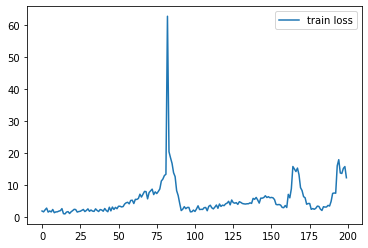

In [9]:
plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
plt.legend()
plt.show()

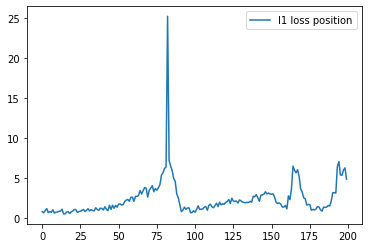

In [10]:
plt.plot(np.arange(len(losses_train2)), losses_train2, label="l1 loss position")
plt.legend()
plt.show()

# Store the model

Let's store the model as a torchscript. This format allows us to re-load the model and weights without requiring the class definition later.

**Take note of the path, you will use it later to evaluate your planning model!**

In [13]:
# to_save = torch.jit.script(model.cpu())
# path_to_save = f"{gettempdir()}/urban_driver_v0416.pt"
# to_save.save(path_to_save)
# print(f"MODEL STORED at {path_to_save}")

path_to_save = "D:\\YURUIDU\\DRF_Simulation\\Param_Estimation\\Param_Estimation\\planning\\urban_driver\\urban_driver_v0416.pt"
torch.save(model, path_to_save)
print(f"MODEL STORED at {path_to_save}")

MODEL STORED at D:\YURUIDU\DRF_Simulation\Param_Estimation\Param_Estimation\planning\urban_driver\urban_driver_v0416.pt


# Congratulations in training your very own Urban Driver model!
### What's Next

Now that your model is trained and safely stored, you can evaluate how it performs in our simulation:


### [Closed-loop evaluation](./closed_loop_test.ipynb)
In this setting the model **is in full control of the AV's** future movements.

## Pre-trained models
We provide a collection of pre-trained models, including both our proposed method and several ablations from our paper:
- [Urban Driver](https://lyft-l5-datasets-public.s3-us-west-2.amazonaws.com/models/urban_driver/BPTT.pt);
- [Urban Driver without BPTT](https://lyft-l5-datasets-public.s3-us-west-2.amazonaws.com/models/urban_driver/MS.pt);
- [Open Loop](https://lyft-l5-datasets-public.s3-us-west-2.amazonaws.com/models/urban_driver/OL.pt);
- [Open Loop with history](https://lyft-l5-datasets-public.s3-us-west-2.amazonaws.com/models/urban_driver/OL_HS.pt);

To use one of the models simply download the corresponding `.pt` file and load it in the evaluation notebooks - further, please see the comments above regarding necessary config changes.